In [1]:
import os
import numpy as np
import multiprocessing
import time
import esutil
import glob
import sys
sys.path = np.append(sys.path,'/home/s1/kherron/software/skymap')
sys.path = np.append(sys.path,'/home/s1/kherron/software/decasu')
import decasu
from decasu.utils import op_str_to_code
from decasu.healpix_consolidator import HealpixConsolidator
import healsparse as hsp
import skymap 
from skymap.survey import DelveSkymap, SurveyZoom, ZoomFormatter360
from skymap.utils import setdefaults
import matplotlib.pyplot as plt
from decasu import decasu_globals
import healpy as hp


In [11]:
config = decasu.Configuration.load_yaml("../DR_312_config.yaml")
outputpath="../hsp/"
clear_intermediate_files=True
bands=['r','i','z']

In [12]:
fname_list = []
mapfiles_list = []
num=2
for map_type in config.map_types.keys():
    for operation in config.map_types[map_type]:
                op_code = op_str_to_code(operation)
                for band in bands:
                    # Get full map filename
                    fname = os.path.join(outputpath, config.map_filename(band,
                                                                         map_type,
                                                                         op_code))
                    # Check if file exists
                    if os.path.isfile(fname):
                        continue

                    # Assemble all the individual pixel maps
                    fname_template = config.tile_map_filename_template(band,
                                                                       map_type,
                                                                       op_code)

                    
                    mapfiles = sorted(glob.glob(os.path.join(outputpath,
                                                             '????????????',
                                                             fname_template)))
                    fname_list.append(fname)
                    mapfiles_list.append(mapfiles)

In [15]:
subname_list = []
for i in fname_list:
    sub_name_1 = i[:7]+'p0_'+i[7:]
    sub_name_2 = i[:7]+'p1_'+i[7:]
    subname_list = np.append(subname_list,[sub_name_1,sub_name_2])


In [16]:
subname_list

array(['../hsp/p0_delve_dr3_1_1_r_coverage_sum.hs',
       '../hsp/p1_delve_dr3_1_1_r_coverage_sum.hs',
       '../hsp/p0_delve_dr3_1_1_i_coverage_sum.hs',
       '../hsp/p1_delve_dr3_1_1_i_coverage_sum.hs',
       '../hsp/p0_delve_dr3_1_1_z_coverage_sum.hs',
       '../hsp/p1_delve_dr3_1_1_z_coverage_sum.hs',
       '../hsp/p0_delve_dr3_1_1_r_nexp_sum.hs',
       '../hsp/p1_delve_dr3_1_1_r_nexp_sum.hs',
       '../hsp/p0_delve_dr3_1_1_i_nexp_sum.hs',
       '../hsp/p1_delve_dr3_1_1_i_nexp_sum.hs',
       '../hsp/p0_delve_dr3_1_1_z_nexp_sum.hs',
       '../hsp/p1_delve_dr3_1_1_z_nexp_sum.hs',
       '../hsp/p0_delve_dr3_1_1_r_exptime_sum.hs',
       '../hsp/p1_delve_dr3_1_1_r_exptime_sum.hs',
       '../hsp/p0_delve_dr3_1_1_i_exptime_sum.hs',
       '../hsp/p1_delve_dr3_1_1_i_exptime_sum.hs',
       '../hsp/p0_delve_dr3_1_1_z_exptime_sum.hs',
       '../hsp/p1_delve_dr3_1_1_z_exptime_sum.hs',
       '../hsp/p0_delve_dr3_1_1_r_airmass_wmean.hs',
       '../hsp/p1_delve_dr3_1_1_r_airmass

In [18]:
for i in range(len(fname_list)):
    if len(mapfiles_list[i]) == 0:
        print(fname_list[i],' skipped.')
        continue
    mapfiles_p0 = mapfiles_list[i][:3000]
    mapfiles_p1 = mapfiles_list[i][3000:]
    clear_intermediate_files=False
    intermap_list = []
    while len(intermap_list) != 2:
        #hpix_consolidator = HealpixConsolidator(config, clear_intermediate_files)
        hsp.cat_healsparse_files(mapfiles_p0,subname_list[0],in_memory=False)
        intermap_list = [subname_list[0]]
        subname_list = subname_list[1:]

        #hpix_consolidator = HealpixConsolidator(config, clear_intermediate_files)
        hsp.cat_healsparse_files(mapfiles_p1,subname_list[0],in_memory=False)
        intermap_list = np.append(intermap_list,subname_list[0])
        subname_list = subname_list[1:]

        #hpix_consolidator = HealpixConsolidator(config, clear_intermediate_files)
        hsp.cat_healsparse_files(intermap_list,fname_list[i],in_memory=False)
        print(fname_list[i],' has been made...')

    required size: 524288 existing size: 262144
    reshaping image to: [524288]
    required size: 786432 existing size: 524288
    reshaping image to: [786432]
    required size: 1048576 existing size: 786432
    reshaping image to: [1048576]
    required size: 1310720 existing size: 1048576
    reshaping image to: [1310720]
    required size: 1572864 existing size: 1310720
    reshaping image to: [1572864]
    required size: 1835008 existing size: 1572864
    reshaping image to: [1835008]
    required size: 2097152 existing size: 1835008
    reshaping image to: [2097152]
    required size: 2359296 existing size: 2097152
    reshaping image to: [2359296]
    required size: 2621440 existing size: 2359296
    reshaping image to: [2621440]
    required size: 2883584 existing size: 2621440
    reshaping image to: [2883584]
    required size: 3145728 existing size: 2883584
    reshaping image to: [3145728]
    required size: 3407872 existing size: 3145728
    reshaping image to: [3407872]

    required size: 26738688 existing size: 26476544
    reshaping image to: [26738688]
    required size: 27000832 existing size: 26738688
    reshaping image to: [27000832]
    required size: 27262976 existing size: 27000832
    reshaping image to: [27262976]
    required size: 27525120 existing size: 27262976
    reshaping image to: [27525120]
    required size: 27787264 existing size: 27525120
    reshaping image to: [27787264]
    required size: 28049408 existing size: 27787264
    reshaping image to: [28049408]
    required size: 28311552 existing size: 28049408
    reshaping image to: [28311552]
    required size: 28573696 existing size: 28311552
    reshaping image to: [28573696]
    required size: 28835840 existing size: 28573696
    reshaping image to: [28835840]
    required size: 29097984 existing size: 28835840
    reshaping image to: [29097984]
    required size: 29360128 existing size: 29097984
    reshaping image to: [29360128]
    required size: 29622272 existing size: 

    required size: 53477376 existing size: 53215232
    reshaping image to: [53477376]
    required size: 53739520 existing size: 53477376
    reshaping image to: [53739520]
    required size: 54001664 existing size: 53739520
    reshaping image to: [54001664]
    required size: 54263808 existing size: 54001664
    reshaping image to: [54263808]
    required size: 54525952 existing size: 54263808
    reshaping image to: [54525952]
    required size: 54788096 existing size: 54525952
    reshaping image to: [54788096]
    required size: 55050240 existing size: 54788096
    reshaping image to: [55050240]
    required size: 55312384 existing size: 55050240
    reshaping image to: [55312384]
    required size: 55574528 existing size: 55312384
    reshaping image to: [55574528]
    required size: 55836672 existing size: 55574528
    reshaping image to: [55836672]
    required size: 56098816 existing size: 55836672
    reshaping image to: [56098816]
    required size: 56360960 existing size: 

    required size: 81264640 existing size: 81002496
    reshaping image to: [81264640]
    required size: 81526784 existing size: 81264640
    reshaping image to: [81526784]
    required size: 81788928 existing size: 81526784
    reshaping image to: [81788928]
    required size: 82051072 existing size: 81788928
    reshaping image to: [82051072]
    required size: 82313216 existing size: 82051072
    reshaping image to: [82313216]
    required size: 82575360 existing size: 82313216
    reshaping image to: [82575360]
    required size: 82837504 existing size: 82575360
    reshaping image to: [82837504]
    required size: 83099648 existing size: 82837504
    reshaping image to: [83099648]
    required size: 83361792 existing size: 83099648
    reshaping image to: [83361792]
    required size: 83623936 existing size: 83361792
    reshaping image to: [83623936]
    required size: 83886080 existing size: 83623936
    reshaping image to: [83886080]
    required size: 84148224 existing size: 

    required size: 107741184 existing size: 107479040
    reshaping image to: [107741184]
    required size: 108003328 existing size: 107741184
    reshaping image to: [108003328]
    required size: 108265472 existing size: 108003328
    reshaping image to: [108265472]
    required size: 108527616 existing size: 108265472
    reshaping image to: [108527616]
    required size: 108789760 existing size: 108527616
    reshaping image to: [108789760]
    required size: 109051904 existing size: 108789760
    reshaping image to: [109051904]
    required size: 109314048 existing size: 109051904
    reshaping image to: [109314048]
    required size: 109576192 existing size: 109314048
    reshaping image to: [109576192]
    required size: 109838336 existing size: 109576192
    reshaping image to: [109838336]
    required size: 110100480 existing size: 109838336
    reshaping image to: [110100480]
    required size: 110362624 existing size: 110100480
    reshaping image to: [110362624]
    requir

    required size: 133693440 existing size: 133431296
    reshaping image to: [133693440]
    required size: 133955584 existing size: 133693440
    reshaping image to: [133955584]
    required size: 134217728 existing size: 133955584
    reshaping image to: [134217728]
    required size: 134479872 existing size: 134217728
    reshaping image to: [134479872]
    required size: 134742016 existing size: 134479872
    reshaping image to: [134742016]
    required size: 135004160 existing size: 134742016
    reshaping image to: [135004160]
    required size: 135266304 existing size: 135004160
    reshaping image to: [135266304]
    required size: 135528448 existing size: 135266304
    reshaping image to: [135528448]
    required size: 135790592 existing size: 135528448
    reshaping image to: [135790592]
    required size: 524288 existing size: 262144
    reshaping image to: [524288]
    required size: 786432 existing size: 524288
    reshaping image to: [786432]
    required size: 1048576 e

    required size: 23855104 existing size: 23592960
    reshaping image to: [23855104]
    required size: 24117248 existing size: 23855104
    reshaping image to: [24117248]
    required size: 24379392 existing size: 24117248
    reshaping image to: [24379392]
    required size: 24641536 existing size: 24379392
    reshaping image to: [24641536]
    required size: 24903680 existing size: 24641536
    reshaping image to: [24903680]
    required size: 25165824 existing size: 24903680
    reshaping image to: [25165824]
    required size: 25427968 existing size: 25165824
    reshaping image to: [25427968]
    required size: 25690112 existing size: 25427968
    reshaping image to: [25690112]
    required size: 25952256 existing size: 25690112
    reshaping image to: [25952256]
    required size: 26214400 existing size: 25952256
    reshaping image to: [26214400]
    required size: 26476544 existing size: 26214400
    reshaping image to: [26476544]
    required size: 26738688 existing size: 

    required size: 50069504 existing size: 49807360
    reshaping image to: [50069504]
    required size: 50331648 existing size: 50069504
    reshaping image to: [50331648]
    required size: 50593792 existing size: 50331648
    reshaping image to: [50593792]
    required size: 50855936 existing size: 50593792
    reshaping image to: [50855936]
    required size: 51118080 existing size: 50855936
    reshaping image to: [51118080]
    required size: 51380224 existing size: 51118080
    reshaping image to: [51380224]
    required size: 51642368 existing size: 51380224
    reshaping image to: [51642368]
    required size: 51904512 existing size: 51642368
    reshaping image to: [51904512]
    required size: 52166656 existing size: 51904512
    reshaping image to: [52166656]
    required size: 52428800 existing size: 52166656
    reshaping image to: [52428800]
    required size: 52690944 existing size: 52428800
    reshaping image to: [52690944]
    required size: 52953088 existing size: 

    required size: 76283904 existing size: 76021760
    reshaping image to: [76283904]
    required size: 76546048 existing size: 76283904
    reshaping image to: [76546048]
    required size: 76808192 existing size: 76546048
    reshaping image to: [76808192]
    required size: 77070336 existing size: 76808192
    reshaping image to: [77070336]
    required size: 77332480 existing size: 77070336
    reshaping image to: [77332480]
    required size: 77594624 existing size: 77332480
    reshaping image to: [77594624]
    required size: 77856768 existing size: 77594624
    reshaping image to: [77856768]
    required size: 78118912 existing size: 77856768
    reshaping image to: [78118912]
    required size: 78381056 existing size: 78118912
    reshaping image to: [78381056]
    required size: 78643200 existing size: 78381056
    reshaping image to: [78643200]
    required size: 78905344 existing size: 78643200
    reshaping image to: [78905344]
    required size: 79167488 existing size: 

    required size: 103022592 existing size: 102760448
    reshaping image to: [103022592]
    required size: 103284736 existing size: 103022592
    reshaping image to: [103284736]
    required size: 103546880 existing size: 103284736
    reshaping image to: [103546880]
    required size: 103809024 existing size: 103546880
    reshaping image to: [103809024]
    required size: 104071168 existing size: 103809024
    reshaping image to: [104071168]
    required size: 104333312 existing size: 104071168
    reshaping image to: [104333312]
    required size: 104595456 existing size: 104333312
    reshaping image to: [104595456]
    required size: 104857600 existing size: 104595456
    reshaping image to: [104857600]
    required size: 105119744 existing size: 104857600
    reshaping image to: [105119744]
    required size: 105381888 existing size: 105119744
    reshaping image to: [105381888]
    required size: 105644032 existing size: 105381888
    reshaping image to: [105644032]
    requir

    required size: 128712704 existing size: 128450560
    reshaping image to: [128712704]
    required size: 128974848 existing size: 128712704
    reshaping image to: [128974848]
    required size: 129236992 existing size: 128974848
    reshaping image to: [129236992]
    required size: 129499136 existing size: 129236992
    reshaping image to: [129499136]
    required size: 129761280 existing size: 129499136
    reshaping image to: [129761280]
    required size: 130023424 existing size: 129761280
    reshaping image to: [130023424]
    required size: 130285568 existing size: 130023424
    reshaping image to: [130285568]
    required size: 130547712 existing size: 130285568
    reshaping image to: [130547712]
    required size: 130809856 existing size: 130547712
    reshaping image to: [130809856]
    required size: 131072000 existing size: 130809856
    reshaping image to: [131072000]
    required size: 131334144 existing size: 131072000
    reshaping image to: [131334144]
    requir

    required size: 153616384 existing size: 153354240
    reshaping image to: [153616384]
    required size: 153878528 existing size: 153616384
    reshaping image to: [153878528]
    required size: 154140672 existing size: 153878528
    reshaping image to: [154140672]
    required size: 154402816 existing size: 154140672
    reshaping image to: [154402816]
    required size: 154664960 existing size: 154402816
    reshaping image to: [154664960]
    required size: 154927104 existing size: 154664960
    reshaping image to: [154927104]
    required size: 155189248 existing size: 154927104
    reshaping image to: [155189248]
    required size: 155451392 existing size: 155189248
    reshaping image to: [155451392]
    required size: 155713536 existing size: 155451392
    reshaping image to: [155713536]
    required size: 155975680 existing size: 155713536
    reshaping image to: [155975680]
    required size: 156237824 existing size: 155975680
    reshaping image to: [156237824]
    requir

    required size: 17825792 existing size: 17563648
    reshaping image to: [17825792]
    required size: 18087936 existing size: 17825792
    reshaping image to: [18087936]
    required size: 18350080 existing size: 18087936
    reshaping image to: [18350080]
    required size: 18612224 existing size: 18350080
    reshaping image to: [18612224]
    required size: 18874368 existing size: 18612224
    reshaping image to: [18874368]
    required size: 19136512 existing size: 18874368
    reshaping image to: [19136512]
    required size: 19398656 existing size: 19136512
    reshaping image to: [19398656]
    required size: 19660800 existing size: 19398656
    reshaping image to: [19660800]
    required size: 19922944 existing size: 19660800
    reshaping image to: [19922944]
    required size: 20185088 existing size: 19922944
    reshaping image to: [20185088]
    required size: 20447232 existing size: 20185088
    reshaping image to: [20447232]
    required size: 20709376 existing size: 

    required size: 46661632 existing size: 46399488
    reshaping image to: [46661632]
    required size: 46923776 existing size: 46661632
    reshaping image to: [46923776]
    required size: 47185920 existing size: 46923776
    reshaping image to: [47185920]
    required size: 47448064 existing size: 47185920
    reshaping image to: [47448064]
    required size: 47710208 existing size: 47448064
    reshaping image to: [47710208]
    required size: 47972352 existing size: 47710208
    reshaping image to: [47972352]
    required size: 48234496 existing size: 47972352
    reshaping image to: [48234496]
    required size: 48496640 existing size: 48234496
    reshaping image to: [48496640]
    required size: 48758784 existing size: 48496640
    reshaping image to: [48758784]
    required size: 49020928 existing size: 48758784
    reshaping image to: [49020928]
    required size: 49283072 existing size: 49020928
    reshaping image to: [49283072]
    required size: 49545216 existing size: 

    required size: 71565312 existing size: 71303168
    reshaping image to: [71565312]
    required size: 71827456 existing size: 71565312
    reshaping image to: [71827456]
    required size: 72089600 existing size: 71827456
    reshaping image to: [72089600]
    required size: 72351744 existing size: 72089600
    reshaping image to: [72351744]
    required size: 72613888 existing size: 72351744
    reshaping image to: [72613888]
    required size: 72876032 existing size: 72613888
    reshaping image to: [72876032]
    required size: 73138176 existing size: 72876032
    reshaping image to: [73138176]
    required size: 73400320 existing size: 73138176
    reshaping image to: [73400320]
    required size: 73662464 existing size: 73400320
    reshaping image to: [73662464]
    required size: 73924608 existing size: 73662464
    reshaping image to: [73924608]
    required size: 74186752 existing size: 73924608
    reshaping image to: [74186752]
    required size: 74448896 existing size: 

    required size: 96731136 existing size: 96468992
    reshaping image to: [96731136]
    required size: 96993280 existing size: 96731136
    reshaping image to: [96993280]
    required size: 97255424 existing size: 96993280
    reshaping image to: [97255424]
    required size: 97517568 existing size: 97255424
    reshaping image to: [97517568]
    required size: 97779712 existing size: 97517568
    reshaping image to: [97779712]
    required size: 98041856 existing size: 97779712
    reshaping image to: [98041856]
    required size: 98304000 existing size: 98041856
    reshaping image to: [98304000]
    required size: 98566144 existing size: 98304000
    reshaping image to: [98566144]
    required size: 98828288 existing size: 98566144
    reshaping image to: [98828288]
    required size: 99090432 existing size: 98828288
    reshaping image to: [99090432]
    required size: 99352576 existing size: 99090432
    reshaping image to: [99352576]
    required size: 99614720 existing size: 

    required size: 123469824 existing size: 123207680
    reshaping image to: [123469824]
    required size: 123731968 existing size: 123469824
    reshaping image to: [123731968]
    required size: 123994112 existing size: 123731968
    reshaping image to: [123994112]
    required size: 124256256 existing size: 123994112
    reshaping image to: [124256256]
    required size: 124518400 existing size: 124256256
    reshaping image to: [124518400]
    required size: 124780544 existing size: 124518400
    reshaping image to: [124780544]
    required size: 125042688 existing size: 124780544
    reshaping image to: [125042688]
    required size: 125304832 existing size: 125042688
    reshaping image to: [125304832]
    required size: 125566976 existing size: 125304832
    reshaping image to: [125566976]
    required size: 125829120 existing size: 125566976
    reshaping image to: [125829120]
    required size: 126091264 existing size: 125829120
    reshaping image to: [126091264]
    requir

    required size: 152043520 existing size: 151781376
    reshaping image to: [152043520]
    required size: 152305664 existing size: 152043520
    reshaping image to: [152305664]
    required size: 152567808 existing size: 152305664
    reshaping image to: [152567808]
    required size: 152829952 existing size: 152567808
    reshaping image to: [152829952]
    required size: 153092096 existing size: 152829952
    reshaping image to: [153092096]
    required size: 153354240 existing size: 153092096
    reshaping image to: [153354240]
    required size: 153616384 existing size: 153354240
    reshaping image to: [153616384]
    required size: 153878528 existing size: 153616384
    reshaping image to: [153878528]
    required size: 154140672 existing size: 153878528
    reshaping image to: [154140672]
    required size: 154402816 existing size: 154140672
    reshaping image to: [154402816]
    required size: 154664960 existing size: 154402816
    reshaping image to: [154664960]
    requir

    required size: 179044352 existing size: 178782208
    reshaping image to: [179044352]
    required size: 179306496 existing size: 179044352
    reshaping image to: [179306496]
    required size: 179568640 existing size: 179306496
    reshaping image to: [179568640]
    required size: 179830784 existing size: 179568640
    reshaping image to: [179830784]
    required size: 180092928 existing size: 179830784
    reshaping image to: [180092928]
    required size: 180355072 existing size: 180092928
    reshaping image to: [180355072]
    required size: 180617216 existing size: 180355072
    reshaping image to: [180617216]
    required size: 180879360 existing size: 180617216
    reshaping image to: [180879360]
    required size: 181141504 existing size: 180879360
    reshaping image to: [181141504]
    required size: 181403648 existing size: 181141504
    reshaping image to: [181403648]
    required size: 181665792 existing size: 181403648
    reshaping image to: [181665792]
    requir

    required size: 205520896 existing size: 205258752
    reshaping image to: [205520896]
    required size: 205783040 existing size: 205520896
    reshaping image to: [205783040]
    required size: 206045184 existing size: 205783040
    reshaping image to: [206045184]
    required size: 206307328 existing size: 206045184
    reshaping image to: [206307328]
    required size: 206569472 existing size: 206307328
    reshaping image to: [206569472]
    required size: 206831616 existing size: 206569472
    reshaping image to: [206831616]
    required size: 207093760 existing size: 206831616
    reshaping image to: [207093760]
    required size: 207355904 existing size: 207093760
    reshaping image to: [207355904]
    required size: 207618048 existing size: 207355904
    reshaping image to: [207618048]
    required size: 207880192 existing size: 207618048
    reshaping image to: [207880192]
    required size: 208142336 existing size: 207880192
    reshaping image to: [208142336]
    requir

    required size: 233832448 existing size: 233570304
    reshaping image to: [233832448]
    required size: 234094592 existing size: 233832448
    reshaping image to: [234094592]
    required size: 234356736 existing size: 234094592
    reshaping image to: [234356736]
    required size: 234618880 existing size: 234356736
    reshaping image to: [234618880]
    required size: 234881024 existing size: 234618880
    reshaping image to: [234881024]
    required size: 235143168 existing size: 234881024
    reshaping image to: [235143168]
    required size: 235405312 existing size: 235143168
    reshaping image to: [235405312]
    required size: 235667456 existing size: 235405312
    reshaping image to: [235667456]
    required size: 235929600 existing size: 235667456
    reshaping image to: [235929600]
    required size: 236191744 existing size: 235929600
    reshaping image to: [236191744]
    required size: 236453888 existing size: 236191744
    reshaping image to: [236453888]
    requir

    required size: 257949696 existing size: 257687552
    reshaping image to: [257949696]
    required size: 258211840 existing size: 257949696
    reshaping image to: [258211840]
    required size: 258473984 existing size: 258211840
    reshaping image to: [258473984]
    required size: 258736128 existing size: 258473984
    reshaping image to: [258736128]
    required size: 258998272 existing size: 258736128
    reshaping image to: [258998272]
    required size: 259260416 existing size: 258998272
    reshaping image to: [259260416]
    required size: 259522560 existing size: 259260416
    reshaping image to: [259522560]
    required size: 259784704 existing size: 259522560
    reshaping image to: [259784704]
    required size: 260046848 existing size: 259784704
    reshaping image to: [260046848]
    required size: 260308992 existing size: 260046848
    reshaping image to: [260308992]
    required size: 260571136 existing size: 260308992
    reshaping image to: [260571136]
    requir

    required size: 285736960 existing size: 285474816
    reshaping image to: [285736960]
    required size: 285999104 existing size: 285736960
    reshaping image to: [285999104]
    required size: 286261248 existing size: 285999104
    reshaping image to: [286261248]
../hsp/delve_dr3_1_1_r_coverage_sum.hs  has been made...
    required size: 524288 existing size: 262144
    reshaping image to: [524288]
    required size: 786432 existing size: 524288
    reshaping image to: [786432]
    required size: 1048576 existing size: 786432
    reshaping image to: [1048576]
    required size: 1310720 existing size: 1048576
    reshaping image to: [1310720]
    required size: 1572864 existing size: 1310720
    reshaping image to: [1572864]
    required size: 1835008 existing size: 1572864
    reshaping image to: [1835008]
    required size: 2097152 existing size: 1835008
    reshaping image to: [2097152]
    required size: 2359296 existing size: 2097152
    reshaping image to: [2359296]
    requ

    required size: 26476544 existing size: 26214400
    reshaping image to: [26476544]
    required size: 26738688 existing size: 26476544
    reshaping image to: [26738688]
    required size: 27000832 existing size: 26738688
    reshaping image to: [27000832]
    required size: 27262976 existing size: 27000832
    reshaping image to: [27262976]
    required size: 27525120 existing size: 27262976
    reshaping image to: [27525120]
    required size: 27787264 existing size: 27525120
    reshaping image to: [27787264]
    required size: 28049408 existing size: 27787264
    reshaping image to: [28049408]
    required size: 28311552 existing size: 28049408
    reshaping image to: [28311552]
    required size: 28573696 existing size: 28311552
    reshaping image to: [28573696]
    required size: 28835840 existing size: 28573696
    reshaping image to: [28835840]
    required size: 29097984 existing size: 28835840
    reshaping image to: [29097984]
    required size: 29360128 existing size: 

    required size: 52690944 existing size: 52428800
    reshaping image to: [52690944]
    required size: 52953088 existing size: 52690944
    reshaping image to: [52953088]
    required size: 53215232 existing size: 52953088
    reshaping image to: [53215232]
    required size: 53477376 existing size: 53215232
    reshaping image to: [53477376]
    required size: 53739520 existing size: 53477376
    reshaping image to: [53739520]
    required size: 54001664 existing size: 53739520
    reshaping image to: [54001664]
    required size: 54263808 existing size: 54001664
    reshaping image to: [54263808]
    required size: 54525952 existing size: 54263808
    reshaping image to: [54525952]
    required size: 54788096 existing size: 54525952
    reshaping image to: [54788096]
    required size: 55050240 existing size: 54788096
    reshaping image to: [55050240]
    required size: 55312384 existing size: 55050240
    reshaping image to: [55312384]
    required size: 55574528 existing size: 

    required size: 77594624 existing size: 77332480
    reshaping image to: [77594624]
    required size: 77856768 existing size: 77594624
    reshaping image to: [77856768]
    required size: 78118912 existing size: 77856768
    reshaping image to: [78118912]
    required size: 78381056 existing size: 78118912
    reshaping image to: [78381056]
    required size: 78643200 existing size: 78381056
    reshaping image to: [78643200]
    required size: 78905344 existing size: 78643200
    reshaping image to: [78905344]
    required size: 79167488 existing size: 78905344
    reshaping image to: [79167488]
    required size: 79429632 existing size: 79167488
    reshaping image to: [79429632]
    required size: 79691776 existing size: 79429632
    reshaping image to: [79691776]
    required size: 79953920 existing size: 79691776
    reshaping image to: [79953920]
    required size: 80216064 existing size: 79953920
    reshaping image to: [80216064]
    required size: 80478208 existing size: 

    required size: 102236160 existing size: 101974016
    reshaping image to: [102236160]
    required size: 102498304 existing size: 102236160
    reshaping image to: [102498304]
    required size: 102760448 existing size: 102498304
    reshaping image to: [102760448]
    required size: 103022592 existing size: 102760448
    reshaping image to: [103022592]
    required size: 103284736 existing size: 103022592
    reshaping image to: [103284736]
    required size: 103546880 existing size: 103284736
    reshaping image to: [103546880]
    required size: 103809024 existing size: 103546880
    reshaping image to: [103809024]
    required size: 104071168 existing size: 103809024
    reshaping image to: [104071168]
    required size: 104333312 existing size: 104071168
    reshaping image to: [104333312]
    required size: 104595456 existing size: 104333312
    reshaping image to: [104595456]
    required size: 104857600 existing size: 104595456
    reshaping image to: [104857600]
    requir

    required size: 128188416 existing size: 127926272
    reshaping image to: [128188416]
    required size: 128450560 existing size: 128188416
    reshaping image to: [128450560]
    required size: 128712704 existing size: 128450560
    reshaping image to: [128712704]
    required size: 128974848 existing size: 128712704
    reshaping image to: [128974848]
    required size: 129236992 existing size: 128974848
    reshaping image to: [129236992]
    required size: 129499136 existing size: 129236992
    reshaping image to: [129499136]
    required size: 129761280 existing size: 129499136
    reshaping image to: [129761280]
    required size: 130023424 existing size: 129761280
    reshaping image to: [130023424]
    required size: 130285568 existing size: 130023424
    reshaping image to: [130285568]
    required size: 130547712 existing size: 130285568
    reshaping image to: [130547712]
    required size: 130809856 existing size: 130547712
    reshaping image to: [130809856]
    requir

    required size: 18087936 existing size: 17825792
    reshaping image to: [18087936]
    required size: 18350080 existing size: 18087936
    reshaping image to: [18350080]
    required size: 18612224 existing size: 18350080
    reshaping image to: [18612224]
    required size: 18874368 existing size: 18612224
    reshaping image to: [18874368]
    required size: 19136512 existing size: 18874368
    reshaping image to: [19136512]
    required size: 19398656 existing size: 19136512
    reshaping image to: [19398656]
    required size: 19660800 existing size: 19398656
    reshaping image to: [19660800]
    required size: 19922944 existing size: 19660800
    reshaping image to: [19922944]
    required size: 20185088 existing size: 19922944
    reshaping image to: [20185088]
    required size: 20447232 existing size: 20185088
    reshaping image to: [20447232]
    required size: 20709376 existing size: 20447232
    reshaping image to: [20709376]
    required size: 20971520 existing size: 

    required size: 44040192 existing size: 43778048
    reshaping image to: [44040192]
    required size: 44302336 existing size: 44040192
    reshaping image to: [44302336]
    required size: 44564480 existing size: 44302336
    reshaping image to: [44564480]
    required size: 44826624 existing size: 44564480
    reshaping image to: [44826624]
    required size: 45088768 existing size: 44826624
    reshaping image to: [45088768]
    required size: 45350912 existing size: 45088768
    reshaping image to: [45350912]
    required size: 45613056 existing size: 45350912
    reshaping image to: [45613056]
    required size: 45875200 existing size: 45613056
    reshaping image to: [45875200]
    required size: 46137344 existing size: 45875200
    reshaping image to: [46137344]
    required size: 46399488 existing size: 46137344
    reshaping image to: [46399488]
    required size: 46661632 existing size: 46399488
    reshaping image to: [46661632]
    required size: 46923776 existing size: 

    required size: 69992448 existing size: 69730304
    reshaping image to: [69992448]
    required size: 70254592 existing size: 69992448
    reshaping image to: [70254592]
    required size: 70516736 existing size: 70254592
    reshaping image to: [70516736]
    required size: 70778880 existing size: 70516736
    reshaping image to: [70778880]
    required size: 71041024 existing size: 70778880
    reshaping image to: [71041024]
    required size: 71303168 existing size: 71041024
    reshaping image to: [71303168]
    required size: 71565312 existing size: 71303168
    reshaping image to: [71565312]
    required size: 71827456 existing size: 71565312
    reshaping image to: [71827456]
    required size: 72089600 existing size: 71827456
    reshaping image to: [72089600]
    required size: 72351744 existing size: 72089600
    reshaping image to: [72351744]
    required size: 72613888 existing size: 72351744
    reshaping image to: [72613888]
    required size: 72876032 existing size: 

    required size: 96468992 existing size: 96206848
    reshaping image to: [96468992]
    required size: 96731136 existing size: 96468992
    reshaping image to: [96731136]
    required size: 96993280 existing size: 96731136
    reshaping image to: [96993280]
    required size: 97255424 existing size: 96993280
    reshaping image to: [97255424]
    required size: 97517568 existing size: 97255424
    reshaping image to: [97517568]
    required size: 97779712 existing size: 97517568
    reshaping image to: [97779712]
    required size: 98041856 existing size: 97779712
    reshaping image to: [98041856]
    required size: 98304000 existing size: 98041856
    reshaping image to: [98304000]
    required size: 98566144 existing size: 98304000
    reshaping image to: [98566144]
    required size: 98828288 existing size: 98566144
    reshaping image to: [98828288]
    required size: 99090432 existing size: 98828288
    reshaping image to: [99090432]
    required size: 99352576 existing size: 

    required size: 122159104 existing size: 121896960
    reshaping image to: [122159104]
    required size: 122421248 existing size: 122159104
    reshaping image to: [122421248]
    required size: 122683392 existing size: 122421248
    reshaping image to: [122683392]
    required size: 122945536 existing size: 122683392
    reshaping image to: [122945536]
    required size: 123207680 existing size: 122945536
    reshaping image to: [123207680]
    required size: 123469824 existing size: 123207680
    reshaping image to: [123469824]
    required size: 123731968 existing size: 123469824
    reshaping image to: [123731968]
    required size: 123994112 existing size: 123731968
    reshaping image to: [123994112]
    required size: 124256256 existing size: 123994112
    reshaping image to: [124256256]
    required size: 124518400 existing size: 124256256
    reshaping image to: [124518400]
    required size: 124780544 existing size: 124518400
    reshaping image to: [124780544]
    requir

    required size: 148897792 existing size: 148635648
    reshaping image to: [148897792]
    required size: 149159936 existing size: 148897792
    reshaping image to: [149159936]
    required size: 149422080 existing size: 149159936
    reshaping image to: [149422080]
    required size: 149684224 existing size: 149422080
    reshaping image to: [149684224]
    required size: 149946368 existing size: 149684224
    reshaping image to: [149946368]
    required size: 150208512 existing size: 149946368
    reshaping image to: [150208512]
    required size: 150470656 existing size: 150208512
    reshaping image to: [150470656]
    required size: 150732800 existing size: 150470656
    reshaping image to: [150732800]
    required size: 150994944 existing size: 150732800
    reshaping image to: [150994944]
    required size: 151257088 existing size: 150994944
    reshaping image to: [151257088]
    required size: 151519232 existing size: 151257088
    reshaping image to: [151519232]
    requir

    required size: 14155776 existing size: 13893632
    reshaping image to: [14155776]
    required size: 14417920 existing size: 14155776
    reshaping image to: [14417920]
    required size: 14680064 existing size: 14417920
    reshaping image to: [14680064]
    required size: 14942208 existing size: 14680064
    reshaping image to: [14942208]
    required size: 15204352 existing size: 14942208
    reshaping image to: [15204352]
    required size: 15466496 existing size: 15204352
    reshaping image to: [15466496]
    required size: 15728640 existing size: 15466496
    reshaping image to: [15728640]
    required size: 15990784 existing size: 15728640
    reshaping image to: [15990784]
    required size: 16252928 existing size: 15990784
    reshaping image to: [16252928]
    required size: 16515072 existing size: 16252928
    reshaping image to: [16515072]
    required size: 16777216 existing size: 16515072
    reshaping image to: [16777216]
    required size: 17039360 existing size: 

    required size: 41680896 existing size: 41418752
    reshaping image to: [41680896]
    required size: 41943040 existing size: 41680896
    reshaping image to: [41943040]
    required size: 42205184 existing size: 41943040
    reshaping image to: [42205184]
    required size: 42467328 existing size: 42205184
    reshaping image to: [42467328]
    required size: 42729472 existing size: 42467328
    reshaping image to: [42729472]
    required size: 42991616 existing size: 42729472
    reshaping image to: [42991616]
    required size: 43253760 existing size: 42991616
    reshaping image to: [43253760]
    required size: 43515904 existing size: 43253760
    reshaping image to: [43515904]
    required size: 43778048 existing size: 43515904
    reshaping image to: [43778048]
    required size: 44040192 existing size: 43778048
    reshaping image to: [44040192]
    required size: 44302336 existing size: 44040192
    reshaping image to: [44302336]
    required size: 44564480 existing size: 

    required size: 67108864 existing size: 66846720
    reshaping image to: [67108864]
    required size: 67371008 existing size: 67108864
    reshaping image to: [67371008]
    required size: 67633152 existing size: 67371008
    reshaping image to: [67633152]
    required size: 67895296 existing size: 67633152
    reshaping image to: [67895296]
    required size: 68157440 existing size: 67895296
    reshaping image to: [68157440]
    required size: 68419584 existing size: 68157440
    reshaping image to: [68419584]
    required size: 68681728 existing size: 68419584
    reshaping image to: [68681728]
    required size: 68943872 existing size: 68681728
    reshaping image to: [68943872]
    required size: 69206016 existing size: 68943872
    reshaping image to: [69206016]
    required size: 69468160 existing size: 69206016
    reshaping image to: [69468160]
    required size: 69730304 existing size: 69468160
    reshaping image to: [69730304]
    required size: 69992448 existing size: 

    required size: 92536832 existing size: 92274688
    reshaping image to: [92536832]
    required size: 92798976 existing size: 92536832
    reshaping image to: [92798976]
    required size: 93061120 existing size: 92798976
    reshaping image to: [93061120]
    required size: 93323264 existing size: 93061120
    reshaping image to: [93323264]
    required size: 93585408 existing size: 93323264
    reshaping image to: [93585408]
    required size: 93847552 existing size: 93585408
    reshaping image to: [93847552]
    required size: 94109696 existing size: 93847552
    reshaping image to: [94109696]
    required size: 94371840 existing size: 94109696
    reshaping image to: [94371840]
    required size: 94633984 existing size: 94371840
    reshaping image to: [94633984]
    required size: 94896128 existing size: 94633984
    reshaping image to: [94896128]
    required size: 95158272 existing size: 94896128
    reshaping image to: [95158272]
    required size: 95420416 existing size: 

    required size: 117440512 existing size: 117178368
    reshaping image to: [117440512]
    required size: 117702656 existing size: 117440512
    reshaping image to: [117702656]
    required size: 117964800 existing size: 117702656
    reshaping image to: [117964800]
    required size: 118226944 existing size: 117964800
    reshaping image to: [118226944]
    required size: 118489088 existing size: 118226944
    reshaping image to: [118489088]
    required size: 118751232 existing size: 118489088
    reshaping image to: [118751232]
    required size: 119013376 existing size: 118751232
    reshaping image to: [119013376]
    required size: 119275520 existing size: 119013376
    reshaping image to: [119275520]
    required size: 119537664 existing size: 119275520
    reshaping image to: [119537664]
    required size: 119799808 existing size: 119537664
    reshaping image to: [119799808]
    required size: 120061952 existing size: 119799808
    reshaping image to: [120061952]
    requir

    required size: 143392768 existing size: 143130624
    reshaping image to: [143392768]
    required size: 143654912 existing size: 143392768
    reshaping image to: [143654912]
    required size: 143917056 existing size: 143654912
    reshaping image to: [143917056]
    required size: 144179200 existing size: 143917056
    reshaping image to: [144179200]
    required size: 144441344 existing size: 144179200
    reshaping image to: [144441344]
    required size: 144703488 existing size: 144441344
    reshaping image to: [144703488]
    required size: 144965632 existing size: 144703488
    reshaping image to: [144965632]
    required size: 145227776 existing size: 144965632
    reshaping image to: [145227776]
    required size: 145489920 existing size: 145227776
    reshaping image to: [145489920]
    required size: 145752064 existing size: 145489920
    reshaping image to: [145752064]
    required size: 146014208 existing size: 145752064
    reshaping image to: [146014208]
    requir

    required size: 169345024 existing size: 169082880
    reshaping image to: [169345024]
    required size: 169607168 existing size: 169345024
    reshaping image to: [169607168]
    required size: 169869312 existing size: 169607168
    reshaping image to: [169869312]
    required size: 170131456 existing size: 169869312
    reshaping image to: [170131456]
    required size: 170393600 existing size: 170131456
    reshaping image to: [170393600]
    required size: 170655744 existing size: 170393600
    reshaping image to: [170655744]
    required size: 170917888 existing size: 170655744
    reshaping image to: [170917888]
    required size: 171180032 existing size: 170917888
    reshaping image to: [171180032]
    required size: 171442176 existing size: 171180032
    reshaping image to: [171442176]
    required size: 171704320 existing size: 171442176
    reshaping image to: [171704320]
    required size: 171966464 existing size: 171704320
    reshaping image to: [171966464]
    requir

    required size: 195559424 existing size: 195297280
    reshaping image to: [195559424]
    required size: 195821568 existing size: 195559424
    reshaping image to: [195821568]
    required size: 196083712 existing size: 195821568
    reshaping image to: [196083712]
    required size: 196345856 existing size: 196083712
    reshaping image to: [196345856]
    required size: 196608000 existing size: 196345856
    reshaping image to: [196608000]
    required size: 196870144 existing size: 196608000
    reshaping image to: [196870144]
    required size: 197132288 existing size: 196870144
    reshaping image to: [197132288]
    required size: 197394432 existing size: 197132288
    reshaping image to: [197394432]
    required size: 197656576 existing size: 197394432
    reshaping image to: [197656576]
    required size: 197918720 existing size: 197656576
    reshaping image to: [197918720]
    required size: 198180864 existing size: 197918720
    reshaping image to: [198180864]
    requir

    required size: 220200960 existing size: 219938816
    reshaping image to: [220200960]
    required size: 220463104 existing size: 220200960
    reshaping image to: [220463104]
    required size: 220725248 existing size: 220463104
    reshaping image to: [220725248]
    required size: 220987392 existing size: 220725248
    reshaping image to: [220987392]
    required size: 221249536 existing size: 220987392
    reshaping image to: [221249536]
    required size: 221511680 existing size: 221249536
    reshaping image to: [221511680]
    required size: 221773824 existing size: 221511680
    reshaping image to: [221773824]
    required size: 222035968 existing size: 221773824
    reshaping image to: [222035968]
    required size: 222298112 existing size: 222035968
    reshaping image to: [222298112]
    required size: 222560256 existing size: 222298112
    reshaping image to: [222560256]
    required size: 222822400 existing size: 222560256
    reshaping image to: [222822400]
    requir

    required size: 245366784 existing size: 245104640
    reshaping image to: [245366784]
    required size: 245628928 existing size: 245366784
    reshaping image to: [245628928]
    required size: 245891072 existing size: 245628928
    reshaping image to: [245891072]
    required size: 246153216 existing size: 245891072
    reshaping image to: [246153216]
    required size: 246415360 existing size: 246153216
    reshaping image to: [246415360]
    required size: 246677504 existing size: 246415360
    reshaping image to: [246677504]
    required size: 246939648 existing size: 246677504
    reshaping image to: [246939648]
    required size: 247201792 existing size: 246939648
    reshaping image to: [247201792]
    required size: 247463936 existing size: 247201792
    reshaping image to: [247463936]
    required size: 247726080 existing size: 247463936
    reshaping image to: [247726080]
    required size: 247988224 existing size: 247726080
    reshaping image to: [247988224]
    requir

    required size: 273678336 existing size: 273416192
    reshaping image to: [273678336]
    required size: 273940480 existing size: 273678336
    reshaping image to: [273940480]
    required size: 274202624 existing size: 273940480
    reshaping image to: [274202624]
    required size: 274464768 existing size: 274202624
    reshaping image to: [274464768]
    required size: 274726912 existing size: 274464768
    reshaping image to: [274726912]
    required size: 274989056 existing size: 274726912
    reshaping image to: [274989056]
    required size: 275251200 existing size: 274989056
    reshaping image to: [275251200]
    required size: 275513344 existing size: 275251200
    reshaping image to: [275513344]
    required size: 275775488 existing size: 275513344
    reshaping image to: [275775488]
    required size: 276037632 existing size: 275775488
    reshaping image to: [276037632]
    required size: 276299776 existing size: 276037632
    reshaping image to: [276299776]
    requir

    required size: 14417920 existing size: 14155776
    reshaping image to: [14417920]
    required size: 14680064 existing size: 14417920
    reshaping image to: [14680064]
    required size: 14942208 existing size: 14680064
    reshaping image to: [14942208]
    required size: 15204352 existing size: 14942208
    reshaping image to: [15204352]
    required size: 15466496 existing size: 15204352
    reshaping image to: [15466496]
    required size: 15728640 existing size: 15466496
    reshaping image to: [15728640]
    required size: 15990784 existing size: 15728640
    reshaping image to: [15990784]
    required size: 16252928 existing size: 15990784
    reshaping image to: [16252928]
    required size: 16515072 existing size: 16252928
    reshaping image to: [16515072]
    required size: 16777216 existing size: 16515072
    reshaping image to: [16777216]
    required size: 17039360 existing size: 16777216
    reshaping image to: [17039360]
    required size: 17301504 existing size: 

    required size: 40894464 existing size: 40632320
    reshaping image to: [40894464]
    required size: 41156608 existing size: 40894464
    reshaping image to: [41156608]
    required size: 41418752 existing size: 41156608
    reshaping image to: [41418752]
    required size: 41680896 existing size: 41418752
    reshaping image to: [41680896]
    required size: 41943040 existing size: 41680896
    reshaping image to: [41943040]
    required size: 42205184 existing size: 41943040
    reshaping image to: [42205184]
    required size: 42467328 existing size: 42205184
    reshaping image to: [42467328]
    required size: 42729472 existing size: 42467328
    reshaping image to: [42729472]
    required size: 42991616 existing size: 42729472
    reshaping image to: [42991616]
    required size: 43253760 existing size: 42991616
    reshaping image to: [43253760]
    required size: 43515904 existing size: 43253760
    reshaping image to: [43515904]
    required size: 43778048 existing size: 

    required size: 67371008 existing size: 67108864
    reshaping image to: [67371008]
    required size: 67633152 existing size: 67371008
    reshaping image to: [67633152]
    required size: 67895296 existing size: 67633152
    reshaping image to: [67895296]
    required size: 68157440 existing size: 67895296
    reshaping image to: [68157440]
    required size: 68419584 existing size: 68157440
    reshaping image to: [68419584]
    required size: 68681728 existing size: 68419584
    reshaping image to: [68681728]
    required size: 68943872 existing size: 68681728
    reshaping image to: [68943872]
    required size: 69206016 existing size: 68943872
    reshaping image to: [69206016]
    required size: 69468160 existing size: 69206016
    reshaping image to: [69468160]
    required size: 69730304 existing size: 69468160
    reshaping image to: [69730304]
    required size: 69992448 existing size: 69730304
    reshaping image to: [69992448]
    required size: 70254592 existing size: 

    required size: 92274688 existing size: 92012544
    reshaping image to: [92274688]
    required size: 92536832 existing size: 92274688
    reshaping image to: [92536832]
    required size: 92798976 existing size: 92536832
    reshaping image to: [92798976]
    required size: 93061120 existing size: 92798976
    reshaping image to: [93061120]
    required size: 93323264 existing size: 93061120
    reshaping image to: [93323264]
    required size: 93585408 existing size: 93323264
    reshaping image to: [93585408]
    required size: 93847552 existing size: 93585408
    reshaping image to: [93847552]
    required size: 94109696 existing size: 93847552
    reshaping image to: [94109696]
    required size: 94371840 existing size: 94109696
    reshaping image to: [94371840]
    required size: 94633984 existing size: 94371840
    reshaping image to: [94633984]
    required size: 94896128 existing size: 94633984
    reshaping image to: [94896128]
    required size: 95158272 existing size: 

    required size: 116916224 existing size: 116654080
    reshaping image to: [116916224]
    required size: 117178368 existing size: 116916224
    reshaping image to: [117178368]
    required size: 117440512 existing size: 117178368
    reshaping image to: [117440512]
    required size: 117702656 existing size: 117440512
    reshaping image to: [117702656]
    required size: 117964800 existing size: 117702656
    reshaping image to: [117964800]
    required size: 118226944 existing size: 117964800
    reshaping image to: [118226944]
    required size: 118489088 existing size: 118226944
    reshaping image to: [118489088]
    required size: 118751232 existing size: 118489088
    reshaping image to: [118751232]
    required size: 119013376 existing size: 118751232
    reshaping image to: [119013376]
    required size: 119275520 existing size: 119013376
    reshaping image to: [119275520]
    required size: 119537664 existing size: 119275520
    reshaping image to: [119537664]
    requir

    required size: 6029312 existing size: 5767168
    reshaping image to: [6029312]
    required size: 6291456 existing size: 6029312
    reshaping image to: [6291456]
    required size: 6553600 existing size: 6291456
    reshaping image to: [6553600]
    required size: 6815744 existing size: 6553600
    reshaping image to: [6815744]
    required size: 7077888 existing size: 6815744
    reshaping image to: [7077888]
    required size: 7340032 existing size: 7077888
    reshaping image to: [7340032]
    required size: 7602176 existing size: 7340032
    reshaping image to: [7602176]
    required size: 7864320 existing size: 7602176
    reshaping image to: [7864320]
    required size: 8126464 existing size: 7864320
    reshaping image to: [8126464]
    required size: 8388608 existing size: 8126464
    reshaping image to: [8388608]
    required size: 8650752 existing size: 8388608
    reshaping image to: [8650752]
    required size: 8912896 existing size: 8650752
    reshaping image to: [8

    required size: 32768000 existing size: 32505856
    reshaping image to: [32768000]
    required size: 33030144 existing size: 32768000
    reshaping image to: [33030144]
    required size: 33292288 existing size: 33030144
    reshaping image to: [33292288]
    required size: 33554432 existing size: 33292288
    reshaping image to: [33554432]
    required size: 33816576 existing size: 33554432
    reshaping image to: [33816576]
    required size: 34078720 existing size: 33816576
    reshaping image to: [34078720]
    required size: 34340864 existing size: 34078720
    reshaping image to: [34340864]
    required size: 34603008 existing size: 34340864
    reshaping image to: [34603008]
    required size: 34865152 existing size: 34603008
    reshaping image to: [34865152]
    required size: 35127296 existing size: 34865152
    reshaping image to: [35127296]
    required size: 35389440 existing size: 35127296
    reshaping image to: [35389440]
    required size: 35651584 existing size: 

    required size: 58982400 existing size: 58720256
    reshaping image to: [58982400]
    required size: 59244544 existing size: 58982400
    reshaping image to: [59244544]
    required size: 59506688 existing size: 59244544
    reshaping image to: [59506688]
    required size: 59768832 existing size: 59506688
    reshaping image to: [59768832]
    required size: 60030976 existing size: 59768832
    reshaping image to: [60030976]
    required size: 60293120 existing size: 60030976
    reshaping image to: [60293120]
    required size: 60555264 existing size: 60293120
    reshaping image to: [60555264]
    required size: 60817408 existing size: 60555264
    reshaping image to: [60817408]
    required size: 61079552 existing size: 60817408
    reshaping image to: [61079552]
    required size: 61341696 existing size: 61079552
    reshaping image to: [61341696]
    required size: 61603840 existing size: 61341696
    reshaping image to: [61603840]
    required size: 61865984 existing size: 

    required size: 83886080 existing size: 83623936
    reshaping image to: [83886080]
    required size: 84148224 existing size: 83886080
    reshaping image to: [84148224]
    required size: 84410368 existing size: 84148224
    reshaping image to: [84410368]
    required size: 84672512 existing size: 84410368
    reshaping image to: [84672512]
    required size: 84934656 existing size: 84672512
    reshaping image to: [84934656]
    required size: 85196800 existing size: 84934656
    reshaping image to: [85196800]
    required size: 85458944 existing size: 85196800
    reshaping image to: [85458944]
    required size: 85721088 existing size: 85458944
    reshaping image to: [85721088]
    required size: 85983232 existing size: 85721088
    reshaping image to: [85983232]
    required size: 86245376 existing size: 85983232
    reshaping image to: [86245376]
    required size: 86507520 existing size: 86245376
    reshaping image to: [86507520]
    required size: 86769664 existing size: 

    required size: 109838336 existing size: 109576192
    reshaping image to: [109838336]
    required size: 110100480 existing size: 109838336
    reshaping image to: [110100480]
    required size: 110362624 existing size: 110100480
    reshaping image to: [110362624]
    required size: 110624768 existing size: 110362624
    reshaping image to: [110624768]
    required size: 110886912 existing size: 110624768
    reshaping image to: [110886912]
    required size: 111149056 existing size: 110886912
    reshaping image to: [111149056]
    required size: 111411200 existing size: 111149056
    reshaping image to: [111411200]
    required size: 111673344 existing size: 111411200
    reshaping image to: [111673344]
    required size: 111935488 existing size: 111673344
    reshaping image to: [111935488]
    required size: 112197632 existing size: 111935488
    reshaping image to: [112197632]
    required size: 112459776 existing size: 112197632
    reshaping image to: [112459776]
    requir

    required size: 133955584 existing size: 133693440
    reshaping image to: [133955584]
    required size: 134217728 existing size: 133955584
    reshaping image to: [134217728]
    required size: 134479872 existing size: 134217728
    reshaping image to: [134479872]
    required size: 134742016 existing size: 134479872
    reshaping image to: [134742016]
    required size: 135004160 existing size: 134742016
    reshaping image to: [135004160]
    required size: 135266304 existing size: 135004160
    reshaping image to: [135266304]
    required size: 135528448 existing size: 135266304
    reshaping image to: [135528448]
    required size: 135790592 existing size: 135528448
    reshaping image to: [135790592]
    required size: 136052736 existing size: 135790592
    reshaping image to: [136052736]
    required size: 136314880 existing size: 136052736
    reshaping image to: [136314880]
    required size: 136577024 existing size: 136314880
    reshaping image to: [136577024]
    requir

    required size: 158859264 existing size: 158597120
    reshaping image to: [158859264]
    required size: 159121408 existing size: 158859264
    reshaping image to: [159121408]
    required size: 159383552 existing size: 159121408
    reshaping image to: [159383552]
    required size: 159645696 existing size: 159383552
    reshaping image to: [159645696]
    required size: 159907840 existing size: 159645696
    reshaping image to: [159907840]
    required size: 160169984 existing size: 159907840
    reshaping image to: [160169984]
    required size: 160432128 existing size: 160169984
    reshaping image to: [160432128]
    required size: 160694272 existing size: 160432128
    reshaping image to: [160694272]
    required size: 160956416 existing size: 160694272
    reshaping image to: [160956416]
    required size: 161218560 existing size: 160956416
    reshaping image to: [161218560]
    required size: 161480704 existing size: 161218560
    reshaping image to: [161480704]
    requir

    required size: 22806528 existing size: 22544384
    reshaping image to: [22806528]
    required size: 23068672 existing size: 22806528
    reshaping image to: [23068672]
    required size: 23330816 existing size: 23068672
    reshaping image to: [23330816]
    required size: 23592960 existing size: 23330816
    reshaping image to: [23592960]
    required size: 23855104 existing size: 23592960
    reshaping image to: [23855104]
    required size: 24117248 existing size: 23855104
    reshaping image to: [24117248]
    required size: 24379392 existing size: 24117248
    reshaping image to: [24379392]
    required size: 24641536 existing size: 24379392
    reshaping image to: [24641536]
    required size: 24903680 existing size: 24641536
    reshaping image to: [24903680]
    required size: 25165824 existing size: 24903680
    reshaping image to: [25165824]
    required size: 25427968 existing size: 25165824
    reshaping image to: [25427968]
    required size: 25690112 existing size: 

    required size: 49283072 existing size: 49020928
    reshaping image to: [49283072]
    required size: 49545216 existing size: 49283072
    reshaping image to: [49545216]
    required size: 49807360 existing size: 49545216
    reshaping image to: [49807360]
    required size: 50069504 existing size: 49807360
    reshaping image to: [50069504]
    required size: 50331648 existing size: 50069504
    reshaping image to: [50331648]
    required size: 50593792 existing size: 50331648
    reshaping image to: [50593792]
    required size: 50855936 existing size: 50593792
    reshaping image to: [50855936]
    required size: 51118080 existing size: 50855936
    reshaping image to: [51118080]
    required size: 51380224 existing size: 51118080
    reshaping image to: [51380224]
    required size: 51642368 existing size: 51380224
    reshaping image to: [51642368]
    required size: 51904512 existing size: 51642368
    reshaping image to: [51904512]
    required size: 52166656 existing size: 

    required size: 77856768 existing size: 77594624
    reshaping image to: [77856768]
    required size: 78118912 existing size: 77856768
    reshaping image to: [78118912]
    required size: 78381056 existing size: 78118912
    reshaping image to: [78381056]
    required size: 78643200 existing size: 78381056
    reshaping image to: [78643200]
    required size: 78905344 existing size: 78643200
    reshaping image to: [78905344]
    required size: 79167488 existing size: 78905344
    reshaping image to: [79167488]
    required size: 79429632 existing size: 79167488
    reshaping image to: [79429632]
    required size: 79691776 existing size: 79429632
    reshaping image to: [79691776]
    required size: 79953920 existing size: 79691776
    reshaping image to: [79953920]
    required size: 80216064 existing size: 79953920
    reshaping image to: [80216064]
    required size: 80478208 existing size: 80216064
    reshaping image to: [80478208]
    required size: 80740352 existing size: 

    required size: 103022592 existing size: 102760448
    reshaping image to: [103022592]
    required size: 103284736 existing size: 103022592
    reshaping image to: [103284736]
    required size: 103546880 existing size: 103284736
    reshaping image to: [103546880]
    required size: 103809024 existing size: 103546880
    reshaping image to: [103809024]
    required size: 104071168 existing size: 103809024
    reshaping image to: [104071168]
    required size: 104333312 existing size: 104071168
    reshaping image to: [104333312]
    required size: 104595456 existing size: 104333312
    reshaping image to: [104595456]
    required size: 104857600 existing size: 104595456
    reshaping image to: [104857600]
    required size: 105119744 existing size: 104857600
    reshaping image to: [105119744]
    required size: 105381888 existing size: 105119744
    reshaping image to: [105381888]
    required size: 105644032 existing size: 105381888
    reshaping image to: [105644032]
    requir

    required size: 129236992 existing size: 128974848
    reshaping image to: [129236992]
    required size: 129499136 existing size: 129236992
    reshaping image to: [129499136]
    required size: 129761280 existing size: 129499136
    reshaping image to: [129761280]
    required size: 130023424 existing size: 129761280
    reshaping image to: [130023424]
    required size: 130285568 existing size: 130023424
    reshaping image to: [130285568]
    required size: 130547712 existing size: 130285568
    reshaping image to: [130547712]
    required size: 130809856 existing size: 130547712
    reshaping image to: [130809856]
    required size: 131072000 existing size: 130809856
    reshaping image to: [131072000]
    required size: 131334144 existing size: 131072000
    reshaping image to: [131334144]
    required size: 131596288 existing size: 131334144
    reshaping image to: [131596288]
    required size: 131858432 existing size: 131596288
    reshaping image to: [131858432]
    requir

    required size: 157286400 existing size: 157024256
    reshaping image to: [157286400]
    required size: 157548544 existing size: 157286400
    reshaping image to: [157548544]
    required size: 157810688 existing size: 157548544
    reshaping image to: [157810688]
    required size: 158072832 existing size: 157810688
    reshaping image to: [158072832]
    required size: 158334976 existing size: 158072832
    reshaping image to: [158334976]
    required size: 158597120 existing size: 158334976
    reshaping image to: [158597120]
    required size: 158859264 existing size: 158597120
    reshaping image to: [158859264]
    required size: 159121408 existing size: 158859264
    reshaping image to: [159121408]
    required size: 159383552 existing size: 159121408
    reshaping image to: [159383552]
    required size: 159645696 existing size: 159383552
    reshaping image to: [159645696]
    required size: 159907840 existing size: 159645696
    reshaping image to: [159907840]
    requir

    required size: 182452224 existing size: 182190080
    reshaping image to: [182452224]
    required size: 182714368 existing size: 182452224
    reshaping image to: [182714368]
    required size: 182976512 existing size: 182714368
    reshaping image to: [182976512]
    required size: 183238656 existing size: 182976512
    reshaping image to: [183238656]
    required size: 183500800 existing size: 183238656
    reshaping image to: [183500800]
    required size: 183762944 existing size: 183500800
    reshaping image to: [183762944]
    required size: 184025088 existing size: 183762944
    reshaping image to: [184025088]
    required size: 184287232 existing size: 184025088
    reshaping image to: [184287232]
    required size: 184549376 existing size: 184287232
    reshaping image to: [184549376]
    required size: 184811520 existing size: 184549376
    reshaping image to: [184811520]
    required size: 185073664 existing size: 184811520
    reshaping image to: [185073664]
    requir

    required size: 208142336 existing size: 207880192
    reshaping image to: [208142336]
    required size: 208404480 existing size: 208142336
    reshaping image to: [208404480]
    required size: 208666624 existing size: 208404480
    reshaping image to: [208666624]
    required size: 208928768 existing size: 208666624
    reshaping image to: [208928768]
    required size: 209190912 existing size: 208928768
    reshaping image to: [209190912]
    required size: 209453056 existing size: 209190912
    reshaping image to: [209453056]
    required size: 209715200 existing size: 209453056
    reshaping image to: [209715200]
    required size: 209977344 existing size: 209715200
    reshaping image to: [209977344]
    required size: 210239488 existing size: 209977344
    reshaping image to: [210239488]
    required size: 210501632 existing size: 210239488
    reshaping image to: [210501632]
    required size: 210763776 existing size: 210501632
    reshaping image to: [210763776]
    requir

    required size: 236191744 existing size: 235929600
    reshaping image to: [236191744]
    required size: 236453888 existing size: 236191744
    reshaping image to: [236453888]
    required size: 236716032 existing size: 236453888
    reshaping image to: [236716032]
    required size: 236978176 existing size: 236716032
    reshaping image to: [236978176]
    required size: 237240320 existing size: 236978176
    reshaping image to: [237240320]
    required size: 237502464 existing size: 237240320
    reshaping image to: [237502464]
    required size: 237764608 existing size: 237502464
    reshaping image to: [237764608]
    required size: 238026752 existing size: 237764608
    reshaping image to: [238026752]
    required size: 238288896 existing size: 238026752
    reshaping image to: [238288896]
    required size: 238551040 existing size: 238288896
    reshaping image to: [238551040]
    required size: 238813184 existing size: 238551040
    reshaping image to: [238813184]
    requir

    required size: 260833280 existing size: 260571136
    reshaping image to: [260833280]
    required size: 261095424 existing size: 260833280
    reshaping image to: [261095424]
    required size: 261357568 existing size: 261095424
    reshaping image to: [261357568]
    required size: 261619712 existing size: 261357568
    reshaping image to: [261619712]
    required size: 261881856 existing size: 261619712
    reshaping image to: [261881856]
    required size: 262144000 existing size: 261881856
    reshaping image to: [262144000]
    required size: 262406144 existing size: 262144000
    reshaping image to: [262406144]
    required size: 262668288 existing size: 262406144
    reshaping image to: [262668288]
    required size: 262930432 existing size: 262668288
    reshaping image to: [262930432]
    required size: 263192576 existing size: 262930432
    reshaping image to: [263192576]
    required size: 263454720 existing size: 263192576
    reshaping image to: [263454720]
    requir

    required size: 524288 existing size: 262144
    reshaping image to: [524288]
    required size: 786432 existing size: 524288
    reshaping image to: [786432]
    required size: 1048576 existing size: 786432
    reshaping image to: [1048576]
    required size: 1310720 existing size: 1048576
    reshaping image to: [1310720]
    required size: 1572864 existing size: 1310720
    reshaping image to: [1572864]
    required size: 1835008 existing size: 1572864
    reshaping image to: [1835008]
    required size: 2097152 existing size: 1835008
    reshaping image to: [2097152]
    required size: 2359296 existing size: 2097152
    reshaping image to: [2359296]
    required size: 2621440 existing size: 2359296
    reshaping image to: [2621440]
    required size: 2883584 existing size: 2621440
    reshaping image to: [2883584]
    required size: 3145728 existing size: 2883584
    reshaping image to: [3145728]
    required size: 3407872 existing size: 3145728
    reshaping image to: [3407872]

    required size: 26476544 existing size: 26214400
    reshaping image to: [26476544]
    required size: 26738688 existing size: 26476544
    reshaping image to: [26738688]
    required size: 27000832 existing size: 26738688
    reshaping image to: [27000832]
    required size: 27262976 existing size: 27000832
    reshaping image to: [27262976]
    required size: 27525120 existing size: 27262976
    reshaping image to: [27525120]
    required size: 27787264 existing size: 27525120
    reshaping image to: [27787264]
    required size: 28049408 existing size: 27787264
    reshaping image to: [28049408]
    required size: 28311552 existing size: 28049408
    reshaping image to: [28311552]
    required size: 28573696 existing size: 28311552
    reshaping image to: [28573696]
    required size: 28835840 existing size: 28573696
    reshaping image to: [28835840]
    required size: 29097984 existing size: 28835840
    reshaping image to: [29097984]
    required size: 29360128 existing size: 

    required size: 51904512 existing size: 51642368
    reshaping image to: [51904512]
    required size: 52166656 existing size: 51904512
    reshaping image to: [52166656]
    required size: 52428800 existing size: 52166656
    reshaping image to: [52428800]
    required size: 52690944 existing size: 52428800
    reshaping image to: [52690944]
    required size: 52953088 existing size: 52690944
    reshaping image to: [52953088]
    required size: 53215232 existing size: 52953088
    reshaping image to: [53215232]
    required size: 53477376 existing size: 53215232
    reshaping image to: [53477376]
    required size: 53739520 existing size: 53477376
    reshaping image to: [53739520]
    required size: 54001664 existing size: 53739520
    reshaping image to: [54001664]
    required size: 54263808 existing size: 54001664
    reshaping image to: [54263808]
    required size: 54525952 existing size: 54263808
    reshaping image to: [54525952]
    required size: 54788096 existing size: 

    required size: 77594624 existing size: 77332480
    reshaping image to: [77594624]
    required size: 77856768 existing size: 77594624
    reshaping image to: [77856768]
    required size: 78118912 existing size: 77856768
    reshaping image to: [78118912]
    required size: 78381056 existing size: 78118912
    reshaping image to: [78381056]
    required size: 78643200 existing size: 78381056
    reshaping image to: [78643200]
    required size: 78905344 existing size: 78643200
    reshaping image to: [78905344]
    required size: 79167488 existing size: 78905344
    reshaping image to: [79167488]
    required size: 79429632 existing size: 79167488
    reshaping image to: [79429632]
    required size: 79691776 existing size: 79429632
    reshaping image to: [79691776]
    required size: 79953920 existing size: 79691776
    reshaping image to: [79953920]
    required size: 80216064 existing size: 79953920
    reshaping image to: [80216064]
    required size: 80478208 existing size: 

    required size: 103284736 existing size: 103022592
    reshaping image to: [103284736]
    required size: 103546880 existing size: 103284736
    reshaping image to: [103546880]
    required size: 103809024 existing size: 103546880
    reshaping image to: [103809024]
    required size: 104071168 existing size: 103809024
    reshaping image to: [104071168]
    required size: 104333312 existing size: 104071168
    reshaping image to: [104333312]
    required size: 104595456 existing size: 104333312
    reshaping image to: [104595456]
    required size: 104857600 existing size: 104595456
    reshaping image to: [104857600]
    required size: 105119744 existing size: 104857600
    reshaping image to: [105119744]
    required size: 105381888 existing size: 105119744
    reshaping image to: [105381888]
    required size: 105644032 existing size: 105381888
    reshaping image to: [105644032]
    required size: 105906176 existing size: 105644032
    reshaping image to: [105906176]
    requir

    required size: 128188416 existing size: 127926272
    reshaping image to: [128188416]
    required size: 128450560 existing size: 128188416
    reshaping image to: [128450560]
    required size: 128712704 existing size: 128450560
    reshaping image to: [128712704]
    required size: 128974848 existing size: 128712704
    reshaping image to: [128974848]
    required size: 129236992 existing size: 128974848
    reshaping image to: [129236992]
    required size: 129499136 existing size: 129236992
    reshaping image to: [129499136]
    required size: 129761280 existing size: 129499136
    reshaping image to: [129761280]
    required size: 130023424 existing size: 129761280
    reshaping image to: [130023424]
    required size: 130285568 existing size: 130023424
    reshaping image to: [130285568]
    required size: 130547712 existing size: 130285568
    reshaping image to: [130547712]
    required size: 130809856 existing size: 130547712
    reshaping image to: [130809856]
    requir

    required size: 18087936 existing size: 17825792
    reshaping image to: [18087936]
    required size: 18350080 existing size: 18087936
    reshaping image to: [18350080]
    required size: 18612224 existing size: 18350080
    reshaping image to: [18612224]
    required size: 18874368 existing size: 18612224
    reshaping image to: [18874368]
    required size: 19136512 existing size: 18874368
    reshaping image to: [19136512]
    required size: 19398656 existing size: 19136512
    reshaping image to: [19398656]
    required size: 19660800 existing size: 19398656
    reshaping image to: [19660800]
    required size: 19922944 existing size: 19660800
    reshaping image to: [19922944]
    required size: 20185088 existing size: 19922944
    reshaping image to: [20185088]
    required size: 20447232 existing size: 20185088
    reshaping image to: [20447232]
    required size: 20709376 existing size: 20447232
    reshaping image to: [20709376]
    required size: 20971520 existing size: 

    required size: 43778048 existing size: 43515904
    reshaping image to: [43778048]
    required size: 44040192 existing size: 43778048
    reshaping image to: [44040192]
    required size: 44302336 existing size: 44040192
    reshaping image to: [44302336]
    required size: 44564480 existing size: 44302336
    reshaping image to: [44564480]
    required size: 44826624 existing size: 44564480
    reshaping image to: [44826624]
    required size: 45088768 existing size: 44826624
    reshaping image to: [45088768]
    required size: 45350912 existing size: 45088768
    reshaping image to: [45350912]
    required size: 45613056 existing size: 45350912
    reshaping image to: [45613056]
    required size: 45875200 existing size: 45613056
    reshaping image to: [45875200]
    required size: 46137344 existing size: 45875200
    reshaping image to: [46137344]
    required size: 46399488 existing size: 46137344
    reshaping image to: [46399488]
    required size: 46661632 existing size: 

    required size: 68681728 existing size: 68419584
    reshaping image to: [68681728]
    required size: 68943872 existing size: 68681728
    reshaping image to: [68943872]
    required size: 69206016 existing size: 68943872
    reshaping image to: [69206016]
    required size: 69468160 existing size: 69206016
    reshaping image to: [69468160]
    required size: 69730304 existing size: 69468160
    reshaping image to: [69730304]
    required size: 69992448 existing size: 69730304
    reshaping image to: [69992448]
    required size: 70254592 existing size: 69992448
    reshaping image to: [70254592]
    required size: 70516736 existing size: 70254592
    reshaping image to: [70516736]
    required size: 70778880 existing size: 70516736
    reshaping image to: [70778880]
    required size: 71041024 existing size: 70778880
    reshaping image to: [71041024]
    required size: 71303168 existing size: 71041024
    reshaping image to: [71303168]
    required size: 71565312 existing size: 

    required size: 94371840 existing size: 94109696
    reshaping image to: [94371840]
    required size: 94633984 existing size: 94371840
    reshaping image to: [94633984]
    required size: 94896128 existing size: 94633984
    reshaping image to: [94896128]
    required size: 95158272 existing size: 94896128
    reshaping image to: [95158272]
    required size: 95420416 existing size: 95158272
    reshaping image to: [95420416]
    required size: 95682560 existing size: 95420416
    reshaping image to: [95682560]
    required size: 95944704 existing size: 95682560
    reshaping image to: [95944704]
    required size: 96206848 existing size: 95944704
    reshaping image to: [96206848]
    required size: 96468992 existing size: 96206848
    reshaping image to: [96468992]
    required size: 96731136 existing size: 96468992
    reshaping image to: [96731136]
    required size: 96993280 existing size: 96731136
    reshaping image to: [96993280]
    required size: 97255424 existing size: 

    required size: 118751232 existing size: 118489088
    reshaping image to: [118751232]
    required size: 119013376 existing size: 118751232
    reshaping image to: [119013376]
    required size: 119275520 existing size: 119013376
    reshaping image to: [119275520]
    required size: 119537664 existing size: 119275520
    reshaping image to: [119537664]
    required size: 119799808 existing size: 119537664
    reshaping image to: [119799808]
    required size: 120061952 existing size: 119799808
    reshaping image to: [120061952]
    required size: 120324096 existing size: 120061952
    reshaping image to: [120324096]
    required size: 120586240 existing size: 120324096
    reshaping image to: [120586240]
    required size: 120848384 existing size: 120586240
    reshaping image to: [120848384]
    required size: 121110528 existing size: 120848384
    reshaping image to: [121110528]
    required size: 121372672 existing size: 121110528
    reshaping image to: [121372672]
    requir

    required size: 143130624 existing size: 142868480
    reshaping image to: [143130624]
    required size: 143392768 existing size: 143130624
    reshaping image to: [143392768]
    required size: 143654912 existing size: 143392768
    reshaping image to: [143654912]
    required size: 143917056 existing size: 143654912
    reshaping image to: [143917056]
    required size: 144179200 existing size: 143917056
    reshaping image to: [144179200]
    required size: 144441344 existing size: 144179200
    reshaping image to: [144441344]
    required size: 144703488 existing size: 144441344
    reshaping image to: [144703488]
    required size: 144965632 existing size: 144703488
    reshaping image to: [144965632]
    required size: 145227776 existing size: 144965632
    reshaping image to: [145227776]
    required size: 145489920 existing size: 145227776
    reshaping image to: [145489920]
    required size: 145752064 existing size: 145489920
    reshaping image to: [145752064]
    requir

    required size: 4718592 existing size: 4456448
    reshaping image to: [4718592]
    required size: 4980736 existing size: 4718592
    reshaping image to: [4980736]
    required size: 5242880 existing size: 4980736
    reshaping image to: [5242880]
    required size: 5505024 existing size: 5242880
    reshaping image to: [5505024]
    required size: 5767168 existing size: 5505024
    reshaping image to: [5767168]
    required size: 6029312 existing size: 5767168
    reshaping image to: [6029312]
    required size: 6291456 existing size: 6029312
    reshaping image to: [6291456]
    required size: 6553600 existing size: 6291456
    reshaping image to: [6553600]
    required size: 6815744 existing size: 6553600
    reshaping image to: [6815744]
    required size: 7077888 existing size: 6815744
    reshaping image to: [7077888]
    required size: 7340032 existing size: 7077888
    reshaping image to: [7340032]
    required size: 7602176 existing size: 7340032
    reshaping image to: [7

    required size: 29622272 existing size: 29360128
    reshaping image to: [29622272]
    required size: 29884416 existing size: 29622272
    reshaping image to: [29884416]
    required size: 30146560 existing size: 29884416
    reshaping image to: [30146560]
    required size: 30408704 existing size: 30146560
    reshaping image to: [30408704]
    required size: 30670848 existing size: 30408704
    reshaping image to: [30670848]
    required size: 30932992 existing size: 30670848
    reshaping image to: [30932992]
    required size: 31195136 existing size: 30932992
    reshaping image to: [31195136]
    required size: 31457280 existing size: 31195136
    reshaping image to: [31457280]
    required size: 31719424 existing size: 31457280
    reshaping image to: [31719424]
    required size: 31981568 existing size: 31719424
    reshaping image to: [31981568]
    required size: 32243712 existing size: 31981568
    reshaping image to: [32243712]
    required size: 32505856 existing size: 

    required size: 58720256 existing size: 58458112
    reshaping image to: [58720256]
    required size: 58982400 existing size: 58720256
    reshaping image to: [58982400]
    required size: 59244544 existing size: 58982400
    reshaping image to: [59244544]
    required size: 59506688 existing size: 59244544
    reshaping image to: [59506688]
    required size: 59768832 existing size: 59506688
    reshaping image to: [59768832]
    required size: 60030976 existing size: 59768832
    reshaping image to: [60030976]
    required size: 60293120 existing size: 60030976
    reshaping image to: [60293120]
    required size: 60555264 existing size: 60293120
    reshaping image to: [60555264]
    required size: 60817408 existing size: 60555264
    reshaping image to: [60817408]
    required size: 61079552 existing size: 60817408
    reshaping image to: [61079552]
    required size: 61341696 existing size: 61079552
    reshaping image to: [61341696]
    required size: 61603840 existing size: 

    required size: 85983232 existing size: 85721088
    reshaping image to: [85983232]
    required size: 86245376 existing size: 85983232
    reshaping image to: [86245376]
    required size: 86507520 existing size: 86245376
    reshaping image to: [86507520]
    required size: 86769664 existing size: 86507520
    reshaping image to: [86769664]
    required size: 87031808 existing size: 86769664
    reshaping image to: [87031808]
    required size: 87293952 existing size: 87031808
    reshaping image to: [87293952]
    required size: 87556096 existing size: 87293952
    reshaping image to: [87556096]
    required size: 87818240 existing size: 87556096
    reshaping image to: [87818240]
    required size: 88080384 existing size: 87818240
    reshaping image to: [88080384]
    required size: 88342528 existing size: 88080384
    reshaping image to: [88342528]
    required size: 88604672 existing size: 88342528
    reshaping image to: [88604672]
    required size: 88866816 existing size: 

    required size: 112984064 existing size: 112721920
    reshaping image to: [112984064]
    required size: 113246208 existing size: 112984064
    reshaping image to: [113246208]
    required size: 113508352 existing size: 113246208
    reshaping image to: [113508352]
    required size: 113770496 existing size: 113508352
    reshaping image to: [113770496]
    required size: 114032640 existing size: 113770496
    reshaping image to: [114032640]
    required size: 114294784 existing size: 114032640
    reshaping image to: [114294784]
    required size: 114556928 existing size: 114294784
    reshaping image to: [114556928]
    required size: 114819072 existing size: 114556928
    reshaping image to: [114819072]
    required size: 115081216 existing size: 114819072
    reshaping image to: [115081216]
    required size: 115343360 existing size: 115081216
    reshaping image to: [115343360]
    required size: 115605504 existing size: 115343360
    reshaping image to: [115605504]
    requir

    required size: 139984896 existing size: 139722752
    reshaping image to: [139984896]
    required size: 140247040 existing size: 139984896
    reshaping image to: [140247040]
    required size: 140509184 existing size: 140247040
    reshaping image to: [140509184]
    required size: 140771328 existing size: 140509184
    reshaping image to: [140771328]
    required size: 141033472 existing size: 140771328
    reshaping image to: [141033472]
    required size: 141295616 existing size: 141033472
    reshaping image to: [141295616]
    required size: 141557760 existing size: 141295616
    reshaping image to: [141557760]
    required size: 141819904 existing size: 141557760
    reshaping image to: [141819904]
    required size: 142082048 existing size: 141819904
    reshaping image to: [142082048]
    required size: 142344192 existing size: 142082048
    reshaping image to: [142344192]
    required size: 142606336 existing size: 142344192
    reshaping image to: [142606336]
    requir

    required size: 164102144 existing size: 163840000
    reshaping image to: [164102144]
    required size: 164364288 existing size: 164102144
    reshaping image to: [164364288]
    required size: 164626432 existing size: 164364288
    reshaping image to: [164626432]
    required size: 164888576 existing size: 164626432
    reshaping image to: [164888576]
    required size: 165150720 existing size: 164888576
    reshaping image to: [165150720]
    required size: 165412864 existing size: 165150720
    reshaping image to: [165412864]
    required size: 165675008 existing size: 165412864
    reshaping image to: [165675008]
    required size: 165937152 existing size: 165675008
    reshaping image to: [165937152]
    required size: 166199296 existing size: 165937152
    reshaping image to: [166199296]
    required size: 166461440 existing size: 166199296
    reshaping image to: [166461440]
    required size: 166723584 existing size: 166461440
    reshaping image to: [166723584]
    requir

    required size: 190578688 existing size: 190316544
    reshaping image to: [190578688]
    required size: 190840832 existing size: 190578688
    reshaping image to: [190840832]
    required size: 191102976 existing size: 190840832
    reshaping image to: [191102976]
    required size: 191365120 existing size: 191102976
    reshaping image to: [191365120]
    required size: 191627264 existing size: 191365120
    reshaping image to: [191627264]
    required size: 191889408 existing size: 191627264
    reshaping image to: [191889408]
    required size: 192151552 existing size: 191889408
    reshaping image to: [192151552]
    required size: 192413696 existing size: 192151552
    reshaping image to: [192413696]
    required size: 192675840 existing size: 192413696
    reshaping image to: [192675840]
    required size: 192937984 existing size: 192675840
    reshaping image to: [192937984]
    required size: 193200128 existing size: 192937984
    reshaping image to: [193200128]
    requir

    required size: 217055232 existing size: 216793088
    reshaping image to: [217055232]
    required size: 217317376 existing size: 217055232
    reshaping image to: [217317376]
    required size: 217579520 existing size: 217317376
    reshaping image to: [217579520]
    required size: 217841664 existing size: 217579520
    reshaping image to: [217841664]
    required size: 218103808 existing size: 217841664
    reshaping image to: [218103808]
    required size: 218365952 existing size: 218103808
    reshaping image to: [218365952]
    required size: 218628096 existing size: 218365952
    reshaping image to: [218628096]
    required size: 218890240 existing size: 218628096
    reshaping image to: [218890240]
    required size: 219152384 existing size: 218890240
    reshaping image to: [219152384]
    required size: 219414528 existing size: 219152384
    reshaping image to: [219414528]
    required size: 219676672 existing size: 219414528
    reshaping image to: [219676672]
    requir

    required size: 243793920 existing size: 243531776
    reshaping image to: [243793920]
    required size: 244056064 existing size: 243793920
    reshaping image to: [244056064]
    required size: 244318208 existing size: 244056064
    reshaping image to: [244318208]
    required size: 244580352 existing size: 244318208
    reshaping image to: [244580352]
    required size: 244842496 existing size: 244580352
    reshaping image to: [244842496]
    required size: 245104640 existing size: 244842496
    reshaping image to: [245104640]
    required size: 245366784 existing size: 245104640
    reshaping image to: [245366784]
    required size: 245628928 existing size: 245366784
    reshaping image to: [245628928]
    required size: 245891072 existing size: 245628928
    reshaping image to: [245891072]
    required size: 246153216 existing size: 245891072
    reshaping image to: [246153216]
    required size: 246415360 existing size: 246153216
    reshaping image to: [246415360]
    requir

    required size: 270532608 existing size: 270270464
    reshaping image to: [270532608]
    required size: 270794752 existing size: 270532608
    reshaping image to: [270794752]
    required size: 271056896 existing size: 270794752
    reshaping image to: [271056896]
    required size: 271319040 existing size: 271056896
    reshaping image to: [271319040]
    required size: 271581184 existing size: 271319040
    reshaping image to: [271581184]
    required size: 271843328 existing size: 271581184
    reshaping image to: [271843328]
    required size: 272105472 existing size: 271843328
    reshaping image to: [272105472]
    required size: 272367616 existing size: 272105472
    reshaping image to: [272367616]
    required size: 272629760 existing size: 272367616
    reshaping image to: [272629760]
    required size: 272891904 existing size: 272629760
    reshaping image to: [272891904]
    required size: 273154048 existing size: 272891904
    reshaping image to: [273154048]
    requir

    required size: 9699328 existing size: 9437184
    reshaping image to: [9699328]
    required size: 9961472 existing size: 9699328
    reshaping image to: [9961472]
    required size: 10223616 existing size: 9961472
    reshaping image to: [10223616]
    required size: 10485760 existing size: 10223616
    reshaping image to: [10485760]
    required size: 10747904 existing size: 10485760
    reshaping image to: [10747904]
    required size: 11010048 existing size: 10747904
    reshaping image to: [11010048]
    required size: 11272192 existing size: 11010048
    reshaping image to: [11272192]
    required size: 11534336 existing size: 11272192
    reshaping image to: [11534336]
    required size: 11796480 existing size: 11534336
    reshaping image to: [11796480]
    required size: 12058624 existing size: 11796480
    reshaping image to: [12058624]
    required size: 12320768 existing size: 12058624
    reshaping image to: [12320768]
    required size: 12582912 existing size: 1232076

    required size: 34603008 existing size: 34340864
    reshaping image to: [34603008]
    required size: 34865152 existing size: 34603008
    reshaping image to: [34865152]
    required size: 35127296 existing size: 34865152
    reshaping image to: [35127296]
    required size: 35389440 existing size: 35127296
    reshaping image to: [35389440]
    required size: 35651584 existing size: 35389440
    reshaping image to: [35651584]
    required size: 35913728 existing size: 35651584
    reshaping image to: [35913728]
    required size: 36175872 existing size: 35913728
    reshaping image to: [36175872]
    required size: 36438016 existing size: 36175872
    reshaping image to: [36438016]
    required size: 36700160 existing size: 36438016
    reshaping image to: [36700160]
    required size: 36962304 existing size: 36700160
    reshaping image to: [36962304]
    required size: 37224448 existing size: 36962304
    reshaping image to: [37224448]
    required size: 37486592 existing size: 

    required size: 60293120 existing size: 60030976
    reshaping image to: [60293120]
    required size: 60555264 existing size: 60293120
    reshaping image to: [60555264]
    required size: 60817408 existing size: 60555264
    reshaping image to: [60817408]
    required size: 61079552 existing size: 60817408
    reshaping image to: [61079552]
    required size: 61341696 existing size: 61079552
    reshaping image to: [61341696]
    required size: 61603840 existing size: 61341696
    reshaping image to: [61603840]
    required size: 61865984 existing size: 61603840
    reshaping image to: [61865984]
    required size: 62128128 existing size: 61865984
    reshaping image to: [62128128]
    required size: 62390272 existing size: 62128128
    reshaping image to: [62390272]
    required size: 62652416 existing size: 62390272
    reshaping image to: [62652416]
    required size: 62914560 existing size: 62652416
    reshaping image to: [62914560]
    required size: 63176704 existing size: 

    required size: 85196800 existing size: 84934656
    reshaping image to: [85196800]
    required size: 85458944 existing size: 85196800
    reshaping image to: [85458944]
    required size: 85721088 existing size: 85458944
    reshaping image to: [85721088]
    required size: 85983232 existing size: 85721088
    reshaping image to: [85983232]
    required size: 86245376 existing size: 85983232
    reshaping image to: [86245376]
    required size: 86507520 existing size: 86245376
    reshaping image to: [86507520]
    required size: 86769664 existing size: 86507520
    reshaping image to: [86769664]
    required size: 87031808 existing size: 86769664
    reshaping image to: [87031808]
    required size: 87293952 existing size: 87031808
    reshaping image to: [87293952]
    required size: 87556096 existing size: 87293952
    reshaping image to: [87556096]
    required size: 87818240 existing size: 87556096
    reshaping image to: [87818240]
    required size: 88080384 existing size: 

    required size: 109576192 existing size: 109314048
    reshaping image to: [109576192]
    required size: 109838336 existing size: 109576192
    reshaping image to: [109838336]
    required size: 110100480 existing size: 109838336
    reshaping image to: [110100480]
    required size: 110362624 existing size: 110100480
    reshaping image to: [110362624]
    required size: 110624768 existing size: 110362624
    reshaping image to: [110624768]
    required size: 110886912 existing size: 110624768
    reshaping image to: [110886912]
    required size: 111149056 existing size: 110886912
    reshaping image to: [111149056]
    required size: 111411200 existing size: 111149056
    reshaping image to: [111411200]
    required size: 111673344 existing size: 111411200
    reshaping image to: [111673344]
    required size: 111935488 existing size: 111673344
    reshaping image to: [111935488]
    required size: 112197632 existing size: 111935488
    reshaping image to: [112197632]
    requir

    required size: 134217728 existing size: 133955584
    reshaping image to: [134217728]
    required size: 134479872 existing size: 134217728
    reshaping image to: [134479872]
    required size: 134742016 existing size: 134479872
    reshaping image to: [134742016]
    required size: 135004160 existing size: 134742016
    reshaping image to: [135004160]
    required size: 135266304 existing size: 135004160
    reshaping image to: [135266304]
    required size: 135528448 existing size: 135266304
    reshaping image to: [135528448]
    required size: 524288 existing size: 262144
    reshaping image to: [524288]
    required size: 786432 existing size: 524288
    reshaping image to: [786432]
    required size: 1048576 existing size: 786432
    reshaping image to: [1048576]
    required size: 1310720 existing size: 1048576
    reshaping image to: [1310720]
    required size: 1572864 existing size: 1310720
    reshaping image to: [1572864]
    required size: 1835008 existing size: 15728

    required size: 24117248 existing size: 23855104
    reshaping image to: [24117248]
    required size: 24379392 existing size: 24117248
    reshaping image to: [24379392]
    required size: 24641536 existing size: 24379392
    reshaping image to: [24641536]
    required size: 24903680 existing size: 24641536
    reshaping image to: [24903680]
    required size: 25165824 existing size: 24903680
    reshaping image to: [25165824]
    required size: 25427968 existing size: 25165824
    reshaping image to: [25427968]
    required size: 25690112 existing size: 25427968
    reshaping image to: [25690112]
    required size: 25952256 existing size: 25690112
    reshaping image to: [25952256]
    required size: 26214400 existing size: 25952256
    reshaping image to: [26214400]
    required size: 26476544 existing size: 26214400
    reshaping image to: [26476544]
    required size: 26738688 existing size: 26476544
    reshaping image to: [26738688]
    required size: 27000832 existing size: 

    required size: 49020928 existing size: 48758784
    reshaping image to: [49020928]
    required size: 49283072 existing size: 49020928
    reshaping image to: [49283072]
    required size: 49545216 existing size: 49283072
    reshaping image to: [49545216]
    required size: 49807360 existing size: 49545216
    reshaping image to: [49807360]
    required size: 50069504 existing size: 49807360
    reshaping image to: [50069504]
    required size: 50331648 existing size: 50069504
    reshaping image to: [50331648]
    required size: 50593792 existing size: 50331648
    reshaping image to: [50593792]
    required size: 50855936 existing size: 50593792
    reshaping image to: [50855936]
    required size: 51118080 existing size: 50855936
    reshaping image to: [51118080]
    required size: 51380224 existing size: 51118080
    reshaping image to: [51380224]
    required size: 51642368 existing size: 51380224
    reshaping image to: [51642368]
    required size: 51904512 existing size: 

    required size: 74448896 existing size: 74186752
    reshaping image to: [74448896]
    required size: 74711040 existing size: 74448896
    reshaping image to: [74711040]
    required size: 74973184 existing size: 74711040
    reshaping image to: [74973184]
    required size: 75235328 existing size: 74973184
    reshaping image to: [75235328]
    required size: 75497472 existing size: 75235328
    reshaping image to: [75497472]
    required size: 75759616 existing size: 75497472
    reshaping image to: [75759616]
    required size: 76021760 existing size: 75759616
    reshaping image to: [76021760]
    required size: 76283904 existing size: 76021760
    reshaping image to: [76283904]
    required size: 76546048 existing size: 76283904
    reshaping image to: [76546048]
    required size: 76808192 existing size: 76546048
    reshaping image to: [76808192]
    required size: 77070336 existing size: 76808192
    reshaping image to: [77070336]
    required size: 77332480 existing size: 

    required size: 100139008 existing size: 99876864
    reshaping image to: [100139008]
    required size: 100401152 existing size: 100139008
    reshaping image to: [100401152]
    required size: 100663296 existing size: 100401152
    reshaping image to: [100663296]
    required size: 100925440 existing size: 100663296
    reshaping image to: [100925440]
    required size: 101187584 existing size: 100925440
    reshaping image to: [101187584]
    required size: 101449728 existing size: 101187584
    reshaping image to: [101449728]
    required size: 101711872 existing size: 101449728
    reshaping image to: [101711872]
    required size: 101974016 existing size: 101711872
    reshaping image to: [101974016]
    required size: 102236160 existing size: 101974016
    reshaping image to: [102236160]
    required size: 102498304 existing size: 102236160
    reshaping image to: [102498304]
    required size: 102760448 existing size: 102498304
    reshaping image to: [102760448]
    require

    required size: 124780544 existing size: 124518400
    reshaping image to: [124780544]
    required size: 125042688 existing size: 124780544
    reshaping image to: [125042688]
    required size: 125304832 existing size: 125042688
    reshaping image to: [125304832]
    required size: 125566976 existing size: 125304832
    reshaping image to: [125566976]
    required size: 125829120 existing size: 125566976
    reshaping image to: [125829120]
    required size: 126091264 existing size: 125829120
    reshaping image to: [126091264]
    required size: 126353408 existing size: 126091264
    reshaping image to: [126353408]
    required size: 126615552 existing size: 126353408
    reshaping image to: [126615552]
    required size: 126877696 existing size: 126615552
    reshaping image to: [126877696]
    required size: 127139840 existing size: 126877696
    reshaping image to: [127139840]
    required size: 127401984 existing size: 127139840
    reshaping image to: [127401984]
    requir

    required size: 148897792 existing size: 148635648
    reshaping image to: [148897792]
    required size: 149159936 existing size: 148897792
    reshaping image to: [149159936]
    required size: 149422080 existing size: 149159936
    reshaping image to: [149422080]
    required size: 149684224 existing size: 149422080
    reshaping image to: [149684224]
    required size: 149946368 existing size: 149684224
    reshaping image to: [149946368]
    required size: 150208512 existing size: 149946368
    reshaping image to: [150208512]
    required size: 150470656 existing size: 150208512
    reshaping image to: [150470656]
    required size: 150732800 existing size: 150470656
    reshaping image to: [150732800]
    required size: 150994944 existing size: 150732800
    reshaping image to: [150994944]
    required size: 151257088 existing size: 150994944
    reshaping image to: [151257088]
    required size: 151519232 existing size: 151257088
    reshaping image to: [151519232]
    requir

    required size: 13893632 existing size: 13631488
    reshaping image to: [13893632]
    required size: 14155776 existing size: 13893632
    reshaping image to: [14155776]
    required size: 14417920 existing size: 14155776
    reshaping image to: [14417920]
    required size: 14680064 existing size: 14417920
    reshaping image to: [14680064]
    required size: 14942208 existing size: 14680064
    reshaping image to: [14942208]
    required size: 15204352 existing size: 14942208
    reshaping image to: [15204352]
    required size: 15466496 existing size: 15204352
    reshaping image to: [15466496]
    required size: 15728640 existing size: 15466496
    reshaping image to: [15728640]
    required size: 15990784 existing size: 15728640
    reshaping image to: [15990784]
    required size: 16252928 existing size: 15990784
    reshaping image to: [16252928]
    required size: 16515072 existing size: 16252928
    reshaping image to: [16515072]
    required size: 16777216 existing size: 

    required size: 39321600 existing size: 39059456
    reshaping image to: [39321600]
    required size: 39583744 existing size: 39321600
    reshaping image to: [39583744]
    required size: 39845888 existing size: 39583744
    reshaping image to: [39845888]
    required size: 40108032 existing size: 39845888
    reshaping image to: [40108032]
    required size: 40370176 existing size: 40108032
    reshaping image to: [40370176]
    required size: 40632320 existing size: 40370176
    reshaping image to: [40632320]
    required size: 40894464 existing size: 40632320
    reshaping image to: [40894464]
    required size: 41156608 existing size: 40894464
    reshaping image to: [41156608]
    required size: 41418752 existing size: 41156608
    reshaping image to: [41418752]
    required size: 41680896 existing size: 41418752
    reshaping image to: [41680896]
    required size: 41943040 existing size: 41680896
    reshaping image to: [41943040]
    required size: 42205184 existing size: 

    required size: 67108864 existing size: 66846720
    reshaping image to: [67108864]
    required size: 67371008 existing size: 67108864
    reshaping image to: [67371008]
    required size: 67633152 existing size: 67371008
    reshaping image to: [67633152]
    required size: 67895296 existing size: 67633152
    reshaping image to: [67895296]
    required size: 68157440 existing size: 67895296
    reshaping image to: [68157440]
    required size: 68419584 existing size: 68157440
    reshaping image to: [68419584]
    required size: 68681728 existing size: 68419584
    reshaping image to: [68681728]
    required size: 68943872 existing size: 68681728
    reshaping image to: [68943872]
    required size: 69206016 existing size: 68943872
    reshaping image to: [69206016]
    required size: 69468160 existing size: 69206016
    reshaping image to: [69468160]
    required size: 69730304 existing size: 69468160
    reshaping image to: [69730304]
    required size: 69992448 existing size: 

    required size: 95420416 existing size: 95158272
    reshaping image to: [95420416]
    required size: 95682560 existing size: 95420416
    reshaping image to: [95682560]
    required size: 95944704 existing size: 95682560
    reshaping image to: [95944704]
    required size: 96206848 existing size: 95944704
    reshaping image to: [96206848]
    required size: 96468992 existing size: 96206848
    reshaping image to: [96468992]
    required size: 96731136 existing size: 96468992
    reshaping image to: [96731136]
    required size: 96993280 existing size: 96731136
    reshaping image to: [96993280]
    required size: 97255424 existing size: 96993280
    reshaping image to: [97255424]
    required size: 97517568 existing size: 97255424
    reshaping image to: [97517568]
    required size: 97779712 existing size: 97517568
    reshaping image to: [97779712]
    required size: 98041856 existing size: 97779712
    reshaping image to: [98041856]
    required size: 98304000 existing size: 

    required size: 120061952 existing size: 119799808
    reshaping image to: [120061952]
    required size: 120324096 existing size: 120061952
    reshaping image to: [120324096]
    required size: 120586240 existing size: 120324096
    reshaping image to: [120586240]
    required size: 120848384 existing size: 120586240
    reshaping image to: [120848384]
    required size: 121110528 existing size: 120848384
    reshaping image to: [121110528]
    required size: 121372672 existing size: 121110528
    reshaping image to: [121372672]
    required size: 121634816 existing size: 121372672
    reshaping image to: [121634816]
    required size: 121896960 existing size: 121634816
    reshaping image to: [121896960]
    required size: 122159104 existing size: 121896960
    reshaping image to: [122159104]
    required size: 122421248 existing size: 122159104
    reshaping image to: [122421248]
    required size: 122683392 existing size: 122421248
    reshaping image to: [122683392]
    requir

    required size: 145489920 existing size: 145227776
    reshaping image to: [145489920]
    required size: 145752064 existing size: 145489920
    reshaping image to: [145752064]
    required size: 146014208 existing size: 145752064
    reshaping image to: [146014208]
    required size: 146276352 existing size: 146014208
    reshaping image to: [146276352]
    required size: 146538496 existing size: 146276352
    reshaping image to: [146538496]
    required size: 146800640 existing size: 146538496
    reshaping image to: [146800640]
    required size: 147062784 existing size: 146800640
    reshaping image to: [147062784]
    required size: 147324928 existing size: 147062784
    reshaping image to: [147324928]
    required size: 147587072 existing size: 147324928
    reshaping image to: [147587072]
    required size: 147849216 existing size: 147587072
    reshaping image to: [147849216]
    required size: 148111360 existing size: 147849216
    reshaping image to: [148111360]
    requir

    required size: 171966464 existing size: 171704320
    reshaping image to: [171966464]
    required size: 172228608 existing size: 171966464
    reshaping image to: [172228608]
    required size: 172490752 existing size: 172228608
    reshaping image to: [172490752]
    required size: 172752896 existing size: 172490752
    reshaping image to: [172752896]
    required size: 173015040 existing size: 172752896
    reshaping image to: [173015040]
    required size: 173277184 existing size: 173015040
    reshaping image to: [173277184]
    required size: 173539328 existing size: 173277184
    reshaping image to: [173539328]
    required size: 173801472 existing size: 173539328
    reshaping image to: [173801472]
    required size: 174063616 existing size: 173801472
    reshaping image to: [174063616]
    required size: 174325760 existing size: 174063616
    reshaping image to: [174325760]
    required size: 174587904 existing size: 174325760
    reshaping image to: [174587904]
    requir

    required size: 198705152 existing size: 198443008
    reshaping image to: [198705152]
    required size: 198967296 existing size: 198705152
    reshaping image to: [198967296]
    required size: 199229440 existing size: 198967296
    reshaping image to: [199229440]
    required size: 199491584 existing size: 199229440
    reshaping image to: [199491584]
    required size: 199753728 existing size: 199491584
    reshaping image to: [199753728]
    required size: 200015872 existing size: 199753728
    reshaping image to: [200015872]
    required size: 200278016 existing size: 200015872
    reshaping image to: [200278016]
    required size: 200540160 existing size: 200278016
    reshaping image to: [200540160]
    required size: 200802304 existing size: 200540160
    reshaping image to: [200802304]
    required size: 201064448 existing size: 200802304
    reshaping image to: [201064448]
    required size: 201326592 existing size: 201064448
    reshaping image to: [201326592]
    requir

    required size: 227540992 existing size: 227278848
    reshaping image to: [227540992]
    required size: 227803136 existing size: 227540992
    reshaping image to: [227803136]
    required size: 228065280 existing size: 227803136
    reshaping image to: [228065280]
    required size: 228327424 existing size: 228065280
    reshaping image to: [228327424]
    required size: 228589568 existing size: 228327424
    reshaping image to: [228589568]
    required size: 228851712 existing size: 228589568
    reshaping image to: [228851712]
    required size: 229113856 existing size: 228851712
    reshaping image to: [229113856]
    required size: 229376000 existing size: 229113856
    reshaping image to: [229376000]
    required size: 229638144 existing size: 229376000
    reshaping image to: [229638144]
    required size: 229900288 existing size: 229638144
    reshaping image to: [229900288]
    required size: 230162432 existing size: 229900288
    reshaping image to: [230162432]
    requir

    required size: 252182528 existing size: 251920384
    reshaping image to: [252182528]
    required size: 252444672 existing size: 252182528
    reshaping image to: [252444672]
    required size: 252706816 existing size: 252444672
    reshaping image to: [252706816]
    required size: 252968960 existing size: 252706816
    reshaping image to: [252968960]
    required size: 253231104 existing size: 252968960
    reshaping image to: [253231104]
    required size: 253493248 existing size: 253231104
    reshaping image to: [253493248]
    required size: 253755392 existing size: 253493248
    reshaping image to: [253755392]
    required size: 254017536 existing size: 253755392
    reshaping image to: [254017536]
    required size: 254279680 existing size: 254017536
    reshaping image to: [254279680]
    required size: 254541824 existing size: 254279680
    reshaping image to: [254541824]
    required size: 254803968 existing size: 254541824
    reshaping image to: [254803968]
    requir

    required size: 277872640 existing size: 277610496
    reshaping image to: [277872640]
    required size: 278134784 existing size: 277872640
    reshaping image to: [278134784]
    required size: 278396928 existing size: 278134784
    reshaping image to: [278396928]
    required size: 278659072 existing size: 278396928
    reshaping image to: [278659072]
    required size: 278921216 existing size: 278659072
    reshaping image to: [278921216]
    required size: 279183360 existing size: 278921216
    reshaping image to: [279183360]
    required size: 279445504 existing size: 279183360
    reshaping image to: [279445504]
    required size: 279707648 existing size: 279445504
    reshaping image to: [279707648]
    required size: 279969792 existing size: 279707648
    reshaping image to: [279969792]
    required size: 280231936 existing size: 279969792
    reshaping image to: [280231936]
    required size: 280494080 existing size: 280231936
    reshaping image to: [280494080]
    requir

    required size: 17039360 existing size: 16777216
    reshaping image to: [17039360]
    required size: 17301504 existing size: 17039360
    reshaping image to: [17301504]
    required size: 17563648 existing size: 17301504
    reshaping image to: [17563648]
    required size: 17825792 existing size: 17563648
    reshaping image to: [17825792]
    required size: 18087936 existing size: 17825792
    reshaping image to: [18087936]
    required size: 18350080 existing size: 18087936
    reshaping image to: [18350080]
    required size: 18612224 existing size: 18350080
    reshaping image to: [18612224]
    required size: 18874368 existing size: 18612224
    reshaping image to: [18874368]
    required size: 19136512 existing size: 18874368
    reshaping image to: [19136512]
    required size: 19398656 existing size: 19136512
    reshaping image to: [19398656]
    required size: 19660800 existing size: 19398656
    reshaping image to: [19660800]
    required size: 19922944 existing size: 

    required size: 41943040 existing size: 41680896
    reshaping image to: [41943040]
    required size: 42205184 existing size: 41943040
    reshaping image to: [42205184]
    required size: 42467328 existing size: 42205184
    reshaping image to: [42467328]
    required size: 42729472 existing size: 42467328
    reshaping image to: [42729472]
    required size: 42991616 existing size: 42729472
    reshaping image to: [42991616]
    required size: 43253760 existing size: 42991616
    reshaping image to: [43253760]
    required size: 43515904 existing size: 43253760
    reshaping image to: [43515904]
    required size: 43778048 existing size: 43515904
    reshaping image to: [43778048]
    required size: 44040192 existing size: 43778048
    reshaping image to: [44040192]
    required size: 44302336 existing size: 44040192
    reshaping image to: [44302336]
    required size: 44564480 existing size: 44302336
    reshaping image to: [44564480]
    required size: 44826624 existing size: 

    required size: 67633152 existing size: 67371008
    reshaping image to: [67633152]
    required size: 67895296 existing size: 67633152
    reshaping image to: [67895296]
    required size: 68157440 existing size: 67895296
    reshaping image to: [68157440]
    required size: 68419584 existing size: 68157440
    reshaping image to: [68419584]
    required size: 68681728 existing size: 68419584
    reshaping image to: [68681728]
    required size: 68943872 existing size: 68681728
    reshaping image to: [68943872]
    required size: 69206016 existing size: 68943872
    reshaping image to: [69206016]
    required size: 69468160 existing size: 69206016
    reshaping image to: [69468160]
    required size: 69730304 existing size: 69468160
    reshaping image to: [69730304]
    required size: 69992448 existing size: 69730304
    reshaping image to: [69992448]
    required size: 70254592 existing size: 69992448
    reshaping image to: [70254592]
    required size: 70516736 existing size: 

    required size: 93585408 existing size: 93323264
    reshaping image to: [93585408]
    required size: 93847552 existing size: 93585408
    reshaping image to: [93847552]
    required size: 94109696 existing size: 93847552
    reshaping image to: [94109696]
    required size: 94371840 existing size: 94109696
    reshaping image to: [94371840]
    required size: 94633984 existing size: 94371840
    reshaping image to: [94633984]
    required size: 94896128 existing size: 94633984
    reshaping image to: [94896128]
    required size: 95158272 existing size: 94896128
    reshaping image to: [95158272]
    required size: 95420416 existing size: 95158272
    reshaping image to: [95420416]
    required size: 95682560 existing size: 95420416
    reshaping image to: [95682560]
    required size: 95944704 existing size: 95682560
    reshaping image to: [95944704]
    required size: 96206848 existing size: 95944704
    reshaping image to: [96206848]
    required size: 96468992 existing size: 

    required size: 118226944 existing size: 117964800
    reshaping image to: [118226944]
    required size: 118489088 existing size: 118226944
    reshaping image to: [118489088]
    required size: 118751232 existing size: 118489088
    reshaping image to: [118751232]
    required size: 119013376 existing size: 118751232
    reshaping image to: [119013376]
    required size: 119275520 existing size: 119013376
    reshaping image to: [119275520]
    required size: 119537664 existing size: 119275520
    reshaping image to: [119537664]
    required size: 119799808 existing size: 119537664
    reshaping image to: [119799808]
    required size: 120061952 existing size: 119799808
    reshaping image to: [120061952]
    required size: 120324096 existing size: 120061952
    reshaping image to: [120324096]
    required size: 120586240 existing size: 120324096
    reshaping image to: [120586240]
    required size: 120848384 existing size: 120586240
    reshaping image to: [120848384]
    requir

    required size: 8126464 existing size: 7864320
    reshaping image to: [8126464]
    required size: 8388608 existing size: 8126464
    reshaping image to: [8388608]
    required size: 8650752 existing size: 8388608
    reshaping image to: [8650752]
    required size: 8912896 existing size: 8650752
    reshaping image to: [8912896]
    required size: 9175040 existing size: 8912896
    reshaping image to: [9175040]
    required size: 9437184 existing size: 9175040
    reshaping image to: [9437184]
    required size: 9699328 existing size: 9437184
    reshaping image to: [9699328]
    required size: 9961472 existing size: 9699328
    reshaping image to: [9961472]
    required size: 10223616 existing size: 9961472
    reshaping image to: [10223616]
    required size: 10485760 existing size: 10223616
    reshaping image to: [10485760]
    required size: 10747904 existing size: 10485760
    reshaping image to: [10747904]
    required size: 11010048 existing size: 10747904
    reshaping im

    required size: 33554432 existing size: 33292288
    reshaping image to: [33554432]
    required size: 33816576 existing size: 33554432
    reshaping image to: [33816576]
    required size: 34078720 existing size: 33816576
    reshaping image to: [34078720]
    required size: 34340864 existing size: 34078720
    reshaping image to: [34340864]
    required size: 34603008 existing size: 34340864
    reshaping image to: [34603008]
    required size: 34865152 existing size: 34603008
    reshaping image to: [34865152]
    required size: 35127296 existing size: 34865152
    reshaping image to: [35127296]
    required size: 35389440 existing size: 35127296
    reshaping image to: [35389440]
    required size: 35651584 existing size: 35389440
    reshaping image to: [35651584]
    required size: 35913728 existing size: 35651584
    reshaping image to: [35913728]
    required size: 36175872 existing size: 35913728
    reshaping image to: [36175872]
    required size: 36438016 existing size: 

    required size: 58458112 existing size: 58195968
    reshaping image to: [58458112]
    required size: 58720256 existing size: 58458112
    reshaping image to: [58720256]
    required size: 58982400 existing size: 58720256
    reshaping image to: [58982400]
    required size: 59244544 existing size: 58982400
    reshaping image to: [59244544]
    required size: 59506688 existing size: 59244544
    reshaping image to: [59506688]
    required size: 59768832 existing size: 59506688
    reshaping image to: [59768832]
    required size: 60030976 existing size: 59768832
    reshaping image to: [60030976]
    required size: 60293120 existing size: 60030976
    reshaping image to: [60293120]
    required size: 60555264 existing size: 60293120
    reshaping image to: [60555264]
    required size: 60817408 existing size: 60555264
    reshaping image to: [60817408]
    required size: 61079552 existing size: 60817408
    reshaping image to: [61079552]
    required size: 61341696 existing size: 

    required size: 83623936 existing size: 83361792
    reshaping image to: [83623936]
    required size: 83886080 existing size: 83623936
    reshaping image to: [83886080]
    required size: 84148224 existing size: 83886080
    reshaping image to: [84148224]
    required size: 84410368 existing size: 84148224
    reshaping image to: [84410368]
    required size: 84672512 existing size: 84410368
    reshaping image to: [84672512]
    required size: 84934656 existing size: 84672512
    reshaping image to: [84934656]
    required size: 85196800 existing size: 84934656
    reshaping image to: [85196800]
    required size: 85458944 existing size: 85196800
    reshaping image to: [85458944]
    required size: 85721088 existing size: 85458944
    reshaping image to: [85721088]
    required size: 85983232 existing size: 85721088
    reshaping image to: [85983232]
    required size: 86245376 existing size: 85983232
    reshaping image to: [86245376]
    required size: 86507520 existing size: 

    required size: 109051904 existing size: 108789760
    reshaping image to: [109051904]
    required size: 109314048 existing size: 109051904
    reshaping image to: [109314048]
    required size: 109576192 existing size: 109314048
    reshaping image to: [109576192]
    required size: 109838336 existing size: 109576192
    reshaping image to: [109838336]
    required size: 110100480 existing size: 109838336
    reshaping image to: [110100480]
    required size: 110362624 existing size: 110100480
    reshaping image to: [110362624]
    required size: 110624768 existing size: 110362624
    reshaping image to: [110624768]
    required size: 110886912 existing size: 110624768
    reshaping image to: [110886912]
    required size: 111149056 existing size: 110886912
    reshaping image to: [111149056]
    required size: 111411200 existing size: 111149056
    reshaping image to: [111411200]
    required size: 111673344 existing size: 111411200
    reshaping image to: [111673344]
    requir

    required size: 133955584 existing size: 133693440
    reshaping image to: [133955584]
    required size: 134217728 existing size: 133955584
    reshaping image to: [134217728]
    required size: 134479872 existing size: 134217728
    reshaping image to: [134479872]
    required size: 134742016 existing size: 134479872
    reshaping image to: [134742016]
    required size: 135004160 existing size: 134742016
    reshaping image to: [135004160]
    required size: 135266304 existing size: 135004160
    reshaping image to: [135266304]
    required size: 135528448 existing size: 135266304
    reshaping image to: [135528448]
    required size: 135790592 existing size: 135528448
    reshaping image to: [135790592]
    required size: 136052736 existing size: 135790592
    reshaping image to: [136052736]
    required size: 136314880 existing size: 136052736
    reshaping image to: [136314880]
    required size: 136577024 existing size: 136314880
    reshaping image to: [136577024]
    requir

    required size: 158859264 existing size: 158597120
    reshaping image to: [158859264]
    required size: 159121408 existing size: 158859264
    reshaping image to: [159121408]
    required size: 159383552 existing size: 159121408
    reshaping image to: [159383552]
    required size: 159645696 existing size: 159383552
    reshaping image to: [159645696]
    required size: 159907840 existing size: 159645696
    reshaping image to: [159907840]
    required size: 160169984 existing size: 159907840
    reshaping image to: [160169984]
    required size: 160432128 existing size: 160169984
    reshaping image to: [160432128]
    required size: 160694272 existing size: 160432128
    reshaping image to: [160694272]
    required size: 160956416 existing size: 160694272
    reshaping image to: [160956416]
    required size: 161218560 existing size: 160956416
    reshaping image to: [161218560]
    required size: 161480704 existing size: 161218560
    reshaping image to: [161480704]
    requir

    required size: 22282240 existing size: 22020096
    reshaping image to: [22282240]
    required size: 22544384 existing size: 22282240
    reshaping image to: [22544384]
    required size: 22806528 existing size: 22544384
    reshaping image to: [22806528]
    required size: 23068672 existing size: 22806528
    reshaping image to: [23068672]
    required size: 23330816 existing size: 23068672
    reshaping image to: [23330816]
    required size: 23592960 existing size: 23330816
    reshaping image to: [23592960]
    required size: 23855104 existing size: 23592960
    reshaping image to: [23855104]
    required size: 24117248 existing size: 23855104
    reshaping image to: [24117248]
    required size: 24379392 existing size: 24117248
    reshaping image to: [24379392]
    required size: 24641536 existing size: 24379392
    reshaping image to: [24641536]
    required size: 24903680 existing size: 24641536
    reshaping image to: [24903680]
    required size: 25165824 existing size: 

    required size: 48758784 existing size: 48496640
    reshaping image to: [48758784]
    required size: 49020928 existing size: 48758784
    reshaping image to: [49020928]
    required size: 49283072 existing size: 49020928
    reshaping image to: [49283072]
    required size: 49545216 existing size: 49283072
    reshaping image to: [49545216]
    required size: 49807360 existing size: 49545216
    reshaping image to: [49807360]
    required size: 50069504 existing size: 49807360
    reshaping image to: [50069504]
    required size: 50331648 existing size: 50069504
    reshaping image to: [50331648]
    required size: 50593792 existing size: 50331648
    reshaping image to: [50593792]
    required size: 50855936 existing size: 50593792
    reshaping image to: [50855936]
    required size: 51118080 existing size: 50855936
    reshaping image to: [51118080]
    required size: 51380224 existing size: 51118080
    reshaping image to: [51380224]
    required size: 51642368 existing size: 

    required size: 77332480 existing size: 77070336
    reshaping image to: [77332480]
    required size: 77594624 existing size: 77332480
    reshaping image to: [77594624]
    required size: 77856768 existing size: 77594624
    reshaping image to: [77856768]
    required size: 78118912 existing size: 77856768
    reshaping image to: [78118912]
    required size: 78381056 existing size: 78118912
    reshaping image to: [78381056]
    required size: 78643200 existing size: 78381056
    reshaping image to: [78643200]
    required size: 78905344 existing size: 78643200
    reshaping image to: [78905344]
    required size: 79167488 existing size: 78905344
    reshaping image to: [79167488]
    required size: 79429632 existing size: 79167488
    reshaping image to: [79429632]
    required size: 79691776 existing size: 79429632
    reshaping image to: [79691776]
    required size: 79953920 existing size: 79691776
    reshaping image to: [79953920]
    required size: 80216064 existing size: 

    required size: 106692608 existing size: 106430464
    reshaping image to: [106692608]
    required size: 106954752 existing size: 106692608
    reshaping image to: [106954752]
    required size: 107216896 existing size: 106954752
    reshaping image to: [107216896]
    required size: 107479040 existing size: 107216896
    reshaping image to: [107479040]
    required size: 107741184 existing size: 107479040
    reshaping image to: [107741184]
    required size: 108003328 existing size: 107741184
    reshaping image to: [108003328]
    required size: 108265472 existing size: 108003328
    reshaping image to: [108265472]
    required size: 108527616 existing size: 108265472
    reshaping image to: [108527616]
    required size: 108789760 existing size: 108527616
    reshaping image to: [108789760]
    required size: 109051904 existing size: 108789760
    reshaping image to: [109051904]
    required size: 109314048 existing size: 109051904
    reshaping image to: [109314048]
    requir

    required size: 131072000 existing size: 130809856
    reshaping image to: [131072000]
    required size: 131334144 existing size: 131072000
    reshaping image to: [131334144]
    required size: 131596288 existing size: 131334144
    reshaping image to: [131596288]
    required size: 131858432 existing size: 131596288
    reshaping image to: [131858432]
    required size: 132120576 existing size: 131858432
    reshaping image to: [132120576]
    required size: 132382720 existing size: 132120576
    reshaping image to: [132382720]
    required size: 132644864 existing size: 132382720
    reshaping image to: [132644864]
    required size: 132907008 existing size: 132644864
    reshaping image to: [132907008]
    required size: 133169152 existing size: 132907008
    reshaping image to: [133169152]
    required size: 133431296 existing size: 133169152
    reshaping image to: [133431296]
    required size: 133693440 existing size: 133431296
    reshaping image to: [133693440]
    requir

    required size: 158597120 existing size: 158334976
    reshaping image to: [158597120]
    required size: 158859264 existing size: 158597120
    reshaping image to: [158859264]
    required size: 159121408 existing size: 158859264
    reshaping image to: [159121408]
    required size: 159383552 existing size: 159121408
    reshaping image to: [159383552]
    required size: 159645696 existing size: 159383552
    reshaping image to: [159645696]
    required size: 159907840 existing size: 159645696
    reshaping image to: [159907840]
    required size: 160169984 existing size: 159907840
    reshaping image to: [160169984]
    required size: 160432128 existing size: 160169984
    reshaping image to: [160432128]
    required size: 160694272 existing size: 160432128
    reshaping image to: [160694272]
    required size: 160956416 existing size: 160694272
    reshaping image to: [160956416]
    required size: 161218560 existing size: 160956416
    reshaping image to: [161218560]
    requir

    required size: 185073664 existing size: 184811520
    reshaping image to: [185073664]
    required size: 185335808 existing size: 185073664
    reshaping image to: [185335808]
    required size: 185597952 existing size: 185335808
    reshaping image to: [185597952]
    required size: 185860096 existing size: 185597952
    reshaping image to: [185860096]
    required size: 186122240 existing size: 185860096
    reshaping image to: [186122240]
    required size: 186384384 existing size: 186122240
    reshaping image to: [186384384]
    required size: 186646528 existing size: 186384384
    reshaping image to: [186646528]
    required size: 186908672 existing size: 186646528
    reshaping image to: [186908672]
    required size: 187170816 existing size: 186908672
    reshaping image to: [187170816]
    required size: 187432960 existing size: 187170816
    reshaping image to: [187432960]
    required size: 187695104 existing size: 187432960
    reshaping image to: [187695104]
    requir

    required size: 211025920 existing size: 210763776
    reshaping image to: [211025920]
    required size: 211288064 existing size: 211025920
    reshaping image to: [211288064]
    required size: 211550208 existing size: 211288064
    reshaping image to: [211550208]
    required size: 211812352 existing size: 211550208
    reshaping image to: [211812352]
    required size: 212074496 existing size: 211812352
    reshaping image to: [212074496]
    required size: 212336640 existing size: 212074496
    reshaping image to: [212336640]
    required size: 212598784 existing size: 212336640
    reshaping image to: [212598784]
    required size: 212860928 existing size: 212598784
    reshaping image to: [212860928]
    required size: 213123072 existing size: 212860928
    reshaping image to: [213123072]
    required size: 213385216 existing size: 213123072
    reshaping image to: [213385216]
    required size: 213647360 existing size: 213385216
    reshaping image to: [213647360]
    requir

    required size: 238288896 existing size: 238026752
    reshaping image to: [238288896]
    required size: 238551040 existing size: 238288896
    reshaping image to: [238551040]
    required size: 238813184 existing size: 238551040
    reshaping image to: [238813184]
    required size: 239075328 existing size: 238813184
    reshaping image to: [239075328]
    required size: 239337472 existing size: 239075328
    reshaping image to: [239337472]
    required size: 239599616 existing size: 239337472
    reshaping image to: [239599616]
    required size: 239861760 existing size: 239599616
    reshaping image to: [239861760]
    required size: 240123904 existing size: 239861760
    reshaping image to: [240123904]
    required size: 240386048 existing size: 240123904
    reshaping image to: [240386048]
    required size: 240648192 existing size: 240386048
    reshaping image to: [240648192]
    required size: 240910336 existing size: 240648192
    reshaping image to: [240910336]
    requir

    reshaping image to: [266338304]
    required size: 266600448 existing size: 266338304
    reshaping image to: [266600448]
    required size: 266862592 existing size: 266600448
    reshaping image to: [266862592]
    required size: 267124736 existing size: 266862592
    reshaping image to: [267124736]
    required size: 267386880 existing size: 267124736
    reshaping image to: [267386880]
    required size: 267649024 existing size: 267386880
    reshaping image to: [267649024]
    required size: 267911168 existing size: 267649024
    reshaping image to: [267911168]
    required size: 268173312 existing size: 267911168
    reshaping image to: [268173312]
    required size: 268435456 existing size: 268173312
    reshaping image to: [268435456]
    required size: 268697600 existing size: 268435456
    reshaping image to: [268697600]
    required size: 268959744 existing size: 268697600
    reshaping image to: [268959744]
    required size: 269221888 existing size: 268959744
    reshap

    required size: 4980736 existing size: 4718592
    reshaping image to: [4980736]
    required size: 5242880 existing size: 4980736
    reshaping image to: [5242880]
    required size: 5505024 existing size: 5242880
    reshaping image to: [5505024]
    required size: 5767168 existing size: 5505024
    reshaping image to: [5767168]
    required size: 6029312 existing size: 5767168
    reshaping image to: [6029312]
    required size: 6291456 existing size: 6029312
    reshaping image to: [6291456]
    required size: 6553600 existing size: 6291456
    reshaping image to: [6553600]
    required size: 6815744 existing size: 6553600
    reshaping image to: [6815744]
    required size: 7077888 existing size: 6815744
    reshaping image to: [7077888]
    required size: 7340032 existing size: 7077888
    reshaping image to: [7340032]
    required size: 7602176 existing size: 7340032
    reshaping image to: [7602176]
    required size: 7864320 existing size: 7602176
    reshaping image to: [7

    required size: 29884416 existing size: 29622272
    reshaping image to: [29884416]
    required size: 30146560 existing size: 29884416
    reshaping image to: [30146560]
    required size: 30408704 existing size: 30146560
    reshaping image to: [30408704]
    required size: 30670848 existing size: 30408704
    reshaping image to: [30670848]
    required size: 30932992 existing size: 30670848
    reshaping image to: [30932992]
    required size: 31195136 existing size: 30932992
    reshaping image to: [31195136]
    required size: 31457280 existing size: 31195136
    reshaping image to: [31457280]
    required size: 31719424 existing size: 31457280
    reshaping image to: [31719424]
    required size: 31981568 existing size: 31719424
    reshaping image to: [31981568]
    required size: 32243712 existing size: 31981568
    reshaping image to: [32243712]
    required size: 32505856 existing size: 32243712
    reshaping image to: [32505856]
    required size: 32768000 existing size: 

    required size: 54788096 existing size: 54525952
    reshaping image to: [54788096]
    required size: 55050240 existing size: 54788096
    reshaping image to: [55050240]
    required size: 55312384 existing size: 55050240
    reshaping image to: [55312384]
    required size: 55574528 existing size: 55312384
    reshaping image to: [55574528]
    required size: 55836672 existing size: 55574528
    reshaping image to: [55836672]
    required size: 56098816 existing size: 55836672
    reshaping image to: [56098816]
    required size: 56360960 existing size: 56098816
    reshaping image to: [56360960]
    required size: 56623104 existing size: 56360960
    reshaping image to: [56623104]
    required size: 56885248 existing size: 56623104
    reshaping image to: [56885248]
    required size: 57147392 existing size: 56885248
    reshaping image to: [57147392]
    required size: 57409536 existing size: 57147392
    reshaping image to: [57409536]
    required size: 57671680 existing size: 

    required size: 79953920 existing size: 79691776
    reshaping image to: [79953920]
    required size: 80216064 existing size: 79953920
    reshaping image to: [80216064]
    required size: 80478208 existing size: 80216064
    reshaping image to: [80478208]
    required size: 80740352 existing size: 80478208
    reshaping image to: [80740352]
    required size: 81002496 existing size: 80740352
    reshaping image to: [81002496]
    required size: 81264640 existing size: 81002496
    reshaping image to: [81264640]
    required size: 81526784 existing size: 81264640
    reshaping image to: [81526784]
    required size: 81788928 existing size: 81526784
    reshaping image to: [81788928]
    required size: 82051072 existing size: 81788928
    reshaping image to: [82051072]
    required size: 82313216 existing size: 82051072
    reshaping image to: [82313216]
    required size: 82575360 existing size: 82313216
    reshaping image to: [82575360]
    required size: 82837504 existing size: 

    required size: 105119744 existing size: 104857600
    reshaping image to: [105119744]
    required size: 105381888 existing size: 105119744
    reshaping image to: [105381888]
    required size: 105644032 existing size: 105381888
    reshaping image to: [105644032]
    required size: 105906176 existing size: 105644032
    reshaping image to: [105906176]
    required size: 106168320 existing size: 105906176
    reshaping image to: [106168320]
    required size: 106430464 existing size: 106168320
    reshaping image to: [106430464]
    required size: 106692608 existing size: 106430464
    reshaping image to: [106692608]
    required size: 106954752 existing size: 106692608
    reshaping image to: [106954752]
    required size: 107216896 existing size: 106954752
    reshaping image to: [107216896]
    required size: 107479040 existing size: 107216896
    reshaping image to: [107479040]
    required size: 107741184 existing size: 107479040
    reshaping image to: [107741184]
    requir

    required size: 129236992 existing size: 128974848
    reshaping image to: [129236992]
    required size: 129499136 existing size: 129236992
    reshaping image to: [129499136]
    required size: 129761280 existing size: 129499136
    reshaping image to: [129761280]
    required size: 130023424 existing size: 129761280
    reshaping image to: [130023424]
    required size: 130285568 existing size: 130023424
    reshaping image to: [130285568]
    required size: 130547712 existing size: 130285568
    reshaping image to: [130547712]
    required size: 130809856 existing size: 130547712
    reshaping image to: [130809856]
    required size: 131072000 existing size: 130809856
    reshaping image to: [131072000]
    required size: 131334144 existing size: 131072000
    reshaping image to: [131334144]
    required size: 131596288 existing size: 131334144
    reshaping image to: [131596288]
    required size: 131858432 existing size: 131596288
    reshaping image to: [131858432]
    requir

    required size: 18874368 existing size: 18612224
    reshaping image to: [18874368]
    required size: 19136512 existing size: 18874368
    reshaping image to: [19136512]
    required size: 19398656 existing size: 19136512
    reshaping image to: [19398656]
    required size: 19660800 existing size: 19398656
    reshaping image to: [19660800]
    required size: 19922944 existing size: 19660800
    reshaping image to: [19922944]
    required size: 20185088 existing size: 19922944
    reshaping image to: [20185088]
    required size: 20447232 existing size: 20185088
    reshaping image to: [20447232]
    required size: 20709376 existing size: 20447232
    reshaping image to: [20709376]
    required size: 20971520 existing size: 20709376
    reshaping image to: [20971520]
    required size: 21233664 existing size: 20971520
    reshaping image to: [21233664]
    required size: 21495808 existing size: 21233664
    reshaping image to: [21495808]
    required size: 21757952 existing size: 

    required size: 44040192 existing size: 43778048
    reshaping image to: [44040192]
    required size: 44302336 existing size: 44040192
    reshaping image to: [44302336]
    required size: 44564480 existing size: 44302336
    reshaping image to: [44564480]
    required size: 44826624 existing size: 44564480
    reshaping image to: [44826624]
    required size: 45088768 existing size: 44826624
    reshaping image to: [45088768]
    required size: 45350912 existing size: 45088768
    reshaping image to: [45350912]
    required size: 45613056 existing size: 45350912
    reshaping image to: [45613056]
    required size: 45875200 existing size: 45613056
    reshaping image to: [45875200]
    required size: 46137344 existing size: 45875200
    reshaping image to: [46137344]
    required size: 46399488 existing size: 46137344
    reshaping image to: [46399488]
    required size: 46661632 existing size: 46399488
    reshaping image to: [46661632]
    required size: 46923776 existing size: 

    required size: 68943872 existing size: 68681728
    reshaping image to: [68943872]
    required size: 69206016 existing size: 68943872
    reshaping image to: [69206016]
    required size: 69468160 existing size: 69206016
    reshaping image to: [69468160]
    required size: 69730304 existing size: 69468160
    reshaping image to: [69730304]
    required size: 69992448 existing size: 69730304
    reshaping image to: [69992448]
    required size: 70254592 existing size: 69992448
    reshaping image to: [70254592]
    required size: 70516736 existing size: 70254592
    reshaping image to: [70516736]
    required size: 70778880 existing size: 70516736
    reshaping image to: [70778880]
    required size: 71041024 existing size: 70778880
    reshaping image to: [71041024]
    required size: 71303168 existing size: 71041024
    reshaping image to: [71303168]
    required size: 71565312 existing size: 71303168
    reshaping image to: [71565312]
    required size: 71827456 existing size: 

    required size: 94633984 existing size: 94371840
    reshaping image to: [94633984]
    required size: 94896128 existing size: 94633984
    reshaping image to: [94896128]
    required size: 95158272 existing size: 94896128
    reshaping image to: [95158272]
    required size: 95420416 existing size: 95158272
    reshaping image to: [95420416]
    required size: 95682560 existing size: 95420416
    reshaping image to: [95682560]
    required size: 95944704 existing size: 95682560
    reshaping image to: [95944704]
    required size: 96206848 existing size: 95944704
    reshaping image to: [96206848]
    required size: 96468992 existing size: 96206848
    reshaping image to: [96468992]
    required size: 96731136 existing size: 96468992
    reshaping image to: [96731136]
    required size: 96993280 existing size: 96731136
    reshaping image to: [96993280]
    required size: 97255424 existing size: 96993280
    reshaping image to: [97255424]
    required size: 97517568 existing size: 

    required size: 118751232 existing size: 118489088
    reshaping image to: [118751232]
    required size: 119013376 existing size: 118751232
    reshaping image to: [119013376]
    required size: 119275520 existing size: 119013376
    reshaping image to: [119275520]
    required size: 119537664 existing size: 119275520
    reshaping image to: [119537664]
    required size: 119799808 existing size: 119537664
    reshaping image to: [119799808]
    required size: 120061952 existing size: 119799808
    reshaping image to: [120061952]
    required size: 120324096 existing size: 120061952
    reshaping image to: [120324096]
    required size: 120586240 existing size: 120324096
    reshaping image to: [120586240]
    required size: 120848384 existing size: 120586240
    reshaping image to: [120848384]
    required size: 121110528 existing size: 120848384
    reshaping image to: [121110528]
    required size: 121372672 existing size: 121110528
    reshaping image to: [121372672]
    requir

    required size: 143392768 existing size: 143130624
    reshaping image to: [143392768]
    required size: 143654912 existing size: 143392768
    reshaping image to: [143654912]
    required size: 143917056 existing size: 143654912
    reshaping image to: [143917056]
    required size: 144179200 existing size: 143917056
    reshaping image to: [144179200]
    required size: 144441344 existing size: 144179200
    reshaping image to: [144441344]
    required size: 144703488 existing size: 144441344
    reshaping image to: [144703488]
    required size: 144965632 existing size: 144703488
    reshaping image to: [144965632]
    required size: 145227776 existing size: 144965632
    reshaping image to: [145227776]
    required size: 145489920 existing size: 145227776
    reshaping image to: [145489920]
    required size: 145752064 existing size: 145489920
    reshaping image to: [145752064]
    required size: 146014208 existing size: 145752064
    reshaping image to: [146014208]
    requir

    required size: 4194304 existing size: 3932160
    reshaping image to: [4194304]
    required size: 4456448 existing size: 4194304
    reshaping image to: [4456448]
    required size: 4718592 existing size: 4456448
    reshaping image to: [4718592]
    required size: 4980736 existing size: 4718592
    reshaping image to: [4980736]
    required size: 5242880 existing size: 4980736
    reshaping image to: [5242880]
    required size: 5505024 existing size: 5242880
    reshaping image to: [5505024]
    required size: 5767168 existing size: 5505024
    reshaping image to: [5767168]
    required size: 6029312 existing size: 5767168
    reshaping image to: [6029312]
    required size: 6291456 existing size: 6029312
    reshaping image to: [6291456]
    required size: 6553600 existing size: 6291456
    reshaping image to: [6553600]
    required size: 6815744 existing size: 6553600
    reshaping image to: [6815744]
    required size: 7077888 existing size: 6815744
    reshaping image to: [7

    required size: 29097984 existing size: 28835840
    reshaping image to: [29097984]
    required size: 29360128 existing size: 29097984
    reshaping image to: [29360128]
    required size: 29622272 existing size: 29360128
    reshaping image to: [29622272]
    required size: 29884416 existing size: 29622272
    reshaping image to: [29884416]
    required size: 30146560 existing size: 29884416
    reshaping image to: [30146560]
    required size: 30408704 existing size: 30146560
    reshaping image to: [30408704]
    required size: 30670848 existing size: 30408704
    reshaping image to: [30670848]
    required size: 30932992 existing size: 30670848
    reshaping image to: [30932992]
    required size: 31195136 existing size: 30932992
    reshaping image to: [31195136]
    required size: 31457280 existing size: 31195136
    reshaping image to: [31457280]
    required size: 31719424 existing size: 31457280
    reshaping image to: [31719424]
    required size: 31981568 existing size: 

    required size: 57671680 existing size: 57409536
    reshaping image to: [57671680]
    required size: 57933824 existing size: 57671680
    reshaping image to: [57933824]
    required size: 58195968 existing size: 57933824
    reshaping image to: [58195968]
    required size: 58458112 existing size: 58195968
    reshaping image to: [58458112]
    required size: 58720256 existing size: 58458112
    reshaping image to: [58720256]
    required size: 58982400 existing size: 58720256
    reshaping image to: [58982400]
    required size: 59244544 existing size: 58982400
    reshaping image to: [59244544]
    required size: 59506688 existing size: 59244544
    reshaping image to: [59506688]
    required size: 59768832 existing size: 59506688
    reshaping image to: [59768832]
    required size: 60030976 existing size: 59768832
    reshaping image to: [60030976]
    required size: 60293120 existing size: 60030976
    reshaping image to: [60293120]
    required size: 60555264 existing size: 

    required size: 85458944 existing size: 85196800
    reshaping image to: [85458944]
    required size: 85721088 existing size: 85458944
    reshaping image to: [85721088]
    required size: 85983232 existing size: 85721088
    reshaping image to: [85983232]
    required size: 86245376 existing size: 85983232
    reshaping image to: [86245376]
    required size: 86507520 existing size: 86245376
    reshaping image to: [86507520]
    required size: 86769664 existing size: 86507520
    reshaping image to: [86769664]
    required size: 87031808 existing size: 86769664
    reshaping image to: [87031808]
    required size: 87293952 existing size: 87031808
    reshaping image to: [87293952]
    required size: 87556096 existing size: 87293952
    reshaping image to: [87556096]
    required size: 87818240 existing size: 87556096
    reshaping image to: [87818240]
    required size: 88080384 existing size: 87818240
    reshaping image to: [88080384]
    required size: 88342528 existing size: 

    required size: 111935488 existing size: 111673344
    reshaping image to: [111935488]
    required size: 112197632 existing size: 111935488
    reshaping image to: [112197632]
    required size: 112459776 existing size: 112197632
    reshaping image to: [112459776]
    required size: 112721920 existing size: 112459776
    reshaping image to: [112721920]
    required size: 112984064 existing size: 112721920
    reshaping image to: [112984064]
    required size: 113246208 existing size: 112984064
    reshaping image to: [113246208]
    required size: 113508352 existing size: 113246208
    reshaping image to: [113508352]
    required size: 113770496 existing size: 113508352
    reshaping image to: [113770496]
    required size: 114032640 existing size: 113770496
    reshaping image to: [114032640]
    required size: 114294784 existing size: 114032640
    reshaping image to: [114294784]
    required size: 114556928 existing size: 114294784
    reshaping image to: [114556928]
    requir

    required size: 138936320 existing size: 138674176
    reshaping image to: [138936320]
    required size: 139198464 existing size: 138936320
    reshaping image to: [139198464]
    required size: 139460608 existing size: 139198464
    reshaping image to: [139460608]
    required size: 139722752 existing size: 139460608
    reshaping image to: [139722752]
    required size: 139984896 existing size: 139722752
    reshaping image to: [139984896]
    required size: 140247040 existing size: 139984896
    reshaping image to: [140247040]
    required size: 140509184 existing size: 140247040
    reshaping image to: [140509184]
    required size: 140771328 existing size: 140509184
    reshaping image to: [140771328]
    required size: 141033472 existing size: 140771328
    reshaping image to: [141033472]
    required size: 141295616 existing size: 141033472
    reshaping image to: [141295616]
    required size: 141557760 existing size: 141295616
    reshaping image to: [141557760]
    requir

    required size: 164364288 existing size: 164102144
    reshaping image to: [164364288]
    required size: 164626432 existing size: 164364288
    reshaping image to: [164626432]
    required size: 164888576 existing size: 164626432
    reshaping image to: [164888576]
    required size: 165150720 existing size: 164888576
    reshaping image to: [165150720]
    required size: 165412864 existing size: 165150720
    reshaping image to: [165412864]
    required size: 165675008 existing size: 165412864
    reshaping image to: [165675008]
    required size: 165937152 existing size: 165675008
    reshaping image to: [165937152]
    required size: 166199296 existing size: 165937152
    reshaping image to: [166199296]
    required size: 166461440 existing size: 166199296
    reshaping image to: [166461440]
    required size: 166723584 existing size: 166461440
    reshaping image to: [166723584]
    required size: 166985728 existing size: 166723584
    reshaping image to: [166985728]
    requir

    required size: 189267968 existing size: 189005824
    reshaping image to: [189267968]
    required size: 189530112 existing size: 189267968
    reshaping image to: [189530112]
    required size: 189792256 existing size: 189530112
    reshaping image to: [189792256]
    required size: 190054400 existing size: 189792256
    reshaping image to: [190054400]
    required size: 190316544 existing size: 190054400
    reshaping image to: [190316544]
    required size: 190578688 existing size: 190316544
    reshaping image to: [190578688]
    required size: 190840832 existing size: 190578688
    reshaping image to: [190840832]
    required size: 191102976 existing size: 190840832
    reshaping image to: [191102976]
    required size: 191365120 existing size: 191102976
    reshaping image to: [191365120]
    required size: 191627264 existing size: 191365120
    reshaping image to: [191627264]
    required size: 191889408 existing size: 191627264
    reshaping image to: [191889408]
    requir

    required size: 214958080 existing size: 214695936
    reshaping image to: [214958080]
    required size: 215220224 existing size: 214958080
    reshaping image to: [215220224]
    required size: 215482368 existing size: 215220224
    reshaping image to: [215482368]
    required size: 215744512 existing size: 215482368
    reshaping image to: [215744512]
    required size: 216006656 existing size: 215744512
    reshaping image to: [216006656]
    required size: 216268800 existing size: 216006656
    reshaping image to: [216268800]
    required size: 216530944 existing size: 216268800
    reshaping image to: [216530944]
    required size: 216793088 existing size: 216530944
    reshaping image to: [216793088]
    required size: 217055232 existing size: 216793088
    reshaping image to: [217055232]
    required size: 217317376 existing size: 217055232
    reshaping image to: [217317376]
    required size: 217579520 existing size: 217317376
    reshaping image to: [217579520]
    requir

    required size: 241434624 existing size: 241172480
    reshaping image to: [241434624]
    required size: 241696768 existing size: 241434624
    reshaping image to: [241696768]
    required size: 241958912 existing size: 241696768
    reshaping image to: [241958912]
    required size: 242221056 existing size: 241958912
    reshaping image to: [242221056]
    required size: 242483200 existing size: 242221056
    reshaping image to: [242483200]
    required size: 242745344 existing size: 242483200
    reshaping image to: [242745344]
    required size: 243007488 existing size: 242745344
    reshaping image to: [243007488]
    required size: 243269632 existing size: 243007488
    reshaping image to: [243269632]
    required size: 243531776 existing size: 243269632
    reshaping image to: [243531776]
    required size: 243793920 existing size: 243531776
    reshaping image to: [243793920]
    required size: 244056064 existing size: 243793920
    reshaping image to: [244056064]
    requir

    required size: 265814016 existing size: 265551872
    reshaping image to: [265814016]
    required size: 266076160 existing size: 265814016
    reshaping image to: [266076160]
    required size: 266338304 existing size: 266076160
    reshaping image to: [266338304]
    required size: 266600448 existing size: 266338304
    reshaping image to: [266600448]
    required size: 266862592 existing size: 266600448
    reshaping image to: [266862592]
    required size: 267124736 existing size: 266862592
    reshaping image to: [267124736]
    required size: 267386880 existing size: 267124736
    reshaping image to: [267386880]
    required size: 267649024 existing size: 267386880
    reshaping image to: [267649024]
    required size: 267911168 existing size: 267649024
    reshaping image to: [267911168]
    required size: 268173312 existing size: 267911168
    reshaping image to: [268173312]
    required size: 268435456 existing size: 268173312
    reshaping image to: [268435456]
    requir

    required size: 4456448 existing size: 4194304
    reshaping image to: [4456448]
    required size: 4718592 existing size: 4456448
    reshaping image to: [4718592]
    required size: 4980736 existing size: 4718592
    reshaping image to: [4980736]
    required size: 5242880 existing size: 4980736
    reshaping image to: [5242880]
    required size: 5505024 existing size: 5242880
    reshaping image to: [5505024]
    required size: 5767168 existing size: 5505024
    reshaping image to: [5767168]
    required size: 6029312 existing size: 5767168
    reshaping image to: [6029312]
    required size: 6291456 existing size: 6029312
    reshaping image to: [6291456]
    required size: 6553600 existing size: 6291456
    reshaping image to: [6553600]
    required size: 6815744 existing size: 6553600
    reshaping image to: [6815744]
    required size: 7077888 existing size: 6815744
    reshaping image to: [7077888]
    required size: 7340032 existing size: 7077888
    reshaping image to: [7

    required size: 29360128 existing size: 29097984
    reshaping image to: [29360128]
    required size: 29622272 existing size: 29360128
    reshaping image to: [29622272]
    required size: 29884416 existing size: 29622272
    reshaping image to: [29884416]
    required size: 30146560 existing size: 29884416
    reshaping image to: [30146560]
    required size: 30408704 existing size: 30146560
    reshaping image to: [30408704]
    required size: 30670848 existing size: 30408704
    reshaping image to: [30670848]
    required size: 30932992 existing size: 30670848
    reshaping image to: [30932992]
    required size: 31195136 existing size: 30932992
    reshaping image to: [31195136]
    required size: 31457280 existing size: 31195136
    reshaping image to: [31457280]
    required size: 31719424 existing size: 31457280
    reshaping image to: [31719424]
    required size: 31981568 existing size: 31719424
    reshaping image to: [31981568]
    required size: 32243712 existing size: 

    required size: 54263808 existing size: 54001664
    reshaping image to: [54263808]
    required size: 54525952 existing size: 54263808
    reshaping image to: [54525952]
    required size: 54788096 existing size: 54525952
    reshaping image to: [54788096]
    required size: 55050240 existing size: 54788096
    reshaping image to: [55050240]
    required size: 55312384 existing size: 55050240
    reshaping image to: [55312384]
    required size: 55574528 existing size: 55312384
    reshaping image to: [55574528]
    required size: 55836672 existing size: 55574528
    reshaping image to: [55836672]
    required size: 56098816 existing size: 55836672
    reshaping image to: [56098816]
    required size: 56360960 existing size: 56098816
    reshaping image to: [56360960]
    required size: 56623104 existing size: 56360960
    reshaping image to: [56623104]
    required size: 56885248 existing size: 56623104
    reshaping image to: [56885248]
    required size: 57147392 existing size: 

    required size: 79167488 existing size: 78905344
    reshaping image to: [79167488]
    required size: 79429632 existing size: 79167488
    reshaping image to: [79429632]
    required size: 79691776 existing size: 79429632
    reshaping image to: [79691776]
    required size: 79953920 existing size: 79691776
    reshaping image to: [79953920]
    required size: 80216064 existing size: 79953920
    reshaping image to: [80216064]
    required size: 80478208 existing size: 80216064
    reshaping image to: [80478208]
    required size: 80740352 existing size: 80478208
    reshaping image to: [80740352]
    required size: 81002496 existing size: 80740352
    reshaping image to: [81002496]
    required size: 81264640 existing size: 81002496
    reshaping image to: [81264640]
    required size: 81526784 existing size: 81264640
    reshaping image to: [81526784]
    required size: 81788928 existing size: 81526784
    reshaping image to: [81788928]
    required size: 82051072 existing size: 

    required size: 104071168 existing size: 103809024
    reshaping image to: [104071168]
    required size: 104333312 existing size: 104071168
    reshaping image to: [104333312]
    required size: 104595456 existing size: 104333312
    reshaping image to: [104595456]
    required size: 104857600 existing size: 104595456
    reshaping image to: [104857600]
    required size: 105119744 existing size: 104857600
    reshaping image to: [105119744]
    required size: 105381888 existing size: 105119744
    reshaping image to: [105381888]
    required size: 105644032 existing size: 105381888
    reshaping image to: [105644032]
    required size: 105906176 existing size: 105644032
    reshaping image to: [105906176]
    required size: 106168320 existing size: 105906176
    reshaping image to: [106168320]
    required size: 106430464 existing size: 106168320
    reshaping image to: [106430464]
    required size: 106692608 existing size: 106430464
    reshaping image to: [106692608]
    requir

    required size: 128188416 existing size: 127926272
    reshaping image to: [128188416]
    required size: 128450560 existing size: 128188416
    reshaping image to: [128450560]
    required size: 128712704 existing size: 128450560
    reshaping image to: [128712704]
    required size: 128974848 existing size: 128712704
    reshaping image to: [128974848]
    required size: 129236992 existing size: 128974848
    reshaping image to: [129236992]
    required size: 129499136 existing size: 129236992
    reshaping image to: [129499136]
    required size: 129761280 existing size: 129499136
    reshaping image to: [129761280]
    required size: 130023424 existing size: 129761280
    reshaping image to: [130023424]
    required size: 130285568 existing size: 130023424
    reshaping image to: [130285568]
    required size: 130547712 existing size: 130285568
    reshaping image to: [130547712]
    required size: 130809856 existing size: 130547712
    reshaping image to: [130809856]
    requir

    required size: 17825792 existing size: 17563648
    reshaping image to: [17825792]
    required size: 18087936 existing size: 17825792
    reshaping image to: [18087936]
    required size: 18350080 existing size: 18087936
    reshaping image to: [18350080]
    required size: 18612224 existing size: 18350080
    reshaping image to: [18612224]
    required size: 18874368 existing size: 18612224
    reshaping image to: [18874368]
    required size: 19136512 existing size: 18874368
    reshaping image to: [19136512]
    required size: 19398656 existing size: 19136512
    reshaping image to: [19398656]
    required size: 19660800 existing size: 19398656
    reshaping image to: [19660800]
    required size: 19922944 existing size: 19660800
    reshaping image to: [19922944]
    required size: 20185088 existing size: 19922944
    reshaping image to: [20185088]
    required size: 20447232 existing size: 20185088
    reshaping image to: [20447232]
    required size: 20709376 existing size: 

    required size: 43253760 existing size: 42991616
    reshaping image to: [43253760]
    required size: 43515904 existing size: 43253760
    reshaping image to: [43515904]
    required size: 43778048 existing size: 43515904
    reshaping image to: [43778048]
    required size: 44040192 existing size: 43778048
    reshaping image to: [44040192]
    required size: 44302336 existing size: 44040192
    reshaping image to: [44302336]
    required size: 44564480 existing size: 44302336
    reshaping image to: [44564480]
    required size: 44826624 existing size: 44564480
    reshaping image to: [44826624]
    required size: 45088768 existing size: 44826624
    reshaping image to: [45088768]
    required size: 45350912 existing size: 45088768
    reshaping image to: [45350912]
    required size: 45613056 existing size: 45350912
    reshaping image to: [45613056]
    required size: 45875200 existing size: 45613056
    reshaping image to: [45875200]
    required size: 46137344 existing size: 

    required size: 68681728 existing size: 68419584
    reshaping image to: [68681728]
    required size: 68943872 existing size: 68681728
    reshaping image to: [68943872]
    required size: 69206016 existing size: 68943872
    reshaping image to: [69206016]
    required size: 69468160 existing size: 69206016
    reshaping image to: [69468160]
    required size: 69730304 existing size: 69468160
    reshaping image to: [69730304]
    required size: 69992448 existing size: 69730304
    reshaping image to: [69992448]
    required size: 70254592 existing size: 69992448
    reshaping image to: [70254592]
    required size: 70516736 existing size: 70254592
    reshaping image to: [70516736]
    required size: 70778880 existing size: 70516736
    reshaping image to: [70778880]
    required size: 71041024 existing size: 70778880
    reshaping image to: [71041024]
    required size: 71303168 existing size: 71041024
    reshaping image to: [71303168]
    required size: 71565312 existing size: 

    required size: 93585408 existing size: 93323264
    reshaping image to: [93585408]
    required size: 93847552 existing size: 93585408
    reshaping image to: [93847552]
    required size: 94109696 existing size: 93847552
    reshaping image to: [94109696]
    required size: 94371840 existing size: 94109696
    reshaping image to: [94371840]
    required size: 94633984 existing size: 94371840
    reshaping image to: [94633984]
    required size: 94896128 existing size: 94633984
    reshaping image to: [94896128]
    required size: 95158272 existing size: 94896128
    reshaping image to: [95158272]
    required size: 95420416 existing size: 95158272
    reshaping image to: [95420416]
    required size: 95682560 existing size: 95420416
    reshaping image to: [95682560]
    required size: 95944704 existing size: 95682560
    reshaping image to: [95944704]
    required size: 96206848 existing size: 95944704
    reshaping image to: [96206848]
    required size: 96468992 existing size: 

    required size: 117702656 existing size: 117440512
    reshaping image to: [117702656]
    required size: 117964800 existing size: 117702656
    reshaping image to: [117964800]
    required size: 118226944 existing size: 117964800
    reshaping image to: [118226944]
    required size: 118489088 existing size: 118226944
    reshaping image to: [118489088]
    required size: 118751232 existing size: 118489088
    reshaping image to: [118751232]
    required size: 119013376 existing size: 118751232
    reshaping image to: [119013376]
    required size: 119275520 existing size: 119013376
    reshaping image to: [119275520]
    required size: 119537664 existing size: 119275520
    reshaping image to: [119537664]
    required size: 119799808 existing size: 119537664
    reshaping image to: [119799808]
    required size: 120061952 existing size: 119799808
    reshaping image to: [120061952]
    required size: 120324096 existing size: 120061952
    reshaping image to: [120324096]
    requir

    required size: 142082048 existing size: 141819904
    reshaping image to: [142082048]
    required size: 142344192 existing size: 142082048
    reshaping image to: [142344192]
    required size: 142606336 existing size: 142344192
    reshaping image to: [142606336]
    required size: 142868480 existing size: 142606336
    reshaping image to: [142868480]
    required size: 143130624 existing size: 142868480
    reshaping image to: [143130624]
    required size: 143392768 existing size: 143130624
    reshaping image to: [143392768]
    required size: 143654912 existing size: 143392768
    reshaping image to: [143654912]
    required size: 143917056 existing size: 143654912
    reshaping image to: [143917056]
    required size: 144179200 existing size: 143917056
    reshaping image to: [144179200]
    required size: 144441344 existing size: 144179200
    reshaping image to: [144441344]
    required size: 144703488 existing size: 144441344
    reshaping image to: [144703488]
    requir

    required size: 4194304 existing size: 3932160
    reshaping image to: [4194304]
    required size: 4456448 existing size: 4194304
    reshaping image to: [4456448]
    required size: 4718592 existing size: 4456448
    reshaping image to: [4718592]
    required size: 4980736 existing size: 4718592
    reshaping image to: [4980736]
    required size: 5242880 existing size: 4980736
    reshaping image to: [5242880]
    required size: 5505024 existing size: 5242880
    reshaping image to: [5505024]
    required size: 5767168 existing size: 5505024
    reshaping image to: [5767168]
    required size: 6029312 existing size: 5767168
    reshaping image to: [6029312]
    required size: 6291456 existing size: 6029312
    reshaping image to: [6291456]
    required size: 6553600 existing size: 6291456
    reshaping image to: [6553600]
    required size: 6815744 existing size: 6553600
    reshaping image to: [6815744]
    required size: 7077888 existing size: 6815744
    reshaping image to: [7

    required size: 29622272 existing size: 29360128
    reshaping image to: [29622272]
    required size: 29884416 existing size: 29622272
    reshaping image to: [29884416]
    required size: 30146560 existing size: 29884416
    reshaping image to: [30146560]
    required size: 30408704 existing size: 30146560
    reshaping image to: [30408704]
    required size: 30670848 existing size: 30408704
    reshaping image to: [30670848]
    required size: 30932992 existing size: 30670848
    reshaping image to: [30932992]
    required size: 31195136 existing size: 30932992
    reshaping image to: [31195136]
    required size: 31457280 existing size: 31195136
    reshaping image to: [31457280]
    required size: 31719424 existing size: 31457280
    reshaping image to: [31719424]
    required size: 31981568 existing size: 31719424
    reshaping image to: [31981568]
    required size: 32243712 existing size: 31981568
    reshaping image to: [32243712]
    required size: 32505856 existing size: 

    required size: 54525952 existing size: 54263808
    reshaping image to: [54525952]
    required size: 54788096 existing size: 54525952
    reshaping image to: [54788096]
    required size: 55050240 existing size: 54788096
    reshaping image to: [55050240]
    required size: 55312384 existing size: 55050240
    reshaping image to: [55312384]
    required size: 55574528 existing size: 55312384
    reshaping image to: [55574528]
    required size: 55836672 existing size: 55574528
    reshaping image to: [55836672]
    required size: 56098816 existing size: 55836672
    reshaping image to: [56098816]
    required size: 56360960 existing size: 56098816
    reshaping image to: [56360960]
    required size: 56623104 existing size: 56360960
    reshaping image to: [56623104]
    required size: 56885248 existing size: 56623104
    reshaping image to: [56885248]
    required size: 57147392 existing size: 56885248
    reshaping image to: [57147392]
    required size: 57409536 existing size: 

    required size: 79429632 existing size: 79167488
    reshaping image to: [79429632]
    required size: 79691776 existing size: 79429632
    reshaping image to: [79691776]
    required size: 79953920 existing size: 79691776
    reshaping image to: [79953920]
    required size: 80216064 existing size: 79953920
    reshaping image to: [80216064]
    required size: 80478208 existing size: 80216064
    reshaping image to: [80478208]
    required size: 80740352 existing size: 80478208
    reshaping image to: [80740352]
    required size: 81002496 existing size: 80740352
    reshaping image to: [81002496]
    required size: 81264640 existing size: 81002496
    reshaping image to: [81264640]
    required size: 81526784 existing size: 81264640
    reshaping image to: [81526784]
    required size: 81788928 existing size: 81526784
    reshaping image to: [81788928]
    required size: 82051072 existing size: 81788928
    reshaping image to: [82051072]
    required size: 82313216 existing size: 

    required size: 107216896 existing size: 106954752
    reshaping image to: [107216896]
    required size: 107479040 existing size: 107216896
    reshaping image to: [107479040]
    required size: 107741184 existing size: 107479040
    reshaping image to: [107741184]
    required size: 108003328 existing size: 107741184
    reshaping image to: [108003328]
    required size: 108265472 existing size: 108003328
    reshaping image to: [108265472]
    required size: 108527616 existing size: 108265472
    reshaping image to: [108527616]
    required size: 108789760 existing size: 108527616
    reshaping image to: [108789760]
    required size: 109051904 existing size: 108789760
    reshaping image to: [109051904]
    required size: 109314048 existing size: 109051904
    reshaping image to: [109314048]
    required size: 109576192 existing size: 109314048
    reshaping image to: [109576192]
    required size: 109838336 existing size: 109576192
    reshaping image to: [109838336]
    requir

    required size: 133955584 existing size: 133693440
    reshaping image to: [133955584]
    required size: 134217728 existing size: 133955584
    reshaping image to: [134217728]
    required size: 134479872 existing size: 134217728
    reshaping image to: [134479872]
    required size: 134742016 existing size: 134479872
    reshaping image to: [134742016]
    required size: 135004160 existing size: 134742016
    reshaping image to: [135004160]
    required size: 135266304 existing size: 135004160
    reshaping image to: [135266304]
    required size: 135528448 existing size: 135266304
    reshaping image to: [135528448]
    required size: 135790592 existing size: 135528448
    reshaping image to: [135790592]
    required size: 136052736 existing size: 135790592
    reshaping image to: [136052736]
    required size: 136314880 existing size: 136052736
    reshaping image to: [136314880]
    required size: 136577024 existing size: 136314880
    reshaping image to: [136577024]
    requir

    required size: 160956416 existing size: 160694272
    reshaping image to: [160956416]
    required size: 161218560 existing size: 160956416
    reshaping image to: [161218560]
    required size: 161480704 existing size: 161218560
    reshaping image to: [161480704]
    required size: 161742848 existing size: 161480704
    reshaping image to: [161742848]
    required size: 162004992 existing size: 161742848
    reshaping image to: [162004992]
    required size: 162267136 existing size: 162004992
    reshaping image to: [162267136]
    required size: 162529280 existing size: 162267136
    reshaping image to: [162529280]
    required size: 162791424 existing size: 162529280
    reshaping image to: [162791424]
    required size: 163053568 existing size: 162791424
    reshaping image to: [163053568]
    required size: 163315712 existing size: 163053568
    reshaping image to: [163315712]
    required size: 163577856 existing size: 163315712
    reshaping image to: [163577856]
    requir

    required size: 186646528 existing size: 186384384
    reshaping image to: [186646528]
    required size: 186908672 existing size: 186646528
    reshaping image to: [186908672]
    required size: 187170816 existing size: 186908672
    reshaping image to: [187170816]
    required size: 187432960 existing size: 187170816
    reshaping image to: [187432960]
    required size: 187695104 existing size: 187432960
    reshaping image to: [187695104]
    required size: 187957248 existing size: 187695104
    reshaping image to: [187957248]
    required size: 188219392 existing size: 187957248
    reshaping image to: [188219392]
    required size: 188481536 existing size: 188219392
    reshaping image to: [188481536]
    required size: 188743680 existing size: 188481536
    reshaping image to: [188743680]
    required size: 189005824 existing size: 188743680
    reshaping image to: [189005824]
    required size: 189267968 existing size: 189005824
    reshaping image to: [189267968]
    requir

    required size: 212860928 existing size: 212598784
    reshaping image to: [212860928]
    required size: 213123072 existing size: 212860928
    reshaping image to: [213123072]
    required size: 213385216 existing size: 213123072
    reshaping image to: [213385216]
    required size: 213647360 existing size: 213385216
    reshaping image to: [213647360]
    required size: 213909504 existing size: 213647360
    reshaping image to: [213909504]
    required size: 214171648 existing size: 213909504
    reshaping image to: [214171648]
    required size: 214433792 existing size: 214171648
    reshaping image to: [214433792]
    required size: 214695936 existing size: 214433792
    reshaping image to: [214695936]
    required size: 214958080 existing size: 214695936
    reshaping image to: [214958080]
    required size: 215220224 existing size: 214958080
    reshaping image to: [215220224]
    required size: 215482368 existing size: 215220224
    reshaping image to: [215482368]
    requir

    required size: 240648192 existing size: 240386048
    reshaping image to: [240648192]
    required size: 240910336 existing size: 240648192
    reshaping image to: [240910336]
    required size: 241172480 existing size: 240910336
    reshaping image to: [241172480]
    required size: 241434624 existing size: 241172480
    reshaping image to: [241434624]
    required size: 241696768 existing size: 241434624
    reshaping image to: [241696768]
    required size: 241958912 existing size: 241696768
    reshaping image to: [241958912]
    required size: 242221056 existing size: 241958912
    reshaping image to: [242221056]
    required size: 242483200 existing size: 242221056
    reshaping image to: [242483200]
    required size: 242745344 existing size: 242483200
    reshaping image to: [242745344]
    required size: 243007488 existing size: 242745344
    reshaping image to: [243007488]
    required size: 243269632 existing size: 243007488
    reshaping image to: [243269632]
    requir

    required size: 268173312 existing size: 267911168
    reshaping image to: [268173312]
    required size: 268435456 existing size: 268173312
    reshaping image to: [268435456]
    required size: 268697600 existing size: 268435456
    reshaping image to: [268697600]
    required size: 268959744 existing size: 268697600
    reshaping image to: [268959744]
    required size: 269221888 existing size: 268959744
    reshaping image to: [269221888]
    required size: 269484032 existing size: 269221888
    reshaping image to: [269484032]
    required size: 269746176 existing size: 269484032
    reshaping image to: [269746176]
    required size: 270008320 existing size: 269746176
    reshaping image to: [270008320]
    required size: 270270464 existing size: 270008320
    reshaping image to: [270270464]
    required size: 270532608 existing size: 270270464
    reshaping image to: [270532608]
    required size: 270794752 existing size: 270532608
    reshaping image to: [270794752]
    requir

    required size: 6815744 existing size: 6553600
    reshaping image to: [6815744]
    required size: 7077888 existing size: 6815744
    reshaping image to: [7077888]
    required size: 7340032 existing size: 7077888
    reshaping image to: [7340032]
    required size: 7602176 existing size: 7340032
    reshaping image to: [7602176]
    required size: 7864320 existing size: 7602176
    reshaping image to: [7864320]
    required size: 8126464 existing size: 7864320
    reshaping image to: [8126464]
    required size: 8388608 existing size: 8126464
    reshaping image to: [8388608]
    required size: 8650752 existing size: 8388608
    reshaping image to: [8650752]
    required size: 8912896 existing size: 8650752
    reshaping image to: [8912896]
    required size: 9175040 existing size: 8912896
    reshaping image to: [9175040]
    required size: 9437184 existing size: 9175040
    reshaping image to: [9437184]
    required size: 9699328 existing size: 9437184
    reshaping image to: [9

    required size: 31981568 existing size: 31719424
    reshaping image to: [31981568]
    required size: 32243712 existing size: 31981568
    reshaping image to: [32243712]
    required size: 32505856 existing size: 32243712
    reshaping image to: [32505856]
    required size: 32768000 existing size: 32505856
    reshaping image to: [32768000]
    required size: 33030144 existing size: 32768000
    reshaping image to: [33030144]
    required size: 33292288 existing size: 33030144
    reshaping image to: [33292288]
    required size: 33554432 existing size: 33292288
    reshaping image to: [33554432]
    required size: 33816576 existing size: 33554432
    reshaping image to: [33816576]
    required size: 34078720 existing size: 33816576
    reshaping image to: [34078720]
    required size: 34340864 existing size: 34078720
    reshaping image to: [34340864]
    required size: 34603008 existing size: 34340864
    reshaping image to: [34603008]
    required size: 34865152 existing size: 

    required size: 57147392 existing size: 56885248
    reshaping image to: [57147392]
    required size: 57409536 existing size: 57147392
    reshaping image to: [57409536]
    required size: 57671680 existing size: 57409536
    reshaping image to: [57671680]
    required size: 57933824 existing size: 57671680
    reshaping image to: [57933824]
    required size: 58195968 existing size: 57933824
    reshaping image to: [58195968]
    required size: 58458112 existing size: 58195968
    reshaping image to: [58458112]
    required size: 58720256 existing size: 58458112
    reshaping image to: [58720256]
    required size: 58982400 existing size: 58720256
    reshaping image to: [58982400]
    required size: 59244544 existing size: 58982400
    reshaping image to: [59244544]
    required size: 59506688 existing size: 59244544
    reshaping image to: [59506688]
    required size: 59768832 existing size: 59506688
    reshaping image to: [59768832]
    required size: 60030976 existing size: 

    required size: 82313216 existing size: 82051072
    reshaping image to: [82313216]
    required size: 82575360 existing size: 82313216
    reshaping image to: [82575360]
    required size: 82837504 existing size: 82575360
    reshaping image to: [82837504]
    required size: 83099648 existing size: 82837504
    reshaping image to: [83099648]
    required size: 83361792 existing size: 83099648
    reshaping image to: [83361792]
    required size: 83623936 existing size: 83361792
    reshaping image to: [83623936]
    required size: 83886080 existing size: 83623936
    reshaping image to: [83886080]
    required size: 84148224 existing size: 83886080
    reshaping image to: [84148224]
    required size: 84410368 existing size: 84148224
    reshaping image to: [84410368]
    required size: 84672512 existing size: 84410368
    reshaping image to: [84672512]
    required size: 84934656 existing size: 84672512
    reshaping image to: [84934656]
    required size: 85196800 existing size: 

    required size: 107216896 existing size: 106954752
    reshaping image to: [107216896]
    required size: 107479040 existing size: 107216896
    reshaping image to: [107479040]
    required size: 107741184 existing size: 107479040
    reshaping image to: [107741184]
    required size: 108003328 existing size: 107741184
    reshaping image to: [108003328]
    required size: 108265472 existing size: 108003328
    reshaping image to: [108265472]
    required size: 108527616 existing size: 108265472
    reshaping image to: [108527616]
    required size: 108789760 existing size: 108527616
    reshaping image to: [108789760]
    required size: 109051904 existing size: 108789760
    reshaping image to: [109051904]
    required size: 109314048 existing size: 109051904
    reshaping image to: [109314048]
    required size: 109576192 existing size: 109314048
    reshaping image to: [109576192]
    required size: 109838336 existing size: 109576192
    reshaping image to: [109838336]
    requir

    required size: 131334144 existing size: 131072000
    reshaping image to: [131334144]
    required size: 131596288 existing size: 131334144
    reshaping image to: [131596288]
    required size: 131858432 existing size: 131596288
    reshaping image to: [131858432]
    required size: 132120576 existing size: 131858432
    reshaping image to: [132120576]
    required size: 132382720 existing size: 132120576
    reshaping image to: [132382720]
    required size: 132644864 existing size: 132382720
    reshaping image to: [132644864]
    required size: 132907008 existing size: 132644864
    reshaping image to: [132907008]
    required size: 133169152 existing size: 132907008
    reshaping image to: [133169152]
    required size: 133431296 existing size: 133169152
    reshaping image to: [133431296]
    required size: 133693440 existing size: 133431296
    reshaping image to: [133693440]
    required size: 133955584 existing size: 133693440
    reshaping image to: [133955584]
    requir

    required size: 21233664 existing size: 20971520
    reshaping image to: [21233664]
    required size: 21495808 existing size: 21233664
    reshaping image to: [21495808]
    required size: 21757952 existing size: 21495808
    reshaping image to: [21757952]
    required size: 22020096 existing size: 21757952
    reshaping image to: [22020096]
    required size: 22282240 existing size: 22020096
    reshaping image to: [22282240]
    required size: 22544384 existing size: 22282240
    reshaping image to: [22544384]
    required size: 22806528 existing size: 22544384
    reshaping image to: [22806528]
    required size: 23068672 existing size: 22806528
    reshaping image to: [23068672]
    required size: 23330816 existing size: 23068672
    reshaping image to: [23330816]
    required size: 23592960 existing size: 23330816
    reshaping image to: [23592960]
    required size: 23855104 existing size: 23592960
    reshaping image to: [23855104]
    required size: 24117248 existing size: 

    required size: 46661632 existing size: 46399488
    reshaping image to: [46661632]
    required size: 46923776 existing size: 46661632
    reshaping image to: [46923776]
    required size: 47185920 existing size: 46923776
    reshaping image to: [47185920]
    required size: 47448064 existing size: 47185920
    reshaping image to: [47448064]
    required size: 47710208 existing size: 47448064
    reshaping image to: [47710208]
    required size: 47972352 existing size: 47710208
    reshaping image to: [47972352]
    required size: 48234496 existing size: 47972352
    reshaping image to: [48234496]
    required size: 48496640 existing size: 48234496
    reshaping image to: [48496640]
    required size: 48758784 existing size: 48496640
    reshaping image to: [48758784]
    required size: 49020928 existing size: 48758784
    reshaping image to: [49020928]
    required size: 49283072 existing size: 49020928
    reshaping image to: [49283072]
    required size: 49545216 existing size: 

    required size: 71565312 existing size: 71303168
    reshaping image to: [71565312]
    required size: 71827456 existing size: 71565312
    reshaping image to: [71827456]
    required size: 72089600 existing size: 71827456
    reshaping image to: [72089600]
    required size: 72351744 existing size: 72089600
    reshaping image to: [72351744]
    required size: 72613888 existing size: 72351744
    reshaping image to: [72613888]
    required size: 72876032 existing size: 72613888
    reshaping image to: [72876032]
    required size: 73138176 existing size: 72876032
    reshaping image to: [73138176]
    required size: 73400320 existing size: 73138176
    reshaping image to: [73400320]
    required size: 73662464 existing size: 73400320
    reshaping image to: [73662464]
    required size: 73924608 existing size: 73662464
    reshaping image to: [73924608]
    required size: 74186752 existing size: 73924608
    reshaping image to: [74186752]
    required size: 74448896 existing size: 

    required size: 96468992 existing size: 96206848
    reshaping image to: [96468992]
    required size: 96731136 existing size: 96468992
    reshaping image to: [96731136]
    required size: 96993280 existing size: 96731136
    reshaping image to: [96993280]
    required size: 97255424 existing size: 96993280
    reshaping image to: [97255424]
    required size: 97517568 existing size: 97255424
    reshaping image to: [97517568]
    required size: 97779712 existing size: 97517568
    reshaping image to: [97779712]
    required size: 98041856 existing size: 97779712
    reshaping image to: [98041856]
    required size: 98304000 existing size: 98041856
    reshaping image to: [98304000]
    required size: 98566144 existing size: 98304000
    reshaping image to: [98566144]
    required size: 98828288 existing size: 98566144
    reshaping image to: [98828288]
    required size: 99090432 existing size: 98828288
    reshaping image to: [99090432]
    required size: 99352576 existing size: 

    required size: 120848384 existing size: 120586240
    reshaping image to: [120848384]
    required size: 121110528 existing size: 120848384
    reshaping image to: [121110528]
    required size: 121372672 existing size: 121110528
    reshaping image to: [121372672]
    required size: 121634816 existing size: 121372672
    reshaping image to: [121634816]
    required size: 121896960 existing size: 121634816
    reshaping image to: [121896960]
    required size: 122159104 existing size: 121896960
    reshaping image to: [122159104]
    required size: 122421248 existing size: 122159104
    reshaping image to: [122421248]
    required size: 122683392 existing size: 122421248
    reshaping image to: [122683392]
    required size: 122945536 existing size: 122683392
    reshaping image to: [122945536]
    required size: 123207680 existing size: 122945536
    reshaping image to: [123207680]
    required size: 123469824 existing size: 123207680
    reshaping image to: [123469824]
    requir

    required size: 144965632 existing size: 144703488
    reshaping image to: [144965632]
    required size: 145227776 existing size: 144965632
    reshaping image to: [145227776]
    required size: 145489920 existing size: 145227776
    reshaping image to: [145489920]
    required size: 145752064 existing size: 145489920
    reshaping image to: [145752064]
    required size: 146014208 existing size: 145752064
    reshaping image to: [146014208]
    required size: 146276352 existing size: 146014208
    reshaping image to: [146276352]
    required size: 146538496 existing size: 146276352
    reshaping image to: [146538496]
    required size: 146800640 existing size: 146538496
    reshaping image to: [146800640]
    required size: 147062784 existing size: 146800640
    reshaping image to: [147062784]
    required size: 147324928 existing size: 147062784
    reshaping image to: [147324928]
    required size: 147587072 existing size: 147324928
    reshaping image to: [147587072]
    requir

    required size: 7864320 existing size: 7602176
    reshaping image to: [7864320]
    required size: 8126464 existing size: 7864320
    reshaping image to: [8126464]
    required size: 8388608 existing size: 8126464
    reshaping image to: [8388608]
    required size: 8650752 existing size: 8388608
    reshaping image to: [8650752]
    required size: 8912896 existing size: 8650752
    reshaping image to: [8912896]
    required size: 9175040 existing size: 8912896
    reshaping image to: [9175040]
    required size: 9437184 existing size: 9175040
    reshaping image to: [9437184]
    required size: 9699328 existing size: 9437184
    reshaping image to: [9699328]
    required size: 9961472 existing size: 9699328
    reshaping image to: [9961472]
    required size: 10223616 existing size: 9961472
    reshaping image to: [10223616]
    required size: 10485760 existing size: 10223616
    reshaping image to: [10485760]
    required size: 10747904 existing size: 10485760
    reshaping image

    required size: 33292288 existing size: 33030144
    reshaping image to: [33292288]
    required size: 33554432 existing size: 33292288
    reshaping image to: [33554432]
    required size: 33816576 existing size: 33554432
    reshaping image to: [33816576]
    required size: 34078720 existing size: 33816576
    reshaping image to: [34078720]
    required size: 34340864 existing size: 34078720
    reshaping image to: [34340864]
    required size: 34603008 existing size: 34340864
    reshaping image to: [34603008]
    required size: 34865152 existing size: 34603008
    reshaping image to: [34865152]
    required size: 35127296 existing size: 34865152
    reshaping image to: [35127296]
    required size: 35389440 existing size: 35127296
    reshaping image to: [35389440]
    required size: 35651584 existing size: 35389440
    reshaping image to: [35651584]
    required size: 35913728 existing size: 35651584
    reshaping image to: [35913728]
    required size: 36175872 existing size: 

    required size: 60817408 existing size: 60555264
    reshaping image to: [60817408]
    required size: 61079552 existing size: 60817408
    reshaping image to: [61079552]
    required size: 61341696 existing size: 61079552
    reshaping image to: [61341696]
    required size: 61603840 existing size: 61341696
    reshaping image to: [61603840]
    required size: 61865984 existing size: 61603840
    reshaping image to: [61865984]
    required size: 62128128 existing size: 61865984
    reshaping image to: [62128128]
    required size: 62390272 existing size: 62128128
    reshaping image to: [62390272]
    required size: 62652416 existing size: 62390272
    reshaping image to: [62652416]
    required size: 62914560 existing size: 62652416
    reshaping image to: [62914560]
    required size: 63176704 existing size: 62914560
    reshaping image to: [63176704]
    required size: 63438848 existing size: 63176704
    reshaping image to: [63438848]
    required size: 63700992 existing size: 

    required size: 85721088 existing size: 85458944
    reshaping image to: [85721088]
    required size: 85983232 existing size: 85721088
    reshaping image to: [85983232]
    required size: 86245376 existing size: 85983232
    reshaping image to: [86245376]
    required size: 86507520 existing size: 86245376
    reshaping image to: [86507520]
    required size: 86769664 existing size: 86507520
    reshaping image to: [86769664]
    required size: 87031808 existing size: 86769664
    reshaping image to: [87031808]
    required size: 87293952 existing size: 87031808
    reshaping image to: [87293952]
    required size: 87556096 existing size: 87293952
    reshaping image to: [87556096]
    required size: 87818240 existing size: 87556096
    reshaping image to: [87818240]
    required size: 88080384 existing size: 87818240
    reshaping image to: [88080384]
    required size: 88342528 existing size: 88080384
    reshaping image to: [88342528]
    required size: 88604672 existing size: 

    required size: 113246208 existing size: 112984064
    reshaping image to: [113246208]
    required size: 113508352 existing size: 113246208
    reshaping image to: [113508352]
    required size: 113770496 existing size: 113508352
    reshaping image to: [113770496]
    required size: 114032640 existing size: 113770496
    reshaping image to: [114032640]
    required size: 114294784 existing size: 114032640
    reshaping image to: [114294784]
    required size: 114556928 existing size: 114294784
    reshaping image to: [114556928]
    required size: 114819072 existing size: 114556928
    reshaping image to: [114819072]
    required size: 115081216 existing size: 114819072
    reshaping image to: [115081216]
    required size: 115343360 existing size: 115081216
    reshaping image to: [115343360]
    required size: 115605504 existing size: 115343360
    reshaping image to: [115605504]
    required size: 115867648 existing size: 115605504
    reshaping image to: [115867648]
    requir

    required size: 140771328 existing size: 140509184
    reshaping image to: [140771328]
    required size: 141033472 existing size: 140771328
    reshaping image to: [141033472]
    required size: 141295616 existing size: 141033472
    reshaping image to: [141295616]
    required size: 141557760 existing size: 141295616
    reshaping image to: [141557760]
    required size: 141819904 existing size: 141557760
    reshaping image to: [141819904]
    required size: 142082048 existing size: 141819904
    reshaping image to: [142082048]
    required size: 142344192 existing size: 142082048
    reshaping image to: [142344192]
    required size: 142606336 existing size: 142344192
    reshaping image to: [142606336]
    required size: 142868480 existing size: 142606336
    reshaping image to: [142868480]
    required size: 143130624 existing size: 142868480
    reshaping image to: [143130624]
    required size: 143392768 existing size: 143130624
    reshaping image to: [143392768]
    requir

    required size: 166723584 existing size: 166461440
    reshaping image to: [166723584]
    required size: 166985728 existing size: 166723584
    reshaping image to: [166985728]
    required size: 167247872 existing size: 166985728
    reshaping image to: [167247872]
    required size: 167510016 existing size: 167247872
    reshaping image to: [167510016]
    required size: 167772160 existing size: 167510016
    reshaping image to: [167772160]
    required size: 168034304 existing size: 167772160
    reshaping image to: [168034304]
    required size: 168296448 existing size: 168034304
    reshaping image to: [168296448]
    required size: 168558592 existing size: 168296448
    reshaping image to: [168558592]
    required size: 168820736 existing size: 168558592
    reshaping image to: [168820736]
    required size: 169082880 existing size: 168820736
    reshaping image to: [169082880]
    required size: 169345024 existing size: 169082880
    reshaping image to: [169345024]
    requir

    required size: 192413696 existing size: 192151552
    reshaping image to: [192413696]
    required size: 192675840 existing size: 192413696
    reshaping image to: [192675840]
    required size: 192937984 existing size: 192675840
    reshaping image to: [192937984]
    required size: 193200128 existing size: 192937984
    reshaping image to: [193200128]
    required size: 193462272 existing size: 193200128
    reshaping image to: [193462272]
    required size: 193724416 existing size: 193462272
    reshaping image to: [193724416]
    required size: 193986560 existing size: 193724416
    reshaping image to: [193986560]
    required size: 194248704 existing size: 193986560
    reshaping image to: [194248704]
    required size: 194510848 existing size: 194248704
    reshaping image to: [194510848]
    required size: 194772992 existing size: 194510848
    reshaping image to: [194772992]
    required size: 195035136 existing size: 194772992
    reshaping image to: [195035136]
    requir

    required size: 219152384 existing size: 218890240
    reshaping image to: [219152384]
    required size: 219414528 existing size: 219152384
    reshaping image to: [219414528]
    required size: 219676672 existing size: 219414528
    reshaping image to: [219676672]
    required size: 219938816 existing size: 219676672
    reshaping image to: [219938816]
    required size: 220200960 existing size: 219938816
    reshaping image to: [220200960]
    required size: 220463104 existing size: 220200960
    reshaping image to: [220463104]
    required size: 220725248 existing size: 220463104
    reshaping image to: [220725248]
    required size: 220987392 existing size: 220725248
    reshaping image to: [220987392]
    required size: 221249536 existing size: 220987392
    reshaping image to: [221249536]
    required size: 221511680 existing size: 221249536
    reshaping image to: [221511680]
    required size: 221773824 existing size: 221511680
    reshaping image to: [221773824]
    requir

    required size: 246153216 existing size: 245891072
    reshaping image to: [246153216]
    required size: 246415360 existing size: 246153216
    reshaping image to: [246415360]
    required size: 246677504 existing size: 246415360
    reshaping image to: [246677504]
    required size: 246939648 existing size: 246677504
    reshaping image to: [246939648]
    required size: 247201792 existing size: 246939648
    reshaping image to: [247201792]
    required size: 247463936 existing size: 247201792
    reshaping image to: [247463936]
    required size: 247726080 existing size: 247463936
    reshaping image to: [247726080]
    required size: 247988224 existing size: 247726080
    reshaping image to: [247988224]
    required size: 248250368 existing size: 247988224
    reshaping image to: [248250368]
    required size: 248512512 existing size: 248250368
    reshaping image to: [248512512]
    required size: 248774656 existing size: 248512512
    reshaping image to: [248774656]
    requir

    required size: 272629760 existing size: 272367616
    reshaping image to: [272629760]
    required size: 272891904 existing size: 272629760
    reshaping image to: [272891904]
    required size: 273154048 existing size: 272891904
    reshaping image to: [273154048]
    required size: 273416192 existing size: 273154048
    reshaping image to: [273416192]
    required size: 273678336 existing size: 273416192
    reshaping image to: [273678336]
    required size: 273940480 existing size: 273678336
    reshaping image to: [273940480]
    required size: 274202624 existing size: 273940480
    reshaping image to: [274202624]
    required size: 274464768 existing size: 274202624
    reshaping image to: [274464768]
    required size: 274726912 existing size: 274464768
    reshaping image to: [274726912]
    required size: 274989056 existing size: 274726912
    reshaping image to: [274989056]
    required size: 275251200 existing size: 274989056
    reshaping image to: [275251200]
    requir

    required size: 11272192 existing size: 11010048
    reshaping image to: [11272192]
    required size: 11534336 existing size: 11272192
    reshaping image to: [11534336]
    required size: 11796480 existing size: 11534336
    reshaping image to: [11796480]
    required size: 12058624 existing size: 11796480
    reshaping image to: [12058624]
    required size: 12320768 existing size: 12058624
    reshaping image to: [12320768]
    required size: 12582912 existing size: 12320768
    reshaping image to: [12582912]
    required size: 12845056 existing size: 12582912
    reshaping image to: [12845056]
    required size: 13107200 existing size: 12845056
    reshaping image to: [13107200]
    required size: 13369344 existing size: 13107200
    reshaping image to: [13369344]
    required size: 13631488 existing size: 13369344
    reshaping image to: [13631488]
    required size: 13893632 existing size: 13631488
    reshaping image to: [13893632]
    required size: 14155776 existing size: 

    required size: 36175872 existing size: 35913728
    reshaping image to: [36175872]
    required size: 36438016 existing size: 36175872
    reshaping image to: [36438016]
    required size: 36700160 existing size: 36438016
    reshaping image to: [36700160]
    required size: 36962304 existing size: 36700160
    reshaping image to: [36962304]
    required size: 37224448 existing size: 36962304
    reshaping image to: [37224448]
    required size: 37486592 existing size: 37224448
    reshaping image to: [37486592]
    required size: 37748736 existing size: 37486592
    reshaping image to: [37748736]
    required size: 38010880 existing size: 37748736
    reshaping image to: [38010880]
    required size: 38273024 existing size: 38010880
    reshaping image to: [38273024]
    required size: 38535168 existing size: 38273024
    reshaping image to: [38535168]
    required size: 38797312 existing size: 38535168
    reshaping image to: [38797312]
    required size: 39059456 existing size: 

    required size: 61603840 existing size: 61341696
    reshaping image to: [61603840]
    required size: 61865984 existing size: 61603840
    reshaping image to: [61865984]
    required size: 62128128 existing size: 61865984
    reshaping image to: [62128128]
    required size: 62390272 existing size: 62128128
    reshaping image to: [62390272]
    required size: 62652416 existing size: 62390272
    reshaping image to: [62652416]
    required size: 62914560 existing size: 62652416
    reshaping image to: [62914560]
    required size: 63176704 existing size: 62914560
    reshaping image to: [63176704]
    required size: 63438848 existing size: 63176704
    reshaping image to: [63438848]
    required size: 63700992 existing size: 63438848
    reshaping image to: [63700992]
    required size: 63963136 existing size: 63700992
    reshaping image to: [63963136]
    required size: 64225280 existing size: 63963136
    reshaping image to: [64225280]
    required size: 64487424 existing size: 

    required size: 87031808 existing size: 86769664
    reshaping image to: [87031808]
    required size: 87293952 existing size: 87031808
    reshaping image to: [87293952]
    required size: 87556096 existing size: 87293952
    reshaping image to: [87556096]
    required size: 87818240 existing size: 87556096
    reshaping image to: [87818240]
    required size: 88080384 existing size: 87818240
    reshaping image to: [88080384]
    required size: 88342528 existing size: 88080384
    reshaping image to: [88342528]
    required size: 88604672 existing size: 88342528
    reshaping image to: [88604672]
    required size: 88866816 existing size: 88604672
    reshaping image to: [88866816]
    required size: 89128960 existing size: 88866816
    reshaping image to: [89128960]
    required size: 89391104 existing size: 89128960
    reshaping image to: [89391104]
    required size: 89653248 existing size: 89391104
    reshaping image to: [89653248]
    required size: 89915392 existing size: 

    required size: 111411200 existing size: 111149056
    reshaping image to: [111411200]
    required size: 111673344 existing size: 111411200
    reshaping image to: [111673344]
    required size: 111935488 existing size: 111673344
    reshaping image to: [111935488]
    required size: 112197632 existing size: 111935488
    reshaping image to: [112197632]
    required size: 112459776 existing size: 112197632
    reshaping image to: [112459776]
    required size: 112721920 existing size: 112459776
    reshaping image to: [112721920]
    required size: 112984064 existing size: 112721920
    reshaping image to: [112984064]
    required size: 113246208 existing size: 112984064
    reshaping image to: [113246208]
    required size: 113508352 existing size: 113246208
    reshaping image to: [113508352]
    required size: 113770496 existing size: 113508352
    reshaping image to: [113770496]
    required size: 114032640 existing size: 113770496
    reshaping image to: [114032640]
    requir

    required size: 135790592 existing size: 135528448
    reshaping image to: [135790592]
    required size: 524288 existing size: 262144
    reshaping image to: [524288]
    required size: 786432 existing size: 524288
    reshaping image to: [786432]
    required size: 1048576 existing size: 786432
    reshaping image to: [1048576]
    required size: 1310720 existing size: 1048576
    reshaping image to: [1310720]
    required size: 1572864 existing size: 1310720
    reshaping image to: [1572864]
    required size: 1835008 existing size: 1572864
    reshaping image to: [1835008]
    required size: 2097152 existing size: 1835008
    reshaping image to: [2097152]
    required size: 2359296 existing size: 2097152
    reshaping image to: [2359296]
    required size: 2621440 existing size: 2359296
    reshaping image to: [2621440]
    required size: 2883584 existing size: 2621440
    reshaping image to: [2883584]
    required size: 3145728 existing size: 2883584
    reshaping image to: [31

    required size: 26214400 existing size: 25952256
    reshaping image to: [26214400]
    required size: 26476544 existing size: 26214400
    reshaping image to: [26476544]
    required size: 26738688 existing size: 26476544
    reshaping image to: [26738688]
    required size: 27000832 existing size: 26738688
    reshaping image to: [27000832]
    required size: 27262976 existing size: 27000832
    reshaping image to: [27262976]
    required size: 27525120 existing size: 27262976
    reshaping image to: [27525120]
    required size: 27787264 existing size: 27525120
    reshaping image to: [27787264]
    required size: 28049408 existing size: 27787264
    reshaping image to: [28049408]
    required size: 28311552 existing size: 28049408
    reshaping image to: [28311552]
    required size: 28573696 existing size: 28311552
    reshaping image to: [28573696]
    required size: 28835840 existing size: 28573696
    reshaping image to: [28835840]
    required size: 29097984 existing size: 

    required size: 51118080 existing size: 50855936
    reshaping image to: [51118080]
    required size: 51380224 existing size: 51118080
    reshaping image to: [51380224]
    required size: 51642368 existing size: 51380224
    reshaping image to: [51642368]
    required size: 51904512 existing size: 51642368
    reshaping image to: [51904512]
    required size: 52166656 existing size: 51904512
    reshaping image to: [52166656]
    required size: 52428800 existing size: 52166656
    reshaping image to: [52428800]
    required size: 52690944 existing size: 52428800
    reshaping image to: [52690944]
    required size: 52953088 existing size: 52690944
    reshaping image to: [52953088]
    required size: 53215232 existing size: 52953088
    reshaping image to: [53215232]
    required size: 53477376 existing size: 53215232
    reshaping image to: [53477376]
    required size: 53739520 existing size: 53477376
    reshaping image to: [53739520]
    required size: 54001664 existing size: 

    required size: 76021760 existing size: 75759616
    reshaping image to: [76021760]
    required size: 76283904 existing size: 76021760
    reshaping image to: [76283904]
    required size: 76546048 existing size: 76283904
    reshaping image to: [76546048]
    required size: 76808192 existing size: 76546048
    reshaping image to: [76808192]
    required size: 77070336 existing size: 76808192
    reshaping image to: [77070336]
    required size: 77332480 existing size: 77070336
    reshaping image to: [77332480]
    required size: 77594624 existing size: 77332480
    reshaping image to: [77594624]
    required size: 77856768 existing size: 77594624
    reshaping image to: [77856768]
    required size: 78118912 existing size: 77856768
    reshaping image to: [78118912]
    required size: 78381056 existing size: 78118912
    reshaping image to: [78381056]
    required size: 78643200 existing size: 78381056
    reshaping image to: [78643200]
    required size: 78905344 existing size: 

    required size: 101187584 existing size: 100925440
    reshaping image to: [101187584]
    required size: 101449728 existing size: 101187584
    reshaping image to: [101449728]
    required size: 101711872 existing size: 101449728
    reshaping image to: [101711872]
    required size: 101974016 existing size: 101711872
    reshaping image to: [101974016]
    required size: 102236160 existing size: 101974016
    reshaping image to: [102236160]
    required size: 102498304 existing size: 102236160
    reshaping image to: [102498304]
    required size: 102760448 existing size: 102498304
    reshaping image to: [102760448]
    required size: 103022592 existing size: 102760448
    reshaping image to: [103022592]
    required size: 103284736 existing size: 103022592
    reshaping image to: [103284736]
    required size: 103546880 existing size: 103284736
    reshaping image to: [103546880]
    required size: 103809024 existing size: 103546880
    reshaping image to: [103809024]
    requir

    required size: 125566976 existing size: 125304832
    reshaping image to: [125566976]
    required size: 125829120 existing size: 125566976
    reshaping image to: [125829120]
    required size: 126091264 existing size: 125829120
    reshaping image to: [126091264]
    required size: 126353408 existing size: 126091264
    reshaping image to: [126353408]
    required size: 126615552 existing size: 126353408
    reshaping image to: [126615552]
    required size: 126877696 existing size: 126615552
    reshaping image to: [126877696]
    required size: 127139840 existing size: 126877696
    reshaping image to: [127139840]
    required size: 127401984 existing size: 127139840
    reshaping image to: [127401984]
    required size: 127664128 existing size: 127401984
    reshaping image to: [127664128]
    required size: 127926272 existing size: 127664128
    reshaping image to: [127926272]
    required size: 128188416 existing size: 127926272
    reshaping image to: [128188416]
    requir

    required size: 149684224 existing size: 149422080
    reshaping image to: [149684224]
    required size: 149946368 existing size: 149684224
    reshaping image to: [149946368]
    required size: 150208512 existing size: 149946368
    reshaping image to: [150208512]
    required size: 150470656 existing size: 150208512
    reshaping image to: [150470656]
    required size: 150732800 existing size: 150470656
    reshaping image to: [150732800]
    required size: 150994944 existing size: 150732800
    reshaping image to: [150994944]
    required size: 151257088 existing size: 150994944
    reshaping image to: [151257088]
    required size: 151519232 existing size: 151257088
    reshaping image to: [151519232]
    required size: 151781376 existing size: 151519232
    reshaping image to: [151781376]
    required size: 152043520 existing size: 151781376
    reshaping image to: [152043520]
    required size: 152305664 existing size: 152043520
    reshaping image to: [152305664]
    requir

    required size: 11272192 existing size: 11010048
    reshaping image to: [11272192]
    required size: 11534336 existing size: 11272192
    reshaping image to: [11534336]
    required size: 11796480 existing size: 11534336
    reshaping image to: [11796480]
    required size: 12058624 existing size: 11796480
    reshaping image to: [12058624]
    required size: 12320768 existing size: 12058624
    reshaping image to: [12320768]
    required size: 12582912 existing size: 12320768
    reshaping image to: [12582912]
    required size: 12845056 existing size: 12582912
    reshaping image to: [12845056]
    required size: 13107200 existing size: 12845056
    reshaping image to: [13107200]
    required size: 13369344 existing size: 13107200
    reshaping image to: [13369344]
    required size: 13631488 existing size: 13369344
    reshaping image to: [13631488]
    required size: 13893632 existing size: 13631488
    reshaping image to: [13893632]
    required size: 14155776 existing size: 

    required size: 36962304 existing size: 36700160
    reshaping image to: [36962304]
    required size: 37224448 existing size: 36962304
    reshaping image to: [37224448]
    required size: 37486592 existing size: 37224448
    reshaping image to: [37486592]
    required size: 37748736 existing size: 37486592
    reshaping image to: [37748736]
    required size: 38010880 existing size: 37748736
    reshaping image to: [38010880]
    required size: 38273024 existing size: 38010880
    reshaping image to: [38273024]
    required size: 38535168 existing size: 38273024
    reshaping image to: [38535168]
    required size: 38797312 existing size: 38535168
    reshaping image to: [38797312]
    required size: 39059456 existing size: 38797312
    reshaping image to: [39059456]
    required size: 39321600 existing size: 39059456
    reshaping image to: [39321600]
    required size: 39583744 existing size: 39321600
    reshaping image to: [39583744]
    required size: 39845888 existing size: 

    required size: 63700992 existing size: 63438848
    reshaping image to: [63700992]
    required size: 63963136 existing size: 63700992
    reshaping image to: [63963136]
    required size: 64225280 existing size: 63963136
    reshaping image to: [64225280]
    required size: 64487424 existing size: 64225280
    reshaping image to: [64487424]
    required size: 64749568 existing size: 64487424
    reshaping image to: [64749568]
    required size: 65011712 existing size: 64749568
    reshaping image to: [65011712]
    required size: 65273856 existing size: 65011712
    reshaping image to: [65273856]
    required size: 65536000 existing size: 65273856
    reshaping image to: [65536000]
    required size: 65798144 existing size: 65536000
    reshaping image to: [65798144]
    required size: 66060288 existing size: 65798144
    reshaping image to: [66060288]
    required size: 66322432 existing size: 66060288
    reshaping image to: [66322432]
    required size: 66584576 existing size: 

    required size: 90963968 existing size: 90701824
    reshaping image to: [90963968]
    required size: 91226112 existing size: 90963968
    reshaping image to: [91226112]
    required size: 91488256 existing size: 91226112
    reshaping image to: [91488256]
    required size: 91750400 existing size: 91488256
    reshaping image to: [91750400]
    required size: 92012544 existing size: 91750400
    reshaping image to: [92012544]
    required size: 92274688 existing size: 92012544
    reshaping image to: [92274688]
    required size: 92536832 existing size: 92274688
    reshaping image to: [92536832]
    required size: 92798976 existing size: 92536832
    reshaping image to: [92798976]
    required size: 93061120 existing size: 92798976
    reshaping image to: [93061120]
    required size: 93323264 existing size: 93061120
    reshaping image to: [93323264]
    required size: 93585408 existing size: 93323264
    reshaping image to: [93585408]
    required size: 93847552 existing size: 

    required size: 119537664 existing size: 119275520
    reshaping image to: [119537664]
    required size: 119799808 existing size: 119537664
    reshaping image to: [119799808]
    required size: 120061952 existing size: 119799808
    reshaping image to: [120061952]
    required size: 120324096 existing size: 120061952
    reshaping image to: [120324096]
    required size: 120586240 existing size: 120324096
    reshaping image to: [120586240]
    required size: 120848384 existing size: 120586240
    reshaping image to: [120848384]
    required size: 121110528 existing size: 120848384
    reshaping image to: [121110528]
    required size: 121372672 existing size: 121110528
    reshaping image to: [121372672]
    required size: 121634816 existing size: 121372672
    reshaping image to: [121634816]
    required size: 121896960 existing size: 121634816
    reshaping image to: [121896960]
    required size: 122159104 existing size: 121896960
    reshaping image to: [122159104]
    requir

    required size: 146800640 existing size: 146538496
    reshaping image to: [146800640]
    required size: 147062784 existing size: 146800640
    reshaping image to: [147062784]
    required size: 147324928 existing size: 147062784
    reshaping image to: [147324928]
    required size: 147587072 existing size: 147324928
    reshaping image to: [147587072]
    required size: 147849216 existing size: 147587072
    reshaping image to: [147849216]
    required size: 148111360 existing size: 147849216
    reshaping image to: [148111360]
    required size: 148373504 existing size: 148111360
    reshaping image to: [148373504]
    required size: 148635648 existing size: 148373504
    reshaping image to: [148635648]
    required size: 148897792 existing size: 148635648
    reshaping image to: [148897792]
    required size: 149159936 existing size: 148897792
    reshaping image to: [149159936]
    required size: 149422080 existing size: 149159936
    reshaping image to: [149422080]
    requir

    required size: 172228608 existing size: 171966464
    reshaping image to: [172228608]
    required size: 172490752 existing size: 172228608
    reshaping image to: [172490752]
    required size: 172752896 existing size: 172490752
    reshaping image to: [172752896]
    required size: 173015040 existing size: 172752896
    reshaping image to: [173015040]
    required size: 173277184 existing size: 173015040
    reshaping image to: [173277184]
    required size: 173539328 existing size: 173277184
    reshaping image to: [173539328]
    required size: 173801472 existing size: 173539328
    reshaping image to: [173801472]
    required size: 174063616 existing size: 173801472
    reshaping image to: [174063616]
    required size: 174325760 existing size: 174063616
    reshaping image to: [174325760]
    required size: 174587904 existing size: 174325760
    reshaping image to: [174587904]
    required size: 174850048 existing size: 174587904
    reshaping image to: [174850048]
    requir

    required size: 199229440 existing size: 198967296
    reshaping image to: [199229440]
    required size: 199491584 existing size: 199229440
    reshaping image to: [199491584]
    required size: 199753728 existing size: 199491584
    reshaping image to: [199753728]
    required size: 200015872 existing size: 199753728
    reshaping image to: [200015872]
    required size: 200278016 existing size: 200015872
    reshaping image to: [200278016]
    required size: 200540160 existing size: 200278016
    reshaping image to: [200540160]
    required size: 200802304 existing size: 200540160
    reshaping image to: [200802304]
    required size: 201064448 existing size: 200802304
    reshaping image to: [201064448]
    required size: 201326592 existing size: 201064448
    reshaping image to: [201326592]
    required size: 201588736 existing size: 201326592
    reshaping image to: [201588736]
    required size: 201850880 existing size: 201588736
    reshaping image to: [201850880]
    requir

    required size: 223608832 existing size: 223346688
    reshaping image to: [223608832]
    required size: 223870976 existing size: 223608832
    reshaping image to: [223870976]
    required size: 224133120 existing size: 223870976
    reshaping image to: [224133120]
    required size: 224395264 existing size: 224133120
    reshaping image to: [224395264]
    required size: 224657408 existing size: 224395264
    reshaping image to: [224657408]
    required size: 224919552 existing size: 224657408
    reshaping image to: [224919552]
    required size: 225181696 existing size: 224919552
    reshaping image to: [225181696]
    required size: 225443840 existing size: 225181696
    reshaping image to: [225443840]
    required size: 225705984 existing size: 225443840
    reshaping image to: [225705984]
    required size: 225968128 existing size: 225705984
    reshaping image to: [225968128]
    required size: 226230272 existing size: 225968128
    reshaping image to: [226230272]
    requir

    required size: 250609664 existing size: 250347520
    reshaping image to: [250609664]
    required size: 250871808 existing size: 250609664
    reshaping image to: [250871808]
    required size: 251133952 existing size: 250871808
    reshaping image to: [251133952]
    required size: 251396096 existing size: 251133952
    reshaping image to: [251396096]
    required size: 251658240 existing size: 251396096
    reshaping image to: [251658240]
    required size: 251920384 existing size: 251658240
    reshaping image to: [251920384]
    required size: 252182528 existing size: 251920384
    reshaping image to: [252182528]
    required size: 252444672 existing size: 252182528
    reshaping image to: [252444672]
    required size: 252706816 existing size: 252444672
    reshaping image to: [252706816]
    required size: 252968960 existing size: 252706816
    reshaping image to: [252968960]
    required size: 253231104 existing size: 252968960
    reshaping image to: [253231104]
    requir

    required size: 276037632 existing size: 275775488
    reshaping image to: [276037632]
    required size: 276299776 existing size: 276037632
    reshaping image to: [276299776]
    required size: 276561920 existing size: 276299776
    reshaping image to: [276561920]
    required size: 276824064 existing size: 276561920
    reshaping image to: [276824064]
    required size: 277086208 existing size: 276824064
    reshaping image to: [277086208]
    required size: 277348352 existing size: 277086208
    reshaping image to: [277348352]
    required size: 277610496 existing size: 277348352
    reshaping image to: [277610496]
    required size: 277872640 existing size: 277610496
    reshaping image to: [277872640]
    required size: 278134784 existing size: 277872640
    reshaping image to: [278134784]
    required size: 278396928 existing size: 278134784
    reshaping image to: [278396928]
    required size: 278659072 existing size: 278396928
    reshaping image to: [278659072]
    requir

    required size: 15204352 existing size: 14942208
    reshaping image to: [15204352]
    required size: 15466496 existing size: 15204352
    reshaping image to: [15466496]
    required size: 15728640 existing size: 15466496
    reshaping image to: [15728640]
    required size: 15990784 existing size: 15728640
    reshaping image to: [15990784]
    required size: 16252928 existing size: 15990784
    reshaping image to: [16252928]
    required size: 16515072 existing size: 16252928
    reshaping image to: [16515072]
    required size: 16777216 existing size: 16515072
    reshaping image to: [16777216]
    required size: 17039360 existing size: 16777216
    reshaping image to: [17039360]
    required size: 17301504 existing size: 17039360
    reshaping image to: [17301504]
    required size: 17563648 existing size: 17301504
    reshaping image to: [17563648]
    required size: 17825792 existing size: 17563648
    reshaping image to: [17825792]
    required size: 18087936 existing size: 

    required size: 40632320 existing size: 40370176
    reshaping image to: [40632320]
    required size: 40894464 existing size: 40632320
    reshaping image to: [40894464]
    required size: 41156608 existing size: 40894464
    reshaping image to: [41156608]
    required size: 41418752 existing size: 41156608
    reshaping image to: [41418752]
    required size: 41680896 existing size: 41418752
    reshaping image to: [41680896]
    required size: 41943040 existing size: 41680896
    reshaping image to: [41943040]
    required size: 42205184 existing size: 41943040
    reshaping image to: [42205184]
    required size: 42467328 existing size: 42205184
    reshaping image to: [42467328]
    required size: 42729472 existing size: 42467328
    reshaping image to: [42729472]
    required size: 42991616 existing size: 42729472
    reshaping image to: [42991616]
    required size: 43253760 existing size: 42991616
    reshaping image to: [43253760]
    required size: 43515904 existing size: 

    required size: 65536000 existing size: 65273856
    reshaping image to: [65536000]
    required size: 65798144 existing size: 65536000
    reshaping image to: [65798144]
    required size: 66060288 existing size: 65798144
    reshaping image to: [66060288]
    required size: 66322432 existing size: 66060288
    reshaping image to: [66322432]
    required size: 66584576 existing size: 66322432
    reshaping image to: [66584576]
    required size: 66846720 existing size: 66584576
    reshaping image to: [66846720]
    required size: 67108864 existing size: 66846720
    reshaping image to: [67108864]
    required size: 67371008 existing size: 67108864
    reshaping image to: [67371008]
    required size: 67633152 existing size: 67371008
    reshaping image to: [67633152]
    required size: 67895296 existing size: 67633152
    reshaping image to: [67895296]
    required size: 68157440 existing size: 67895296
    reshaping image to: [68157440]
    required size: 68419584 existing size: 

    required size: 90701824 existing size: 90439680
    reshaping image to: [90701824]
    required size: 90963968 existing size: 90701824
    reshaping image to: [90963968]
    required size: 91226112 existing size: 90963968
    reshaping image to: [91226112]
    required size: 91488256 existing size: 91226112
    reshaping image to: [91488256]
    required size: 91750400 existing size: 91488256
    reshaping image to: [91750400]
    required size: 92012544 existing size: 91750400
    reshaping image to: [92012544]
    required size: 92274688 existing size: 92012544
    reshaping image to: [92274688]
    required size: 92536832 existing size: 92274688
    reshaping image to: [92536832]
    required size: 92798976 existing size: 92536832
    reshaping image to: [92798976]
    required size: 93061120 existing size: 92798976
    reshaping image to: [93061120]
    required size: 93323264 existing size: 93061120
    reshaping image to: [93323264]
    required size: 93585408 existing size: 

    required size: 115343360 existing size: 115081216
    reshaping image to: [115343360]
    required size: 115605504 existing size: 115343360
    reshaping image to: [115605504]
    required size: 115867648 existing size: 115605504
    reshaping image to: [115867648]
    required size: 116129792 existing size: 115867648
    reshaping image to: [116129792]
    required size: 116391936 existing size: 116129792
    reshaping image to: [116391936]
    required size: 116654080 existing size: 116391936
    reshaping image to: [116654080]
    required size: 116916224 existing size: 116654080
    reshaping image to: [116916224]
    required size: 117178368 existing size: 116916224
    reshaping image to: [117178368]
    required size: 117440512 existing size: 117178368
    reshaping image to: [117440512]
    required size: 117702656 existing size: 117440512
    reshaping image to: [117702656]
    required size: 117964800 existing size: 117702656
    reshaping image to: [117964800]
    requir

    required size: 4980736 existing size: 4718592
    reshaping image to: [4980736]
    required size: 5242880 existing size: 4980736
    reshaping image to: [5242880]
    required size: 5505024 existing size: 5242880
    reshaping image to: [5505024]
    required size: 5767168 existing size: 5505024
    reshaping image to: [5767168]
    required size: 6029312 existing size: 5767168
    reshaping image to: [6029312]
    required size: 6291456 existing size: 6029312
    reshaping image to: [6291456]
    required size: 6553600 existing size: 6291456
    reshaping image to: [6553600]
    required size: 6815744 existing size: 6553600
    reshaping image to: [6815744]
    required size: 7077888 existing size: 6815744
    reshaping image to: [7077888]
    required size: 7340032 existing size: 7077888
    reshaping image to: [7340032]
    required size: 7602176 existing size: 7340032
    reshaping image to: [7602176]
    required size: 7864320 existing size: 7602176
    reshaping image to: [7

    required size: 29884416 existing size: 29622272
    reshaping image to: [29884416]
    required size: 30146560 existing size: 29884416
    reshaping image to: [30146560]
    required size: 30408704 existing size: 30146560
    reshaping image to: [30408704]
    required size: 30670848 existing size: 30408704
    reshaping image to: [30670848]
    required size: 30932992 existing size: 30670848
    reshaping image to: [30932992]
    required size: 31195136 existing size: 30932992
    reshaping image to: [31195136]
    required size: 31457280 existing size: 31195136
    reshaping image to: [31457280]
    required size: 31719424 existing size: 31457280
    reshaping image to: [31719424]
    required size: 31981568 existing size: 31719424
    reshaping image to: [31981568]
    required size: 32243712 existing size: 31981568
    reshaping image to: [32243712]
    required size: 32505856 existing size: 32243712
    reshaping image to: [32505856]
    required size: 32768000 existing size: 

    required size: 55050240 existing size: 54788096
    reshaping image to: [55050240]
    required size: 55312384 existing size: 55050240
    reshaping image to: [55312384]
    required size: 55574528 existing size: 55312384
    reshaping image to: [55574528]
    required size: 55836672 existing size: 55574528
    reshaping image to: [55836672]
    required size: 56098816 existing size: 55836672
    reshaping image to: [56098816]
    required size: 56360960 existing size: 56098816
    reshaping image to: [56360960]
    required size: 56623104 existing size: 56360960
    reshaping image to: [56623104]
    required size: 56885248 existing size: 56623104
    reshaping image to: [56885248]
    required size: 57147392 existing size: 56885248
    reshaping image to: [57147392]
    required size: 57409536 existing size: 57147392
    reshaping image to: [57409536]
    required size: 57671680 existing size: 57409536
    reshaping image to: [57671680]
    required size: 57933824 existing size: 

    required size: 79953920 existing size: 79691776
    reshaping image to: [79953920]
    required size: 80216064 existing size: 79953920
    reshaping image to: [80216064]
    required size: 80478208 existing size: 80216064
    reshaping image to: [80478208]
    required size: 80740352 existing size: 80478208
    reshaping image to: [80740352]
    required size: 81002496 existing size: 80740352
    reshaping image to: [81002496]
    required size: 81264640 existing size: 81002496
    reshaping image to: [81264640]
    required size: 81526784 existing size: 81264640
    reshaping image to: [81526784]
    required size: 81788928 existing size: 81526784
    reshaping image to: [81788928]
    required size: 82051072 existing size: 81788928
    reshaping image to: [82051072]
    required size: 82313216 existing size: 82051072
    reshaping image to: [82313216]
    required size: 82575360 existing size: 82313216
    reshaping image to: [82575360]
    required size: 82837504 existing size: 

    required size: 104857600 existing size: 104595456
    reshaping image to: [104857600]
    required size: 105119744 existing size: 104857600
    reshaping image to: [105119744]
    required size: 105381888 existing size: 105119744
    reshaping image to: [105381888]
    required size: 105644032 existing size: 105381888
    reshaping image to: [105644032]
    required size: 105906176 existing size: 105644032
    reshaping image to: [105906176]
    required size: 106168320 existing size: 105906176
    reshaping image to: [106168320]
    required size: 106430464 existing size: 106168320
    reshaping image to: [106430464]
    required size: 106692608 existing size: 106430464
    reshaping image to: [106692608]
    required size: 106954752 existing size: 106692608
    reshaping image to: [106954752]
    required size: 107216896 existing size: 106954752
    reshaping image to: [107216896]
    required size: 107479040 existing size: 107216896
    reshaping image to: [107479040]
    requir

    required size: 129499136 existing size: 129236992
    reshaping image to: [129499136]
    required size: 129761280 existing size: 129499136
    reshaping image to: [129761280]
    required size: 130023424 existing size: 129761280
    reshaping image to: [130023424]
    required size: 130285568 existing size: 130023424
    reshaping image to: [130285568]
    required size: 130547712 existing size: 130285568
    reshaping image to: [130547712]
    required size: 130809856 existing size: 130547712
    reshaping image to: [130809856]
    required size: 131072000 existing size: 130809856
    reshaping image to: [131072000]
    required size: 131334144 existing size: 131072000
    reshaping image to: [131334144]
    required size: 131596288 existing size: 131334144
    reshaping image to: [131596288]
    required size: 131858432 existing size: 131596288
    reshaping image to: [131858432]
    required size: 132120576 existing size: 131858432
    reshaping image to: [132120576]
    requir

    required size: 153616384 existing size: 153354240
    reshaping image to: [153616384]
    required size: 153878528 existing size: 153616384
    reshaping image to: [153878528]
    required size: 154140672 existing size: 153878528
    reshaping image to: [154140672]
    required size: 154402816 existing size: 154140672
    reshaping image to: [154402816]
    required size: 154664960 existing size: 154402816
    reshaping image to: [154664960]
    required size: 154927104 existing size: 154664960
    reshaping image to: [154927104]
    required size: 155189248 existing size: 154927104
    reshaping image to: [155189248]
    required size: 155451392 existing size: 155189248
    reshaping image to: [155451392]
    required size: 155713536 existing size: 155451392
    reshaping image to: [155713536]
    required size: 155975680 existing size: 155713536
    reshaping image to: [155975680]
    required size: 156237824 existing size: 155975680
    reshaping image to: [156237824]
    requir

    required size: 14942208 existing size: 14680064
    reshaping image to: [14942208]
    required size: 15204352 existing size: 14942208
    reshaping image to: [15204352]
    required size: 15466496 existing size: 15204352
    reshaping image to: [15466496]
    required size: 15728640 existing size: 15466496
    reshaping image to: [15728640]
    required size: 15990784 existing size: 15728640
    reshaping image to: [15990784]
    required size: 16252928 existing size: 15990784
    reshaping image to: [16252928]
    required size: 16515072 existing size: 16252928
    reshaping image to: [16515072]
    required size: 16777216 existing size: 16515072
    reshaping image to: [16777216]
    required size: 17039360 existing size: 16777216
    reshaping image to: [17039360]
    required size: 17301504 existing size: 17039360
    reshaping image to: [17301504]
    required size: 17563648 existing size: 17301504
    reshaping image to: [17563648]
    required size: 17825792 existing size: 

    required size: 40632320 existing size: 40370176
    reshaping image to: [40632320]
    required size: 40894464 existing size: 40632320
    reshaping image to: [40894464]
    required size: 41156608 existing size: 40894464
    reshaping image to: [41156608]
    required size: 41418752 existing size: 41156608
    reshaping image to: [41418752]
    required size: 41680896 existing size: 41418752
    reshaping image to: [41680896]
    required size: 41943040 existing size: 41680896
    reshaping image to: [41943040]
    required size: 42205184 existing size: 41943040
    reshaping image to: [42205184]
    required size: 42467328 existing size: 42205184
    reshaping image to: [42467328]
    required size: 42729472 existing size: 42467328
    reshaping image to: [42729472]
    required size: 42991616 existing size: 42729472
    reshaping image to: [42991616]
    required size: 43253760 existing size: 42991616
    reshaping image to: [43253760]
    required size: 43515904 existing size: 

    required size: 65798144 existing size: 65536000
    reshaping image to: [65798144]
    required size: 66060288 existing size: 65798144
    reshaping image to: [66060288]
    required size: 66322432 existing size: 66060288
    reshaping image to: [66322432]
    required size: 66584576 existing size: 66322432
    reshaping image to: [66584576]
    required size: 66846720 existing size: 66584576
    reshaping image to: [66846720]
    required size: 67108864 existing size: 66846720
    reshaping image to: [67108864]
    required size: 67371008 existing size: 67108864
    reshaping image to: [67371008]
    required size: 67633152 existing size: 67371008
    reshaping image to: [67633152]
    required size: 67895296 existing size: 67633152
    reshaping image to: [67895296]
    required size: 68157440 existing size: 67895296
    reshaping image to: [68157440]
    required size: 68419584 existing size: 68157440
    reshaping image to: [68419584]
    required size: 68681728 existing size: 

    required size: 93323264 existing size: 93061120
    reshaping image to: [93323264]
    required size: 93585408 existing size: 93323264
    reshaping image to: [93585408]
    required size: 93847552 existing size: 93585408
    reshaping image to: [93847552]
    required size: 94109696 existing size: 93847552
    reshaping image to: [94109696]
    required size: 94371840 existing size: 94109696
    reshaping image to: [94371840]
    required size: 94633984 existing size: 94371840
    reshaping image to: [94633984]
    required size: 94896128 existing size: 94633984
    reshaping image to: [94896128]
    required size: 95158272 existing size: 94896128
    reshaping image to: [95158272]
    required size: 95420416 existing size: 95158272
    reshaping image to: [95420416]
    required size: 95682560 existing size: 95420416
    reshaping image to: [95682560]
    required size: 95944704 existing size: 95682560
    reshaping image to: [95944704]
    required size: 96206848 existing size: 

    required size: 117440512 existing size: 117178368
    reshaping image to: [117440512]
    required size: 117702656 existing size: 117440512
    reshaping image to: [117702656]
    required size: 117964800 existing size: 117702656
    reshaping image to: [117964800]
    required size: 118226944 existing size: 117964800
    reshaping image to: [118226944]
    required size: 118489088 existing size: 118226944
    reshaping image to: [118489088]
    required size: 118751232 existing size: 118489088
    reshaping image to: [118751232]
    required size: 119013376 existing size: 118751232
    reshaping image to: [119013376]
    required size: 119275520 existing size: 119013376
    reshaping image to: [119275520]
    required size: 119537664 existing size: 119275520
    reshaping image to: [119537664]
    required size: 119799808 existing size: 119537664
    reshaping image to: [119799808]
    required size: 120061952 existing size: 119799808
    reshaping image to: [120061952]
    requir

    required size: 143392768 existing size: 143130624
    reshaping image to: [143392768]
    required size: 143654912 existing size: 143392768
    reshaping image to: [143654912]
    required size: 143917056 existing size: 143654912
    reshaping image to: [143917056]
    required size: 144179200 existing size: 143917056
    reshaping image to: [144179200]
    required size: 144441344 existing size: 144179200
    reshaping image to: [144441344]
    required size: 144703488 existing size: 144441344
    reshaping image to: [144703488]
    required size: 144965632 existing size: 144703488
    reshaping image to: [144965632]
    required size: 145227776 existing size: 144965632
    reshaping image to: [145227776]
    required size: 145489920 existing size: 145227776
    reshaping image to: [145489920]
    required size: 145752064 existing size: 145489920
    reshaping image to: [145752064]
    required size: 146014208 existing size: 145752064
    reshaping image to: [146014208]
    requir

    required size: 169607168 existing size: 169345024
    reshaping image to: [169607168]
    required size: 169869312 existing size: 169607168
    reshaping image to: [169869312]
    required size: 170131456 existing size: 169869312
    reshaping image to: [170131456]
    required size: 170393600 existing size: 170131456
    reshaping image to: [170393600]
    required size: 170655744 existing size: 170393600
    reshaping image to: [170655744]
    required size: 170917888 existing size: 170655744
    reshaping image to: [170917888]
    required size: 171180032 existing size: 170917888
    reshaping image to: [171180032]
    required size: 171442176 existing size: 171180032
    reshaping image to: [171442176]
    required size: 171704320 existing size: 171442176
    reshaping image to: [171704320]
    required size: 171966464 existing size: 171704320
    reshaping image to: [171966464]
    required size: 172228608 existing size: 171966464
    reshaping image to: [172228608]
    requir

    required size: 195035136 existing size: 194772992
    reshaping image to: [195035136]
    required size: 195297280 existing size: 195035136
    reshaping image to: [195297280]
    required size: 195559424 existing size: 195297280
    reshaping image to: [195559424]
    required size: 195821568 existing size: 195559424
    reshaping image to: [195821568]
    required size: 196083712 existing size: 195821568
    reshaping image to: [196083712]
    required size: 196345856 existing size: 196083712
    reshaping image to: [196345856]
    required size: 196608000 existing size: 196345856
    reshaping image to: [196608000]
    required size: 196870144 existing size: 196608000
    reshaping image to: [196870144]
    required size: 197132288 existing size: 196870144
    reshaping image to: [197132288]
    required size: 197394432 existing size: 197132288
    reshaping image to: [197394432]
    required size: 197656576 existing size: 197394432
    reshaping image to: [197656576]
    requir

    required size: 220987392 existing size: 220725248
    reshaping image to: [220987392]
    required size: 221249536 existing size: 220987392
    reshaping image to: [221249536]
    required size: 221511680 existing size: 221249536
    reshaping image to: [221511680]
    required size: 221773824 existing size: 221511680
    reshaping image to: [221773824]
    required size: 222035968 existing size: 221773824
    reshaping image to: [222035968]
    required size: 222298112 existing size: 222035968
    reshaping image to: [222298112]
    required size: 222560256 existing size: 222298112
    reshaping image to: [222560256]
    required size: 222822400 existing size: 222560256
    reshaping image to: [222822400]
    required size: 223084544 existing size: 222822400
    reshaping image to: [223084544]
    required size: 223346688 existing size: 223084544
    reshaping image to: [223346688]
    required size: 223608832 existing size: 223346688
    reshaping image to: [223608832]
    requir

    required size: 248250368 existing size: 247988224
    reshaping image to: [248250368]
    required size: 248512512 existing size: 248250368
    reshaping image to: [248512512]
    required size: 248774656 existing size: 248512512
    reshaping image to: [248774656]
    required size: 249036800 existing size: 248774656
    reshaping image to: [249036800]
    required size: 249298944 existing size: 249036800
    reshaping image to: [249298944]
    required size: 249561088 existing size: 249298944
    reshaping image to: [249561088]
    required size: 249823232 existing size: 249561088
    reshaping image to: [249823232]
    required size: 250085376 existing size: 249823232
    reshaping image to: [250085376]
    required size: 250347520 existing size: 250085376
    reshaping image to: [250347520]
    required size: 250609664 existing size: 250347520
    reshaping image to: [250609664]
    required size: 250871808 existing size: 250609664
    reshaping image to: [250871808]
    requir

    required size: 274464768 existing size: 274202624
    reshaping image to: [274464768]
    required size: 274726912 existing size: 274464768
    reshaping image to: [274726912]
    required size: 274989056 existing size: 274726912
    reshaping image to: [274989056]
    required size: 275251200 existing size: 274989056
    reshaping image to: [275251200]
    required size: 275513344 existing size: 275251200
    reshaping image to: [275513344]
    required size: 275775488 existing size: 275513344
    reshaping image to: [275775488]
    required size: 276037632 existing size: 275775488
    reshaping image to: [276037632]
    required size: 276299776 existing size: 276037632
    reshaping image to: [276299776]
    required size: 276561920 existing size: 276299776
    reshaping image to: [276561920]
    required size: 276824064 existing size: 276561920
    reshaping image to: [276824064]
    required size: 277086208 existing size: 276824064
    reshaping image to: [277086208]
    requir

    required size: 13369344 existing size: 13107200
    reshaping image to: [13369344]
    required size: 13631488 existing size: 13369344
    reshaping image to: [13631488]
    required size: 13893632 existing size: 13631488
    reshaping image to: [13893632]
    required size: 14155776 existing size: 13893632
    reshaping image to: [14155776]
    required size: 14417920 existing size: 14155776
    reshaping image to: [14417920]
    required size: 14680064 existing size: 14417920
    reshaping image to: [14680064]
    required size: 14942208 existing size: 14680064
    reshaping image to: [14942208]
    required size: 15204352 existing size: 14942208
    reshaping image to: [15204352]
    required size: 15466496 existing size: 15204352
    reshaping image to: [15466496]
    required size: 15728640 existing size: 15466496
    reshaping image to: [15728640]
    required size: 15990784 existing size: 15728640
    reshaping image to: [15990784]
    required size: 16252928 existing size: 

    required size: 38273024 existing size: 38010880
    reshaping image to: [38273024]
    required size: 38535168 existing size: 38273024
    reshaping image to: [38535168]
    required size: 38797312 existing size: 38535168
    reshaping image to: [38797312]
    required size: 39059456 existing size: 38797312
    reshaping image to: [39059456]
    required size: 39321600 existing size: 39059456
    reshaping image to: [39321600]
    required size: 39583744 existing size: 39321600
    reshaping image to: [39583744]
    required size: 39845888 existing size: 39583744
    reshaping image to: [39845888]
    required size: 40108032 existing size: 39845888
    reshaping image to: [40108032]
    required size: 40370176 existing size: 40108032
    reshaping image to: [40370176]
    required size: 40632320 existing size: 40370176
    reshaping image to: [40632320]
    required size: 40894464 existing size: 40632320
    reshaping image to: [40894464]
    required size: 41156608 existing size: 

    required size: 63438848 existing size: 63176704
    reshaping image to: [63438848]
    required size: 63700992 existing size: 63438848
    reshaping image to: [63700992]
    required size: 63963136 existing size: 63700992
    reshaping image to: [63963136]
    required size: 64225280 existing size: 63963136
    reshaping image to: [64225280]
    required size: 64487424 existing size: 64225280
    reshaping image to: [64487424]
    required size: 64749568 existing size: 64487424
    reshaping image to: [64749568]
    required size: 65011712 existing size: 64749568
    reshaping image to: [65011712]
    required size: 65273856 existing size: 65011712
    reshaping image to: [65273856]
    required size: 65536000 existing size: 65273856
    reshaping image to: [65536000]
    required size: 65798144 existing size: 65536000
    reshaping image to: [65798144]
    required size: 66060288 existing size: 65798144
    reshaping image to: [66060288]
    required size: 66322432 existing size: 

    required size: 88342528 existing size: 88080384
    reshaping image to: [88342528]
    required size: 88604672 existing size: 88342528
    reshaping image to: [88604672]
    required size: 88866816 existing size: 88604672
    reshaping image to: [88866816]
    required size: 89128960 existing size: 88866816
    reshaping image to: [89128960]
    required size: 89391104 existing size: 89128960
    reshaping image to: [89391104]
    required size: 89653248 existing size: 89391104
    reshaping image to: [89653248]
    required size: 89915392 existing size: 89653248
    reshaping image to: [89915392]
    required size: 90177536 existing size: 89915392
    reshaping image to: [90177536]
    required size: 90439680 existing size: 90177536
    reshaping image to: [90439680]
    required size: 90701824 existing size: 90439680
    reshaping image to: [90701824]
    required size: 90963968 existing size: 90701824
    reshaping image to: [90963968]
    required size: 91226112 existing size: 

    required size: 112721920 existing size: 112459776
    reshaping image to: [112721920]
    required size: 112984064 existing size: 112721920
    reshaping image to: [112984064]
    required size: 113246208 existing size: 112984064
    reshaping image to: [113246208]
    required size: 113508352 existing size: 113246208
    reshaping image to: [113508352]
    required size: 113770496 existing size: 113508352
    reshaping image to: [113770496]
    required size: 114032640 existing size: 113770496
    reshaping image to: [114032640]
    required size: 114294784 existing size: 114032640
    reshaping image to: [114294784]
    required size: 114556928 existing size: 114294784
    reshaping image to: [114556928]
    required size: 114819072 existing size: 114556928
    reshaping image to: [114819072]
    required size: 115081216 existing size: 114819072
    reshaping image to: [115081216]
    required size: 115343360 existing size: 115081216
    reshaping image to: [115343360]
    requir

    required size: 1835008 existing size: 1572864
    reshaping image to: [1835008]
    required size: 2097152 existing size: 1835008
    reshaping image to: [2097152]
    required size: 2359296 existing size: 2097152
    reshaping image to: [2359296]
    required size: 2621440 existing size: 2359296
    reshaping image to: [2621440]
    required size: 2883584 existing size: 2621440
    reshaping image to: [2883584]
    required size: 3145728 existing size: 2883584
    reshaping image to: [3145728]
    required size: 3407872 existing size: 3145728
    reshaping image to: [3407872]
    required size: 3670016 existing size: 3407872
    reshaping image to: [3670016]
    required size: 3932160 existing size: 3670016
    reshaping image to: [3932160]
    required size: 4194304 existing size: 3932160
    reshaping image to: [4194304]
    required size: 4456448 existing size: 4194304
    reshaping image to: [4456448]
    required size: 4718592 existing size: 4456448
    reshaping image to: [4

    required size: 27262976 existing size: 27000832
    reshaping image to: [27262976]
    required size: 27525120 existing size: 27262976
    reshaping image to: [27525120]
    required size: 27787264 existing size: 27525120
    reshaping image to: [27787264]
    required size: 28049408 existing size: 27787264
    reshaping image to: [28049408]
    required size: 28311552 existing size: 28049408
    reshaping image to: [28311552]
    required size: 28573696 existing size: 28311552
    reshaping image to: [28573696]
    required size: 28835840 existing size: 28573696
    reshaping image to: [28835840]
    required size: 29097984 existing size: 28835840
    reshaping image to: [29097984]
    required size: 29360128 existing size: 29097984
    reshaping image to: [29360128]
    required size: 29622272 existing size: 29360128
    reshaping image to: [29622272]
    required size: 29884416 existing size: 29622272
    reshaping image to: [29884416]
    required size: 30146560 existing size: 

    required size: 52428800 existing size: 52166656
    reshaping image to: [52428800]
    required size: 52690944 existing size: 52428800
    reshaping image to: [52690944]
    required size: 52953088 existing size: 52690944
    reshaping image to: [52953088]
    required size: 53215232 existing size: 52953088
    reshaping image to: [53215232]
    required size: 53477376 existing size: 53215232
    reshaping image to: [53477376]
    required size: 53739520 existing size: 53477376
    reshaping image to: [53739520]
    required size: 54001664 existing size: 53739520
    reshaping image to: [54001664]
    required size: 54263808 existing size: 54001664
    reshaping image to: [54263808]
    required size: 54525952 existing size: 54263808
    reshaping image to: [54525952]
    required size: 54788096 existing size: 54525952
    reshaping image to: [54788096]
    required size: 55050240 existing size: 54788096
    reshaping image to: [55050240]
    required size: 55312384 existing size: 

    required size: 77594624 existing size: 77332480
    reshaping image to: [77594624]
    required size: 77856768 existing size: 77594624
    reshaping image to: [77856768]
    required size: 78118912 existing size: 77856768
    reshaping image to: [78118912]
    required size: 78381056 existing size: 78118912
    reshaping image to: [78381056]
    required size: 78643200 existing size: 78381056
    reshaping image to: [78643200]
    required size: 78905344 existing size: 78643200
    reshaping image to: [78905344]
    required size: 79167488 existing size: 78905344
    reshaping image to: [79167488]
    required size: 79429632 existing size: 79167488
    reshaping image to: [79429632]
    required size: 79691776 existing size: 79429632
    reshaping image to: [79691776]
    required size: 79953920 existing size: 79691776
    reshaping image to: [79953920]
    required size: 80216064 existing size: 79953920
    reshaping image to: [80216064]
    required size: 80478208 existing size: 

    required size: 102236160 existing size: 101974016
    reshaping image to: [102236160]
    required size: 102498304 existing size: 102236160
    reshaping image to: [102498304]
    required size: 102760448 existing size: 102498304
    reshaping image to: [102760448]
    required size: 103022592 existing size: 102760448
    reshaping image to: [103022592]
    required size: 103284736 existing size: 103022592
    reshaping image to: [103284736]
    required size: 103546880 existing size: 103284736
    reshaping image to: [103546880]
    required size: 103809024 existing size: 103546880
    reshaping image to: [103809024]
    required size: 104071168 existing size: 103809024
    reshaping image to: [104071168]
    required size: 104333312 existing size: 104071168
    reshaping image to: [104333312]
    required size: 104595456 existing size: 104333312
    reshaping image to: [104595456]
    required size: 104857600 existing size: 104595456
    reshaping image to: [104857600]
    requir

    required size: 126615552 existing size: 126353408
    reshaping image to: [126615552]
    required size: 126877696 existing size: 126615552
    reshaping image to: [126877696]
    required size: 127139840 existing size: 126877696
    reshaping image to: [127139840]
    required size: 127401984 existing size: 127139840
    reshaping image to: [127401984]
    required size: 127664128 existing size: 127401984
    reshaping image to: [127664128]
    required size: 127926272 existing size: 127664128
    reshaping image to: [127926272]
    required size: 128188416 existing size: 127926272
    reshaping image to: [128188416]
    required size: 128450560 existing size: 128188416
    reshaping image to: [128450560]
    required size: 128712704 existing size: 128450560
    reshaping image to: [128712704]
    required size: 128974848 existing size: 128712704
    reshaping image to: [128974848]
    required size: 129236992 existing size: 128974848
    reshaping image to: [129236992]
    requir

    required size: 150732800 existing size: 150470656
    reshaping image to: [150732800]
    required size: 150994944 existing size: 150732800
    reshaping image to: [150994944]
    required size: 151257088 existing size: 150994944
    reshaping image to: [151257088]
    required size: 151519232 existing size: 151257088
    reshaping image to: [151519232]
    required size: 151781376 existing size: 151519232
    reshaping image to: [151781376]
    required size: 152043520 existing size: 151781376
    reshaping image to: [152043520]
    required size: 152305664 existing size: 152043520
    reshaping image to: [152305664]
    required size: 152567808 existing size: 152305664
    reshaping image to: [152567808]
    required size: 152829952 existing size: 152567808
    reshaping image to: [152829952]
    required size: 153092096 existing size: 152829952
    reshaping image to: [153092096]
    required size: 153354240 existing size: 153092096
    reshaping image to: [153354240]
    requir

    required size: 14417920 existing size: 14155776
    reshaping image to: [14417920]
    required size: 14680064 existing size: 14417920
    reshaping image to: [14680064]
    required size: 14942208 existing size: 14680064
    reshaping image to: [14942208]
    required size: 15204352 existing size: 14942208
    reshaping image to: [15204352]
    required size: 15466496 existing size: 15204352
    reshaping image to: [15466496]
    required size: 15728640 existing size: 15466496
    reshaping image to: [15728640]
    required size: 15990784 existing size: 15728640
    reshaping image to: [15990784]
    required size: 16252928 existing size: 15990784
    reshaping image to: [16252928]
    required size: 16515072 existing size: 16252928
    reshaping image to: [16515072]
    required size: 16777216 existing size: 16515072
    reshaping image to: [16777216]
    required size: 17039360 existing size: 16777216
    reshaping image to: [17039360]
    required size: 17301504 existing size: 

    required size: 41418752 existing size: 41156608
    reshaping image to: [41418752]
    required size: 41680896 existing size: 41418752
    reshaping image to: [41680896]
    required size: 41943040 existing size: 41680896
    reshaping image to: [41943040]
    required size: 42205184 existing size: 41943040
    reshaping image to: [42205184]
    required size: 42467328 existing size: 42205184
    reshaping image to: [42467328]
    required size: 42729472 existing size: 42467328
    reshaping image to: [42729472]
    required size: 42991616 existing size: 42729472
    reshaping image to: [42991616]
    required size: 43253760 existing size: 42991616
    reshaping image to: [43253760]
    required size: 43515904 existing size: 43253760
    reshaping image to: [43515904]
    required size: 43778048 existing size: 43515904
    reshaping image to: [43778048]
    required size: 44040192 existing size: 43778048
    reshaping image to: [44040192]
    required size: 44302336 existing size: 

    required size: 67371008 existing size: 67108864
    reshaping image to: [67371008]
    required size: 67633152 existing size: 67371008
    reshaping image to: [67633152]
    required size: 67895296 existing size: 67633152
    reshaping image to: [67895296]
    required size: 68157440 existing size: 67895296
    reshaping image to: [68157440]
    required size: 68419584 existing size: 68157440
    reshaping image to: [68419584]
    required size: 68681728 existing size: 68419584
    reshaping image to: [68681728]
    required size: 68943872 existing size: 68681728
    reshaping image to: [68943872]
    required size: 69206016 existing size: 68943872
    reshaping image to: [69206016]
    required size: 69468160 existing size: 69206016
    reshaping image to: [69468160]
    required size: 69730304 existing size: 69468160
    reshaping image to: [69730304]
    required size: 69992448 existing size: 69730304
    reshaping image to: [69992448]
    required size: 70254592 existing size: 

    required size: 94371840 existing size: 94109696
    reshaping image to: [94371840]
    required size: 94633984 existing size: 94371840
    reshaping image to: [94633984]
    required size: 94896128 existing size: 94633984
    reshaping image to: [94896128]
    required size: 95158272 existing size: 94896128
    reshaping image to: [95158272]
    required size: 95420416 existing size: 95158272
    reshaping image to: [95420416]
    required size: 95682560 existing size: 95420416
    reshaping image to: [95682560]
    required size: 95944704 existing size: 95682560
    reshaping image to: [95944704]
    required size: 96206848 existing size: 95944704
    reshaping image to: [96206848]
    required size: 96468992 existing size: 96206848
    reshaping image to: [96468992]
    required size: 96731136 existing size: 96468992
    reshaping image to: [96731136]
    required size: 96993280 existing size: 96731136
    reshaping image to: [96993280]
    required size: 97255424 existing size: 

    required size: 118489088 existing size: 118226944
    reshaping image to: [118489088]
    required size: 118751232 existing size: 118489088
    reshaping image to: [118751232]
    required size: 119013376 existing size: 118751232
    reshaping image to: [119013376]
    required size: 119275520 existing size: 119013376
    reshaping image to: [119275520]
    required size: 119537664 existing size: 119275520
    reshaping image to: [119537664]
    required size: 119799808 existing size: 119537664
    reshaping image to: [119799808]
    required size: 120061952 existing size: 119799808
    reshaping image to: [120061952]
    required size: 120324096 existing size: 120061952
    reshaping image to: [120324096]
    required size: 120586240 existing size: 120324096
    reshaping image to: [120586240]
    required size: 120848384 existing size: 120586240
    reshaping image to: [120848384]
    required size: 121110528 existing size: 120848384
    reshaping image to: [121110528]
    requir

    required size: 146014208 existing size: 145752064
    reshaping image to: [146014208]
    required size: 146276352 existing size: 146014208
    reshaping image to: [146276352]
    required size: 146538496 existing size: 146276352
    reshaping image to: [146538496]
    required size: 146800640 existing size: 146538496
    reshaping image to: [146800640]
    required size: 147062784 existing size: 146800640
    reshaping image to: [147062784]
    required size: 147324928 existing size: 147062784
    reshaping image to: [147324928]
    required size: 147587072 existing size: 147324928
    reshaping image to: [147587072]
    required size: 147849216 existing size: 147587072
    reshaping image to: [147849216]
    required size: 148111360 existing size: 147849216
    reshaping image to: [148111360]
    required size: 148373504 existing size: 148111360
    reshaping image to: [148373504]
    required size: 148635648 existing size: 148373504
    reshaping image to: [148635648]
    requir

    required size: 170655744 existing size: 170393600
    reshaping image to: [170655744]
    required size: 170917888 existing size: 170655744
    reshaping image to: [170917888]
    required size: 171180032 existing size: 170917888
    reshaping image to: [171180032]
    required size: 171442176 existing size: 171180032
    reshaping image to: [171442176]
    required size: 171704320 existing size: 171442176
    reshaping image to: [171704320]
    required size: 171966464 existing size: 171704320
    reshaping image to: [171966464]
    required size: 172228608 existing size: 171966464
    reshaping image to: [172228608]
    required size: 172490752 existing size: 172228608
    reshaping image to: [172490752]
    required size: 172752896 existing size: 172490752
    reshaping image to: [172752896]
    required size: 173015040 existing size: 172752896
    reshaping image to: [173015040]
    required size: 173277184 existing size: 173015040
    reshaping image to: [173277184]
    requir

    required size: 195821568 existing size: 195559424
    reshaping image to: [195821568]
    required size: 196083712 existing size: 195821568
    reshaping image to: [196083712]
    required size: 196345856 existing size: 196083712
    reshaping image to: [196345856]
    required size: 196608000 existing size: 196345856
    reshaping image to: [196608000]
    required size: 196870144 existing size: 196608000
    reshaping image to: [196870144]
    required size: 197132288 existing size: 196870144
    reshaping image to: [197132288]
    required size: 197394432 existing size: 197132288
    reshaping image to: [197394432]
    required size: 197656576 existing size: 197394432
    reshaping image to: [197656576]
    required size: 197918720 existing size: 197656576
    reshaping image to: [197918720]
    required size: 198180864 existing size: 197918720
    reshaping image to: [198180864]
    required size: 198443008 existing size: 198180864
    reshaping image to: [198443008]
    requir

    required size: 221249536 existing size: 220987392
    reshaping image to: [221249536]
    required size: 221511680 existing size: 221249536
    reshaping image to: [221511680]
    required size: 221773824 existing size: 221511680
    reshaping image to: [221773824]
    required size: 222035968 existing size: 221773824
    reshaping image to: [222035968]
    required size: 222298112 existing size: 222035968
    reshaping image to: [222298112]
    required size: 222560256 existing size: 222298112
    reshaping image to: [222560256]
    required size: 222822400 existing size: 222560256
    reshaping image to: [222822400]
    required size: 223084544 existing size: 222822400
    reshaping image to: [223084544]
    required size: 223346688 existing size: 223084544
    reshaping image to: [223346688]
    required size: 223608832 existing size: 223346688
    reshaping image to: [223608832]
    required size: 223870976 existing size: 223608832
    reshaping image to: [223870976]
    requir

    required size: 247201792 existing size: 246939648
    reshaping image to: [247201792]
    required size: 247463936 existing size: 247201792
    reshaping image to: [247463936]
    required size: 247726080 existing size: 247463936
    reshaping image to: [247726080]
    required size: 247988224 existing size: 247726080
    reshaping image to: [247988224]
    required size: 248250368 existing size: 247988224
    reshaping image to: [248250368]
    required size: 248512512 existing size: 248250368
    reshaping image to: [248512512]
    required size: 248774656 existing size: 248512512
    reshaping image to: [248774656]
    required size: 249036800 existing size: 248774656
    reshaping image to: [249036800]
    required size: 249298944 existing size: 249036800
    reshaping image to: [249298944]
    required size: 249561088 existing size: 249298944
    reshaping image to: [249561088]
    required size: 249823232 existing size: 249561088
    reshaping image to: [249823232]
    requir

    required size: 272891904 existing size: 272629760
    reshaping image to: [272891904]
    required size: 273154048 existing size: 272891904
    reshaping image to: [273154048]
    required size: 273416192 existing size: 273154048
    reshaping image to: [273416192]
    required size: 273678336 existing size: 273416192
    reshaping image to: [273678336]
    required size: 273940480 existing size: 273678336
    reshaping image to: [273940480]
    required size: 274202624 existing size: 273940480
    reshaping image to: [274202624]
    required size: 274464768 existing size: 274202624
    reshaping image to: [274464768]
    required size: 274726912 existing size: 274464768
    reshaping image to: [274726912]
    required size: 274989056 existing size: 274726912
    reshaping image to: [274989056]
    required size: 275251200 existing size: 274989056
    reshaping image to: [275251200]
    required size: 275513344 existing size: 275251200
    reshaping image to: [275513344]
    requir

    required size: 11796480 existing size: 11534336
    reshaping image to: [11796480]
    required size: 12058624 existing size: 11796480
    reshaping image to: [12058624]
    required size: 12320768 existing size: 12058624
    reshaping image to: [12320768]
    required size: 12582912 existing size: 12320768
    reshaping image to: [12582912]
    required size: 12845056 existing size: 12582912
    reshaping image to: [12845056]
    required size: 13107200 existing size: 12845056
    reshaping image to: [13107200]
    required size: 13369344 existing size: 13107200
    reshaping image to: [13369344]
    required size: 13631488 existing size: 13369344
    reshaping image to: [13631488]
    required size: 13893632 existing size: 13631488
    reshaping image to: [13893632]
    required size: 14155776 existing size: 13893632
    reshaping image to: [14155776]
    required size: 14417920 existing size: 14155776
    reshaping image to: [14417920]
    required size: 14680064 existing size: 

    required size: 36962304 existing size: 36700160
    reshaping image to: [36962304]
    required size: 37224448 existing size: 36962304
    reshaping image to: [37224448]
    required size: 37486592 existing size: 37224448
    reshaping image to: [37486592]
    required size: 37748736 existing size: 37486592
    reshaping image to: [37748736]
    required size: 38010880 existing size: 37748736
    reshaping image to: [38010880]
    required size: 38273024 existing size: 38010880
    reshaping image to: [38273024]
    required size: 38535168 existing size: 38273024
    reshaping image to: [38535168]
    required size: 38797312 existing size: 38535168
    reshaping image to: [38797312]
    required size: 39059456 existing size: 38797312
    reshaping image to: [39059456]
    required size: 39321600 existing size: 39059456
    reshaping image to: [39321600]
    required size: 39583744 existing size: 39321600
    reshaping image to: [39583744]
    required size: 39845888 existing size: 

    required size: 62128128 existing size: 61865984
    reshaping image to: [62128128]
    required size: 62390272 existing size: 62128128
    reshaping image to: [62390272]
    required size: 62652416 existing size: 62390272
    reshaping image to: [62652416]
    required size: 62914560 existing size: 62652416
    reshaping image to: [62914560]
    required size: 63176704 existing size: 62914560
    reshaping image to: [63176704]
    required size: 63438848 existing size: 63176704
    reshaping image to: [63438848]
    required size: 63700992 existing size: 63438848
    reshaping image to: [63700992]
    required size: 63963136 existing size: 63700992
    reshaping image to: [63963136]
    required size: 64225280 existing size: 63963136
    reshaping image to: [64225280]
    required size: 64487424 existing size: 64225280
    reshaping image to: [64487424]
    required size: 64749568 existing size: 64487424
    reshaping image to: [64749568]
    required size: 65011712 existing size: 

    required size: 87031808 existing size: 86769664
    reshaping image to: [87031808]
    required size: 87293952 existing size: 87031808
    reshaping image to: [87293952]
    required size: 87556096 existing size: 87293952
    reshaping image to: [87556096]
    required size: 87818240 existing size: 87556096
    reshaping image to: [87818240]
    required size: 88080384 existing size: 87818240
    reshaping image to: [88080384]
    required size: 88342528 existing size: 88080384
    reshaping image to: [88342528]
    required size: 88604672 existing size: 88342528
    reshaping image to: [88604672]
    required size: 88866816 existing size: 88604672
    reshaping image to: [88866816]
    required size: 89128960 existing size: 88866816
    reshaping image to: [89128960]
    required size: 89391104 existing size: 89128960
    reshaping image to: [89391104]
    required size: 89653248 existing size: 89391104
    reshaping image to: [89653248]
    required size: 89915392 existing size: 

    required size: 111935488 existing size: 111673344
    reshaping image to: [111935488]
    required size: 112197632 existing size: 111935488
    reshaping image to: [112197632]
    required size: 112459776 existing size: 112197632
    reshaping image to: [112459776]
    required size: 112721920 existing size: 112459776
    reshaping image to: [112721920]
    required size: 112984064 existing size: 112721920
    reshaping image to: [112984064]
    required size: 113246208 existing size: 112984064
    reshaping image to: [113246208]
    required size: 113508352 existing size: 113246208
    reshaping image to: [113508352]
    required size: 113770496 existing size: 113508352
    reshaping image to: [113770496]
    required size: 114032640 existing size: 113770496
    reshaping image to: [114032640]
    required size: 114294784 existing size: 114032640
    reshaping image to: [114294784]
    required size: 114556928 existing size: 114294784
    reshaping image to: [114556928]
    requir

    required size: 524288 existing size: 262144
    reshaping image to: [524288]
    required size: 786432 existing size: 524288
    reshaping image to: [786432]
    required size: 1048576 existing size: 786432
    reshaping image to: [1048576]
    required size: 1310720 existing size: 1048576
    reshaping image to: [1310720]
    required size: 1572864 existing size: 1310720
    reshaping image to: [1572864]
    required size: 1835008 existing size: 1572864
    reshaping image to: [1835008]
    required size: 2097152 existing size: 1835008
    reshaping image to: [2097152]
    required size: 2359296 existing size: 2097152
    reshaping image to: [2359296]
    required size: 2621440 existing size: 2359296
    reshaping image to: [2621440]
    required size: 2883584 existing size: 2621440
    reshaping image to: [2883584]
    required size: 3145728 existing size: 2883584
    reshaping image to: [3145728]
    required size: 3407872 existing size: 3145728
    reshaping image to: [3407872]

    required size: 26214400 existing size: 25952256
    reshaping image to: [26214400]
    required size: 26476544 existing size: 26214400
    reshaping image to: [26476544]
    required size: 26738688 existing size: 26476544
    reshaping image to: [26738688]
    required size: 27000832 existing size: 26738688
    reshaping image to: [27000832]
    required size: 27262976 existing size: 27000832
    reshaping image to: [27262976]
    required size: 27525120 existing size: 27262976
    reshaping image to: [27525120]
    required size: 27787264 existing size: 27525120
    reshaping image to: [27787264]
    required size: 28049408 existing size: 27787264
    reshaping image to: [28049408]
    required size: 28311552 existing size: 28049408
    reshaping image to: [28311552]
    required size: 28573696 existing size: 28311552
    reshaping image to: [28573696]
    required size: 28835840 existing size: 28573696
    reshaping image to: [28835840]
    required size: 29097984 existing size: 

    required size: 51118080 existing size: 50855936
    reshaping image to: [51118080]
    required size: 51380224 existing size: 51118080
    reshaping image to: [51380224]
    required size: 51642368 existing size: 51380224
    reshaping image to: [51642368]
    required size: 51904512 existing size: 51642368
    reshaping image to: [51904512]
    required size: 52166656 existing size: 51904512
    reshaping image to: [52166656]
    required size: 52428800 existing size: 52166656
    reshaping image to: [52428800]
    required size: 52690944 existing size: 52428800
    reshaping image to: [52690944]
    required size: 52953088 existing size: 52690944
    reshaping image to: [52953088]
    required size: 53215232 existing size: 52953088
    reshaping image to: [53215232]
    required size: 53477376 existing size: 53215232
    reshaping image to: [53477376]
    required size: 53739520 existing size: 53477376
    reshaping image to: [53739520]
    required size: 54001664 existing size: 

    required size: 76283904 existing size: 76021760
    reshaping image to: [76283904]
    required size: 76546048 existing size: 76283904
    reshaping image to: [76546048]
    required size: 76808192 existing size: 76546048
    reshaping image to: [76808192]
    required size: 77070336 existing size: 76808192
    reshaping image to: [77070336]
    required size: 77332480 existing size: 77070336
    reshaping image to: [77332480]
    required size: 77594624 existing size: 77332480
    reshaping image to: [77594624]
    required size: 77856768 existing size: 77594624
    reshaping image to: [77856768]
    required size: 78118912 existing size: 77856768
    reshaping image to: [78118912]
    required size: 78381056 existing size: 78118912
    reshaping image to: [78381056]
    required size: 78643200 existing size: 78381056
    reshaping image to: [78643200]
    required size: 78905344 existing size: 78643200
    reshaping image to: [78905344]
    required size: 79167488 existing size: 

    required size: 101187584 existing size: 100925440
    reshaping image to: [101187584]
    required size: 101449728 existing size: 101187584
    reshaping image to: [101449728]
    required size: 101711872 existing size: 101449728
    reshaping image to: [101711872]
    required size: 101974016 existing size: 101711872
    reshaping image to: [101974016]
    required size: 102236160 existing size: 101974016
    reshaping image to: [102236160]
    required size: 102498304 existing size: 102236160
    reshaping image to: [102498304]
    required size: 102760448 existing size: 102498304
    reshaping image to: [102760448]
    required size: 103022592 existing size: 102760448
    reshaping image to: [103022592]
    required size: 103284736 existing size: 103022592
    reshaping image to: [103284736]
    required size: 103546880 existing size: 103284736
    reshaping image to: [103546880]
    required size: 103809024 existing size: 103546880
    reshaping image to: [103809024]
    requir

    required size: 125566976 existing size: 125304832
    reshaping image to: [125566976]
    required size: 125829120 existing size: 125566976
    reshaping image to: [125829120]
    required size: 126091264 existing size: 125829120
    reshaping image to: [126091264]
    required size: 126353408 existing size: 126091264
    reshaping image to: [126353408]
    required size: 126615552 existing size: 126353408
    reshaping image to: [126615552]
    required size: 126877696 existing size: 126615552
    reshaping image to: [126877696]
    required size: 127139840 existing size: 126877696
    reshaping image to: [127139840]
    required size: 127401984 existing size: 127139840
    reshaping image to: [127401984]
    required size: 127664128 existing size: 127401984
    reshaping image to: [127664128]
    required size: 127926272 existing size: 127664128
    reshaping image to: [127926272]
    required size: 128188416 existing size: 127926272
    reshaping image to: [128188416]
    requir

    required size: 149946368 existing size: 149684224
    reshaping image to: [149946368]
    required size: 150208512 existing size: 149946368
    reshaping image to: [150208512]
    required size: 150470656 existing size: 150208512
    reshaping image to: [150470656]
    required size: 150732800 existing size: 150470656
    reshaping image to: [150732800]
    required size: 150994944 existing size: 150732800
    reshaping image to: [150994944]
    required size: 151257088 existing size: 150994944
    reshaping image to: [151257088]
    required size: 151519232 existing size: 151257088
    reshaping image to: [151519232]
    required size: 151781376 existing size: 151519232
    reshaping image to: [151781376]
    required size: 152043520 existing size: 151781376
    reshaping image to: [152043520]
    required size: 152305664 existing size: 152043520
    reshaping image to: [152305664]
    required size: 152567808 existing size: 152305664
    reshaping image to: [152567808]
    requir

    required size: 11796480 existing size: 11534336
    reshaping image to: [11796480]
    required size: 12058624 existing size: 11796480
    reshaping image to: [12058624]
    required size: 12320768 existing size: 12058624
    reshaping image to: [12320768]
    required size: 12582912 existing size: 12320768
    reshaping image to: [12582912]
    required size: 12845056 existing size: 12582912
    reshaping image to: [12845056]
    required size: 13107200 existing size: 12845056
    reshaping image to: [13107200]
    required size: 13369344 existing size: 13107200
    reshaping image to: [13369344]
    required size: 13631488 existing size: 13369344
    reshaping image to: [13631488]
    required size: 13893632 existing size: 13631488
    reshaping image to: [13893632]
    required size: 14155776 existing size: 13893632
    reshaping image to: [14155776]
    required size: 14417920 existing size: 14155776
    reshaping image to: [14417920]
    required size: 14680064 existing size: 

    required size: 37486592 existing size: 37224448
    reshaping image to: [37486592]
    required size: 37748736 existing size: 37486592
    reshaping image to: [37748736]
    required size: 38010880 existing size: 37748736
    reshaping image to: [38010880]
    required size: 38273024 existing size: 38010880
    reshaping image to: [38273024]
    required size: 38535168 existing size: 38273024
    reshaping image to: [38535168]
    required size: 38797312 existing size: 38535168
    reshaping image to: [38797312]
    required size: 39059456 existing size: 38797312
    reshaping image to: [39059456]
    required size: 39321600 existing size: 39059456
    reshaping image to: [39321600]
    required size: 39583744 existing size: 39321600
    reshaping image to: [39583744]
    required size: 39845888 existing size: 39583744
    reshaping image to: [39845888]
    required size: 40108032 existing size: 39845888
    reshaping image to: [40108032]
    required size: 40370176 existing size: 

    required size: 65798144 existing size: 65536000
    reshaping image to: [65798144]
    required size: 66060288 existing size: 65798144
    reshaping image to: [66060288]
    required size: 66322432 existing size: 66060288
    reshaping image to: [66322432]
    required size: 66584576 existing size: 66322432
    reshaping image to: [66584576]
    required size: 66846720 existing size: 66584576
    reshaping image to: [66846720]
    required size: 67108864 existing size: 66846720
    reshaping image to: [67108864]
    required size: 67371008 existing size: 67108864
    reshaping image to: [67371008]
    required size: 67633152 existing size: 67371008
    reshaping image to: [67633152]
    required size: 67895296 existing size: 67633152
    reshaping image to: [67895296]
    required size: 68157440 existing size: 67895296
    reshaping image to: [68157440]
    required size: 68419584 existing size: 68157440
    reshaping image to: [68419584]
    required size: 68681728 existing size: 

    required size: 93061120 existing size: 92798976
    reshaping image to: [93061120]
    required size: 93323264 existing size: 93061120
    reshaping image to: [93323264]
    required size: 93585408 existing size: 93323264
    reshaping image to: [93585408]
    required size: 93847552 existing size: 93585408
    reshaping image to: [93847552]
    required size: 94109696 existing size: 93847552
    reshaping image to: [94109696]
    required size: 94371840 existing size: 94109696
    reshaping image to: [94371840]
    required size: 94633984 existing size: 94371840
    reshaping image to: [94633984]
    required size: 94896128 existing size: 94633984
    reshaping image to: [94896128]
    required size: 95158272 existing size: 94896128
    reshaping image to: [95158272]
    required size: 95420416 existing size: 95158272
    reshaping image to: [95420416]
    required size: 95682560 existing size: 95420416
    reshaping image to: [95682560]
    required size: 95944704 existing size: 

    required size: 119013376 existing size: 118751232
    reshaping image to: [119013376]
    required size: 119275520 existing size: 119013376
    reshaping image to: [119275520]
    required size: 119537664 existing size: 119275520
    reshaping image to: [119537664]
    required size: 119799808 existing size: 119537664
    reshaping image to: [119799808]
    required size: 120061952 existing size: 119799808
    reshaping image to: [120061952]
    required size: 120324096 existing size: 120061952
    reshaping image to: [120324096]
    required size: 120586240 existing size: 120324096
    reshaping image to: [120586240]
    required size: 120848384 existing size: 120586240
    reshaping image to: [120848384]
    required size: 121110528 existing size: 120848384
    reshaping image to: [121110528]
    required size: 121372672 existing size: 121110528
    reshaping image to: [121372672]
    required size: 121634816 existing size: 121372672
    reshaping image to: [121634816]
    requir

    required size: 143392768 existing size: 143130624
    reshaping image to: [143392768]
    required size: 143654912 existing size: 143392768
    reshaping image to: [143654912]
    required size: 143917056 existing size: 143654912
    reshaping image to: [143917056]
    required size: 144179200 existing size: 143917056
    reshaping image to: [144179200]
    required size: 144441344 existing size: 144179200
    reshaping image to: [144441344]
    required size: 144703488 existing size: 144441344
    reshaping image to: [144703488]
    required size: 144965632 existing size: 144703488
    reshaping image to: [144965632]
    required size: 145227776 existing size: 144965632
    reshaping image to: [145227776]
    required size: 145489920 existing size: 145227776
    reshaping image to: [145489920]
    required size: 145752064 existing size: 145489920
    reshaping image to: [145752064]
    required size: 146014208 existing size: 145752064
    reshaping image to: [146014208]
    requir

    required size: 169607168 existing size: 169345024
    reshaping image to: [169607168]
    required size: 169869312 existing size: 169607168
    reshaping image to: [169869312]
    required size: 170131456 existing size: 169869312
    reshaping image to: [170131456]
    required size: 170393600 existing size: 170131456
    reshaping image to: [170393600]
    required size: 170655744 existing size: 170393600
    reshaping image to: [170655744]
    required size: 170917888 existing size: 170655744
    reshaping image to: [170917888]
    required size: 171180032 existing size: 170917888
    reshaping image to: [171180032]
    required size: 171442176 existing size: 171180032
    reshaping image to: [171442176]
    required size: 171704320 existing size: 171442176
    reshaping image to: [171704320]
    required size: 171966464 existing size: 171704320
    reshaping image to: [171966464]
    required size: 172228608 existing size: 171966464
    reshaping image to: [172228608]
    requir

    required size: 194248704 existing size: 193986560
    reshaping image to: [194248704]
    required size: 194510848 existing size: 194248704
    reshaping image to: [194510848]
    required size: 194772992 existing size: 194510848
    reshaping image to: [194772992]
    required size: 195035136 existing size: 194772992
    reshaping image to: [195035136]
    required size: 195297280 existing size: 195035136
    reshaping image to: [195297280]
    required size: 195559424 existing size: 195297280
    reshaping image to: [195559424]
    required size: 195821568 existing size: 195559424
    reshaping image to: [195821568]
    required size: 196083712 existing size: 195821568
    reshaping image to: [196083712]
    required size: 196345856 existing size: 196083712
    reshaping image to: [196345856]
    required size: 196608000 existing size: 196345856
    reshaping image to: [196608000]
    required size: 196870144 existing size: 196608000
    reshaping image to: [196870144]
    requir

    required size: 220987392 existing size: 220725248
    reshaping image to: [220987392]
    required size: 221249536 existing size: 220987392
    reshaping image to: [221249536]
    required size: 221511680 existing size: 221249536
    reshaping image to: [221511680]
    required size: 221773824 existing size: 221511680
    reshaping image to: [221773824]
    required size: 222035968 existing size: 221773824
    reshaping image to: [222035968]
    required size: 222298112 existing size: 222035968
    reshaping image to: [222298112]
    required size: 222560256 existing size: 222298112
    reshaping image to: [222560256]
    required size: 222822400 existing size: 222560256
    reshaping image to: [222822400]
    required size: 223084544 existing size: 222822400
    reshaping image to: [223084544]
    required size: 223346688 existing size: 223084544
    reshaping image to: [223346688]
    required size: 223608832 existing size: 223346688
    reshaping image to: [223608832]
    requir

    required size: 245104640 existing size: 244842496
    reshaping image to: [245104640]
    required size: 245366784 existing size: 245104640
    reshaping image to: [245366784]
    required size: 245628928 existing size: 245366784
    reshaping image to: [245628928]
    required size: 245891072 existing size: 245628928
    reshaping image to: [245891072]
    required size: 246153216 existing size: 245891072
    reshaping image to: [246153216]
    required size: 246415360 existing size: 246153216
    reshaping image to: [246415360]
    required size: 246677504 existing size: 246415360
    reshaping image to: [246677504]
    required size: 246939648 existing size: 246677504
    reshaping image to: [246939648]
    required size: 247201792 existing size: 246939648
    reshaping image to: [247201792]
    required size: 247463936 existing size: 247201792
    reshaping image to: [247463936]
    required size: 247726080 existing size: 247463936
    reshaping image to: [247726080]
    requir

    required size: 271581184 existing size: 271319040
    reshaping image to: [271581184]
    required size: 271843328 existing size: 271581184
    reshaping image to: [271843328]
    required size: 272105472 existing size: 271843328
    reshaping image to: [272105472]
    required size: 272367616 existing size: 272105472
    reshaping image to: [272367616]
    required size: 272629760 existing size: 272367616
    reshaping image to: [272629760]
    required size: 272891904 existing size: 272629760
    reshaping image to: [272891904]
    required size: 273154048 existing size: 272891904
    reshaping image to: [273154048]
    required size: 273416192 existing size: 273154048
    reshaping image to: [273416192]
    required size: 273678336 existing size: 273416192
    reshaping image to: [273678336]
    required size: 273940480 existing size: 273678336
    reshaping image to: [273940480]
    required size: 274202624 existing size: 273940480
    reshaping image to: [274202624]
    requir

    required size: 9961472 existing size: 9699328
    reshaping image to: [9961472]
    required size: 10223616 existing size: 9961472
    reshaping image to: [10223616]
    required size: 10485760 existing size: 10223616
    reshaping image to: [10485760]
    required size: 10747904 existing size: 10485760
    reshaping image to: [10747904]
    required size: 11010048 existing size: 10747904
    reshaping image to: [11010048]
    required size: 11272192 existing size: 11010048
    reshaping image to: [11272192]
    required size: 11534336 existing size: 11272192
    reshaping image to: [11534336]
    required size: 11796480 existing size: 11534336
    reshaping image to: [11796480]
    required size: 12058624 existing size: 11796480
    reshaping image to: [12058624]
    required size: 12320768 existing size: 12058624
    reshaping image to: [12320768]
    required size: 12582912 existing size: 12320768
    reshaping image to: [12582912]
    required size: 12845056 existing size: 1258

    required size: 35127296 existing size: 34865152
    reshaping image to: [35127296]
    required size: 35389440 existing size: 35127296
    reshaping image to: [35389440]
    required size: 35651584 existing size: 35389440
    reshaping image to: [35651584]
    required size: 35913728 existing size: 35651584
    reshaping image to: [35913728]
    required size: 36175872 existing size: 35913728
    reshaping image to: [36175872]
    required size: 36438016 existing size: 36175872
    reshaping image to: [36438016]
    required size: 36700160 existing size: 36438016
    reshaping image to: [36700160]
    required size: 36962304 existing size: 36700160
    reshaping image to: [36962304]
    required size: 37224448 existing size: 36962304
    reshaping image to: [37224448]
    required size: 37486592 existing size: 37224448
    reshaping image to: [37486592]
    required size: 37748736 existing size: 37486592
    reshaping image to: [37748736]
    required size: 38010880 existing size: 

    required size: 60555264 existing size: 60293120
    reshaping image to: [60555264]
    required size: 60817408 existing size: 60555264
    reshaping image to: [60817408]
    required size: 61079552 existing size: 60817408
    reshaping image to: [61079552]
    required size: 61341696 existing size: 61079552
    reshaping image to: [61341696]
    required size: 61603840 existing size: 61341696
    reshaping image to: [61603840]
    required size: 61865984 existing size: 61603840
    reshaping image to: [61865984]
    required size: 62128128 existing size: 61865984
    reshaping image to: [62128128]
    required size: 62390272 existing size: 62128128
    reshaping image to: [62390272]
    required size: 62652416 existing size: 62390272
    reshaping image to: [62652416]
    required size: 62914560 existing size: 62652416
    reshaping image to: [62914560]
    required size: 63176704 existing size: 62914560
    reshaping image to: [63176704]
    required size: 63438848 existing size: 

    required size: 85721088 existing size: 85458944
    reshaping image to: [85721088]
    required size: 85983232 existing size: 85721088
    reshaping image to: [85983232]
    required size: 86245376 existing size: 85983232
    reshaping image to: [86245376]
    required size: 86507520 existing size: 86245376
    reshaping image to: [86507520]
    required size: 86769664 existing size: 86507520
    reshaping image to: [86769664]
    required size: 87031808 existing size: 86769664
    reshaping image to: [87031808]
    required size: 87293952 existing size: 87031808
    reshaping image to: [87293952]
    required size: 87556096 existing size: 87293952
    reshaping image to: [87556096]
    required size: 87818240 existing size: 87556096
    reshaping image to: [87818240]
    required size: 88080384 existing size: 87818240
    reshaping image to: [88080384]
    required size: 88342528 existing size: 88080384
    reshaping image to: [88342528]
    required size: 88604672 existing size: 

    required size: 110100480 existing size: 109838336
    reshaping image to: [110100480]
    required size: 110362624 existing size: 110100480
    reshaping image to: [110362624]
    required size: 110624768 existing size: 110362624
    reshaping image to: [110624768]
    required size: 110886912 existing size: 110624768
    reshaping image to: [110886912]
    required size: 111149056 existing size: 110886912
    reshaping image to: [111149056]
    required size: 111411200 existing size: 111149056
    reshaping image to: [111411200]
    required size: 111673344 existing size: 111411200
    reshaping image to: [111673344]
    required size: 111935488 existing size: 111673344
    reshaping image to: [111935488]
    required size: 112197632 existing size: 111935488
    reshaping image to: [112197632]
    required size: 112459776 existing size: 112197632
    reshaping image to: [112459776]
    required size: 112721920 existing size: 112459776
    reshaping image to: [112721920]
    requir

    required size: 134479872 existing size: 134217728
    reshaping image to: [134479872]
    required size: 134742016 existing size: 134479872
    reshaping image to: [134742016]
    required size: 135004160 existing size: 134742016
    reshaping image to: [135004160]
    required size: 135266304 existing size: 135004160
    reshaping image to: [135266304]
    required size: 135528448 existing size: 135266304
    reshaping image to: [135528448]
    required size: 524288 existing size: 262144
    reshaping image to: [524288]
    required size: 786432 existing size: 524288
    reshaping image to: [786432]
    required size: 1048576 existing size: 786432
    reshaping image to: [1048576]
    required size: 1310720 existing size: 1048576
    reshaping image to: [1310720]
    required size: 1572864 existing size: 1310720
    reshaping image to: [1572864]
    required size: 1835008 existing size: 1572864
    reshaping image to: [1835008]
    required size: 2097152 existing size: 1835008
   

    required size: 24903680 existing size: 24641536
    reshaping image to: [24903680]
    required size: 25165824 existing size: 24903680
    reshaping image to: [25165824]
    required size: 25427968 existing size: 25165824
    reshaping image to: [25427968]
    required size: 25690112 existing size: 25427968
    reshaping image to: [25690112]
    required size: 25952256 existing size: 25690112
    reshaping image to: [25952256]
    required size: 26214400 existing size: 25952256
    reshaping image to: [26214400]
    required size: 26476544 existing size: 26214400
    reshaping image to: [26476544]
    required size: 26738688 existing size: 26476544
    reshaping image to: [26738688]
    required size: 27000832 existing size: 26738688
    reshaping image to: [27000832]
    required size: 27262976 existing size: 27000832
    reshaping image to: [27262976]
    required size: 27525120 existing size: 27262976
    reshaping image to: [27525120]
    required size: 27787264 existing size: 

    required size: 50331648 existing size: 50069504
    reshaping image to: [50331648]
    required size: 50593792 existing size: 50331648
    reshaping image to: [50593792]
    required size: 50855936 existing size: 50593792
    reshaping image to: [50855936]
    required size: 51118080 existing size: 50855936
    reshaping image to: [51118080]
    required size: 51380224 existing size: 51118080
    reshaping image to: [51380224]
    required size: 51642368 existing size: 51380224
    reshaping image to: [51642368]
    required size: 51904512 existing size: 51642368
    reshaping image to: [51904512]
    required size: 52166656 existing size: 51904512
    reshaping image to: [52166656]
    required size: 52428800 existing size: 52166656
    reshaping image to: [52428800]
    required size: 52690944 existing size: 52428800
    reshaping image to: [52690944]
    required size: 52953088 existing size: 52690944
    reshaping image to: [52953088]
    required size: 53215232 existing size: 

    required size: 75235328 existing size: 74973184
    reshaping image to: [75235328]
    required size: 75497472 existing size: 75235328
    reshaping image to: [75497472]
    required size: 75759616 existing size: 75497472
    reshaping image to: [75759616]
    required size: 76021760 existing size: 75759616
    reshaping image to: [76021760]
    required size: 76283904 existing size: 76021760
    reshaping image to: [76283904]
    required size: 76546048 existing size: 76283904
    reshaping image to: [76546048]
    required size: 76808192 existing size: 76546048
    reshaping image to: [76808192]
    required size: 77070336 existing size: 76808192
    reshaping image to: [77070336]
    required size: 77332480 existing size: 77070336
    reshaping image to: [77332480]
    required size: 77594624 existing size: 77332480
    reshaping image to: [77594624]
    required size: 77856768 existing size: 77594624
    reshaping image to: [77856768]
    required size: 78118912 existing size: 

    required size: 100139008 existing size: 99876864
    reshaping image to: [100139008]
    required size: 100401152 existing size: 100139008
    reshaping image to: [100401152]
    required size: 100663296 existing size: 100401152
    reshaping image to: [100663296]
    required size: 100925440 existing size: 100663296
    reshaping image to: [100925440]
    required size: 101187584 existing size: 100925440
    reshaping image to: [101187584]
    required size: 101449728 existing size: 101187584
    reshaping image to: [101449728]
    required size: 101711872 existing size: 101449728
    reshaping image to: [101711872]
    required size: 101974016 existing size: 101711872
    reshaping image to: [101974016]
    required size: 102236160 existing size: 101974016
    reshaping image to: [102236160]
    required size: 102498304 existing size: 102236160
    reshaping image to: [102498304]
    required size: 102760448 existing size: 102498304
    reshaping image to: [102760448]
    require

    required size: 124780544 existing size: 124518400
    reshaping image to: [124780544]
    required size: 125042688 existing size: 124780544
    reshaping image to: [125042688]
    required size: 125304832 existing size: 125042688
    reshaping image to: [125304832]
    required size: 125566976 existing size: 125304832
    reshaping image to: [125566976]
    required size: 125829120 existing size: 125566976
    reshaping image to: [125829120]
    required size: 126091264 existing size: 125829120
    reshaping image to: [126091264]
    required size: 126353408 existing size: 126091264
    reshaping image to: [126353408]
    required size: 126615552 existing size: 126353408
    reshaping image to: [126615552]
    required size: 126877696 existing size: 126615552
    reshaping image to: [126877696]
    required size: 127139840 existing size: 126877696
    reshaping image to: [127139840]
    required size: 127401984 existing size: 127139840
    reshaping image to: [127401984]
    requir

    required size: 148897792 existing size: 148635648
    reshaping image to: [148897792]
    required size: 149159936 existing size: 148897792
    reshaping image to: [149159936]
    required size: 149422080 existing size: 149159936
    reshaping image to: [149422080]
    required size: 149684224 existing size: 149422080
    reshaping image to: [149684224]
    required size: 149946368 existing size: 149684224
    reshaping image to: [149946368]
    required size: 150208512 existing size: 149946368
    reshaping image to: [150208512]
    required size: 150470656 existing size: 150208512
    reshaping image to: [150470656]
    required size: 150732800 existing size: 150470656
    reshaping image to: [150732800]
    required size: 150994944 existing size: 150732800
    reshaping image to: [150994944]
    required size: 151257088 existing size: 150994944
    reshaping image to: [151257088]
    required size: 151519232 existing size: 151257088
    reshaping image to: [151519232]
    requir

    required size: 12582912 existing size: 12320768
    reshaping image to: [12582912]
    required size: 12845056 existing size: 12582912
    reshaping image to: [12845056]
    required size: 13107200 existing size: 12845056
    reshaping image to: [13107200]
    required size: 13369344 existing size: 13107200
    reshaping image to: [13369344]
    required size: 13631488 existing size: 13369344
    reshaping image to: [13631488]
    required size: 13893632 existing size: 13631488
    reshaping image to: [13893632]
    required size: 14155776 existing size: 13893632
    reshaping image to: [14155776]
    required size: 14417920 existing size: 14155776
    reshaping image to: [14417920]
    required size: 14680064 existing size: 14417920
    reshaping image to: [14680064]
    required size: 14942208 existing size: 14680064
    reshaping image to: [14942208]
    required size: 15204352 existing size: 14942208
    reshaping image to: [15204352]
    required size: 15466496 existing size: 

    required size: 39845888 existing size: 39583744
    reshaping image to: [39845888]
    required size: 40108032 existing size: 39845888
    reshaping image to: [40108032]
    required size: 40370176 existing size: 40108032
    reshaping image to: [40370176]
    required size: 40632320 existing size: 40370176
    reshaping image to: [40632320]
    required size: 40894464 existing size: 40632320
    reshaping image to: [40894464]
    required size: 41156608 existing size: 40894464
    reshaping image to: [41156608]
    required size: 41418752 existing size: 41156608
    reshaping image to: [41418752]
    required size: 41680896 existing size: 41418752
    reshaping image to: [41680896]
    required size: 41943040 existing size: 41680896
    reshaping image to: [41943040]
    required size: 42205184 existing size: 41943040
    reshaping image to: [42205184]
    required size: 42467328 existing size: 42205184
    reshaping image to: [42467328]
    required size: 42729472 existing size: 

    required size: 65011712 existing size: 64749568
    reshaping image to: [65011712]
    required size: 65273856 existing size: 65011712
    reshaping image to: [65273856]
    required size: 65536000 existing size: 65273856
    reshaping image to: [65536000]
    required size: 65798144 existing size: 65536000
    reshaping image to: [65798144]
    required size: 66060288 existing size: 65798144
    reshaping image to: [66060288]
    required size: 66322432 existing size: 66060288
    reshaping image to: [66322432]
    required size: 66584576 existing size: 66322432
    reshaping image to: [66584576]
    required size: 66846720 existing size: 66584576
    reshaping image to: [66846720]
    required size: 67108864 existing size: 66846720
    reshaping image to: [67108864]
    required size: 67371008 existing size: 67108864
    reshaping image to: [67371008]
    required size: 67633152 existing size: 67371008
    reshaping image to: [67633152]
    required size: 67895296 existing size: 

    required size: 90439680 existing size: 90177536
    reshaping image to: [90439680]
    required size: 90701824 existing size: 90439680
    reshaping image to: [90701824]
    required size: 90963968 existing size: 90701824
    reshaping image to: [90963968]
    required size: 91226112 existing size: 90963968
    reshaping image to: [91226112]
    required size: 91488256 existing size: 91226112
    reshaping image to: [91488256]
    required size: 91750400 existing size: 91488256
    reshaping image to: [91750400]
    required size: 92012544 existing size: 91750400
    reshaping image to: [92012544]
    required size: 92274688 existing size: 92012544
    reshaping image to: [92274688]
    required size: 92536832 existing size: 92274688
    reshaping image to: [92536832]
    required size: 92798976 existing size: 92536832
    reshaping image to: [92798976]
    required size: 93061120 existing size: 92798976
    reshaping image to: [93061120]
    required size: 93323264 existing size: 

    required size: 115867648 existing size: 115605504
    reshaping image to: [115867648]
    required size: 116129792 existing size: 115867648
    reshaping image to: [116129792]
    required size: 116391936 existing size: 116129792
    reshaping image to: [116391936]
    required size: 116654080 existing size: 116391936
    reshaping image to: [116654080]
    required size: 116916224 existing size: 116654080
    reshaping image to: [116916224]
    required size: 117178368 existing size: 116916224
    reshaping image to: [117178368]
    required size: 117440512 existing size: 117178368
    reshaping image to: [117440512]
    required size: 117702656 existing size: 117440512
    reshaping image to: [117702656]
    required size: 117964800 existing size: 117702656
    reshaping image to: [117964800]
    required size: 118226944 existing size: 117964800
    reshaping image to: [118226944]
    required size: 118489088 existing size: 118226944
    reshaping image to: [118489088]
    requir

    required size: 140509184 existing size: 140247040
    reshaping image to: [140509184]
    required size: 140771328 existing size: 140509184
    reshaping image to: [140771328]
    required size: 141033472 existing size: 140771328
    reshaping image to: [141033472]
    required size: 141295616 existing size: 141033472
    reshaping image to: [141295616]
    required size: 141557760 existing size: 141295616
    reshaping image to: [141557760]
    required size: 141819904 existing size: 141557760
    reshaping image to: [141819904]
    required size: 142082048 existing size: 141819904
    reshaping image to: [142082048]
    required size: 142344192 existing size: 142082048
    reshaping image to: [142344192]
    required size: 142606336 existing size: 142344192
    reshaping image to: [142606336]
    required size: 142868480 existing size: 142606336
    reshaping image to: [142868480]
    required size: 143130624 existing size: 142868480
    reshaping image to: [143130624]
    requir

    required size: 166985728 existing size: 166723584
    reshaping image to: [166985728]
    required size: 167247872 existing size: 166985728
    reshaping image to: [167247872]
    required size: 167510016 existing size: 167247872
    reshaping image to: [167510016]
    required size: 167772160 existing size: 167510016
    reshaping image to: [167772160]
    required size: 168034304 existing size: 167772160
    reshaping image to: [168034304]
    required size: 168296448 existing size: 168034304
    reshaping image to: [168296448]
    required size: 168558592 existing size: 168296448
    reshaping image to: [168558592]
    required size: 168820736 existing size: 168558592
    reshaping image to: [168820736]
    required size: 169082880 existing size: 168820736
    reshaping image to: [169082880]
    required size: 169345024 existing size: 169082880
    reshaping image to: [169345024]
    required size: 169607168 existing size: 169345024
    reshaping image to: [169607168]
    requir

    required size: 192151552 existing size: 191889408
    reshaping image to: [192151552]
    required size: 192413696 existing size: 192151552
    reshaping image to: [192413696]
    required size: 192675840 existing size: 192413696
    reshaping image to: [192675840]
    required size: 192937984 existing size: 192675840
    reshaping image to: [192937984]
    required size: 193200128 existing size: 192937984
    reshaping image to: [193200128]
    required size: 193462272 existing size: 193200128
    reshaping image to: [193462272]
    required size: 193724416 existing size: 193462272
    reshaping image to: [193724416]
    required size: 193986560 existing size: 193724416
    reshaping image to: [193986560]
    required size: 194248704 existing size: 193986560
    reshaping image to: [194248704]
    required size: 194510848 existing size: 194248704
    reshaping image to: [194510848]
    required size: 194772992 existing size: 194510848
    reshaping image to: [194772992]
    requir

    required size: 219414528 existing size: 219152384
    reshaping image to: [219414528]
    required size: 219676672 existing size: 219414528
    reshaping image to: [219676672]
    required size: 219938816 existing size: 219676672
    reshaping image to: [219938816]
    required size: 220200960 existing size: 219938816
    reshaping image to: [220200960]
    required size: 220463104 existing size: 220200960
    reshaping image to: [220463104]
    required size: 220725248 existing size: 220463104
    reshaping image to: [220725248]
    required size: 220987392 existing size: 220725248
    reshaping image to: [220987392]
    required size: 221249536 existing size: 220987392
    reshaping image to: [221249536]
    required size: 221511680 existing size: 221249536
    reshaping image to: [221511680]
    required size: 221773824 existing size: 221511680
    reshaping image to: [221773824]
    required size: 222035968 existing size: 221773824
    reshaping image to: [222035968]
    requir

    required size: 244842496 existing size: 244580352
    reshaping image to: [244842496]
    required size: 245104640 existing size: 244842496
    reshaping image to: [245104640]
    required size: 245366784 existing size: 245104640
    reshaping image to: [245366784]
    required size: 245628928 existing size: 245366784
    reshaping image to: [245628928]
    required size: 245891072 existing size: 245628928
    reshaping image to: [245891072]
    required size: 246153216 existing size: 245891072
    reshaping image to: [246153216]
    required size: 246415360 existing size: 246153216
    reshaping image to: [246415360]
    required size: 246677504 existing size: 246415360
    reshaping image to: [246677504]
    required size: 246939648 existing size: 246677504
    reshaping image to: [246939648]
    required size: 247201792 existing size: 246939648
    reshaping image to: [247201792]
    required size: 247463936 existing size: 247201792
    reshaping image to: [247463936]
    requir

    required size: 271319040 existing size: 271056896
    reshaping image to: [271319040]
    required size: 271581184 existing size: 271319040
    reshaping image to: [271581184]
    required size: 271843328 existing size: 271581184
    reshaping image to: [271843328]
    required size: 272105472 existing size: 271843328
    reshaping image to: [272105472]
    required size: 272367616 existing size: 272105472
    reshaping image to: [272367616]
    required size: 272629760 existing size: 272367616
    reshaping image to: [272629760]
    required size: 272891904 existing size: 272629760
    reshaping image to: [272891904]
    required size: 273154048 existing size: 272891904
    reshaping image to: [273154048]
    required size: 273416192 existing size: 273154048
    reshaping image to: [273416192]
    required size: 273678336 existing size: 273416192
    reshaping image to: [273678336]
    required size: 273940480 existing size: 273678336
    reshaping image to: [273940480]
    requir

    required size: 10223616 existing size: 9961472
    reshaping image to: [10223616]
    required size: 10485760 existing size: 10223616
    reshaping image to: [10485760]
    required size: 10747904 existing size: 10485760
    reshaping image to: [10747904]
    required size: 11010048 existing size: 10747904
    reshaping image to: [11010048]
    required size: 11272192 existing size: 11010048
    reshaping image to: [11272192]
    required size: 11534336 existing size: 11272192
    reshaping image to: [11534336]
    required size: 11796480 existing size: 11534336
    reshaping image to: [11796480]
    required size: 12058624 existing size: 11796480
    reshaping image to: [12058624]
    required size: 12320768 existing size: 12058624
    reshaping image to: [12320768]
    required size: 12582912 existing size: 12320768
    reshaping image to: [12582912]
    required size: 12845056 existing size: 12582912
    reshaping image to: [12845056]
    required size: 13107200 existing size: 1

    required size: 35127296 existing size: 34865152
    reshaping image to: [35127296]
    required size: 35389440 existing size: 35127296
    reshaping image to: [35389440]
    required size: 35651584 existing size: 35389440
    reshaping image to: [35651584]
    required size: 35913728 existing size: 35651584
    reshaping image to: [35913728]
    required size: 36175872 existing size: 35913728
    reshaping image to: [36175872]
    required size: 36438016 existing size: 36175872
    reshaping image to: [36438016]
    required size: 36700160 existing size: 36438016
    reshaping image to: [36700160]
    required size: 36962304 existing size: 36700160
    reshaping image to: [36962304]
    required size: 37224448 existing size: 36962304
    reshaping image to: [37224448]
    required size: 37486592 existing size: 37224448
    reshaping image to: [37486592]
    required size: 37748736 existing size: 37486592
    reshaping image to: [37748736]
    required size: 38010880 existing size: 

    required size: 60555264 existing size: 60293120
    reshaping image to: [60555264]
    required size: 60817408 existing size: 60555264
    reshaping image to: [60817408]
    required size: 61079552 existing size: 60817408
    reshaping image to: [61079552]
    required size: 61341696 existing size: 61079552
    reshaping image to: [61341696]
    required size: 61603840 existing size: 61341696
    reshaping image to: [61603840]
    required size: 61865984 existing size: 61603840
    reshaping image to: [61865984]
    required size: 62128128 existing size: 61865984
    reshaping image to: [62128128]
    required size: 62390272 existing size: 62128128
    reshaping image to: [62390272]
    required size: 62652416 existing size: 62390272
    reshaping image to: [62652416]
    required size: 62914560 existing size: 62652416
    reshaping image to: [62914560]
    required size: 63176704 existing size: 62914560
    reshaping image to: [63176704]
    required size: 63438848 existing size: 

    required size: 85458944 existing size: 85196800
    reshaping image to: [85458944]
    required size: 85721088 existing size: 85458944
    reshaping image to: [85721088]
    required size: 85983232 existing size: 85721088
    reshaping image to: [85983232]
    required size: 86245376 existing size: 85983232
    reshaping image to: [86245376]
    required size: 86507520 existing size: 86245376
    reshaping image to: [86507520]
    required size: 86769664 existing size: 86507520
    reshaping image to: [86769664]
    required size: 87031808 existing size: 86769664
    reshaping image to: [87031808]
    required size: 87293952 existing size: 87031808
    reshaping image to: [87293952]
    required size: 87556096 existing size: 87293952
    reshaping image to: [87556096]
    required size: 87818240 existing size: 87556096
    reshaping image to: [87818240]
    required size: 88080384 existing size: 87818240
    reshaping image to: [88080384]
    required size: 88342528 existing size: 

    required size: 109838336 existing size: 109576192
    reshaping image to: [109838336]
    required size: 110100480 existing size: 109838336
    reshaping image to: [110100480]
    required size: 110362624 existing size: 110100480
    reshaping image to: [110362624]
    required size: 110624768 existing size: 110362624
    reshaping image to: [110624768]
    required size: 110886912 existing size: 110624768
    reshaping image to: [110886912]
    required size: 111149056 existing size: 110886912
    reshaping image to: [111149056]
    required size: 111411200 existing size: 111149056
    reshaping image to: [111411200]
    required size: 111673344 existing size: 111411200
    reshaping image to: [111673344]
    required size: 111935488 existing size: 111673344
    reshaping image to: [111935488]
    required size: 112197632 existing size: 111935488
    reshaping image to: [112197632]
    required size: 112459776 existing size: 112197632
    reshaping image to: [112459776]
    requir

    required size: 133955584 existing size: 133693440
    reshaping image to: [133955584]
    required size: 134217728 existing size: 133955584
    reshaping image to: [134217728]
    required size: 134479872 existing size: 134217728
    reshaping image to: [134479872]
    required size: 134742016 existing size: 134479872
    reshaping image to: [134742016]
    required size: 135004160 existing size: 134742016
    reshaping image to: [135004160]
    required size: 135266304 existing size: 135004160
    reshaping image to: [135266304]
    required size: 135528448 existing size: 135266304
    reshaping image to: [135528448]
    required size: 135790592 existing size: 135528448
    reshaping image to: [135790592]
    required size: 524288 existing size: 262144
    reshaping image to: [524288]
    required size: 786432 existing size: 524288
    reshaping image to: [786432]
    required size: 1048576 existing size: 786432
    reshaping image to: [1048576]
    required size: 1310720 existing

    required size: 23855104 existing size: 23592960
    reshaping image to: [23855104]
    required size: 24117248 existing size: 23855104
    reshaping image to: [24117248]
    required size: 24379392 existing size: 24117248
    reshaping image to: [24379392]
    required size: 24641536 existing size: 24379392
    reshaping image to: [24641536]
    required size: 24903680 existing size: 24641536
    reshaping image to: [24903680]
    required size: 25165824 existing size: 24903680
    reshaping image to: [25165824]
    required size: 25427968 existing size: 25165824
    reshaping image to: [25427968]
    required size: 25690112 existing size: 25427968
    reshaping image to: [25690112]
    required size: 25952256 existing size: 25690112
    reshaping image to: [25952256]
    required size: 26214400 existing size: 25952256
    reshaping image to: [26214400]
    required size: 26476544 existing size: 26214400
    reshaping image to: [26476544]
    required size: 26738688 existing size: 

    required size: 49020928 existing size: 48758784
    reshaping image to: [49020928]
    required size: 49283072 existing size: 49020928
    reshaping image to: [49283072]
    required size: 49545216 existing size: 49283072
    reshaping image to: [49545216]
    required size: 49807360 existing size: 49545216
    reshaping image to: [49807360]
    required size: 50069504 existing size: 49807360
    reshaping image to: [50069504]
    required size: 50331648 existing size: 50069504
    reshaping image to: [50331648]
    required size: 50593792 existing size: 50331648
    reshaping image to: [50593792]
    required size: 50855936 existing size: 50593792
    reshaping image to: [50855936]
    required size: 51118080 existing size: 50855936
    reshaping image to: [51118080]
    required size: 51380224 existing size: 51118080
    reshaping image to: [51380224]
    required size: 51642368 existing size: 51380224
    reshaping image to: [51642368]
    required size: 51904512 existing size: 

    required size: 74448896 existing size: 74186752
    reshaping image to: [74448896]
    required size: 74711040 existing size: 74448896
    reshaping image to: [74711040]
    required size: 74973184 existing size: 74711040
    reshaping image to: [74973184]
    required size: 75235328 existing size: 74973184
    reshaping image to: [75235328]
    required size: 75497472 existing size: 75235328
    reshaping image to: [75497472]
    required size: 75759616 existing size: 75497472
    reshaping image to: [75759616]
    required size: 76021760 existing size: 75759616
    reshaping image to: [76021760]
    required size: 76283904 existing size: 76021760
    reshaping image to: [76283904]
    required size: 76546048 existing size: 76283904
    reshaping image to: [76546048]
    required size: 76808192 existing size: 76546048
    reshaping image to: [76808192]
    required size: 77070336 existing size: 76808192
    reshaping image to: [77070336]
    required size: 77332480 existing size: 

    required size: 99614720 existing size: 99352576
    reshaping image to: [99614720]
    required size: 99876864 existing size: 99614720
    reshaping image to: [99876864]
    required size: 100139008 existing size: 99876864
    reshaping image to: [100139008]
    required size: 100401152 existing size: 100139008
    reshaping image to: [100401152]
    required size: 100663296 existing size: 100401152
    reshaping image to: [100663296]
    required size: 100925440 existing size: 100663296
    reshaping image to: [100925440]
    required size: 101187584 existing size: 100925440
    reshaping image to: [101187584]
    required size: 101449728 existing size: 101187584
    reshaping image to: [101449728]
    required size: 101711872 existing size: 101449728
    reshaping image to: [101711872]
    required size: 101974016 existing size: 101711872
    reshaping image to: [101974016]
    required size: 102236160 existing size: 101974016
    reshaping image to: [102236160]
    required size

    required size: 124256256 existing size: 123994112
    reshaping image to: [124256256]
    required size: 124518400 existing size: 124256256
    reshaping image to: [124518400]
    required size: 124780544 existing size: 124518400
    reshaping image to: [124780544]
    required size: 125042688 existing size: 124780544
    reshaping image to: [125042688]
    required size: 125304832 existing size: 125042688
    reshaping image to: [125304832]
    required size: 125566976 existing size: 125304832
    reshaping image to: [125566976]
    required size: 125829120 existing size: 125566976
    reshaping image to: [125829120]
    required size: 126091264 existing size: 125829120
    reshaping image to: [126091264]
    required size: 126353408 existing size: 126091264
    reshaping image to: [126353408]
    required size: 126615552 existing size: 126353408
    reshaping image to: [126615552]
    required size: 126877696 existing size: 126615552
    reshaping image to: [126877696]
    requir

    required size: 148897792 existing size: 148635648
    reshaping image to: [148897792]
    required size: 149159936 existing size: 148897792
    reshaping image to: [149159936]
    required size: 149422080 existing size: 149159936
    reshaping image to: [149422080]
    required size: 149684224 existing size: 149422080
    reshaping image to: [149684224]
    required size: 149946368 existing size: 149684224
    reshaping image to: [149946368]
    required size: 150208512 existing size: 149946368
    reshaping image to: [150208512]
    required size: 150470656 existing size: 150208512
    reshaping image to: [150470656]
    required size: 150732800 existing size: 150470656
    reshaping image to: [150732800]
    required size: 150994944 existing size: 150732800
    reshaping image to: [150994944]
    required size: 151257088 existing size: 150994944
    reshaping image to: [151257088]
    required size: 151519232 existing size: 151257088
    reshaping image to: [151519232]
    requir

    required size: 11796480 existing size: 11534336
    reshaping image to: [11796480]
    required size: 12058624 existing size: 11796480
    reshaping image to: [12058624]
    required size: 12320768 existing size: 12058624
    reshaping image to: [12320768]
    required size: 12582912 existing size: 12320768
    reshaping image to: [12582912]
    required size: 12845056 existing size: 12582912
    reshaping image to: [12845056]
    required size: 13107200 existing size: 12845056
    reshaping image to: [13107200]
    required size: 13369344 existing size: 13107200
    reshaping image to: [13369344]
    required size: 13631488 existing size: 13369344
    reshaping image to: [13631488]
    required size: 13893632 existing size: 13631488
    reshaping image to: [13893632]
    required size: 14155776 existing size: 13893632
    reshaping image to: [14155776]
    required size: 14417920 existing size: 14155776
    reshaping image to: [14417920]
    required size: 14680064 existing size: 

    required size: 37224448 existing size: 36962304
    reshaping image to: [37224448]
    required size: 37486592 existing size: 37224448
    reshaping image to: [37486592]
    required size: 37748736 existing size: 37486592
    reshaping image to: [37748736]
    required size: 38010880 existing size: 37748736
    reshaping image to: [38010880]
    required size: 38273024 existing size: 38010880
    reshaping image to: [38273024]
    required size: 38535168 existing size: 38273024
    reshaping image to: [38535168]
    required size: 38797312 existing size: 38535168
    reshaping image to: [38797312]
    required size: 39059456 existing size: 38797312
    reshaping image to: [39059456]
    required size: 39321600 existing size: 39059456
    reshaping image to: [39321600]
    required size: 39583744 existing size: 39321600
    reshaping image to: [39583744]
    required size: 39845888 existing size: 39583744
    reshaping image to: [39845888]
    required size: 40108032 existing size: 

    required size: 63700992 existing size: 63438848
    reshaping image to: [63700992]
    required size: 63963136 existing size: 63700992
    reshaping image to: [63963136]
    required size: 64225280 existing size: 63963136
    reshaping image to: [64225280]
    required size: 64487424 existing size: 64225280
    reshaping image to: [64487424]
    required size: 64749568 existing size: 64487424
    reshaping image to: [64749568]
    required size: 65011712 existing size: 64749568
    reshaping image to: [65011712]
    required size: 65273856 existing size: 65011712
    reshaping image to: [65273856]
    required size: 65536000 existing size: 65273856
    reshaping image to: [65536000]
    required size: 65798144 existing size: 65536000
    reshaping image to: [65798144]
    required size: 66060288 existing size: 65798144
    reshaping image to: [66060288]
    required size: 66322432 existing size: 66060288
    reshaping image to: [66322432]
    required size: 66584576 existing size: 

    required size: 88604672 existing size: 88342528
    reshaping image to: [88604672]
    required size: 88866816 existing size: 88604672
    reshaping image to: [88866816]
    required size: 89128960 existing size: 88866816
    reshaping image to: [89128960]
    required size: 89391104 existing size: 89128960
    reshaping image to: [89391104]
    required size: 89653248 existing size: 89391104
    reshaping image to: [89653248]
    required size: 89915392 existing size: 89653248
    reshaping image to: [89915392]
    required size: 90177536 existing size: 89915392
    reshaping image to: [90177536]
    required size: 90439680 existing size: 90177536
    reshaping image to: [90439680]
    required size: 90701824 existing size: 90439680
    reshaping image to: [90701824]
    required size: 90963968 existing size: 90701824
    reshaping image to: [90963968]
    required size: 91226112 existing size: 90963968
    reshaping image to: [91226112]
    required size: 91488256 existing size: 

    required size: 114819072 existing size: 114556928
    reshaping image to: [114819072]
    required size: 115081216 existing size: 114819072
    reshaping image to: [115081216]
    required size: 115343360 existing size: 115081216
    reshaping image to: [115343360]
    required size: 115605504 existing size: 115343360
    reshaping image to: [115605504]
    required size: 115867648 existing size: 115605504
    reshaping image to: [115867648]
    required size: 116129792 existing size: 115867648
    reshaping image to: [116129792]
    required size: 116391936 existing size: 116129792
    reshaping image to: [116391936]
    required size: 116654080 existing size: 116391936
    reshaping image to: [116654080]
    required size: 116916224 existing size: 116654080
    reshaping image to: [116916224]
    required size: 117178368 existing size: 116916224
    reshaping image to: [117178368]
    required size: 117440512 existing size: 117178368
    reshaping image to: [117440512]
    requir

    required size: 140509184 existing size: 140247040
    reshaping image to: [140509184]
    required size: 140771328 existing size: 140509184
    reshaping image to: [140771328]
    required size: 141033472 existing size: 140771328
    reshaping image to: [141033472]
    required size: 141295616 existing size: 141033472
    reshaping image to: [141295616]
    required size: 141557760 existing size: 141295616
    reshaping image to: [141557760]
    required size: 141819904 existing size: 141557760
    reshaping image to: [141819904]
    required size: 142082048 existing size: 141819904
    reshaping image to: [142082048]
    required size: 142344192 existing size: 142082048
    reshaping image to: [142344192]
    required size: 142606336 existing size: 142344192
    reshaping image to: [142606336]
    required size: 142868480 existing size: 142606336
    reshaping image to: [142868480]
    required size: 143130624 existing size: 142868480
    reshaping image to: [143130624]
    requir

    required size: 164626432 existing size: 164364288
    reshaping image to: [164626432]
    required size: 164888576 existing size: 164626432
    reshaping image to: [164888576]
    required size: 165150720 existing size: 164888576
    reshaping image to: [165150720]
    required size: 165412864 existing size: 165150720
    reshaping image to: [165412864]
    required size: 165675008 existing size: 165412864
    reshaping image to: [165675008]
    required size: 165937152 existing size: 165675008
    reshaping image to: [165937152]
    required size: 166199296 existing size: 165937152
    reshaping image to: [166199296]
    required size: 166461440 existing size: 166199296
    reshaping image to: [166461440]
    required size: 166723584 existing size: 166461440
    reshaping image to: [166723584]
    required size: 166985728 existing size: 166723584
    reshaping image to: [166985728]
    required size: 167247872 existing size: 166985728
    reshaping image to: [167247872]
    requir

    required size: 188743680 existing size: 188481536
    reshaping image to: [188743680]
    required size: 189005824 existing size: 188743680
    reshaping image to: [189005824]
    required size: 189267968 existing size: 189005824
    reshaping image to: [189267968]
    required size: 189530112 existing size: 189267968
    reshaping image to: [189530112]
    required size: 189792256 existing size: 189530112
    reshaping image to: [189792256]
    required size: 190054400 existing size: 189792256
    reshaping image to: [190054400]
    required size: 190316544 existing size: 190054400
    reshaping image to: [190316544]
    required size: 190578688 existing size: 190316544
    reshaping image to: [190578688]
    required size: 190840832 existing size: 190578688
    reshaping image to: [190840832]
    required size: 191102976 existing size: 190840832
    reshaping image to: [191102976]
    required size: 191365120 existing size: 191102976
    reshaping image to: [191365120]
    requir

    required size: 213909504 existing size: 213647360
    reshaping image to: [213909504]
    required size: 214171648 existing size: 213909504
    reshaping image to: [214171648]
    required size: 214433792 existing size: 214171648
    reshaping image to: [214433792]
    required size: 214695936 existing size: 214433792
    reshaping image to: [214695936]
    required size: 214958080 existing size: 214695936
    reshaping image to: [214958080]
    required size: 215220224 existing size: 214958080
    reshaping image to: [215220224]
    required size: 215482368 existing size: 215220224
    reshaping image to: [215482368]
    required size: 215744512 existing size: 215482368
    reshaping image to: [215744512]
    required size: 216006656 existing size: 215744512
    reshaping image to: [216006656]
    required size: 216268800 existing size: 216006656
    reshaping image to: [216268800]
    required size: 216530944 existing size: 216268800
    reshaping image to: [216530944]
    requir

    required size: 239337472 existing size: 239075328
    reshaping image to: [239337472]
    required size: 239599616 existing size: 239337472
    reshaping image to: [239599616]
    required size: 239861760 existing size: 239599616
    reshaping image to: [239861760]
    required size: 240123904 existing size: 239861760
    reshaping image to: [240123904]
    required size: 240386048 existing size: 240123904
    reshaping image to: [240386048]
    required size: 240648192 existing size: 240386048
    reshaping image to: [240648192]
    required size: 240910336 existing size: 240648192
    reshaping image to: [240910336]
    required size: 241172480 existing size: 240910336
    reshaping image to: [241172480]
    required size: 241434624 existing size: 241172480
    reshaping image to: [241434624]
    required size: 241696768 existing size: 241434624
    reshaping image to: [241696768]
    required size: 241958912 existing size: 241696768
    reshaping image to: [241958912]
    requir

    required size: 263979008 existing size: 263716864
    reshaping image to: [263979008]
    required size: 264241152 existing size: 263979008
    reshaping image to: [264241152]
    required size: 264503296 existing size: 264241152
    reshaping image to: [264503296]
    required size: 264765440 existing size: 264503296
    reshaping image to: [264765440]
    required size: 265027584 existing size: 264765440
    reshaping image to: [265027584]
    required size: 265289728 existing size: 265027584
    reshaping image to: [265289728]
    required size: 265551872 existing size: 265289728
    reshaping image to: [265551872]
    required size: 265814016 existing size: 265551872
    reshaping image to: [265814016]
    required size: 266076160 existing size: 265814016
    reshaping image to: [266076160]
    required size: 266338304 existing size: 266076160
    reshaping image to: [266338304]
    required size: 266600448 existing size: 266338304
    reshaping image to: [266600448]
    requir

    required size: 2359296 existing size: 2097152
    reshaping image to: [2359296]
    required size: 2621440 existing size: 2359296
    reshaping image to: [2621440]
    required size: 2883584 existing size: 2621440
    reshaping image to: [2883584]
    required size: 3145728 existing size: 2883584
    reshaping image to: [3145728]
    required size: 3407872 existing size: 3145728
    reshaping image to: [3407872]
    required size: 3670016 existing size: 3407872
    reshaping image to: [3670016]
    required size: 3932160 existing size: 3670016
    reshaping image to: [3932160]
    required size: 4194304 existing size: 3932160
    reshaping image to: [4194304]
    required size: 4456448 existing size: 4194304
    reshaping image to: [4456448]
    required size: 4718592 existing size: 4456448
    reshaping image to: [4718592]
    required size: 4980736 existing size: 4718592
    reshaping image to: [4980736]
    required size: 5242880 existing size: 4980736
    reshaping image to: [5

    required size: 27787264 existing size: 27525120
    reshaping image to: [27787264]
    required size: 28049408 existing size: 27787264
    reshaping image to: [28049408]
    required size: 28311552 existing size: 28049408
    reshaping image to: [28311552]
    required size: 28573696 existing size: 28311552
    reshaping image to: [28573696]
    required size: 28835840 existing size: 28573696
    reshaping image to: [28835840]
    required size: 29097984 existing size: 28835840
    reshaping image to: [29097984]
    required size: 29360128 existing size: 29097984
    reshaping image to: [29360128]
    required size: 29622272 existing size: 29360128
    reshaping image to: [29622272]
    required size: 29884416 existing size: 29622272
    reshaping image to: [29884416]
    required size: 30146560 existing size: 29884416
    reshaping image to: [30146560]
    required size: 30408704 existing size: 30146560
    reshaping image to: [30408704]
    required size: 30670848 existing size: 

    required size: 52690944 existing size: 52428800
    reshaping image to: [52690944]
    required size: 52953088 existing size: 52690944
    reshaping image to: [52953088]
    required size: 53215232 existing size: 52953088
    reshaping image to: [53215232]
    required size: 53477376 existing size: 53215232
    reshaping image to: [53477376]
    required size: 53739520 existing size: 53477376
    reshaping image to: [53739520]
    required size: 54001664 existing size: 53739520
    reshaping image to: [54001664]
    required size: 54263808 existing size: 54001664
    reshaping image to: [54263808]
    required size: 54525952 existing size: 54263808
    reshaping image to: [54525952]
    required size: 54788096 existing size: 54525952
    reshaping image to: [54788096]
    required size: 55050240 existing size: 54788096
    reshaping image to: [55050240]
    required size: 55312384 existing size: 55050240
    reshaping image to: [55312384]
    required size: 55574528 existing size: 

    required size: 77594624 existing size: 77332480
    reshaping image to: [77594624]
    required size: 77856768 existing size: 77594624
    reshaping image to: [77856768]
    required size: 78118912 existing size: 77856768
    reshaping image to: [78118912]
    required size: 78381056 existing size: 78118912
    reshaping image to: [78381056]
    required size: 78643200 existing size: 78381056
    reshaping image to: [78643200]
    required size: 78905344 existing size: 78643200
    reshaping image to: [78905344]
    required size: 79167488 existing size: 78905344
    reshaping image to: [79167488]
    required size: 79429632 existing size: 79167488
    reshaping image to: [79429632]
    required size: 79691776 existing size: 79429632
    reshaping image to: [79691776]
    required size: 79953920 existing size: 79691776
    reshaping image to: [79953920]
    required size: 80216064 existing size: 79953920
    reshaping image to: [80216064]
    required size: 80478208 existing size: 

    required size: 102236160 existing size: 101974016
    reshaping image to: [102236160]
    required size: 102498304 existing size: 102236160
    reshaping image to: [102498304]
    required size: 102760448 existing size: 102498304
    reshaping image to: [102760448]
    required size: 103022592 existing size: 102760448
    reshaping image to: [103022592]
    required size: 103284736 existing size: 103022592
    reshaping image to: [103284736]
    required size: 103546880 existing size: 103284736
    reshaping image to: [103546880]
    required size: 103809024 existing size: 103546880
    reshaping image to: [103809024]
    required size: 104071168 existing size: 103809024
    reshaping image to: [104071168]
    required size: 104333312 existing size: 104071168
    reshaping image to: [104333312]
    required size: 104595456 existing size: 104333312
    reshaping image to: [104595456]
    required size: 104857600 existing size: 104595456
    reshaping image to: [104857600]
    requir

    required size: 126353408 existing size: 126091264
    reshaping image to: [126353408]
    required size: 126615552 existing size: 126353408
    reshaping image to: [126615552]
    required size: 126877696 existing size: 126615552
    reshaping image to: [126877696]
    required size: 127139840 existing size: 126877696
    reshaping image to: [127139840]
    required size: 127401984 existing size: 127139840
    reshaping image to: [127401984]
    required size: 127664128 existing size: 127401984
    reshaping image to: [127664128]
    required size: 127926272 existing size: 127664128
    reshaping image to: [127926272]
    required size: 128188416 existing size: 127926272
    reshaping image to: [128188416]
    required size: 128450560 existing size: 128188416
    reshaping image to: [128450560]
    required size: 128712704 existing size: 128450560
    reshaping image to: [128712704]
    required size: 128974848 existing size: 128712704
    reshaping image to: [128974848]
    requir

    required size: 16252928 existing size: 15990784
    reshaping image to: [16252928]
    required size: 16515072 existing size: 16252928
    reshaping image to: [16515072]
    required size: 16777216 existing size: 16515072
    reshaping image to: [16777216]
    required size: 17039360 existing size: 16777216
    reshaping image to: [17039360]
    required size: 17301504 existing size: 17039360
    reshaping image to: [17301504]
    required size: 17563648 existing size: 17301504
    reshaping image to: [17563648]
    required size: 17825792 existing size: 17563648
    reshaping image to: [17825792]
    required size: 18087936 existing size: 17825792
    reshaping image to: [18087936]
    required size: 18350080 existing size: 18087936
    reshaping image to: [18350080]
    required size: 18612224 existing size: 18350080
    reshaping image to: [18612224]
    required size: 18874368 existing size: 18612224
    reshaping image to: [18874368]
    required size: 19136512 existing size: 

    required size: 41680896 existing size: 41418752
    reshaping image to: [41680896]
    required size: 41943040 existing size: 41680896
    reshaping image to: [41943040]
    required size: 42205184 existing size: 41943040
    reshaping image to: [42205184]
    required size: 42467328 existing size: 42205184
    reshaping image to: [42467328]
    required size: 42729472 existing size: 42467328
    reshaping image to: [42729472]
    required size: 42991616 existing size: 42729472
    reshaping image to: [42991616]
    required size: 43253760 existing size: 42991616
    reshaping image to: [43253760]
    required size: 43515904 existing size: 43253760
    reshaping image to: [43515904]
    required size: 43778048 existing size: 43515904
    reshaping image to: [43778048]
    required size: 44040192 existing size: 43778048
    reshaping image to: [44040192]
    required size: 44302336 existing size: 44040192
    reshaping image to: [44302336]
    required size: 44564480 existing size: 

    required size: 66584576 existing size: 66322432
    reshaping image to: [66584576]
    required size: 66846720 existing size: 66584576
    reshaping image to: [66846720]
    required size: 67108864 existing size: 66846720
    reshaping image to: [67108864]
    required size: 67371008 existing size: 67108864
    reshaping image to: [67371008]
    required size: 67633152 existing size: 67371008
    reshaping image to: [67633152]
    required size: 67895296 existing size: 67633152
    reshaping image to: [67895296]
    required size: 68157440 existing size: 67895296
    reshaping image to: [68157440]
    required size: 68419584 existing size: 68157440
    reshaping image to: [68419584]
    required size: 68681728 existing size: 68419584
    reshaping image to: [68681728]
    required size: 68943872 existing size: 68681728
    reshaping image to: [68943872]
    required size: 69206016 existing size: 68943872
    reshaping image to: [69206016]
    required size: 69468160 existing size: 

    required size: 91488256 existing size: 91226112
    reshaping image to: [91488256]
    required size: 91750400 existing size: 91488256
    reshaping image to: [91750400]
    required size: 92012544 existing size: 91750400
    reshaping image to: [92012544]
    required size: 92274688 existing size: 92012544
    reshaping image to: [92274688]
    required size: 92536832 existing size: 92274688
    reshaping image to: [92536832]
    required size: 92798976 existing size: 92536832
    reshaping image to: [92798976]
    required size: 93061120 existing size: 92798976
    reshaping image to: [93061120]
    required size: 93323264 existing size: 93061120
    reshaping image to: [93323264]
    required size: 93585408 existing size: 93323264
    reshaping image to: [93585408]
    required size: 93847552 existing size: 93585408
    reshaping image to: [93847552]
    required size: 94109696 existing size: 93847552
    reshaping image to: [94109696]
    required size: 94371840 existing size: 

    required size: 116391936 existing size: 116129792
    reshaping image to: [116391936]
    required size: 116654080 existing size: 116391936
    reshaping image to: [116654080]
    required size: 116916224 existing size: 116654080
    reshaping image to: [116916224]
    required size: 117178368 existing size: 116916224
    reshaping image to: [117178368]
    required size: 117440512 existing size: 117178368
    reshaping image to: [117440512]
    required size: 117702656 existing size: 117440512
    reshaping image to: [117702656]
    required size: 117964800 existing size: 117702656
    reshaping image to: [117964800]
    required size: 118226944 existing size: 117964800
    reshaping image to: [118226944]
    required size: 118489088 existing size: 118226944
    reshaping image to: [118489088]
    required size: 118751232 existing size: 118489088
    reshaping image to: [118751232]
    required size: 119013376 existing size: 118751232
    reshaping image to: [119013376]
    requir

    required size: 140509184 existing size: 140247040
    reshaping image to: [140509184]
    required size: 140771328 existing size: 140509184
    reshaping image to: [140771328]
    required size: 141033472 existing size: 140771328
    reshaping image to: [141033472]
    required size: 141295616 existing size: 141033472
    reshaping image to: [141295616]
    required size: 141557760 existing size: 141295616
    reshaping image to: [141557760]
    required size: 141819904 existing size: 141557760
    reshaping image to: [141819904]
    required size: 142082048 existing size: 141819904
    reshaping image to: [142082048]
    required size: 142344192 existing size: 142082048
    reshaping image to: [142344192]
    required size: 142606336 existing size: 142344192
    reshaping image to: [142606336]
    required size: 142868480 existing size: 142606336
    reshaping image to: [142868480]
    required size: 143130624 existing size: 142868480
    reshaping image to: [143130624]
    requir

    required size: 3407872 existing size: 3145728
    reshaping image to: [3407872]
    required size: 3670016 existing size: 3407872
    reshaping image to: [3670016]
    required size: 3932160 existing size: 3670016
    reshaping image to: [3932160]
    required size: 4194304 existing size: 3932160
    reshaping image to: [4194304]
    required size: 4456448 existing size: 4194304
    reshaping image to: [4456448]
    required size: 4718592 existing size: 4456448
    reshaping image to: [4718592]
    required size: 4980736 existing size: 4718592
    reshaping image to: [4980736]
    required size: 5242880 existing size: 4980736
    reshaping image to: [5242880]
    required size: 5505024 existing size: 5242880
    reshaping image to: [5505024]
    required size: 5767168 existing size: 5505024
    reshaping image to: [5767168]
    required size: 6029312 existing size: 5767168
    reshaping image to: [6029312]
    required size: 6291456 existing size: 6029312
    reshaping image to: [6

    required size: 29097984 existing size: 28835840
    reshaping image to: [29097984]
    required size: 29360128 existing size: 29097984
    reshaping image to: [29360128]
    required size: 29622272 existing size: 29360128
    reshaping image to: [29622272]
    required size: 29884416 existing size: 29622272
    reshaping image to: [29884416]
    required size: 30146560 existing size: 29884416
    reshaping image to: [30146560]
    required size: 30408704 existing size: 30146560
    reshaping image to: [30408704]
    required size: 30670848 existing size: 30408704
    reshaping image to: [30670848]
    required size: 30932992 existing size: 30670848
    reshaping image to: [30932992]
    required size: 31195136 existing size: 30932992
    reshaping image to: [31195136]
    required size: 31457280 existing size: 31195136
    reshaping image to: [31457280]
    required size: 31719424 existing size: 31457280
    reshaping image to: [31719424]
    required size: 31981568 existing size: 

    required size: 55312384 existing size: 55050240
    reshaping image to: [55312384]
    required size: 55574528 existing size: 55312384
    reshaping image to: [55574528]
    required size: 55836672 existing size: 55574528
    reshaping image to: [55836672]
    required size: 56098816 existing size: 55836672
    reshaping image to: [56098816]
    required size: 56360960 existing size: 56098816
    reshaping image to: [56360960]
    required size: 56623104 existing size: 56360960
    reshaping image to: [56623104]
    required size: 56885248 existing size: 56623104
    reshaping image to: [56885248]
    required size: 57147392 existing size: 56885248
    reshaping image to: [57147392]
    required size: 57409536 existing size: 57147392
    reshaping image to: [57409536]
    required size: 57671680 existing size: 57409536
    reshaping image to: [57671680]
    required size: 57933824 existing size: 57671680
    reshaping image to: [57933824]
    required size: 58195968 existing size: 

    required size: 82313216 existing size: 82051072
    reshaping image to: [82313216]
    required size: 82575360 existing size: 82313216
    reshaping image to: [82575360]
    required size: 82837504 existing size: 82575360
    reshaping image to: [82837504]
    required size: 83099648 existing size: 82837504
    reshaping image to: [83099648]
    required size: 83361792 existing size: 83099648
    reshaping image to: [83361792]
    required size: 83623936 existing size: 83361792
    reshaping image to: [83623936]
    required size: 83886080 existing size: 83623936
    reshaping image to: [83886080]
    required size: 84148224 existing size: 83886080
    reshaping image to: [84148224]
    required size: 84410368 existing size: 84148224
    reshaping image to: [84410368]
    required size: 84672512 existing size: 84410368
    reshaping image to: [84672512]
    required size: 84934656 existing size: 84672512
    reshaping image to: [84934656]
    required size: 85196800 existing size: 

    required size: 107216896 existing size: 106954752
    reshaping image to: [107216896]
    required size: 107479040 existing size: 107216896
    reshaping image to: [107479040]
    required size: 107741184 existing size: 107479040
    reshaping image to: [107741184]
    required size: 108003328 existing size: 107741184
    reshaping image to: [108003328]
    required size: 108265472 existing size: 108003328
    reshaping image to: [108265472]
    required size: 108527616 existing size: 108265472
    reshaping image to: [108527616]
    required size: 108789760 existing size: 108527616
    reshaping image to: [108789760]
    required size: 109051904 existing size: 108789760
    reshaping image to: [109051904]
    required size: 109314048 existing size: 109051904
    reshaping image to: [109314048]
    required size: 109576192 existing size: 109314048
    reshaping image to: [109576192]
    required size: 109838336 existing size: 109576192
    reshaping image to: [109838336]
    requir

    required size: 132120576 existing size: 131858432
    reshaping image to: [132120576]
    required size: 132382720 existing size: 132120576
    reshaping image to: [132382720]
    required size: 132644864 existing size: 132382720
    reshaping image to: [132644864]
    required size: 132907008 existing size: 132644864
    reshaping image to: [132907008]
    required size: 133169152 existing size: 132907008
    reshaping image to: [133169152]
    required size: 133431296 existing size: 133169152
    reshaping image to: [133431296]
    required size: 133693440 existing size: 133431296
    reshaping image to: [133693440]
    required size: 133955584 existing size: 133693440
    reshaping image to: [133955584]
    required size: 134217728 existing size: 133955584
    reshaping image to: [134217728]
    required size: 134479872 existing size: 134217728
    reshaping image to: [134479872]
    required size: 134742016 existing size: 134479872
    reshaping image to: [134742016]
    requir

    required size: 156237824 existing size: 155975680
    reshaping image to: [156237824]
    required size: 156499968 existing size: 156237824
    reshaping image to: [156499968]
    required size: 156762112 existing size: 156499968
    reshaping image to: [156762112]
    required size: 157024256 existing size: 156762112
    reshaping image to: [157024256]
    required size: 157286400 existing size: 157024256
    reshaping image to: [157286400]
    required size: 157548544 existing size: 157286400
    reshaping image to: [157548544]
    required size: 157810688 existing size: 157548544
    reshaping image to: [157810688]
    required size: 158072832 existing size: 157810688
    reshaping image to: [158072832]
    required size: 158334976 existing size: 158072832
    reshaping image to: [158334976]
    required size: 158597120 existing size: 158334976
    reshaping image to: [158597120]
    required size: 158859264 existing size: 158597120
    reshaping image to: [158859264]
    requir

    required size: 181403648 existing size: 181141504
    reshaping image to: [181403648]
    required size: 181665792 existing size: 181403648
    reshaping image to: [181665792]
    required size: 181927936 existing size: 181665792
    reshaping image to: [181927936]
    required size: 182190080 existing size: 181927936
    reshaping image to: [182190080]
    required size: 182452224 existing size: 182190080
    reshaping image to: [182452224]
    required size: 182714368 existing size: 182452224
    reshaping image to: [182714368]
    required size: 182976512 existing size: 182714368
    reshaping image to: [182976512]
    required size: 183238656 existing size: 182976512
    reshaping image to: [183238656]
    required size: 183500800 existing size: 183238656
    reshaping image to: [183500800]
    required size: 183762944 existing size: 183500800
    reshaping image to: [183762944]
    required size: 184025088 existing size: 183762944
    reshaping image to: [184025088]
    requir

    required size: 207618048 existing size: 207355904
    reshaping image to: [207618048]
    required size: 207880192 existing size: 207618048
    reshaping image to: [207880192]
    required size: 208142336 existing size: 207880192
    reshaping image to: [208142336]
    required size: 208404480 existing size: 208142336
    reshaping image to: [208404480]
    required size: 208666624 existing size: 208404480
    reshaping image to: [208666624]
    required size: 208928768 existing size: 208666624
    reshaping image to: [208928768]
    required size: 209190912 existing size: 208928768
    reshaping image to: [209190912]
    required size: 209453056 existing size: 209190912
    reshaping image to: [209453056]
    required size: 209715200 existing size: 209453056
    reshaping image to: [209715200]
    required size: 209977344 existing size: 209715200
    reshaping image to: [209977344]
    required size: 210239488 existing size: 209977344
    reshaping image to: [210239488]
    requir

    required size: 234356736 existing size: 234094592
    reshaping image to: [234356736]
    required size: 234618880 existing size: 234356736
    reshaping image to: [234618880]
    required size: 234881024 existing size: 234618880
    reshaping image to: [234881024]
    required size: 235143168 existing size: 234881024
    reshaping image to: [235143168]
    required size: 235405312 existing size: 235143168
    reshaping image to: [235405312]
    required size: 235667456 existing size: 235405312
    reshaping image to: [235667456]
    required size: 235929600 existing size: 235667456
    reshaping image to: [235929600]
    required size: 236191744 existing size: 235929600
    reshaping image to: [236191744]
    required size: 236453888 existing size: 236191744
    reshaping image to: [236453888]
    required size: 236716032 existing size: 236453888
    reshaping image to: [236716032]
    required size: 236978176 existing size: 236716032
    reshaping image to: [236978176]
    requir

    required size: 258473984 existing size: 258211840
    reshaping image to: [258473984]
    required size: 258736128 existing size: 258473984
    reshaping image to: [258736128]
    required size: 258998272 existing size: 258736128
    reshaping image to: [258998272]
    required size: 259260416 existing size: 258998272
    reshaping image to: [259260416]
    required size: 259522560 existing size: 259260416
    reshaping image to: [259522560]
    required size: 259784704 existing size: 259522560
    reshaping image to: [259784704]
    required size: 260046848 existing size: 259784704
    reshaping image to: [260046848]
    required size: 260308992 existing size: 260046848
    reshaping image to: [260308992]
    required size: 260571136 existing size: 260308992
    reshaping image to: [260571136]
    required size: 260833280 existing size: 260571136
    reshaping image to: [260833280]
    required size: 261095424 existing size: 260833280
    reshaping image to: [261095424]
    requir

    required size: 285212672 existing size: 284950528
    reshaping image to: [285212672]
    required size: 285474816 existing size: 285212672
    reshaping image to: [285474816]
    required size: 285736960 existing size: 285474816
    reshaping image to: [285736960]
    required size: 285999104 existing size: 285736960
    reshaping image to: [285999104]
    required size: 286261248 existing size: 285999104
    reshaping image to: [286261248]
../hsp/delve_dr3_1_1_r_dcr_ddec_wmean.hs  has been made...
    required size: 524288 existing size: 262144
    reshaping image to: [524288]
    required size: 786432 existing size: 524288
    reshaping image to: [786432]
    required size: 1048576 existing size: 786432
    reshaping image to: [1048576]
    required size: 1310720 existing size: 1048576
    reshaping image to: [1310720]
    required size: 1572864 existing size: 1310720
    reshaping image to: [1572864]
    required size: 1835008 existing size: 1572864
    reshaping image to: [183

    required size: 24117248 existing size: 23855104
    reshaping image to: [24117248]
    required size: 24379392 existing size: 24117248
    reshaping image to: [24379392]
    required size: 24641536 existing size: 24379392
    reshaping image to: [24641536]
    required size: 24903680 existing size: 24641536
    reshaping image to: [24903680]
    required size: 25165824 existing size: 24903680
    reshaping image to: [25165824]
    required size: 25427968 existing size: 25165824
    reshaping image to: [25427968]
    required size: 25690112 existing size: 25427968
    reshaping image to: [25690112]
    required size: 25952256 existing size: 25690112
    reshaping image to: [25952256]
    required size: 26214400 existing size: 25952256
    reshaping image to: [26214400]
    required size: 26476544 existing size: 26214400
    reshaping image to: [26476544]
    required size: 26738688 existing size: 26476544
    reshaping image to: [26738688]
    required size: 27000832 existing size: 

    required size: 49020928 existing size: 48758784
    reshaping image to: [49020928]
    required size: 49283072 existing size: 49020928
    reshaping image to: [49283072]
    required size: 49545216 existing size: 49283072
    reshaping image to: [49545216]
    required size: 49807360 existing size: 49545216
    reshaping image to: [49807360]
    required size: 50069504 existing size: 49807360
    reshaping image to: [50069504]
    required size: 50331648 existing size: 50069504
    reshaping image to: [50331648]
    required size: 50593792 existing size: 50331648
    reshaping image to: [50593792]
    required size: 50855936 existing size: 50593792
    reshaping image to: [50855936]
    required size: 51118080 existing size: 50855936
    reshaping image to: [51118080]
    required size: 51380224 existing size: 51118080
    reshaping image to: [51380224]
    required size: 51642368 existing size: 51380224
    reshaping image to: [51642368]
    required size: 51904512 existing size: 

    required size: 73924608 existing size: 73662464
    reshaping image to: [73924608]
    required size: 74186752 existing size: 73924608
    reshaping image to: [74186752]
    required size: 74448896 existing size: 74186752
    reshaping image to: [74448896]
    required size: 74711040 existing size: 74448896
    reshaping image to: [74711040]
    required size: 74973184 existing size: 74711040
    reshaping image to: [74973184]
    required size: 75235328 existing size: 74973184
    reshaping image to: [75235328]
    required size: 75497472 existing size: 75235328
    reshaping image to: [75497472]
    required size: 75759616 existing size: 75497472
    reshaping image to: [75759616]
    required size: 76021760 existing size: 75759616
    reshaping image to: [76021760]
    required size: 76283904 existing size: 76021760
    reshaping image to: [76283904]
    required size: 76546048 existing size: 76283904
    reshaping image to: [76546048]
    required size: 76808192 existing size: 

    required size: 98828288 existing size: 98566144
    reshaping image to: [98828288]
    required size: 99090432 existing size: 98828288
    reshaping image to: [99090432]
    required size: 99352576 existing size: 99090432
    reshaping image to: [99352576]
    required size: 99614720 existing size: 99352576
    reshaping image to: [99614720]
    required size: 99876864 existing size: 99614720
    reshaping image to: [99876864]
    required size: 100139008 existing size: 99876864
    reshaping image to: [100139008]
    required size: 100401152 existing size: 100139008
    reshaping image to: [100401152]
    required size: 100663296 existing size: 100401152
    reshaping image to: [100663296]
    required size: 100925440 existing size: 100663296
    reshaping image to: [100925440]
    required size: 101187584 existing size: 100925440
    reshaping image to: [101187584]
    required size: 101449728 existing size: 101187584
    reshaping image to: [101449728]
    required size: 1017118

    required size: 123207680 existing size: 122945536
    reshaping image to: [123207680]
    required size: 123469824 existing size: 123207680
    reshaping image to: [123469824]
    required size: 123731968 existing size: 123469824
    reshaping image to: [123731968]
    required size: 123994112 existing size: 123731968
    reshaping image to: [123994112]
    required size: 124256256 existing size: 123994112
    reshaping image to: [124256256]
    required size: 124518400 existing size: 124256256
    reshaping image to: [124518400]
    required size: 124780544 existing size: 124518400
    reshaping image to: [124780544]
    required size: 125042688 existing size: 124780544
    reshaping image to: [125042688]
    required size: 125304832 existing size: 125042688
    reshaping image to: [125304832]
    required size: 125566976 existing size: 125304832
    reshaping image to: [125566976]
    required size: 125829120 existing size: 125566976
    reshaping image to: [125829120]
    requir

    required size: 12582912 existing size: 12320768
    reshaping image to: [12582912]
    required size: 12845056 existing size: 12582912
    reshaping image to: [12845056]
    required size: 13107200 existing size: 12845056
    reshaping image to: [13107200]
    required size: 13369344 existing size: 13107200
    reshaping image to: [13369344]
    required size: 13631488 existing size: 13369344
    reshaping image to: [13631488]
    required size: 13893632 existing size: 13631488
    reshaping image to: [13893632]
    required size: 14155776 existing size: 13893632
    reshaping image to: [14155776]
    required size: 14417920 existing size: 14155776
    reshaping image to: [14417920]
    required size: 14680064 existing size: 14417920
    reshaping image to: [14680064]
    required size: 14942208 existing size: 14680064
    reshaping image to: [14942208]
    required size: 15204352 existing size: 14942208
    reshaping image to: [15204352]
    required size: 15466496 existing size: 

    required size: 37748736 existing size: 37486592
    reshaping image to: [37748736]
    required size: 38010880 existing size: 37748736
    reshaping image to: [38010880]
    required size: 38273024 existing size: 38010880
    reshaping image to: [38273024]
    required size: 38535168 existing size: 38273024
    reshaping image to: [38535168]
    required size: 38797312 existing size: 38535168
    reshaping image to: [38797312]
    required size: 39059456 existing size: 38797312
    reshaping image to: [39059456]
    required size: 39321600 existing size: 39059456
    reshaping image to: [39321600]
    required size: 39583744 existing size: 39321600
    reshaping image to: [39583744]
    required size: 39845888 existing size: 39583744
    reshaping image to: [39845888]
    required size: 40108032 existing size: 39845888
    reshaping image to: [40108032]
    required size: 40370176 existing size: 40108032
    reshaping image to: [40370176]
    required size: 40632320 existing size: 

    required size: 62914560 existing size: 62652416
    reshaping image to: [62914560]
    required size: 63176704 existing size: 62914560
    reshaping image to: [63176704]
    required size: 63438848 existing size: 63176704
    reshaping image to: [63438848]
    required size: 63700992 existing size: 63438848
    reshaping image to: [63700992]
    required size: 63963136 existing size: 63700992
    reshaping image to: [63963136]
    required size: 64225280 existing size: 63963136
    reshaping image to: [64225280]
    required size: 64487424 existing size: 64225280
    reshaping image to: [64487424]
    required size: 64749568 existing size: 64487424
    reshaping image to: [64749568]
    required size: 65011712 existing size: 64749568
    reshaping image to: [65011712]
    required size: 65273856 existing size: 65011712
    reshaping image to: [65273856]
    required size: 65536000 existing size: 65273856
    reshaping image to: [65536000]
    required size: 65798144 existing size: 

    required size: 88342528 existing size: 88080384
    reshaping image to: [88342528]
    required size: 88604672 existing size: 88342528
    reshaping image to: [88604672]
    required size: 88866816 existing size: 88604672
    reshaping image to: [88866816]
    required size: 89128960 existing size: 88866816
    reshaping image to: [89128960]
    required size: 89391104 existing size: 89128960
    reshaping image to: [89391104]
    required size: 89653248 existing size: 89391104
    reshaping image to: [89653248]
    required size: 89915392 existing size: 89653248
    reshaping image to: [89915392]
    required size: 90177536 existing size: 89915392
    reshaping image to: [90177536]
    required size: 90439680 existing size: 90177536
    reshaping image to: [90439680]
    required size: 90701824 existing size: 90439680
    reshaping image to: [90701824]
    required size: 90963968 existing size: 90701824
    reshaping image to: [90963968]
    required size: 91226112 existing size: 

    required size: 112984064 existing size: 112721920
    reshaping image to: [112984064]
    required size: 113246208 existing size: 112984064
    reshaping image to: [113246208]
    required size: 113508352 existing size: 113246208
    reshaping image to: [113508352]
    required size: 113770496 existing size: 113508352
    reshaping image to: [113770496]
    required size: 114032640 existing size: 113770496
    reshaping image to: [114032640]
    required size: 114294784 existing size: 114032640
    reshaping image to: [114294784]
    required size: 114556928 existing size: 114294784
    reshaping image to: [114556928]
    required size: 114819072 existing size: 114556928
    reshaping image to: [114819072]
    required size: 115081216 existing size: 114819072
    reshaping image to: [115081216]
    required size: 115343360 existing size: 115081216
    reshaping image to: [115343360]
    required size: 115605504 existing size: 115343360
    reshaping image to: [115605504]
    requir

    required size: 137101312 existing size: 136839168
    reshaping image to: [137101312]
    required size: 137363456 existing size: 137101312
    reshaping image to: [137363456]
    required size: 137625600 existing size: 137363456
    reshaping image to: [137625600]
    required size: 137887744 existing size: 137625600
    reshaping image to: [137887744]
    required size: 138149888 existing size: 137887744
    reshaping image to: [138149888]
    required size: 138412032 existing size: 138149888
    reshaping image to: [138412032]
    required size: 138674176 existing size: 138412032
    reshaping image to: [138674176]
    required size: 138936320 existing size: 138674176
    reshaping image to: [138936320]
    required size: 139198464 existing size: 138936320
    reshaping image to: [139198464]
    required size: 139460608 existing size: 139198464
    reshaping image to: [139460608]
    required size: 139722752 existing size: 139460608
    reshaping image to: [139722752]
    requir

    required size: 161480704 existing size: 161218560
    reshaping image to: [161480704]
    required size: 161742848 existing size: 161480704
    reshaping image to: [161742848]
    required size: 162004992 existing size: 161742848
    reshaping image to: [162004992]
    required size: 162267136 existing size: 162004992
    reshaping image to: [162267136]
    required size: 162529280 existing size: 162267136
    reshaping image to: [162529280]
    required size: 162791424 existing size: 162529280
    reshaping image to: [162791424]
    required size: 163053568 existing size: 162791424
    reshaping image to: [163053568]
    required size: 163315712 existing size: 163053568
    reshaping image to: [163315712]
    required size: 163577856 existing size: 163315712
    reshaping image to: [163577856]
    required size: 163840000 existing size: 163577856
    reshaping image to: [163840000]
    required size: 164102144 existing size: 163840000
    reshaping image to: [164102144]
    requir

    required size: 24641536 existing size: 24379392
    reshaping image to: [24641536]
    required size: 24903680 existing size: 24641536
    reshaping image to: [24903680]
    required size: 25165824 existing size: 24903680
    reshaping image to: [25165824]
    required size: 25427968 existing size: 25165824
    reshaping image to: [25427968]
    required size: 25690112 existing size: 25427968
    reshaping image to: [25690112]
    required size: 25952256 existing size: 25690112
    reshaping image to: [25952256]
    required size: 26214400 existing size: 25952256
    reshaping image to: [26214400]
    required size: 26476544 existing size: 26214400
    reshaping image to: [26476544]
    required size: 26738688 existing size: 26476544
    reshaping image to: [26738688]
    required size: 27000832 existing size: 26738688
    reshaping image to: [27000832]
    required size: 27262976 existing size: 27000832
    reshaping image to: [27262976]
    required size: 27525120 existing size: 

    required size: 50069504 existing size: 49807360
    reshaping image to: [50069504]
    required size: 50331648 existing size: 50069504
    reshaping image to: [50331648]
    required size: 50593792 existing size: 50331648
    reshaping image to: [50593792]
    required size: 50855936 existing size: 50593792
    reshaping image to: [50855936]
    required size: 51118080 existing size: 50855936
    reshaping image to: [51118080]
    required size: 51380224 existing size: 51118080
    reshaping image to: [51380224]
    required size: 51642368 existing size: 51380224
    reshaping image to: [51642368]
    required size: 51904512 existing size: 51642368
    reshaping image to: [51904512]
    required size: 52166656 existing size: 51904512
    reshaping image to: [52166656]
    required size: 52428800 existing size: 52166656
    reshaping image to: [52428800]
    required size: 52690944 existing size: 52428800
    reshaping image to: [52690944]
    required size: 52953088 existing size: 

    required size: 76546048 existing size: 76283904
    reshaping image to: [76546048]
    required size: 76808192 existing size: 76546048
    reshaping image to: [76808192]
    required size: 77070336 existing size: 76808192
    reshaping image to: [77070336]
    required size: 77332480 existing size: 77070336
    reshaping image to: [77332480]
    required size: 77594624 existing size: 77332480
    reshaping image to: [77594624]
    required size: 77856768 existing size: 77594624
    reshaping image to: [77856768]
    required size: 78118912 existing size: 77856768
    reshaping image to: [78118912]
    required size: 78381056 existing size: 78118912
    reshaping image to: [78381056]
    required size: 78643200 existing size: 78381056
    reshaping image to: [78643200]
    required size: 78905344 existing size: 78643200
    reshaping image to: [78905344]
    required size: 79167488 existing size: 78905344
    reshaping image to: [79167488]
    required size: 79429632 existing size: 

    required size: 102236160 existing size: 101974016
    reshaping image to: [102236160]
    required size: 102498304 existing size: 102236160
    reshaping image to: [102498304]
    required size: 102760448 existing size: 102498304
    reshaping image to: [102760448]
    required size: 103022592 existing size: 102760448
    reshaping image to: [103022592]
    required size: 103284736 existing size: 103022592
    reshaping image to: [103284736]
    required size: 103546880 existing size: 103284736
    reshaping image to: [103546880]
    required size: 103809024 existing size: 103546880
    reshaping image to: [103809024]
    required size: 104071168 existing size: 103809024
    reshaping image to: [104071168]
    required size: 104333312 existing size: 104071168
    reshaping image to: [104333312]
    required size: 104595456 existing size: 104333312
    reshaping image to: [104595456]
    required size: 104857600 existing size: 104595456
    reshaping image to: [104857600]
    requir

    required size: 127139840 existing size: 126877696
    reshaping image to: [127139840]
    required size: 127401984 existing size: 127139840
    reshaping image to: [127401984]
    required size: 127664128 existing size: 127401984
    reshaping image to: [127664128]
    required size: 127926272 existing size: 127664128
    reshaping image to: [127926272]
    required size: 128188416 existing size: 127926272
    reshaping image to: [128188416]
    required size: 128450560 existing size: 128188416
    reshaping image to: [128450560]
    required size: 128712704 existing size: 128450560
    reshaping image to: [128712704]
    required size: 128974848 existing size: 128712704
    reshaping image to: [128974848]
    required size: 129236992 existing size: 128974848
    reshaping image to: [129236992]
    required size: 129499136 existing size: 129236992
    reshaping image to: [129499136]
    required size: 129761280 existing size: 129499136
    reshaping image to: [129761280]
    requir

    required size: 151519232 existing size: 151257088
    reshaping image to: [151519232]
    required size: 151781376 existing size: 151519232
    reshaping image to: [151781376]
    required size: 152043520 existing size: 151781376
    reshaping image to: [152043520]
    required size: 152305664 existing size: 152043520
    reshaping image to: [152305664]
    required size: 152567808 existing size: 152305664
    reshaping image to: [152567808]
    required size: 152829952 existing size: 152567808
    reshaping image to: [152829952]
    required size: 153092096 existing size: 152829952
    reshaping image to: [153092096]
    required size: 153354240 existing size: 153092096
    reshaping image to: [153354240]
    required size: 153616384 existing size: 153354240
    reshaping image to: [153616384]
    required size: 153878528 existing size: 153616384
    reshaping image to: [153878528]
    required size: 154140672 existing size: 153878528
    reshaping image to: [154140672]
    requir

    required size: 177733632 existing size: 177471488
    reshaping image to: [177733632]
    required size: 177995776 existing size: 177733632
    reshaping image to: [177995776]
    required size: 178257920 existing size: 177995776
    reshaping image to: [178257920]
    required size: 178520064 existing size: 178257920
    reshaping image to: [178520064]
    required size: 178782208 existing size: 178520064
    reshaping image to: [178782208]
    required size: 179044352 existing size: 178782208
    reshaping image to: [179044352]
    required size: 179306496 existing size: 179044352
    reshaping image to: [179306496]
    required size: 179568640 existing size: 179306496
    reshaping image to: [179568640]
    required size: 179830784 existing size: 179568640
    reshaping image to: [179830784]
    required size: 180092928 existing size: 179830784
    reshaping image to: [180092928]
    required size: 180355072 existing size: 180092928
    reshaping image to: [180355072]
    requir

    required size: 204210176 existing size: 203948032
    reshaping image to: [204210176]
    required size: 204472320 existing size: 204210176
    reshaping image to: [204472320]
    required size: 204734464 existing size: 204472320
    reshaping image to: [204734464]
    required size: 204996608 existing size: 204734464
    reshaping image to: [204996608]
    required size: 205258752 existing size: 204996608
    reshaping image to: [205258752]
    required size: 205520896 existing size: 205258752
    reshaping image to: [205520896]
    required size: 205783040 existing size: 205520896
    reshaping image to: [205783040]
    required size: 206045184 existing size: 205783040
    reshaping image to: [206045184]
    required size: 206307328 existing size: 206045184
    reshaping image to: [206307328]
    required size: 206569472 existing size: 206307328
    reshaping image to: [206569472]
    required size: 206831616 existing size: 206569472
    reshaping image to: [206831616]
    requir

    required size: 230424576 existing size: 230162432
    reshaping image to: [230424576]
    required size: 230686720 existing size: 230424576
    reshaping image to: [230686720]
    required size: 230948864 existing size: 230686720
    reshaping image to: [230948864]
    required size: 231211008 existing size: 230948864
    reshaping image to: [231211008]
    required size: 231473152 existing size: 231211008
    reshaping image to: [231473152]
    required size: 231735296 existing size: 231473152
    reshaping image to: [231735296]
    required size: 231997440 existing size: 231735296
    reshaping image to: [231997440]
    required size: 232259584 existing size: 231997440
    reshaping image to: [232259584]
    required size: 232521728 existing size: 232259584
    reshaping image to: [232521728]
    required size: 232783872 existing size: 232521728
    reshaping image to: [232783872]
    required size: 233046016 existing size: 232783872
    reshaping image to: [233046016]
    requir

    required size: 256376832 existing size: 256114688
    reshaping image to: [256376832]
    required size: 256638976 existing size: 256376832
    reshaping image to: [256638976]
    required size: 256901120 existing size: 256638976
    reshaping image to: [256901120]
    required size: 257163264 existing size: 256901120
    reshaping image to: [257163264]
    required size: 257425408 existing size: 257163264
    reshaping image to: [257425408]
    required size: 257687552 existing size: 257425408
    reshaping image to: [257687552]
    required size: 257949696 existing size: 257687552
    reshaping image to: [257949696]
    required size: 258211840 existing size: 257949696
    reshaping image to: [258211840]
    required size: 258473984 existing size: 258211840
    reshaping image to: [258473984]
    required size: 258736128 existing size: 258473984
    reshaping image to: [258736128]
    required size: 258998272 existing size: 258736128
    reshaping image to: [258998272]
    requir

    required size: 280494080 existing size: 280231936
    reshaping image to: [280494080]
    required size: 280756224 existing size: 280494080
    reshaping image to: [280756224]
    required size: 281018368 existing size: 280756224
    reshaping image to: [281018368]
    required size: 281280512 existing size: 281018368
    reshaping image to: [281280512]
    required size: 281542656 existing size: 281280512
    reshaping image to: [281542656]
    required size: 281804800 existing size: 281542656
    reshaping image to: [281804800]
    required size: 282066944 existing size: 281804800
    reshaping image to: [282066944]
    required size: 282329088 existing size: 282066944
    reshaping image to: [282329088]
    required size: 282591232 existing size: 282329088
    reshaping image to: [282591232]
    required size: 282853376 existing size: 282591232
    reshaping image to: [282853376]
    required size: 283115520 existing size: 282853376
    reshaping image to: [283115520]
    requir

    required size: 19922944 existing size: 19660800
    reshaping image to: [19922944]
    required size: 20185088 existing size: 19922944
    reshaping image to: [20185088]
    required size: 20447232 existing size: 20185088
    reshaping image to: [20447232]
    required size: 20709376 existing size: 20447232
    reshaping image to: [20709376]
    required size: 20971520 existing size: 20709376
    reshaping image to: [20971520]
    required size: 21233664 existing size: 20971520
    reshaping image to: [21233664]
    required size: 21495808 existing size: 21233664
    reshaping image to: [21495808]
    required size: 21757952 existing size: 21495808
    reshaping image to: [21757952]
    required size: 22020096 existing size: 21757952
    reshaping image to: [22020096]
    required size: 22282240 existing size: 22020096
    reshaping image to: [22282240]
    required size: 22544384 existing size: 22282240
    reshaping image to: [22544384]
    required size: 22806528 existing size: 

    required size: 44826624 existing size: 44564480
    reshaping image to: [44826624]
    required size: 45088768 existing size: 44826624
    reshaping image to: [45088768]
    required size: 45350912 existing size: 45088768
    reshaping image to: [45350912]
    required size: 45613056 existing size: 45350912
    reshaping image to: [45613056]
    required size: 45875200 existing size: 45613056
    reshaping image to: [45875200]
    required size: 46137344 existing size: 45875200
    reshaping image to: [46137344]
    required size: 46399488 existing size: 46137344
    reshaping image to: [46399488]
    required size: 46661632 existing size: 46399488
    reshaping image to: [46661632]
    required size: 46923776 existing size: 46661632
    reshaping image to: [46923776]
    required size: 47185920 existing size: 46923776
    reshaping image to: [47185920]
    required size: 47448064 existing size: 47185920
    reshaping image to: [47448064]
    required size: 47710208 existing size: 

    required size: 69992448 existing size: 69730304
    reshaping image to: [69992448]
    required size: 70254592 existing size: 69992448
    reshaping image to: [70254592]
    required size: 70516736 existing size: 70254592
    reshaping image to: [70516736]
    required size: 70778880 existing size: 70516736
    reshaping image to: [70778880]
    required size: 71041024 existing size: 70778880
    reshaping image to: [71041024]
    required size: 71303168 existing size: 71041024
    reshaping image to: [71303168]
    required size: 71565312 existing size: 71303168
    reshaping image to: [71565312]
    required size: 71827456 existing size: 71565312
    reshaping image to: [71827456]
    required size: 72089600 existing size: 71827456
    reshaping image to: [72089600]
    required size: 72351744 existing size: 72089600
    reshaping image to: [72351744]
    required size: 72613888 existing size: 72351744
    reshaping image to: [72613888]
    required size: 72876032 existing size: 

    required size: 94896128 existing size: 94633984
    reshaping image to: [94896128]
    required size: 95158272 existing size: 94896128
    reshaping image to: [95158272]
    required size: 95420416 existing size: 95158272
    reshaping image to: [95420416]
    required size: 95682560 existing size: 95420416
    reshaping image to: [95682560]
    required size: 95944704 existing size: 95682560
    reshaping image to: [95944704]
    required size: 96206848 existing size: 95944704
    reshaping image to: [96206848]
    required size: 96468992 existing size: 96206848
    reshaping image to: [96468992]
    required size: 96731136 existing size: 96468992
    reshaping image to: [96731136]
    required size: 96993280 existing size: 96731136
    reshaping image to: [96993280]
    required size: 97255424 existing size: 96993280
    reshaping image to: [97255424]
    required size: 97517568 existing size: 97255424
    reshaping image to: [97517568]
    required size: 97779712 existing size: 

    required size: 119013376 existing size: 118751232
    reshaping image to: [119013376]
    required size: 119275520 existing size: 119013376
    reshaping image to: [119275520]
    required size: 119537664 existing size: 119275520
    reshaping image to: [119537664]
    required size: 119799808 existing size: 119537664
    reshaping image to: [119799808]
    required size: 120061952 existing size: 119799808
    reshaping image to: [120061952]
    required size: 120324096 existing size: 120061952
    reshaping image to: [120324096]
    required size: 120586240 existing size: 120324096
    reshaping image to: [120586240]
    required size: 120848384 existing size: 120586240
    reshaping image to: [120848384]
    required size: 121110528 existing size: 120848384
    reshaping image to: [121110528]
    required size: 121372672 existing size: 121110528
    reshaping image to: [121372672]
    required size: 121634816 existing size: 121372672
    reshaping image to: [121634816]
    requir

    required size: 8126464 existing size: 7864320
    reshaping image to: [8126464]
    required size: 8388608 existing size: 8126464
    reshaping image to: [8388608]
    required size: 8650752 existing size: 8388608
    reshaping image to: [8650752]
    required size: 8912896 existing size: 8650752
    reshaping image to: [8912896]
    required size: 9175040 existing size: 8912896
    reshaping image to: [9175040]
    required size: 9437184 existing size: 9175040
    reshaping image to: [9437184]
    required size: 9699328 existing size: 9437184
    reshaping image to: [9699328]
    required size: 9961472 existing size: 9699328
    reshaping image to: [9961472]
    required size: 10223616 existing size: 9961472
    reshaping image to: [10223616]
    required size: 10485760 existing size: 10223616
    reshaping image to: [10485760]
    required size: 10747904 existing size: 10485760
    reshaping image to: [10747904]
    required size: 11010048 existing size: 10747904
    reshaping im

    required size: 33292288 existing size: 33030144
    reshaping image to: [33292288]
    required size: 33554432 existing size: 33292288
    reshaping image to: [33554432]
    required size: 33816576 existing size: 33554432
    reshaping image to: [33816576]
    required size: 34078720 existing size: 33816576
    reshaping image to: [34078720]
    required size: 34340864 existing size: 34078720
    reshaping image to: [34340864]
    required size: 34603008 existing size: 34340864
    reshaping image to: [34603008]
    required size: 34865152 existing size: 34603008
    reshaping image to: [34865152]
    required size: 35127296 existing size: 34865152
    reshaping image to: [35127296]
    required size: 35389440 existing size: 35127296
    reshaping image to: [35389440]
    required size: 35651584 existing size: 35389440
    reshaping image to: [35651584]
    required size: 35913728 existing size: 35651584
    reshaping image to: [35913728]
    required size: 36175872 existing size: 

    required size: 58195968 existing size: 57933824
    reshaping image to: [58195968]
    required size: 58458112 existing size: 58195968
    reshaping image to: [58458112]
    required size: 58720256 existing size: 58458112
    reshaping image to: [58720256]
    required size: 58982400 existing size: 58720256
    reshaping image to: [58982400]
    required size: 59244544 existing size: 58982400
    reshaping image to: [59244544]
    required size: 59506688 existing size: 59244544
    reshaping image to: [59506688]
    required size: 59768832 existing size: 59506688
    reshaping image to: [59768832]
    required size: 60030976 existing size: 59768832
    reshaping image to: [60030976]
    required size: 60293120 existing size: 60030976
    reshaping image to: [60293120]
    required size: 60555264 existing size: 60293120
    reshaping image to: [60555264]
    required size: 60817408 existing size: 60555264
    reshaping image to: [60817408]
    required size: 61079552 existing size: 

    required size: 83361792 existing size: 83099648
    reshaping image to: [83361792]
    required size: 83623936 existing size: 83361792
    reshaping image to: [83623936]
    required size: 83886080 existing size: 83623936
    reshaping image to: [83886080]
    required size: 84148224 existing size: 83886080
    reshaping image to: [84148224]
    required size: 84410368 existing size: 84148224
    reshaping image to: [84410368]
    required size: 84672512 existing size: 84410368
    reshaping image to: [84672512]
    required size: 84934656 existing size: 84672512
    reshaping image to: [84934656]
    required size: 85196800 existing size: 84934656
    reshaping image to: [85196800]
    required size: 85458944 existing size: 85196800
    reshaping image to: [85458944]
    required size: 85721088 existing size: 85458944
    reshaping image to: [85721088]
    required size: 85983232 existing size: 85721088
    reshaping image to: [85983232]
    required size: 86245376 existing size: 

    required size: 108265472 existing size: 108003328
    reshaping image to: [108265472]
    required size: 108527616 existing size: 108265472
    reshaping image to: [108527616]
    required size: 108789760 existing size: 108527616
    reshaping image to: [108789760]
    required size: 109051904 existing size: 108789760
    reshaping image to: [109051904]
    required size: 109314048 existing size: 109051904
    reshaping image to: [109314048]
    required size: 109576192 existing size: 109314048
    reshaping image to: [109576192]
    required size: 109838336 existing size: 109576192
    reshaping image to: [109838336]
    required size: 110100480 existing size: 109838336
    reshaping image to: [110100480]
    required size: 110362624 existing size: 110100480
    reshaping image to: [110362624]
    required size: 110624768 existing size: 110362624
    reshaping image to: [110624768]
    required size: 110886912 existing size: 110624768
    reshaping image to: [110886912]
    requir

    required size: 132382720 existing size: 132120576
    reshaping image to: [132382720]
    required size: 132644864 existing size: 132382720
    reshaping image to: [132644864]
    required size: 132907008 existing size: 132644864
    reshaping image to: [132907008]
    required size: 133169152 existing size: 132907008
    reshaping image to: [133169152]
    required size: 133431296 existing size: 133169152
    reshaping image to: [133431296]
    required size: 133693440 existing size: 133431296
    reshaping image to: [133693440]
    required size: 133955584 existing size: 133693440
    reshaping image to: [133955584]
    required size: 134217728 existing size: 133955584
    reshaping image to: [134217728]
    required size: 134479872 existing size: 134217728
    reshaping image to: [134479872]
    required size: 134742016 existing size: 134479872
    reshaping image to: [134742016]
    required size: 135004160 existing size: 134742016
    reshaping image to: [135004160]
    requir

    required size: 156499968 existing size: 156237824
    reshaping image to: [156499968]
    required size: 156762112 existing size: 156499968
    reshaping image to: [156762112]
    required size: 157024256 existing size: 156762112
    reshaping image to: [157024256]
    required size: 157286400 existing size: 157024256
    reshaping image to: [157286400]
    required size: 157548544 existing size: 157286400
    reshaping image to: [157548544]
    required size: 157810688 existing size: 157548544
    reshaping image to: [157810688]
    required size: 158072832 existing size: 157810688
    reshaping image to: [158072832]
    required size: 158334976 existing size: 158072832
    reshaping image to: [158334976]
    required size: 158597120 existing size: 158334976
    reshaping image to: [158597120]
    required size: 158859264 existing size: 158597120
    reshaping image to: [158859264]
    required size: 159121408 existing size: 158859264
    reshaping image to: [159121408]
    requir

    required size: 18350080 existing size: 18087936
    reshaping image to: [18350080]
    required size: 18612224 existing size: 18350080
    reshaping image to: [18612224]
    required size: 18874368 existing size: 18612224
    reshaping image to: [18874368]
    required size: 19136512 existing size: 18874368
    reshaping image to: [19136512]
    required size: 19398656 existing size: 19136512
    reshaping image to: [19398656]
    required size: 19660800 existing size: 19398656
    reshaping image to: [19660800]
    required size: 19922944 existing size: 19660800
    reshaping image to: [19922944]
    required size: 20185088 existing size: 19922944
    reshaping image to: [20185088]
    required size: 20447232 existing size: 20185088
    reshaping image to: [20447232]
    required size: 20709376 existing size: 20447232
    reshaping image to: [20709376]
    required size: 20971520 existing size: 20709376
    reshaping image to: [20971520]
    required size: 21233664 existing size: 

    required size: 44302336 existing size: 44040192
    reshaping image to: [44302336]
    required size: 44564480 existing size: 44302336
    reshaping image to: [44564480]
    required size: 44826624 existing size: 44564480
    reshaping image to: [44826624]
    required size: 45088768 existing size: 44826624
    reshaping image to: [45088768]
    required size: 45350912 existing size: 45088768
    reshaping image to: [45350912]
    required size: 45613056 existing size: 45350912
    reshaping image to: [45613056]
    required size: 45875200 existing size: 45613056
    reshaping image to: [45875200]
    required size: 46137344 existing size: 45875200
    reshaping image to: [46137344]
    required size: 46399488 existing size: 46137344
    reshaping image to: [46399488]
    required size: 46661632 existing size: 46399488
    reshaping image to: [46661632]
    required size: 46923776 existing size: 46661632
    reshaping image to: [46923776]
    required size: 47185920 existing size: 

    reshaping image to: [71565312]
    required size: 71827456 existing size: 71565312
    reshaping image to: [71827456]
    required size: 72089600 existing size: 71827456
    reshaping image to: [72089600]
    required size: 72351744 existing size: 72089600
    reshaping image to: [72351744]
    required size: 72613888 existing size: 72351744
    reshaping image to: [72613888]
    required size: 72876032 existing size: 72613888
    reshaping image to: [72876032]
    required size: 73138176 existing size: 72876032
    reshaping image to: [73138176]
    required size: 73400320 existing size: 73138176
    reshaping image to: [73400320]
    required size: 73662464 existing size: 73400320
    reshaping image to: [73662464]
    required size: 73924608 existing size: 73662464
    reshaping image to: [73924608]
    required size: 74186752 existing size: 73924608
    reshaping image to: [74186752]
    required size: 74448896 existing size: 74186752
    reshaping image to: [74448896]
    requ

    required size: 98566144 existing size: 98304000
    reshaping image to: [98566144]
    required size: 98828288 existing size: 98566144
    reshaping image to: [98828288]
    required size: 99090432 existing size: 98828288
    reshaping image to: [99090432]
    required size: 99352576 existing size: 99090432
    reshaping image to: [99352576]
    required size: 99614720 existing size: 99352576
    reshaping image to: [99614720]
    required size: 99876864 existing size: 99614720
    reshaping image to: [99876864]
    required size: 100139008 existing size: 99876864
    reshaping image to: [100139008]
    required size: 100401152 existing size: 100139008
    reshaping image to: [100401152]
    required size: 100663296 existing size: 100401152
    reshaping image to: [100663296]
    required size: 100925440 existing size: 100663296
    reshaping image to: [100925440]
    required size: 101187584 existing size: 100925440
    reshaping image to: [101187584]
    required size: 101449728 

    required size: 123994112 existing size: 123731968
    reshaping image to: [123994112]
    required size: 124256256 existing size: 123994112
    reshaping image to: [124256256]
    required size: 124518400 existing size: 124256256
    reshaping image to: [124518400]
    required size: 124780544 existing size: 124518400
    reshaping image to: [124780544]
    required size: 125042688 existing size: 124780544
    reshaping image to: [125042688]
    required size: 125304832 existing size: 125042688
    reshaping image to: [125304832]
    required size: 125566976 existing size: 125304832
    reshaping image to: [125566976]
    required size: 125829120 existing size: 125566976
    reshaping image to: [125829120]
    required size: 126091264 existing size: 125829120
    reshaping image to: [126091264]
    required size: 126353408 existing size: 126091264
    reshaping image to: [126353408]
    required size: 126615552 existing size: 126353408
    reshaping image to: [126615552]
    requir

    required size: 148373504 existing size: 148111360
    reshaping image to: [148373504]
    required size: 148635648 existing size: 148373504
    reshaping image to: [148635648]
    required size: 148897792 existing size: 148635648
    reshaping image to: [148897792]
    required size: 149159936 existing size: 148897792
    reshaping image to: [149159936]
    required size: 149422080 existing size: 149159936
    reshaping image to: [149422080]
    required size: 149684224 existing size: 149422080
    reshaping image to: [149684224]
    required size: 149946368 existing size: 149684224
    reshaping image to: [149946368]
    required size: 150208512 existing size: 149946368
    reshaping image to: [150208512]
    required size: 150470656 existing size: 150208512
    reshaping image to: [150470656]
    required size: 150732800 existing size: 150470656
    reshaping image to: [150732800]
    required size: 150994944 existing size: 150732800
    reshaping image to: [150994944]
    requir

    required size: 174325760 existing size: 174063616
    reshaping image to: [174325760]
    required size: 174587904 existing size: 174325760
    reshaping image to: [174587904]
    required size: 174850048 existing size: 174587904
    reshaping image to: [174850048]
    required size: 175112192 existing size: 174850048
    reshaping image to: [175112192]
    required size: 175374336 existing size: 175112192
    reshaping image to: [175374336]
    required size: 175636480 existing size: 175374336
    reshaping image to: [175636480]
    required size: 175898624 existing size: 175636480
    reshaping image to: [175898624]
    required size: 176160768 existing size: 175898624
    reshaping image to: [176160768]
    required size: 176422912 existing size: 176160768
    reshaping image to: [176422912]
    required size: 176685056 existing size: 176422912
    reshaping image to: [176685056]
    required size: 176947200 existing size: 176685056
    reshaping image to: [176947200]
    requir

    required size: 200278016 existing size: 200015872
    reshaping image to: [200278016]
    required size: 200540160 existing size: 200278016
    reshaping image to: [200540160]
    required size: 200802304 existing size: 200540160
    reshaping image to: [200802304]
    required size: 201064448 existing size: 200802304
    reshaping image to: [201064448]
    required size: 201326592 existing size: 201064448
    reshaping image to: [201326592]
    required size: 201588736 existing size: 201326592
    reshaping image to: [201588736]
    required size: 201850880 existing size: 201588736
    reshaping image to: [201850880]
    required size: 202113024 existing size: 201850880
    reshaping image to: [202113024]
    required size: 202375168 existing size: 202113024
    reshaping image to: [202375168]
    required size: 202637312 existing size: 202375168
    reshaping image to: [202637312]
    required size: 202899456 existing size: 202637312
    reshaping image to: [202899456]
    requir

    required size: 225443840 existing size: 225181696
    reshaping image to: [225443840]
    required size: 225705984 existing size: 225443840
    reshaping image to: [225705984]
    required size: 225968128 existing size: 225705984
    reshaping image to: [225968128]
    required size: 226230272 existing size: 225968128
    reshaping image to: [226230272]
    required size: 226492416 existing size: 226230272
    reshaping image to: [226492416]
    required size: 226754560 existing size: 226492416
    reshaping image to: [226754560]
    required size: 227016704 existing size: 226754560
    reshaping image to: [227016704]
    required size: 227278848 existing size: 227016704
    reshaping image to: [227278848]
    required size: 227540992 existing size: 227278848
    reshaping image to: [227540992]
    required size: 227803136 existing size: 227540992
    reshaping image to: [227803136]
    required size: 228065280 existing size: 227803136
    reshaping image to: [228065280]
    requir

    required size: 250609664 existing size: 250347520
    reshaping image to: [250609664]
    required size: 250871808 existing size: 250609664
    reshaping image to: [250871808]
    required size: 251133952 existing size: 250871808
    reshaping image to: [251133952]
    required size: 251396096 existing size: 251133952
    reshaping image to: [251396096]
    required size: 251658240 existing size: 251396096
    reshaping image to: [251658240]
    required size: 251920384 existing size: 251658240
    reshaping image to: [251920384]
    required size: 252182528 existing size: 251920384
    reshaping image to: [252182528]
    required size: 252444672 existing size: 252182528
    reshaping image to: [252444672]
    required size: 252706816 existing size: 252444672
    reshaping image to: [252706816]
    required size: 252968960 existing size: 252706816
    reshaping image to: [252968960]
    required size: 253231104 existing size: 252968960
    reshaping image to: [253231104]
    requir

    required size: 274726912 existing size: 274464768
    reshaping image to: [274726912]
    required size: 274989056 existing size: 274726912
    reshaping image to: [274989056]
    required size: 275251200 existing size: 274989056
    reshaping image to: [275251200]
    required size: 275513344 existing size: 275251200
    reshaping image to: [275513344]
    required size: 275775488 existing size: 275513344
    reshaping image to: [275775488]
    required size: 276037632 existing size: 275775488
    reshaping image to: [276037632]
    required size: 276299776 existing size: 276037632
    reshaping image to: [276299776]
    required size: 276561920 existing size: 276299776
    reshaping image to: [276561920]
    required size: 276824064 existing size: 276561920
    reshaping image to: [276824064]
    required size: 277086208 existing size: 276824064
    reshaping image to: [277086208]
    required size: 277348352 existing size: 277086208
    reshaping image to: [277348352]
    requir

    required size: 13369344 existing size: 13107200
    reshaping image to: [13369344]
    required size: 13631488 existing size: 13369344
    reshaping image to: [13631488]
    required size: 13893632 existing size: 13631488
    reshaping image to: [13893632]
    required size: 14155776 existing size: 13893632
    reshaping image to: [14155776]
    required size: 14417920 existing size: 14155776
    reshaping image to: [14417920]
    required size: 14680064 existing size: 14417920
    reshaping image to: [14680064]
    required size: 14942208 existing size: 14680064
    reshaping image to: [14942208]
    required size: 15204352 existing size: 14942208
    reshaping image to: [15204352]
    required size: 15466496 existing size: 15204352
    reshaping image to: [15466496]
    required size: 15728640 existing size: 15466496
    reshaping image to: [15728640]
    required size: 15990784 existing size: 15728640
    reshaping image to: [15990784]
    required size: 16252928 existing size: 

    required size: 38273024 existing size: 38010880
    reshaping image to: [38273024]
    required size: 38535168 existing size: 38273024
    reshaping image to: [38535168]
    required size: 38797312 existing size: 38535168
    reshaping image to: [38797312]
    required size: 39059456 existing size: 38797312
    reshaping image to: [39059456]
    required size: 39321600 existing size: 39059456
    reshaping image to: [39321600]
    required size: 39583744 existing size: 39321600
    reshaping image to: [39583744]
    required size: 39845888 existing size: 39583744
    reshaping image to: [39845888]
    required size: 40108032 existing size: 39845888
    reshaping image to: [40108032]
    required size: 40370176 existing size: 40108032
    reshaping image to: [40370176]
    required size: 40632320 existing size: 40370176
    reshaping image to: [40632320]
    required size: 40894464 existing size: 40632320
    reshaping image to: [40894464]
    required size: 41156608 existing size: 

    required size: 63176704 existing size: 62914560
    reshaping image to: [63176704]
    required size: 63438848 existing size: 63176704
    reshaping image to: [63438848]
    required size: 63700992 existing size: 63438848
    reshaping image to: [63700992]
    required size: 63963136 existing size: 63700992
    reshaping image to: [63963136]
    required size: 64225280 existing size: 63963136
    reshaping image to: [64225280]
    required size: 64487424 existing size: 64225280
    reshaping image to: [64487424]
    required size: 64749568 existing size: 64487424
    reshaping image to: [64749568]
    required size: 65011712 existing size: 64749568
    reshaping image to: [65011712]
    required size: 65273856 existing size: 65011712
    reshaping image to: [65273856]
    required size: 65536000 existing size: 65273856
    reshaping image to: [65536000]
    required size: 65798144 existing size: 65536000
    reshaping image to: [65798144]
    required size: 66060288 existing size: 

    required size: 88080384 existing size: 87818240
    reshaping image to: [88080384]
    required size: 88342528 existing size: 88080384
    reshaping image to: [88342528]
    required size: 88604672 existing size: 88342528
    reshaping image to: [88604672]
    required size: 88866816 existing size: 88604672
    reshaping image to: [88866816]
    required size: 89128960 existing size: 88866816
    reshaping image to: [89128960]
    required size: 89391104 existing size: 89128960
    reshaping image to: [89391104]
    required size: 89653248 existing size: 89391104
    reshaping image to: [89653248]
    required size: 89915392 existing size: 89653248
    reshaping image to: [89915392]
    required size: 90177536 existing size: 89915392
    reshaping image to: [90177536]
    required size: 90439680 existing size: 90177536
    reshaping image to: [90439680]
    required size: 90701824 existing size: 90439680
    reshaping image to: [90701824]
    required size: 90963968 existing size: 

    required size: 112721920 existing size: 112459776
    reshaping image to: [112721920]
    required size: 112984064 existing size: 112721920
    reshaping image to: [112984064]
    required size: 113246208 existing size: 112984064
    reshaping image to: [113246208]
    required size: 113508352 existing size: 113246208
    reshaping image to: [113508352]
    required size: 113770496 existing size: 113508352
    reshaping image to: [113770496]
    required size: 114032640 existing size: 113770496
    reshaping image to: [114032640]
    required size: 114294784 existing size: 114032640
    reshaping image to: [114294784]
    required size: 114556928 existing size: 114294784
    reshaping image to: [114556928]
    required size: 114819072 existing size: 114556928
    reshaping image to: [114819072]
    required size: 115081216 existing size: 114819072
    reshaping image to: [115081216]
    required size: 115343360 existing size: 115081216
    reshaping image to: [115343360]
    requir

    required size: 1835008 existing size: 1572864
    reshaping image to: [1835008]
    required size: 2097152 existing size: 1835008
    reshaping image to: [2097152]
    required size: 2359296 existing size: 2097152
    reshaping image to: [2359296]
    required size: 2621440 existing size: 2359296
    reshaping image to: [2621440]
    required size: 2883584 existing size: 2621440
    reshaping image to: [2883584]
    required size: 3145728 existing size: 2883584
    reshaping image to: [3145728]
    required size: 3407872 existing size: 3145728
    reshaping image to: [3407872]
    required size: 3670016 existing size: 3407872
    reshaping image to: [3670016]
    required size: 3932160 existing size: 3670016
    reshaping image to: [3932160]
    required size: 4194304 existing size: 3932160
    reshaping image to: [4194304]
    required size: 4456448 existing size: 4194304
    reshaping image to: [4456448]
    required size: 4718592 existing size: 4456448
    reshaping image to: [4

    required size: 27262976 existing size: 27000832
    reshaping image to: [27262976]
    required size: 27525120 existing size: 27262976
    reshaping image to: [27525120]
    required size: 27787264 existing size: 27525120
    reshaping image to: [27787264]
    required size: 28049408 existing size: 27787264
    reshaping image to: [28049408]
    required size: 28311552 existing size: 28049408
    reshaping image to: [28311552]
    required size: 28573696 existing size: 28311552
    reshaping image to: [28573696]
    required size: 28835840 existing size: 28573696
    reshaping image to: [28835840]
    required size: 29097984 existing size: 28835840
    reshaping image to: [29097984]
    required size: 29360128 existing size: 29097984
    reshaping image to: [29360128]
    required size: 29622272 existing size: 29360128
    reshaping image to: [29622272]
    required size: 29884416 existing size: 29622272
    reshaping image to: [29884416]
    required size: 30146560 existing size: 

    required size: 52428800 existing size: 52166656
    reshaping image to: [52428800]
    required size: 52690944 existing size: 52428800
    reshaping image to: [52690944]
    required size: 52953088 existing size: 52690944
    reshaping image to: [52953088]
    required size: 53215232 existing size: 52953088
    reshaping image to: [53215232]
    required size: 53477376 existing size: 53215232
    reshaping image to: [53477376]
    required size: 53739520 existing size: 53477376
    reshaping image to: [53739520]
    required size: 54001664 existing size: 53739520
    reshaping image to: [54001664]
    required size: 54263808 existing size: 54001664
    reshaping image to: [54263808]
    required size: 54525952 existing size: 54263808
    reshaping image to: [54525952]
    required size: 54788096 existing size: 54525952
    reshaping image to: [54788096]
    required size: 55050240 existing size: 54788096
    reshaping image to: [55050240]
    required size: 55312384 existing size: 

    required size: 77332480 existing size: 77070336
    reshaping image to: [77332480]
    required size: 77594624 existing size: 77332480
    reshaping image to: [77594624]
    required size: 77856768 existing size: 77594624
    reshaping image to: [77856768]
    required size: 78118912 existing size: 77856768
    reshaping image to: [78118912]
    required size: 78381056 existing size: 78118912
    reshaping image to: [78381056]
    required size: 78643200 existing size: 78381056
    reshaping image to: [78643200]
    required size: 78905344 existing size: 78643200
    reshaping image to: [78905344]
    required size: 79167488 existing size: 78905344
    reshaping image to: [79167488]
    required size: 79429632 existing size: 79167488
    reshaping image to: [79429632]
    required size: 79691776 existing size: 79429632
    reshaping image to: [79691776]
    required size: 79953920 existing size: 79691776
    reshaping image to: [79953920]
    required size: 80216064 existing size: 

    required size: 102236160 existing size: 101974016
    reshaping image to: [102236160]
    required size: 102498304 existing size: 102236160
    reshaping image to: [102498304]
    required size: 102760448 existing size: 102498304
    reshaping image to: [102760448]
    required size: 103022592 existing size: 102760448
    reshaping image to: [103022592]
    required size: 103284736 existing size: 103022592
    reshaping image to: [103284736]
    required size: 103546880 existing size: 103284736
    reshaping image to: [103546880]
    required size: 103809024 existing size: 103546880
    reshaping image to: [103809024]
    required size: 104071168 existing size: 103809024
    reshaping image to: [104071168]
    required size: 104333312 existing size: 104071168
    reshaping image to: [104333312]
    required size: 104595456 existing size: 104333312
    reshaping image to: [104595456]
    required size: 104857600 existing size: 104595456
    reshaping image to: [104857600]
    requir

    required size: 126615552 existing size: 126353408
    reshaping image to: [126615552]
    required size: 126877696 existing size: 126615552
    reshaping image to: [126877696]
    required size: 127139840 existing size: 126877696
    reshaping image to: [127139840]
    required size: 127401984 existing size: 127139840
    reshaping image to: [127401984]
    required size: 127664128 existing size: 127401984
    reshaping image to: [127664128]
    required size: 127926272 existing size: 127664128
    reshaping image to: [127926272]
    required size: 128188416 existing size: 127926272
    reshaping image to: [128188416]
    required size: 128450560 existing size: 128188416
    reshaping image to: [128450560]
    required size: 128712704 existing size: 128450560
    reshaping image to: [128712704]
    required size: 128974848 existing size: 128712704
    reshaping image to: [128974848]
    required size: 129236992 existing size: 128974848
    reshaping image to: [129236992]
    requir

    required size: 150732800 existing size: 150470656
    reshaping image to: [150732800]
    required size: 150994944 existing size: 150732800
    reshaping image to: [150994944]
    required size: 151257088 existing size: 150994944
    reshaping image to: [151257088]
    required size: 151519232 existing size: 151257088
    reshaping image to: [151519232]
    required size: 151781376 existing size: 151519232
    reshaping image to: [151781376]
    required size: 152043520 existing size: 151781376
    reshaping image to: [152043520]
    required size: 152305664 existing size: 152043520
    reshaping image to: [152305664]
    required size: 152567808 existing size: 152305664
    reshaping image to: [152567808]
    required size: 152829952 existing size: 152567808
    reshaping image to: [152829952]
    required size: 153092096 existing size: 152829952
    reshaping image to: [153092096]
    required size: 153354240 existing size: 153092096
    reshaping image to: [153354240]
    requir

    required size: 12058624 existing size: 11796480
    reshaping image to: [12058624]
    required size: 12320768 existing size: 12058624
    reshaping image to: [12320768]
    required size: 12582912 existing size: 12320768
    reshaping image to: [12582912]
    required size: 12845056 existing size: 12582912
    reshaping image to: [12845056]
    required size: 13107200 existing size: 12845056
    reshaping image to: [13107200]
    required size: 13369344 existing size: 13107200
    reshaping image to: [13369344]
    required size: 13631488 existing size: 13369344
    reshaping image to: [13631488]
    required size: 13893632 existing size: 13631488
    reshaping image to: [13893632]
    required size: 14155776 existing size: 13893632
    reshaping image to: [14155776]
    required size: 14417920 existing size: 14155776
    reshaping image to: [14417920]
    required size: 14680064 existing size: 14417920
    reshaping image to: [14680064]
    required size: 14942208 existing size: 

    required size: 38010880 existing size: 37748736
    reshaping image to: [38010880]
    required size: 38273024 existing size: 38010880
    reshaping image to: [38273024]
    required size: 38535168 existing size: 38273024
    reshaping image to: [38535168]
    required size: 38797312 existing size: 38535168
    reshaping image to: [38797312]
    required size: 39059456 existing size: 38797312
    reshaping image to: [39059456]
    required size: 39321600 existing size: 39059456
    reshaping image to: [39321600]
    required size: 39583744 existing size: 39321600
    reshaping image to: [39583744]
    required size: 39845888 existing size: 39583744
    reshaping image to: [39845888]
    required size: 40108032 existing size: 39845888
    reshaping image to: [40108032]
    required size: 40370176 existing size: 40108032
    reshaping image to: [40370176]
    required size: 40632320 existing size: 40370176
    reshaping image to: [40632320]
    required size: 40894464 existing size: 

    required size: 63438848 existing size: 63176704
    reshaping image to: [63438848]
    required size: 63700992 existing size: 63438848
    reshaping image to: [63700992]
    required size: 63963136 existing size: 63700992
    reshaping image to: [63963136]
    required size: 64225280 existing size: 63963136
    reshaping image to: [64225280]
    required size: 64487424 existing size: 64225280
    reshaping image to: [64487424]
    required size: 64749568 existing size: 64487424
    reshaping image to: [64749568]
    required size: 65011712 existing size: 64749568
    reshaping image to: [65011712]
    required size: 65273856 existing size: 65011712
    reshaping image to: [65273856]
    required size: 65536000 existing size: 65273856
    reshaping image to: [65536000]
    required size: 65798144 existing size: 65536000
    reshaping image to: [65798144]
    required size: 66060288 existing size: 65798144
    reshaping image to: [66060288]
    required size: 66322432 existing size: 

    required size: 88604672 existing size: 88342528
    reshaping image to: [88604672]
    required size: 88866816 existing size: 88604672
    reshaping image to: [88866816]
    required size: 89128960 existing size: 88866816
    reshaping image to: [89128960]
    required size: 89391104 existing size: 89128960
    reshaping image to: [89391104]
    required size: 89653248 existing size: 89391104
    reshaping image to: [89653248]
    required size: 89915392 existing size: 89653248
    reshaping image to: [89915392]
    required size: 90177536 existing size: 89915392
    reshaping image to: [90177536]
    required size: 90439680 existing size: 90177536
    reshaping image to: [90439680]
    required size: 90701824 existing size: 90439680
    reshaping image to: [90701824]
    required size: 90963968 existing size: 90701824
    reshaping image to: [90963968]
    required size: 91226112 existing size: 90963968
    reshaping image to: [91226112]
    required size: 91488256 existing size: 

    required size: 113770496 existing size: 113508352
    reshaping image to: [113770496]
    required size: 114032640 existing size: 113770496
    reshaping image to: [114032640]
    required size: 114294784 existing size: 114032640
    reshaping image to: [114294784]
    required size: 114556928 existing size: 114294784
    reshaping image to: [114556928]
    required size: 114819072 existing size: 114556928
    reshaping image to: [114819072]
    required size: 115081216 existing size: 114819072
    reshaping image to: [115081216]
    required size: 115343360 existing size: 115081216
    reshaping image to: [115343360]
    required size: 115605504 existing size: 115343360
    reshaping image to: [115605504]
    required size: 115867648 existing size: 115605504
    reshaping image to: [115867648]
    required size: 116129792 existing size: 115867648
    reshaping image to: [116129792]
    required size: 116391936 existing size: 116129792
    reshaping image to: [116391936]
    requir

    required size: 137887744 existing size: 137625600
    reshaping image to: [137887744]
    required size: 138149888 existing size: 137887744
    reshaping image to: [138149888]
    required size: 138412032 existing size: 138149888
    reshaping image to: [138412032]
    required size: 138674176 existing size: 138412032
    reshaping image to: [138674176]
    required size: 138936320 existing size: 138674176
    reshaping image to: [138936320]
    required size: 139198464 existing size: 138936320
    reshaping image to: [139198464]
    required size: 139460608 existing size: 139198464
    reshaping image to: [139460608]
    required size: 139722752 existing size: 139460608
    reshaping image to: [139722752]
    required size: 139984896 existing size: 139722752
    reshaping image to: [139984896]
    required size: 140247040 existing size: 139984896
    reshaping image to: [140247040]
    required size: 140509184 existing size: 140247040
    reshaping image to: [140509184]
    requir

    required size: 162004992 existing size: 161742848
    reshaping image to: [162004992]
    required size: 162267136 existing size: 162004992
    reshaping image to: [162267136]
    required size: 162529280 existing size: 162267136
    reshaping image to: [162529280]
    required size: 162791424 existing size: 162529280
    reshaping image to: [162791424]
    required size: 163053568 existing size: 162791424
    reshaping image to: [163053568]
    required size: 163315712 existing size: 163053568
    reshaping image to: [163315712]
    required size: 163577856 existing size: 163315712
    reshaping image to: [163577856]
    required size: 163840000 existing size: 163577856
    reshaping image to: [163840000]
    required size: 164102144 existing size: 163840000
    reshaping image to: [164102144]
    required size: 164364288 existing size: 164102144
    reshaping image to: [164364288]
    required size: 164626432 existing size: 164364288
    reshaping image to: [164626432]
    requir

    required size: 187432960 existing size: 187170816
    reshaping image to: [187432960]
    required size: 187695104 existing size: 187432960
    reshaping image to: [187695104]
    required size: 187957248 existing size: 187695104
    reshaping image to: [187957248]
    required size: 188219392 existing size: 187957248
    reshaping image to: [188219392]
    required size: 188481536 existing size: 188219392
    reshaping image to: [188481536]
    required size: 188743680 existing size: 188481536
    reshaping image to: [188743680]
    required size: 189005824 existing size: 188743680
    reshaping image to: [189005824]
    required size: 189267968 existing size: 189005824
    reshaping image to: [189267968]
    required size: 189530112 existing size: 189267968
    reshaping image to: [189530112]
    required size: 189792256 existing size: 189530112
    reshaping image to: [189792256]
    required size: 190054400 existing size: 189792256
    reshaping image to: [190054400]
    requir

    required size: 214433792 existing size: 214171648
    reshaping image to: [214433792]
    required size: 214695936 existing size: 214433792
    reshaping image to: [214695936]
    required size: 214958080 existing size: 214695936
    reshaping image to: [214958080]
    required size: 215220224 existing size: 214958080
    reshaping image to: [215220224]
    required size: 215482368 existing size: 215220224
    reshaping image to: [215482368]
    required size: 215744512 existing size: 215482368
    reshaping image to: [215744512]
    required size: 216006656 existing size: 215744512
    reshaping image to: [216006656]
    required size: 216268800 existing size: 216006656
    reshaping image to: [216268800]
    required size: 216530944 existing size: 216268800
    reshaping image to: [216530944]
    required size: 216793088 existing size: 216530944
    reshaping image to: [216793088]
    required size: 217055232 existing size: 216793088
    reshaping image to: [217055232]
    requir

    required size: 239599616 existing size: 239337472
    reshaping image to: [239599616]
    required size: 239861760 existing size: 239599616
    reshaping image to: [239861760]
    required size: 240123904 existing size: 239861760
    reshaping image to: [240123904]
    required size: 240386048 existing size: 240123904
    reshaping image to: [240386048]
    required size: 240648192 existing size: 240386048
    reshaping image to: [240648192]
    required size: 240910336 existing size: 240648192
    reshaping image to: [240910336]
    required size: 241172480 existing size: 240910336
    reshaping image to: [241172480]
    required size: 241434624 existing size: 241172480
    reshaping image to: [241434624]
    required size: 241696768 existing size: 241434624
    reshaping image to: [241696768]
    required size: 241958912 existing size: 241696768
    reshaping image to: [241958912]
    required size: 242221056 existing size: 241958912
    reshaping image to: [242221056]
    requir

    required size: 264503296 existing size: 264241152
    reshaping image to: [264503296]
    required size: 264765440 existing size: 264503296
    reshaping image to: [264765440]
    required size: 265027584 existing size: 264765440
    reshaping image to: [265027584]
    required size: 265289728 existing size: 265027584
    reshaping image to: [265289728]
    required size: 265551872 existing size: 265289728
    reshaping image to: [265551872]
    required size: 265814016 existing size: 265551872
    reshaping image to: [265814016]
    required size: 266076160 existing size: 265814016
    reshaping image to: [266076160]
    required size: 266338304 existing size: 266076160
    reshaping image to: [266338304]
    required size: 266600448 existing size: 266338304
    reshaping image to: [266600448]
    required size: 266862592 existing size: 266600448
    reshaping image to: [266862592]
    required size: 267124736 existing size: 266862592
    reshaping image to: [267124736]
    requir

    required size: 2621440 existing size: 2359296
    reshaping image to: [2621440]
    required size: 2883584 existing size: 2621440
    reshaping image to: [2883584]
    required size: 3145728 existing size: 2883584
    reshaping image to: [3145728]
    required size: 3407872 existing size: 3145728
    reshaping image to: [3407872]
    required size: 3670016 existing size: 3407872
    reshaping image to: [3670016]
    required size: 3932160 existing size: 3670016
    reshaping image to: [3932160]
    required size: 4194304 existing size: 3932160
    reshaping image to: [4194304]
    required size: 4456448 existing size: 4194304
    reshaping image to: [4456448]
    required size: 4718592 existing size: 4456448
    reshaping image to: [4718592]
    required size: 4980736 existing size: 4718592
    reshaping image to: [4980736]
    required size: 5242880 existing size: 4980736
    reshaping image to: [5242880]
    required size: 5505024 existing size: 5242880
    reshaping image to: [5

    required size: 27787264 existing size: 27525120
    reshaping image to: [27787264]
    required size: 28049408 existing size: 27787264
    reshaping image to: [28049408]
    required size: 28311552 existing size: 28049408
    reshaping image to: [28311552]
    required size: 28573696 existing size: 28311552
    reshaping image to: [28573696]
    required size: 28835840 existing size: 28573696
    reshaping image to: [28835840]
    required size: 29097984 existing size: 28835840
    reshaping image to: [29097984]
    required size: 29360128 existing size: 29097984
    reshaping image to: [29360128]
    required size: 29622272 existing size: 29360128
    reshaping image to: [29622272]
    required size: 29884416 existing size: 29622272
    reshaping image to: [29884416]
    required size: 30146560 existing size: 29884416
    reshaping image to: [30146560]
    required size: 30408704 existing size: 30146560
    reshaping image to: [30408704]
    required size: 30670848 existing size: 

    required size: 52690944 existing size: 52428800
    reshaping image to: [52690944]
    required size: 52953088 existing size: 52690944
    reshaping image to: [52953088]
    required size: 53215232 existing size: 52953088
    reshaping image to: [53215232]
    required size: 53477376 existing size: 53215232
    reshaping image to: [53477376]
    required size: 53739520 existing size: 53477376
    reshaping image to: [53739520]
    required size: 54001664 existing size: 53739520
    reshaping image to: [54001664]
    required size: 54263808 existing size: 54001664
    reshaping image to: [54263808]
    required size: 54525952 existing size: 54263808
    reshaping image to: [54525952]
    required size: 54788096 existing size: 54525952
    reshaping image to: [54788096]
    required size: 55050240 existing size: 54788096
    reshaping image to: [55050240]
    required size: 55312384 existing size: 55050240
    reshaping image to: [55312384]
    required size: 55574528 existing size: 

    required size: 77856768 existing size: 77594624
    reshaping image to: [77856768]
    required size: 78118912 existing size: 77856768
    reshaping image to: [78118912]
    required size: 78381056 existing size: 78118912
    reshaping image to: [78381056]
    required size: 78643200 existing size: 78381056
    reshaping image to: [78643200]
    required size: 78905344 existing size: 78643200
    reshaping image to: [78905344]
    required size: 79167488 existing size: 78905344
    reshaping image to: [79167488]
    required size: 79429632 existing size: 79167488
    reshaping image to: [79429632]
    required size: 79691776 existing size: 79429632
    reshaping image to: [79691776]
    required size: 79953920 existing size: 79691776
    reshaping image to: [79953920]
    required size: 80216064 existing size: 79953920
    reshaping image to: [80216064]
    required size: 80478208 existing size: 80216064
    reshaping image to: [80478208]
    required size: 80740352 existing size: 

    required size: 103284736 existing size: 103022592
    reshaping image to: [103284736]
    required size: 103546880 existing size: 103284736
    reshaping image to: [103546880]
    required size: 103809024 existing size: 103546880
    reshaping image to: [103809024]
    required size: 104071168 existing size: 103809024
    reshaping image to: [104071168]
    required size: 104333312 existing size: 104071168
    reshaping image to: [104333312]
    required size: 104595456 existing size: 104333312
    reshaping image to: [104595456]
    required size: 104857600 existing size: 104595456
    reshaping image to: [104857600]
    required size: 105119744 existing size: 104857600
    reshaping image to: [105119744]
    required size: 105381888 existing size: 105119744
    reshaping image to: [105381888]
    required size: 105644032 existing size: 105381888
    reshaping image to: [105644032]
    required size: 105906176 existing size: 105644032
    reshaping image to: [105906176]
    requir

    required size: 127664128 existing size: 127401984
    reshaping image to: [127664128]
    required size: 127926272 existing size: 127664128
    reshaping image to: [127926272]
    required size: 128188416 existing size: 127926272
    reshaping image to: [128188416]
    required size: 128450560 existing size: 128188416
    reshaping image to: [128450560]
    required size: 128712704 existing size: 128450560
    reshaping image to: [128712704]
    required size: 128974848 existing size: 128712704
    reshaping image to: [128974848]
    required size: 129236992 existing size: 128974848
    reshaping image to: [129236992]
    required size: 129499136 existing size: 129236992
    reshaping image to: [129499136]
    required size: 129761280 existing size: 129499136
    reshaping image to: [129761280]
    required size: 130023424 existing size: 129761280
    reshaping image to: [130023424]
    required size: 130285568 existing size: 130023424
    reshaping image to: [130285568]
    requir

    required size: 17301504 existing size: 17039360
    reshaping image to: [17301504]
    required size: 17563648 existing size: 17301504
    reshaping image to: [17563648]
    required size: 17825792 existing size: 17563648
    reshaping image to: [17825792]
    required size: 18087936 existing size: 17825792
    reshaping image to: [18087936]
    required size: 18350080 existing size: 18087936
    reshaping image to: [18350080]
    required size: 18612224 existing size: 18350080
    reshaping image to: [18612224]
    required size: 18874368 existing size: 18612224
    reshaping image to: [18874368]
    required size: 19136512 existing size: 18874368
    reshaping image to: [19136512]
    required size: 19398656 existing size: 19136512
    reshaping image to: [19398656]
    required size: 19660800 existing size: 19398656
    reshaping image to: [19660800]
    required size: 19922944 existing size: 19660800
    reshaping image to: [19922944]
    required size: 20185088 existing size: 

    required size: 42205184 existing size: 41943040
    reshaping image to: [42205184]
    required size: 42467328 existing size: 42205184
    reshaping image to: [42467328]
    required size: 42729472 existing size: 42467328
    reshaping image to: [42729472]
    required size: 42991616 existing size: 42729472
    reshaping image to: [42991616]
    required size: 43253760 existing size: 42991616
    reshaping image to: [43253760]
    required size: 43515904 existing size: 43253760
    reshaping image to: [43515904]
    required size: 43778048 existing size: 43515904
    reshaping image to: [43778048]
    required size: 44040192 existing size: 43778048
    reshaping image to: [44040192]
    required size: 44302336 existing size: 44040192
    reshaping image to: [44302336]
    required size: 44564480 existing size: 44302336
    reshaping image to: [44564480]
    required size: 44826624 existing size: 44564480
    reshaping image to: [44826624]
    required size: 45088768 existing size: 

    required size: 67371008 existing size: 67108864
    reshaping image to: [67371008]
    required size: 67633152 existing size: 67371008
    reshaping image to: [67633152]
    required size: 67895296 existing size: 67633152
    reshaping image to: [67895296]
    required size: 68157440 existing size: 67895296
    reshaping image to: [68157440]
    required size: 68419584 existing size: 68157440
    reshaping image to: [68419584]
    required size: 68681728 existing size: 68419584
    reshaping image to: [68681728]
    required size: 68943872 existing size: 68681728
    reshaping image to: [68943872]
    required size: 69206016 existing size: 68943872
    reshaping image to: [69206016]
    required size: 69468160 existing size: 69206016
    reshaping image to: [69468160]
    required size: 69730304 existing size: 69468160
    reshaping image to: [69730304]
    required size: 69992448 existing size: 69730304
    reshaping image to: [69992448]
    required size: 70254592 existing size: 

    required size: 92536832 existing size: 92274688
    reshaping image to: [92536832]
    required size: 92798976 existing size: 92536832
    reshaping image to: [92798976]
    required size: 93061120 existing size: 92798976
    reshaping image to: [93061120]
    required size: 93323264 existing size: 93061120
    reshaping image to: [93323264]
    required size: 93585408 existing size: 93323264
    reshaping image to: [93585408]
    required size: 93847552 existing size: 93585408
    reshaping image to: [93847552]
    required size: 94109696 existing size: 93847552
    reshaping image to: [94109696]
    required size: 94371840 existing size: 94109696
    reshaping image to: [94371840]
    required size: 94633984 existing size: 94371840
    reshaping image to: [94633984]
    required size: 94896128 existing size: 94633984
    reshaping image to: [94896128]
    required size: 95158272 existing size: 94896128
    reshaping image to: [95158272]
    required size: 95420416 existing size: 

    required size: 117178368 existing size: 116916224
    reshaping image to: [117178368]
    required size: 117440512 existing size: 117178368
    reshaping image to: [117440512]
    required size: 117702656 existing size: 117440512
    reshaping image to: [117702656]
    required size: 117964800 existing size: 117702656
    reshaping image to: [117964800]
    required size: 118226944 existing size: 117964800
    reshaping image to: [118226944]
    required size: 118489088 existing size: 118226944
    reshaping image to: [118489088]
    required size: 118751232 existing size: 118489088
    reshaping image to: [118751232]
    required size: 119013376 existing size: 118751232
    reshaping image to: [119013376]
    required size: 119275520 existing size: 119013376
    reshaping image to: [119275520]
    required size: 119537664 existing size: 119275520
    reshaping image to: [119537664]
    required size: 119799808 existing size: 119537664
    reshaping image to: [119799808]
    requir

    required size: 141557760 existing size: 141295616
    reshaping image to: [141557760]
    required size: 141819904 existing size: 141557760
    reshaping image to: [141819904]
    required size: 142082048 existing size: 141819904
    reshaping image to: [142082048]
    required size: 142344192 existing size: 142082048
    reshaping image to: [142344192]
    required size: 142606336 existing size: 142344192
    reshaping image to: [142606336]
    required size: 142868480 existing size: 142606336
    reshaping image to: [142868480]
    required size: 143130624 existing size: 142868480
    reshaping image to: [143130624]
    required size: 143392768 existing size: 143130624
    reshaping image to: [143392768]
    required size: 143654912 existing size: 143392768
    reshaping image to: [143654912]
    required size: 143917056 existing size: 143654912
    reshaping image to: [143917056]
    required size: 144179200 existing size: 143917056
    reshaping image to: [144179200]
    requir

    required size: 3407872 existing size: 3145728
    reshaping image to: [3407872]
    required size: 3670016 existing size: 3407872
    reshaping image to: [3670016]
    required size: 3932160 existing size: 3670016
    reshaping image to: [3932160]
    required size: 4194304 existing size: 3932160
    reshaping image to: [4194304]
    required size: 4456448 existing size: 4194304
    reshaping image to: [4456448]
    required size: 4718592 existing size: 4456448
    reshaping image to: [4718592]
    required size: 4980736 existing size: 4718592
    reshaping image to: [4980736]
    required size: 5242880 existing size: 4980736
    reshaping image to: [5242880]
    required size: 5505024 existing size: 5242880
    reshaping image to: [5505024]
    required size: 5767168 existing size: 5505024
    reshaping image to: [5767168]
    required size: 6029312 existing size: 5767168
    reshaping image to: [6029312]
    required size: 6291456 existing size: 6029312
    reshaping image to: [6

    required size: 28835840 existing size: 28573696
    reshaping image to: [28835840]
    required size: 29097984 existing size: 28835840
    reshaping image to: [29097984]
    required size: 29360128 existing size: 29097984
    reshaping image to: [29360128]
    required size: 29622272 existing size: 29360128
    reshaping image to: [29622272]
    required size: 29884416 existing size: 29622272
    reshaping image to: [29884416]
    required size: 30146560 existing size: 29884416
    reshaping image to: [30146560]
    required size: 30408704 existing size: 30146560
    reshaping image to: [30408704]
    required size: 30670848 existing size: 30408704
    reshaping image to: [30670848]
    required size: 30932992 existing size: 30670848
    reshaping image to: [30932992]
    required size: 31195136 existing size: 30932992
    reshaping image to: [31195136]
    required size: 31457280 existing size: 31195136
    reshaping image to: [31457280]
    required size: 31719424 existing size: 

    required size: 53739520 existing size: 53477376
    reshaping image to: [53739520]
    required size: 54001664 existing size: 53739520
    reshaping image to: [54001664]
    required size: 54263808 existing size: 54001664
    reshaping image to: [54263808]
    required size: 54525952 existing size: 54263808
    reshaping image to: [54525952]
    required size: 54788096 existing size: 54525952
    reshaping image to: [54788096]
    required size: 55050240 existing size: 54788096
    reshaping image to: [55050240]
    required size: 55312384 existing size: 55050240
    reshaping image to: [55312384]
    required size: 55574528 existing size: 55312384
    reshaping image to: [55574528]
    required size: 55836672 existing size: 55574528
    reshaping image to: [55836672]
    required size: 56098816 existing size: 55836672
    reshaping image to: [56098816]
    required size: 56360960 existing size: 56098816
    reshaping image to: [56360960]
    required size: 56623104 existing size: 

    required size: 79691776 existing size: 79429632
    reshaping image to: [79691776]
    required size: 79953920 existing size: 79691776
    reshaping image to: [79953920]
    required size: 80216064 existing size: 79953920
    reshaping image to: [80216064]
    required size: 80478208 existing size: 80216064
    reshaping image to: [80478208]
    required size: 80740352 existing size: 80478208
    reshaping image to: [80740352]
    required size: 81002496 existing size: 80740352
    reshaping image to: [81002496]
    required size: 81264640 existing size: 81002496
    reshaping image to: [81264640]
    required size: 81526784 existing size: 81264640
    reshaping image to: [81526784]
    required size: 81788928 existing size: 81526784
    reshaping image to: [81788928]
    required size: 82051072 existing size: 81788928
    reshaping image to: [82051072]
    required size: 82313216 existing size: 82051072
    reshaping image to: [82313216]
    required size: 82575360 existing size: 

    required size: 107216896 existing size: 106954752
    reshaping image to: [107216896]
    required size: 107479040 existing size: 107216896
    reshaping image to: [107479040]
    required size: 107741184 existing size: 107479040
    reshaping image to: [107741184]
    required size: 108003328 existing size: 107741184
    reshaping image to: [108003328]
    required size: 108265472 existing size: 108003328
    reshaping image to: [108265472]
    required size: 108527616 existing size: 108265472
    reshaping image to: [108527616]
    required size: 108789760 existing size: 108527616
    reshaping image to: [108789760]
    required size: 109051904 existing size: 108789760
    reshaping image to: [109051904]
    required size: 109314048 existing size: 109051904
    reshaping image to: [109314048]
    required size: 109576192 existing size: 109314048
    reshaping image to: [109576192]
    required size: 109838336 existing size: 109576192
    reshaping image to: [109838336]
    requir

    required size: 132120576 existing size: 131858432
    reshaping image to: [132120576]
    required size: 132382720 existing size: 132120576
    reshaping image to: [132382720]
    required size: 132644864 existing size: 132382720
    reshaping image to: [132644864]
    required size: 132907008 existing size: 132644864
    reshaping image to: [132907008]
    required size: 133169152 existing size: 132907008
    reshaping image to: [133169152]
    required size: 133431296 existing size: 133169152
    reshaping image to: [133431296]
    required size: 133693440 existing size: 133431296
    reshaping image to: [133693440]
    required size: 133955584 existing size: 133693440
    reshaping image to: [133955584]
    required size: 134217728 existing size: 133955584
    reshaping image to: [134217728]
    required size: 134479872 existing size: 134217728
    reshaping image to: [134479872]
    required size: 134742016 existing size: 134479872
    reshaping image to: [134742016]
    requir

    required size: 156499968 existing size: 156237824
    reshaping image to: [156499968]
    required size: 156762112 existing size: 156499968
    reshaping image to: [156762112]
    required size: 157024256 existing size: 156762112
    reshaping image to: [157024256]
    required size: 157286400 existing size: 157024256
    reshaping image to: [157286400]
    required size: 157548544 existing size: 157286400
    reshaping image to: [157548544]
    required size: 157810688 existing size: 157548544
    reshaping image to: [157810688]
    required size: 158072832 existing size: 157810688
    reshaping image to: [158072832]
    required size: 158334976 existing size: 158072832
    reshaping image to: [158334976]
    required size: 158597120 existing size: 158334976
    reshaping image to: [158597120]
    required size: 158859264 existing size: 158597120
    reshaping image to: [158859264]
    required size: 159121408 existing size: 158859264
    reshaping image to: [159121408]
    requir

    required size: 182452224 existing size: 182190080
    reshaping image to: [182452224]
    required size: 182714368 existing size: 182452224
    reshaping image to: [182714368]
    required size: 182976512 existing size: 182714368
    reshaping image to: [182976512]
    required size: 183238656 existing size: 182976512
    reshaping image to: [183238656]
    required size: 183500800 existing size: 183238656
    reshaping image to: [183500800]
    required size: 183762944 existing size: 183500800
    reshaping image to: [183762944]
    required size: 184025088 existing size: 183762944
    reshaping image to: [184025088]
    required size: 184287232 existing size: 184025088
    reshaping image to: [184287232]
    required size: 184549376 existing size: 184287232
    reshaping image to: [184549376]
    required size: 184811520 existing size: 184549376
    reshaping image to: [184811520]
    required size: 185073664 existing size: 184811520
    reshaping image to: [185073664]
    requir

    required size: 208928768 existing size: 208666624
    reshaping image to: [208928768]
    required size: 209190912 existing size: 208928768
    reshaping image to: [209190912]
    required size: 209453056 existing size: 209190912
    reshaping image to: [209453056]
    required size: 209715200 existing size: 209453056
    reshaping image to: [209715200]
    required size: 209977344 existing size: 209715200
    reshaping image to: [209977344]
    required size: 210239488 existing size: 209977344
    reshaping image to: [210239488]
    required size: 210501632 existing size: 210239488
    reshaping image to: [210501632]
    required size: 210763776 existing size: 210501632
    reshaping image to: [210763776]
    required size: 211025920 existing size: 210763776
    reshaping image to: [211025920]
    required size: 211288064 existing size: 211025920
    reshaping image to: [211288064]
    required size: 211550208 existing size: 211288064
    reshaping image to: [211550208]
    requir

    required size: 234618880 existing size: 234356736
    reshaping image to: [234618880]
    required size: 234881024 existing size: 234618880
    reshaping image to: [234881024]
    required size: 235143168 existing size: 234881024
    reshaping image to: [235143168]
    required size: 235405312 existing size: 235143168
    reshaping image to: [235405312]
    required size: 235667456 existing size: 235405312
    reshaping image to: [235667456]
    required size: 235929600 existing size: 235667456
    reshaping image to: [235929600]
    required size: 236191744 existing size: 235929600
    reshaping image to: [236191744]
    required size: 236453888 existing size: 236191744
    reshaping image to: [236453888]
    required size: 236716032 existing size: 236453888
    reshaping image to: [236716032]
    required size: 236978176 existing size: 236716032
    reshaping image to: [236978176]
    required size: 237240320 existing size: 236978176
    reshaping image to: [237240320]
    requir

    required size: 258736128 existing size: 258473984
    reshaping image to: [258736128]
    required size: 258998272 existing size: 258736128
    reshaping image to: [258998272]
    required size: 259260416 existing size: 258998272
    reshaping image to: [259260416]
    required size: 259522560 existing size: 259260416
    reshaping image to: [259522560]
    required size: 259784704 existing size: 259522560
    reshaping image to: [259784704]
    required size: 260046848 existing size: 259784704
    reshaping image to: [260046848]
    required size: 260308992 existing size: 260046848
    reshaping image to: [260308992]
    required size: 260571136 existing size: 260308992
    reshaping image to: [260571136]
    required size: 260833280 existing size: 260571136
    reshaping image to: [260833280]
    required size: 261095424 existing size: 260833280
    reshaping image to: [261095424]
    required size: 261357568 existing size: 261095424
    reshaping image to: [261357568]
    requir

    required size: 282853376 existing size: 282591232
    reshaping image to: [282853376]
    required size: 283115520 existing size: 282853376
    reshaping image to: [283115520]
    required size: 283377664 existing size: 283115520
    reshaping image to: [283377664]
    required size: 283639808 existing size: 283377664
    reshaping image to: [283639808]
    required size: 283901952 existing size: 283639808
    reshaping image to: [283901952]
    required size: 284164096 existing size: 283901952
    reshaping image to: [284164096]
    required size: 284426240 existing size: 284164096
    reshaping image to: [284426240]
    required size: 284688384 existing size: 284426240
    reshaping image to: [284688384]
    required size: 284950528 existing size: 284688384
    reshaping image to: [284950528]
    required size: 285212672 existing size: 284950528
    reshaping image to: [285212672]
    required size: 285474816 existing size: 285212672
    reshaping image to: [285474816]
    requir

    required size: 22020096 existing size: 21757952
    reshaping image to: [22020096]
    required size: 22282240 existing size: 22020096
    reshaping image to: [22282240]
    required size: 22544384 existing size: 22282240
    reshaping image to: [22544384]
    required size: 22806528 existing size: 22544384
    reshaping image to: [22806528]
    required size: 23068672 existing size: 22806528
    reshaping image to: [23068672]
    required size: 23330816 existing size: 23068672
    reshaping image to: [23330816]
    required size: 23592960 existing size: 23330816
    reshaping image to: [23592960]
    required size: 23855104 existing size: 23592960
    reshaping image to: [23855104]
    required size: 24117248 existing size: 23855104
    reshaping image to: [24117248]
    required size: 24379392 existing size: 24117248
    reshaping image to: [24379392]
    required size: 24641536 existing size: 24379392
    reshaping image to: [24641536]
    required size: 24903680 existing size: 

    required size: 47185920 existing size: 46923776
    reshaping image to: [47185920]
    required size: 47448064 existing size: 47185920
    reshaping image to: [47448064]
    required size: 47710208 existing size: 47448064
    reshaping image to: [47710208]
    required size: 47972352 existing size: 47710208
    reshaping image to: [47972352]
    required size: 48234496 existing size: 47972352
    reshaping image to: [48234496]
    required size: 48496640 existing size: 48234496
    reshaping image to: [48496640]
    required size: 48758784 existing size: 48496640
    reshaping image to: [48758784]
    required size: 49020928 existing size: 48758784
    reshaping image to: [49020928]
    required size: 49283072 existing size: 49020928
    reshaping image to: [49283072]
    required size: 49545216 existing size: 49283072
    reshaping image to: [49545216]
    required size: 49807360 existing size: 49545216
    reshaping image to: [49807360]
    required size: 50069504 existing size: 

    required size: 72351744 existing size: 72089600
    reshaping image to: [72351744]
    required size: 72613888 existing size: 72351744
    reshaping image to: [72613888]
    required size: 72876032 existing size: 72613888
    reshaping image to: [72876032]
    required size: 73138176 existing size: 72876032
    reshaping image to: [73138176]
    required size: 73400320 existing size: 73138176
    reshaping image to: [73400320]
    required size: 73662464 existing size: 73400320
    reshaping image to: [73662464]
    required size: 73924608 existing size: 73662464
    reshaping image to: [73924608]
    required size: 74186752 existing size: 73924608
    reshaping image to: [74186752]
    required size: 74448896 existing size: 74186752
    reshaping image to: [74448896]
    required size: 74711040 existing size: 74448896
    reshaping image to: [74711040]
    required size: 74973184 existing size: 74711040
    reshaping image to: [74973184]
    required size: 75235328 existing size: 

    required size: 97517568 existing size: 97255424
    reshaping image to: [97517568]
    required size: 97779712 existing size: 97517568
    reshaping image to: [97779712]
    required size: 98041856 existing size: 97779712
    reshaping image to: [98041856]
    required size: 98304000 existing size: 98041856
    reshaping image to: [98304000]
    required size: 98566144 existing size: 98304000
    reshaping image to: [98566144]
    required size: 98828288 existing size: 98566144
    reshaping image to: [98828288]
    required size: 99090432 existing size: 98828288
    reshaping image to: [99090432]
    required size: 99352576 existing size: 99090432
    reshaping image to: [99352576]
    required size: 99614720 existing size: 99352576
    reshaping image to: [99614720]
    required size: 99876864 existing size: 99614720
    reshaping image to: [99876864]
    required size: 100139008 existing size: 99876864
    reshaping image to: [100139008]
    required size: 100401152 existing siz

    required size: 121896960 existing size: 121634816
    reshaping image to: [121896960]
    required size: 122159104 existing size: 121896960
    reshaping image to: [122159104]
    required size: 122421248 existing size: 122159104
    reshaping image to: [122421248]
    required size: 122683392 existing size: 122421248
    reshaping image to: [122683392]
    required size: 122945536 existing size: 122683392
    reshaping image to: [122945536]
    required size: 123207680 existing size: 122945536
    reshaping image to: [123207680]
    required size: 123469824 existing size: 123207680
    reshaping image to: [123469824]
    required size: 123731968 existing size: 123469824
    reshaping image to: [123731968]
    required size: 123994112 existing size: 123731968
    reshaping image to: [123994112]
    required size: 124256256 existing size: 123994112
    reshaping image to: [124256256]
    required size: 124518400 existing size: 124256256
    reshaping image to: [124518400]
    requir

    required size: 11272192 existing size: 11010048
    reshaping image to: [11272192]
    required size: 11534336 existing size: 11272192
    reshaping image to: [11534336]
    required size: 11796480 existing size: 11534336
    reshaping image to: [11796480]
    required size: 12058624 existing size: 11796480
    reshaping image to: [12058624]
    required size: 12320768 existing size: 12058624
    reshaping image to: [12320768]
    required size: 12582912 existing size: 12320768
    reshaping image to: [12582912]
    required size: 12845056 existing size: 12582912
    reshaping image to: [12845056]
    required size: 13107200 existing size: 12845056
    reshaping image to: [13107200]
    required size: 13369344 existing size: 13107200
    reshaping image to: [13369344]
    required size: 13631488 existing size: 13369344
    reshaping image to: [13631488]
    required size: 13893632 existing size: 13631488
    reshaping image to: [13893632]
    required size: 14155776 existing size: 

    required size: 36438016 existing size: 36175872
    reshaping image to: [36438016]
    required size: 36700160 existing size: 36438016
    reshaping image to: [36700160]
    required size: 36962304 existing size: 36700160
    reshaping image to: [36962304]
    required size: 37224448 existing size: 36962304
    reshaping image to: [37224448]
    required size: 37486592 existing size: 37224448
    reshaping image to: [37486592]
    required size: 37748736 existing size: 37486592
    reshaping image to: [37748736]
    required size: 38010880 existing size: 37748736
    reshaping image to: [38010880]
    required size: 38273024 existing size: 38010880
    reshaping image to: [38273024]
    required size: 38535168 existing size: 38273024
    reshaping image to: [38535168]
    required size: 38797312 existing size: 38535168
    reshaping image to: [38797312]
    required size: 39059456 existing size: 38797312
    reshaping image to: [39059456]
    required size: 39321600 existing size: 

    required size: 61341696 existing size: 61079552
    reshaping image to: [61341696]
    required size: 61603840 existing size: 61341696
    reshaping image to: [61603840]
    required size: 61865984 existing size: 61603840
    reshaping image to: [61865984]
    required size: 62128128 existing size: 61865984
    reshaping image to: [62128128]
    required size: 62390272 existing size: 62128128
    reshaping image to: [62390272]
    required size: 62652416 existing size: 62390272
    reshaping image to: [62652416]
    required size: 62914560 existing size: 62652416
    reshaping image to: [62914560]
    required size: 63176704 existing size: 62914560
    reshaping image to: [63176704]
    required size: 63438848 existing size: 63176704
    reshaping image to: [63438848]
    required size: 63700992 existing size: 63438848
    reshaping image to: [63700992]
    required size: 63963136 existing size: 63700992
    reshaping image to: [63963136]
    required size: 64225280 existing size: 

    required size: 86245376 existing size: 85983232
    reshaping image to: [86245376]
    required size: 86507520 existing size: 86245376
    reshaping image to: [86507520]
    required size: 86769664 existing size: 86507520
    reshaping image to: [86769664]
    required size: 87031808 existing size: 86769664
    reshaping image to: [87031808]
    required size: 87293952 existing size: 87031808
    reshaping image to: [87293952]
    required size: 87556096 existing size: 87293952
    reshaping image to: [87556096]
    required size: 87818240 existing size: 87556096
    reshaping image to: [87818240]
    required size: 88080384 existing size: 87818240
    reshaping image to: [88080384]
    required size: 88342528 existing size: 88080384
    reshaping image to: [88342528]
    required size: 88604672 existing size: 88342528
    reshaping image to: [88604672]
    required size: 88866816 existing size: 88604672
    reshaping image to: [88866816]
    required size: 89128960 existing size: 

    required size: 110886912 existing size: 110624768
    reshaping image to: [110886912]
    required size: 111149056 existing size: 110886912
    reshaping image to: [111149056]
    required size: 111411200 existing size: 111149056
    reshaping image to: [111411200]
    required size: 111673344 existing size: 111411200
    reshaping image to: [111673344]
    required size: 111935488 existing size: 111673344
    reshaping image to: [111935488]
    required size: 112197632 existing size: 111935488
    reshaping image to: [112197632]
    required size: 112459776 existing size: 112197632
    reshaping image to: [112459776]
    required size: 112721920 existing size: 112459776
    reshaping image to: [112721920]
    required size: 112984064 existing size: 112721920
    reshaping image to: [112984064]
    required size: 113246208 existing size: 112984064
    reshaping image to: [113246208]
    required size: 113508352 existing size: 113246208
    reshaping image to: [113508352]
    requir

    required size: 135004160 existing size: 134742016
    reshaping image to: [135004160]
    required size: 135266304 existing size: 135004160
    reshaping image to: [135266304]
    required size: 135528448 existing size: 135266304
    reshaping image to: [135528448]
    required size: 135790592 existing size: 135528448
    reshaping image to: [135790592]
    required size: 136052736 existing size: 135790592
    reshaping image to: [136052736]
    required size: 136314880 existing size: 136052736
    reshaping image to: [136314880]
    required size: 136577024 existing size: 136314880
    reshaping image to: [136577024]
    required size: 136839168 existing size: 136577024
    reshaping image to: [136839168]
    required size: 137101312 existing size: 136839168
    reshaping image to: [137101312]
    required size: 137363456 existing size: 137101312
    reshaping image to: [137363456]
    required size: 137625600 existing size: 137363456
    reshaping image to: [137625600]
    requir

    required size: 159383552 existing size: 159121408
    reshaping image to: [159383552]
    required size: 159645696 existing size: 159383552
    reshaping image to: [159645696]
    required size: 159907840 existing size: 159645696
    reshaping image to: [159907840]
    required size: 160169984 existing size: 159907840
    reshaping image to: [160169984]
    required size: 160432128 existing size: 160169984
    reshaping image to: [160432128]
    required size: 160694272 existing size: 160432128
    reshaping image to: [160694272]
    required size: 160956416 existing size: 160694272
    reshaping image to: [160956416]
    required size: 161218560 existing size: 160956416
    reshaping image to: [161218560]
    required size: 161480704 existing size: 161218560
    reshaping image to: [161480704]
    required size: 161742848 existing size: 161480704
    reshaping image to: [161742848]
    required size: 162004992 existing size: 161742848
    reshaping image to: [162004992]
    requir

    required size: 22282240 existing size: 22020096
    reshaping image to: [22282240]
    required size: 22544384 existing size: 22282240
    reshaping image to: [22544384]
    required size: 22806528 existing size: 22544384
    reshaping image to: [22806528]
    required size: 23068672 existing size: 22806528
    reshaping image to: [23068672]
    required size: 23330816 existing size: 23068672
    reshaping image to: [23330816]
    required size: 23592960 existing size: 23330816
    reshaping image to: [23592960]
    required size: 23855104 existing size: 23592960
    reshaping image to: [23855104]
    required size: 24117248 existing size: 23855104
    reshaping image to: [24117248]
    required size: 24379392 existing size: 24117248
    reshaping image to: [24379392]
    required size: 24641536 existing size: 24379392
    reshaping image to: [24641536]
    required size: 24903680 existing size: 24641536
    reshaping image to: [24903680]
    required size: 25165824 existing size: 

    required size: 48758784 existing size: 48496640
    reshaping image to: [48758784]
    required size: 49020928 existing size: 48758784
    reshaping image to: [49020928]
    required size: 49283072 existing size: 49020928
    reshaping image to: [49283072]
    required size: 49545216 existing size: 49283072
    reshaping image to: [49545216]
    required size: 49807360 existing size: 49545216
    reshaping image to: [49807360]
    required size: 50069504 existing size: 49807360
    reshaping image to: [50069504]
    required size: 50331648 existing size: 50069504
    reshaping image to: [50331648]
    required size: 50593792 existing size: 50331648
    reshaping image to: [50593792]
    required size: 50855936 existing size: 50593792
    reshaping image to: [50855936]
    required size: 51118080 existing size: 50855936
    reshaping image to: [51118080]
    required size: 51380224 existing size: 51118080
    reshaping image to: [51380224]
    required size: 51642368 existing size: 

    required size: 73924608 existing size: 73662464
    reshaping image to: [73924608]
    required size: 74186752 existing size: 73924608
    reshaping image to: [74186752]
    required size: 74448896 existing size: 74186752
    reshaping image to: [74448896]
    required size: 74711040 existing size: 74448896
    reshaping image to: [74711040]
    required size: 74973184 existing size: 74711040
    reshaping image to: [74973184]
    required size: 75235328 existing size: 74973184
    reshaping image to: [75235328]
    required size: 75497472 existing size: 75235328
    reshaping image to: [75497472]
    required size: 75759616 existing size: 75497472
    reshaping image to: [75759616]
    required size: 76021760 existing size: 75759616
    reshaping image to: [76021760]
    required size: 76283904 existing size: 76021760
    reshaping image to: [76283904]
    required size: 76546048 existing size: 76283904
    reshaping image to: [76546048]
    required size: 76808192 existing size: 

    required size: 99352576 existing size: 99090432
    reshaping image to: [99352576]
    required size: 99614720 existing size: 99352576
    reshaping image to: [99614720]
    required size: 99876864 existing size: 99614720
    reshaping image to: [99876864]
    required size: 100139008 existing size: 99876864
    reshaping image to: [100139008]
    required size: 100401152 existing size: 100139008
    reshaping image to: [100401152]
    required size: 100663296 existing size: 100401152
    reshaping image to: [100663296]
    required size: 100925440 existing size: 100663296
    reshaping image to: [100925440]
    required size: 101187584 existing size: 100925440
    reshaping image to: [101187584]
    required size: 101449728 existing size: 101187584
    reshaping image to: [101449728]
    required size: 101711872 existing size: 101449728
    reshaping image to: [101711872]
    required size: 101974016 existing size: 101711872
    reshaping image to: [101974016]
    required size: 1

    required size: 125304832 existing size: 125042688
    reshaping image to: [125304832]
    required size: 125566976 existing size: 125304832
    reshaping image to: [125566976]
    required size: 125829120 existing size: 125566976
    reshaping image to: [125829120]
    required size: 126091264 existing size: 125829120
    reshaping image to: [126091264]
    required size: 126353408 existing size: 126091264
    reshaping image to: [126353408]
    required size: 126615552 existing size: 126353408
    reshaping image to: [126615552]
    required size: 126877696 existing size: 126615552
    reshaping image to: [126877696]
    required size: 127139840 existing size: 126877696
    reshaping image to: [127139840]
    required size: 127401984 existing size: 127139840
    reshaping image to: [127401984]
    required size: 127664128 existing size: 127401984
    reshaping image to: [127664128]
    required size: 127926272 existing size: 127664128
    reshaping image to: [127926272]
    requir

    required size: 149946368 existing size: 149684224
    reshaping image to: [149946368]
    required size: 150208512 existing size: 149946368
    reshaping image to: [150208512]
    required size: 150470656 existing size: 150208512
    reshaping image to: [150470656]
    required size: 150732800 existing size: 150470656
    reshaping image to: [150732800]
    required size: 150994944 existing size: 150732800
    reshaping image to: [150994944]
    required size: 151257088 existing size: 150994944
    reshaping image to: [151257088]
    required size: 151519232 existing size: 151257088
    reshaping image to: [151519232]
    required size: 151781376 existing size: 151519232
    reshaping image to: [151781376]
    required size: 152043520 existing size: 151781376
    reshaping image to: [152043520]
    required size: 152305664 existing size: 152043520
    reshaping image to: [152305664]
    required size: 152567808 existing size: 152305664
    reshaping image to: [152567808]
    requir

    required size: 174063616 existing size: 173801472
    reshaping image to: [174063616]
    required size: 174325760 existing size: 174063616
    reshaping image to: [174325760]
    required size: 174587904 existing size: 174325760
    reshaping image to: [174587904]
    required size: 174850048 existing size: 174587904
    reshaping image to: [174850048]
    required size: 175112192 existing size: 174850048
    reshaping image to: [175112192]
    required size: 175374336 existing size: 175112192
    reshaping image to: [175374336]
    required size: 175636480 existing size: 175374336
    reshaping image to: [175636480]
    required size: 175898624 existing size: 175636480
    reshaping image to: [175898624]
    required size: 176160768 existing size: 175898624
    reshaping image to: [176160768]
    required size: 176422912 existing size: 176160768
    reshaping image to: [176422912]
    required size: 176685056 existing size: 176422912
    reshaping image to: [176685056]
    requir

    required size: 200015872 existing size: 199753728
    reshaping image to: [200015872]
    required size: 200278016 existing size: 200015872
    reshaping image to: [200278016]
    required size: 200540160 existing size: 200278016
    reshaping image to: [200540160]
    required size: 200802304 existing size: 200540160
    reshaping image to: [200802304]
    required size: 201064448 existing size: 200802304
    reshaping image to: [201064448]
    required size: 201326592 existing size: 201064448
    reshaping image to: [201326592]
    required size: 201588736 existing size: 201326592
    reshaping image to: [201588736]
    required size: 201850880 existing size: 201588736
    reshaping image to: [201850880]
    required size: 202113024 existing size: 201850880
    reshaping image to: [202113024]
    required size: 202375168 existing size: 202113024
    reshaping image to: [202375168]
    required size: 202637312 existing size: 202375168
    reshaping image to: [202637312]
    requir

    required size: 225181696 existing size: 224919552
    reshaping image to: [225181696]
    required size: 225443840 existing size: 225181696
    reshaping image to: [225443840]
    required size: 225705984 existing size: 225443840
    reshaping image to: [225705984]
    required size: 225968128 existing size: 225705984
    reshaping image to: [225968128]
    required size: 226230272 existing size: 225968128
    reshaping image to: [226230272]
    required size: 226492416 existing size: 226230272
    reshaping image to: [226492416]
    required size: 226754560 existing size: 226492416
    reshaping image to: [226754560]
    required size: 227016704 existing size: 226754560
    reshaping image to: [227016704]
    required size: 227278848 existing size: 227016704
    reshaping image to: [227278848]
    required size: 227540992 existing size: 227278848
    reshaping image to: [227540992]
    required size: 227803136 existing size: 227540992
    reshaping image to: [227803136]
    requir

    required size: 251396096 existing size: 251133952
    reshaping image to: [251396096]
    required size: 251658240 existing size: 251396096
    reshaping image to: [251658240]
    required size: 251920384 existing size: 251658240
    reshaping image to: [251920384]
    required size: 252182528 existing size: 251920384
    reshaping image to: [252182528]
    required size: 252444672 existing size: 252182528
    reshaping image to: [252444672]
    required size: 252706816 existing size: 252444672
    reshaping image to: [252706816]
    required size: 252968960 existing size: 252706816
    reshaping image to: [252968960]
    required size: 253231104 existing size: 252968960
    reshaping image to: [253231104]
    required size: 253493248 existing size: 253231104
    reshaping image to: [253493248]
    required size: 253755392 existing size: 253493248
    reshaping image to: [253755392]
    required size: 254017536 existing size: 253755392
    reshaping image to: [254017536]
    requir

    required size: 277348352 existing size: 277086208
    reshaping image to: [277348352]
    required size: 277610496 existing size: 277348352
    reshaping image to: [277610496]
    required size: 277872640 existing size: 277610496
    reshaping image to: [277872640]
    required size: 278134784 existing size: 277872640
    reshaping image to: [278134784]
    required size: 278396928 existing size: 278134784
    reshaping image to: [278396928]
    required size: 278659072 existing size: 278396928
    reshaping image to: [278659072]
    required size: 278921216 existing size: 278659072
    reshaping image to: [278921216]
    required size: 279183360 existing size: 278921216
    reshaping image to: [279183360]
    required size: 279445504 existing size: 279183360
    reshaping image to: [279445504]
    required size: 279707648 existing size: 279445504
    reshaping image to: [279707648]
    required size: 279969792 existing size: 279707648
    reshaping image to: [279969792]
    requir

    required size: 15990784 existing size: 15728640
    reshaping image to: [15990784]
    required size: 16252928 existing size: 15990784
    reshaping image to: [16252928]
    required size: 16515072 existing size: 16252928
    reshaping image to: [16515072]
    required size: 16777216 existing size: 16515072
    reshaping image to: [16777216]
    required size: 17039360 existing size: 16777216
    reshaping image to: [17039360]
    required size: 17301504 existing size: 17039360
    reshaping image to: [17301504]
    required size: 17563648 existing size: 17301504
    reshaping image to: [17563648]
    required size: 17825792 existing size: 17563648
    reshaping image to: [17825792]
    required size: 18087936 existing size: 17825792
    reshaping image to: [18087936]
    required size: 18350080 existing size: 18087936
    reshaping image to: [18350080]
    required size: 18612224 existing size: 18350080
    reshaping image to: [18612224]
    required size: 18874368 existing size: 

    required size: 40894464 existing size: 40632320
    reshaping image to: [40894464]
    required size: 41156608 existing size: 40894464
    reshaping image to: [41156608]
    required size: 41418752 existing size: 41156608
    reshaping image to: [41418752]
    required size: 41680896 existing size: 41418752
    reshaping image to: [41680896]
    required size: 41943040 existing size: 41680896
    reshaping image to: [41943040]
    required size: 42205184 existing size: 41943040
    reshaping image to: [42205184]
    required size: 42467328 existing size: 42205184
    reshaping image to: [42467328]
    required size: 42729472 existing size: 42467328
    reshaping image to: [42729472]
    required size: 42991616 existing size: 42729472
    reshaping image to: [42991616]
    required size: 43253760 existing size: 42991616
    reshaping image to: [43253760]
    required size: 43515904 existing size: 43253760
    reshaping image to: [43515904]
    required size: 43778048 existing size: 

    required size: 65798144 existing size: 65536000
    reshaping image to: [65798144]
    required size: 66060288 existing size: 65798144
    reshaping image to: [66060288]
    required size: 66322432 existing size: 66060288
    reshaping image to: [66322432]
    required size: 66584576 existing size: 66322432
    reshaping image to: [66584576]
    required size: 66846720 existing size: 66584576
    reshaping image to: [66846720]
    required size: 67108864 existing size: 66846720
    reshaping image to: [67108864]
    required size: 67371008 existing size: 67108864
    reshaping image to: [67371008]
    required size: 67633152 existing size: 67371008
    reshaping image to: [67633152]
    required size: 67895296 existing size: 67633152
    reshaping image to: [67895296]
    required size: 68157440 existing size: 67895296
    reshaping image to: [68157440]
    required size: 68419584 existing size: 68157440
    reshaping image to: [68419584]
    required size: 68681728 existing size: 

    required size: 90963968 existing size: 90701824
    reshaping image to: [90963968]
    required size: 91226112 existing size: 90963968
    reshaping image to: [91226112]
    required size: 91488256 existing size: 91226112
    reshaping image to: [91488256]
    required size: 91750400 existing size: 91488256
    reshaping image to: [91750400]
    required size: 92012544 existing size: 91750400
    reshaping image to: [92012544]
    required size: 92274688 existing size: 92012544
    reshaping image to: [92274688]
    required size: 92536832 existing size: 92274688
    reshaping image to: [92536832]
    required size: 92798976 existing size: 92536832
    reshaping image to: [92798976]
    required size: 93061120 existing size: 92798976
    reshaping image to: [93061120]
    required size: 93323264 existing size: 93061120
    reshaping image to: [93323264]
    required size: 93585408 existing size: 93323264
    reshaping image to: [93585408]
    required size: 93847552 existing size: 

    required size: 115343360 existing size: 115081216
    reshaping image to: [115343360]
    required size: 115605504 existing size: 115343360
    reshaping image to: [115605504]
    required size: 115867648 existing size: 115605504
    reshaping image to: [115867648]
    required size: 116129792 existing size: 115867648
    reshaping image to: [116129792]
    required size: 116391936 existing size: 116129792
    reshaping image to: [116391936]
    required size: 116654080 existing size: 116391936
    reshaping image to: [116654080]
    required size: 116916224 existing size: 116654080
    reshaping image to: [116916224]
    required size: 117178368 existing size: 116916224
    reshaping image to: [117178368]
    required size: 117440512 existing size: 117178368
    reshaping image to: [117440512]
    required size: 117702656 existing size: 117440512
    reshaping image to: [117702656]
    required size: 117964800 existing size: 117702656
    reshaping image to: [117964800]
    requir

    required size: 4194304 existing size: 3932160
    reshaping image to: [4194304]
    required size: 4456448 existing size: 4194304
    reshaping image to: [4456448]
    required size: 4718592 existing size: 4456448
    reshaping image to: [4718592]
    required size: 4980736 existing size: 4718592
    reshaping image to: [4980736]
    required size: 5242880 existing size: 4980736
    reshaping image to: [5242880]
    required size: 5505024 existing size: 5242880
    reshaping image to: [5505024]
    required size: 5767168 existing size: 5505024
    reshaping image to: [5767168]
    required size: 6029312 existing size: 5767168
    reshaping image to: [6029312]
    required size: 6291456 existing size: 6029312
    reshaping image to: [6291456]
    required size: 6553600 existing size: 6291456
    reshaping image to: [6553600]
    required size: 6815744 existing size: 6553600
    reshaping image to: [6815744]
    required size: 7077888 existing size: 6815744
    reshaping image to: [7

    required size: 29360128 existing size: 29097984
    reshaping image to: [29360128]
    required size: 29622272 existing size: 29360128
    reshaping image to: [29622272]
    required size: 29884416 existing size: 29622272
    reshaping image to: [29884416]
    required size: 30146560 existing size: 29884416
    reshaping image to: [30146560]
    required size: 30408704 existing size: 30146560
    reshaping image to: [30408704]
    required size: 30670848 existing size: 30408704
    reshaping image to: [30670848]
    required size: 30932992 existing size: 30670848
    reshaping image to: [30932992]
    required size: 31195136 existing size: 30932992
    reshaping image to: [31195136]
    required size: 31457280 existing size: 31195136
    reshaping image to: [31457280]
    required size: 31719424 existing size: 31457280
    reshaping image to: [31719424]
    required size: 31981568 existing size: 31719424
    reshaping image to: [31981568]
    required size: 32243712 existing size: 

    required size: 54525952 existing size: 54263808
    reshaping image to: [54525952]
    required size: 54788096 existing size: 54525952
    reshaping image to: [54788096]
    required size: 55050240 existing size: 54788096
    reshaping image to: [55050240]
    required size: 55312384 existing size: 55050240
    reshaping image to: [55312384]
    required size: 55574528 existing size: 55312384
    reshaping image to: [55574528]
    required size: 55836672 existing size: 55574528
    reshaping image to: [55836672]
    required size: 56098816 existing size: 55836672
    reshaping image to: [56098816]
    required size: 56360960 existing size: 56098816
    reshaping image to: [56360960]
    required size: 56623104 existing size: 56360960
    reshaping image to: [56623104]
    required size: 56885248 existing size: 56623104
    reshaping image to: [56885248]
    required size: 57147392 existing size: 56885248
    reshaping image to: [57147392]
    required size: 57409536 existing size: 

    required size: 79691776 existing size: 79429632
    reshaping image to: [79691776]
    required size: 79953920 existing size: 79691776
    reshaping image to: [79953920]
    required size: 80216064 existing size: 79953920
    reshaping image to: [80216064]
    required size: 80478208 existing size: 80216064
    reshaping image to: [80478208]
    required size: 80740352 existing size: 80478208
    reshaping image to: [80740352]
    required size: 81002496 existing size: 80740352
    reshaping image to: [81002496]
    required size: 81264640 existing size: 81002496
    reshaping image to: [81264640]
    required size: 81526784 existing size: 81264640
    reshaping image to: [81526784]
    required size: 81788928 existing size: 81526784
    reshaping image to: [81788928]
    required size: 82051072 existing size: 81788928
    reshaping image to: [82051072]
    required size: 82313216 existing size: 82051072
    reshaping image to: [82313216]
    required size: 82575360 existing size: 

    required size: 104333312 existing size: 104071168
    reshaping image to: [104333312]
    required size: 104595456 existing size: 104333312
    reshaping image to: [104595456]
    required size: 104857600 existing size: 104595456
    reshaping image to: [104857600]
    required size: 105119744 existing size: 104857600
    reshaping image to: [105119744]
    required size: 105381888 existing size: 105119744
    reshaping image to: [105381888]
    required size: 105644032 existing size: 105381888
    reshaping image to: [105644032]
    required size: 105906176 existing size: 105644032
    reshaping image to: [105906176]
    required size: 106168320 existing size: 105906176
    reshaping image to: [106168320]
    required size: 106430464 existing size: 106168320
    reshaping image to: [106430464]
    required size: 106692608 existing size: 106430464
    reshaping image to: [106692608]
    required size: 106954752 existing size: 106692608
    reshaping image to: [106954752]
    requir

    required size: 128712704 existing size: 128450560
    reshaping image to: [128712704]
    required size: 128974848 existing size: 128712704
    reshaping image to: [128974848]
    required size: 129236992 existing size: 128974848
    reshaping image to: [129236992]
    required size: 129499136 existing size: 129236992
    reshaping image to: [129499136]
    required size: 129761280 existing size: 129499136
    reshaping image to: [129761280]
    required size: 130023424 existing size: 129761280
    reshaping image to: [130023424]
    required size: 130285568 existing size: 130023424
    reshaping image to: [130285568]
    required size: 130547712 existing size: 130285568
    reshaping image to: [130547712]
    required size: 130809856 existing size: 130547712
    reshaping image to: [130809856]
    required size: 131072000 existing size: 130809856
    reshaping image to: [131072000]
    required size: 131334144 existing size: 131072000
    reshaping image to: [131334144]
    requir

    required size: 152829952 existing size: 152567808
    reshaping image to: [152829952]
    required size: 153092096 existing size: 152829952
    reshaping image to: [153092096]
    required size: 153354240 existing size: 153092096
    reshaping image to: [153354240]
    required size: 153616384 existing size: 153354240
    reshaping image to: [153616384]
    required size: 153878528 existing size: 153616384
    reshaping image to: [153878528]
    required size: 154140672 existing size: 153878528
    reshaping image to: [154140672]
    required size: 154402816 existing size: 154140672
    reshaping image to: [154402816]
    required size: 154664960 existing size: 154402816
    reshaping image to: [154664960]
    required size: 154927104 existing size: 154664960
    reshaping image to: [154927104]
    required size: 155189248 existing size: 154927104
    reshaping image to: [155189248]
    required size: 155451392 existing size: 155189248
    reshaping image to: [155451392]
    requir

    required size: 14155776 existing size: 13893632
    reshaping image to: [14155776]
    required size: 14417920 existing size: 14155776
    reshaping image to: [14417920]
    required size: 14680064 existing size: 14417920
    reshaping image to: [14680064]
    required size: 14942208 existing size: 14680064
    reshaping image to: [14942208]
    required size: 15204352 existing size: 14942208
    reshaping image to: [15204352]
    required size: 15466496 existing size: 15204352
    reshaping image to: [15466496]
    required size: 15728640 existing size: 15466496
    reshaping image to: [15728640]
    required size: 15990784 existing size: 15728640
    reshaping image to: [15990784]
    required size: 16252928 existing size: 15990784
    reshaping image to: [16252928]
    required size: 16515072 existing size: 16252928
    reshaping image to: [16515072]
    required size: 16777216 existing size: 16515072
    reshaping image to: [16777216]
    required size: 17039360 existing size: 

    required size: 40370176 existing size: 40108032
    reshaping image to: [40370176]
    required size: 40632320 existing size: 40370176
    reshaping image to: [40632320]
    required size: 40894464 existing size: 40632320
    reshaping image to: [40894464]
    required size: 41156608 existing size: 40894464
    reshaping image to: [41156608]
    required size: 41418752 existing size: 41156608
    reshaping image to: [41418752]
    required size: 41680896 existing size: 41418752
    reshaping image to: [41680896]
    required size: 41943040 existing size: 41680896
    reshaping image to: [41943040]
    required size: 42205184 existing size: 41943040
    reshaping image to: [42205184]
    required size: 42467328 existing size: 42205184
    reshaping image to: [42467328]
    required size: 42729472 existing size: 42467328
    reshaping image to: [42729472]
    required size: 42991616 existing size: 42729472
    reshaping image to: [42991616]
    required size: 43253760 existing size: 

    required size: 67108864 existing size: 66846720
    reshaping image to: [67108864]
    required size: 67371008 existing size: 67108864
    reshaping image to: [67371008]
    required size: 67633152 existing size: 67371008
    reshaping image to: [67633152]
    required size: 67895296 existing size: 67633152
    reshaping image to: [67895296]
    required size: 68157440 existing size: 67895296
    reshaping image to: [68157440]
    required size: 68419584 existing size: 68157440
    reshaping image to: [68419584]
    required size: 68681728 existing size: 68419584
    reshaping image to: [68681728]
    required size: 68943872 existing size: 68681728
    reshaping image to: [68943872]
    required size: 69206016 existing size: 68943872
    reshaping image to: [69206016]
    required size: 69468160 existing size: 69206016
    reshaping image to: [69468160]
    required size: 69730304 existing size: 69468160
    reshaping image to: [69730304]
    required size: 69992448 existing size: 

    required size: 95420416 existing size: 95158272
    reshaping image to: [95420416]
    required size: 95682560 existing size: 95420416
    reshaping image to: [95682560]
    required size: 95944704 existing size: 95682560
    reshaping image to: [95944704]
    required size: 96206848 existing size: 95944704
    reshaping image to: [96206848]
    required size: 96468992 existing size: 96206848
    reshaping image to: [96468992]
    required size: 96731136 existing size: 96468992
    reshaping image to: [96731136]
    required size: 96993280 existing size: 96731136
    reshaping image to: [96993280]
    required size: 97255424 existing size: 96993280
    reshaping image to: [97255424]
    required size: 97517568 existing size: 97255424
    reshaping image to: [97517568]
    required size: 97779712 existing size: 97517568
    reshaping image to: [97779712]
    required size: 98041856 existing size: 97779712
    reshaping image to: [98041856]
    required size: 98304000 existing size: 

    required size: 119537664 existing size: 119275520
    reshaping image to: [119537664]
    required size: 119799808 existing size: 119537664
    reshaping image to: [119799808]
    required size: 120061952 existing size: 119799808
    reshaping image to: [120061952]
    required size: 120324096 existing size: 120061952
    reshaping image to: [120324096]
    required size: 120586240 existing size: 120324096
    reshaping image to: [120586240]
    required size: 120848384 existing size: 120586240
    reshaping image to: [120848384]
    required size: 121110528 existing size: 120848384
    reshaping image to: [121110528]
    required size: 121372672 existing size: 121110528
    reshaping image to: [121372672]
    required size: 121634816 existing size: 121372672
    reshaping image to: [121634816]
    required size: 121896960 existing size: 121634816
    reshaping image to: [121896960]
    required size: 122159104 existing size: 121896960
    reshaping image to: [122159104]
    requir

    required size: 146276352 existing size: 146014208
    reshaping image to: [146276352]
    required size: 146538496 existing size: 146276352
    reshaping image to: [146538496]
    required size: 146800640 existing size: 146538496
    reshaping image to: [146800640]
    required size: 147062784 existing size: 146800640
    reshaping image to: [147062784]
    required size: 147324928 existing size: 147062784
    reshaping image to: [147324928]
    required size: 147587072 existing size: 147324928
    reshaping image to: [147587072]
    required size: 147849216 existing size: 147587072
    reshaping image to: [147849216]
    required size: 148111360 existing size: 147849216
    reshaping image to: [148111360]
    required size: 148373504 existing size: 148111360
    reshaping image to: [148373504]
    required size: 148635648 existing size: 148373504
    reshaping image to: [148635648]
    required size: 148897792 existing size: 148635648
    reshaping image to: [148897792]
    requir

    required size: 171704320 existing size: 171442176
    reshaping image to: [171704320]
    required size: 171966464 existing size: 171704320
    reshaping image to: [171966464]
    required size: 172228608 existing size: 171966464
    reshaping image to: [172228608]
    required size: 172490752 existing size: 172228608
    reshaping image to: [172490752]
    required size: 172752896 existing size: 172490752
    reshaping image to: [172752896]
    required size: 173015040 existing size: 172752896
    reshaping image to: [173015040]
    required size: 173277184 existing size: 173015040
    reshaping image to: [173277184]
    required size: 173539328 existing size: 173277184
    reshaping image to: [173539328]
    required size: 173801472 existing size: 173539328
    reshaping image to: [173801472]
    required size: 174063616 existing size: 173801472
    reshaping image to: [174063616]
    required size: 174325760 existing size: 174063616
    reshaping image to: [174325760]
    requir

    required size: 197394432 existing size: 197132288
    reshaping image to: [197394432]
    required size: 197656576 existing size: 197394432
    reshaping image to: [197656576]
    required size: 197918720 existing size: 197656576
    reshaping image to: [197918720]
    required size: 198180864 existing size: 197918720
    reshaping image to: [198180864]
    required size: 198443008 existing size: 198180864
    reshaping image to: [198443008]
    required size: 198705152 existing size: 198443008
    reshaping image to: [198705152]
    required size: 198967296 existing size: 198705152
    reshaping image to: [198967296]
    required size: 199229440 existing size: 198967296
    reshaping image to: [199229440]
    required size: 199491584 existing size: 199229440
    reshaping image to: [199491584]
    required size: 199753728 existing size: 199491584
    reshaping image to: [199753728]
    required size: 200015872 existing size: 199753728
    reshaping image to: [200015872]
    requir

    required size: 224395264 existing size: 224133120
    reshaping image to: [224395264]
    required size: 224657408 existing size: 224395264
    reshaping image to: [224657408]
    required size: 224919552 existing size: 224657408
    reshaping image to: [224919552]
    required size: 225181696 existing size: 224919552
    reshaping image to: [225181696]
    required size: 225443840 existing size: 225181696
    reshaping image to: [225443840]
    required size: 225705984 existing size: 225443840
    reshaping image to: [225705984]
    required size: 225968128 existing size: 225705984
    reshaping image to: [225968128]
    required size: 226230272 existing size: 225968128
    reshaping image to: [226230272]
    required size: 226492416 existing size: 226230272
    reshaping image to: [226492416]
    required size: 226754560 existing size: 226492416
    reshaping image to: [226754560]
    required size: 227016704 existing size: 226754560
    reshaping image to: [227016704]
    requir

    required size: 251920384 existing size: 251658240
    reshaping image to: [251920384]
    required size: 252182528 existing size: 251920384
    reshaping image to: [252182528]
    required size: 252444672 existing size: 252182528
    reshaping image to: [252444672]
    required size: 252706816 existing size: 252444672
    reshaping image to: [252706816]
    required size: 252968960 existing size: 252706816
    reshaping image to: [252968960]
    required size: 253231104 existing size: 252968960
    reshaping image to: [253231104]
    required size: 253493248 existing size: 253231104
    reshaping image to: [253493248]
    required size: 253755392 existing size: 253493248
    reshaping image to: [253755392]
    required size: 254017536 existing size: 253755392
    reshaping image to: [254017536]
    required size: 254279680 existing size: 254017536
    reshaping image to: [254279680]
    required size: 254541824 existing size: 254279680
    reshaping image to: [254541824]
    requir

    required size: 277348352 existing size: 277086208
    reshaping image to: [277348352]
    required size: 277610496 existing size: 277348352
    reshaping image to: [277610496]
    required size: 277872640 existing size: 277610496
    reshaping image to: [277872640]
    required size: 278134784 existing size: 277872640
    reshaping image to: [278134784]
    required size: 278396928 existing size: 278134784
    reshaping image to: [278396928]
    required size: 278659072 existing size: 278396928
    reshaping image to: [278659072]
    required size: 278921216 existing size: 278659072
    reshaping image to: [278921216]
    required size: 279183360 existing size: 278921216
    reshaping image to: [279183360]
    required size: 279445504 existing size: 279183360
    reshaping image to: [279445504]
    required size: 279707648 existing size: 279445504
    reshaping image to: [279707648]
    required size: 279969792 existing size: 279707648
    reshaping image to: [279969792]
    requir

    required size: 15990784 existing size: 15728640
    reshaping image to: [15990784]
    required size: 16252928 existing size: 15990784
    reshaping image to: [16252928]
    required size: 16515072 existing size: 16252928
    reshaping image to: [16515072]
    required size: 16777216 existing size: 16515072
    reshaping image to: [16777216]
    required size: 17039360 existing size: 16777216
    reshaping image to: [17039360]
    required size: 17301504 existing size: 17039360
    reshaping image to: [17301504]
    required size: 17563648 existing size: 17301504
    reshaping image to: [17563648]
    required size: 17825792 existing size: 17563648
    reshaping image to: [17825792]
    required size: 18087936 existing size: 17825792
    reshaping image to: [18087936]
    required size: 18350080 existing size: 18087936
    reshaping image to: [18350080]
    required size: 18612224 existing size: 18350080
    reshaping image to: [18612224]
    required size: 18874368 existing size: 

    required size: 40894464 existing size: 40632320
    reshaping image to: [40894464]
    required size: 41156608 existing size: 40894464
    reshaping image to: [41156608]
    required size: 41418752 existing size: 41156608
    reshaping image to: [41418752]
    required size: 41680896 existing size: 41418752
    reshaping image to: [41680896]
    required size: 41943040 existing size: 41680896
    reshaping image to: [41943040]
    required size: 42205184 existing size: 41943040
    reshaping image to: [42205184]
    required size: 42467328 existing size: 42205184
    reshaping image to: [42467328]
    required size: 42729472 existing size: 42467328
    reshaping image to: [42729472]
    required size: 42991616 existing size: 42729472
    reshaping image to: [42991616]
    required size: 43253760 existing size: 42991616
    reshaping image to: [43253760]
    required size: 43515904 existing size: 43253760
    reshaping image to: [43515904]
    required size: 43778048 existing size: 

    required size: 65798144 existing size: 65536000
    reshaping image to: [65798144]
    required size: 66060288 existing size: 65798144
    reshaping image to: [66060288]
    required size: 66322432 existing size: 66060288
    reshaping image to: [66322432]
    required size: 66584576 existing size: 66322432
    reshaping image to: [66584576]
    required size: 66846720 existing size: 66584576
    reshaping image to: [66846720]
    required size: 67108864 existing size: 66846720
    reshaping image to: [67108864]
    required size: 67371008 existing size: 67108864
    reshaping image to: [67371008]
    required size: 67633152 existing size: 67371008
    reshaping image to: [67633152]
    required size: 67895296 existing size: 67633152
    reshaping image to: [67895296]
    required size: 68157440 existing size: 67895296
    reshaping image to: [68157440]
    required size: 68419584 existing size: 68157440
    reshaping image to: [68419584]
    required size: 68681728 existing size: 

    required size: 90701824 existing size: 90439680
    reshaping image to: [90701824]
    required size: 90963968 existing size: 90701824
    reshaping image to: [90963968]
    required size: 91226112 existing size: 90963968
    reshaping image to: [91226112]
    required size: 91488256 existing size: 91226112
    reshaping image to: [91488256]
    required size: 91750400 existing size: 91488256
    reshaping image to: [91750400]
    required size: 92012544 existing size: 91750400
    reshaping image to: [92012544]
    required size: 92274688 existing size: 92012544
    reshaping image to: [92274688]
    required size: 92536832 existing size: 92274688
    reshaping image to: [92536832]
    required size: 92798976 existing size: 92536832
    reshaping image to: [92798976]
    required size: 93061120 existing size: 92798976
    reshaping image to: [93061120]
    required size: 93323264 existing size: 93061120
    reshaping image to: [93323264]
    required size: 93585408 existing size: 

    required size: 115081216 existing size: 114819072
    reshaping image to: [115081216]
    required size: 115343360 existing size: 115081216
    reshaping image to: [115343360]
    required size: 115605504 existing size: 115343360
    reshaping image to: [115605504]
    required size: 115867648 existing size: 115605504
    reshaping image to: [115867648]
    required size: 116129792 existing size: 115867648
    reshaping image to: [116129792]
    required size: 116391936 existing size: 116129792
    reshaping image to: [116391936]
    required size: 116654080 existing size: 116391936
    reshaping image to: [116654080]
    required size: 116916224 existing size: 116654080
    reshaping image to: [116916224]
    required size: 117178368 existing size: 116916224
    reshaping image to: [117178368]
    required size: 117440512 existing size: 117178368
    reshaping image to: [117440512]
    required size: 117702656 existing size: 117440512
    reshaping image to: [117702656]
    requir

    required size: 4194304 existing size: 3932160
    reshaping image to: [4194304]
    required size: 4456448 existing size: 4194304
    reshaping image to: [4456448]
    required size: 4718592 existing size: 4456448
    reshaping image to: [4718592]
    required size: 4980736 existing size: 4718592
    reshaping image to: [4980736]
    required size: 5242880 existing size: 4980736
    reshaping image to: [5242880]
    required size: 5505024 existing size: 5242880
    reshaping image to: [5505024]
    required size: 5767168 existing size: 5505024
    reshaping image to: [5767168]
    required size: 6029312 existing size: 5767168
    reshaping image to: [6029312]
    required size: 6291456 existing size: 6029312
    reshaping image to: [6291456]
    required size: 6553600 existing size: 6291456
    reshaping image to: [6553600]
    required size: 6815744 existing size: 6553600
    reshaping image to: [6815744]
    required size: 7077888 existing size: 6815744
    reshaping image to: [7

    required size: 29360128 existing size: 29097984
    reshaping image to: [29360128]
    required size: 29622272 existing size: 29360128
    reshaping image to: [29622272]
    required size: 29884416 existing size: 29622272
    reshaping image to: [29884416]
    required size: 30146560 existing size: 29884416
    reshaping image to: [30146560]
    required size: 30408704 existing size: 30146560
    reshaping image to: [30408704]
    required size: 30670848 existing size: 30408704
    reshaping image to: [30670848]
    required size: 30932992 existing size: 30670848
    reshaping image to: [30932992]
    required size: 31195136 existing size: 30932992
    reshaping image to: [31195136]
    required size: 31457280 existing size: 31195136
    reshaping image to: [31457280]
    required size: 31719424 existing size: 31457280
    reshaping image to: [31719424]
    required size: 31981568 existing size: 31719424
    reshaping image to: [31981568]
    required size: 32243712 existing size: 

    required size: 54525952 existing size: 54263808
    reshaping image to: [54525952]
    required size: 54788096 existing size: 54525952
    reshaping image to: [54788096]
    required size: 55050240 existing size: 54788096
    reshaping image to: [55050240]
    required size: 55312384 existing size: 55050240
    reshaping image to: [55312384]
    required size: 55574528 existing size: 55312384
    reshaping image to: [55574528]
    required size: 55836672 existing size: 55574528
    reshaping image to: [55836672]
    required size: 56098816 existing size: 55836672
    reshaping image to: [56098816]
    required size: 56360960 existing size: 56098816
    reshaping image to: [56360960]
    required size: 56623104 existing size: 56360960
    reshaping image to: [56623104]
    required size: 56885248 existing size: 56623104
    reshaping image to: [56885248]
    required size: 57147392 existing size: 56885248
    reshaping image to: [57147392]
    required size: 57409536 existing size: 

    required size: 79429632 existing size: 79167488
    reshaping image to: [79429632]
    required size: 79691776 existing size: 79429632
    reshaping image to: [79691776]
    required size: 79953920 existing size: 79691776
    reshaping image to: [79953920]
    required size: 80216064 existing size: 79953920
    reshaping image to: [80216064]
    required size: 80478208 existing size: 80216064
    reshaping image to: [80478208]
    required size: 80740352 existing size: 80478208
    reshaping image to: [80740352]
    required size: 81002496 existing size: 80740352
    reshaping image to: [81002496]
    required size: 81264640 existing size: 81002496
    reshaping image to: [81264640]
    required size: 81526784 existing size: 81264640
    reshaping image to: [81526784]
    required size: 81788928 existing size: 81526784
    reshaping image to: [81788928]
    required size: 82051072 existing size: 81788928
    reshaping image to: [82051072]
    required size: 82313216 existing size: 

    required size: 104333312 existing size: 104071168
    reshaping image to: [104333312]
    required size: 104595456 existing size: 104333312
    reshaping image to: [104595456]
    required size: 104857600 existing size: 104595456
    reshaping image to: [104857600]
    required size: 105119744 existing size: 104857600
    reshaping image to: [105119744]
    required size: 105381888 existing size: 105119744
    reshaping image to: [105381888]
    required size: 105644032 existing size: 105381888
    reshaping image to: [105644032]
    required size: 105906176 existing size: 105644032
    reshaping image to: [105906176]
    required size: 106168320 existing size: 105906176
    reshaping image to: [106168320]
    required size: 106430464 existing size: 106168320
    reshaping image to: [106430464]
    required size: 106692608 existing size: 106430464
    reshaping image to: [106692608]
    required size: 106954752 existing size: 106692608
    reshaping image to: [106954752]
    requir

    required size: 128712704 existing size: 128450560
    reshaping image to: [128712704]
    required size: 128974848 existing size: 128712704
    reshaping image to: [128974848]
    required size: 129236992 existing size: 128974848
    reshaping image to: [129236992]
    required size: 129499136 existing size: 129236992
    reshaping image to: [129499136]
    required size: 129761280 existing size: 129499136
    reshaping image to: [129761280]
    required size: 130023424 existing size: 129761280
    reshaping image to: [130023424]
    required size: 130285568 existing size: 130023424
    reshaping image to: [130285568]
    required size: 130547712 existing size: 130285568
    reshaping image to: [130547712]
    required size: 130809856 existing size: 130547712
    reshaping image to: [130809856]
    required size: 131072000 existing size: 130809856
    reshaping image to: [131072000]
    required size: 131334144 existing size: 131072000
    reshaping image to: [131334144]
    requir

    required size: 152829952 existing size: 152567808
    reshaping image to: [152829952]
    required size: 153092096 existing size: 152829952
    reshaping image to: [153092096]
    required size: 153354240 existing size: 153092096
    reshaping image to: [153354240]
    required size: 153616384 existing size: 153354240
    reshaping image to: [153616384]
    required size: 153878528 existing size: 153616384
    reshaping image to: [153878528]
    required size: 154140672 existing size: 153878528
    reshaping image to: [154140672]
    required size: 154402816 existing size: 154140672
    reshaping image to: [154402816]
    required size: 154664960 existing size: 154402816
    reshaping image to: [154664960]
    required size: 154927104 existing size: 154664960
    reshaping image to: [154927104]
    required size: 155189248 existing size: 154927104
    reshaping image to: [155189248]
    required size: 155451392 existing size: 155189248
    reshaping image to: [155451392]
    requir

    required size: 15204352 existing size: 14942208
    reshaping image to: [15204352]
    required size: 15466496 existing size: 15204352
    reshaping image to: [15466496]
    required size: 15728640 existing size: 15466496
    reshaping image to: [15728640]
    required size: 15990784 existing size: 15728640
    reshaping image to: [15990784]
    required size: 16252928 existing size: 15990784
    reshaping image to: [16252928]
    required size: 16515072 existing size: 16252928
    reshaping image to: [16515072]
    required size: 16777216 existing size: 16515072
    reshaping image to: [16777216]
    required size: 17039360 existing size: 16777216
    reshaping image to: [17039360]
    required size: 17301504 existing size: 17039360
    reshaping image to: [17301504]
    required size: 17563648 existing size: 17301504
    reshaping image to: [17563648]
    required size: 17825792 existing size: 17563648
    reshaping image to: [17825792]
    required size: 18087936 existing size: 

    required size: 41156608 existing size: 40894464
    reshaping image to: [41156608]
    required size: 41418752 existing size: 41156608
    reshaping image to: [41418752]
    required size: 41680896 existing size: 41418752
    reshaping image to: [41680896]
    required size: 41943040 existing size: 41680896
    reshaping image to: [41943040]
    required size: 42205184 existing size: 41943040
    reshaping image to: [42205184]
    required size: 42467328 existing size: 42205184
    reshaping image to: [42467328]
    required size: 42729472 existing size: 42467328
    reshaping image to: [42729472]
    required size: 42991616 existing size: 42729472
    reshaping image to: [42991616]
    required size: 43253760 existing size: 42991616
    reshaping image to: [43253760]
    required size: 43515904 existing size: 43253760
    reshaping image to: [43515904]
    required size: 43778048 existing size: 43515904
    reshaping image to: [43778048]
    required size: 44040192 existing size: 

    required size: 68419584 existing size: 68157440
    reshaping image to: [68419584]
    required size: 68681728 existing size: 68419584
    reshaping image to: [68681728]
    required size: 68943872 existing size: 68681728
    reshaping image to: [68943872]
    required size: 69206016 existing size: 68943872
    reshaping image to: [69206016]
    required size: 69468160 existing size: 69206016
    reshaping image to: [69468160]
    required size: 69730304 existing size: 69468160
    reshaping image to: [69730304]
    required size: 69992448 existing size: 69730304
    reshaping image to: [69992448]
    required size: 70254592 existing size: 69992448
    reshaping image to: [70254592]
    required size: 70516736 existing size: 70254592
    reshaping image to: [70516736]
    required size: 70778880 existing size: 70516736
    reshaping image to: [70778880]
    required size: 71041024 existing size: 70778880
    reshaping image to: [71041024]
    required size: 71303168 existing size: 

    required size: 95682560 existing size: 95420416
    reshaping image to: [95682560]
    required size: 95944704 existing size: 95682560
    reshaping image to: [95944704]
    required size: 96206848 existing size: 95944704
    reshaping image to: [96206848]
    required size: 96468992 existing size: 96206848
    reshaping image to: [96468992]
    required size: 96731136 existing size: 96468992
    reshaping image to: [96731136]
    required size: 96993280 existing size: 96731136
    reshaping image to: [96993280]
    required size: 97255424 existing size: 96993280
    reshaping image to: [97255424]
    required size: 97517568 existing size: 97255424
    reshaping image to: [97517568]
    required size: 97779712 existing size: 97517568
    reshaping image to: [97779712]
    required size: 98041856 existing size: 97779712
    reshaping image to: [98041856]
    required size: 98304000 existing size: 98041856
    reshaping image to: [98304000]
    required size: 98566144 existing size: 

    required size: 120586240 existing size: 120324096
    reshaping image to: [120586240]
    required size: 120848384 existing size: 120586240
    reshaping image to: [120848384]
    required size: 121110528 existing size: 120848384
    reshaping image to: [121110528]
    required size: 121372672 existing size: 121110528
    reshaping image to: [121372672]
    required size: 121634816 existing size: 121372672
    reshaping image to: [121634816]
    required size: 121896960 existing size: 121634816
    reshaping image to: [121896960]
    required size: 122159104 existing size: 121896960
    reshaping image to: [122159104]
    required size: 122421248 existing size: 122159104
    reshaping image to: [122421248]
    required size: 122683392 existing size: 122421248
    reshaping image to: [122683392]
    required size: 122945536 existing size: 122683392
    reshaping image to: [122945536]
    required size: 123207680 existing size: 122945536
    reshaping image to: [123207680]
    requir

    required size: 145752064 existing size: 145489920
    reshaping image to: [145752064]
    required size: 146014208 existing size: 145752064
    reshaping image to: [146014208]
    required size: 146276352 existing size: 146014208
    reshaping image to: [146276352]
    required size: 146538496 existing size: 146276352
    reshaping image to: [146538496]
    required size: 146800640 existing size: 146538496
    reshaping image to: [146800640]
    required size: 147062784 existing size: 146800640
    reshaping image to: [147062784]
    required size: 147324928 existing size: 147062784
    reshaping image to: [147324928]
    required size: 147587072 existing size: 147324928
    reshaping image to: [147587072]
    required size: 147849216 existing size: 147587072
    reshaping image to: [147849216]
    required size: 148111360 existing size: 147849216
    reshaping image to: [148111360]
    required size: 148373504 existing size: 148111360
    reshaping image to: [148373504]
    requir

    required size: 170393600 existing size: 170131456
    reshaping image to: [170393600]
    required size: 170655744 existing size: 170393600
    reshaping image to: [170655744]
    required size: 170917888 existing size: 170655744
    reshaping image to: [170917888]
    required size: 171180032 existing size: 170917888
    reshaping image to: [171180032]
    required size: 171442176 existing size: 171180032
    reshaping image to: [171442176]
    required size: 171704320 existing size: 171442176
    reshaping image to: [171704320]
    required size: 171966464 existing size: 171704320
    reshaping image to: [171966464]
    required size: 172228608 existing size: 171966464
    reshaping image to: [172228608]
    required size: 172490752 existing size: 172228608
    reshaping image to: [172490752]
    required size: 172752896 existing size: 172490752
    reshaping image to: [172752896]
    required size: 173015040 existing size: 172752896
    reshaping image to: [173015040]
    requir

    required size: 196608000 existing size: 196345856
    reshaping image to: [196608000]
    required size: 196870144 existing size: 196608000
    reshaping image to: [196870144]
    required size: 197132288 existing size: 196870144
    reshaping image to: [197132288]
    required size: 197394432 existing size: 197132288
    reshaping image to: [197394432]
    required size: 197656576 existing size: 197394432
    reshaping image to: [197656576]
    required size: 197918720 existing size: 197656576
    reshaping image to: [197918720]
    required size: 198180864 existing size: 197918720
    reshaping image to: [198180864]
    required size: 198443008 existing size: 198180864
    reshaping image to: [198443008]
    required size: 198705152 existing size: 198443008
    reshaping image to: [198705152]
    required size: 198967296 existing size: 198705152
    reshaping image to: [198967296]
    required size: 199229440 existing size: 198967296
    reshaping image to: [199229440]
    requir

    required size: 223084544 existing size: 222822400
    reshaping image to: [223084544]
    required size: 223346688 existing size: 223084544
    reshaping image to: [223346688]
    required size: 223608832 existing size: 223346688
    reshaping image to: [223608832]
    required size: 223870976 existing size: 223608832
    reshaping image to: [223870976]
    required size: 224133120 existing size: 223870976
    reshaping image to: [224133120]
    required size: 224395264 existing size: 224133120
    reshaping image to: [224395264]
    required size: 224657408 existing size: 224395264
    reshaping image to: [224657408]
    required size: 224919552 existing size: 224657408
    reshaping image to: [224919552]
    required size: 225181696 existing size: 224919552
    reshaping image to: [225181696]
    required size: 225443840 existing size: 225181696
    reshaping image to: [225443840]
    required size: 225705984 existing size: 225443840
    reshaping image to: [225705984]
    requir

    required size: 247463936 existing size: 247201792
    reshaping image to: [247463936]
    required size: 247726080 existing size: 247463936
    reshaping image to: [247726080]
    required size: 247988224 existing size: 247726080
    reshaping image to: [247988224]
    required size: 248250368 existing size: 247988224
    reshaping image to: [248250368]
    required size: 248512512 existing size: 248250368
    reshaping image to: [248512512]
    required size: 248774656 existing size: 248512512
    reshaping image to: [248774656]
    required size: 249036800 existing size: 248774656
    reshaping image to: [249036800]
    required size: 249298944 existing size: 249036800
    reshaping image to: [249298944]
    required size: 249561088 existing size: 249298944
    reshaping image to: [249561088]
    required size: 249823232 existing size: 249561088
    reshaping image to: [249823232]
    required size: 250085376 existing size: 249823232
    reshaping image to: [250085376]
    requir

    required size: 273678336 existing size: 273416192
    reshaping image to: [273678336]
    required size: 273940480 existing size: 273678336
    reshaping image to: [273940480]
    required size: 274202624 existing size: 273940480
    reshaping image to: [274202624]
    required size: 274464768 existing size: 274202624
    reshaping image to: [274464768]
    required size: 274726912 existing size: 274464768
    reshaping image to: [274726912]
    required size: 274989056 existing size: 274726912
    reshaping image to: [274989056]
    required size: 275251200 existing size: 274989056
    reshaping image to: [275251200]
    required size: 275513344 existing size: 275251200
    reshaping image to: [275513344]
    required size: 275775488 existing size: 275513344
    reshaping image to: [275775488]
    required size: 276037632 existing size: 275775488
    reshaping image to: [276037632]
    required size: 276299776 existing size: 276037632
    reshaping image to: [276299776]
    requir

    required size: 12582912 existing size: 12320768
    reshaping image to: [12582912]
    required size: 12845056 existing size: 12582912
    reshaping image to: [12845056]
    required size: 13107200 existing size: 12845056
    reshaping image to: [13107200]
    required size: 13369344 existing size: 13107200
    reshaping image to: [13369344]
    required size: 13631488 existing size: 13369344
    reshaping image to: [13631488]
    required size: 13893632 existing size: 13631488
    reshaping image to: [13893632]
    required size: 14155776 existing size: 13893632
    reshaping image to: [14155776]
    required size: 14417920 existing size: 14155776
    reshaping image to: [14417920]
    required size: 14680064 existing size: 14417920
    reshaping image to: [14680064]
    required size: 14942208 existing size: 14680064
    reshaping image to: [14942208]
    required size: 15204352 existing size: 14942208
    reshaping image to: [15204352]
    required size: 15466496 existing size: 

    required size: 37486592 existing size: 37224448
    reshaping image to: [37486592]
    required size: 37748736 existing size: 37486592
    reshaping image to: [37748736]
    required size: 38010880 existing size: 37748736
    reshaping image to: [38010880]
    required size: 38273024 existing size: 38010880
    reshaping image to: [38273024]
    required size: 38535168 existing size: 38273024
    reshaping image to: [38535168]
    required size: 38797312 existing size: 38535168
    reshaping image to: [38797312]
    required size: 39059456 existing size: 38797312
    reshaping image to: [39059456]
    required size: 39321600 existing size: 39059456
    reshaping image to: [39321600]
    required size: 39583744 existing size: 39321600
    reshaping image to: [39583744]
    required size: 39845888 existing size: 39583744
    reshaping image to: [39845888]
    required size: 40108032 existing size: 39845888
    reshaping image to: [40108032]
    required size: 40370176 existing size: 

    required size: 62652416 existing size: 62390272
    reshaping image to: [62652416]
    required size: 62914560 existing size: 62652416
    reshaping image to: [62914560]
    required size: 63176704 existing size: 62914560
    reshaping image to: [63176704]
    required size: 63438848 existing size: 63176704
    reshaping image to: [63438848]
    required size: 63700992 existing size: 63438848
    reshaping image to: [63700992]
    required size: 63963136 existing size: 63700992
    reshaping image to: [63963136]
    required size: 64225280 existing size: 63963136
    reshaping image to: [64225280]
    required size: 64487424 existing size: 64225280
    reshaping image to: [64487424]
    required size: 64749568 existing size: 64487424
    reshaping image to: [64749568]
    required size: 65011712 existing size: 64749568
    reshaping image to: [65011712]
    required size: 65273856 existing size: 65011712
    reshaping image to: [65273856]
    required size: 65536000 existing size: 

    required size: 87818240 existing size: 87556096
    reshaping image to: [87818240]
    required size: 88080384 existing size: 87818240
    reshaping image to: [88080384]
    required size: 88342528 existing size: 88080384
    reshaping image to: [88342528]
    required size: 88604672 existing size: 88342528
    reshaping image to: [88604672]
    required size: 88866816 existing size: 88604672
    reshaping image to: [88866816]
    required size: 89128960 existing size: 88866816
    reshaping image to: [89128960]
    required size: 89391104 existing size: 89128960
    reshaping image to: [89391104]
    required size: 89653248 existing size: 89391104
    reshaping image to: [89653248]
    required size: 89915392 existing size: 89653248
    reshaping image to: [89915392]
    required size: 90177536 existing size: 89915392
    reshaping image to: [90177536]
    required size: 90439680 existing size: 90177536
    reshaping image to: [90439680]
    required size: 90701824 existing size: 

    required size: 112197632 existing size: 111935488
    reshaping image to: [112197632]
    required size: 112459776 existing size: 112197632
    reshaping image to: [112459776]
    required size: 112721920 existing size: 112459776
    reshaping image to: [112721920]
    required size: 112984064 existing size: 112721920
    reshaping image to: [112984064]
    required size: 113246208 existing size: 112984064
    reshaping image to: [113246208]
    required size: 113508352 existing size: 113246208
    reshaping image to: [113508352]
    required size: 113770496 existing size: 113508352
    reshaping image to: [113770496]
    required size: 114032640 existing size: 113770496
    reshaping image to: [114032640]
    required size: 114294784 existing size: 114032640
    reshaping image to: [114294784]
    required size: 114556928 existing size: 114294784
    reshaping image to: [114556928]
    required size: 114819072 existing size: 114556928
    reshaping image to: [114819072]
    requir

    required size: 1835008 existing size: 1572864
    reshaping image to: [1835008]
    required size: 2097152 existing size: 1835008
    reshaping image to: [2097152]
    required size: 2359296 existing size: 2097152
    reshaping image to: [2359296]
    required size: 2621440 existing size: 2359296
    reshaping image to: [2621440]
    required size: 2883584 existing size: 2621440
    reshaping image to: [2883584]
    required size: 3145728 existing size: 2883584
    reshaping image to: [3145728]
    required size: 3407872 existing size: 3145728
    reshaping image to: [3407872]
    required size: 3670016 existing size: 3407872
    reshaping image to: [3670016]
    required size: 3932160 existing size: 3670016
    reshaping image to: [3932160]
    required size: 4194304 existing size: 3932160
    reshaping image to: [4194304]
    required size: 4456448 existing size: 4194304
    reshaping image to: [4456448]
    required size: 4718592 existing size: 4456448
    reshaping image to: [4

    required size: 27525120 existing size: 27262976
    reshaping image to: [27525120]
    required size: 27787264 existing size: 27525120
    reshaping image to: [27787264]
    required size: 28049408 existing size: 27787264
    reshaping image to: [28049408]
    required size: 28311552 existing size: 28049408
    reshaping image to: [28311552]
    required size: 28573696 existing size: 28311552
    reshaping image to: [28573696]
    required size: 28835840 existing size: 28573696
    reshaping image to: [28835840]
    required size: 29097984 existing size: 28835840
    reshaping image to: [29097984]
    required size: 29360128 existing size: 29097984
    reshaping image to: [29360128]
    required size: 29622272 existing size: 29360128
    reshaping image to: [29622272]
    required size: 29884416 existing size: 29622272
    reshaping image to: [29884416]
    required size: 30146560 existing size: 29884416
    reshaping image to: [30146560]
    required size: 30408704 existing size: 

    required size: 52428800 existing size: 52166656
    reshaping image to: [52428800]
    required size: 52690944 existing size: 52428800
    reshaping image to: [52690944]
    required size: 52953088 existing size: 52690944
    reshaping image to: [52953088]
    required size: 53215232 existing size: 52953088
    reshaping image to: [53215232]
    required size: 53477376 existing size: 53215232
    reshaping image to: [53477376]
    required size: 53739520 existing size: 53477376
    reshaping image to: [53739520]
    required size: 54001664 existing size: 53739520
    reshaping image to: [54001664]
    required size: 54263808 existing size: 54001664
    reshaping image to: [54263808]
    required size: 54525952 existing size: 54263808
    reshaping image to: [54525952]
    required size: 54788096 existing size: 54525952
    reshaping image to: [54788096]
    required size: 55050240 existing size: 54788096
    reshaping image to: [55050240]
    required size: 55312384 existing size: 

    required size: 77332480 existing size: 77070336
    reshaping image to: [77332480]
    required size: 77594624 existing size: 77332480
    reshaping image to: [77594624]
    required size: 77856768 existing size: 77594624
    reshaping image to: [77856768]
    required size: 78118912 existing size: 77856768
    reshaping image to: [78118912]
    required size: 78381056 existing size: 78118912
    reshaping image to: [78381056]
    required size: 78643200 existing size: 78381056
    reshaping image to: [78643200]
    required size: 78905344 existing size: 78643200
    reshaping image to: [78905344]
    required size: 79167488 existing size: 78905344
    reshaping image to: [79167488]
    required size: 79429632 existing size: 79167488
    reshaping image to: [79429632]
    required size: 79691776 existing size: 79429632
    reshaping image to: [79691776]
    required size: 79953920 existing size: 79691776
    reshaping image to: [79953920]
    required size: 80216064 existing size: 

    required size: 102498304 existing size: 102236160
    reshaping image to: [102498304]
    required size: 102760448 existing size: 102498304
    reshaping image to: [102760448]
    required size: 103022592 existing size: 102760448
    reshaping image to: [103022592]
    required size: 103284736 existing size: 103022592
    reshaping image to: [103284736]
    required size: 103546880 existing size: 103284736
    reshaping image to: [103546880]
    required size: 103809024 existing size: 103546880
    reshaping image to: [103809024]
    required size: 104071168 existing size: 103809024
    reshaping image to: [104071168]
    required size: 104333312 existing size: 104071168
    reshaping image to: [104333312]
    required size: 104595456 existing size: 104333312
    reshaping image to: [104595456]
    required size: 104857600 existing size: 104595456
    reshaping image to: [104857600]
    required size: 105119744 existing size: 104857600
    reshaping image to: [105119744]
    requir

    required size: 126877696 existing size: 126615552
    reshaping image to: [126877696]
    required size: 127139840 existing size: 126877696
    reshaping image to: [127139840]
    required size: 127401984 existing size: 127139840
    reshaping image to: [127401984]
    required size: 127664128 existing size: 127401984
    reshaping image to: [127664128]
    required size: 127926272 existing size: 127664128
    reshaping image to: [127926272]
    required size: 128188416 existing size: 127926272
    reshaping image to: [128188416]
    required size: 128450560 existing size: 128188416
    reshaping image to: [128450560]
    required size: 128712704 existing size: 128450560
    reshaping image to: [128712704]
    required size: 128974848 existing size: 128712704
    reshaping image to: [128974848]
    required size: 129236992 existing size: 128974848
    reshaping image to: [129236992]
    required size: 129499136 existing size: 129236992
    reshaping image to: [129499136]
    requir

    required size: 151781376 existing size: 151519232
    reshaping image to: [151781376]
    required size: 152043520 existing size: 151781376
    reshaping image to: [152043520]
    required size: 152305664 existing size: 152043520
    reshaping image to: [152305664]
    required size: 152567808 existing size: 152305664
    reshaping image to: [152567808]
    required size: 152829952 existing size: 152567808
    reshaping image to: [152829952]
    required size: 153092096 existing size: 152829952
    reshaping image to: [153092096]
    required size: 153354240 existing size: 153092096
    reshaping image to: [153354240]
    required size: 153616384 existing size: 153354240
    reshaping image to: [153616384]
    required size: 153878528 existing size: 153616384
    reshaping image to: [153878528]
    required size: 154140672 existing size: 153878528
    reshaping image to: [154140672]
    required size: 154402816 existing size: 154140672
    reshaping image to: [154402816]
    requir

    required size: 13369344 existing size: 13107200
    reshaping image to: [13369344]
    required size: 13631488 existing size: 13369344
    reshaping image to: [13631488]
    required size: 13893632 existing size: 13631488
    reshaping image to: [13893632]
    required size: 14155776 existing size: 13893632
    reshaping image to: [14155776]
    required size: 14417920 existing size: 14155776
    reshaping image to: [14417920]
    required size: 14680064 existing size: 14417920
    reshaping image to: [14680064]
    required size: 14942208 existing size: 14680064
    reshaping image to: [14942208]
    required size: 15204352 existing size: 14942208
    reshaping image to: [15204352]
    required size: 15466496 existing size: 15204352
    reshaping image to: [15466496]
    required size: 15728640 existing size: 15466496
    reshaping image to: [15728640]
    required size: 15990784 existing size: 15728640
    reshaping image to: [15990784]
    required size: 16252928 existing size: 

    required size: 41418752 existing size: 41156608
    reshaping image to: [41418752]
    required size: 41680896 existing size: 41418752
    reshaping image to: [41680896]
    required size: 41943040 existing size: 41680896
    reshaping image to: [41943040]
    required size: 42205184 existing size: 41943040
    reshaping image to: [42205184]
    required size: 42467328 existing size: 42205184
    reshaping image to: [42467328]
    required size: 42729472 existing size: 42467328
    reshaping image to: [42729472]
    required size: 42991616 existing size: 42729472
    reshaping image to: [42991616]
    required size: 43253760 existing size: 42991616
    reshaping image to: [43253760]
    required size: 43515904 existing size: 43253760
    reshaping image to: [43515904]
    required size: 43778048 existing size: 43515904
    reshaping image to: [43778048]
    required size: 44040192 existing size: 43778048
    reshaping image to: [44040192]
    required size: 44302336 existing size: 

    required size: 67633152 existing size: 67371008
    reshaping image to: [67633152]
    required size: 67895296 existing size: 67633152
    reshaping image to: [67895296]
    required size: 68157440 existing size: 67895296
    reshaping image to: [68157440]
    required size: 68419584 existing size: 68157440
    reshaping image to: [68419584]
    required size: 68681728 existing size: 68419584
    reshaping image to: [68681728]
    required size: 68943872 existing size: 68681728
    reshaping image to: [68943872]
    required size: 69206016 existing size: 68943872
    reshaping image to: [69206016]
    required size: 69468160 existing size: 69206016
    reshaping image to: [69468160]
    required size: 69730304 existing size: 69468160
    reshaping image to: [69730304]
    required size: 69992448 existing size: 69730304
    reshaping image to: [69992448]
    required size: 70254592 existing size: 69992448
    reshaping image to: [70254592]
    required size: 70516736 existing size: 

    required size: 94896128 existing size: 94633984
    reshaping image to: [94896128]
    required size: 95158272 existing size: 94896128
    reshaping image to: [95158272]
    required size: 95420416 existing size: 95158272
    reshaping image to: [95420416]
    required size: 95682560 existing size: 95420416
    reshaping image to: [95682560]
    required size: 95944704 existing size: 95682560
    reshaping image to: [95944704]
    required size: 96206848 existing size: 95944704
    reshaping image to: [96206848]
    required size: 96468992 existing size: 96206848
    reshaping image to: [96468992]
    required size: 96731136 existing size: 96468992
    reshaping image to: [96731136]
    required size: 96993280 existing size: 96731136
    reshaping image to: [96993280]
    required size: 97255424 existing size: 96993280
    reshaping image to: [97255424]
    required size: 97517568 existing size: 97255424
    reshaping image to: [97517568]
    required size: 97779712 existing size: 

    required size: 119275520 existing size: 119013376
    reshaping image to: [119275520]
    required size: 119537664 existing size: 119275520
    reshaping image to: [119537664]
    required size: 119799808 existing size: 119537664
    reshaping image to: [119799808]
    required size: 120061952 existing size: 119799808
    reshaping image to: [120061952]
    required size: 120324096 existing size: 120061952
    reshaping image to: [120324096]
    required size: 120586240 existing size: 120324096
    reshaping image to: [120586240]
    required size: 120848384 existing size: 120586240
    reshaping image to: [120848384]
    required size: 121110528 existing size: 120848384
    reshaping image to: [121110528]
    required size: 121372672 existing size: 121110528
    reshaping image to: [121372672]
    required size: 121634816 existing size: 121372672
    reshaping image to: [121634816]
    required size: 121896960 existing size: 121634816
    reshaping image to: [121896960]
    requir

    required size: 145489920 existing size: 145227776
    reshaping image to: [145489920]
    required size: 145752064 existing size: 145489920
    reshaping image to: [145752064]
    required size: 146014208 existing size: 145752064
    reshaping image to: [146014208]
    required size: 146276352 existing size: 146014208
    reshaping image to: [146276352]
    required size: 146538496 existing size: 146276352
    reshaping image to: [146538496]
    required size: 146800640 existing size: 146538496
    reshaping image to: [146800640]
    required size: 147062784 existing size: 146800640
    reshaping image to: [147062784]
    required size: 147324928 existing size: 147062784
    reshaping image to: [147324928]
    required size: 147587072 existing size: 147324928
    reshaping image to: [147587072]
    required size: 147849216 existing size: 147587072
    reshaping image to: [147849216]
    required size: 148111360 existing size: 147849216
    reshaping image to: [148111360]
    requir

    required size: 171180032 existing size: 170917888
    reshaping image to: [171180032]
    required size: 171442176 existing size: 171180032
    reshaping image to: [171442176]
    required size: 171704320 existing size: 171442176
    reshaping image to: [171704320]
    required size: 171966464 existing size: 171704320
    reshaping image to: [171966464]
    required size: 172228608 existing size: 171966464
    reshaping image to: [172228608]
    required size: 172490752 existing size: 172228608
    reshaping image to: [172490752]
    required size: 172752896 existing size: 172490752
    reshaping image to: [172752896]
    required size: 173015040 existing size: 172752896
    reshaping image to: [173015040]
    required size: 173277184 existing size: 173015040
    reshaping image to: [173277184]
    required size: 173539328 existing size: 173277184
    reshaping image to: [173539328]
    required size: 173801472 existing size: 173539328
    reshaping image to: [173801472]
    requir

    required size: 195297280 existing size: 195035136
    reshaping image to: [195297280]
    required size: 195559424 existing size: 195297280
    reshaping image to: [195559424]
    required size: 195821568 existing size: 195559424
    reshaping image to: [195821568]
    required size: 196083712 existing size: 195821568
    reshaping image to: [196083712]
    required size: 196345856 existing size: 196083712
    reshaping image to: [196345856]
    required size: 196608000 existing size: 196345856
    reshaping image to: [196608000]
    required size: 196870144 existing size: 196608000
    reshaping image to: [196870144]
    required size: 197132288 existing size: 196870144
    reshaping image to: [197132288]
    required size: 197394432 existing size: 197132288
    reshaping image to: [197394432]
    required size: 197656576 existing size: 197394432
    reshaping image to: [197656576]
    required size: 197918720 existing size: 197656576
    reshaping image to: [197918720]
    requir

    required size: 221249536 existing size: 220987392
    reshaping image to: [221249536]
    required size: 221511680 existing size: 221249536
    reshaping image to: [221511680]
    required size: 221773824 existing size: 221511680
    reshaping image to: [221773824]
    required size: 222035968 existing size: 221773824
    reshaping image to: [222035968]
    required size: 222298112 existing size: 222035968
    reshaping image to: [222298112]
    required size: 222560256 existing size: 222298112
    reshaping image to: [222560256]
    required size: 222822400 existing size: 222560256
    reshaping image to: [222822400]
    required size: 223084544 existing size: 222822400
    reshaping image to: [223084544]
    required size: 223346688 existing size: 223084544
    reshaping image to: [223346688]
    required size: 223608832 existing size: 223346688
    reshaping image to: [223608832]
    required size: 223870976 existing size: 223608832
    reshaping image to: [223870976]
    requir

    required size: 247988224 existing size: 247726080
    reshaping image to: [247988224]
    required size: 248250368 existing size: 247988224
    reshaping image to: [248250368]
    required size: 248512512 existing size: 248250368
    reshaping image to: [248512512]
    required size: 248774656 existing size: 248512512
    reshaping image to: [248774656]
    required size: 249036800 existing size: 248774656
    reshaping image to: [249036800]
    required size: 249298944 existing size: 249036800
    reshaping image to: [249298944]
    required size: 249561088 existing size: 249298944
    reshaping image to: [249561088]
    required size: 249823232 existing size: 249561088
    reshaping image to: [249823232]
    required size: 250085376 existing size: 249823232
    reshaping image to: [250085376]
    required size: 250347520 existing size: 250085376
    reshaping image to: [250347520]
    required size: 250609664 existing size: 250347520
    reshaping image to: [250609664]
    requir

    required size: 273940480 existing size: 273678336
    reshaping image to: [273940480]
    required size: 274202624 existing size: 273940480
    reshaping image to: [274202624]
    required size: 274464768 existing size: 274202624
    reshaping image to: [274464768]
    required size: 274726912 existing size: 274464768
    reshaping image to: [274726912]
    required size: 274989056 existing size: 274726912
    reshaping image to: [274989056]
    required size: 275251200 existing size: 274989056
    reshaping image to: [275251200]
    required size: 275513344 existing size: 275251200
    reshaping image to: [275513344]
    required size: 275775488 existing size: 275513344
    reshaping image to: [275775488]
    required size: 276037632 existing size: 275775488
    reshaping image to: [276037632]
    required size: 276299776 existing size: 276037632
    reshaping image to: [276299776]
    required size: 276561920 existing size: 276299776
    reshaping image to: [276561920]
    requir

    required size: 12845056 existing size: 12582912
    reshaping image to: [12845056]
    required size: 13107200 existing size: 12845056
    reshaping image to: [13107200]
    required size: 13369344 existing size: 13107200
    reshaping image to: [13369344]
    required size: 13631488 existing size: 13369344
    reshaping image to: [13631488]
    required size: 13893632 existing size: 13631488
    reshaping image to: [13893632]
    required size: 14155776 existing size: 13893632
    reshaping image to: [14155776]
    required size: 14417920 existing size: 14155776
    reshaping image to: [14417920]
    required size: 14680064 existing size: 14417920
    reshaping image to: [14680064]
    required size: 14942208 existing size: 14680064
    reshaping image to: [14942208]
    required size: 15204352 existing size: 14942208
    reshaping image to: [15204352]
    required size: 15466496 existing size: 15204352
    reshaping image to: [15466496]
    required size: 15728640 existing size: 

    required size: 38010880 existing size: 37748736
    reshaping image to: [38010880]
    required size: 38273024 existing size: 38010880
    reshaping image to: [38273024]
    required size: 38535168 existing size: 38273024
    reshaping image to: [38535168]
    required size: 38797312 existing size: 38535168
    reshaping image to: [38797312]
    required size: 39059456 existing size: 38797312
    reshaping image to: [39059456]
    required size: 39321600 existing size: 39059456
    reshaping image to: [39321600]
    required size: 39583744 existing size: 39321600
    reshaping image to: [39583744]
    required size: 39845888 existing size: 39583744
    reshaping image to: [39845888]
    required size: 40108032 existing size: 39845888
    reshaping image to: [40108032]
    required size: 40370176 existing size: 40108032
    reshaping image to: [40370176]
    required size: 40632320 existing size: 40370176
    reshaping image to: [40632320]
    required size: 40894464 existing size: 

    required size: 63176704 existing size: 62914560
    reshaping image to: [63176704]
    required size: 63438848 existing size: 63176704
    reshaping image to: [63438848]
    required size: 63700992 existing size: 63438848
    reshaping image to: [63700992]
    required size: 63963136 existing size: 63700992
    reshaping image to: [63963136]
    required size: 64225280 existing size: 63963136
    reshaping image to: [64225280]
    required size: 64487424 existing size: 64225280
    reshaping image to: [64487424]
    required size: 64749568 existing size: 64487424
    reshaping image to: [64749568]
    required size: 65011712 existing size: 64749568
    reshaping image to: [65011712]
    required size: 65273856 existing size: 65011712
    reshaping image to: [65273856]
    required size: 65536000 existing size: 65273856
    reshaping image to: [65536000]
    required size: 65798144 existing size: 65536000
    reshaping image to: [65798144]
    required size: 66060288 existing size: 

    required size: 88342528 existing size: 88080384
    reshaping image to: [88342528]
    required size: 88604672 existing size: 88342528
    reshaping image to: [88604672]
    required size: 88866816 existing size: 88604672
    reshaping image to: [88866816]
    required size: 89128960 existing size: 88866816
    reshaping image to: [89128960]
    required size: 89391104 existing size: 89128960
    reshaping image to: [89391104]
    required size: 89653248 existing size: 89391104
    reshaping image to: [89653248]
    required size: 89915392 existing size: 89653248
    reshaping image to: [89915392]
    required size: 90177536 existing size: 89915392
    reshaping image to: [90177536]
    required size: 90439680 existing size: 90177536
    reshaping image to: [90439680]
    required size: 90701824 existing size: 90439680
    reshaping image to: [90701824]
    required size: 90963968 existing size: 90701824
    reshaping image to: [90963968]
    required size: 91226112 existing size: 

    required size: 112721920 existing size: 112459776
    reshaping image to: [112721920]
    required size: 112984064 existing size: 112721920
    reshaping image to: [112984064]
    required size: 113246208 existing size: 112984064
    reshaping image to: [113246208]
    required size: 113508352 existing size: 113246208
    reshaping image to: [113508352]
    required size: 113770496 existing size: 113508352
    reshaping image to: [113770496]
    required size: 114032640 existing size: 113770496
    reshaping image to: [114032640]
    required size: 114294784 existing size: 114032640
    reshaping image to: [114294784]
    required size: 114556928 existing size: 114294784
    reshaping image to: [114556928]
    required size: 114819072 existing size: 114556928
    reshaping image to: [114819072]
    required size: 115081216 existing size: 114819072
    reshaping image to: [115081216]
    required size: 115343360 existing size: 115081216
    reshaping image to: [115343360]
    requir

    required size: 1835008 existing size: 1572864
    reshaping image to: [1835008]
    required size: 2097152 existing size: 1835008
    reshaping image to: [2097152]
    required size: 2359296 existing size: 2097152
    reshaping image to: [2359296]
    required size: 2621440 existing size: 2359296
    reshaping image to: [2621440]
    required size: 2883584 existing size: 2621440
    reshaping image to: [2883584]
    required size: 3145728 existing size: 2883584
    reshaping image to: [3145728]
    required size: 3407872 existing size: 3145728
    reshaping image to: [3407872]
    required size: 3670016 existing size: 3407872
    reshaping image to: [3670016]
    required size: 3932160 existing size: 3670016
    reshaping image to: [3932160]
    required size: 4194304 existing size: 3932160
    reshaping image to: [4194304]
    required size: 4456448 existing size: 4194304
    reshaping image to: [4456448]
    required size: 4718592 existing size: 4456448
    reshaping image to: [4

    required size: 27262976 existing size: 27000832
    reshaping image to: [27262976]
    required size: 27525120 existing size: 27262976
    reshaping image to: [27525120]
    required size: 27787264 existing size: 27525120
    reshaping image to: [27787264]
    required size: 28049408 existing size: 27787264
    reshaping image to: [28049408]
    required size: 28311552 existing size: 28049408
    reshaping image to: [28311552]
    required size: 28573696 existing size: 28311552
    reshaping image to: [28573696]
    required size: 28835840 existing size: 28573696
    reshaping image to: [28835840]
    required size: 29097984 existing size: 28835840
    reshaping image to: [29097984]
    required size: 29360128 existing size: 29097984
    reshaping image to: [29360128]
    required size: 29622272 existing size: 29360128
    reshaping image to: [29622272]
    required size: 29884416 existing size: 29622272
    reshaping image to: [29884416]
    required size: 30146560 existing size: 

    required size: 52428800 existing size: 52166656
    reshaping image to: [52428800]
    required size: 52690944 existing size: 52428800
    reshaping image to: [52690944]
    required size: 52953088 existing size: 52690944
    reshaping image to: [52953088]
    required size: 53215232 existing size: 52953088
    reshaping image to: [53215232]
    required size: 53477376 existing size: 53215232
    reshaping image to: [53477376]
    required size: 53739520 existing size: 53477376
    reshaping image to: [53739520]
    required size: 54001664 existing size: 53739520
    reshaping image to: [54001664]
    required size: 54263808 existing size: 54001664
    reshaping image to: [54263808]
    required size: 54525952 existing size: 54263808
    reshaping image to: [54525952]
    required size: 54788096 existing size: 54525952
    reshaping image to: [54788096]
    required size: 55050240 existing size: 54788096
    reshaping image to: [55050240]
    required size: 55312384 existing size: 

    required size: 77594624 existing size: 77332480
    reshaping image to: [77594624]
    required size: 77856768 existing size: 77594624
    reshaping image to: [77856768]
    required size: 78118912 existing size: 77856768
    reshaping image to: [78118912]
    required size: 78381056 existing size: 78118912
    reshaping image to: [78381056]
    required size: 78643200 existing size: 78381056
    reshaping image to: [78643200]
    required size: 78905344 existing size: 78643200
    reshaping image to: [78905344]
    required size: 79167488 existing size: 78905344
    reshaping image to: [79167488]
    required size: 79429632 existing size: 79167488
    reshaping image to: [79429632]
    required size: 79691776 existing size: 79429632
    reshaping image to: [79691776]
    required size: 79953920 existing size: 79691776
    reshaping image to: [79953920]
    required size: 80216064 existing size: 79953920
    reshaping image to: [80216064]
    required size: 80478208 existing size: 

    required size: 102498304 existing size: 102236160
    reshaping image to: [102498304]
    required size: 102760448 existing size: 102498304
    reshaping image to: [102760448]
    required size: 103022592 existing size: 102760448
    reshaping image to: [103022592]
    required size: 103284736 existing size: 103022592
    reshaping image to: [103284736]
    required size: 103546880 existing size: 103284736
    reshaping image to: [103546880]
    required size: 103809024 existing size: 103546880
    reshaping image to: [103809024]
    required size: 104071168 existing size: 103809024
    reshaping image to: [104071168]
    required size: 104333312 existing size: 104071168
    reshaping image to: [104333312]
    required size: 104595456 existing size: 104333312
    reshaping image to: [104595456]
    required size: 104857600 existing size: 104595456
    reshaping image to: [104857600]
    required size: 105119744 existing size: 104857600
    reshaping image to: [105119744]
    requir

    required size: 126615552 existing size: 126353408
    reshaping image to: [126615552]
    required size: 126877696 existing size: 126615552
    reshaping image to: [126877696]
    required size: 127139840 existing size: 126877696
    reshaping image to: [127139840]
    required size: 127401984 existing size: 127139840
    reshaping image to: [127401984]
    required size: 127664128 existing size: 127401984
    reshaping image to: [127664128]
    required size: 127926272 existing size: 127664128
    reshaping image to: [127926272]
    required size: 128188416 existing size: 127926272
    reshaping image to: [128188416]
    required size: 128450560 existing size: 128188416
    reshaping image to: [128450560]
    required size: 128712704 existing size: 128450560
    reshaping image to: [128712704]
    required size: 128974848 existing size: 128712704
    reshaping image to: [128974848]
    required size: 129236992 existing size: 128974848
    reshaping image to: [129236992]
    requir

    required size: 150732800 existing size: 150470656
    reshaping image to: [150732800]
    required size: 150994944 existing size: 150732800
    reshaping image to: [150994944]
    required size: 151257088 existing size: 150994944
    reshaping image to: [151257088]
    required size: 151519232 existing size: 151257088
    reshaping image to: [151519232]
    required size: 151781376 existing size: 151519232
    reshaping image to: [151781376]
    required size: 152043520 existing size: 151781376
    reshaping image to: [152043520]
    required size: 152305664 existing size: 152043520
    reshaping image to: [152305664]
    required size: 152567808 existing size: 152305664
    reshaping image to: [152567808]
    required size: 152829952 existing size: 152567808
    reshaping image to: [152829952]
    required size: 153092096 existing size: 152829952
    reshaping image to: [153092096]
    required size: 153354240 existing size: 153092096
    reshaping image to: [153354240]
    requir

    required size: 13893632 existing size: 13631488
    reshaping image to: [13893632]
    required size: 14155776 existing size: 13893632
    reshaping image to: [14155776]
    required size: 14417920 existing size: 14155776
    reshaping image to: [14417920]
    required size: 14680064 existing size: 14417920
    reshaping image to: [14680064]
    required size: 14942208 existing size: 14680064
    reshaping image to: [14942208]
    required size: 15204352 existing size: 14942208
    reshaping image to: [15204352]
    required size: 15466496 existing size: 15204352
    reshaping image to: [15466496]
    required size: 15728640 existing size: 15466496
    reshaping image to: [15728640]
    required size: 15990784 existing size: 15728640
    reshaping image to: [15990784]
    required size: 16252928 existing size: 15990784
    reshaping image to: [16252928]
    required size: 16515072 existing size: 16252928
    reshaping image to: [16515072]
    required size: 16777216 existing size: 

    required size: 41680896 existing size: 41418752
    reshaping image to: [41680896]
    required size: 41943040 existing size: 41680896
    reshaping image to: [41943040]
    required size: 42205184 existing size: 41943040
    reshaping image to: [42205184]
    required size: 42467328 existing size: 42205184
    reshaping image to: [42467328]
    required size: 42729472 existing size: 42467328
    reshaping image to: [42729472]
    required size: 42991616 existing size: 42729472
    reshaping image to: [42991616]
    required size: 43253760 existing size: 42991616
    reshaping image to: [43253760]
    required size: 43515904 existing size: 43253760
    reshaping image to: [43515904]
    required size: 43778048 existing size: 43515904
    reshaping image to: [43778048]
    required size: 44040192 existing size: 43778048
    reshaping image to: [44040192]
    required size: 44302336 existing size: 44040192
    reshaping image to: [44302336]
    required size: 44564480 existing size: 

    required size: 69992448 existing size: 69730304
    reshaping image to: [69992448]
    required size: 70254592 existing size: 69992448
    reshaping image to: [70254592]
    required size: 70516736 existing size: 70254592
    reshaping image to: [70516736]
    required size: 70778880 existing size: 70516736
    reshaping image to: [70778880]
    required size: 71041024 existing size: 70778880
    reshaping image to: [71041024]
    required size: 71303168 existing size: 71041024
    reshaping image to: [71303168]
    required size: 71565312 existing size: 71303168
    reshaping image to: [71565312]
    required size: 71827456 existing size: 71565312
    reshaping image to: [71827456]
    required size: 72089600 existing size: 71827456
    reshaping image to: [72089600]
    required size: 72351744 existing size: 72089600
    reshaping image to: [72351744]
    required size: 72613888 existing size: 72351744
    reshaping image to: [72613888]
    required size: 72876032 existing size: 

    required size: 96993280 existing size: 96731136
    reshaping image to: [96993280]
    required size: 97255424 existing size: 96993280
    reshaping image to: [97255424]
    required size: 97517568 existing size: 97255424
    reshaping image to: [97517568]
    required size: 97779712 existing size: 97517568
    reshaping image to: [97779712]
    required size: 98041856 existing size: 97779712
    reshaping image to: [98041856]
    required size: 98304000 existing size: 98041856
    reshaping image to: [98304000]
    required size: 98566144 existing size: 98304000
    reshaping image to: [98566144]
    required size: 98828288 existing size: 98566144
    reshaping image to: [98828288]
    required size: 99090432 existing size: 98828288
    reshaping image to: [99090432]
    required size: 99352576 existing size: 99090432
    reshaping image to: [99352576]
    required size: 99614720 existing size: 99352576
    reshaping image to: [99614720]
    required size: 99876864 existing size: 

    required size: 124256256 existing size: 123994112
    reshaping image to: [124256256]
    required size: 124518400 existing size: 124256256
    reshaping image to: [124518400]
    required size: 124780544 existing size: 124518400
    reshaping image to: [124780544]
    required size: 125042688 existing size: 124780544
    reshaping image to: [125042688]
    required size: 125304832 existing size: 125042688
    reshaping image to: [125304832]
    required size: 125566976 existing size: 125304832
    reshaping image to: [125566976]
    required size: 125829120 existing size: 125566976
    reshaping image to: [125829120]
    required size: 126091264 existing size: 125829120
    reshaping image to: [126091264]
    required size: 126353408 existing size: 126091264
    reshaping image to: [126353408]
    required size: 126615552 existing size: 126353408
    reshaping image to: [126615552]
    required size: 126877696 existing size: 126615552
    reshaping image to: [126877696]
    requir

    required size: 149422080 existing size: 149159936
    reshaping image to: [149422080]
    required size: 149684224 existing size: 149422080
    reshaping image to: [149684224]
    required size: 149946368 existing size: 149684224
    reshaping image to: [149946368]
    required size: 150208512 existing size: 149946368
    reshaping image to: [150208512]
    required size: 150470656 existing size: 150208512
    reshaping image to: [150470656]
    required size: 150732800 existing size: 150470656
    reshaping image to: [150732800]
    required size: 150994944 existing size: 150732800
    reshaping image to: [150994944]
    required size: 151257088 existing size: 150994944
    reshaping image to: [151257088]
    required size: 151519232 existing size: 151257088
    reshaping image to: [151519232]
    required size: 151781376 existing size: 151519232
    reshaping image to: [151781376]
    required size: 152043520 existing size: 151781376
    reshaping image to: [152043520]
    requir

    required size: 174850048 existing size: 174587904
    reshaping image to: [174850048]
    required size: 175112192 existing size: 174850048
    reshaping image to: [175112192]
    required size: 175374336 existing size: 175112192
    reshaping image to: [175374336]
    required size: 175636480 existing size: 175374336
    reshaping image to: [175636480]
    required size: 175898624 existing size: 175636480
    reshaping image to: [175898624]
    required size: 176160768 existing size: 175898624
    reshaping image to: [176160768]
    required size: 176422912 existing size: 176160768
    reshaping image to: [176422912]
    required size: 176685056 existing size: 176422912
    reshaping image to: [176685056]
    required size: 176947200 existing size: 176685056
    reshaping image to: [176947200]
    required size: 177209344 existing size: 176947200
    reshaping image to: [177209344]
    required size: 177471488 existing size: 177209344
    reshaping image to: [177471488]
    requir

    required size: 198967296 existing size: 198705152
    reshaping image to: [198967296]
    required size: 199229440 existing size: 198967296
    reshaping image to: [199229440]
    required size: 199491584 existing size: 199229440
    reshaping image to: [199491584]
    required size: 199753728 existing size: 199491584
    reshaping image to: [199753728]
    required size: 200015872 existing size: 199753728
    reshaping image to: [200015872]
    required size: 200278016 existing size: 200015872
    reshaping image to: [200278016]
    required size: 200540160 existing size: 200278016
    reshaping image to: [200540160]
    required size: 200802304 existing size: 200540160
    reshaping image to: [200802304]
    required size: 201064448 existing size: 200802304
    reshaping image to: [201064448]
    required size: 201326592 existing size: 201064448
    reshaping image to: [201326592]
    required size: 201588736 existing size: 201326592
    reshaping image to: [201588736]
    requir

    required size: 223608832 existing size: 223346688
    reshaping image to: [223608832]
    required size: 223870976 existing size: 223608832
    reshaping image to: [223870976]
    required size: 224133120 existing size: 223870976
    reshaping image to: [224133120]
    required size: 224395264 existing size: 224133120
    reshaping image to: [224395264]
    required size: 224657408 existing size: 224395264
    reshaping image to: [224657408]
    required size: 224919552 existing size: 224657408
    reshaping image to: [224919552]
    required size: 225181696 existing size: 224919552
    reshaping image to: [225181696]
    required size: 225443840 existing size: 225181696
    reshaping image to: [225443840]
    required size: 225705984 existing size: 225443840
    reshaping image to: [225705984]
    required size: 225968128 existing size: 225705984
    reshaping image to: [225968128]
    required size: 226230272 existing size: 225968128
    reshaping image to: [226230272]
    requir

    required size: 249036800 existing size: 248774656
    reshaping image to: [249036800]
    required size: 249298944 existing size: 249036800
    reshaping image to: [249298944]
    required size: 249561088 existing size: 249298944
    reshaping image to: [249561088]
    required size: 249823232 existing size: 249561088
    reshaping image to: [249823232]
    required size: 250085376 existing size: 249823232
    reshaping image to: [250085376]
    required size: 250347520 existing size: 250085376
    reshaping image to: [250347520]
    required size: 250609664 existing size: 250347520
    reshaping image to: [250609664]
    required size: 250871808 existing size: 250609664
    reshaping image to: [250871808]
    required size: 251133952 existing size: 250871808
    reshaping image to: [251133952]
    required size: 251396096 existing size: 251133952
    reshaping image to: [251396096]
    required size: 251658240 existing size: 251396096
    reshaping image to: [251658240]
    requir

    required size: 274726912 existing size: 274464768
    reshaping image to: [274726912]
    required size: 274989056 existing size: 274726912
    reshaping image to: [274989056]
    required size: 275251200 existing size: 274989056
    reshaping image to: [275251200]
    required size: 275513344 existing size: 275251200
    reshaping image to: [275513344]
    required size: 275775488 existing size: 275513344
    reshaping image to: [275775488]
    required size: 276037632 existing size: 275775488
    reshaping image to: [276037632]
    required size: 276299776 existing size: 276037632
    reshaping image to: [276299776]
    required size: 276561920 existing size: 276299776
    reshaping image to: [276561920]
    required size: 276824064 existing size: 276561920
    reshaping image to: [276824064]
    required size: 277086208 existing size: 276824064
    reshaping image to: [277086208]
    required size: 277348352 existing size: 277086208
    reshaping image to: [277348352]
    requir

    required size: 13369344 existing size: 13107200
    reshaping image to: [13369344]
    required size: 13631488 existing size: 13369344
    reshaping image to: [13631488]
    required size: 13893632 existing size: 13631488
    reshaping image to: [13893632]
    required size: 14155776 existing size: 13893632
    reshaping image to: [14155776]
    required size: 14417920 existing size: 14155776
    reshaping image to: [14417920]
    required size: 14680064 existing size: 14417920
    reshaping image to: [14680064]
    required size: 14942208 existing size: 14680064
    reshaping image to: [14942208]
    required size: 15204352 existing size: 14942208
    reshaping image to: [15204352]
    required size: 15466496 existing size: 15204352
    reshaping image to: [15466496]
    required size: 15728640 existing size: 15466496
    reshaping image to: [15728640]
    required size: 15990784 existing size: 15728640
    reshaping image to: [15990784]
    required size: 16252928 existing size: 

    required size: 38535168 existing size: 38273024
    reshaping image to: [38535168]
    required size: 38797312 existing size: 38535168
    reshaping image to: [38797312]
    required size: 39059456 existing size: 38797312
    reshaping image to: [39059456]
    required size: 39321600 existing size: 39059456
    reshaping image to: [39321600]
    required size: 39583744 existing size: 39321600
    reshaping image to: [39583744]
    required size: 39845888 existing size: 39583744
    reshaping image to: [39845888]
    required size: 40108032 existing size: 39845888
    reshaping image to: [40108032]
    required size: 40370176 existing size: 40108032
    reshaping image to: [40370176]
    required size: 40632320 existing size: 40370176
    reshaping image to: [40632320]
    required size: 40894464 existing size: 40632320
    reshaping image to: [40894464]
    required size: 41156608 existing size: 40894464
    reshaping image to: [41156608]
    required size: 41418752 existing size: 

    required size: 63700992 existing size: 63438848
    reshaping image to: [63700992]
    required size: 63963136 existing size: 63700992
    reshaping image to: [63963136]
    required size: 64225280 existing size: 63963136
    reshaping image to: [64225280]
    required size: 64487424 existing size: 64225280
    reshaping image to: [64487424]
    required size: 64749568 existing size: 64487424
    reshaping image to: [64749568]
    required size: 65011712 existing size: 64749568
    reshaping image to: [65011712]
    required size: 65273856 existing size: 65011712
    reshaping image to: [65273856]
    required size: 65536000 existing size: 65273856
    reshaping image to: [65536000]
    required size: 65798144 existing size: 65536000
    reshaping image to: [65798144]
    required size: 66060288 existing size: 65798144
    reshaping image to: [66060288]
    required size: 66322432 existing size: 66060288
    reshaping image to: [66322432]
    required size: 66584576 existing size: 

    required size: 88866816 existing size: 88604672
    reshaping image to: [88866816]
    required size: 89128960 existing size: 88866816
    reshaping image to: [89128960]
    required size: 89391104 existing size: 89128960
    reshaping image to: [89391104]
    required size: 89653248 existing size: 89391104
    reshaping image to: [89653248]
    required size: 89915392 existing size: 89653248
    reshaping image to: [89915392]
    required size: 90177536 existing size: 89915392
    reshaping image to: [90177536]
    required size: 90439680 existing size: 90177536
    reshaping image to: [90439680]
    required size: 90701824 existing size: 90439680
    reshaping image to: [90701824]
    required size: 90963968 existing size: 90701824
    reshaping image to: [90963968]
    required size: 91226112 existing size: 90963968
    reshaping image to: [91226112]
    required size: 91488256 existing size: 91226112
    reshaping image to: [91488256]
    required size: 91750400 existing size: 

    required size: 113508352 existing size: 113246208
    reshaping image to: [113508352]
    required size: 113770496 existing size: 113508352
    reshaping image to: [113770496]
    required size: 114032640 existing size: 113770496
    reshaping image to: [114032640]
    required size: 114294784 existing size: 114032640
    reshaping image to: [114294784]
    required size: 114556928 existing size: 114294784
    reshaping image to: [114556928]
    required size: 114819072 existing size: 114556928
    reshaping image to: [114819072]
    required size: 115081216 existing size: 114819072
    reshaping image to: [115081216]
    required size: 115343360 existing size: 115081216
    reshaping image to: [115343360]
    required size: 115605504 existing size: 115343360
    reshaping image to: [115605504]
    required size: 115867648 existing size: 115605504
    reshaping image to: [115867648]
    required size: 116129792 existing size: 115867648
    reshaping image to: [116129792]
    requir

    required size: 2621440 existing size: 2359296
    reshaping image to: [2621440]
    required size: 2883584 existing size: 2621440
    reshaping image to: [2883584]
    required size: 3145728 existing size: 2883584
    reshaping image to: [3145728]
    required size: 3407872 existing size: 3145728
    reshaping image to: [3407872]
    required size: 3670016 existing size: 3407872
    reshaping image to: [3670016]
    required size: 3932160 existing size: 3670016
    reshaping image to: [3932160]
    required size: 4194304 existing size: 3932160
    reshaping image to: [4194304]
    required size: 4456448 existing size: 4194304
    reshaping image to: [4456448]
    required size: 4718592 existing size: 4456448
    reshaping image to: [4718592]
    required size: 4980736 existing size: 4718592
    reshaping image to: [4980736]
    required size: 5242880 existing size: 4980736
    reshaping image to: [5242880]
    required size: 5505024 existing size: 5242880
    reshaping image to: [5

    required size: 28049408 existing size: 27787264
    reshaping image to: [28049408]
    required size: 28311552 existing size: 28049408
    reshaping image to: [28311552]
    required size: 28573696 existing size: 28311552
    reshaping image to: [28573696]
    required size: 28835840 existing size: 28573696
    reshaping image to: [28835840]
    required size: 29097984 existing size: 28835840
    reshaping image to: [29097984]
    required size: 29360128 existing size: 29097984
    reshaping image to: [29360128]
    required size: 29622272 existing size: 29360128
    reshaping image to: [29622272]
    required size: 29884416 existing size: 29622272
    reshaping image to: [29884416]
    required size: 30146560 existing size: 29884416
    reshaping image to: [30146560]
    required size: 30408704 existing size: 30146560
    reshaping image to: [30408704]
    required size: 30670848 existing size: 30408704
    reshaping image to: [30670848]
    required size: 30932992 existing size: 

    required size: 53215232 existing size: 52953088
    reshaping image to: [53215232]
    required size: 53477376 existing size: 53215232
    reshaping image to: [53477376]
    required size: 53739520 existing size: 53477376
    reshaping image to: [53739520]
    required size: 54001664 existing size: 53739520
    reshaping image to: [54001664]
    required size: 54263808 existing size: 54001664
    reshaping image to: [54263808]
    required size: 54525952 existing size: 54263808
    reshaping image to: [54525952]
    required size: 54788096 existing size: 54525952
    reshaping image to: [54788096]
    required size: 55050240 existing size: 54788096
    reshaping image to: [55050240]
    required size: 55312384 existing size: 55050240
    reshaping image to: [55312384]
    required size: 55574528 existing size: 55312384
    reshaping image to: [55574528]
    required size: 55836672 existing size: 55574528
    reshaping image to: [55836672]
    required size: 56098816 existing size: 

    required size: 78381056 existing size: 78118912
    reshaping image to: [78381056]
    required size: 78643200 existing size: 78381056
    reshaping image to: [78643200]
    required size: 78905344 existing size: 78643200
    reshaping image to: [78905344]
    required size: 79167488 existing size: 78905344
    reshaping image to: [79167488]
    required size: 79429632 existing size: 79167488
    reshaping image to: [79429632]
    required size: 79691776 existing size: 79429632
    reshaping image to: [79691776]
    required size: 79953920 existing size: 79691776
    reshaping image to: [79953920]
    required size: 80216064 existing size: 79953920
    reshaping image to: [80216064]
    required size: 80478208 existing size: 80216064
    reshaping image to: [80478208]
    required size: 80740352 existing size: 80478208
    reshaping image to: [80740352]
    required size: 81002496 existing size: 80740352
    reshaping image to: [81002496]
    required size: 81264640 existing size: 

    required size: 103284736 existing size: 103022592
    reshaping image to: [103284736]
    required size: 103546880 existing size: 103284736
    reshaping image to: [103546880]
    required size: 103809024 existing size: 103546880
    reshaping image to: [103809024]
    required size: 104071168 existing size: 103809024
    reshaping image to: [104071168]
    required size: 104333312 existing size: 104071168
    reshaping image to: [104333312]
    required size: 104595456 existing size: 104333312
    reshaping image to: [104595456]
    required size: 104857600 existing size: 104595456
    reshaping image to: [104857600]
    required size: 105119744 existing size: 104857600
    reshaping image to: [105119744]
    required size: 105381888 existing size: 105119744
    reshaping image to: [105381888]
    required size: 105644032 existing size: 105381888
    reshaping image to: [105644032]
    required size: 105906176 existing size: 105644032
    reshaping image to: [105906176]
    requir

    required size: 127401984 existing size: 127139840
    reshaping image to: [127401984]
    required size: 127664128 existing size: 127401984
    reshaping image to: [127664128]
    required size: 127926272 existing size: 127664128
    reshaping image to: [127926272]
    required size: 128188416 existing size: 127926272
    reshaping image to: [128188416]
    required size: 128450560 existing size: 128188416
    reshaping image to: [128450560]
    required size: 128712704 existing size: 128450560
    reshaping image to: [128712704]
    required size: 128974848 existing size: 128712704
    reshaping image to: [128974848]
    required size: 129236992 existing size: 128974848
    reshaping image to: [129236992]
    required size: 129499136 existing size: 129236992
    reshaping image to: [129499136]
    required size: 129761280 existing size: 129499136
    reshaping image to: [129761280]
    required size: 130023424 existing size: 129761280
    reshaping image to: [130023424]
    requir

    required size: 151781376 existing size: 151519232
    reshaping image to: [151781376]
    required size: 152043520 existing size: 151781376
    reshaping image to: [152043520]
    required size: 152305664 existing size: 152043520
    reshaping image to: [152305664]
    required size: 152567808 existing size: 152305664
    reshaping image to: [152567808]
    required size: 152829952 existing size: 152567808
    reshaping image to: [152829952]
    required size: 153092096 existing size: 152829952
    reshaping image to: [153092096]
    required size: 153354240 existing size: 153092096
    reshaping image to: [153354240]
    required size: 153616384 existing size: 153354240
    reshaping image to: [153616384]
    required size: 153878528 existing size: 153616384
    reshaping image to: [153878528]
    required size: 154140672 existing size: 153878528
    reshaping image to: [154140672]
    required size: 154402816 existing size: 154140672
    reshaping image to: [154402816]
    requir

    required size: 14680064 existing size: 14417920
    reshaping image to: [14680064]
    required size: 14942208 existing size: 14680064
    reshaping image to: [14942208]
    required size: 15204352 existing size: 14942208
    reshaping image to: [15204352]
    required size: 15466496 existing size: 15204352
    reshaping image to: [15466496]
    required size: 15728640 existing size: 15466496
    reshaping image to: [15728640]
    required size: 15990784 existing size: 15728640
    reshaping image to: [15990784]
    required size: 16252928 existing size: 15990784
    reshaping image to: [16252928]
    required size: 16515072 existing size: 16252928
    reshaping image to: [16515072]
    required size: 16777216 existing size: 16515072
    reshaping image to: [16777216]
    required size: 17039360 existing size: 16777216
    reshaping image to: [17039360]
    required size: 17301504 existing size: 17039360
    reshaping image to: [17301504]
    required size: 17563648 existing size: 

    required size: 40108032 existing size: 39845888
    reshaping image to: [40108032]
    required size: 40370176 existing size: 40108032
    reshaping image to: [40370176]
    required size: 40632320 existing size: 40370176
    reshaping image to: [40632320]
    required size: 40894464 existing size: 40632320
    reshaping image to: [40894464]
    required size: 41156608 existing size: 40894464
    reshaping image to: [41156608]
    required size: 41418752 existing size: 41156608
    reshaping image to: [41418752]
    required size: 41680896 existing size: 41418752
    reshaping image to: [41680896]
    required size: 41943040 existing size: 41680896
    reshaping image to: [41943040]
    required size: 42205184 existing size: 41943040
    reshaping image to: [42205184]
    required size: 42467328 existing size: 42205184
    reshaping image to: [42467328]
    required size: 42729472 existing size: 42467328
    reshaping image to: [42729472]
    required size: 42991616 existing size: 

    required size: 66584576 existing size: 66322432
    reshaping image to: [66584576]
    required size: 66846720 existing size: 66584576
    reshaping image to: [66846720]
    required size: 67108864 existing size: 66846720
    reshaping image to: [67108864]
    required size: 67371008 existing size: 67108864
    reshaping image to: [67371008]
    required size: 67633152 existing size: 67371008
    reshaping image to: [67633152]
    required size: 67895296 existing size: 67633152
    reshaping image to: [67895296]
    required size: 68157440 existing size: 67895296
    reshaping image to: [68157440]
    required size: 68419584 existing size: 68157440
    reshaping image to: [68419584]
    required size: 68681728 existing size: 68419584
    reshaping image to: [68681728]
    required size: 68943872 existing size: 68681728
    reshaping image to: [68943872]
    required size: 69206016 existing size: 68943872
    reshaping image to: [69206016]
    required size: 69468160 existing size: 

    required size: 94896128 existing size: 94633984
    reshaping image to: [94896128]
    required size: 95158272 existing size: 94896128
    reshaping image to: [95158272]
    required size: 95420416 existing size: 95158272
    reshaping image to: [95420416]
    required size: 95682560 existing size: 95420416
    reshaping image to: [95682560]
    required size: 95944704 existing size: 95682560
    reshaping image to: [95944704]
    required size: 96206848 existing size: 95944704
    reshaping image to: [96206848]
    required size: 96468992 existing size: 96206848
    reshaping image to: [96468992]
    required size: 96731136 existing size: 96468992
    reshaping image to: [96731136]
    required size: 96993280 existing size: 96731136
    reshaping image to: [96993280]
    required size: 97255424 existing size: 96993280
    reshaping image to: [97255424]
    required size: 97517568 existing size: 97255424
    reshaping image to: [97517568]
    required size: 97779712 existing size: 

    required size: 119275520 existing size: 119013376
    reshaping image to: [119275520]
    required size: 119537664 existing size: 119275520
    reshaping image to: [119537664]
    required size: 119799808 existing size: 119537664
    reshaping image to: [119799808]
    required size: 120061952 existing size: 119799808
    reshaping image to: [120061952]
    required size: 120324096 existing size: 120061952
    reshaping image to: [120324096]
    required size: 120586240 existing size: 120324096
    reshaping image to: [120586240]
    required size: 120848384 existing size: 120586240
    reshaping image to: [120848384]
    required size: 121110528 existing size: 120848384
    reshaping image to: [121110528]
    required size: 121372672 existing size: 121110528
    reshaping image to: [121372672]
    required size: 121634816 existing size: 121372672
    reshaping image to: [121634816]
    required size: 121896960 existing size: 121634816
    reshaping image to: [121896960]
    requir

    required size: 145752064 existing size: 145489920
    reshaping image to: [145752064]
    required size: 146014208 existing size: 145752064
    reshaping image to: [146014208]
    required size: 146276352 existing size: 146014208
    reshaping image to: [146276352]
    required size: 146538496 existing size: 146276352
    reshaping image to: [146538496]
    required size: 146800640 existing size: 146538496
    reshaping image to: [146800640]
    required size: 147062784 existing size: 146800640
    reshaping image to: [147062784]
    required size: 147324928 existing size: 147062784
    reshaping image to: [147324928]
    required size: 147587072 existing size: 147324928
    reshaping image to: [147587072]
    required size: 147849216 existing size: 147587072
    reshaping image to: [147849216]
    required size: 148111360 existing size: 147849216
    reshaping image to: [148111360]
    required size: 148373504 existing size: 148111360
    reshaping image to: [148373504]
    requir

    required size: 170917888 existing size: 170655744
    reshaping image to: [170917888]
    required size: 171180032 existing size: 170917888
    reshaping image to: [171180032]
    required size: 171442176 existing size: 171180032
    reshaping image to: [171442176]
    required size: 171704320 existing size: 171442176
    reshaping image to: [171704320]
    required size: 171966464 existing size: 171704320
    reshaping image to: [171966464]
    required size: 172228608 existing size: 171966464
    reshaping image to: [172228608]
    required size: 172490752 existing size: 172228608
    reshaping image to: [172490752]
    required size: 172752896 existing size: 172490752
    reshaping image to: [172752896]
    required size: 173015040 existing size: 172752896
    reshaping image to: [173015040]
    required size: 173277184 existing size: 173015040
    reshaping image to: [173277184]
    required size: 173539328 existing size: 173277184
    reshaping image to: [173539328]
    requir

    required size: 195559424 existing size: 195297280
    reshaping image to: [195559424]
    required size: 195821568 existing size: 195559424
    reshaping image to: [195821568]
    required size: 196083712 existing size: 195821568
    reshaping image to: [196083712]
    required size: 196345856 existing size: 196083712
    reshaping image to: [196345856]
    required size: 196608000 existing size: 196345856
    reshaping image to: [196608000]
    required size: 196870144 existing size: 196608000
    reshaping image to: [196870144]
    required size: 197132288 existing size: 196870144
    reshaping image to: [197132288]
    required size: 197394432 existing size: 197132288
    reshaping image to: [197394432]
    required size: 197656576 existing size: 197394432
    reshaping image to: [197656576]
    required size: 197918720 existing size: 197656576
    reshaping image to: [197918720]
    required size: 198180864 existing size: 197918720
    reshaping image to: [198180864]
    requir

    required size: 222560256 existing size: 222298112
    reshaping image to: [222560256]
    required size: 222822400 existing size: 222560256
    reshaping image to: [222822400]
    required size: 223084544 existing size: 222822400
    reshaping image to: [223084544]
    required size: 223346688 existing size: 223084544
    reshaping image to: [223346688]
    required size: 223608832 existing size: 223346688
    reshaping image to: [223608832]
    required size: 223870976 existing size: 223608832
    reshaping image to: [223870976]
    required size: 224133120 existing size: 223870976
    reshaping image to: [224133120]
    required size: 224395264 existing size: 224133120
    reshaping image to: [224395264]
    required size: 224657408 existing size: 224395264
    reshaping image to: [224657408]
    required size: 224919552 existing size: 224657408
    reshaping image to: [224919552]
    required size: 225181696 existing size: 224919552
    reshaping image to: [225181696]
    requir

    required size: 246677504 existing size: 246415360
    reshaping image to: [246677504]
    required size: 246939648 existing size: 246677504
    reshaping image to: [246939648]
    required size: 247201792 existing size: 246939648
    reshaping image to: [247201792]
    required size: 247463936 existing size: 247201792
    reshaping image to: [247463936]
    required size: 247726080 existing size: 247463936
    reshaping image to: [247726080]
    required size: 247988224 existing size: 247726080
    reshaping image to: [247988224]
    required size: 248250368 existing size: 247988224
    reshaping image to: [248250368]
    required size: 248512512 existing size: 248250368
    reshaping image to: [248512512]
    required size: 248774656 existing size: 248512512
    reshaping image to: [248774656]
    required size: 249036800 existing size: 248774656
    reshaping image to: [249036800]
    required size: 249298944 existing size: 249036800
    reshaping image to: [249298944]
    requir

    required size: 273154048 existing size: 272891904
    reshaping image to: [273154048]
    required size: 273416192 existing size: 273154048
    reshaping image to: [273416192]
    required size: 273678336 existing size: 273416192
    reshaping image to: [273678336]
    required size: 273940480 existing size: 273678336
    reshaping image to: [273940480]
    required size: 274202624 existing size: 273940480
    reshaping image to: [274202624]
    required size: 274464768 existing size: 274202624
    reshaping image to: [274464768]
    required size: 274726912 existing size: 274464768
    reshaping image to: [274726912]
    required size: 274989056 existing size: 274726912
    reshaping image to: [274989056]
    required size: 275251200 existing size: 274989056
    reshaping image to: [275251200]
    required size: 275513344 existing size: 275251200
    reshaping image to: [275513344]
    required size: 275775488 existing size: 275513344
    reshaping image to: [275775488]
    requir

    required size: 12582912 existing size: 12320768
    reshaping image to: [12582912]
    required size: 12845056 existing size: 12582912
    reshaping image to: [12845056]
    required size: 13107200 existing size: 12845056
    reshaping image to: [13107200]
    required size: 13369344 existing size: 13107200
    reshaping image to: [13369344]
    required size: 13631488 existing size: 13369344
    reshaping image to: [13631488]
    required size: 13893632 existing size: 13631488
    reshaping image to: [13893632]
    required size: 14155776 existing size: 13893632
    reshaping image to: [14155776]
    required size: 14417920 existing size: 14155776
    reshaping image to: [14417920]
    required size: 14680064 existing size: 14417920
    reshaping image to: [14680064]
    required size: 14942208 existing size: 14680064
    reshaping image to: [14942208]
    required size: 15204352 existing size: 14942208
    reshaping image to: [15204352]
    required size: 15466496 existing size: 

    required size: 37748736 existing size: 37486592
    reshaping image to: [37748736]
    required size: 38010880 existing size: 37748736
    reshaping image to: [38010880]
    required size: 38273024 existing size: 38010880
    reshaping image to: [38273024]
    required size: 38535168 existing size: 38273024
    reshaping image to: [38535168]
    required size: 38797312 existing size: 38535168
    reshaping image to: [38797312]
    required size: 39059456 existing size: 38797312
    reshaping image to: [39059456]
    required size: 39321600 existing size: 39059456
    reshaping image to: [39321600]
    required size: 39583744 existing size: 39321600
    reshaping image to: [39583744]
    required size: 39845888 existing size: 39583744
    reshaping image to: [39845888]
    required size: 40108032 existing size: 39845888
    reshaping image to: [40108032]
    required size: 40370176 existing size: 40108032
    reshaping image to: [40370176]
    required size: 40632320 existing size: 

    required size: 62652416 existing size: 62390272
    reshaping image to: [62652416]
    required size: 62914560 existing size: 62652416
    reshaping image to: [62914560]
    required size: 63176704 existing size: 62914560
    reshaping image to: [63176704]
    required size: 63438848 existing size: 63176704
    reshaping image to: [63438848]
    required size: 63700992 existing size: 63438848
    reshaping image to: [63700992]
    required size: 63963136 existing size: 63700992
    reshaping image to: [63963136]
    required size: 64225280 existing size: 63963136
    reshaping image to: [64225280]
    required size: 64487424 existing size: 64225280
    reshaping image to: [64487424]
    required size: 64749568 existing size: 64487424
    reshaping image to: [64749568]
    required size: 65011712 existing size: 64749568
    reshaping image to: [65011712]
    required size: 65273856 existing size: 65011712
    reshaping image to: [65273856]
    required size: 65536000 existing size: 

    required size: 87556096 existing size: 87293952
    reshaping image to: [87556096]
    required size: 87818240 existing size: 87556096
    reshaping image to: [87818240]
    required size: 88080384 existing size: 87818240
    reshaping image to: [88080384]
    required size: 88342528 existing size: 88080384
    reshaping image to: [88342528]
    required size: 88604672 existing size: 88342528
    reshaping image to: [88604672]
    required size: 88866816 existing size: 88604672
    reshaping image to: [88866816]
    required size: 89128960 existing size: 88866816
    reshaping image to: [89128960]
    required size: 89391104 existing size: 89128960
    reshaping image to: [89391104]
    required size: 89653248 existing size: 89391104
    reshaping image to: [89653248]
    required size: 89915392 existing size: 89653248
    reshaping image to: [89915392]
    required size: 90177536 existing size: 89915392
    reshaping image to: [90177536]
    required size: 90439680 existing size: 

    required size: 111935488 existing size: 111673344
    reshaping image to: [111935488]
    required size: 112197632 existing size: 111935488
    reshaping image to: [112197632]
    required size: 112459776 existing size: 112197632
    reshaping image to: [112459776]
    required size: 112721920 existing size: 112459776
    reshaping image to: [112721920]
    required size: 112984064 existing size: 112721920
    reshaping image to: [112984064]
    required size: 113246208 existing size: 112984064
    reshaping image to: [113246208]
    required size: 113508352 existing size: 113246208
    reshaping image to: [113508352]
    required size: 113770496 existing size: 113508352
    reshaping image to: [113770496]
    required size: 114032640 existing size: 113770496
    reshaping image to: [114032640]
    required size: 114294784 existing size: 114032640
    reshaping image to: [114294784]
    required size: 114556928 existing size: 114294784
    reshaping image to: [114556928]
    requir

    required size: 524288 existing size: 262144
    reshaping image to: [524288]
    required size: 786432 existing size: 524288
    reshaping image to: [786432]
    required size: 1048576 existing size: 786432
    reshaping image to: [1048576]
    required size: 1310720 existing size: 1048576
    reshaping image to: [1310720]
    required size: 1572864 existing size: 1310720
    reshaping image to: [1572864]
    required size: 1835008 existing size: 1572864
    reshaping image to: [1835008]
    required size: 2097152 existing size: 1835008
    reshaping image to: [2097152]
    required size: 2359296 existing size: 2097152
    reshaping image to: [2359296]
    required size: 2621440 existing size: 2359296
    reshaping image to: [2621440]
    required size: 2883584 existing size: 2621440
    reshaping image to: [2883584]
    required size: 3145728 existing size: 2883584
    reshaping image to: [3145728]
    required size: 3407872 existing size: 3145728
    reshaping image to: [3407872]

    required size: 26214400 existing size: 25952256
    reshaping image to: [26214400]
    required size: 26476544 existing size: 26214400
    reshaping image to: [26476544]
    required size: 26738688 existing size: 26476544
    reshaping image to: [26738688]
    required size: 27000832 existing size: 26738688
    reshaping image to: [27000832]
    required size: 27262976 existing size: 27000832
    reshaping image to: [27262976]
    required size: 27525120 existing size: 27262976
    reshaping image to: [27525120]
    required size: 27787264 existing size: 27525120
    reshaping image to: [27787264]
    required size: 28049408 existing size: 27787264
    reshaping image to: [28049408]
    required size: 28311552 existing size: 28049408
    reshaping image to: [28311552]
    required size: 28573696 existing size: 28311552
    reshaping image to: [28573696]
    required size: 28835840 existing size: 28573696
    reshaping image to: [28835840]
    required size: 29097984 existing size: 

    required size: 51904512 existing size: 51642368
    reshaping image to: [51904512]
    required size: 52166656 existing size: 51904512
    reshaping image to: [52166656]
    required size: 52428800 existing size: 52166656
    reshaping image to: [52428800]
    required size: 52690944 existing size: 52428800
    reshaping image to: [52690944]
    required size: 52953088 existing size: 52690944
    reshaping image to: [52953088]
    required size: 53215232 existing size: 52953088
    reshaping image to: [53215232]
    required size: 53477376 existing size: 53215232
    reshaping image to: [53477376]
    required size: 53739520 existing size: 53477376
    reshaping image to: [53739520]
    required size: 54001664 existing size: 53739520
    reshaping image to: [54001664]
    required size: 54263808 existing size: 54001664
    reshaping image to: [54263808]
    required size: 54525952 existing size: 54263808
    reshaping image to: [54525952]
    required size: 54788096 existing size: 

    required size: 77070336 existing size: 76808192
    reshaping image to: [77070336]
    required size: 77332480 existing size: 77070336
    reshaping image to: [77332480]
    required size: 77594624 existing size: 77332480
    reshaping image to: [77594624]
    required size: 77856768 existing size: 77594624
    reshaping image to: [77856768]
    required size: 78118912 existing size: 77856768
    reshaping image to: [78118912]
    required size: 78381056 existing size: 78118912
    reshaping image to: [78381056]
    required size: 78643200 existing size: 78381056
    reshaping image to: [78643200]
    required size: 78905344 existing size: 78643200
    reshaping image to: [78905344]
    required size: 79167488 existing size: 78905344
    reshaping image to: [79167488]
    required size: 79429632 existing size: 79167488
    reshaping image to: [79429632]
    required size: 79691776 existing size: 79429632
    reshaping image to: [79691776]
    required size: 79953920 existing size: 

    required size: 101711872 existing size: 101449728
    reshaping image to: [101711872]
    required size: 101974016 existing size: 101711872
    reshaping image to: [101974016]
    required size: 102236160 existing size: 101974016
    reshaping image to: [102236160]
    required size: 102498304 existing size: 102236160
    reshaping image to: [102498304]
    required size: 102760448 existing size: 102498304
    reshaping image to: [102760448]
    required size: 103022592 existing size: 102760448
    reshaping image to: [103022592]
    required size: 103284736 existing size: 103022592
    reshaping image to: [103284736]
    required size: 103546880 existing size: 103284736
    reshaping image to: [103546880]
    required size: 103809024 existing size: 103546880
    reshaping image to: [103809024]
    required size: 104071168 existing size: 103809024
    reshaping image to: [104071168]
    required size: 104333312 existing size: 104071168
    reshaping image to: [104333312]
    requir

    required size: 126091264 existing size: 125829120
    reshaping image to: [126091264]
    required size: 126353408 existing size: 126091264
    reshaping image to: [126353408]
    required size: 126615552 existing size: 126353408
    reshaping image to: [126615552]
    required size: 126877696 existing size: 126615552
    reshaping image to: [126877696]
    required size: 127139840 existing size: 126877696
    reshaping image to: [127139840]
    required size: 127401984 existing size: 127139840
    reshaping image to: [127401984]
    required size: 127664128 existing size: 127401984
    reshaping image to: [127664128]
    required size: 127926272 existing size: 127664128
    reshaping image to: [127926272]
    required size: 128188416 existing size: 127926272
    reshaping image to: [128188416]
    required size: 128450560 existing size: 128188416
    reshaping image to: [128450560]
    required size: 128712704 existing size: 128450560
    reshaping image to: [128712704]
    requir

    required size: 150470656 existing size: 150208512
    reshaping image to: [150470656]
    required size: 150732800 existing size: 150470656
    reshaping image to: [150732800]
    required size: 150994944 existing size: 150732800
    reshaping image to: [150994944]
    required size: 151257088 existing size: 150994944
    reshaping image to: [151257088]
    required size: 151519232 existing size: 151257088
    reshaping image to: [151519232]
    required size: 151781376 existing size: 151519232
    reshaping image to: [151781376]
    required size: 152043520 existing size: 151781376
    reshaping image to: [152043520]
    required size: 152305664 existing size: 152043520
    reshaping image to: [152305664]
    required size: 152567808 existing size: 152305664
    reshaping image to: [152567808]
    required size: 152829952 existing size: 152567808
    reshaping image to: [152829952]
    required size: 153092096 existing size: 152829952
    reshaping image to: [153092096]
    requir

    required size: 11534336 existing size: 11272192
    reshaping image to: [11534336]
    required size: 11796480 existing size: 11534336
    reshaping image to: [11796480]
    required size: 12058624 existing size: 11796480
    reshaping image to: [12058624]
    required size: 12320768 existing size: 12058624
    reshaping image to: [12320768]
    required size: 12582912 existing size: 12320768
    reshaping image to: [12582912]
    required size: 12845056 existing size: 12582912
    reshaping image to: [12845056]
    required size: 13107200 existing size: 12845056
    reshaping image to: [13107200]
    required size: 13369344 existing size: 13107200
    reshaping image to: [13369344]
    required size: 13631488 existing size: 13369344
    reshaping image to: [13631488]
    required size: 13893632 existing size: 13631488
    reshaping image to: [13893632]
    required size: 14155776 existing size: 13893632
    reshaping image to: [14155776]
    required size: 14417920 existing size: 

    required size: 39845888 existing size: 39583744
    reshaping image to: [39845888]
    required size: 40108032 existing size: 39845888
    reshaping image to: [40108032]
    required size: 40370176 existing size: 40108032
    reshaping image to: [40370176]
    required size: 40632320 existing size: 40370176
    reshaping image to: [40632320]
    required size: 40894464 existing size: 40632320
    reshaping image to: [40894464]
    required size: 41156608 existing size: 40894464
    reshaping image to: [41156608]
    required size: 41418752 existing size: 41156608
    reshaping image to: [41418752]
    required size: 41680896 existing size: 41418752
    reshaping image to: [41680896]
    required size: 41943040 existing size: 41680896
    reshaping image to: [41943040]
    required size: 42205184 existing size: 41943040
    reshaping image to: [42205184]
    required size: 42467328 existing size: 42205184
    reshaping image to: [42467328]
    required size: 42729472 existing size: 

    required size: 65798144 existing size: 65536000
    reshaping image to: [65798144]
    required size: 66060288 existing size: 65798144
    reshaping image to: [66060288]
    required size: 66322432 existing size: 66060288
    reshaping image to: [66322432]
    required size: 66584576 existing size: 66322432
    reshaping image to: [66584576]
    required size: 66846720 existing size: 66584576
    reshaping image to: [66846720]
    required size: 67108864 existing size: 66846720
    reshaping image to: [67108864]
    required size: 67371008 existing size: 67108864
    reshaping image to: [67371008]
    required size: 67633152 existing size: 67371008
    reshaping image to: [67633152]
    required size: 67895296 existing size: 67633152
    reshaping image to: [67895296]
    required size: 68157440 existing size: 67895296
    reshaping image to: [68157440]
    required size: 68419584 existing size: 68157440
    reshaping image to: [68419584]
    required size: 68681728 existing size: 

    required size: 93323264 existing size: 93061120
    reshaping image to: [93323264]
    required size: 93585408 existing size: 93323264
    reshaping image to: [93585408]
    required size: 93847552 existing size: 93585408
    reshaping image to: [93847552]
    required size: 94109696 existing size: 93847552
    reshaping image to: [94109696]
    required size: 94371840 existing size: 94109696
    reshaping image to: [94371840]
    required size: 94633984 existing size: 94371840
    reshaping image to: [94633984]
    required size: 94896128 existing size: 94633984
    reshaping image to: [94896128]
    required size: 95158272 existing size: 94896128
    reshaping image to: [95158272]
    required size: 95420416 existing size: 95158272
    reshaping image to: [95420416]
    required size: 95682560 existing size: 95420416
    reshaping image to: [95682560]
    required size: 95944704 existing size: 95682560
    reshaping image to: [95944704]
    required size: 96206848 existing size: 

    required size: 120586240 existing size: 120324096
    reshaping image to: [120586240]
    required size: 120848384 existing size: 120586240
    reshaping image to: [120848384]
    required size: 121110528 existing size: 120848384
    reshaping image to: [121110528]
    required size: 121372672 existing size: 121110528
    reshaping image to: [121372672]
    required size: 121634816 existing size: 121372672
    reshaping image to: [121634816]
    required size: 121896960 existing size: 121634816
    reshaping image to: [121896960]
    required size: 122159104 existing size: 121896960
    reshaping image to: [122159104]
    required size: 122421248 existing size: 122159104
    reshaping image to: [122421248]
    required size: 122683392 existing size: 122421248
    reshaping image to: [122683392]
    required size: 122945536 existing size: 122683392
    reshaping image to: [122945536]
    required size: 123207680 existing size: 122945536
    reshaping image to: [123207680]
    requir

    required size: 146800640 existing size: 146538496
    reshaping image to: [146800640]
    required size: 147062784 existing size: 146800640
    reshaping image to: [147062784]
    required size: 147324928 existing size: 147062784
    reshaping image to: [147324928]
    required size: 147587072 existing size: 147324928
    reshaping image to: [147587072]
    required size: 147849216 existing size: 147587072
    reshaping image to: [147849216]
    required size: 148111360 existing size: 147849216
    reshaping image to: [148111360]
    required size: 148373504 existing size: 148111360
    reshaping image to: [148373504]
    required size: 148635648 existing size: 148373504
    reshaping image to: [148635648]
    required size: 148897792 existing size: 148635648
    reshaping image to: [148897792]
    required size: 149159936 existing size: 148897792
    reshaping image to: [149159936]
    required size: 149422080 existing size: 149159936
    reshaping image to: [149422080]
    requir

    required size: 172490752 existing size: 172228608
    reshaping image to: [172490752]
    required size: 172752896 existing size: 172490752
    reshaping image to: [172752896]
    required size: 173015040 existing size: 172752896
    reshaping image to: [173015040]
    required size: 173277184 existing size: 173015040
    reshaping image to: [173277184]
    required size: 173539328 existing size: 173277184
    reshaping image to: [173539328]
    required size: 173801472 existing size: 173539328
    reshaping image to: [173801472]
    required size: 174063616 existing size: 173801472
    reshaping image to: [174063616]
    required size: 174325760 existing size: 174063616
    reshaping image to: [174325760]
    required size: 174587904 existing size: 174325760
    reshaping image to: [174587904]
    required size: 174850048 existing size: 174587904
    reshaping image to: [174850048]
    required size: 175112192 existing size: 174850048
    reshaping image to: [175112192]
    requir

    required size: 197656576 existing size: 197394432
    reshaping image to: [197656576]
    required size: 197918720 existing size: 197656576
    reshaping image to: [197918720]
    required size: 198180864 existing size: 197918720
    reshaping image to: [198180864]
    required size: 198443008 existing size: 198180864
    reshaping image to: [198443008]
    required size: 198705152 existing size: 198443008
    reshaping image to: [198705152]
    required size: 198967296 existing size: 198705152
    reshaping image to: [198967296]
    required size: 199229440 existing size: 198967296
    reshaping image to: [199229440]
    required size: 199491584 existing size: 199229440
    reshaping image to: [199491584]
    required size: 199753728 existing size: 199491584
    reshaping image to: [199753728]
    required size: 200015872 existing size: 199753728
    reshaping image to: [200015872]
    required size: 200278016 existing size: 200015872
    reshaping image to: [200278016]
    requir

    required size: 223870976 existing size: 223608832
    reshaping image to: [223870976]
    required size: 224133120 existing size: 223870976
    reshaping image to: [224133120]
    required size: 224395264 existing size: 224133120
    reshaping image to: [224395264]
    required size: 224657408 existing size: 224395264
    reshaping image to: [224657408]
    required size: 224919552 existing size: 224657408
    reshaping image to: [224919552]
    required size: 225181696 existing size: 224919552
    reshaping image to: [225181696]
    required size: 225443840 existing size: 225181696
    reshaping image to: [225443840]
    required size: 225705984 existing size: 225443840
    reshaping image to: [225705984]
    required size: 225968128 existing size: 225705984
    reshaping image to: [225968128]
    required size: 226230272 existing size: 225968128
    reshaping image to: [226230272]
    required size: 226492416 existing size: 226230272
    reshaping image to: [226492416]
    requir

    required size: 250085376 existing size: 249823232
    reshaping image to: [250085376]
    required size: 250347520 existing size: 250085376
    reshaping image to: [250347520]
    required size: 250609664 existing size: 250347520
    reshaping image to: [250609664]
    required size: 250871808 existing size: 250609664
    reshaping image to: [250871808]
    required size: 251133952 existing size: 250871808
    reshaping image to: [251133952]
    required size: 251396096 existing size: 251133952
    reshaping image to: [251396096]
    required size: 251658240 existing size: 251396096
    reshaping image to: [251658240]
    required size: 251920384 existing size: 251658240
    reshaping image to: [251920384]
    required size: 252182528 existing size: 251920384
    reshaping image to: [252182528]
    required size: 252444672 existing size: 252182528
    reshaping image to: [252444672]
    required size: 252706816 existing size: 252444672
    reshaping image to: [252706816]
    requir

    required size: 276299776 existing size: 276037632
    reshaping image to: [276299776]
    required size: 276561920 existing size: 276299776
    reshaping image to: [276561920]
    required size: 276824064 existing size: 276561920
    reshaping image to: [276824064]
    required size: 277086208 existing size: 276824064
    reshaping image to: [277086208]
    required size: 277348352 existing size: 277086208
    reshaping image to: [277348352]
    required size: 277610496 existing size: 277348352
    reshaping image to: [277610496]
    required size: 277872640 existing size: 277610496
    reshaping image to: [277872640]
    required size: 278134784 existing size: 277872640
    reshaping image to: [278134784]
    required size: 278396928 existing size: 278134784
    reshaping image to: [278396928]
    required size: 278659072 existing size: 278396928
    reshaping image to: [278659072]
    required size: 278921216 existing size: 278659072
    reshaping image to: [278921216]
    requir

    required size: 14942208 existing size: 14680064
    reshaping image to: [14942208]
    required size: 15204352 existing size: 14942208
    reshaping image to: [15204352]
    required size: 15466496 existing size: 15204352
    reshaping image to: [15466496]
    required size: 15728640 existing size: 15466496
    reshaping image to: [15728640]
    required size: 15990784 existing size: 15728640
    reshaping image to: [15990784]
    required size: 16252928 existing size: 15990784
    reshaping image to: [16252928]
    required size: 16515072 existing size: 16252928
    reshaping image to: [16515072]
    required size: 16777216 existing size: 16515072
    reshaping image to: [16777216]
    required size: 17039360 existing size: 16777216
    reshaping image to: [17039360]
    required size: 17301504 existing size: 17039360
    reshaping image to: [17301504]
    required size: 17563648 existing size: 17301504
    reshaping image to: [17563648]
    required size: 17825792 existing size: 

    required size: 39845888 existing size: 39583744
    reshaping image to: [39845888]
    required size: 40108032 existing size: 39845888
    reshaping image to: [40108032]
    required size: 40370176 existing size: 40108032
    reshaping image to: [40370176]
    required size: 40632320 existing size: 40370176
    reshaping image to: [40632320]
    required size: 40894464 existing size: 40632320
    reshaping image to: [40894464]
    required size: 41156608 existing size: 40894464
    reshaping image to: [41156608]
    required size: 41418752 existing size: 41156608
    reshaping image to: [41418752]
    required size: 41680896 existing size: 41418752
    reshaping image to: [41680896]
    required size: 41943040 existing size: 41680896
    reshaping image to: [41943040]
    required size: 42205184 existing size: 41943040
    reshaping image to: [42205184]
    required size: 42467328 existing size: 42205184
    reshaping image to: [42467328]
    required size: 42729472 existing size: 

    required size: 64749568 existing size: 64487424
    reshaping image to: [64749568]
    required size: 65011712 existing size: 64749568
    reshaping image to: [65011712]
    required size: 65273856 existing size: 65011712
    reshaping image to: [65273856]
    required size: 65536000 existing size: 65273856
    reshaping image to: [65536000]
    required size: 65798144 existing size: 65536000
    reshaping image to: [65798144]
    required size: 66060288 existing size: 65798144
    reshaping image to: [66060288]
    required size: 66322432 existing size: 66060288
    reshaping image to: [66322432]
    required size: 66584576 existing size: 66322432
    reshaping image to: [66584576]
    required size: 66846720 existing size: 66584576
    reshaping image to: [66846720]
    required size: 67108864 existing size: 66846720
    reshaping image to: [67108864]
    required size: 67371008 existing size: 67108864
    reshaping image to: [67371008]
    required size: 67633152 existing size: 

    required size: 89915392 existing size: 89653248
    reshaping image to: [89915392]
    required size: 90177536 existing size: 89915392
    reshaping image to: [90177536]
    required size: 90439680 existing size: 90177536
    reshaping image to: [90439680]
    required size: 90701824 existing size: 90439680
    reshaping image to: [90701824]
    required size: 90963968 existing size: 90701824
    reshaping image to: [90963968]
    required size: 91226112 existing size: 90963968
    reshaping image to: [91226112]
    required size: 91488256 existing size: 91226112
    reshaping image to: [91488256]
    required size: 91750400 existing size: 91488256
    reshaping image to: [91750400]
    required size: 92012544 existing size: 91750400
    reshaping image to: [92012544]
    required size: 92274688 existing size: 92012544
    reshaping image to: [92274688]
    required size: 92536832 existing size: 92274688
    reshaping image to: [92536832]
    required size: 92798976 existing size: 

    required size: 114819072 existing size: 114556928
    reshaping image to: [114819072]
    required size: 115081216 existing size: 114819072
    reshaping image to: [115081216]
    required size: 115343360 existing size: 115081216
    reshaping image to: [115343360]
    required size: 115605504 existing size: 115343360
    reshaping image to: [115605504]
    required size: 115867648 existing size: 115605504
    reshaping image to: [115867648]
    required size: 116129792 existing size: 115867648
    reshaping image to: [116129792]
    required size: 116391936 existing size: 116129792
    reshaping image to: [116391936]
    required size: 116654080 existing size: 116391936
    reshaping image to: [116654080]
    required size: 116916224 existing size: 116654080
    reshaping image to: [116916224]
    required size: 117178368 existing size: 116916224
    reshaping image to: [117178368]
    required size: 117440512 existing size: 117178368
    reshaping image to: [117440512]
    requir

    required size: 3407872 existing size: 3145728
    reshaping image to: [3407872]
    required size: 3670016 existing size: 3407872
    reshaping image to: [3670016]
    required size: 3932160 existing size: 3670016
    reshaping image to: [3932160]
    required size: 4194304 existing size: 3932160
    reshaping image to: [4194304]
    required size: 4456448 existing size: 4194304
    reshaping image to: [4456448]
    required size: 4718592 existing size: 4456448
    reshaping image to: [4718592]
    required size: 4980736 existing size: 4718592
    reshaping image to: [4980736]
    required size: 5242880 existing size: 4980736
    reshaping image to: [5242880]
    required size: 5505024 existing size: 5242880
    reshaping image to: [5505024]
    required size: 5767168 existing size: 5505024
    reshaping image to: [5767168]
    required size: 6029312 existing size: 5767168
    reshaping image to: [6029312]
    required size: 6291456 existing size: 6029312
    reshaping image to: [6

    required size: 28573696 existing size: 28311552
    reshaping image to: [28573696]
    required size: 28835840 existing size: 28573696
    reshaping image to: [28835840]
    required size: 29097984 existing size: 28835840
    reshaping image to: [29097984]
    required size: 29360128 existing size: 29097984
    reshaping image to: [29360128]
    required size: 29622272 existing size: 29360128
    reshaping image to: [29622272]
    required size: 29884416 existing size: 29622272
    reshaping image to: [29884416]
    required size: 30146560 existing size: 29884416
    reshaping image to: [30146560]
    required size: 30408704 existing size: 30146560
    reshaping image to: [30408704]
    required size: 30670848 existing size: 30408704
    reshaping image to: [30670848]
    required size: 30932992 existing size: 30670848
    reshaping image to: [30932992]
    required size: 31195136 existing size: 30932992
    reshaping image to: [31195136]
    required size: 31457280 existing size: 

    required size: 53477376 existing size: 53215232
    reshaping image to: [53477376]
    required size: 53739520 existing size: 53477376
    reshaping image to: [53739520]
    required size: 54001664 existing size: 53739520
    reshaping image to: [54001664]
    required size: 54263808 existing size: 54001664
    reshaping image to: [54263808]
    required size: 54525952 existing size: 54263808
    reshaping image to: [54525952]
    required size: 54788096 existing size: 54525952
    reshaping image to: [54788096]
    required size: 55050240 existing size: 54788096
    reshaping image to: [55050240]
    required size: 55312384 existing size: 55050240
    reshaping image to: [55312384]
    required size: 55574528 existing size: 55312384
    reshaping image to: [55574528]
    required size: 55836672 existing size: 55574528
    reshaping image to: [55836672]
    required size: 56098816 existing size: 55836672
    reshaping image to: [56098816]
    required size: 56360960 existing size: 

    required size: 78381056 existing size: 78118912
    reshaping image to: [78381056]
    required size: 78643200 existing size: 78381056
    reshaping image to: [78643200]
    required size: 78905344 existing size: 78643200
    reshaping image to: [78905344]
    required size: 79167488 existing size: 78905344
    reshaping image to: [79167488]
    required size: 79429632 existing size: 79167488
    reshaping image to: [79429632]
    required size: 79691776 existing size: 79429632
    reshaping image to: [79691776]
    required size: 79953920 existing size: 79691776
    reshaping image to: [79953920]
    required size: 80216064 existing size: 79953920
    reshaping image to: [80216064]
    required size: 80478208 existing size: 80216064
    reshaping image to: [80478208]
    required size: 80740352 existing size: 80478208
    reshaping image to: [80740352]
    required size: 81002496 existing size: 80740352
    reshaping image to: [81002496]
    required size: 81264640 existing size: 

    required size: 103284736 existing size: 103022592
    reshaping image to: [103284736]
    required size: 103546880 existing size: 103284736
    reshaping image to: [103546880]
    required size: 103809024 existing size: 103546880
    reshaping image to: [103809024]
    required size: 104071168 existing size: 103809024
    reshaping image to: [104071168]
    required size: 104333312 existing size: 104071168
    reshaping image to: [104333312]
    required size: 104595456 existing size: 104333312
    reshaping image to: [104595456]
    required size: 104857600 existing size: 104595456
    reshaping image to: [104857600]
    required size: 105119744 existing size: 104857600
    reshaping image to: [105119744]
    required size: 105381888 existing size: 105119744
    reshaping image to: [105381888]
    required size: 105644032 existing size: 105381888
    reshaping image to: [105644032]
    required size: 105906176 existing size: 105644032
    reshaping image to: [105906176]
    requir

    required size: 127401984 existing size: 127139840
    reshaping image to: [127401984]
    required size: 127664128 existing size: 127401984
    reshaping image to: [127664128]
    required size: 127926272 existing size: 127664128
    reshaping image to: [127926272]
    required size: 128188416 existing size: 127926272
    reshaping image to: [128188416]
    required size: 128450560 existing size: 128188416
    reshaping image to: [128450560]
    required size: 128712704 existing size: 128450560
    reshaping image to: [128712704]
    required size: 128974848 existing size: 128712704
    reshaping image to: [128974848]
    required size: 129236992 existing size: 128974848
    reshaping image to: [129236992]
    required size: 129499136 existing size: 129236992
    reshaping image to: [129499136]
    required size: 129761280 existing size: 129499136
    reshaping image to: [129761280]
    required size: 130023424 existing size: 129761280
    reshaping image to: [130023424]
    requir

    required size: 151519232 existing size: 151257088
    reshaping image to: [151519232]
    required size: 151781376 existing size: 151519232
    reshaping image to: [151781376]
    required size: 152043520 existing size: 151781376
    reshaping image to: [152043520]
    required size: 152305664 existing size: 152043520
    reshaping image to: [152305664]
    required size: 152567808 existing size: 152305664
    reshaping image to: [152567808]
    required size: 152829952 existing size: 152567808
    reshaping image to: [152829952]
    required size: 153092096 existing size: 152829952
    reshaping image to: [153092096]
    required size: 153354240 existing size: 153092096
    reshaping image to: [153354240]
    required size: 153616384 existing size: 153354240
    reshaping image to: [153616384]
    required size: 153878528 existing size: 153616384
    reshaping image to: [153878528]
    required size: 154140672 existing size: 153878528
    reshaping image to: [154140672]
    requir

    required size: 14680064 existing size: 14417920
    reshaping image to: [14680064]
    required size: 14942208 existing size: 14680064
    reshaping image to: [14942208]
    required size: 15204352 existing size: 14942208
    reshaping image to: [15204352]
    required size: 15466496 existing size: 15204352
    reshaping image to: [15466496]
    required size: 15728640 existing size: 15466496
    reshaping image to: [15728640]
    required size: 15990784 existing size: 15728640
    reshaping image to: [15990784]
    required size: 16252928 existing size: 15990784
    reshaping image to: [16252928]
    required size: 16515072 existing size: 16252928
    reshaping image to: [16515072]
    required size: 16777216 existing size: 16515072
    reshaping image to: [16777216]
    required size: 17039360 existing size: 16777216
    reshaping image to: [17039360]
    required size: 17301504 existing size: 17039360
    reshaping image to: [17301504]
    required size: 17563648 existing size: 

    required size: 39845888 existing size: 39583744
    reshaping image to: [39845888]
    required size: 40108032 existing size: 39845888
    reshaping image to: [40108032]
    required size: 40370176 existing size: 40108032
    reshaping image to: [40370176]
    required size: 40632320 existing size: 40370176
    reshaping image to: [40632320]
    required size: 40894464 existing size: 40632320
    reshaping image to: [40894464]
    required size: 41156608 existing size: 40894464
    reshaping image to: [41156608]
    required size: 41418752 existing size: 41156608
    reshaping image to: [41418752]
    required size: 41680896 existing size: 41418752
    reshaping image to: [41680896]
    required size: 41943040 existing size: 41680896
    reshaping image to: [41943040]
    required size: 42205184 existing size: 41943040
    reshaping image to: [42205184]
    required size: 42467328 existing size: 42205184
    reshaping image to: [42467328]
    required size: 42729472 existing size: 

    required size: 66060288 existing size: 65798144
    reshaping image to: [66060288]
    required size: 66322432 existing size: 66060288
    reshaping image to: [66322432]
    required size: 66584576 existing size: 66322432
    reshaping image to: [66584576]
    required size: 66846720 existing size: 66584576
    reshaping image to: [66846720]
    required size: 67108864 existing size: 66846720
    reshaping image to: [67108864]
    required size: 67371008 existing size: 67108864
    reshaping image to: [67371008]
    required size: 67633152 existing size: 67371008
    reshaping image to: [67633152]
    required size: 67895296 existing size: 67633152
    reshaping image to: [67895296]
    required size: 68157440 existing size: 67895296
    reshaping image to: [68157440]
    required size: 68419584 existing size: 68157440
    reshaping image to: [68419584]
    required size: 68681728 existing size: 68419584
    reshaping image to: [68681728]
    required size: 68943872 existing size: 

    required size: 93323264 existing size: 93061120
    reshaping image to: [93323264]
    required size: 93585408 existing size: 93323264
    reshaping image to: [93585408]
    required size: 93847552 existing size: 93585408
    reshaping image to: [93847552]
    required size: 94109696 existing size: 93847552
    reshaping image to: [94109696]
    required size: 94371840 existing size: 94109696
    reshaping image to: [94371840]
    required size: 94633984 existing size: 94371840
    reshaping image to: [94633984]
    required size: 94896128 existing size: 94633984
    reshaping image to: [94896128]
    required size: 95158272 existing size: 94896128
    reshaping image to: [95158272]
    required size: 95420416 existing size: 95158272
    reshaping image to: [95420416]
    required size: 95682560 existing size: 95420416
    reshaping image to: [95682560]
    required size: 95944704 existing size: 95682560
    reshaping image to: [95944704]
    required size: 96206848 existing size: 

    required size: 121110528 existing size: 120848384
    reshaping image to: [121110528]
    required size: 121372672 existing size: 121110528
    reshaping image to: [121372672]
    required size: 121634816 existing size: 121372672
    reshaping image to: [121634816]
    required size: 121896960 existing size: 121634816
    reshaping image to: [121896960]
    required size: 122159104 existing size: 121896960
    reshaping image to: [122159104]
    required size: 122421248 existing size: 122159104
    reshaping image to: [122421248]
    required size: 122683392 existing size: 122421248
    reshaping image to: [122683392]
    required size: 122945536 existing size: 122683392
    reshaping image to: [122945536]
    required size: 123207680 existing size: 122945536
    reshaping image to: [123207680]
    required size: 123469824 existing size: 123207680
    reshaping image to: [123469824]
    required size: 123731968 existing size: 123469824
    reshaping image to: [123731968]
    requir

    required size: 148635648 existing size: 148373504
    reshaping image to: [148635648]
    required size: 148897792 existing size: 148635648
    reshaping image to: [148897792]
    required size: 149159936 existing size: 148897792
    reshaping image to: [149159936]
    required size: 149422080 existing size: 149159936
    reshaping image to: [149422080]
    required size: 149684224 existing size: 149422080
    reshaping image to: [149684224]
    required size: 149946368 existing size: 149684224
    reshaping image to: [149946368]
    required size: 150208512 existing size: 149946368
    reshaping image to: [150208512]
    required size: 150470656 existing size: 150208512
    reshaping image to: [150470656]
    required size: 150732800 existing size: 150470656
    reshaping image to: [150732800]
    required size: 150994944 existing size: 150732800
    reshaping image to: [150994944]
    required size: 151257088 existing size: 150994944
    reshaping image to: [151257088]
    requir

    required size: 174587904 existing size: 174325760
    reshaping image to: [174587904]
    required size: 174850048 existing size: 174587904
    reshaping image to: [174850048]
    required size: 175112192 existing size: 174850048
    reshaping image to: [175112192]
    required size: 175374336 existing size: 175112192
    reshaping image to: [175374336]
    required size: 175636480 existing size: 175374336
    reshaping image to: [175636480]
    required size: 175898624 existing size: 175636480
    reshaping image to: [175898624]
    required size: 176160768 existing size: 175898624
    reshaping image to: [176160768]
    required size: 176422912 existing size: 176160768
    reshaping image to: [176422912]
    required size: 176685056 existing size: 176422912
    reshaping image to: [176685056]
    required size: 176947200 existing size: 176685056
    reshaping image to: [176947200]
    required size: 177209344 existing size: 176947200
    reshaping image to: [177209344]
    requir

    required size: 200540160 existing size: 200278016
    reshaping image to: [200540160]
    required size: 200802304 existing size: 200540160
    reshaping image to: [200802304]
    required size: 201064448 existing size: 200802304
    reshaping image to: [201064448]
    required size: 201326592 existing size: 201064448
    reshaping image to: [201326592]
    required size: 201588736 existing size: 201326592
    reshaping image to: [201588736]
    required size: 201850880 existing size: 201588736
    reshaping image to: [201850880]
    required size: 202113024 existing size: 201850880
    reshaping image to: [202113024]
    required size: 202375168 existing size: 202113024
    reshaping image to: [202375168]
    required size: 202637312 existing size: 202375168
    reshaping image to: [202637312]
    required size: 202899456 existing size: 202637312
    reshaping image to: [202899456]
    required size: 203161600 existing size: 202899456
    reshaping image to: [203161600]
    requir

    required size: 227540992 existing size: 227278848
    reshaping image to: [227540992]
    required size: 227803136 existing size: 227540992
    reshaping image to: [227803136]
    required size: 228065280 existing size: 227803136
    reshaping image to: [228065280]
    required size: 228327424 existing size: 228065280
    reshaping image to: [228327424]
    required size: 228589568 existing size: 228327424
    reshaping image to: [228589568]
    required size: 228851712 existing size: 228589568
    reshaping image to: [228851712]
    required size: 229113856 existing size: 228851712
    reshaping image to: [229113856]
    required size: 229376000 existing size: 229113856
    reshaping image to: [229376000]
    required size: 229638144 existing size: 229376000
    reshaping image to: [229638144]
    required size: 229900288 existing size: 229638144
    reshaping image to: [229900288]
    required size: 230162432 existing size: 229900288
    reshaping image to: [230162432]
    requir

    required size: 255066112 existing size: 254803968
    reshaping image to: [255066112]
    required size: 255328256 existing size: 255066112
    reshaping image to: [255328256]
    required size: 255590400 existing size: 255328256
    reshaping image to: [255590400]
    required size: 255852544 existing size: 255590400
    reshaping image to: [255852544]
    required size: 256114688 existing size: 255852544
    reshaping image to: [256114688]
    required size: 256376832 existing size: 256114688
    reshaping image to: [256376832]
    required size: 256638976 existing size: 256376832
    reshaping image to: [256638976]
    required size: 256901120 existing size: 256638976
    reshaping image to: [256901120]
    required size: 257163264 existing size: 256901120
    reshaping image to: [257163264]
    required size: 257425408 existing size: 257163264
    reshaping image to: [257425408]
    required size: 257687552 existing size: 257425408
    reshaping image to: [257687552]
    requir

    required size: 282066944 existing size: 281804800
    reshaping image to: [282066944]
    required size: 282329088 existing size: 282066944
    reshaping image to: [282329088]
    required size: 282591232 existing size: 282329088
    reshaping image to: [282591232]
    required size: 282853376 existing size: 282591232
    reshaping image to: [282853376]
    required size: 283115520 existing size: 282853376
    reshaping image to: [283115520]
    required size: 283377664 existing size: 283115520
    reshaping image to: [283377664]
    required size: 283639808 existing size: 283377664
    reshaping image to: [283639808]
    required size: 283901952 existing size: 283639808
    reshaping image to: [283901952]
    required size: 284164096 existing size: 283901952
    reshaping image to: [284164096]
    required size: 284426240 existing size: 284164096
    reshaping image to: [284426240]
    required size: 284688384 existing size: 284426240
    reshaping image to: [284688384]
    requir

    required size: 20971520 existing size: 20709376
    reshaping image to: [20971520]
    required size: 21233664 existing size: 20971520
    reshaping image to: [21233664]
    required size: 21495808 existing size: 21233664
    reshaping image to: [21495808]
    required size: 21757952 existing size: 21495808
    reshaping image to: [21757952]
    required size: 22020096 existing size: 21757952
    reshaping image to: [22020096]
    required size: 22282240 existing size: 22020096
    reshaping image to: [22282240]
    required size: 22544384 existing size: 22282240
    reshaping image to: [22544384]
    required size: 22806528 existing size: 22544384
    reshaping image to: [22806528]
    required size: 23068672 existing size: 22806528
    reshaping image to: [23068672]
    required size: 23330816 existing size: 23068672
    reshaping image to: [23330816]
    required size: 23592960 existing size: 23330816
    reshaping image to: [23592960]
    required size: 23855104 existing size: 

    required size: 45875200 existing size: 45613056
    reshaping image to: [45875200]
    required size: 46137344 existing size: 45875200
    reshaping image to: [46137344]
    required size: 46399488 existing size: 46137344
    reshaping image to: [46399488]
    required size: 46661632 existing size: 46399488
    reshaping image to: [46661632]
    required size: 46923776 existing size: 46661632
    reshaping image to: [46923776]
    required size: 47185920 existing size: 46923776
    reshaping image to: [47185920]
    required size: 47448064 existing size: 47185920
    reshaping image to: [47448064]
    required size: 47710208 existing size: 47448064
    reshaping image to: [47710208]
    required size: 47972352 existing size: 47710208
    reshaping image to: [47972352]
    required size: 48234496 existing size: 47972352
    reshaping image to: [48234496]
    required size: 48496640 existing size: 48234496
    reshaping image to: [48496640]
    required size: 48758784 existing size: 

    required size: 71041024 existing size: 70778880
    reshaping image to: [71041024]
    required size: 71303168 existing size: 71041024
    reshaping image to: [71303168]
    required size: 71565312 existing size: 71303168
    reshaping image to: [71565312]
    required size: 71827456 existing size: 71565312
    reshaping image to: [71827456]
    required size: 72089600 existing size: 71827456
    reshaping image to: [72089600]
    required size: 72351744 existing size: 72089600
    reshaping image to: [72351744]
    required size: 72613888 existing size: 72351744
    reshaping image to: [72613888]
    required size: 72876032 existing size: 72613888
    reshaping image to: [72876032]
    required size: 73138176 existing size: 72876032
    reshaping image to: [73138176]
    required size: 73400320 existing size: 73138176
    reshaping image to: [73400320]
    required size: 73662464 existing size: 73400320
    reshaping image to: [73662464]
    required size: 73924608 existing size: 

    required size: 96206848 existing size: 95944704
    reshaping image to: [96206848]
    required size: 96468992 existing size: 96206848
    reshaping image to: [96468992]
    required size: 96731136 existing size: 96468992
    reshaping image to: [96731136]
    required size: 96993280 existing size: 96731136
    reshaping image to: [96993280]
    required size: 97255424 existing size: 96993280
    reshaping image to: [97255424]
    required size: 97517568 existing size: 97255424
    reshaping image to: [97517568]
    required size: 97779712 existing size: 97517568
    reshaping image to: [97779712]
    required size: 98041856 existing size: 97779712
    reshaping image to: [98041856]
    required size: 98304000 existing size: 98041856
    reshaping image to: [98304000]
    required size: 98566144 existing size: 98304000
    reshaping image to: [98566144]
    required size: 98828288 existing size: 98566144
    reshaping image to: [98828288]
    required size: 99090432 existing size: 

    required size: 120586240 existing size: 120324096
    reshaping image to: [120586240]
    required size: 120848384 existing size: 120586240
    reshaping image to: [120848384]
    required size: 121110528 existing size: 120848384
    reshaping image to: [121110528]
    required size: 121372672 existing size: 121110528
    reshaping image to: [121372672]
    required size: 121634816 existing size: 121372672
    reshaping image to: [121634816]
    required size: 121896960 existing size: 121634816
    reshaping image to: [121896960]
    required size: 122159104 existing size: 121896960
    reshaping image to: [122159104]
    required size: 122421248 existing size: 122159104
    reshaping image to: [122421248]
    required size: 122683392 existing size: 122421248
    reshaping image to: [122683392]
    required size: 122945536 existing size: 122683392
    reshaping image to: [122945536]
    required size: 123207680 existing size: 122945536
    reshaping image to: [123207680]
    requir

    required size: 10485760 existing size: 10223616
    reshaping image to: [10485760]
    required size: 10747904 existing size: 10485760
    reshaping image to: [10747904]
    required size: 11010048 existing size: 10747904
    reshaping image to: [11010048]
    required size: 11272192 existing size: 11010048
    reshaping image to: [11272192]
    required size: 11534336 existing size: 11272192
    reshaping image to: [11534336]
    required size: 11796480 existing size: 11534336
    reshaping image to: [11796480]
    required size: 12058624 existing size: 11796480
    reshaping image to: [12058624]
    required size: 12320768 existing size: 12058624
    reshaping image to: [12320768]
    required size: 12582912 existing size: 12320768
    reshaping image to: [12582912]
    required size: 12845056 existing size: 12582912
    reshaping image to: [12845056]
    required size: 13107200 existing size: 12845056
    reshaping image to: [13107200]
    required size: 13369344 existing size: 

    required size: 35389440 existing size: 35127296
    reshaping image to: [35389440]
    required size: 35651584 existing size: 35389440
    reshaping image to: [35651584]
    required size: 35913728 existing size: 35651584
    reshaping image to: [35913728]
    required size: 36175872 existing size: 35913728
    reshaping image to: [36175872]
    required size: 36438016 existing size: 36175872
    reshaping image to: [36438016]
    required size: 36700160 existing size: 36438016
    reshaping image to: [36700160]
    required size: 36962304 existing size: 36700160
    reshaping image to: [36962304]
    required size: 37224448 existing size: 36962304
    reshaping image to: [37224448]
    required size: 37486592 existing size: 37224448
    reshaping image to: [37486592]
    required size: 37748736 existing size: 37486592
    reshaping image to: [37748736]
    required size: 38010880 existing size: 37748736
    reshaping image to: [38010880]
    required size: 38273024 existing size: 

    required size: 60293120 existing size: 60030976
    reshaping image to: [60293120]
    required size: 60555264 existing size: 60293120
    reshaping image to: [60555264]
    required size: 60817408 existing size: 60555264
    reshaping image to: [60817408]
    required size: 61079552 existing size: 60817408
    reshaping image to: [61079552]
    required size: 61341696 existing size: 61079552
    reshaping image to: [61341696]
    required size: 61603840 existing size: 61341696
    reshaping image to: [61603840]
    required size: 61865984 existing size: 61603840
    reshaping image to: [61865984]
    required size: 62128128 existing size: 61865984
    reshaping image to: [62128128]
    required size: 62390272 existing size: 62128128
    reshaping image to: [62390272]
    required size: 62652416 existing size: 62390272
    reshaping image to: [62652416]
    required size: 62914560 existing size: 62652416
    reshaping image to: [62914560]
    required size: 63176704 existing size: 

    required size: 85196800 existing size: 84934656
    reshaping image to: [85196800]
    required size: 85458944 existing size: 85196800
    reshaping image to: [85458944]
    required size: 85721088 existing size: 85458944
    reshaping image to: [85721088]
    required size: 85983232 existing size: 85721088
    reshaping image to: [85983232]
    required size: 86245376 existing size: 85983232
    reshaping image to: [86245376]
    required size: 86507520 existing size: 86245376
    reshaping image to: [86507520]
    required size: 86769664 existing size: 86507520
    reshaping image to: [86769664]
    required size: 87031808 existing size: 86769664
    reshaping image to: [87031808]
    required size: 87293952 existing size: 87031808
    reshaping image to: [87293952]
    required size: 87556096 existing size: 87293952
    reshaping image to: [87556096]
    required size: 87818240 existing size: 87556096
    reshaping image to: [87818240]
    required size: 88080384 existing size: 

    required size: 109576192 existing size: 109314048
    reshaping image to: [109576192]
    required size: 109838336 existing size: 109576192
    reshaping image to: [109838336]
    required size: 110100480 existing size: 109838336
    reshaping image to: [110100480]
    required size: 110362624 existing size: 110100480
    reshaping image to: [110362624]
    required size: 110624768 existing size: 110362624
    reshaping image to: [110624768]
    required size: 110886912 existing size: 110624768
    reshaping image to: [110886912]
    required size: 111149056 existing size: 110886912
    reshaping image to: [111149056]
    required size: 111411200 existing size: 111149056
    reshaping image to: [111411200]
    required size: 111673344 existing size: 111411200
    reshaping image to: [111673344]
    required size: 111935488 existing size: 111673344
    reshaping image to: [111935488]
    required size: 112197632 existing size: 111935488
    reshaping image to: [112197632]
    requir

    required size: 133693440 existing size: 133431296
    reshaping image to: [133693440]
    required size: 133955584 existing size: 133693440
    reshaping image to: [133955584]
    required size: 134217728 existing size: 133955584
    reshaping image to: [134217728]
    required size: 134479872 existing size: 134217728
    reshaping image to: [134479872]
    required size: 134742016 existing size: 134479872
    reshaping image to: [134742016]
    required size: 135004160 existing size: 134742016
    reshaping image to: [135004160]
    required size: 135266304 existing size: 135004160
    reshaping image to: [135266304]
    required size: 135528448 existing size: 135266304
    reshaping image to: [135528448]
    required size: 135790592 existing size: 135528448
    reshaping image to: [135790592]
    required size: 136052736 existing size: 135790592
    reshaping image to: [136052736]
    required size: 136314880 existing size: 136052736
    reshaping image to: [136314880]
    requir

    required size: 158859264 existing size: 158597120
    reshaping image to: [158859264]
    required size: 159121408 existing size: 158859264
    reshaping image to: [159121408]
    required size: 159383552 existing size: 159121408
    reshaping image to: [159383552]
    required size: 159645696 existing size: 159383552
    reshaping image to: [159645696]
    required size: 159907840 existing size: 159645696
    reshaping image to: [159907840]
    required size: 160169984 existing size: 159907840
    reshaping image to: [160169984]
    required size: 160432128 existing size: 160169984
    reshaping image to: [160432128]
    required size: 160694272 existing size: 160432128
    reshaping image to: [160694272]
    required size: 160956416 existing size: 160694272
    reshaping image to: [160956416]
    required size: 161218560 existing size: 160956416
    reshaping image to: [161218560]
    required size: 161480704 existing size: 161218560
    reshaping image to: [161480704]
    requir

    required size: 20971520 existing size: 20709376
    reshaping image to: [20971520]
    required size: 21233664 existing size: 20971520
    reshaping image to: [21233664]
    required size: 21495808 existing size: 21233664
    reshaping image to: [21495808]
    required size: 21757952 existing size: 21495808
    reshaping image to: [21757952]
    required size: 22020096 existing size: 21757952
    reshaping image to: [22020096]
    required size: 22282240 existing size: 22020096
    reshaping image to: [22282240]
    required size: 22544384 existing size: 22282240
    reshaping image to: [22544384]
    required size: 22806528 existing size: 22544384
    reshaping image to: [22806528]
    required size: 23068672 existing size: 22806528
    reshaping image to: [23068672]
    required size: 23330816 existing size: 23068672
    reshaping image to: [23330816]
    required size: 23592960 existing size: 23330816
    reshaping image to: [23592960]
    required size: 23855104 existing size: 

    required size: 46399488 existing size: 46137344
    reshaping image to: [46399488]
    required size: 46661632 existing size: 46399488
    reshaping image to: [46661632]
    required size: 46923776 existing size: 46661632
    reshaping image to: [46923776]
    required size: 47185920 existing size: 46923776
    reshaping image to: [47185920]
    required size: 47448064 existing size: 47185920
    reshaping image to: [47448064]
    required size: 47710208 existing size: 47448064
    reshaping image to: [47710208]
    required size: 47972352 existing size: 47710208
    reshaping image to: [47972352]
    required size: 48234496 existing size: 47972352
    reshaping image to: [48234496]
    required size: 48496640 existing size: 48234496
    reshaping image to: [48496640]
    required size: 48758784 existing size: 48496640
    reshaping image to: [48758784]
    required size: 49020928 existing size: 48758784
    reshaping image to: [49020928]
    required size: 49283072 existing size: 

    required size: 72876032 existing size: 72613888
    reshaping image to: [72876032]
    required size: 73138176 existing size: 72876032
    reshaping image to: [73138176]
    required size: 73400320 existing size: 73138176
    reshaping image to: [73400320]
    required size: 73662464 existing size: 73400320
    reshaping image to: [73662464]
    required size: 73924608 existing size: 73662464
    reshaping image to: [73924608]
    required size: 74186752 existing size: 73924608
    reshaping image to: [74186752]
    required size: 74448896 existing size: 74186752
    reshaping image to: [74448896]
    required size: 74711040 existing size: 74448896
    reshaping image to: [74711040]
    required size: 74973184 existing size: 74711040
    reshaping image to: [74973184]
    required size: 75235328 existing size: 74973184
    reshaping image to: [75235328]
    required size: 75497472 existing size: 75235328
    reshaping image to: [75497472]
    required size: 75759616 existing size: 

    required size: 100401152 existing size: 100139008
    reshaping image to: [100401152]
    required size: 100663296 existing size: 100401152
    reshaping image to: [100663296]
    required size: 100925440 existing size: 100663296
    reshaping image to: [100925440]
    required size: 101187584 existing size: 100925440
    reshaping image to: [101187584]
    required size: 101449728 existing size: 101187584
    reshaping image to: [101449728]
    required size: 101711872 existing size: 101449728
    reshaping image to: [101711872]
    required size: 101974016 existing size: 101711872
    reshaping image to: [101974016]
    required size: 102236160 existing size: 101974016
    reshaping image to: [102236160]
    required size: 102498304 existing size: 102236160
    reshaping image to: [102498304]
    required size: 102760448 existing size: 102498304
    reshaping image to: [102760448]
    required size: 103022592 existing size: 102760448
    reshaping image to: [103022592]
    requir

    required size: 126353408 existing size: 126091264
    reshaping image to: [126353408]
    required size: 126615552 existing size: 126353408
    reshaping image to: [126615552]
    required size: 126877696 existing size: 126615552
    reshaping image to: [126877696]
    required size: 127139840 existing size: 126877696
    reshaping image to: [127139840]
    required size: 127401984 existing size: 127139840
    reshaping image to: [127401984]
    required size: 127664128 existing size: 127401984
    reshaping image to: [127664128]
    required size: 127926272 existing size: 127664128
    reshaping image to: [127926272]
    required size: 128188416 existing size: 127926272
    reshaping image to: [128188416]
    required size: 128450560 existing size: 128188416
    reshaping image to: [128450560]
    required size: 128712704 existing size: 128450560
    reshaping image to: [128712704]
    required size: 128974848 existing size: 128712704
    reshaping image to: [128974848]
    requir

    required size: 150470656 existing size: 150208512
    reshaping image to: [150470656]
    required size: 150732800 existing size: 150470656
    reshaping image to: [150732800]
    required size: 150994944 existing size: 150732800
    reshaping image to: [150994944]
    required size: 151257088 existing size: 150994944
    reshaping image to: [151257088]
    required size: 151519232 existing size: 151257088
    reshaping image to: [151519232]
    required size: 151781376 existing size: 151519232
    reshaping image to: [151781376]
    required size: 152043520 existing size: 151781376
    reshaping image to: [152043520]
    required size: 152305664 existing size: 152043520
    reshaping image to: [152305664]
    required size: 152567808 existing size: 152305664
    reshaping image to: [152567808]
    required size: 152829952 existing size: 152567808
    reshaping image to: [152829952]
    required size: 153092096 existing size: 152829952
    reshaping image to: [153092096]
    requir

    required size: 174587904 existing size: 174325760
    reshaping image to: [174587904]
    required size: 174850048 existing size: 174587904
    reshaping image to: [174850048]
    required size: 175112192 existing size: 174850048
    reshaping image to: [175112192]
    required size: 175374336 existing size: 175112192
    reshaping image to: [175374336]
    required size: 175636480 existing size: 175374336
    reshaping image to: [175636480]
    required size: 175898624 existing size: 175636480
    reshaping image to: [175898624]
    required size: 176160768 existing size: 175898624
    reshaping image to: [176160768]
    required size: 176422912 existing size: 176160768
    reshaping image to: [176422912]
    required size: 176685056 existing size: 176422912
    reshaping image to: [176685056]
    required size: 176947200 existing size: 176685056
    reshaping image to: [176947200]
    required size: 177209344 existing size: 176947200
    reshaping image to: [177209344]
    requir

    required size: 200802304 existing size: 200540160
    reshaping image to: [200802304]
    required size: 201064448 existing size: 200802304
    reshaping image to: [201064448]
    required size: 201326592 existing size: 201064448
    reshaping image to: [201326592]
    required size: 201588736 existing size: 201326592
    reshaping image to: [201588736]
    required size: 201850880 existing size: 201588736
    reshaping image to: [201850880]
    required size: 202113024 existing size: 201850880
    reshaping image to: [202113024]
    required size: 202375168 existing size: 202113024
    reshaping image to: [202375168]
    required size: 202637312 existing size: 202375168
    reshaping image to: [202637312]
    required size: 202899456 existing size: 202637312
    reshaping image to: [202899456]
    required size: 203161600 existing size: 202899456
    reshaping image to: [203161600]
    required size: 203423744 existing size: 203161600
    reshaping image to: [203423744]
    requir

    required size: 226754560 existing size: 226492416
    reshaping image to: [226754560]
    required size: 227016704 existing size: 226754560
    reshaping image to: [227016704]
    required size: 227278848 existing size: 227016704
    reshaping image to: [227278848]
    required size: 227540992 existing size: 227278848
    reshaping image to: [227540992]
    required size: 227803136 existing size: 227540992
    reshaping image to: [227803136]
    required size: 228065280 existing size: 227803136
    reshaping image to: [228065280]
    required size: 228327424 existing size: 228065280
    reshaping image to: [228327424]
    required size: 228589568 existing size: 228327424
    reshaping image to: [228589568]
    required size: 228851712 existing size: 228589568
    reshaping image to: [228851712]
    required size: 229113856 existing size: 228851712
    reshaping image to: [229113856]
    required size: 229376000 existing size: 229113856
    reshaping image to: [229376000]
    requir

    required size: 251396096 existing size: 251133952
    reshaping image to: [251396096]
    required size: 251658240 existing size: 251396096
    reshaping image to: [251658240]
    required size: 251920384 existing size: 251658240
    reshaping image to: [251920384]
    required size: 252182528 existing size: 251920384
    reshaping image to: [252182528]
    required size: 252444672 existing size: 252182528
    reshaping image to: [252444672]
    required size: 252706816 existing size: 252444672
    reshaping image to: [252706816]
    required size: 252968960 existing size: 252706816
    reshaping image to: [252968960]
    required size: 253231104 existing size: 252968960
    reshaping image to: [253231104]
    required size: 253493248 existing size: 253231104
    reshaping image to: [253493248]
    required size: 253755392 existing size: 253493248
    reshaping image to: [253755392]
    required size: 254017536 existing size: 253755392
    reshaping image to: [254017536]
    requir

    required size: 278396928 existing size: 278134784
    reshaping image to: [278396928]
    required size: 278659072 existing size: 278396928
    reshaping image to: [278659072]
    required size: 278921216 existing size: 278659072
    reshaping image to: [278921216]
    required size: 279183360 existing size: 278921216
    reshaping image to: [279183360]
    required size: 279445504 existing size: 279183360
    reshaping image to: [279445504]
    required size: 279707648 existing size: 279445504
    reshaping image to: [279707648]
    required size: 279969792 existing size: 279707648
    reshaping image to: [279969792]
    required size: 280231936 existing size: 279969792
    reshaping image to: [280231936]
    required size: 280494080 existing size: 280231936
    reshaping image to: [280494080]
    required size: 280756224 existing size: 280494080
    reshaping image to: [280756224]
    required size: 281018368 existing size: 280756224
    reshaping image to: [281018368]
    requir

    required size: 18087936 existing size: 17825792
    reshaping image to: [18087936]
    required size: 18350080 existing size: 18087936
    reshaping image to: [18350080]
    required size: 18612224 existing size: 18350080
    reshaping image to: [18612224]
    required size: 18874368 existing size: 18612224
    reshaping image to: [18874368]
    required size: 19136512 existing size: 18874368
    reshaping image to: [19136512]
    required size: 19398656 existing size: 19136512
    reshaping image to: [19398656]
    required size: 19660800 existing size: 19398656
    reshaping image to: [19660800]
    required size: 19922944 existing size: 19660800
    reshaping image to: [19922944]
    required size: 20185088 existing size: 19922944
    reshaping image to: [20185088]
    required size: 20447232 existing size: 20185088
    reshaping image to: [20447232]
    required size: 20709376 existing size: 20447232
    reshaping image to: [20709376]
    required size: 20971520 existing size: 

    required size: 42991616 existing size: 42729472
    reshaping image to: [42991616]
    required size: 43253760 existing size: 42991616
    reshaping image to: [43253760]
    required size: 43515904 existing size: 43253760
    reshaping image to: [43515904]
    required size: 43778048 existing size: 43515904
    reshaping image to: [43778048]
    required size: 44040192 existing size: 43778048
    reshaping image to: [44040192]
    required size: 44302336 existing size: 44040192
    reshaping image to: [44302336]
    required size: 44564480 existing size: 44302336
    reshaping image to: [44564480]
    required size: 44826624 existing size: 44564480
    reshaping image to: [44826624]
    required size: 45088768 existing size: 44826624
    reshaping image to: [45088768]
    required size: 45350912 existing size: 45088768
    reshaping image to: [45350912]
    required size: 45613056 existing size: 45350912
    reshaping image to: [45613056]
    required size: 45875200 existing size: 

    required size: 68157440 existing size: 67895296
    reshaping image to: [68157440]
    required size: 68419584 existing size: 68157440
    reshaping image to: [68419584]
    required size: 68681728 existing size: 68419584
    reshaping image to: [68681728]
    required size: 68943872 existing size: 68681728
    reshaping image to: [68943872]
    required size: 69206016 existing size: 68943872
    reshaping image to: [69206016]
    required size: 69468160 existing size: 69206016
    reshaping image to: [69468160]
    required size: 69730304 existing size: 69468160
    reshaping image to: [69730304]
    required size: 69992448 existing size: 69730304
    reshaping image to: [69992448]
    required size: 70254592 existing size: 69992448
    reshaping image to: [70254592]
    required size: 70516736 existing size: 70254592
    reshaping image to: [70516736]
    required size: 70778880 existing size: 70516736
    reshaping image to: [70778880]
    required size: 71041024 existing size: 

    required size: 93585408 existing size: 93323264
    reshaping image to: [93585408]
    required size: 93847552 existing size: 93585408
    reshaping image to: [93847552]
    required size: 94109696 existing size: 93847552
    reshaping image to: [94109696]
    required size: 94371840 existing size: 94109696
    reshaping image to: [94371840]
    required size: 94633984 existing size: 94371840
    reshaping image to: [94633984]
    required size: 94896128 existing size: 94633984
    reshaping image to: [94896128]
    required size: 95158272 existing size: 94896128
    reshaping image to: [95158272]
    required size: 95420416 existing size: 95158272
    reshaping image to: [95420416]
    required size: 95682560 existing size: 95420416
    reshaping image to: [95682560]
    required size: 95944704 existing size: 95682560
    reshaping image to: [95944704]
    required size: 96206848 existing size: 95944704
    reshaping image to: [96206848]
    required size: 96468992 existing size: 

    required size: 118226944 existing size: 117964800
    reshaping image to: [118226944]
    required size: 118489088 existing size: 118226944
    reshaping image to: [118489088]
    required size: 118751232 existing size: 118489088
    reshaping image to: [118751232]
    required size: 119013376 existing size: 118751232
    reshaping image to: [119013376]
    required size: 119275520 existing size: 119013376
    reshaping image to: [119275520]
    required size: 119537664 existing size: 119275520
    reshaping image to: [119537664]
    required size: 119799808 existing size: 119537664
    reshaping image to: [119799808]
    required size: 120061952 existing size: 119799808
    reshaping image to: [120061952]
    required size: 120324096 existing size: 120061952
    reshaping image to: [120324096]
    required size: 120586240 existing size: 120324096
    reshaping image to: [120586240]
    required size: 120848384 existing size: 120586240
    reshaping image to: [120848384]
    requir

    required size: 7077888 existing size: 6815744
    reshaping image to: [7077888]
    required size: 7340032 existing size: 7077888
    reshaping image to: [7340032]
    required size: 7602176 existing size: 7340032
    reshaping image to: [7602176]
    required size: 7864320 existing size: 7602176
    reshaping image to: [7864320]
    required size: 8126464 existing size: 7864320
    reshaping image to: [8126464]
    required size: 8388608 existing size: 8126464
    reshaping image to: [8388608]
    required size: 8650752 existing size: 8388608
    reshaping image to: [8650752]
    required size: 8912896 existing size: 8650752
    reshaping image to: [8912896]
    required size: 9175040 existing size: 8912896
    reshaping image to: [9175040]
    required size: 9437184 existing size: 9175040
    reshaping image to: [9437184]
    required size: 9699328 existing size: 9437184
    reshaping image to: [9699328]
    required size: 9961472 existing size: 9699328
    reshaping image to: [9

    required size: 32243712 existing size: 31981568
    reshaping image to: [32243712]
    required size: 32505856 existing size: 32243712
    reshaping image to: [32505856]
    required size: 32768000 existing size: 32505856
    reshaping image to: [32768000]
    required size: 33030144 existing size: 32768000
    reshaping image to: [33030144]
    required size: 33292288 existing size: 33030144
    reshaping image to: [33292288]
    required size: 33554432 existing size: 33292288
    reshaping image to: [33554432]
    required size: 33816576 existing size: 33554432
    reshaping image to: [33816576]
    required size: 34078720 existing size: 33816576
    reshaping image to: [34078720]
    required size: 34340864 existing size: 34078720
    reshaping image to: [34340864]
    required size: 34603008 existing size: 34340864
    reshaping image to: [34603008]
    required size: 34865152 existing size: 34603008
    reshaping image to: [34865152]
    required size: 35127296 existing size: 

    required size: 57409536 existing size: 57147392
    reshaping image to: [57409536]
    required size: 57671680 existing size: 57409536
    reshaping image to: [57671680]
    required size: 57933824 existing size: 57671680
    reshaping image to: [57933824]
    required size: 58195968 existing size: 57933824
    reshaping image to: [58195968]
    required size: 58458112 existing size: 58195968
    reshaping image to: [58458112]
    required size: 58720256 existing size: 58458112
    reshaping image to: [58720256]
    required size: 58982400 existing size: 58720256
    reshaping image to: [58982400]
    required size: 59244544 existing size: 58982400
    reshaping image to: [59244544]
    required size: 59506688 existing size: 59244544
    reshaping image to: [59506688]
    required size: 59768832 existing size: 59506688
    reshaping image to: [59768832]
    required size: 60030976 existing size: 59768832
    reshaping image to: [60030976]
    required size: 60293120 existing size: 

    required size: 82575360 existing size: 82313216
    reshaping image to: [82575360]
    required size: 82837504 existing size: 82575360
    reshaping image to: [82837504]
    required size: 83099648 existing size: 82837504
    reshaping image to: [83099648]
    required size: 83361792 existing size: 83099648
    reshaping image to: [83361792]
    required size: 83623936 existing size: 83361792
    reshaping image to: [83623936]
    required size: 83886080 existing size: 83623936
    reshaping image to: [83886080]
    required size: 84148224 existing size: 83886080
    reshaping image to: [84148224]
    required size: 84410368 existing size: 84148224
    reshaping image to: [84410368]
    required size: 84672512 existing size: 84410368
    reshaping image to: [84672512]
    required size: 84934656 existing size: 84672512
    reshaping image to: [84934656]
    required size: 85196800 existing size: 84934656
    reshaping image to: [85196800]
    required size: 85458944 existing size: 

    required size: 107479040 existing size: 107216896
    reshaping image to: [107479040]
    required size: 107741184 existing size: 107479040
    reshaping image to: [107741184]
    required size: 108003328 existing size: 107741184
    reshaping image to: [108003328]
    required size: 108265472 existing size: 108003328
    reshaping image to: [108265472]
    required size: 108527616 existing size: 108265472
    reshaping image to: [108527616]
    required size: 108789760 existing size: 108527616
    reshaping image to: [108789760]
    required size: 109051904 existing size: 108789760
    reshaping image to: [109051904]
    required size: 109314048 existing size: 109051904
    reshaping image to: [109314048]
    required size: 109576192 existing size: 109314048
    reshaping image to: [109576192]
    required size: 109838336 existing size: 109576192
    reshaping image to: [109838336]
    required size: 110100480 existing size: 109838336
    reshaping image to: [110100480]
    requir

    required size: 131596288 existing size: 131334144
    reshaping image to: [131596288]
    required size: 131858432 existing size: 131596288
    reshaping image to: [131858432]
    required size: 132120576 existing size: 131858432
    reshaping image to: [132120576]
    required size: 132382720 existing size: 132120576
    reshaping image to: [132382720]
    required size: 132644864 existing size: 132382720
    reshaping image to: [132644864]
    required size: 132907008 existing size: 132644864
    reshaping image to: [132907008]
    required size: 133169152 existing size: 132907008
    reshaping image to: [133169152]
    required size: 133431296 existing size: 133169152
    reshaping image to: [133431296]
    required size: 133693440 existing size: 133431296
    reshaping image to: [133693440]
    required size: 133955584 existing size: 133693440
    reshaping image to: [133955584]
    required size: 134217728 existing size: 133955584
    reshaping image to: [134217728]
    requir

    required size: 155975680 existing size: 155713536
    reshaping image to: [155975680]
    required size: 156237824 existing size: 155975680
    reshaping image to: [156237824]
    required size: 156499968 existing size: 156237824
    reshaping image to: [156499968]
    required size: 156762112 existing size: 156499968
    reshaping image to: [156762112]
    required size: 157024256 existing size: 156762112
    reshaping image to: [157024256]
    required size: 157286400 existing size: 157024256
    reshaping image to: [157286400]
    required size: 157548544 existing size: 157286400
    reshaping image to: [157548544]
    required size: 157810688 existing size: 157548544
    reshaping image to: [157810688]
    required size: 158072832 existing size: 157810688
    reshaping image to: [158072832]
    required size: 158334976 existing size: 158072832
    reshaping image to: [158334976]
    required size: 158597120 existing size: 158334976
    reshaping image to: [158597120]
    requir

    required size: 17301504 existing size: 17039360
    reshaping image to: [17301504]
    required size: 17563648 existing size: 17301504
    reshaping image to: [17563648]
    required size: 17825792 existing size: 17563648
    reshaping image to: [17825792]
    required size: 18087936 existing size: 17825792
    reshaping image to: [18087936]
    required size: 18350080 existing size: 18087936
    reshaping image to: [18350080]
    required size: 18612224 existing size: 18350080
    reshaping image to: [18612224]
    required size: 18874368 existing size: 18612224
    reshaping image to: [18874368]
    required size: 19136512 existing size: 18874368
    reshaping image to: [19136512]
    required size: 19398656 existing size: 19136512
    reshaping image to: [19398656]
    required size: 19660800 existing size: 19398656
    reshaping image to: [19660800]
    required size: 19922944 existing size: 19660800
    reshaping image to: [19922944]
    required size: 20185088 existing size: 

    required size: 44302336 existing size: 44040192
    reshaping image to: [44302336]
    required size: 44564480 existing size: 44302336
    reshaping image to: [44564480]
    required size: 44826624 existing size: 44564480
    reshaping image to: [44826624]
    required size: 45088768 existing size: 44826624
    reshaping image to: [45088768]
    required size: 45350912 existing size: 45088768
    reshaping image to: [45350912]
    required size: 45613056 existing size: 45350912
    reshaping image to: [45613056]
    required size: 45875200 existing size: 45613056
    reshaping image to: [45875200]
    required size: 46137344 existing size: 45875200
    reshaping image to: [46137344]
    required size: 46399488 existing size: 46137344
    reshaping image to: [46399488]
    required size: 46661632 existing size: 46399488
    reshaping image to: [46661632]
    required size: 46923776 existing size: 46661632
    reshaping image to: [46923776]
    required size: 47185920 existing size: 

    required size: 71303168 existing size: 71041024
    reshaping image to: [71303168]
    required size: 71565312 existing size: 71303168
    reshaping image to: [71565312]
    required size: 71827456 existing size: 71565312
    reshaping image to: [71827456]
    required size: 72089600 existing size: 71827456
    reshaping image to: [72089600]
    required size: 72351744 existing size: 72089600
    reshaping image to: [72351744]
    required size: 72613888 existing size: 72351744
    reshaping image to: [72613888]
    required size: 72876032 existing size: 72613888
    reshaping image to: [72876032]
    required size: 73138176 existing size: 72876032
    reshaping image to: [73138176]
    required size: 73400320 existing size: 73138176
    reshaping image to: [73400320]
    required size: 73662464 existing size: 73400320
    reshaping image to: [73662464]
    required size: 73924608 existing size: 73662464
    reshaping image to: [73924608]
    required size: 74186752 existing size: 

    required size: 97517568 existing size: 97255424
    reshaping image to: [97517568]
    required size: 97779712 existing size: 97517568
    reshaping image to: [97779712]
    required size: 98041856 existing size: 97779712
    reshaping image to: [98041856]
    required size: 98304000 existing size: 98041856
    reshaping image to: [98304000]
    required size: 98566144 existing size: 98304000
    reshaping image to: [98566144]
    required size: 98828288 existing size: 98566144
    reshaping image to: [98828288]
    required size: 99090432 existing size: 98828288
    reshaping image to: [99090432]
    required size: 99352576 existing size: 99090432
    reshaping image to: [99352576]
    required size: 99614720 existing size: 99352576
    reshaping image to: [99614720]
    required size: 99876864 existing size: 99614720
    reshaping image to: [99876864]
    required size: 100139008 existing size: 99876864
    reshaping image to: [100139008]
    required size: 100401152 existing siz

    required size: 121896960 existing size: 121634816
    reshaping image to: [121896960]
    required size: 122159104 existing size: 121896960
    reshaping image to: [122159104]
    required size: 122421248 existing size: 122159104
    reshaping image to: [122421248]
    required size: 122683392 existing size: 122421248
    reshaping image to: [122683392]
    required size: 122945536 existing size: 122683392
    reshaping image to: [122945536]
    required size: 123207680 existing size: 122945536
    reshaping image to: [123207680]
    required size: 123469824 existing size: 123207680
    reshaping image to: [123469824]
    required size: 123731968 existing size: 123469824
    reshaping image to: [123731968]
    required size: 123994112 existing size: 123731968
    reshaping image to: [123994112]
    required size: 124256256 existing size: 123994112
    reshaping image to: [124256256]
    required size: 124518400 existing size: 124256256
    reshaping image to: [124518400]
    requir

    required size: 147062784 existing size: 146800640
    reshaping image to: [147062784]
    required size: 147324928 existing size: 147062784
    reshaping image to: [147324928]
    required size: 147587072 existing size: 147324928
    reshaping image to: [147587072]
    required size: 147849216 existing size: 147587072
    reshaping image to: [147849216]
    required size: 148111360 existing size: 147849216
    reshaping image to: [148111360]
    required size: 148373504 existing size: 148111360
    reshaping image to: [148373504]
    required size: 148635648 existing size: 148373504
    reshaping image to: [148635648]
    required size: 148897792 existing size: 148635648
    reshaping image to: [148897792]
    required size: 149159936 existing size: 148897792
    reshaping image to: [149159936]
    required size: 149422080 existing size: 149159936
    reshaping image to: [149422080]
    required size: 149684224 existing size: 149422080
    reshaping image to: [149684224]
    requir

    required size: 172490752 existing size: 172228608
    reshaping image to: [172490752]
    required size: 172752896 existing size: 172490752
    reshaping image to: [172752896]
    required size: 173015040 existing size: 172752896
    reshaping image to: [173015040]
    required size: 173277184 existing size: 173015040
    reshaping image to: [173277184]
    required size: 173539328 existing size: 173277184
    reshaping image to: [173539328]
    required size: 173801472 existing size: 173539328
    reshaping image to: [173801472]
    required size: 174063616 existing size: 173801472
    reshaping image to: [174063616]
    required size: 174325760 existing size: 174063616
    reshaping image to: [174325760]
    required size: 174587904 existing size: 174325760
    reshaping image to: [174587904]
    required size: 174850048 existing size: 174587904
    reshaping image to: [174850048]
    required size: 175112192 existing size: 174850048
    reshaping image to: [175112192]
    requir

    required size: 198443008 existing size: 198180864
    reshaping image to: [198443008]
    required size: 198705152 existing size: 198443008
    reshaping image to: [198705152]
    required size: 198967296 existing size: 198705152
    reshaping image to: [198967296]
    required size: 199229440 existing size: 198967296
    reshaping image to: [199229440]
    required size: 199491584 existing size: 199229440
    reshaping image to: [199491584]
    required size: 199753728 existing size: 199491584
    reshaping image to: [199753728]
    required size: 200015872 existing size: 199753728
    reshaping image to: [200015872]
    required size: 200278016 existing size: 200015872
    reshaping image to: [200278016]
    required size: 200540160 existing size: 200278016
    reshaping image to: [200540160]
    required size: 200802304 existing size: 200540160
    reshaping image to: [200802304]
    required size: 201064448 existing size: 200802304
    reshaping image to: [201064448]
    requir

    required size: 222822400 existing size: 222560256
    reshaping image to: [222822400]
    required size: 223084544 existing size: 222822400
    reshaping image to: [223084544]
    required size: 223346688 existing size: 223084544
    reshaping image to: [223346688]
    required size: 223608832 existing size: 223346688
    reshaping image to: [223608832]
    required size: 223870976 existing size: 223608832
    reshaping image to: [223870976]
    required size: 224133120 existing size: 223870976
    reshaping image to: [224133120]
    required size: 224395264 existing size: 224133120
    reshaping image to: [224395264]
    required size: 224657408 existing size: 224395264
    reshaping image to: [224657408]
    required size: 224919552 existing size: 224657408
    reshaping image to: [224919552]
    required size: 225181696 existing size: 224919552
    reshaping image to: [225181696]
    required size: 225443840 existing size: 225181696
    reshaping image to: [225443840]
    requir

    required size: 247463936 existing size: 247201792
    reshaping image to: [247463936]
    required size: 247726080 existing size: 247463936
    reshaping image to: [247726080]
    required size: 247988224 existing size: 247726080
    reshaping image to: [247988224]
    required size: 248250368 existing size: 247988224
    reshaping image to: [248250368]
    required size: 248512512 existing size: 248250368
    reshaping image to: [248512512]
    required size: 248774656 existing size: 248512512
    reshaping image to: [248774656]
    required size: 249036800 existing size: 248774656
    reshaping image to: [249036800]
    required size: 249298944 existing size: 249036800
    reshaping image to: [249298944]
    required size: 249561088 existing size: 249298944
    reshaping image to: [249561088]
    required size: 249823232 existing size: 249561088
    reshaping image to: [249823232]
    required size: 250085376 existing size: 249823232
    reshaping image to: [250085376]
    requir

    required size: 274726912 existing size: 274464768
    reshaping image to: [274726912]
    required size: 274989056 existing size: 274726912
    reshaping image to: [274989056]
    required size: 275251200 existing size: 274989056
    reshaping image to: [275251200]
    required size: 275513344 existing size: 275251200
    reshaping image to: [275513344]
    required size: 275775488 existing size: 275513344
    reshaping image to: [275775488]
    required size: 276037632 existing size: 275775488
    reshaping image to: [276037632]
    required size: 276299776 existing size: 276037632
    reshaping image to: [276299776]
    required size: 276561920 existing size: 276299776
    reshaping image to: [276561920]
    required size: 276824064 existing size: 276561920
    reshaping image to: [276824064]
    required size: 277086208 existing size: 276824064
    reshaping image to: [277086208]
    required size: 277348352 existing size: 277086208
    reshaping image to: [277348352]
    requir

    required size: 13369344 existing size: 13107200
    reshaping image to: [13369344]
    required size: 13631488 existing size: 13369344
    reshaping image to: [13631488]
    required size: 13893632 existing size: 13631488
    reshaping image to: [13893632]
    required size: 14155776 existing size: 13893632
    reshaping image to: [14155776]
    required size: 14417920 existing size: 14155776
    reshaping image to: [14417920]
    required size: 14680064 existing size: 14417920
    reshaping image to: [14680064]
    required size: 14942208 existing size: 14680064
    reshaping image to: [14942208]
    required size: 15204352 existing size: 14942208
    reshaping image to: [15204352]
    required size: 15466496 existing size: 15204352
    reshaping image to: [15466496]
    required size: 15728640 existing size: 15466496
    reshaping image to: [15728640]
    required size: 15990784 existing size: 15728640
    reshaping image to: [15990784]
    required size: 16252928 existing size: 

    required size: 38273024 existing size: 38010880
    reshaping image to: [38273024]
    required size: 38535168 existing size: 38273024
    reshaping image to: [38535168]
    required size: 38797312 existing size: 38535168
    reshaping image to: [38797312]
    required size: 39059456 existing size: 38797312
    reshaping image to: [39059456]
    required size: 39321600 existing size: 39059456
    reshaping image to: [39321600]
    required size: 39583744 existing size: 39321600
    reshaping image to: [39583744]
    required size: 39845888 existing size: 39583744
    reshaping image to: [39845888]
    required size: 40108032 existing size: 39845888
    reshaping image to: [40108032]
    required size: 40370176 existing size: 40108032
    reshaping image to: [40370176]
    required size: 40632320 existing size: 40370176
    reshaping image to: [40632320]
    required size: 40894464 existing size: 40632320
    reshaping image to: [40894464]
    required size: 41156608 existing size: 

    required size: 63176704 existing size: 62914560
    reshaping image to: [63176704]
    required size: 63438848 existing size: 63176704
    reshaping image to: [63438848]
    required size: 63700992 existing size: 63438848
    reshaping image to: [63700992]
    required size: 63963136 existing size: 63700992
    reshaping image to: [63963136]
    required size: 64225280 existing size: 63963136
    reshaping image to: [64225280]
    required size: 64487424 existing size: 64225280
    reshaping image to: [64487424]
    required size: 64749568 existing size: 64487424
    reshaping image to: [64749568]
    required size: 65011712 existing size: 64749568
    reshaping image to: [65011712]
    required size: 65273856 existing size: 65011712
    reshaping image to: [65273856]
    required size: 65536000 existing size: 65273856
    reshaping image to: [65536000]
    required size: 65798144 existing size: 65536000
    reshaping image to: [65798144]
    required size: 66060288 existing size: 

    required size: 88342528 existing size: 88080384
    reshaping image to: [88342528]
    required size: 88604672 existing size: 88342528
    reshaping image to: [88604672]
    required size: 88866816 existing size: 88604672
    reshaping image to: [88866816]
    required size: 89128960 existing size: 88866816
    reshaping image to: [89128960]
    required size: 89391104 existing size: 89128960
    reshaping image to: [89391104]
    required size: 89653248 existing size: 89391104
    reshaping image to: [89653248]
    required size: 89915392 existing size: 89653248
    reshaping image to: [89915392]
    required size: 90177536 existing size: 89915392
    reshaping image to: [90177536]
    required size: 90439680 existing size: 90177536
    reshaping image to: [90439680]
    required size: 90701824 existing size: 90439680
    reshaping image to: [90701824]
    required size: 90963968 existing size: 90701824
    reshaping image to: [90963968]
    required size: 91226112 existing size: 

    required size: 112721920 existing size: 112459776
    reshaping image to: [112721920]
    required size: 112984064 existing size: 112721920
    reshaping image to: [112984064]
    required size: 113246208 existing size: 112984064
    reshaping image to: [113246208]
    required size: 113508352 existing size: 113246208
    reshaping image to: [113508352]
    required size: 113770496 existing size: 113508352
    reshaping image to: [113770496]
    required size: 114032640 existing size: 113770496
    reshaping image to: [114032640]
    required size: 114294784 existing size: 114032640
    reshaping image to: [114294784]
    required size: 114556928 existing size: 114294784
    reshaping image to: [114556928]
    required size: 114819072 existing size: 114556928
    reshaping image to: [114819072]
    required size: 115081216 existing size: 114819072
    reshaping image to: [115081216]
    required size: 115343360 existing size: 115081216
    reshaping image to: [115343360]
    requir

    required size: 1310720 existing size: 1048576
    reshaping image to: [1310720]
    required size: 1572864 existing size: 1310720
    reshaping image to: [1572864]
    required size: 1835008 existing size: 1572864
    reshaping image to: [1835008]
    required size: 2097152 existing size: 1835008
    reshaping image to: [2097152]
    required size: 2359296 existing size: 2097152
    reshaping image to: [2359296]
    required size: 2621440 existing size: 2359296
    reshaping image to: [2621440]
    required size: 2883584 existing size: 2621440
    reshaping image to: [2883584]
    required size: 3145728 existing size: 2883584
    reshaping image to: [3145728]
    required size: 3407872 existing size: 3145728
    reshaping image to: [3407872]
    required size: 3670016 existing size: 3407872
    reshaping image to: [3670016]
    required size: 3932160 existing size: 3670016
    reshaping image to: [3932160]
    required size: 4194304 existing size: 3932160
    reshaping image to: [4

    required size: 27000832 existing size: 26738688
    reshaping image to: [27000832]
    required size: 27262976 existing size: 27000832
    reshaping image to: [27262976]
    required size: 27525120 existing size: 27262976
    reshaping image to: [27525120]
    required size: 27787264 existing size: 27525120
    reshaping image to: [27787264]
    required size: 28049408 existing size: 27787264
    reshaping image to: [28049408]
    required size: 28311552 existing size: 28049408
    reshaping image to: [28311552]
    required size: 28573696 existing size: 28311552
    reshaping image to: [28573696]
    required size: 28835840 existing size: 28573696
    reshaping image to: [28835840]
    required size: 29097984 existing size: 28835840
    reshaping image to: [29097984]
    required size: 29360128 existing size: 29097984
    reshaping image to: [29360128]
    required size: 29622272 existing size: 29360128
    reshaping image to: [29622272]
    required size: 29884416 existing size: 

    required size: 51904512 existing size: 51642368
    reshaping image to: [51904512]
    required size: 52166656 existing size: 51904512
    reshaping image to: [52166656]
    required size: 52428800 existing size: 52166656
    reshaping image to: [52428800]
    required size: 52690944 existing size: 52428800
    reshaping image to: [52690944]
    required size: 52953088 existing size: 52690944
    reshaping image to: [52953088]
    required size: 53215232 existing size: 52953088
    reshaping image to: [53215232]
    required size: 53477376 existing size: 53215232
    reshaping image to: [53477376]
    required size: 53739520 existing size: 53477376
    reshaping image to: [53739520]
    required size: 54001664 existing size: 53739520
    reshaping image to: [54001664]
    required size: 54263808 existing size: 54001664
    reshaping image to: [54263808]
    required size: 54525952 existing size: 54263808
    reshaping image to: [54525952]
    required size: 54788096 existing size: 

    required size: 77070336 existing size: 76808192
    reshaping image to: [77070336]
    required size: 77332480 existing size: 77070336
    reshaping image to: [77332480]
    required size: 77594624 existing size: 77332480
    reshaping image to: [77594624]
    required size: 77856768 existing size: 77594624
    reshaping image to: [77856768]
    required size: 78118912 existing size: 77856768
    reshaping image to: [78118912]
    required size: 78381056 existing size: 78118912
    reshaping image to: [78381056]
    required size: 78643200 existing size: 78381056
    reshaping image to: [78643200]
    required size: 78905344 existing size: 78643200
    reshaping image to: [78905344]
    required size: 79167488 existing size: 78905344
    reshaping image to: [79167488]
    required size: 79429632 existing size: 79167488
    reshaping image to: [79429632]
    required size: 79691776 existing size: 79429632
    reshaping image to: [79691776]
    required size: 79953920 existing size: 

    required size: 101974016 existing size: 101711872
    reshaping image to: [101974016]
    required size: 102236160 existing size: 101974016
    reshaping image to: [102236160]
    required size: 102498304 existing size: 102236160
    reshaping image to: [102498304]
    required size: 102760448 existing size: 102498304
    reshaping image to: [102760448]
    required size: 103022592 existing size: 102760448
    reshaping image to: [103022592]
    required size: 103284736 existing size: 103022592
    reshaping image to: [103284736]
    required size: 103546880 existing size: 103284736
    reshaping image to: [103546880]
    required size: 103809024 existing size: 103546880
    reshaping image to: [103809024]
    required size: 104071168 existing size: 103809024
    reshaping image to: [104071168]
    required size: 104333312 existing size: 104071168
    reshaping image to: [104333312]
    required size: 104595456 existing size: 104333312
    reshaping image to: [104595456]
    requir

    required size: 126091264 existing size: 125829120
    reshaping image to: [126091264]
    required size: 126353408 existing size: 126091264
    reshaping image to: [126353408]
    required size: 126615552 existing size: 126353408
    reshaping image to: [126615552]
    required size: 126877696 existing size: 126615552
    reshaping image to: [126877696]
    required size: 127139840 existing size: 126877696
    reshaping image to: [127139840]
    required size: 127401984 existing size: 127139840
    reshaping image to: [127401984]
    required size: 127664128 existing size: 127401984
    reshaping image to: [127664128]
    required size: 127926272 existing size: 127664128
    reshaping image to: [127926272]
    required size: 128188416 existing size: 127926272
    reshaping image to: [128188416]
    required size: 128450560 existing size: 128188416
    reshaping image to: [128450560]
    required size: 128712704 existing size: 128450560
    reshaping image to: [128712704]
    requir

    required size: 150732800 existing size: 150470656
    reshaping image to: [150732800]
    required size: 150994944 existing size: 150732800
    reshaping image to: [150994944]
    required size: 151257088 existing size: 150994944
    reshaping image to: [151257088]
    required size: 151519232 existing size: 151257088
    reshaping image to: [151519232]
    required size: 151781376 existing size: 151519232
    reshaping image to: [151781376]
    required size: 152043520 existing size: 151781376
    reshaping image to: [152043520]
    required size: 152305664 existing size: 152043520
    reshaping image to: [152305664]
    required size: 152567808 existing size: 152305664
    reshaping image to: [152567808]
    required size: 152829952 existing size: 152567808
    reshaping image to: [152829952]
    required size: 153092096 existing size: 152829952
    reshaping image to: [153092096]
    required size: 153354240 existing size: 153092096
    reshaping image to: [153354240]
    requir

    required size: 11534336 existing size: 11272192
    reshaping image to: [11534336]
    required size: 11796480 existing size: 11534336
    reshaping image to: [11796480]
    required size: 12058624 existing size: 11796480
    reshaping image to: [12058624]
    required size: 12320768 existing size: 12058624
    reshaping image to: [12320768]
    required size: 12582912 existing size: 12320768
    reshaping image to: [12582912]
    required size: 12845056 existing size: 12582912
    reshaping image to: [12845056]
    required size: 13107200 existing size: 12845056
    reshaping image to: [13107200]
    required size: 13369344 existing size: 13107200
    reshaping image to: [13369344]
    required size: 13631488 existing size: 13369344
    reshaping image to: [13631488]
    required size: 13893632 existing size: 13631488
    reshaping image to: [13893632]
    required size: 14155776 existing size: 13893632
    reshaping image to: [14155776]
    required size: 14417920 existing size: 

    required size: 37486592 existing size: 37224448
    reshaping image to: [37486592]
    required size: 37748736 existing size: 37486592
    reshaping image to: [37748736]
    required size: 38010880 existing size: 37748736
    reshaping image to: [38010880]
    required size: 38273024 existing size: 38010880
    reshaping image to: [38273024]
    required size: 38535168 existing size: 38273024
    reshaping image to: [38535168]
    required size: 38797312 existing size: 38535168
    reshaping image to: [38797312]
    required size: 39059456 existing size: 38797312
    reshaping image to: [39059456]
    required size: 39321600 existing size: 39059456
    reshaping image to: [39321600]
    required size: 39583744 existing size: 39321600
    reshaping image to: [39583744]
    required size: 39845888 existing size: 39583744
    reshaping image to: [39845888]
    required size: 40108032 existing size: 39845888
    reshaping image to: [40108032]
    required size: 40370176 existing size: 

    required size: 62390272 existing size: 62128128
    reshaping image to: [62390272]
    required size: 62652416 existing size: 62390272
    reshaping image to: [62652416]
    required size: 62914560 existing size: 62652416
    reshaping image to: [62914560]
    required size: 63176704 existing size: 62914560
    reshaping image to: [63176704]
    required size: 63438848 existing size: 63176704
    reshaping image to: [63438848]
    required size: 63700992 existing size: 63438848
    reshaping image to: [63700992]
    required size: 63963136 existing size: 63700992
    reshaping image to: [63963136]
    required size: 64225280 existing size: 63963136
    reshaping image to: [64225280]
    required size: 64487424 existing size: 64225280
    reshaping image to: [64487424]
    required size: 64749568 existing size: 64487424
    reshaping image to: [64749568]
    required size: 65011712 existing size: 64749568
    reshaping image to: [65011712]
    required size: 65273856 existing size: 

    required size: 88866816 existing size: 88604672
    reshaping image to: [88866816]
    required size: 89128960 existing size: 88866816
    reshaping image to: [89128960]
    required size: 89391104 existing size: 89128960
    reshaping image to: [89391104]
    required size: 89653248 existing size: 89391104
    reshaping image to: [89653248]
    required size: 89915392 existing size: 89653248
    reshaping image to: [89915392]
    required size: 90177536 existing size: 89915392
    reshaping image to: [90177536]
    required size: 90439680 existing size: 90177536
    reshaping image to: [90439680]
    required size: 90701824 existing size: 90439680
    reshaping image to: [90701824]
    required size: 90963968 existing size: 90701824
    reshaping image to: [90963968]
    required size: 91226112 existing size: 90963968
    reshaping image to: [91226112]
    required size: 91488256 existing size: 91226112
    reshaping image to: [91488256]
    required size: 91750400 existing size: 

    required size: 115867648 existing size: 115605504
    reshaping image to: [115867648]
    required size: 116129792 existing size: 115867648
    reshaping image to: [116129792]
    required size: 116391936 existing size: 116129792
    reshaping image to: [116391936]
    required size: 116654080 existing size: 116391936
    reshaping image to: [116654080]
    required size: 116916224 existing size: 116654080
    reshaping image to: [116916224]
    required size: 117178368 existing size: 116916224
    reshaping image to: [117178368]
    required size: 117440512 existing size: 117178368
    reshaping image to: [117440512]
    required size: 117702656 existing size: 117440512
    reshaping image to: [117702656]
    required size: 117964800 existing size: 117702656
    reshaping image to: [117964800]
    required size: 118226944 existing size: 117964800
    reshaping image to: [118226944]
    required size: 118489088 existing size: 118226944
    reshaping image to: [118489088]
    requir

    required size: 140247040 existing size: 139984896
    reshaping image to: [140247040]
    required size: 140509184 existing size: 140247040
    reshaping image to: [140509184]
    required size: 140771328 existing size: 140509184
    reshaping image to: [140771328]
    required size: 141033472 existing size: 140771328
    reshaping image to: [141033472]
    required size: 141295616 existing size: 141033472
    reshaping image to: [141295616]
    required size: 141557760 existing size: 141295616
    reshaping image to: [141557760]
    required size: 141819904 existing size: 141557760
    reshaping image to: [141819904]
    required size: 142082048 existing size: 141819904
    reshaping image to: [142082048]
    required size: 142344192 existing size: 142082048
    reshaping image to: [142344192]
    required size: 142606336 existing size: 142344192
    reshaping image to: [142606336]
    required size: 142868480 existing size: 142606336
    reshaping image to: [142868480]
    requir

    required size: 165150720 existing size: 164888576
    reshaping image to: [165150720]
    required size: 165412864 existing size: 165150720
    reshaping image to: [165412864]
    required size: 165675008 existing size: 165412864
    reshaping image to: [165675008]
    required size: 165937152 existing size: 165675008
    reshaping image to: [165937152]
    required size: 166199296 existing size: 165937152
    reshaping image to: [166199296]
    required size: 166461440 existing size: 166199296
    reshaping image to: [166461440]
    required size: 166723584 existing size: 166461440
    reshaping image to: [166723584]
    required size: 166985728 existing size: 166723584
    reshaping image to: [166985728]
    required size: 167247872 existing size: 166985728
    reshaping image to: [167247872]
    required size: 167510016 existing size: 167247872
    reshaping image to: [167510016]
    required size: 167772160 existing size: 167510016
    reshaping image to: [167772160]
    requir

    required size: 189267968 existing size: 189005824
    reshaping image to: [189267968]
    required size: 189530112 existing size: 189267968
    reshaping image to: [189530112]
    required size: 189792256 existing size: 189530112
    reshaping image to: [189792256]
    required size: 190054400 existing size: 189792256
    reshaping image to: [190054400]
    required size: 190316544 existing size: 190054400
    reshaping image to: [190316544]
    required size: 190578688 existing size: 190316544
    reshaping image to: [190578688]
    required size: 190840832 existing size: 190578688
    reshaping image to: [190840832]
    required size: 191102976 existing size: 190840832
    reshaping image to: [191102976]
    required size: 191365120 existing size: 191102976
    reshaping image to: [191365120]
    required size: 191627264 existing size: 191365120
    reshaping image to: [191627264]
    required size: 191889408 existing size: 191627264
    reshaping image to: [191889408]
    requir

    required size: 214958080 existing size: 214695936
    reshaping image to: [214958080]
    required size: 215220224 existing size: 214958080
    reshaping image to: [215220224]
    required size: 215482368 existing size: 215220224
    reshaping image to: [215482368]
    required size: 215744512 existing size: 215482368
    reshaping image to: [215744512]
    required size: 216006656 existing size: 215744512
    reshaping image to: [216006656]
    required size: 216268800 existing size: 216006656
    reshaping image to: [216268800]
    required size: 216530944 existing size: 216268800
    reshaping image to: [216530944]
    required size: 216793088 existing size: 216530944
    reshaping image to: [216793088]
    required size: 217055232 existing size: 216793088
    reshaping image to: [217055232]
    required size: 217317376 existing size: 217055232
    reshaping image to: [217317376]
    required size: 217579520 existing size: 217317376
    reshaping image to: [217579520]
    requir

    required size: 242745344 existing size: 242483200
    reshaping image to: [242745344]
    required size: 243007488 existing size: 242745344
    reshaping image to: [243007488]
    required size: 243269632 existing size: 243007488
    reshaping image to: [243269632]
    required size: 243531776 existing size: 243269632
    reshaping image to: [243531776]
    required size: 243793920 existing size: 243531776
    reshaping image to: [243793920]
    required size: 244056064 existing size: 243793920
    reshaping image to: [244056064]
    required size: 244318208 existing size: 244056064
    reshaping image to: [244318208]
    required size: 244580352 existing size: 244318208
    reshaping image to: [244580352]
    required size: 244842496 existing size: 244580352
    reshaping image to: [244842496]
    required size: 245104640 existing size: 244842496
    reshaping image to: [245104640]
    required size: 245366784 existing size: 245104640
    reshaping image to: [245366784]
    requir

    required size: 267649024 existing size: 267386880
    reshaping image to: [267649024]
    required size: 267911168 existing size: 267649024
    reshaping image to: [267911168]
    required size: 268173312 existing size: 267911168
    reshaping image to: [268173312]
    required size: 268435456 existing size: 268173312
    reshaping image to: [268435456]
    required size: 268697600 existing size: 268435456
    reshaping image to: [268697600]
    required size: 268959744 existing size: 268697600
    reshaping image to: [268959744]
    required size: 269221888 existing size: 268959744
    reshaping image to: [269221888]
    required size: 269484032 existing size: 269221888
    reshaping image to: [269484032]
    required size: 269746176 existing size: 269484032
    reshaping image to: [269746176]
    required size: 270008320 existing size: 269746176
    reshaping image to: [270008320]
    required size: 270270464 existing size: 270008320
    reshaping image to: [270270464]
    requir

    required size: 6291456 existing size: 6029312
    reshaping image to: [6291456]
    required size: 6553600 existing size: 6291456
    reshaping image to: [6553600]
    required size: 6815744 existing size: 6553600
    reshaping image to: [6815744]
    required size: 7077888 existing size: 6815744
    reshaping image to: [7077888]
    required size: 7340032 existing size: 7077888
    reshaping image to: [7340032]
    required size: 7602176 existing size: 7340032
    reshaping image to: [7602176]
    required size: 7864320 existing size: 7602176
    reshaping image to: [7864320]
    required size: 8126464 existing size: 7864320
    reshaping image to: [8126464]
    required size: 8388608 existing size: 8126464
    reshaping image to: [8388608]
    required size: 8650752 existing size: 8388608
    reshaping image to: [8650752]
    required size: 8912896 existing size: 8650752
    reshaping image to: [8912896]
    required size: 9175040 existing size: 8912896
    reshaping image to: [9

    required size: 31457280 existing size: 31195136
    reshaping image to: [31457280]
    required size: 31719424 existing size: 31457280
    reshaping image to: [31719424]
    required size: 31981568 existing size: 31719424
    reshaping image to: [31981568]
    required size: 32243712 existing size: 31981568
    reshaping image to: [32243712]
    required size: 32505856 existing size: 32243712
    reshaping image to: [32505856]
    required size: 32768000 existing size: 32505856
    reshaping image to: [32768000]
    required size: 33030144 existing size: 32768000
    reshaping image to: [33030144]
    required size: 33292288 existing size: 33030144
    reshaping image to: [33292288]
    required size: 33554432 existing size: 33292288
    reshaping image to: [33554432]
    required size: 33816576 existing size: 33554432
    reshaping image to: [33816576]
    required size: 34078720 existing size: 33816576
    reshaping image to: [34078720]
    required size: 34340864 existing size: 

    required size: 56623104 existing size: 56360960
    reshaping image to: [56623104]
    required size: 56885248 existing size: 56623104
    reshaping image to: [56885248]
    required size: 57147392 existing size: 56885248
    reshaping image to: [57147392]
    required size: 57409536 existing size: 57147392
    reshaping image to: [57409536]
    required size: 57671680 existing size: 57409536
    reshaping image to: [57671680]
    required size: 57933824 existing size: 57671680
    reshaping image to: [57933824]
    required size: 58195968 existing size: 57933824
    reshaping image to: [58195968]
    required size: 58458112 existing size: 58195968
    reshaping image to: [58458112]
    required size: 58720256 existing size: 58458112
    reshaping image to: [58720256]
    required size: 58982400 existing size: 58720256
    reshaping image to: [58982400]
    required size: 59244544 existing size: 58982400
    reshaping image to: [59244544]
    required size: 59506688 existing size: 

    required size: 81526784 existing size: 81264640
    reshaping image to: [81526784]
    required size: 81788928 existing size: 81526784
    reshaping image to: [81788928]
    required size: 82051072 existing size: 81788928
    reshaping image to: [82051072]
    required size: 82313216 existing size: 82051072
    reshaping image to: [82313216]
    required size: 82575360 existing size: 82313216
    reshaping image to: [82575360]
    required size: 82837504 existing size: 82575360
    reshaping image to: [82837504]
    required size: 83099648 existing size: 82837504
    reshaping image to: [83099648]
    required size: 83361792 existing size: 83099648
    reshaping image to: [83361792]
    required size: 83623936 existing size: 83361792
    reshaping image to: [83623936]
    required size: 83886080 existing size: 83623936
    reshaping image to: [83886080]
    required size: 84148224 existing size: 83886080
    reshaping image to: [84148224]
    required size: 84410368 existing size: 

    required size: 106954752 existing size: 106692608
    reshaping image to: [106954752]
    required size: 107216896 existing size: 106954752
    reshaping image to: [107216896]
    required size: 107479040 existing size: 107216896
    reshaping image to: [107479040]
    required size: 107741184 existing size: 107479040
    reshaping image to: [107741184]
    required size: 108003328 existing size: 107741184
    reshaping image to: [108003328]
    required size: 108265472 existing size: 108003328
    reshaping image to: [108265472]
    required size: 108527616 existing size: 108265472
    reshaping image to: [108527616]
    required size: 108789760 existing size: 108527616
    reshaping image to: [108789760]
    required size: 109051904 existing size: 108789760
    reshaping image to: [109051904]
    required size: 109314048 existing size: 109051904
    reshaping image to: [109314048]
    required size: 109576192 existing size: 109314048
    reshaping image to: [109576192]
    requir

    required size: 131334144 existing size: 131072000
    reshaping image to: [131334144]
    required size: 131596288 existing size: 131334144
    reshaping image to: [131596288]
    required size: 131858432 existing size: 131596288
    reshaping image to: [131858432]
    required size: 132120576 existing size: 131858432
    reshaping image to: [132120576]
    required size: 132382720 existing size: 132120576
    reshaping image to: [132382720]
    required size: 132644864 existing size: 132382720
    reshaping image to: [132644864]
    required size: 132907008 existing size: 132644864
    reshaping image to: [132907008]
    required size: 133169152 existing size: 132907008
    reshaping image to: [133169152]
    required size: 133431296 existing size: 133169152
    reshaping image to: [133431296]
    required size: 133693440 existing size: 133431296
    reshaping image to: [133693440]
    required size: 133955584 existing size: 133693440
    reshaping image to: [133955584]
    requir

    required size: 20971520 existing size: 20709376
    reshaping image to: [20971520]
    required size: 21233664 existing size: 20971520
    reshaping image to: [21233664]
    required size: 21495808 existing size: 21233664
    reshaping image to: [21495808]
    required size: 21757952 existing size: 21495808
    reshaping image to: [21757952]
    required size: 22020096 existing size: 21757952
    reshaping image to: [22020096]
    required size: 22282240 existing size: 22020096
    reshaping image to: [22282240]
    required size: 22544384 existing size: 22282240
    reshaping image to: [22544384]
    required size: 22806528 existing size: 22544384
    reshaping image to: [22806528]
    required size: 23068672 existing size: 22806528
    reshaping image to: [23068672]
    required size: 23330816 existing size: 23068672
    reshaping image to: [23330816]
    required size: 23592960 existing size: 23330816
    reshaping image to: [23592960]
    required size: 23855104 existing size: 

    required size: 46137344 existing size: 45875200
    reshaping image to: [46137344]
    required size: 46399488 existing size: 46137344
    reshaping image to: [46399488]
    required size: 46661632 existing size: 46399488
    reshaping image to: [46661632]
    required size: 46923776 existing size: 46661632
    reshaping image to: [46923776]
    required size: 47185920 existing size: 46923776
    reshaping image to: [47185920]
    required size: 47448064 existing size: 47185920
    reshaping image to: [47448064]
    required size: 47710208 existing size: 47448064
    reshaping image to: [47710208]
    required size: 47972352 existing size: 47710208
    reshaping image to: [47972352]
    required size: 48234496 existing size: 47972352
    reshaping image to: [48234496]
    required size: 48496640 existing size: 48234496
    reshaping image to: [48496640]
    required size: 48758784 existing size: 48496640
    reshaping image to: [48758784]
    required size: 49020928 existing size: 

    required size: 71303168 existing size: 71041024
    reshaping image to: [71303168]
    required size: 71565312 existing size: 71303168
    reshaping image to: [71565312]
    required size: 71827456 existing size: 71565312
    reshaping image to: [71827456]
    required size: 72089600 existing size: 71827456
    reshaping image to: [72089600]
    required size: 72351744 existing size: 72089600
    reshaping image to: [72351744]
    required size: 72613888 existing size: 72351744
    reshaping image to: [72613888]
    required size: 72876032 existing size: 72613888
    reshaping image to: [72876032]
    required size: 73138176 existing size: 72876032
    reshaping image to: [73138176]
    required size: 73400320 existing size: 73138176
    reshaping image to: [73400320]
    required size: 73662464 existing size: 73400320
    reshaping image to: [73662464]
    required size: 73924608 existing size: 73662464
    reshaping image to: [73924608]
    required size: 74186752 existing size: 

    required size: 96468992 existing size: 96206848
    reshaping image to: [96468992]
    required size: 96731136 existing size: 96468992
    reshaping image to: [96731136]
    required size: 96993280 existing size: 96731136
    reshaping image to: [96993280]
    required size: 97255424 existing size: 96993280
    reshaping image to: [97255424]
    required size: 97517568 existing size: 97255424
    reshaping image to: [97517568]
    required size: 97779712 existing size: 97517568
    reshaping image to: [97779712]
    required size: 98041856 existing size: 97779712
    reshaping image to: [98041856]
    required size: 98304000 existing size: 98041856
    reshaping image to: [98304000]
    required size: 98566144 existing size: 98304000
    reshaping image to: [98566144]
    required size: 98828288 existing size: 98566144
    reshaping image to: [98828288]
    required size: 99090432 existing size: 98828288
    reshaping image to: [99090432]
    required size: 99352576 existing size: 

    required size: 120586240 existing size: 120324096
    reshaping image to: [120586240]
    required size: 120848384 existing size: 120586240
    reshaping image to: [120848384]
    required size: 121110528 existing size: 120848384
    reshaping image to: [121110528]
    required size: 121372672 existing size: 121110528
    reshaping image to: [121372672]
    required size: 121634816 existing size: 121372672
    reshaping image to: [121634816]
    required size: 121896960 existing size: 121634816
    reshaping image to: [121896960]
    required size: 122159104 existing size: 121896960
    reshaping image to: [122159104]
    required size: 122421248 existing size: 122159104
    reshaping image to: [122421248]
    required size: 122683392 existing size: 122421248
    reshaping image to: [122683392]
    required size: 122945536 existing size: 122683392
    reshaping image to: [122945536]
    required size: 123207680 existing size: 122945536
    reshaping image to: [123207680]
    requir

    required size: 145227776 existing size: 144965632
    reshaping image to: [145227776]
    required size: 145489920 existing size: 145227776
    reshaping image to: [145489920]
    required size: 145752064 existing size: 145489920
    reshaping image to: [145752064]
    required size: 146014208 existing size: 145752064
    reshaping image to: [146014208]
    required size: 146276352 existing size: 146014208
    reshaping image to: [146276352]
    required size: 146538496 existing size: 146276352
    reshaping image to: [146538496]
    required size: 146800640 existing size: 146538496
    reshaping image to: [146800640]
    required size: 147062784 existing size: 146800640
    reshaping image to: [147062784]
    required size: 147324928 existing size: 147062784
    reshaping image to: [147324928]
    required size: 147587072 existing size: 147324928
    reshaping image to: [147587072]
    required size: 147849216 existing size: 147587072
    reshaping image to: [147849216]
    requir

    required size: 6291456 existing size: 6029312
    reshaping image to: [6291456]
    required size: 6553600 existing size: 6291456
    reshaping image to: [6553600]
    required size: 6815744 existing size: 6553600
    reshaping image to: [6815744]
    required size: 7077888 existing size: 6815744
    reshaping image to: [7077888]
    required size: 7340032 existing size: 7077888
    reshaping image to: [7340032]
    required size: 7602176 existing size: 7340032
    reshaping image to: [7602176]
    required size: 7864320 existing size: 7602176
    reshaping image to: [7864320]
    required size: 8126464 existing size: 7864320
    reshaping image to: [8126464]
    required size: 8388608 existing size: 8126464
    reshaping image to: [8388608]
    required size: 8650752 existing size: 8388608
    reshaping image to: [8650752]
    required size: 8912896 existing size: 8650752
    reshaping image to: [8912896]
    required size: 9175040 existing size: 8912896
    reshaping image to: [9

    required size: 31719424 existing size: 31457280
    reshaping image to: [31719424]
    required size: 31981568 existing size: 31719424
    reshaping image to: [31981568]
    required size: 32243712 existing size: 31981568
    reshaping image to: [32243712]
    required size: 32505856 existing size: 32243712
    reshaping image to: [32505856]
    required size: 32768000 existing size: 32505856
    reshaping image to: [32768000]
    required size: 33030144 existing size: 32768000
    reshaping image to: [33030144]
    required size: 33292288 existing size: 33030144
    reshaping image to: [33292288]
    required size: 33554432 existing size: 33292288
    reshaping image to: [33554432]
    required size: 33816576 existing size: 33554432
    reshaping image to: [33816576]
    required size: 34078720 existing size: 33816576
    reshaping image to: [34078720]
    required size: 34340864 existing size: 34078720
    reshaping image to: [34340864]
    required size: 34603008 existing size: 

    required size: 58982400 existing size: 58720256
    reshaping image to: [58982400]
    required size: 59244544 existing size: 58982400
    reshaping image to: [59244544]
    required size: 59506688 existing size: 59244544
    reshaping image to: [59506688]
    required size: 59768832 existing size: 59506688
    reshaping image to: [59768832]
    required size: 60030976 existing size: 59768832
    reshaping image to: [60030976]
    required size: 60293120 existing size: 60030976
    reshaping image to: [60293120]
    required size: 60555264 existing size: 60293120
    reshaping image to: [60555264]
    required size: 60817408 existing size: 60555264
    reshaping image to: [60817408]
    required size: 61079552 existing size: 60817408
    reshaping image to: [61079552]
    required size: 61341696 existing size: 61079552
    reshaping image to: [61341696]
    required size: 61603840 existing size: 61341696
    reshaping image to: [61603840]
    required size: 61865984 existing size: 

    required size: 84410368 existing size: 84148224
    reshaping image to: [84410368]
    required size: 84672512 existing size: 84410368
    reshaping image to: [84672512]
    required size: 84934656 existing size: 84672512
    reshaping image to: [84934656]
    required size: 85196800 existing size: 84934656
    reshaping image to: [85196800]
    required size: 85458944 existing size: 85196800
    reshaping image to: [85458944]
    required size: 85721088 existing size: 85458944
    reshaping image to: [85721088]
    required size: 85983232 existing size: 85721088
    reshaping image to: [85983232]
    required size: 86245376 existing size: 85983232
    reshaping image to: [86245376]
    required size: 86507520 existing size: 86245376
    reshaping image to: [86507520]
    required size: 86769664 existing size: 86507520
    reshaping image to: [86769664]
    required size: 87031808 existing size: 86769664
    reshaping image to: [87031808]
    required size: 87293952 existing size: 

    required size: 109314048 existing size: 109051904
    reshaping image to: [109314048]
    required size: 109576192 existing size: 109314048
    reshaping image to: [109576192]
    required size: 109838336 existing size: 109576192
    reshaping image to: [109838336]
    required size: 110100480 existing size: 109838336
    reshaping image to: [110100480]
    required size: 110362624 existing size: 110100480
    reshaping image to: [110362624]
    required size: 110624768 existing size: 110362624
    reshaping image to: [110624768]
    required size: 110886912 existing size: 110624768
    reshaping image to: [110886912]
    required size: 111149056 existing size: 110886912
    reshaping image to: [111149056]
    required size: 111411200 existing size: 111149056
    reshaping image to: [111411200]
    required size: 111673344 existing size: 111411200
    reshaping image to: [111673344]
    required size: 111935488 existing size: 111673344
    reshaping image to: [111935488]
    requir

    required size: 136314880 existing size: 136052736
    reshaping image to: [136314880]
    required size: 136577024 existing size: 136314880
    reshaping image to: [136577024]
    required size: 136839168 existing size: 136577024
    reshaping image to: [136839168]
    required size: 137101312 existing size: 136839168
    reshaping image to: [137101312]
    required size: 137363456 existing size: 137101312
    reshaping image to: [137363456]
    required size: 137625600 existing size: 137363456
    reshaping image to: [137625600]
    required size: 137887744 existing size: 137625600
    reshaping image to: [137887744]
    required size: 138149888 existing size: 137887744
    reshaping image to: [138149888]
    required size: 138412032 existing size: 138149888
    reshaping image to: [138412032]
    required size: 138674176 existing size: 138412032
    reshaping image to: [138674176]
    required size: 138936320 existing size: 138674176
    reshaping image to: [138936320]
    requir

    required size: 163053568 existing size: 162791424
    reshaping image to: [163053568]
    required size: 163315712 existing size: 163053568
    reshaping image to: [163315712]
    required size: 163577856 existing size: 163315712
    reshaping image to: [163577856]
    required size: 163840000 existing size: 163577856
    reshaping image to: [163840000]
    required size: 164102144 existing size: 163840000
    reshaping image to: [164102144]
    required size: 164364288 existing size: 164102144
    reshaping image to: [164364288]
    required size: 164626432 existing size: 164364288
    reshaping image to: [164626432]
    required size: 164888576 existing size: 164626432
    reshaping image to: [164888576]
    required size: 165150720 existing size: 164888576
    reshaping image to: [165150720]
    required size: 165412864 existing size: 165150720
    reshaping image to: [165412864]
    required size: 165675008 existing size: 165412864
    reshaping image to: [165675008]
    requir

    required size: 188481536 existing size: 188219392
    reshaping image to: [188481536]
    required size: 188743680 existing size: 188481536
    reshaping image to: [188743680]
    required size: 189005824 existing size: 188743680
    reshaping image to: [189005824]
    required size: 189267968 existing size: 189005824
    reshaping image to: [189267968]
    required size: 189530112 existing size: 189267968
    reshaping image to: [189530112]
    required size: 189792256 existing size: 189530112
    reshaping image to: [189792256]
    required size: 190054400 existing size: 189792256
    reshaping image to: [190054400]
    required size: 190316544 existing size: 190054400
    reshaping image to: [190316544]
    required size: 190578688 existing size: 190316544
    reshaping image to: [190578688]
    required size: 190840832 existing size: 190578688
    reshaping image to: [190840832]
    required size: 191102976 existing size: 190840832
    reshaping image to: [191102976]
    requir

    required size: 214433792 existing size: 214171648
    reshaping image to: [214433792]
    required size: 214695936 existing size: 214433792
    reshaping image to: [214695936]
    required size: 214958080 existing size: 214695936
    reshaping image to: [214958080]
    required size: 215220224 existing size: 214958080
    reshaping image to: [215220224]
    required size: 215482368 existing size: 215220224
    reshaping image to: [215482368]
    required size: 215744512 existing size: 215482368
    reshaping image to: [215744512]
    required size: 216006656 existing size: 215744512
    reshaping image to: [216006656]
    required size: 216268800 existing size: 216006656
    reshaping image to: [216268800]
    required size: 216530944 existing size: 216268800
    reshaping image to: [216530944]
    required size: 216793088 existing size: 216530944
    reshaping image to: [216793088]
    required size: 217055232 existing size: 216793088
    reshaping image to: [217055232]
    requir

    required size: 242483200 existing size: 242221056
    reshaping image to: [242483200]
    required size: 242745344 existing size: 242483200
    reshaping image to: [242745344]
    required size: 243007488 existing size: 242745344
    reshaping image to: [243007488]
    required size: 243269632 existing size: 243007488
    reshaping image to: [243269632]
    required size: 243531776 existing size: 243269632
    reshaping image to: [243531776]
    required size: 243793920 existing size: 243531776
    reshaping image to: [243793920]
    required size: 244056064 existing size: 243793920
    reshaping image to: [244056064]
    required size: 244318208 existing size: 244056064
    reshaping image to: [244318208]
    required size: 244580352 existing size: 244318208
    reshaping image to: [244580352]
    required size: 244842496 existing size: 244580352
    reshaping image to: [244842496]
    required size: 245104640 existing size: 244842496
    reshaping image to: [245104640]
    requir

    required size: 268959744 existing size: 268697600
    reshaping image to: [268959744]
    required size: 269221888 existing size: 268959744
    reshaping image to: [269221888]
    required size: 269484032 existing size: 269221888
    reshaping image to: [269484032]
    required size: 269746176 existing size: 269484032
    reshaping image to: [269746176]
    required size: 270008320 existing size: 269746176
    reshaping image to: [270008320]
    required size: 270270464 existing size: 270008320
    reshaping image to: [270270464]
    required size: 270532608 existing size: 270270464
    reshaping image to: [270532608]
    required size: 270794752 existing size: 270532608
    reshaping image to: [270794752]
    required size: 271056896 existing size: 270794752
    reshaping image to: [271056896]
    required size: 271319040 existing size: 271056896
    reshaping image to: [271319040]
    required size: 271581184 existing size: 271319040
    reshaping image to: [271581184]
    requir

    required size: 7602176 existing size: 7340032
    reshaping image to: [7602176]
    required size: 7864320 existing size: 7602176
    reshaping image to: [7864320]
    required size: 8126464 existing size: 7864320
    reshaping image to: [8126464]
    required size: 8388608 existing size: 8126464
    reshaping image to: [8388608]
    required size: 8650752 existing size: 8388608
    reshaping image to: [8650752]
    required size: 8912896 existing size: 8650752
    reshaping image to: [8912896]
    required size: 9175040 existing size: 8912896
    reshaping image to: [9175040]
    required size: 9437184 existing size: 9175040
    reshaping image to: [9437184]
    required size: 9699328 existing size: 9437184
    reshaping image to: [9699328]
    required size: 9961472 existing size: 9699328
    reshaping image to: [9961472]
    required size: 10223616 existing size: 9961472
    reshaping image to: [10223616]
    required size: 10485760 existing size: 10223616
    reshaping image to

    required size: 32505856 existing size: 32243712
    reshaping image to: [32505856]
    required size: 32768000 existing size: 32505856
    reshaping image to: [32768000]
    required size: 33030144 existing size: 32768000
    reshaping image to: [33030144]
    required size: 33292288 existing size: 33030144
    reshaping image to: [33292288]
    required size: 33554432 existing size: 33292288
    reshaping image to: [33554432]
    required size: 33816576 existing size: 33554432
    reshaping image to: [33816576]
    required size: 34078720 existing size: 33816576
    reshaping image to: [34078720]
    required size: 34340864 existing size: 34078720
    reshaping image to: [34340864]
    required size: 34603008 existing size: 34340864
    reshaping image to: [34603008]
    required size: 34865152 existing size: 34603008
    reshaping image to: [34865152]
    required size: 35127296 existing size: 34865152
    reshaping image to: [35127296]
    required size: 35389440 existing size: 

    required size: 57671680 existing size: 57409536
    reshaping image to: [57671680]
    required size: 57933824 existing size: 57671680
    reshaping image to: [57933824]
    required size: 58195968 existing size: 57933824
    reshaping image to: [58195968]
    required size: 58458112 existing size: 58195968
    reshaping image to: [58458112]
    required size: 58720256 existing size: 58458112
    reshaping image to: [58720256]
    required size: 58982400 existing size: 58720256
    reshaping image to: [58982400]
    required size: 59244544 existing size: 58982400
    reshaping image to: [59244544]
    required size: 59506688 existing size: 59244544
    reshaping image to: [59506688]
    required size: 59768832 existing size: 59506688
    reshaping image to: [59768832]
    required size: 60030976 existing size: 59768832
    reshaping image to: [60030976]
    required size: 60293120 existing size: 60030976
    reshaping image to: [60293120]
    required size: 60555264 existing size: 

    required size: 82575360 existing size: 82313216
    reshaping image to: [82575360]
    required size: 82837504 existing size: 82575360
    reshaping image to: [82837504]
    required size: 83099648 existing size: 82837504
    reshaping image to: [83099648]
    required size: 83361792 existing size: 83099648
    reshaping image to: [83361792]
    required size: 83623936 existing size: 83361792
    reshaping image to: [83623936]
    required size: 83886080 existing size: 83623936
    reshaping image to: [83886080]
    required size: 84148224 existing size: 83886080
    reshaping image to: [84148224]
    required size: 84410368 existing size: 84148224
    reshaping image to: [84410368]
    required size: 84672512 existing size: 84410368
    reshaping image to: [84672512]
    required size: 84934656 existing size: 84672512
    reshaping image to: [84934656]
    required size: 85196800 existing size: 84934656
    reshaping image to: [85196800]
    required size: 85458944 existing size: 

    required size: 107216896 existing size: 106954752
    reshaping image to: [107216896]
    required size: 107479040 existing size: 107216896
    reshaping image to: [107479040]
    required size: 107741184 existing size: 107479040
    reshaping image to: [107741184]
    required size: 108003328 existing size: 107741184
    reshaping image to: [108003328]
    required size: 108265472 existing size: 108003328
    reshaping image to: [108265472]
    required size: 108527616 existing size: 108265472
    reshaping image to: [108527616]
    required size: 108789760 existing size: 108527616
    reshaping image to: [108789760]
    required size: 109051904 existing size: 108789760
    reshaping image to: [109051904]
    required size: 109314048 existing size: 109051904
    reshaping image to: [109314048]
    required size: 109576192 existing size: 109314048
    reshaping image to: [109576192]
    required size: 109838336 existing size: 109576192
    reshaping image to: [109838336]
    requir

    required size: 131334144 existing size: 131072000
    reshaping image to: [131334144]
    required size: 131596288 existing size: 131334144
    reshaping image to: [131596288]
    required size: 131858432 existing size: 131596288
    reshaping image to: [131858432]
    required size: 132120576 existing size: 131858432
    reshaping image to: [132120576]
    required size: 132382720 existing size: 132120576
    reshaping image to: [132382720]
    required size: 132644864 existing size: 132382720
    reshaping image to: [132644864]
    required size: 132907008 existing size: 132644864
    reshaping image to: [132907008]
    required size: 133169152 existing size: 132907008
    reshaping image to: [133169152]
    required size: 133431296 existing size: 133169152
    reshaping image to: [133431296]
    required size: 133693440 existing size: 133431296
    reshaping image to: [133693440]
    required size: 133955584 existing size: 133693440
    reshaping image to: [133955584]
    requir

    required size: 20709376 existing size: 20447232
    reshaping image to: [20709376]
    required size: 20971520 existing size: 20709376
    reshaping image to: [20971520]
    required size: 21233664 existing size: 20971520
    reshaping image to: [21233664]
    required size: 21495808 existing size: 21233664
    reshaping image to: [21495808]
    required size: 21757952 existing size: 21495808
    reshaping image to: [21757952]
    required size: 22020096 existing size: 21757952
    reshaping image to: [22020096]
    required size: 22282240 existing size: 22020096
    reshaping image to: [22282240]
    required size: 22544384 existing size: 22282240
    reshaping image to: [22544384]
    required size: 22806528 existing size: 22544384
    reshaping image to: [22806528]
    required size: 23068672 existing size: 22806528
    reshaping image to: [23068672]
    required size: 23330816 existing size: 23068672
    reshaping image to: [23330816]
    required size: 23592960 existing size: 

    required size: 45613056 existing size: 45350912
    reshaping image to: [45613056]
    required size: 45875200 existing size: 45613056
    reshaping image to: [45875200]
    required size: 46137344 existing size: 45875200
    reshaping image to: [46137344]
    required size: 46399488 existing size: 46137344
    reshaping image to: [46399488]
    required size: 46661632 existing size: 46399488
    reshaping image to: [46661632]
    required size: 46923776 existing size: 46661632
    reshaping image to: [46923776]
    required size: 47185920 existing size: 46923776
    reshaping image to: [47185920]
    required size: 47448064 existing size: 47185920
    reshaping image to: [47448064]
    required size: 47710208 existing size: 47448064
    reshaping image to: [47710208]
    required size: 47972352 existing size: 47710208
    reshaping image to: [47972352]
    required size: 48234496 existing size: 47972352
    reshaping image to: [48234496]
    required size: 48496640 existing size: 

    required size: 70516736 existing size: 70254592
    reshaping image to: [70516736]
    required size: 70778880 existing size: 70516736
    reshaping image to: [70778880]
    required size: 71041024 existing size: 70778880
    reshaping image to: [71041024]
    required size: 71303168 existing size: 71041024
    reshaping image to: [71303168]
    required size: 71565312 existing size: 71303168
    reshaping image to: [71565312]
    required size: 71827456 existing size: 71565312
    reshaping image to: [71827456]
    required size: 72089600 existing size: 71827456
    reshaping image to: [72089600]
    required size: 72351744 existing size: 72089600
    reshaping image to: [72351744]
    required size: 72613888 existing size: 72351744
    reshaping image to: [72613888]
    required size: 72876032 existing size: 72613888
    reshaping image to: [72876032]
    required size: 73138176 existing size: 72876032
    reshaping image to: [73138176]
    required size: 73400320 existing size: 

    required size: 95682560 existing size: 95420416
    reshaping image to: [95682560]
    required size: 95944704 existing size: 95682560
    reshaping image to: [95944704]
    required size: 96206848 existing size: 95944704
    reshaping image to: [96206848]
    required size: 96468992 existing size: 96206848
    reshaping image to: [96468992]
    required size: 96731136 existing size: 96468992
    reshaping image to: [96731136]
    required size: 96993280 existing size: 96731136
    reshaping image to: [96993280]
    required size: 97255424 existing size: 96993280
    reshaping image to: [97255424]
    required size: 97517568 existing size: 97255424
    reshaping image to: [97517568]
    required size: 97779712 existing size: 97517568
    reshaping image to: [97779712]
    required size: 98041856 existing size: 97779712
    reshaping image to: [98041856]
    required size: 98304000 existing size: 98041856
    reshaping image to: [98304000]
    required size: 98566144 existing size: 

    required size: 120061952 existing size: 119799808
    reshaping image to: [120061952]
    required size: 120324096 existing size: 120061952
    reshaping image to: [120324096]
    required size: 120586240 existing size: 120324096
    reshaping image to: [120586240]
    required size: 120848384 existing size: 120586240
    reshaping image to: [120848384]
    required size: 121110528 existing size: 120848384
    reshaping image to: [121110528]
    required size: 121372672 existing size: 121110528
    reshaping image to: [121372672]
    required size: 121634816 existing size: 121372672
    reshaping image to: [121634816]
    required size: 121896960 existing size: 121634816
    reshaping image to: [121896960]
    required size: 122159104 existing size: 121896960
    reshaping image to: [122159104]
    required size: 122421248 existing size: 122159104
    reshaping image to: [122421248]
    required size: 122683392 existing size: 122421248
    reshaping image to: [122683392]
    requir

    required size: 144441344 existing size: 144179200
    reshaping image to: [144441344]
    required size: 144703488 existing size: 144441344
    reshaping image to: [144703488]
    required size: 144965632 existing size: 144703488
    reshaping image to: [144965632]
    required size: 145227776 existing size: 144965632
    reshaping image to: [145227776]
    required size: 145489920 existing size: 145227776
    reshaping image to: [145489920]
    required size: 145752064 existing size: 145489920
    reshaping image to: [145752064]
    required size: 146014208 existing size: 145752064
    reshaping image to: [146014208]
    required size: 146276352 existing size: 146014208
    reshaping image to: [146276352]
    required size: 146538496 existing size: 146276352
    reshaping image to: [146538496]
    required size: 146800640 existing size: 146538496
    reshaping image to: [146800640]
    required size: 147062784 existing size: 146800640
    reshaping image to: [147062784]
    requir

    required size: 6815744 existing size: 6553600
    reshaping image to: [6815744]
    required size: 7077888 existing size: 6815744
    reshaping image to: [7077888]
    required size: 7340032 existing size: 7077888
    reshaping image to: [7340032]
    required size: 7602176 existing size: 7340032
    reshaping image to: [7602176]
    required size: 7864320 existing size: 7602176
    reshaping image to: [7864320]
    required size: 8126464 existing size: 7864320
    reshaping image to: [8126464]
    required size: 8388608 existing size: 8126464
    reshaping image to: [8388608]
    required size: 8650752 existing size: 8388608
    reshaping image to: [8650752]
    required size: 8912896 existing size: 8650752
    reshaping image to: [8912896]
    required size: 9175040 existing size: 8912896
    reshaping image to: [9175040]
    required size: 9437184 existing size: 9175040
    reshaping image to: [9437184]
    required size: 9699328 existing size: 9437184
    reshaping image to: [9

    required size: 33816576 existing size: 33554432
    reshaping image to: [33816576]
    required size: 34078720 existing size: 33816576
    reshaping image to: [34078720]
    required size: 34340864 existing size: 34078720
    reshaping image to: [34340864]
    required size: 34603008 existing size: 34340864
    reshaping image to: [34603008]
    required size: 34865152 existing size: 34603008
    reshaping image to: [34865152]
    required size: 35127296 existing size: 34865152
    reshaping image to: [35127296]
    required size: 35389440 existing size: 35127296
    reshaping image to: [35389440]
    required size: 35651584 existing size: 35389440
    reshaping image to: [35651584]
    required size: 35913728 existing size: 35651584
    reshaping image to: [35913728]
    required size: 36175872 existing size: 35913728
    reshaping image to: [36175872]
    required size: 36438016 existing size: 36175872
    reshaping image to: [36438016]
    required size: 36700160 existing size: 

    required size: 61865984 existing size: 61603840
    reshaping image to: [61865984]
    required size: 62128128 existing size: 61865984
    reshaping image to: [62128128]
    required size: 62390272 existing size: 62128128
    reshaping image to: [62390272]
    required size: 62652416 existing size: 62390272
    reshaping image to: [62652416]
    required size: 62914560 existing size: 62652416
    reshaping image to: [62914560]
    required size: 63176704 existing size: 62914560
    reshaping image to: [63176704]
    required size: 63438848 existing size: 63176704
    reshaping image to: [63438848]
    required size: 63700992 existing size: 63438848
    reshaping image to: [63700992]
    required size: 63963136 existing size: 63700992
    reshaping image to: [63963136]
    required size: 64225280 existing size: 63963136
    reshaping image to: [64225280]
    required size: 64487424 existing size: 64225280
    reshaping image to: [64487424]
    required size: 64749568 existing size: 

    required size: 87031808 existing size: 86769664
    reshaping image to: [87031808]
    required size: 87293952 existing size: 87031808
    reshaping image to: [87293952]
    required size: 87556096 existing size: 87293952
    reshaping image to: [87556096]
    required size: 87818240 existing size: 87556096
    reshaping image to: [87818240]
    required size: 88080384 existing size: 87818240
    reshaping image to: [88080384]
    required size: 88342528 existing size: 88080384
    reshaping image to: [88342528]
    required size: 88604672 existing size: 88342528
    reshaping image to: [88604672]
    required size: 88866816 existing size: 88604672
    reshaping image to: [88866816]
    required size: 89128960 existing size: 88866816
    reshaping image to: [89128960]
    required size: 89391104 existing size: 89128960
    reshaping image to: [89391104]
    required size: 89653248 existing size: 89391104
    reshaping image to: [89653248]
    required size: 89915392 existing size: 

    required size: 113508352 existing size: 113246208
    reshaping image to: [113508352]
    required size: 113770496 existing size: 113508352
    reshaping image to: [113770496]
    required size: 114032640 existing size: 113770496
    reshaping image to: [114032640]
    required size: 114294784 existing size: 114032640
    reshaping image to: [114294784]
    required size: 114556928 existing size: 114294784
    reshaping image to: [114556928]
    required size: 114819072 existing size: 114556928
    reshaping image to: [114819072]
    required size: 115081216 existing size: 114819072
    reshaping image to: [115081216]
    required size: 115343360 existing size: 115081216
    reshaping image to: [115343360]
    required size: 115605504 existing size: 115343360
    reshaping image to: [115605504]
    required size: 115867648 existing size: 115605504
    reshaping image to: [115867648]
    required size: 116129792 existing size: 115867648
    reshaping image to: [116129792]
    requir

    required size: 139984896 existing size: 139722752
    reshaping image to: [139984896]
    required size: 140247040 existing size: 139984896
    reshaping image to: [140247040]
    required size: 140509184 existing size: 140247040
    reshaping image to: [140509184]
    required size: 140771328 existing size: 140509184
    reshaping image to: [140771328]
    required size: 141033472 existing size: 140771328
    reshaping image to: [141033472]
    required size: 141295616 existing size: 141033472
    reshaping image to: [141295616]
    required size: 141557760 existing size: 141295616
    reshaping image to: [141557760]
    required size: 141819904 existing size: 141557760
    reshaping image to: [141819904]
    required size: 142082048 existing size: 141819904
    reshaping image to: [142082048]
    required size: 142344192 existing size: 142082048
    reshaping image to: [142344192]
    required size: 142606336 existing size: 142344192
    reshaping image to: [142606336]
    requir

    required size: 165412864 existing size: 165150720
    reshaping image to: [165412864]
    required size: 165675008 existing size: 165412864
    reshaping image to: [165675008]
    required size: 165937152 existing size: 165675008
    reshaping image to: [165937152]
    required size: 166199296 existing size: 165937152
    reshaping image to: [166199296]
    required size: 166461440 existing size: 166199296
    reshaping image to: [166461440]
    required size: 166723584 existing size: 166461440
    reshaping image to: [166723584]
    required size: 166985728 existing size: 166723584
    reshaping image to: [166985728]
    required size: 167247872 existing size: 166985728
    reshaping image to: [167247872]
    required size: 167510016 existing size: 167247872
    reshaping image to: [167510016]
    required size: 167772160 existing size: 167510016
    reshaping image to: [167772160]
    required size: 168034304 existing size: 167772160
    reshaping image to: [168034304]
    requir

    required size: 189792256 existing size: 189530112
    reshaping image to: [189792256]
    required size: 190054400 existing size: 189792256
    reshaping image to: [190054400]
    required size: 190316544 existing size: 190054400
    reshaping image to: [190316544]
    required size: 190578688 existing size: 190316544
    reshaping image to: [190578688]
    required size: 190840832 existing size: 190578688
    reshaping image to: [190840832]
    required size: 191102976 existing size: 190840832
    reshaping image to: [191102976]
    required size: 191365120 existing size: 191102976
    reshaping image to: [191365120]
    required size: 191627264 existing size: 191365120
    reshaping image to: [191627264]
    required size: 191889408 existing size: 191627264
    reshaping image to: [191889408]
    required size: 192151552 existing size: 191889408
    reshaping image to: [192151552]
    required size: 192413696 existing size: 192151552
    reshaping image to: [192413696]
    requir

    required size: 214433792 existing size: 214171648
    reshaping image to: [214433792]
    required size: 214695936 existing size: 214433792
    reshaping image to: [214695936]
    required size: 214958080 existing size: 214695936
    reshaping image to: [214958080]
    required size: 215220224 existing size: 214958080
    reshaping image to: [215220224]
    required size: 215482368 existing size: 215220224
    reshaping image to: [215482368]
    required size: 215744512 existing size: 215482368
    reshaping image to: [215744512]
    required size: 216006656 existing size: 215744512
    reshaping image to: [216006656]
    required size: 216268800 existing size: 216006656
    reshaping image to: [216268800]
    required size: 216530944 existing size: 216268800
    reshaping image to: [216530944]
    required size: 216793088 existing size: 216530944
    reshaping image to: [216793088]
    required size: 217055232 existing size: 216793088
    reshaping image to: [217055232]
    requir

    required size: 239075328 existing size: 238813184
    reshaping image to: [239075328]
    required size: 239337472 existing size: 239075328
    reshaping image to: [239337472]
    required size: 239599616 existing size: 239337472
    reshaping image to: [239599616]
    required size: 239861760 existing size: 239599616
    reshaping image to: [239861760]
    required size: 240123904 existing size: 239861760
    reshaping image to: [240123904]
    required size: 240386048 existing size: 240123904
    reshaping image to: [240386048]
    required size: 240648192 existing size: 240386048
    reshaping image to: [240648192]
    required size: 240910336 existing size: 240648192
    reshaping image to: [240910336]
    required size: 241172480 existing size: 240910336
    reshaping image to: [241172480]
    required size: 241434624 existing size: 241172480
    reshaping image to: [241434624]
    required size: 241696768 existing size: 241434624
    reshaping image to: [241696768]
    requir

    required size: 263979008 existing size: 263716864
    reshaping image to: [263979008]
    required size: 264241152 existing size: 263979008
    reshaping image to: [264241152]
    required size: 264503296 existing size: 264241152
    reshaping image to: [264503296]
    required size: 264765440 existing size: 264503296
    reshaping image to: [264765440]
    required size: 265027584 existing size: 264765440
    reshaping image to: [265027584]
    required size: 265289728 existing size: 265027584
    reshaping image to: [265289728]
    required size: 265551872 existing size: 265289728
    reshaping image to: [265551872]
    required size: 265814016 existing size: 265551872
    reshaping image to: [265814016]
    required size: 266076160 existing size: 265814016
    reshaping image to: [266076160]
    required size: 266338304 existing size: 266076160
    reshaping image to: [266338304]
    required size: 266600448 existing size: 266338304
    reshaping image to: [266600448]
    requir

    required size: 1835008 existing size: 1572864
    reshaping image to: [1835008]
    required size: 2097152 existing size: 1835008
    reshaping image to: [2097152]
    required size: 2359296 existing size: 2097152
    reshaping image to: [2359296]
    required size: 2621440 existing size: 2359296
    reshaping image to: [2621440]
    required size: 2883584 existing size: 2621440
    reshaping image to: [2883584]
    required size: 3145728 existing size: 2883584
    reshaping image to: [3145728]
    required size: 3407872 existing size: 3145728
    reshaping image to: [3407872]
    required size: 3670016 existing size: 3407872
    reshaping image to: [3670016]
    required size: 3932160 existing size: 3670016
    reshaping image to: [3932160]
    required size: 4194304 existing size: 3932160
    reshaping image to: [4194304]
    required size: 4456448 existing size: 4194304
    reshaping image to: [4456448]
    required size: 4718592 existing size: 4456448
    reshaping image to: [4

    required size: 27262976 existing size: 27000832
    reshaping image to: [27262976]
    required size: 27525120 existing size: 27262976
    reshaping image to: [27525120]
    required size: 27787264 existing size: 27525120
    reshaping image to: [27787264]
    required size: 28049408 existing size: 27787264
    reshaping image to: [28049408]
    required size: 28311552 existing size: 28049408
    reshaping image to: [28311552]
    required size: 28573696 existing size: 28311552
    reshaping image to: [28573696]
    required size: 28835840 existing size: 28573696
    reshaping image to: [28835840]
    required size: 29097984 existing size: 28835840
    reshaping image to: [29097984]
    required size: 29360128 existing size: 29097984
    reshaping image to: [29360128]
    required size: 29622272 existing size: 29360128
    reshaping image to: [29622272]
    required size: 29884416 existing size: 29622272
    reshaping image to: [29884416]
    required size: 30146560 existing size: 

    required size: 52166656 existing size: 51904512
    reshaping image to: [52166656]
    required size: 52428800 existing size: 52166656
    reshaping image to: [52428800]
    required size: 52690944 existing size: 52428800
    reshaping image to: [52690944]
    required size: 52953088 existing size: 52690944
    reshaping image to: [52953088]
    required size: 53215232 existing size: 52953088
    reshaping image to: [53215232]
    required size: 53477376 existing size: 53215232
    reshaping image to: [53477376]
    required size: 53739520 existing size: 53477376
    reshaping image to: [53739520]
    required size: 54001664 existing size: 53739520
    reshaping image to: [54001664]
    required size: 54263808 existing size: 54001664
    reshaping image to: [54263808]
    required size: 54525952 existing size: 54263808
    reshaping image to: [54525952]
    required size: 54788096 existing size: 54525952
    reshaping image to: [54788096]
    required size: 55050240 existing size: 

    required size: 77070336 existing size: 76808192
    reshaping image to: [77070336]
    required size: 77332480 existing size: 77070336
    reshaping image to: [77332480]
    required size: 77594624 existing size: 77332480
    reshaping image to: [77594624]
    required size: 77856768 existing size: 77594624
    reshaping image to: [77856768]
    required size: 78118912 existing size: 77856768
    reshaping image to: [78118912]
    required size: 78381056 existing size: 78118912
    reshaping image to: [78381056]
    required size: 78643200 existing size: 78381056
    reshaping image to: [78643200]
    required size: 78905344 existing size: 78643200
    reshaping image to: [78905344]
    required size: 79167488 existing size: 78905344
    reshaping image to: [79167488]
    required size: 79429632 existing size: 79167488
    reshaping image to: [79429632]
    required size: 79691776 existing size: 79429632
    reshaping image to: [79691776]
    required size: 79953920 existing size: 

    required size: 101974016 existing size: 101711872
    reshaping image to: [101974016]
    required size: 102236160 existing size: 101974016
    reshaping image to: [102236160]
    required size: 102498304 existing size: 102236160
    reshaping image to: [102498304]
    required size: 102760448 existing size: 102498304
    reshaping image to: [102760448]
    required size: 103022592 existing size: 102760448
    reshaping image to: [103022592]
    required size: 103284736 existing size: 103022592
    reshaping image to: [103284736]
    required size: 103546880 existing size: 103284736
    reshaping image to: [103546880]
    required size: 103809024 existing size: 103546880
    reshaping image to: [103809024]
    required size: 104071168 existing size: 103809024
    reshaping image to: [104071168]
    required size: 104333312 existing size: 104071168
    reshaping image to: [104333312]
    required size: 104595456 existing size: 104333312
    reshaping image to: [104595456]
    requir

    required size: 126091264 existing size: 125829120
    reshaping image to: [126091264]
    required size: 126353408 existing size: 126091264
    reshaping image to: [126353408]
    required size: 126615552 existing size: 126353408
    reshaping image to: [126615552]
    required size: 126877696 existing size: 126615552
    reshaping image to: [126877696]
    required size: 127139840 existing size: 126877696
    reshaping image to: [127139840]
    required size: 127401984 existing size: 127139840
    reshaping image to: [127401984]
    required size: 127664128 existing size: 127401984
    reshaping image to: [127664128]
    required size: 127926272 existing size: 127664128
    reshaping image to: [127926272]
    required size: 128188416 existing size: 127926272
    reshaping image to: [128188416]
    required size: 128450560 existing size: 128188416
    reshaping image to: [128450560]
    required size: 128712704 existing size: 128450560
    reshaping image to: [128712704]
    requir

    required size: 16252928 existing size: 15990784
    reshaping image to: [16252928]
    required size: 16515072 existing size: 16252928
    reshaping image to: [16515072]
    required size: 16777216 existing size: 16515072
    reshaping image to: [16777216]
    required size: 17039360 existing size: 16777216
    reshaping image to: [17039360]
    required size: 17301504 existing size: 17039360
    reshaping image to: [17301504]
    required size: 17563648 existing size: 17301504
    reshaping image to: [17563648]
    required size: 17825792 existing size: 17563648
    reshaping image to: [17825792]
    required size: 18087936 existing size: 17825792
    reshaping image to: [18087936]
    required size: 18350080 existing size: 18087936
    reshaping image to: [18350080]
    required size: 18612224 existing size: 18350080
    reshaping image to: [18612224]
    required size: 18874368 existing size: 18612224
    reshaping image to: [18874368]
    required size: 19136512 existing size: 

    required size: 41156608 existing size: 40894464
    reshaping image to: [41156608]
    required size: 41418752 existing size: 41156608
    reshaping image to: [41418752]
    required size: 41680896 existing size: 41418752
    reshaping image to: [41680896]
    required size: 41943040 existing size: 41680896
    reshaping image to: [41943040]
    required size: 42205184 existing size: 41943040
    reshaping image to: [42205184]
    required size: 42467328 existing size: 42205184
    reshaping image to: [42467328]
    required size: 42729472 existing size: 42467328
    reshaping image to: [42729472]
    required size: 42991616 existing size: 42729472
    reshaping image to: [42991616]
    required size: 43253760 existing size: 42991616
    reshaping image to: [43253760]
    required size: 43515904 existing size: 43253760
    reshaping image to: [43515904]
    required size: 43778048 existing size: 43515904
    reshaping image to: [43778048]
    required size: 44040192 existing size: 

    required size: 66060288 existing size: 65798144
    reshaping image to: [66060288]
    required size: 66322432 existing size: 66060288
    reshaping image to: [66322432]
    required size: 66584576 existing size: 66322432
    reshaping image to: [66584576]
    required size: 66846720 existing size: 66584576
    reshaping image to: [66846720]
    required size: 67108864 existing size: 66846720
    reshaping image to: [67108864]
    required size: 67371008 existing size: 67108864
    reshaping image to: [67371008]
    required size: 67633152 existing size: 67371008
    reshaping image to: [67633152]
    required size: 67895296 existing size: 67633152
    reshaping image to: [67895296]
    required size: 68157440 existing size: 67895296
    reshaping image to: [68157440]
    required size: 68419584 existing size: 68157440
    reshaping image to: [68419584]
    required size: 68681728 existing size: 68419584
    reshaping image to: [68681728]
    required size: 68943872 existing size: 

    required size: 90963968 existing size: 90701824
    reshaping image to: [90963968]
    required size: 91226112 existing size: 90963968
    reshaping image to: [91226112]
    required size: 91488256 existing size: 91226112
    reshaping image to: [91488256]
    required size: 91750400 existing size: 91488256
    reshaping image to: [91750400]
    required size: 92012544 existing size: 91750400
    reshaping image to: [92012544]
    required size: 92274688 existing size: 92012544
    reshaping image to: [92274688]
    required size: 92536832 existing size: 92274688
    reshaping image to: [92536832]
    required size: 92798976 existing size: 92536832
    reshaping image to: [92798976]
    required size: 93061120 existing size: 92798976
    reshaping image to: [93061120]
    required size: 93323264 existing size: 93061120
    reshaping image to: [93323264]
    required size: 93585408 existing size: 93323264
    reshaping image to: [93585408]
    required size: 93847552 existing size: 

    required size: 115343360 existing size: 115081216
    reshaping image to: [115343360]
    required size: 115605504 existing size: 115343360
    reshaping image to: [115605504]
    required size: 115867648 existing size: 115605504
    reshaping image to: [115867648]
    required size: 116129792 existing size: 115867648
    reshaping image to: [116129792]
    required size: 116391936 existing size: 116129792
    reshaping image to: [116391936]
    required size: 116654080 existing size: 116391936
    reshaping image to: [116654080]
    required size: 116916224 existing size: 116654080
    reshaping image to: [116916224]
    required size: 117178368 existing size: 116916224
    reshaping image to: [117178368]
    required size: 117440512 existing size: 117178368
    reshaping image to: [117440512]
    required size: 117702656 existing size: 117440512
    reshaping image to: [117702656]
    required size: 117964800 existing size: 117702656
    reshaping image to: [117964800]
    requir

    required size: 139722752 existing size: 139460608
    reshaping image to: [139722752]
    required size: 139984896 existing size: 139722752
    reshaping image to: [139984896]
    required size: 140247040 existing size: 139984896
    reshaping image to: [140247040]
    required size: 140509184 existing size: 140247040
    reshaping image to: [140509184]
    required size: 140771328 existing size: 140509184
    reshaping image to: [140771328]
    required size: 141033472 existing size: 140771328
    reshaping image to: [141033472]
    required size: 141295616 existing size: 141033472
    reshaping image to: [141295616]
    required size: 141557760 existing size: 141295616
    reshaping image to: [141557760]
    required size: 141819904 existing size: 141557760
    reshaping image to: [141819904]
    required size: 142082048 existing size: 141819904
    reshaping image to: [142082048]
    required size: 142344192 existing size: 142082048
    reshaping image to: [142344192]
    requir

    required size: 163840000 existing size: 163577856
    reshaping image to: [163840000]
    required size: 164102144 existing size: 163840000
    reshaping image to: [164102144]
    required size: 524288 existing size: 262144
    reshaping image to: [524288]
    required size: 786432 existing size: 524288
    reshaping image to: [786432]
    required size: 1048576 existing size: 786432
    reshaping image to: [1048576]
    required size: 1310720 existing size: 1048576
    reshaping image to: [1310720]
    required size: 1572864 existing size: 1310720
    reshaping image to: [1572864]
    required size: 1835008 existing size: 1572864
    reshaping image to: [1835008]
    required size: 2097152 existing size: 1835008
    reshaping image to: [2097152]
    required size: 2359296 existing size: 2097152
    reshaping image to: [2359296]
    required size: 2621440 existing size: 2359296
    reshaping image to: [2621440]
    required size: 2883584 existing size: 2621440
    reshaping image t

    required size: 26476544 existing size: 26214400
    reshaping image to: [26476544]
    required size: 26738688 existing size: 26476544
    reshaping image to: [26738688]
    required size: 27000832 existing size: 26738688
    reshaping image to: [27000832]
    required size: 27262976 existing size: 27000832
    reshaping image to: [27262976]
    required size: 27525120 existing size: 27262976
    reshaping image to: [27525120]
    required size: 27787264 existing size: 27525120
    reshaping image to: [27787264]
    required size: 28049408 existing size: 27787264
    reshaping image to: [28049408]
    required size: 28311552 existing size: 28049408
    reshaping image to: [28311552]
    required size: 28573696 existing size: 28311552
    reshaping image to: [28573696]
    required size: 28835840 existing size: 28573696
    reshaping image to: [28835840]
    required size: 29097984 existing size: 28835840
    reshaping image to: [29097984]
    required size: 29360128 existing size: 

    required size: 54525952 existing size: 54263808
    reshaping image to: [54525952]
    required size: 54788096 existing size: 54525952
    reshaping image to: [54788096]
    required size: 55050240 existing size: 54788096
    reshaping image to: [55050240]
    required size: 55312384 existing size: 55050240
    reshaping image to: [55312384]
    required size: 55574528 existing size: 55312384
    reshaping image to: [55574528]
    required size: 55836672 existing size: 55574528
    reshaping image to: [55836672]
    required size: 56098816 existing size: 55836672
    reshaping image to: [56098816]
    required size: 56360960 existing size: 56098816
    reshaping image to: [56360960]
    required size: 56623104 existing size: 56360960
    reshaping image to: [56623104]
    required size: 56885248 existing size: 56623104
    reshaping image to: [56885248]
    required size: 57147392 existing size: 56885248
    reshaping image to: [57147392]
    required size: 57409536 existing size: 

    required size: 81788928 existing size: 81526784
    reshaping image to: [81788928]
    required size: 82051072 existing size: 81788928
    reshaping image to: [82051072]
    required size: 82313216 existing size: 82051072
    reshaping image to: [82313216]
    required size: 82575360 existing size: 82313216
    reshaping image to: [82575360]
    required size: 82837504 existing size: 82575360
    reshaping image to: [82837504]
    required size: 83099648 existing size: 82837504
    reshaping image to: [83099648]
    required size: 83361792 existing size: 83099648
    reshaping image to: [83361792]
    required size: 83623936 existing size: 83361792
    reshaping image to: [83623936]
    required size: 83886080 existing size: 83623936
    reshaping image to: [83886080]
    required size: 84148224 existing size: 83886080
    reshaping image to: [84148224]
    required size: 84410368 existing size: 84148224
    reshaping image to: [84410368]
    required size: 84672512 existing size: 

    required size: 108265472 existing size: 108003328
    reshaping image to: [108265472]
    required size: 108527616 existing size: 108265472
    reshaping image to: [108527616]
    required size: 108789760 existing size: 108527616
    reshaping image to: [108789760]
    required size: 109051904 existing size: 108789760
    reshaping image to: [109051904]
    required size: 109314048 existing size: 109051904
    reshaping image to: [109314048]
    required size: 109576192 existing size: 109314048
    reshaping image to: [109576192]
    required size: 109838336 existing size: 109576192
    reshaping image to: [109838336]
    required size: 110100480 existing size: 109838336
    reshaping image to: [110100480]
    required size: 110362624 existing size: 110100480
    reshaping image to: [110362624]
    required size: 110624768 existing size: 110362624
    reshaping image to: [110624768]
    required size: 110886912 existing size: 110624768
    reshaping image to: [110886912]
    requir

    required size: 135528448 existing size: 135266304
    reshaping image to: [135528448]
    required size: 135790592 existing size: 135528448
    reshaping image to: [135790592]
    required size: 136052736 existing size: 135790592
    reshaping image to: [136052736]
    required size: 136314880 existing size: 136052736
    reshaping image to: [136314880]
    required size: 136577024 existing size: 136314880
    reshaping image to: [136577024]
    required size: 136839168 existing size: 136577024
    reshaping image to: [136839168]
    required size: 137101312 existing size: 136839168
    reshaping image to: [137101312]
    required size: 137363456 existing size: 137101312
    reshaping image to: [137363456]
    required size: 137625600 existing size: 137363456
    reshaping image to: [137625600]
    required size: 137887744 existing size: 137625600
    reshaping image to: [137887744]
    required size: 138149888 existing size: 137887744
    reshaping image to: [138149888]
    requir

    required size: 161742848 existing size: 161480704
    reshaping image to: [161742848]
    required size: 162004992 existing size: 161742848
    reshaping image to: [162004992]
    required size: 162267136 existing size: 162004992
    reshaping image to: [162267136]
    required size: 162529280 existing size: 162267136
    reshaping image to: [162529280]
    required size: 162791424 existing size: 162529280
    reshaping image to: [162791424]
    required size: 163053568 existing size: 162791424
    reshaping image to: [163053568]
    required size: 163315712 existing size: 163053568
    reshaping image to: [163315712]
    required size: 163577856 existing size: 163315712
    reshaping image to: [163577856]
    required size: 163840000 existing size: 163577856
    reshaping image to: [163840000]
    required size: 164102144 existing size: 163840000
    reshaping image to: [164102144]
    required size: 164364288 existing size: 164102144
    reshaping image to: [164364288]
    requir

    required size: 186908672 existing size: 186646528
    reshaping image to: [186908672]
    required size: 187170816 existing size: 186908672
    reshaping image to: [187170816]
    required size: 187432960 existing size: 187170816
    reshaping image to: [187432960]
    required size: 187695104 existing size: 187432960
    reshaping image to: [187695104]
    required size: 187957248 existing size: 187695104
    reshaping image to: [187957248]
    required size: 188219392 existing size: 187957248
    reshaping image to: [188219392]
    required size: 188481536 existing size: 188219392
    reshaping image to: [188481536]
    required size: 188743680 existing size: 188481536
    reshaping image to: [188743680]
    required size: 189005824 existing size: 188743680
    reshaping image to: [189005824]
    required size: 189267968 existing size: 189005824
    reshaping image to: [189267968]
    required size: 189530112 existing size: 189267968
    reshaping image to: [189530112]
    requir

    required size: 212860928 existing size: 212598784
    reshaping image to: [212860928]
    required size: 213123072 existing size: 212860928
    reshaping image to: [213123072]
    required size: 213385216 existing size: 213123072
    reshaping image to: [213385216]
    required size: 213647360 existing size: 213385216
    reshaping image to: [213647360]
    required size: 213909504 existing size: 213647360
    reshaping image to: [213909504]
    required size: 214171648 existing size: 213909504
    reshaping image to: [214171648]
    required size: 214433792 existing size: 214171648
    reshaping image to: [214433792]
    required size: 214695936 existing size: 214433792
    reshaping image to: [214695936]
    required size: 214958080 existing size: 214695936
    reshaping image to: [214958080]
    required size: 215220224 existing size: 214958080
    reshaping image to: [215220224]
    required size: 215482368 existing size: 215220224
    reshaping image to: [215482368]
    requir

    required size: 237764608 existing size: 237502464
    reshaping image to: [237764608]
    required size: 238026752 existing size: 237764608
    reshaping image to: [238026752]
    required size: 238288896 existing size: 238026752
    reshaping image to: [238288896]
    required size: 238551040 existing size: 238288896
    reshaping image to: [238551040]
    required size: 238813184 existing size: 238551040
    reshaping image to: [238813184]
    required size: 239075328 existing size: 238813184
    reshaping image to: [239075328]
    required size: 239337472 existing size: 239075328
    reshaping image to: [239337472]
    required size: 239599616 existing size: 239337472
    reshaping image to: [239599616]
    required size: 239861760 existing size: 239599616
    reshaping image to: [239861760]
    required size: 240123904 existing size: 239861760
    reshaping image to: [240123904]
    required size: 240386048 existing size: 240123904
    reshaping image to: [240386048]
    requir

    required size: 264765440 existing size: 264503296
    reshaping image to: [264765440]
    required size: 265027584 existing size: 264765440
    reshaping image to: [265027584]
    required size: 265289728 existing size: 265027584
    reshaping image to: [265289728]
    required size: 265551872 existing size: 265289728
    reshaping image to: [265551872]
    required size: 265814016 existing size: 265551872
    reshaping image to: [265814016]
    required size: 266076160 existing size: 265814016
    reshaping image to: [266076160]
    required size: 266338304 existing size: 266076160
    reshaping image to: [266338304]
    required size: 266600448 existing size: 266338304
    reshaping image to: [266600448]
    required size: 266862592 existing size: 266600448
    reshaping image to: [266862592]
    required size: 267124736 existing size: 266862592
    reshaping image to: [267124736]
    required size: 267386880 existing size: 267124736
    reshaping image to: [267386880]
    requir

    required size: 2621440 existing size: 2359296
    reshaping image to: [2621440]
    required size: 2883584 existing size: 2621440
    reshaping image to: [2883584]
    required size: 3145728 existing size: 2883584
    reshaping image to: [3145728]
    required size: 3407872 existing size: 3145728
    reshaping image to: [3407872]
    required size: 3670016 existing size: 3407872
    reshaping image to: [3670016]
    required size: 3932160 existing size: 3670016
    reshaping image to: [3932160]
    required size: 4194304 existing size: 3932160
    reshaping image to: [4194304]
    required size: 4456448 existing size: 4194304
    reshaping image to: [4456448]
    required size: 4718592 existing size: 4456448
    reshaping image to: [4718592]
    required size: 4980736 existing size: 4718592
    reshaping image to: [4980736]
    required size: 5242880 existing size: 4980736
    reshaping image to: [5242880]
    required size: 5505024 existing size: 5242880
    reshaping image to: [5

    required size: 27787264 existing size: 27525120
    reshaping image to: [27787264]
    required size: 28049408 existing size: 27787264
    reshaping image to: [28049408]
    required size: 28311552 existing size: 28049408
    reshaping image to: [28311552]
    required size: 28573696 existing size: 28311552
    reshaping image to: [28573696]
    required size: 28835840 existing size: 28573696
    reshaping image to: [28835840]
    required size: 29097984 existing size: 28835840
    reshaping image to: [29097984]
    required size: 29360128 existing size: 29097984
    reshaping image to: [29360128]
    required size: 29622272 existing size: 29360128
    reshaping image to: [29622272]
    required size: 29884416 existing size: 29622272
    reshaping image to: [29884416]
    required size: 30146560 existing size: 29884416
    reshaping image to: [30146560]
    required size: 30408704 existing size: 30146560
    reshaping image to: [30408704]
    required size: 30670848 existing size: 

    required size: 52690944 existing size: 52428800
    reshaping image to: [52690944]
    required size: 52953088 existing size: 52690944
    reshaping image to: [52953088]
    required size: 53215232 existing size: 52953088
    reshaping image to: [53215232]
    required size: 53477376 existing size: 53215232
    reshaping image to: [53477376]
    required size: 53739520 existing size: 53477376
    reshaping image to: [53739520]
    required size: 54001664 existing size: 53739520
    reshaping image to: [54001664]
    required size: 54263808 existing size: 54001664
    reshaping image to: [54263808]
    required size: 54525952 existing size: 54263808
    reshaping image to: [54525952]
    required size: 54788096 existing size: 54525952
    reshaping image to: [54788096]
    required size: 55050240 existing size: 54788096
    reshaping image to: [55050240]
    required size: 55312384 existing size: 55050240
    reshaping image to: [55312384]
    required size: 55574528 existing size: 

    required size: 77856768 existing size: 77594624
    reshaping image to: [77856768]
    required size: 78118912 existing size: 77856768
    reshaping image to: [78118912]
    required size: 78381056 existing size: 78118912
    reshaping image to: [78381056]
    required size: 78643200 existing size: 78381056
    reshaping image to: [78643200]
    required size: 78905344 existing size: 78643200
    reshaping image to: [78905344]
    required size: 79167488 existing size: 78905344
    reshaping image to: [79167488]
    required size: 79429632 existing size: 79167488
    reshaping image to: [79429632]
    required size: 79691776 existing size: 79429632
    reshaping image to: [79691776]
    required size: 79953920 existing size: 79691776
    reshaping image to: [79953920]
    required size: 80216064 existing size: 79953920
    reshaping image to: [80216064]
    required size: 80478208 existing size: 80216064
    reshaping image to: [80478208]
    required size: 80740352 existing size: 

    required size: 103284736 existing size: 103022592
    reshaping image to: [103284736]
    required size: 103546880 existing size: 103284736
    reshaping image to: [103546880]
    required size: 103809024 existing size: 103546880
    reshaping image to: [103809024]
    required size: 104071168 existing size: 103809024
    reshaping image to: [104071168]
    required size: 104333312 existing size: 104071168
    reshaping image to: [104333312]
    required size: 104595456 existing size: 104333312
    reshaping image to: [104595456]
    required size: 104857600 existing size: 104595456
    reshaping image to: [104857600]
    required size: 105119744 existing size: 104857600
    reshaping image to: [105119744]
    required size: 105381888 existing size: 105119744
    reshaping image to: [105381888]
    required size: 105644032 existing size: 105381888
    reshaping image to: [105644032]
    required size: 105906176 existing size: 105644032
    reshaping image to: [105906176]
    requir

    required size: 127664128 existing size: 127401984
    reshaping image to: [127664128]
    required size: 127926272 existing size: 127664128
    reshaping image to: [127926272]
    required size: 128188416 existing size: 127926272
    reshaping image to: [128188416]
    required size: 128450560 existing size: 128188416
    reshaping image to: [128450560]
    required size: 128712704 existing size: 128450560
    reshaping image to: [128712704]
    required size: 128974848 existing size: 128712704
    reshaping image to: [128974848]
    required size: 129236992 existing size: 128974848
    reshaping image to: [129236992]
    required size: 129499136 existing size: 129236992
    reshaping image to: [129499136]
    required size: 129761280 existing size: 129499136
    reshaping image to: [129761280]
    required size: 130023424 existing size: 129761280
    reshaping image to: [130023424]
    required size: 130285568 existing size: 130023424
    reshaping image to: [130285568]
    requir

    required size: 17301504 existing size: 17039360
    reshaping image to: [17301504]
    required size: 17563648 existing size: 17301504
    reshaping image to: [17563648]
    required size: 17825792 existing size: 17563648
    reshaping image to: [17825792]
    required size: 18087936 existing size: 17825792
    reshaping image to: [18087936]
    required size: 18350080 existing size: 18087936
    reshaping image to: [18350080]
    required size: 18612224 existing size: 18350080
    reshaping image to: [18612224]
    required size: 18874368 existing size: 18612224
    reshaping image to: [18874368]
    required size: 19136512 existing size: 18874368
    reshaping image to: [19136512]
    required size: 19398656 existing size: 19136512
    reshaping image to: [19398656]
    required size: 19660800 existing size: 19398656
    reshaping image to: [19660800]
    required size: 19922944 existing size: 19660800
    reshaping image to: [19922944]
    required size: 20185088 existing size: 

    required size: 42205184 existing size: 41943040
    reshaping image to: [42205184]
    required size: 42467328 existing size: 42205184
    reshaping image to: [42467328]
    required size: 42729472 existing size: 42467328
    reshaping image to: [42729472]
    required size: 42991616 existing size: 42729472
    reshaping image to: [42991616]
    required size: 43253760 existing size: 42991616
    reshaping image to: [43253760]
    required size: 43515904 existing size: 43253760
    reshaping image to: [43515904]
    required size: 43778048 existing size: 43515904
    reshaping image to: [43778048]
    required size: 44040192 existing size: 43778048
    reshaping image to: [44040192]
    required size: 44302336 existing size: 44040192
    reshaping image to: [44302336]
    required size: 44564480 existing size: 44302336
    reshaping image to: [44564480]
    required size: 44826624 existing size: 44564480
    reshaping image to: [44826624]
    required size: 45088768 existing size: 

    required size: 67108864 existing size: 66846720
    reshaping image to: [67108864]
    required size: 67371008 existing size: 67108864
    reshaping image to: [67371008]
    required size: 67633152 existing size: 67371008
    reshaping image to: [67633152]
    required size: 67895296 existing size: 67633152
    reshaping image to: [67895296]
    required size: 68157440 existing size: 67895296
    reshaping image to: [68157440]
    required size: 68419584 existing size: 68157440
    reshaping image to: [68419584]
    required size: 68681728 existing size: 68419584
    reshaping image to: [68681728]
    required size: 68943872 existing size: 68681728
    reshaping image to: [68943872]
    required size: 69206016 existing size: 68943872
    reshaping image to: [69206016]
    required size: 69468160 existing size: 69206016
    reshaping image to: [69468160]
    required size: 69730304 existing size: 69468160
    reshaping image to: [69730304]
    required size: 69992448 existing size: 

    required size: 92012544 existing size: 91750400
    reshaping image to: [92012544]
    required size: 92274688 existing size: 92012544
    reshaping image to: [92274688]
    required size: 92536832 existing size: 92274688
    reshaping image to: [92536832]
    required size: 92798976 existing size: 92536832
    reshaping image to: [92798976]
    required size: 93061120 existing size: 92798976
    reshaping image to: [93061120]
    required size: 93323264 existing size: 93061120
    reshaping image to: [93323264]
    required size: 93585408 existing size: 93323264
    reshaping image to: [93585408]
    required size: 93847552 existing size: 93585408
    reshaping image to: [93847552]
    required size: 94109696 existing size: 93847552
    reshaping image to: [94109696]
    required size: 94371840 existing size: 94109696
    reshaping image to: [94371840]
    required size: 94633984 existing size: 94371840
    reshaping image to: [94633984]
    required size: 94896128 existing size: 

    required size: 116391936 existing size: 116129792
    reshaping image to: [116391936]
    required size: 116654080 existing size: 116391936
    reshaping image to: [116654080]
    required size: 116916224 existing size: 116654080
    reshaping image to: [116916224]
    required size: 117178368 existing size: 116916224
    reshaping image to: [117178368]
    required size: 117440512 existing size: 117178368
    reshaping image to: [117440512]
    required size: 117702656 existing size: 117440512
    reshaping image to: [117702656]
    required size: 117964800 existing size: 117702656
    reshaping image to: [117964800]
    required size: 118226944 existing size: 117964800
    reshaping image to: [118226944]
    required size: 118489088 existing size: 118226944
    reshaping image to: [118489088]
    required size: 118751232 existing size: 118489088
    reshaping image to: [118751232]
    required size: 119013376 existing size: 118751232
    reshaping image to: [119013376]
    requir

    required size: 140509184 existing size: 140247040
    reshaping image to: [140509184]
    required size: 140771328 existing size: 140509184
    reshaping image to: [140771328]
    required size: 141033472 existing size: 140771328
    reshaping image to: [141033472]
    required size: 141295616 existing size: 141033472
    reshaping image to: [141295616]
    required size: 141557760 existing size: 141295616
    reshaping image to: [141557760]
    required size: 141819904 existing size: 141557760
    reshaping image to: [141819904]
    required size: 142082048 existing size: 141819904
    reshaping image to: [142082048]
    required size: 142344192 existing size: 142082048
    reshaping image to: [142344192]
    required size: 142606336 existing size: 142344192
    reshaping image to: [142606336]
    required size: 142868480 existing size: 142606336
    reshaping image to: [142868480]
    required size: 143130624 existing size: 142868480
    reshaping image to: [143130624]
    requir

    required size: 3407872 existing size: 3145728
    reshaping image to: [3407872]
    required size: 3670016 existing size: 3407872
    reshaping image to: [3670016]
    required size: 3932160 existing size: 3670016
    reshaping image to: [3932160]
    required size: 4194304 existing size: 3932160
    reshaping image to: [4194304]
    required size: 4456448 existing size: 4194304
    reshaping image to: [4456448]
    required size: 4718592 existing size: 4456448
    reshaping image to: [4718592]
    required size: 4980736 existing size: 4718592
    reshaping image to: [4980736]
    required size: 5242880 existing size: 4980736
    reshaping image to: [5242880]
    required size: 5505024 existing size: 5242880
    reshaping image to: [5505024]
    required size: 5767168 existing size: 5505024
    reshaping image to: [5767168]
    required size: 6029312 existing size: 5767168
    reshaping image to: [6029312]
    required size: 6291456 existing size: 6029312
    reshaping image to: [6

    required size: 28835840 existing size: 28573696
    reshaping image to: [28835840]
    required size: 29097984 existing size: 28835840
    reshaping image to: [29097984]
    required size: 29360128 existing size: 29097984
    reshaping image to: [29360128]
    required size: 29622272 existing size: 29360128
    reshaping image to: [29622272]
    required size: 29884416 existing size: 29622272
    reshaping image to: [29884416]
    required size: 30146560 existing size: 29884416
    reshaping image to: [30146560]
    required size: 30408704 existing size: 30146560
    reshaping image to: [30408704]
    required size: 30670848 existing size: 30408704
    reshaping image to: [30670848]
    required size: 30932992 existing size: 30670848
    reshaping image to: [30932992]
    required size: 31195136 existing size: 30932992
    reshaping image to: [31195136]
    required size: 31457280 existing size: 31195136
    reshaping image to: [31457280]
    required size: 31719424 existing size: 

    required size: 54263808 existing size: 54001664
    reshaping image to: [54263808]
    required size: 54525952 existing size: 54263808
    reshaping image to: [54525952]
    required size: 54788096 existing size: 54525952
    reshaping image to: [54788096]
    required size: 55050240 existing size: 54788096
    reshaping image to: [55050240]
    required size: 55312384 existing size: 55050240
    reshaping image to: [55312384]
    required size: 55574528 existing size: 55312384
    reshaping image to: [55574528]
    required size: 55836672 existing size: 55574528
    reshaping image to: [55836672]
    required size: 56098816 existing size: 55836672
    reshaping image to: [56098816]
    required size: 56360960 existing size: 56098816
    reshaping image to: [56360960]
    required size: 56623104 existing size: 56360960
    reshaping image to: [56623104]
    required size: 56885248 existing size: 56623104
    reshaping image to: [56885248]
    required size: 57147392 existing size: 

    required size: 82051072 existing size: 81788928
    reshaping image to: [82051072]
    required size: 82313216 existing size: 82051072
    reshaping image to: [82313216]
    required size: 82575360 existing size: 82313216
    reshaping image to: [82575360]
    required size: 82837504 existing size: 82575360
    reshaping image to: [82837504]
    required size: 83099648 existing size: 82837504
    reshaping image to: [83099648]
    required size: 83361792 existing size: 83099648
    reshaping image to: [83361792]
    required size: 83623936 existing size: 83361792
    reshaping image to: [83623936]
    required size: 83886080 existing size: 83623936
    reshaping image to: [83886080]
    required size: 84148224 existing size: 83886080
    reshaping image to: [84148224]
    required size: 84410368 existing size: 84148224
    reshaping image to: [84410368]
    required size: 84672512 existing size: 84410368
    reshaping image to: [84672512]
    required size: 84934656 existing size: 

    required size: 108527616 existing size: 108265472
    reshaping image to: [108527616]
    required size: 108789760 existing size: 108527616
    reshaping image to: [108789760]
    required size: 109051904 existing size: 108789760
    reshaping image to: [109051904]
    required size: 109314048 existing size: 109051904
    reshaping image to: [109314048]
    required size: 109576192 existing size: 109314048
    reshaping image to: [109576192]
    required size: 109838336 existing size: 109576192
    reshaping image to: [109838336]
    required size: 110100480 existing size: 109838336
    reshaping image to: [110100480]
    required size: 110362624 existing size: 110100480
    reshaping image to: [110362624]
    required size: 110624768 existing size: 110362624
    reshaping image to: [110624768]
    required size: 110886912 existing size: 110624768
    reshaping image to: [110886912]
    required size: 111149056 existing size: 110886912
    reshaping image to: [111149056]
    requir

    required size: 135004160 existing size: 134742016
    reshaping image to: [135004160]
    required size: 135266304 existing size: 135004160
    reshaping image to: [135266304]
    required size: 135528448 existing size: 135266304
    reshaping image to: [135528448]
    required size: 135790592 existing size: 135528448
    reshaping image to: [135790592]
    required size: 136052736 existing size: 135790592
    reshaping image to: [136052736]
    required size: 136314880 existing size: 136052736
    reshaping image to: [136314880]
    required size: 136577024 existing size: 136314880
    reshaping image to: [136577024]
    required size: 136839168 existing size: 136577024
    reshaping image to: [136839168]
    required size: 137101312 existing size: 136839168
    reshaping image to: [137101312]
    required size: 137363456 existing size: 137101312
    reshaping image to: [137363456]
    required size: 137625600 existing size: 137363456
    reshaping image to: [137625600]
    requir

    required size: 160432128 existing size: 160169984
    reshaping image to: [160432128]
    required size: 160694272 existing size: 160432128
    reshaping image to: [160694272]
    required size: 160956416 existing size: 160694272
    reshaping image to: [160956416]
    required size: 161218560 existing size: 160956416
    reshaping image to: [161218560]
    required size: 161480704 existing size: 161218560
    reshaping image to: [161480704]
    required size: 161742848 existing size: 161480704
    reshaping image to: [161742848]
    required size: 162004992 existing size: 161742848
    reshaping image to: [162004992]
    required size: 162267136 existing size: 162004992
    reshaping image to: [162267136]
    required size: 162529280 existing size: 162267136
    reshaping image to: [162529280]
    required size: 162791424 existing size: 162529280
    reshaping image to: [162791424]
    required size: 163053568 existing size: 162791424
    reshaping image to: [163053568]
    requir

    required size: 185860096 existing size: 185597952
    reshaping image to: [185860096]
    required size: 186122240 existing size: 185860096
    reshaping image to: [186122240]
    required size: 186384384 existing size: 186122240
    reshaping image to: [186384384]
    required size: 186646528 existing size: 186384384
    reshaping image to: [186646528]
    required size: 186908672 existing size: 186646528
    reshaping image to: [186908672]
    required size: 187170816 existing size: 186908672
    reshaping image to: [187170816]
    required size: 187432960 existing size: 187170816
    reshaping image to: [187432960]
    required size: 187695104 existing size: 187432960
    reshaping image to: [187695104]
    required size: 187957248 existing size: 187695104
    reshaping image to: [187957248]
    required size: 188219392 existing size: 187957248
    reshaping image to: [188219392]
    required size: 188481536 existing size: 188219392
    reshaping image to: [188481536]
    requir

    required size: 211812352 existing size: 211550208
    reshaping image to: [211812352]
    required size: 212074496 existing size: 211812352
    reshaping image to: [212074496]
    required size: 212336640 existing size: 212074496
    reshaping image to: [212336640]
    required size: 212598784 existing size: 212336640
    reshaping image to: [212598784]
    required size: 212860928 existing size: 212598784
    reshaping image to: [212860928]
    required size: 213123072 existing size: 212860928
    reshaping image to: [213123072]
    required size: 213385216 existing size: 213123072
    reshaping image to: [213385216]
    required size: 213647360 existing size: 213385216
    reshaping image to: [213647360]
    required size: 213909504 existing size: 213647360
    reshaping image to: [213909504]
    required size: 214171648 existing size: 213909504
    reshaping image to: [214171648]
    required size: 214433792 existing size: 214171648
    reshaping image to: [214433792]
    requir

    required size: 239599616 existing size: 239337472
    reshaping image to: [239599616]
    required size: 239861760 existing size: 239599616
    reshaping image to: [239861760]
    required size: 240123904 existing size: 239861760
    reshaping image to: [240123904]
    required size: 240386048 existing size: 240123904
    reshaping image to: [240386048]
    required size: 240648192 existing size: 240386048
    reshaping image to: [240648192]
    required size: 240910336 existing size: 240648192
    reshaping image to: [240910336]
    required size: 241172480 existing size: 240910336
    reshaping image to: [241172480]
    required size: 241434624 existing size: 241172480
    reshaping image to: [241434624]
    required size: 241696768 existing size: 241434624
    reshaping image to: [241696768]
    required size: 241958912 existing size: 241696768
    reshaping image to: [241958912]
    required size: 242221056 existing size: 241958912
    reshaping image to: [242221056]
    requir

    required size: 267649024 existing size: 267386880
    reshaping image to: [267649024]
    required size: 267911168 existing size: 267649024
    reshaping image to: [267911168]
    required size: 268173312 existing size: 267911168
    reshaping image to: [268173312]
    required size: 268435456 existing size: 268173312
    reshaping image to: [268435456]
    required size: 268697600 existing size: 268435456
    reshaping image to: [268697600]
    required size: 268959744 existing size: 268697600
    reshaping image to: [268959744]
    required size: 269221888 existing size: 268959744
    reshaping image to: [269221888]
    required size: 269484032 existing size: 269221888
    reshaping image to: [269484032]
    required size: 269746176 existing size: 269484032
    reshaping image to: [269746176]
    required size: 270008320 existing size: 269746176
    reshaping image to: [270008320]
    required size: 270270464 existing size: 270008320
    reshaping image to: [270270464]
    requir

    required size: 6553600 existing size: 6291456
    reshaping image to: [6553600]
    required size: 6815744 existing size: 6553600
    reshaping image to: [6815744]
    required size: 7077888 existing size: 6815744
    reshaping image to: [7077888]
    required size: 7340032 existing size: 7077888
    reshaping image to: [7340032]
    required size: 7602176 existing size: 7340032
    reshaping image to: [7602176]
    required size: 7864320 existing size: 7602176
    reshaping image to: [7864320]
    required size: 8126464 existing size: 7864320
    reshaping image to: [8126464]
    required size: 8388608 existing size: 8126464
    reshaping image to: [8388608]
    required size: 8650752 existing size: 8388608
    reshaping image to: [8650752]
    required size: 8912896 existing size: 8650752
    reshaping image to: [8912896]
    required size: 9175040 existing size: 8912896
    reshaping image to: [9175040]
    required size: 9437184 existing size: 9175040
    reshaping image to: [9

    required size: 31457280 existing size: 31195136
    reshaping image to: [31457280]
    required size: 31719424 existing size: 31457280
    reshaping image to: [31719424]
    required size: 31981568 existing size: 31719424
    reshaping image to: [31981568]
    required size: 32243712 existing size: 31981568
    reshaping image to: [32243712]
    required size: 32505856 existing size: 32243712
    reshaping image to: [32505856]
    required size: 32768000 existing size: 32505856
    reshaping image to: [32768000]
    required size: 33030144 existing size: 32768000
    reshaping image to: [33030144]
    required size: 33292288 existing size: 33030144
    reshaping image to: [33292288]
    required size: 33554432 existing size: 33292288
    reshaping image to: [33554432]
    required size: 33816576 existing size: 33554432
    reshaping image to: [33816576]
    required size: 34078720 existing size: 33816576
    reshaping image to: [34078720]
    required size: 34340864 existing size: 

    required size: 56623104 existing size: 56360960
    reshaping image to: [56623104]
    required size: 56885248 existing size: 56623104
    reshaping image to: [56885248]
    required size: 57147392 existing size: 56885248
    reshaping image to: [57147392]
    required size: 57409536 existing size: 57147392
    reshaping image to: [57409536]
    required size: 57671680 existing size: 57409536
    reshaping image to: [57671680]
    required size: 57933824 existing size: 57671680
    reshaping image to: [57933824]
    required size: 58195968 existing size: 57933824
    reshaping image to: [58195968]
    required size: 58458112 existing size: 58195968
    reshaping image to: [58458112]
    required size: 58720256 existing size: 58458112
    reshaping image to: [58720256]
    required size: 58982400 existing size: 58720256
    reshaping image to: [58982400]
    required size: 59244544 existing size: 58982400
    reshaping image to: [59244544]
    required size: 59506688 existing size: 

    required size: 81788928 existing size: 81526784
    reshaping image to: [81788928]
    required size: 82051072 existing size: 81788928
    reshaping image to: [82051072]
    required size: 82313216 existing size: 82051072
    reshaping image to: [82313216]
    required size: 82575360 existing size: 82313216
    reshaping image to: [82575360]
    required size: 82837504 existing size: 82575360
    reshaping image to: [82837504]
    required size: 83099648 existing size: 82837504
    reshaping image to: [83099648]
    required size: 83361792 existing size: 83099648
    reshaping image to: [83361792]
    required size: 83623936 existing size: 83361792
    reshaping image to: [83623936]
    required size: 83886080 existing size: 83623936
    reshaping image to: [83886080]
    required size: 84148224 existing size: 83886080
    reshaping image to: [84148224]
    required size: 84410368 existing size: 84148224
    reshaping image to: [84410368]
    required size: 84672512 existing size: 

    required size: 107216896 existing size: 106954752
    reshaping image to: [107216896]
    required size: 107479040 existing size: 107216896
    reshaping image to: [107479040]
    required size: 107741184 existing size: 107479040
    reshaping image to: [107741184]
    required size: 108003328 existing size: 107741184
    reshaping image to: [108003328]
    required size: 108265472 existing size: 108003328
    reshaping image to: [108265472]
    required size: 108527616 existing size: 108265472
    reshaping image to: [108527616]
    required size: 108789760 existing size: 108527616
    reshaping image to: [108789760]
    required size: 109051904 existing size: 108789760
    reshaping image to: [109051904]
    required size: 109314048 existing size: 109051904
    reshaping image to: [109314048]
    required size: 109576192 existing size: 109314048
    reshaping image to: [109576192]
    required size: 109838336 existing size: 109576192
    reshaping image to: [109838336]
    requir

    required size: 131334144 existing size: 131072000
    reshaping image to: [131334144]
    required size: 131596288 existing size: 131334144
    reshaping image to: [131596288]
    required size: 131858432 existing size: 131596288
    reshaping image to: [131858432]
    required size: 132120576 existing size: 131858432
    reshaping image to: [132120576]
    required size: 132382720 existing size: 132120576
    reshaping image to: [132382720]
    required size: 132644864 existing size: 132382720
    reshaping image to: [132644864]
    required size: 132907008 existing size: 132644864
    reshaping image to: [132907008]
    required size: 133169152 existing size: 132907008
    reshaping image to: [133169152]
    required size: 133431296 existing size: 133169152
    reshaping image to: [133431296]
    required size: 133693440 existing size: 133431296
    reshaping image to: [133693440]
    required size: 133955584 existing size: 133693440
    reshaping image to: [133955584]
    requir

    required size: 20709376 existing size: 20447232
    reshaping image to: [20709376]
    required size: 20971520 existing size: 20709376
    reshaping image to: [20971520]
    required size: 21233664 existing size: 20971520
    reshaping image to: [21233664]
    required size: 21495808 existing size: 21233664
    reshaping image to: [21495808]
    required size: 21757952 existing size: 21495808
    reshaping image to: [21757952]
    required size: 22020096 existing size: 21757952
    reshaping image to: [22020096]
    required size: 22282240 existing size: 22020096
    reshaping image to: [22282240]
    required size: 22544384 existing size: 22282240
    reshaping image to: [22544384]
    required size: 22806528 existing size: 22544384
    reshaping image to: [22806528]
    required size: 23068672 existing size: 22806528
    reshaping image to: [23068672]
    required size: 23330816 existing size: 23068672
    reshaping image to: [23330816]
    required size: 23592960 existing size: 

    required size: 45875200 existing size: 45613056
    reshaping image to: [45875200]
    required size: 46137344 existing size: 45875200
    reshaping image to: [46137344]
    required size: 46399488 existing size: 46137344
    reshaping image to: [46399488]
    required size: 46661632 existing size: 46399488
    reshaping image to: [46661632]
    required size: 46923776 existing size: 46661632
    reshaping image to: [46923776]
    required size: 47185920 existing size: 46923776
    reshaping image to: [47185920]
    required size: 47448064 existing size: 47185920
    reshaping image to: [47448064]
    required size: 47710208 existing size: 47448064
    reshaping image to: [47710208]
    required size: 47972352 existing size: 47710208
    reshaping image to: [47972352]
    required size: 48234496 existing size: 47972352
    reshaping image to: [48234496]
    required size: 48496640 existing size: 48234496
    reshaping image to: [48496640]
    required size: 48758784 existing size: 

    required size: 70778880 existing size: 70516736
    reshaping image to: [70778880]
    required size: 71041024 existing size: 70778880
    reshaping image to: [71041024]
    required size: 71303168 existing size: 71041024
    reshaping image to: [71303168]
    required size: 71565312 existing size: 71303168
    reshaping image to: [71565312]
    required size: 71827456 existing size: 71565312
    reshaping image to: [71827456]
    required size: 72089600 existing size: 71827456
    reshaping image to: [72089600]
    required size: 72351744 existing size: 72089600
    reshaping image to: [72351744]
    required size: 72613888 existing size: 72351744
    reshaping image to: [72613888]
    required size: 72876032 existing size: 72613888
    reshaping image to: [72876032]
    required size: 73138176 existing size: 72876032
    reshaping image to: [73138176]
    required size: 73400320 existing size: 73138176
    reshaping image to: [73400320]
    required size: 73662464 existing size: 

    required size: 95944704 existing size: 95682560
    reshaping image to: [95944704]
    required size: 96206848 existing size: 95944704
    reshaping image to: [96206848]
    required size: 96468992 existing size: 96206848
    reshaping image to: [96468992]
    required size: 96731136 existing size: 96468992
    reshaping image to: [96731136]
    required size: 96993280 existing size: 96731136
    reshaping image to: [96993280]
    required size: 97255424 existing size: 96993280
    reshaping image to: [97255424]
    required size: 97517568 existing size: 97255424
    reshaping image to: [97517568]
    required size: 97779712 existing size: 97517568
    reshaping image to: [97779712]
    required size: 98041856 existing size: 97779712
    reshaping image to: [98041856]
    required size: 98304000 existing size: 98041856
    reshaping image to: [98304000]
    required size: 98566144 existing size: 98304000
    reshaping image to: [98566144]
    required size: 98828288 existing size: 

    required size: 120061952 existing size: 119799808
    reshaping image to: [120061952]
    required size: 120324096 existing size: 120061952
    reshaping image to: [120324096]
    required size: 120586240 existing size: 120324096
    reshaping image to: [120586240]
    required size: 120848384 existing size: 120586240
    reshaping image to: [120848384]
    required size: 121110528 existing size: 120848384
    reshaping image to: [121110528]
    required size: 121372672 existing size: 121110528
    reshaping image to: [121372672]
    required size: 121634816 existing size: 121372672
    reshaping image to: [121634816]
    required size: 121896960 existing size: 121634816
    reshaping image to: [121896960]
    required size: 122159104 existing size: 121896960
    reshaping image to: [122159104]
    required size: 122421248 existing size: 122159104
    reshaping image to: [122421248]
    required size: 122683392 existing size: 122421248
    reshaping image to: [122683392]
    requir

    required size: 144965632 existing size: 144703488
    reshaping image to: [144965632]
    required size: 145227776 existing size: 144965632
    reshaping image to: [145227776]
    required size: 145489920 existing size: 145227776
    reshaping image to: [145489920]
    required size: 145752064 existing size: 145489920
    reshaping image to: [145752064]
    required size: 146014208 existing size: 145752064
    reshaping image to: [146014208]
    required size: 146276352 existing size: 146014208
    reshaping image to: [146276352]
    required size: 146538496 existing size: 146276352
    reshaping image to: [146538496]
    required size: 146800640 existing size: 146538496
    reshaping image to: [146800640]
    required size: 147062784 existing size: 146800640
    reshaping image to: [147062784]
    required size: 147324928 existing size: 147062784
    reshaping image to: [147324928]
    required size: 147587072 existing size: 147324928
    reshaping image to: [147587072]
    requir

    required size: 5767168 existing size: 5505024
    reshaping image to: [5767168]
    required size: 6029312 existing size: 5767168
    reshaping image to: [6029312]
    required size: 6291456 existing size: 6029312
    reshaping image to: [6291456]
    required size: 6553600 existing size: 6291456
    reshaping image to: [6553600]
    required size: 6815744 existing size: 6553600
    reshaping image to: [6815744]
    required size: 7077888 existing size: 6815744
    reshaping image to: [7077888]
    required size: 7340032 existing size: 7077888
    reshaping image to: [7340032]
    required size: 7602176 existing size: 7340032
    reshaping image to: [7602176]
    required size: 7864320 existing size: 7602176
    reshaping image to: [7864320]
    required size: 8126464 existing size: 7864320
    reshaping image to: [8126464]
    required size: 8388608 existing size: 8126464
    reshaping image to: [8388608]
    required size: 8650752 existing size: 8388608
    reshaping image to: [8

    required size: 33292288 existing size: 33030144
    reshaping image to: [33292288]
    required size: 33554432 existing size: 33292288
    reshaping image to: [33554432]
    required size: 33816576 existing size: 33554432
    reshaping image to: [33816576]
    required size: 34078720 existing size: 33816576
    reshaping image to: [34078720]
    required size: 34340864 existing size: 34078720
    reshaping image to: [34340864]
    required size: 34603008 existing size: 34340864
    reshaping image to: [34603008]
    required size: 34865152 existing size: 34603008
    reshaping image to: [34865152]
    required size: 35127296 existing size: 34865152
    reshaping image to: [35127296]
    required size: 35389440 existing size: 35127296
    reshaping image to: [35389440]
    required size: 35651584 existing size: 35389440
    reshaping image to: [35651584]
    required size: 35913728 existing size: 35651584
    reshaping image to: [35913728]
    required size: 36175872 existing size: 

    required size: 59506688 existing size: 59244544
    reshaping image to: [59506688]
    required size: 59768832 existing size: 59506688
    reshaping image to: [59768832]
    required size: 60030976 existing size: 59768832
    reshaping image to: [60030976]
    required size: 60293120 existing size: 60030976
    reshaping image to: [60293120]
    required size: 60555264 existing size: 60293120
    reshaping image to: [60555264]
    required size: 60817408 existing size: 60555264
    reshaping image to: [60817408]
    required size: 61079552 existing size: 60817408
    reshaping image to: [61079552]
    required size: 61341696 existing size: 61079552
    reshaping image to: [61341696]
    required size: 61603840 existing size: 61341696
    reshaping image to: [61603840]
    required size: 61865984 existing size: 61603840
    reshaping image to: [61865984]
    required size: 62128128 existing size: 61865984
    reshaping image to: [62128128]
    required size: 62390272 existing size: 

    required size: 87556096 existing size: 87293952
    reshaping image to: [87556096]
    required size: 87818240 existing size: 87556096
    reshaping image to: [87818240]
    required size: 88080384 existing size: 87818240
    reshaping image to: [88080384]
    required size: 88342528 existing size: 88080384
    reshaping image to: [88342528]
    required size: 88604672 existing size: 88342528
    reshaping image to: [88604672]
    required size: 88866816 existing size: 88604672
    reshaping image to: [88866816]
    required size: 89128960 existing size: 88866816
    reshaping image to: [89128960]
    required size: 89391104 existing size: 89128960
    reshaping image to: [89391104]
    required size: 89653248 existing size: 89391104
    reshaping image to: [89653248]
    required size: 89915392 existing size: 89653248
    reshaping image to: [89915392]
    required size: 90177536 existing size: 89915392
    reshaping image to: [90177536]
    required size: 90439680 existing size: 

    required size: 114819072 existing size: 114556928
    reshaping image to: [114819072]
    required size: 115081216 existing size: 114819072
    reshaping image to: [115081216]
    required size: 115343360 existing size: 115081216
    reshaping image to: [115343360]
    required size: 115605504 existing size: 115343360
    reshaping image to: [115605504]
    required size: 115867648 existing size: 115605504
    reshaping image to: [115867648]
    required size: 116129792 existing size: 115867648
    reshaping image to: [116129792]
    required size: 116391936 existing size: 116129792
    reshaping image to: [116391936]
    required size: 116654080 existing size: 116391936
    reshaping image to: [116654080]
    required size: 116916224 existing size: 116654080
    reshaping image to: [116916224]
    required size: 117178368 existing size: 116916224
    reshaping image to: [117178368]
    required size: 117440512 existing size: 117178368
    reshaping image to: [117440512]
    requir

    required size: 140247040 existing size: 139984896
    reshaping image to: [140247040]
    required size: 140509184 existing size: 140247040
    reshaping image to: [140509184]
    required size: 140771328 existing size: 140509184
    reshaping image to: [140771328]
    required size: 141033472 existing size: 140771328
    reshaping image to: [141033472]
    required size: 141295616 existing size: 141033472
    reshaping image to: [141295616]
    required size: 141557760 existing size: 141295616
    reshaping image to: [141557760]
    required size: 141819904 existing size: 141557760
    reshaping image to: [141819904]
    required size: 142082048 existing size: 141819904
    reshaping image to: [142082048]
    required size: 142344192 existing size: 142082048
    reshaping image to: [142344192]
    required size: 142606336 existing size: 142344192
    reshaping image to: [142606336]
    required size: 142868480 existing size: 142606336
    reshaping image to: [142868480]
    requir

    required size: 165675008 existing size: 165412864
    reshaping image to: [165675008]
    required size: 165937152 existing size: 165675008
    reshaping image to: [165937152]
    required size: 166199296 existing size: 165937152
    reshaping image to: [166199296]
    required size: 166461440 existing size: 166199296
    reshaping image to: [166461440]
    required size: 166723584 existing size: 166461440
    reshaping image to: [166723584]
    required size: 166985728 existing size: 166723584
    reshaping image to: [166985728]
    required size: 167247872 existing size: 166985728
    reshaping image to: [167247872]
    required size: 167510016 existing size: 167247872
    reshaping image to: [167510016]
    required size: 167772160 existing size: 167510016
    reshaping image to: [167772160]
    required size: 168034304 existing size: 167772160
    reshaping image to: [168034304]
    required size: 168296448 existing size: 168034304
    reshaping image to: [168296448]
    requir

    required size: 190578688 existing size: 190316544
    reshaping image to: [190578688]
    required size: 190840832 existing size: 190578688
    reshaping image to: [190840832]
    required size: 191102976 existing size: 190840832
    reshaping image to: [191102976]
    required size: 191365120 existing size: 191102976
    reshaping image to: [191365120]
    required size: 191627264 existing size: 191365120
    reshaping image to: [191627264]
    required size: 191889408 existing size: 191627264
    reshaping image to: [191889408]
    required size: 192151552 existing size: 191889408
    reshaping image to: [192151552]
    required size: 192413696 existing size: 192151552
    reshaping image to: [192413696]
    required size: 192675840 existing size: 192413696
    reshaping image to: [192675840]
    required size: 192937984 existing size: 192675840
    reshaping image to: [192937984]
    required size: 193200128 existing size: 192937984
    reshaping image to: [193200128]
    requir

    required size: 216268800 existing size: 216006656
    reshaping image to: [216268800]
    required size: 216530944 existing size: 216268800
    reshaping image to: [216530944]
    required size: 216793088 existing size: 216530944
    reshaping image to: [216793088]
    required size: 217055232 existing size: 216793088
    reshaping image to: [217055232]
    required size: 217317376 existing size: 217055232
    reshaping image to: [217317376]
    required size: 217579520 existing size: 217317376
    reshaping image to: [217579520]
    required size: 217841664 existing size: 217579520
    reshaping image to: [217841664]
    required size: 218103808 existing size: 217841664
    reshaping image to: [218103808]
    required size: 218365952 existing size: 218103808
    reshaping image to: [218365952]
    required size: 218628096 existing size: 218365952
    reshaping image to: [218628096]
    required size: 218890240 existing size: 218628096
    reshaping image to: [218890240]
    requir

    required size: 243269632 existing size: 243007488
    reshaping image to: [243269632]
    required size: 243531776 existing size: 243269632
    reshaping image to: [243531776]
    required size: 243793920 existing size: 243531776
    reshaping image to: [243793920]
    required size: 244056064 existing size: 243793920
    reshaping image to: [244056064]
    required size: 244318208 existing size: 244056064
    reshaping image to: [244318208]
    required size: 244580352 existing size: 244318208
    reshaping image to: [244580352]
    required size: 244842496 existing size: 244580352
    reshaping image to: [244842496]
    required size: 245104640 existing size: 244842496
    reshaping image to: [245104640]
    required size: 245366784 existing size: 245104640
    reshaping image to: [245366784]
    required size: 245628928 existing size: 245366784
    reshaping image to: [245628928]
    required size: 245891072 existing size: 245628928
    reshaping image to: [245891072]
    requir

    required size: 269746176 existing size: 269484032
    reshaping image to: [269746176]
    required size: 270008320 existing size: 269746176
    reshaping image to: [270008320]
    required size: 270270464 existing size: 270008320
    reshaping image to: [270270464]
    required size: 270532608 existing size: 270270464
    reshaping image to: [270532608]
    required size: 270794752 existing size: 270532608
    reshaping image to: [270794752]
    required size: 271056896 existing size: 270794752
    reshaping image to: [271056896]
    required size: 271319040 existing size: 271056896
    reshaping image to: [271319040]
    required size: 271581184 existing size: 271319040
    reshaping image to: [271581184]
    required size: 271843328 existing size: 271581184
    reshaping image to: [271843328]
    required size: 272105472 existing size: 271843328
    reshaping image to: [272105472]
    required size: 272367616 existing size: 272105472
    reshaping image to: [272367616]
    requir

    required size: 8388608 existing size: 8126464
    reshaping image to: [8388608]
    required size: 8650752 existing size: 8388608
    reshaping image to: [8650752]
    required size: 8912896 existing size: 8650752
    reshaping image to: [8912896]
    required size: 9175040 existing size: 8912896
    reshaping image to: [9175040]
    required size: 9437184 existing size: 9175040
    reshaping image to: [9437184]
    required size: 9699328 existing size: 9437184
    reshaping image to: [9699328]
    required size: 9961472 existing size: 9699328
    reshaping image to: [9961472]
    required size: 10223616 existing size: 9961472
    reshaping image to: [10223616]
    required size: 10485760 existing size: 10223616
    reshaping image to: [10485760]
    required size: 10747904 existing size: 10485760
    reshaping image to: [10747904]
    required size: 11010048 existing size: 10747904
    reshaping image to: [11010048]
    required size: 11272192 existing size: 11010048
    reshaping

    required size: 33292288 existing size: 33030144
    reshaping image to: [33292288]
    required size: 33554432 existing size: 33292288
    reshaping image to: [33554432]
    required size: 33816576 existing size: 33554432
    reshaping image to: [33816576]
    required size: 34078720 existing size: 33816576
    reshaping image to: [34078720]
    required size: 34340864 existing size: 34078720
    reshaping image to: [34340864]
    required size: 34603008 existing size: 34340864
    reshaping image to: [34603008]
    required size: 34865152 existing size: 34603008
    reshaping image to: [34865152]
    required size: 35127296 existing size: 34865152
    reshaping image to: [35127296]
    required size: 35389440 existing size: 35127296
    reshaping image to: [35389440]
    required size: 35651584 existing size: 35389440
    reshaping image to: [35651584]
    required size: 35913728 existing size: 35651584
    reshaping image to: [35913728]
    required size: 36175872 existing size: 

    required size: 58195968 existing size: 57933824
    reshaping image to: [58195968]
    required size: 58458112 existing size: 58195968
    reshaping image to: [58458112]
    required size: 58720256 existing size: 58458112
    reshaping image to: [58720256]
    required size: 58982400 existing size: 58720256
    reshaping image to: [58982400]
    required size: 59244544 existing size: 58982400
    reshaping image to: [59244544]
    required size: 59506688 existing size: 59244544
    reshaping image to: [59506688]
    required size: 59768832 existing size: 59506688
    reshaping image to: [59768832]
    required size: 60030976 existing size: 59768832
    reshaping image to: [60030976]
    required size: 60293120 existing size: 60030976
    reshaping image to: [60293120]
    required size: 60555264 existing size: 60293120
    reshaping image to: [60555264]
    required size: 60817408 existing size: 60555264
    reshaping image to: [60817408]
    required size: 61079552 existing size: 

    required size: 83099648 existing size: 82837504
    reshaping image to: [83099648]
    required size: 83361792 existing size: 83099648
    reshaping image to: [83361792]
    required size: 83623936 existing size: 83361792
    reshaping image to: [83623936]
    required size: 83886080 existing size: 83623936
    reshaping image to: [83886080]
    required size: 84148224 existing size: 83886080
    reshaping image to: [84148224]
    required size: 84410368 existing size: 84148224
    reshaping image to: [84410368]
    required size: 84672512 existing size: 84410368
    reshaping image to: [84672512]
    required size: 84934656 existing size: 84672512
    reshaping image to: [84934656]
    required size: 85196800 existing size: 84934656
    reshaping image to: [85196800]
    required size: 85458944 existing size: 85196800
    reshaping image to: [85458944]
    required size: 85721088 existing size: 85458944
    reshaping image to: [85721088]
    required size: 85983232 existing size: 

    required size: 108003328 existing size: 107741184
    reshaping image to: [108003328]
    required size: 108265472 existing size: 108003328
    reshaping image to: [108265472]
    required size: 108527616 existing size: 108265472
    reshaping image to: [108527616]
    required size: 108789760 existing size: 108527616
    reshaping image to: [108789760]
    required size: 109051904 existing size: 108789760
    reshaping image to: [109051904]
    required size: 109314048 existing size: 109051904
    reshaping image to: [109314048]
    required size: 109576192 existing size: 109314048
    reshaping image to: [109576192]
    required size: 109838336 existing size: 109576192
    reshaping image to: [109838336]
    required size: 110100480 existing size: 109838336
    reshaping image to: [110100480]
    required size: 110362624 existing size: 110100480
    reshaping image to: [110362624]
    required size: 110624768 existing size: 110362624
    reshaping image to: [110624768]
    requir

    required size: 132120576 existing size: 131858432
    reshaping image to: [132120576]
    required size: 132382720 existing size: 132120576
    reshaping image to: [132382720]
    required size: 132644864 existing size: 132382720
    reshaping image to: [132644864]
    required size: 132907008 existing size: 132644864
    reshaping image to: [132907008]
    required size: 133169152 existing size: 132907008
    reshaping image to: [133169152]
    required size: 133431296 existing size: 133169152
    reshaping image to: [133431296]
    required size: 133693440 existing size: 133431296
    reshaping image to: [133693440]
    required size: 133955584 existing size: 133693440
    reshaping image to: [133955584]
    required size: 134217728 existing size: 133955584
    reshaping image to: [134217728]
    required size: 134479872 existing size: 134217728
    reshaping image to: [134479872]
    required size: 134742016 existing size: 134479872
    reshaping image to: [134742016]
    requir

    required size: 21757952 existing size: 21495808
    reshaping image to: [21757952]
    required size: 22020096 existing size: 21757952
    reshaping image to: [22020096]
    required size: 22282240 existing size: 22020096
    reshaping image to: [22282240]
    required size: 22544384 existing size: 22282240
    reshaping image to: [22544384]
    required size: 22806528 existing size: 22544384
    reshaping image to: [22806528]
    required size: 23068672 existing size: 22806528
    reshaping image to: [23068672]
    required size: 23330816 existing size: 23068672
    reshaping image to: [23330816]
    required size: 23592960 existing size: 23330816
    reshaping image to: [23592960]
    required size: 23855104 existing size: 23592960
    reshaping image to: [23855104]
    required size: 24117248 existing size: 23855104
    reshaping image to: [24117248]
    required size: 24379392 existing size: 24117248
    reshaping image to: [24379392]
    required size: 24641536 existing size: 

    required size: 46923776 existing size: 46661632
    reshaping image to: [46923776]
    required size: 47185920 existing size: 46923776
    reshaping image to: [47185920]
    required size: 47448064 existing size: 47185920
    reshaping image to: [47448064]
    required size: 47710208 existing size: 47448064
    reshaping image to: [47710208]
    required size: 47972352 existing size: 47710208
    reshaping image to: [47972352]
    required size: 48234496 existing size: 47972352
    reshaping image to: [48234496]
    required size: 48496640 existing size: 48234496
    reshaping image to: [48496640]
    required size: 48758784 existing size: 48496640
    reshaping image to: [48758784]
    required size: 49020928 existing size: 48758784
    reshaping image to: [49020928]
    required size: 49283072 existing size: 49020928
    reshaping image to: [49283072]
    required size: 49545216 existing size: 49283072
    reshaping image to: [49545216]
    required size: 49807360 existing size: 

    required size: 72089600 existing size: 71827456
    reshaping image to: [72089600]
    required size: 72351744 existing size: 72089600
    reshaping image to: [72351744]
    required size: 72613888 existing size: 72351744
    reshaping image to: [72613888]
    required size: 72876032 existing size: 72613888
    reshaping image to: [72876032]
    required size: 73138176 existing size: 72876032
    reshaping image to: [73138176]
    required size: 73400320 existing size: 73138176
    reshaping image to: [73400320]
    required size: 73662464 existing size: 73400320
    reshaping image to: [73662464]
    required size: 73924608 existing size: 73662464
    reshaping image to: [73924608]
    required size: 74186752 existing size: 73924608
    reshaping image to: [74186752]
    required size: 74448896 existing size: 74186752
    reshaping image to: [74448896]
    required size: 74711040 existing size: 74448896
    reshaping image to: [74711040]
    required size: 74973184 existing size: 

    required size: 96993280 existing size: 96731136
    reshaping image to: [96993280]
    required size: 97255424 existing size: 96993280
    reshaping image to: [97255424]
    required size: 97517568 existing size: 97255424
    reshaping image to: [97517568]
    required size: 97779712 existing size: 97517568
    reshaping image to: [97779712]
    required size: 98041856 existing size: 97779712
    reshaping image to: [98041856]
    required size: 98304000 existing size: 98041856
    reshaping image to: [98304000]
    required size: 98566144 existing size: 98304000
    reshaping image to: [98566144]
    required size: 98828288 existing size: 98566144
    reshaping image to: [98828288]
    required size: 99090432 existing size: 98828288
    reshaping image to: [99090432]
    required size: 99352576 existing size: 99090432
    reshaping image to: [99352576]
    required size: 99614720 existing size: 99352576
    reshaping image to: [99614720]
    required size: 99876864 existing size: 

    required size: 121372672 existing size: 121110528
    reshaping image to: [121372672]
    required size: 121634816 existing size: 121372672
    reshaping image to: [121634816]
    required size: 121896960 existing size: 121634816
    reshaping image to: [121896960]
    required size: 122159104 existing size: 121896960
    reshaping image to: [122159104]
    required size: 122421248 existing size: 122159104
    reshaping image to: [122421248]
    required size: 122683392 existing size: 122421248
    reshaping image to: [122683392]
    required size: 122945536 existing size: 122683392
    reshaping image to: [122945536]
    required size: 123207680 existing size: 122945536
    reshaping image to: [123207680]
    required size: 123469824 existing size: 123207680
    reshaping image to: [123469824]
    required size: 123731968 existing size: 123469824
    reshaping image to: [123731968]
    required size: 123994112 existing size: 123731968
    reshaping image to: [123994112]
    requir

    required size: 145489920 existing size: 145227776
    reshaping image to: [145489920]
    required size: 145752064 existing size: 145489920
    reshaping image to: [145752064]
    required size: 146014208 existing size: 145752064
    reshaping image to: [146014208]
    required size: 146276352 existing size: 146014208
    reshaping image to: [146276352]
    required size: 146538496 existing size: 146276352
    reshaping image to: [146538496]
    required size: 146800640 existing size: 146538496
    reshaping image to: [146800640]
    required size: 147062784 existing size: 146800640
    reshaping image to: [147062784]
    required size: 147324928 existing size: 147062784
    reshaping image to: [147324928]
    required size: 147587072 existing size: 147324928
    reshaping image to: [147587072]
    required size: 147849216 existing size: 147587072
    reshaping image to: [147849216]
    required size: 148111360 existing size: 147849216
    reshaping image to: [148111360]
    requir

    required size: 7340032 existing size: 7077888
    reshaping image to: [7340032]
    required size: 7602176 existing size: 7340032
    reshaping image to: [7602176]
    required size: 7864320 existing size: 7602176
    reshaping image to: [7864320]
    required size: 8126464 existing size: 7864320
    reshaping image to: [8126464]
    required size: 8388608 existing size: 8126464
    reshaping image to: [8388608]
    required size: 8650752 existing size: 8388608
    reshaping image to: [8650752]
    required size: 8912896 existing size: 8650752
    reshaping image to: [8912896]
    required size: 9175040 existing size: 8912896
    reshaping image to: [9175040]
    required size: 9437184 existing size: 9175040
    reshaping image to: [9437184]
    required size: 9699328 existing size: 9437184
    reshaping image to: [9699328]
    required size: 9961472 existing size: 9699328
    reshaping image to: [9961472]
    required size: 10223616 existing size: 9961472
    reshaping image to: [

    required size: 33816576 existing size: 33554432
    reshaping image to: [33816576]
    required size: 34078720 existing size: 33816576
    reshaping image to: [34078720]
    required size: 34340864 existing size: 34078720
    reshaping image to: [34340864]
    required size: 34603008 existing size: 34340864
    reshaping image to: [34603008]
    required size: 34865152 existing size: 34603008
    reshaping image to: [34865152]
    required size: 35127296 existing size: 34865152
    reshaping image to: [35127296]
    required size: 35389440 existing size: 35127296
    reshaping image to: [35389440]
    required size: 35651584 existing size: 35389440
    reshaping image to: [35651584]
    required size: 35913728 existing size: 35651584
    reshaping image to: [35913728]
    required size: 36175872 existing size: 35913728
    reshaping image to: [36175872]
    required size: 36438016 existing size: 36175872
    reshaping image to: [36438016]
    required size: 36700160 existing size: 

    required size: 60030976 existing size: 59768832
    reshaping image to: [60030976]
    required size: 60293120 existing size: 60030976
    reshaping image to: [60293120]
    required size: 60555264 existing size: 60293120
    reshaping image to: [60555264]
    required size: 60817408 existing size: 60555264
    reshaping image to: [60817408]
    required size: 61079552 existing size: 60817408
    reshaping image to: [61079552]
    required size: 61341696 existing size: 61079552
    reshaping image to: [61341696]
    required size: 61603840 existing size: 61341696
    reshaping image to: [61603840]
    required size: 61865984 existing size: 61603840
    reshaping image to: [61865984]
    required size: 62128128 existing size: 61865984
    reshaping image to: [62128128]
    required size: 62390272 existing size: 62128128
    reshaping image to: [62390272]
    required size: 62652416 existing size: 62390272
    reshaping image to: [62652416]
    required size: 62914560 existing size: 

    required size: 84934656 existing size: 84672512
    reshaping image to: [84934656]
    required size: 85196800 existing size: 84934656
    reshaping image to: [85196800]
    required size: 85458944 existing size: 85196800
    reshaping image to: [85458944]
    required size: 85721088 existing size: 85458944
    reshaping image to: [85721088]
    required size: 85983232 existing size: 85721088
    reshaping image to: [85983232]
    required size: 86245376 existing size: 85983232
    reshaping image to: [86245376]
    required size: 86507520 existing size: 86245376
    reshaping image to: [86507520]
    required size: 86769664 existing size: 86507520
    reshaping image to: [86769664]
    required size: 87031808 existing size: 86769664
    reshaping image to: [87031808]
    required size: 87293952 existing size: 87031808
    reshaping image to: [87293952]
    required size: 87556096 existing size: 87293952
    reshaping image to: [87556096]
    required size: 87818240 existing size: 

    required size: 112459776 existing size: 112197632
    reshaping image to: [112459776]
    required size: 112721920 existing size: 112459776
    reshaping image to: [112721920]
    required size: 112984064 existing size: 112721920
    reshaping image to: [112984064]
    required size: 113246208 existing size: 112984064
    reshaping image to: [113246208]
    required size: 113508352 existing size: 113246208
    reshaping image to: [113508352]
    required size: 113770496 existing size: 113508352
    reshaping image to: [113770496]
    required size: 114032640 existing size: 113770496
    reshaping image to: [114032640]
    required size: 114294784 existing size: 114032640
    reshaping image to: [114294784]
    required size: 114556928 existing size: 114294784
    reshaping image to: [114556928]
    required size: 114819072 existing size: 114556928
    reshaping image to: [114819072]
    required size: 115081216 existing size: 114819072
    reshaping image to: [115081216]
    requir

    required size: 136839168 existing size: 136577024
    reshaping image to: [136839168]
    required size: 137101312 existing size: 136839168
    reshaping image to: [137101312]
    required size: 137363456 existing size: 137101312
    reshaping image to: [137363456]
    required size: 137625600 existing size: 137363456
    reshaping image to: [137625600]
    required size: 137887744 existing size: 137625600
    reshaping image to: [137887744]
    required size: 138149888 existing size: 137887744
    reshaping image to: [138149888]
    required size: 138412032 existing size: 138149888
    reshaping image to: [138412032]
    required size: 138674176 existing size: 138412032
    reshaping image to: [138674176]
    required size: 138936320 existing size: 138674176
    reshaping image to: [138936320]
    required size: 139198464 existing size: 138936320
    reshaping image to: [139198464]
    required size: 139460608 existing size: 139198464
    reshaping image to: [139460608]
    requir

    required size: 162791424 existing size: 162529280
    reshaping image to: [162791424]
    required size: 163053568 existing size: 162791424
    reshaping image to: [163053568]
    required size: 163315712 existing size: 163053568
    reshaping image to: [163315712]
    required size: 163577856 existing size: 163315712
    reshaping image to: [163577856]
    required size: 163840000 existing size: 163577856
    reshaping image to: [163840000]
    required size: 164102144 existing size: 163840000
    reshaping image to: [164102144]
    required size: 164364288 existing size: 164102144
    reshaping image to: [164364288]
    required size: 164626432 existing size: 164364288
    reshaping image to: [164626432]
    required size: 164888576 existing size: 164626432
    reshaping image to: [164888576]
    required size: 165150720 existing size: 164888576
    reshaping image to: [165150720]
    required size: 165412864 existing size: 165150720
    reshaping image to: [165412864]
    requir

    required size: 189005824 existing size: 188743680
    reshaping image to: [189005824]
    required size: 189267968 existing size: 189005824
    reshaping image to: [189267968]
    required size: 189530112 existing size: 189267968
    reshaping image to: [189530112]
    required size: 189792256 existing size: 189530112
    reshaping image to: [189792256]
    required size: 190054400 existing size: 189792256
    reshaping image to: [190054400]
    required size: 190316544 existing size: 190054400
    reshaping image to: [190316544]
    required size: 190578688 existing size: 190316544
    reshaping image to: [190578688]
    required size: 190840832 existing size: 190578688
    reshaping image to: [190840832]
    required size: 191102976 existing size: 190840832
    reshaping image to: [191102976]
    required size: 191365120 existing size: 191102976
    reshaping image to: [191365120]
    required size: 191627264 existing size: 191365120
    reshaping image to: [191627264]
    requir

    required size: 214958080 existing size: 214695936
    reshaping image to: [214958080]
    required size: 215220224 existing size: 214958080
    reshaping image to: [215220224]
    required size: 215482368 existing size: 215220224
    reshaping image to: [215482368]
    required size: 215744512 existing size: 215482368
    reshaping image to: [215744512]
    required size: 216006656 existing size: 215744512
    reshaping image to: [216006656]
    required size: 216268800 existing size: 216006656
    reshaping image to: [216268800]
    required size: 216530944 existing size: 216268800
    reshaping image to: [216530944]
    required size: 216793088 existing size: 216530944
    reshaping image to: [216793088]
    required size: 217055232 existing size: 216793088
    reshaping image to: [217055232]
    required size: 217317376 existing size: 217055232
    reshaping image to: [217317376]
    required size: 217579520 existing size: 217317376
    reshaping image to: [217579520]
    requir

    required size: 240910336 existing size: 240648192
    reshaping image to: [240910336]
    required size: 241172480 existing size: 240910336
    reshaping image to: [241172480]
    required size: 241434624 existing size: 241172480
    reshaping image to: [241434624]
    required size: 241696768 existing size: 241434624
    reshaping image to: [241696768]
    required size: 241958912 existing size: 241696768
    reshaping image to: [241958912]
    required size: 242221056 existing size: 241958912
    reshaping image to: [242221056]
    required size: 242483200 existing size: 242221056
    reshaping image to: [242483200]
    required size: 242745344 existing size: 242483200
    reshaping image to: [242745344]
    required size: 243007488 existing size: 242745344
    reshaping image to: [243007488]
    required size: 243269632 existing size: 243007488
    reshaping image to: [243269632]
    required size: 243531776 existing size: 243269632
    reshaping image to: [243531776]
    requir

    required size: 266600448 existing size: 266338304
    reshaping image to: [266600448]
    required size: 266862592 existing size: 266600448
    reshaping image to: [266862592]
    required size: 267124736 existing size: 266862592
    reshaping image to: [267124736]
    required size: 267386880 existing size: 267124736
    reshaping image to: [267386880]
    required size: 267649024 existing size: 267386880
    reshaping image to: [267649024]
    required size: 267911168 existing size: 267649024
    reshaping image to: [267911168]
    required size: 268173312 existing size: 267911168
    reshaping image to: [268173312]
    required size: 268435456 existing size: 268173312
    reshaping image to: [268435456]
    required size: 268697600 existing size: 268435456
    reshaping image to: [268697600]
    required size: 268959744 existing size: 268697600
    reshaping image to: [268959744]
    required size: 269221888 existing size: 268959744
    reshaping image to: [269221888]
    requir

    required size: 4718592 existing size: 4456448
    reshaping image to: [4718592]
    required size: 4980736 existing size: 4718592
    reshaping image to: [4980736]
    required size: 5242880 existing size: 4980736
    reshaping image to: [5242880]
    required size: 5505024 existing size: 5242880
    reshaping image to: [5505024]
    required size: 5767168 existing size: 5505024
    reshaping image to: [5767168]
    required size: 6029312 existing size: 5767168
    reshaping image to: [6029312]
    required size: 6291456 existing size: 6029312
    reshaping image to: [6291456]
    required size: 6553600 existing size: 6291456
    reshaping image to: [6553600]
    required size: 6815744 existing size: 6553600
    reshaping image to: [6815744]
    required size: 7077888 existing size: 6815744
    reshaping image to: [7077888]
    required size: 7340032 existing size: 7077888
    reshaping image to: [7340032]
    required size: 7602176 existing size: 7340032
    reshaping image to: [7

    required size: 29622272 existing size: 29360128
    reshaping image to: [29622272]
    required size: 29884416 existing size: 29622272
    reshaping image to: [29884416]
    required size: 30146560 existing size: 29884416
    reshaping image to: [30146560]
    required size: 30408704 existing size: 30146560
    reshaping image to: [30408704]
    required size: 30670848 existing size: 30408704
    reshaping image to: [30670848]
    required size: 30932992 existing size: 30670848
    reshaping image to: [30932992]
    required size: 31195136 existing size: 30932992
    reshaping image to: [31195136]
    required size: 31457280 existing size: 31195136
    reshaping image to: [31457280]
    required size: 31719424 existing size: 31457280
    reshaping image to: [31719424]
    required size: 31981568 existing size: 31719424
    reshaping image to: [31981568]
    required size: 32243712 existing size: 31981568
    reshaping image to: [32243712]
    required size: 32505856 existing size: 

    required size: 54788096 existing size: 54525952
    reshaping image to: [54788096]
    required size: 55050240 existing size: 54788096
    reshaping image to: [55050240]
    required size: 55312384 existing size: 55050240
    reshaping image to: [55312384]
    required size: 55574528 existing size: 55312384
    reshaping image to: [55574528]
    required size: 55836672 existing size: 55574528
    reshaping image to: [55836672]
    required size: 56098816 existing size: 55836672
    reshaping image to: [56098816]
    required size: 56360960 existing size: 56098816
    reshaping image to: [56360960]
    required size: 56623104 existing size: 56360960
    reshaping image to: [56623104]
    required size: 56885248 existing size: 56623104
    reshaping image to: [56885248]
    required size: 57147392 existing size: 56885248
    reshaping image to: [57147392]
    required size: 57409536 existing size: 57147392
    reshaping image to: [57409536]
    required size: 57671680 existing size: 

    required size: 80216064 existing size: 79953920
    reshaping image to: [80216064]
    required size: 80478208 existing size: 80216064
    reshaping image to: [80478208]
    required size: 80740352 existing size: 80478208
    reshaping image to: [80740352]
    required size: 81002496 existing size: 80740352
    reshaping image to: [81002496]
    required size: 81264640 existing size: 81002496
    reshaping image to: [81264640]
    required size: 81526784 existing size: 81264640
    reshaping image to: [81526784]
    required size: 81788928 existing size: 81526784
    reshaping image to: [81788928]
    required size: 82051072 existing size: 81788928
    reshaping image to: [82051072]
    required size: 82313216 existing size: 82051072
    reshaping image to: [82313216]
    required size: 82575360 existing size: 82313216
    reshaping image to: [82575360]
    required size: 82837504 existing size: 82575360
    reshaping image to: [82837504]
    required size: 83099648 existing size: 

    required size: 104857600 existing size: 104595456
    reshaping image to: [104857600]
    required size: 105119744 existing size: 104857600
    reshaping image to: [105119744]
    required size: 105381888 existing size: 105119744
    reshaping image to: [105381888]
    required size: 105644032 existing size: 105381888
    reshaping image to: [105644032]
    required size: 105906176 existing size: 105644032
    reshaping image to: [105906176]
    required size: 106168320 existing size: 105906176
    reshaping image to: [106168320]
    required size: 106430464 existing size: 106168320
    reshaping image to: [106430464]
    required size: 106692608 existing size: 106430464
    reshaping image to: [106692608]
    required size: 106954752 existing size: 106692608
    reshaping image to: [106954752]
    required size: 107216896 existing size: 106954752
    reshaping image to: [107216896]
    required size: 107479040 existing size: 107216896
    reshaping image to: [107479040]
    requir

    required size: 128974848 existing size: 128712704
    reshaping image to: [128974848]
    required size: 129236992 existing size: 128974848
    reshaping image to: [129236992]
    required size: 129499136 existing size: 129236992
    reshaping image to: [129499136]
    required size: 129761280 existing size: 129499136
    reshaping image to: [129761280]
    required size: 130023424 existing size: 129761280
    reshaping image to: [130023424]
    required size: 130285568 existing size: 130023424
    reshaping image to: [130285568]
    required size: 130547712 existing size: 130285568
    reshaping image to: [130547712]
    required size: 130809856 existing size: 130547712
    reshaping image to: [130809856]
    required size: 131072000 existing size: 130809856
    reshaping image to: [131072000]
    required size: 131334144 existing size: 131072000
    reshaping image to: [131334144]
    required size: 131596288 existing size: 131334144
    reshaping image to: [131596288]
    requir

    required size: 18612224 existing size: 18350080
    reshaping image to: [18612224]
    required size: 18874368 existing size: 18612224
    reshaping image to: [18874368]
    required size: 19136512 existing size: 18874368
    reshaping image to: [19136512]
    required size: 19398656 existing size: 19136512
    reshaping image to: [19398656]
    required size: 19660800 existing size: 19398656
    reshaping image to: [19660800]
    required size: 19922944 existing size: 19660800
    reshaping image to: [19922944]
    required size: 20185088 existing size: 19922944
    reshaping image to: [20185088]
    required size: 20447232 existing size: 20185088
    reshaping image to: [20447232]
    required size: 20709376 existing size: 20447232
    reshaping image to: [20709376]
    required size: 20971520 existing size: 20709376
    reshaping image to: [20971520]
    required size: 21233664 existing size: 20971520
    reshaping image to: [21233664]
    required size: 21495808 existing size: 

    required size: 43515904 existing size: 43253760
    reshaping image to: [43515904]
    required size: 43778048 existing size: 43515904
    reshaping image to: [43778048]
    required size: 44040192 existing size: 43778048
    reshaping image to: [44040192]
    required size: 44302336 existing size: 44040192
    reshaping image to: [44302336]
    required size: 44564480 existing size: 44302336
    reshaping image to: [44564480]
    required size: 44826624 existing size: 44564480
    reshaping image to: [44826624]
    required size: 45088768 existing size: 44826624
    reshaping image to: [45088768]
    required size: 45350912 existing size: 45088768
    reshaping image to: [45350912]
    required size: 45613056 existing size: 45350912
    reshaping image to: [45613056]
    required size: 45875200 existing size: 45613056
    reshaping image to: [45875200]
    required size: 46137344 existing size: 45875200
    reshaping image to: [46137344]
    required size: 46399488 existing size: 

    required size: 68419584 existing size: 68157440
    reshaping image to: [68419584]
    required size: 68681728 existing size: 68419584
    reshaping image to: [68681728]
    required size: 68943872 existing size: 68681728
    reshaping image to: [68943872]
    required size: 69206016 existing size: 68943872
    reshaping image to: [69206016]
    required size: 69468160 existing size: 69206016
    reshaping image to: [69468160]
    required size: 69730304 existing size: 69468160
    reshaping image to: [69730304]
    required size: 69992448 existing size: 69730304
    reshaping image to: [69992448]
    required size: 70254592 existing size: 69992448
    reshaping image to: [70254592]
    required size: 70516736 existing size: 70254592
    reshaping image to: [70516736]
    required size: 70778880 existing size: 70516736
    reshaping image to: [70778880]
    required size: 71041024 existing size: 70778880
    reshaping image to: [71041024]
    required size: 71303168 existing size: 

    required size: 93585408 existing size: 93323264
    reshaping image to: [93585408]
    required size: 93847552 existing size: 93585408
    reshaping image to: [93847552]
    required size: 94109696 existing size: 93847552
    reshaping image to: [94109696]
    required size: 94371840 existing size: 94109696
    reshaping image to: [94371840]
    required size: 94633984 existing size: 94371840
    reshaping image to: [94633984]
    required size: 94896128 existing size: 94633984
    reshaping image to: [94896128]
    required size: 95158272 existing size: 94896128
    reshaping image to: [95158272]
    required size: 95420416 existing size: 95158272
    reshaping image to: [95420416]
    required size: 95682560 existing size: 95420416
    reshaping image to: [95682560]
    required size: 95944704 existing size: 95682560
    reshaping image to: [95944704]
    required size: 96206848 existing size: 95944704
    reshaping image to: [96206848]
    required size: 96468992 existing size: 

    required size: 118226944 existing size: 117964800
    reshaping image to: [118226944]
    required size: 118489088 existing size: 118226944
    reshaping image to: [118489088]
    required size: 118751232 existing size: 118489088
    reshaping image to: [118751232]
    required size: 119013376 existing size: 118751232
    reshaping image to: [119013376]
    required size: 119275520 existing size: 119013376
    reshaping image to: [119275520]
    required size: 119537664 existing size: 119275520
    reshaping image to: [119537664]
    required size: 119799808 existing size: 119537664
    reshaping image to: [119799808]
    required size: 120061952 existing size: 119799808
    reshaping image to: [120061952]
    required size: 120324096 existing size: 120061952
    reshaping image to: [120324096]
    required size: 120586240 existing size: 120324096
    reshaping image to: [120586240]
    required size: 120848384 existing size: 120586240
    reshaping image to: [120848384]
    requir

    required size: 142606336 existing size: 142344192
    reshaping image to: [142606336]
    required size: 142868480 existing size: 142606336
    reshaping image to: [142868480]
    required size: 143130624 existing size: 142868480
    reshaping image to: [143130624]
    required size: 143392768 existing size: 143130624
    reshaping image to: [143392768]
    required size: 143654912 existing size: 143392768
    reshaping image to: [143654912]
    required size: 143917056 existing size: 143654912
    reshaping image to: [143917056]
    required size: 144179200 existing size: 143917056
    reshaping image to: [144179200]
    required size: 144441344 existing size: 144179200
    reshaping image to: [144441344]
    required size: 144703488 existing size: 144441344
    reshaping image to: [144703488]
    required size: 144965632 existing size: 144703488
    reshaping image to: [144965632]
    required size: 145227776 existing size: 144965632
    reshaping image to: [145227776]
    requir

    required size: 3407872 existing size: 3145728
    reshaping image to: [3407872]
    required size: 3670016 existing size: 3407872
    reshaping image to: [3670016]
    required size: 3932160 existing size: 3670016
    reshaping image to: [3932160]
    required size: 4194304 existing size: 3932160
    reshaping image to: [4194304]
    required size: 4456448 existing size: 4194304
    reshaping image to: [4456448]
    required size: 4718592 existing size: 4456448
    reshaping image to: [4718592]
    required size: 4980736 existing size: 4718592
    reshaping image to: [4980736]
    required size: 5242880 existing size: 4980736
    reshaping image to: [5242880]
    required size: 5505024 existing size: 5242880
    reshaping image to: [5505024]
    required size: 5767168 existing size: 5505024
    reshaping image to: [5767168]
    required size: 6029312 existing size: 5767168
    reshaping image to: [6029312]
    required size: 6291456 existing size: 6029312
    reshaping image to: [6

    required size: 31457280 existing size: 31195136
    reshaping image to: [31457280]
    required size: 31719424 existing size: 31457280
    reshaping image to: [31719424]
    required size: 31981568 existing size: 31719424
    reshaping image to: [31981568]
    required size: 32243712 existing size: 31981568
    reshaping image to: [32243712]
    required size: 32505856 existing size: 32243712
    reshaping image to: [32505856]
    required size: 32768000 existing size: 32505856
    reshaping image to: [32768000]
    required size: 33030144 existing size: 32768000
    reshaping image to: [33030144]
    required size: 33292288 existing size: 33030144
    reshaping image to: [33292288]
    required size: 33554432 existing size: 33292288
    reshaping image to: [33554432]
    required size: 33816576 existing size: 33554432
    reshaping image to: [33816576]
    required size: 34078720 existing size: 33816576
    reshaping image to: [34078720]
    required size: 34340864 existing size: 

    required size: 58982400 existing size: 58720256
    reshaping image to: [58982400]
    required size: 59244544 existing size: 58982400
    reshaping image to: [59244544]
    required size: 59506688 existing size: 59244544
    reshaping image to: [59506688]
    required size: 59768832 existing size: 59506688
    reshaping image to: [59768832]
    required size: 60030976 existing size: 59768832
    reshaping image to: [60030976]
    required size: 60293120 existing size: 60030976
    reshaping image to: [60293120]
    required size: 60555264 existing size: 60293120
    reshaping image to: [60555264]
    required size: 60817408 existing size: 60555264
    reshaping image to: [60817408]
    required size: 61079552 existing size: 60817408
    reshaping image to: [61079552]
    required size: 61341696 existing size: 61079552
    reshaping image to: [61341696]
    required size: 61603840 existing size: 61341696
    reshaping image to: [61603840]
    required size: 61865984 existing size: 

    required size: 86769664 existing size: 86507520
    reshaping image to: [86769664]
    required size: 87031808 existing size: 86769664
    reshaping image to: [87031808]
    required size: 87293952 existing size: 87031808
    reshaping image to: [87293952]
    required size: 87556096 existing size: 87293952
    reshaping image to: [87556096]
    required size: 87818240 existing size: 87556096
    reshaping image to: [87818240]
    required size: 88080384 existing size: 87818240
    reshaping image to: [88080384]
    required size: 88342528 existing size: 88080384
    reshaping image to: [88342528]
    required size: 88604672 existing size: 88342528
    reshaping image to: [88604672]
    required size: 88866816 existing size: 88604672
    reshaping image to: [88866816]
    required size: 89128960 existing size: 88866816
    reshaping image to: [89128960]
    required size: 89391104 existing size: 89128960
    reshaping image to: [89391104]
    required size: 89653248 existing size: 

    required size: 112984064 existing size: 112721920
    reshaping image to: [112984064]
    required size: 113246208 existing size: 112984064
    reshaping image to: [113246208]
    required size: 113508352 existing size: 113246208
    reshaping image to: [113508352]
    required size: 113770496 existing size: 113508352
    reshaping image to: [113770496]
    required size: 114032640 existing size: 113770496
    reshaping image to: [114032640]
    required size: 114294784 existing size: 114032640
    reshaping image to: [114294784]
    required size: 114556928 existing size: 114294784
    reshaping image to: [114556928]
    required size: 114819072 existing size: 114556928
    reshaping image to: [114819072]
    required size: 115081216 existing size: 114819072
    reshaping image to: [115081216]
    required size: 115343360 existing size: 115081216
    reshaping image to: [115343360]
    required size: 115605504 existing size: 115343360
    reshaping image to: [115605504]
    requir

    required size: 139984896 existing size: 139722752
    reshaping image to: [139984896]
    required size: 140247040 existing size: 139984896
    reshaping image to: [140247040]
    required size: 140509184 existing size: 140247040
    reshaping image to: [140509184]
    required size: 140771328 existing size: 140509184
    reshaping image to: [140771328]
    required size: 141033472 existing size: 140771328
    reshaping image to: [141033472]
    required size: 141295616 existing size: 141033472
    reshaping image to: [141295616]
    required size: 141557760 existing size: 141295616
    reshaping image to: [141557760]
    required size: 141819904 existing size: 141557760
    reshaping image to: [141819904]
    required size: 142082048 existing size: 141819904
    reshaping image to: [142082048]
    required size: 142344192 existing size: 142082048
    reshaping image to: [142344192]
    required size: 142606336 existing size: 142344192
    reshaping image to: [142606336]
    requir

    required size: 165412864 existing size: 165150720
    reshaping image to: [165412864]
    required size: 165675008 existing size: 165412864
    reshaping image to: [165675008]
    required size: 165937152 existing size: 165675008
    reshaping image to: [165937152]
    required size: 166199296 existing size: 165937152
    reshaping image to: [166199296]
    required size: 166461440 existing size: 166199296
    reshaping image to: [166461440]
    required size: 166723584 existing size: 166461440
    reshaping image to: [166723584]
    required size: 166985728 existing size: 166723584
    reshaping image to: [166985728]
    required size: 167247872 existing size: 166985728
    reshaping image to: [167247872]
    required size: 167510016 existing size: 167247872
    reshaping image to: [167510016]
    required size: 167772160 existing size: 167510016
    reshaping image to: [167772160]
    required size: 168034304 existing size: 167772160
    reshaping image to: [168034304]
    requir

    required size: 190578688 existing size: 190316544
    reshaping image to: [190578688]
    required size: 190840832 existing size: 190578688
    reshaping image to: [190840832]
    required size: 191102976 existing size: 190840832
    reshaping image to: [191102976]
    required size: 191365120 existing size: 191102976
    reshaping image to: [191365120]
    required size: 191627264 existing size: 191365120
    reshaping image to: [191627264]
    required size: 191889408 existing size: 191627264
    reshaping image to: [191889408]
    required size: 192151552 existing size: 191889408
    reshaping image to: [192151552]
    required size: 192413696 existing size: 192151552
    reshaping image to: [192413696]
    required size: 192675840 existing size: 192413696
    reshaping image to: [192675840]
    required size: 192937984 existing size: 192675840
    reshaping image to: [192937984]
    required size: 193200128 existing size: 192937984
    reshaping image to: [193200128]
    requir

    required size: 215482368 existing size: 215220224
    reshaping image to: [215482368]
    required size: 215744512 existing size: 215482368
    reshaping image to: [215744512]
    required size: 216006656 existing size: 215744512
    reshaping image to: [216006656]
    required size: 216268800 existing size: 216006656
    reshaping image to: [216268800]
    required size: 216530944 existing size: 216268800
    reshaping image to: [216530944]
    required size: 216793088 existing size: 216530944
    reshaping image to: [216793088]
    required size: 217055232 existing size: 216793088
    reshaping image to: [217055232]
    required size: 217317376 existing size: 217055232
    reshaping image to: [217317376]
    required size: 217579520 existing size: 217317376
    reshaping image to: [217579520]
    required size: 217841664 existing size: 217579520
    reshaping image to: [217841664]
    required size: 218103808 existing size: 217841664
    reshaping image to: [218103808]
    requir

    required size: 243531776 existing size: 243269632
    reshaping image to: [243531776]
    required size: 243793920 existing size: 243531776
    reshaping image to: [243793920]
    required size: 244056064 existing size: 243793920
    reshaping image to: [244056064]
    required size: 244318208 existing size: 244056064
    reshaping image to: [244318208]
    required size: 244580352 existing size: 244318208
    reshaping image to: [244580352]
    required size: 244842496 existing size: 244580352
    reshaping image to: [244842496]
    required size: 245104640 existing size: 244842496
    reshaping image to: [245104640]
    required size: 245366784 existing size: 245104640
    reshaping image to: [245366784]
    required size: 245628928 existing size: 245366784
    reshaping image to: [245628928]
    required size: 245891072 existing size: 245628928
    reshaping image to: [245891072]
    required size: 246153216 existing size: 245891072
    reshaping image to: [246153216]
    requir

    required size: 270008320 existing size: 269746176
    reshaping image to: [270008320]
    required size: 270270464 existing size: 270008320
    reshaping image to: [270270464]
    required size: 270532608 existing size: 270270464
    reshaping image to: [270532608]
    required size: 270794752 existing size: 270532608
    reshaping image to: [270794752]
    required size: 271056896 existing size: 270794752
    reshaping image to: [271056896]
    required size: 271319040 existing size: 271056896
    reshaping image to: [271319040]
    required size: 271581184 existing size: 271319040
    reshaping image to: [271581184]
    required size: 271843328 existing size: 271581184
    reshaping image to: [271843328]
    required size: 272105472 existing size: 271843328
    reshaping image to: [272105472]
    required size: 272367616 existing size: 272105472
    reshaping image to: [272367616]
    required size: 272629760 existing size: 272367616
    reshaping image to: [272629760]
    requir

    required size: 8650752 existing size: 8388608
    reshaping image to: [8650752]
    required size: 8912896 existing size: 8650752
    reshaping image to: [8912896]
    required size: 9175040 existing size: 8912896
    reshaping image to: [9175040]
    required size: 9437184 existing size: 9175040
    reshaping image to: [9437184]
    required size: 9699328 existing size: 9437184
    reshaping image to: [9699328]
    required size: 9961472 existing size: 9699328
    reshaping image to: [9961472]
    required size: 10223616 existing size: 9961472
    reshaping image to: [10223616]
    required size: 10485760 existing size: 10223616
    reshaping image to: [10485760]
    required size: 10747904 existing size: 10485760
    reshaping image to: [10747904]
    required size: 11010048 existing size: 10747904
    reshaping image to: [11010048]
    required size: 11272192 existing size: 11010048
    reshaping image to: [11272192]
    required size: 11534336 existing size: 11272192
    reshap

    required size: 33554432 existing size: 33292288
    reshaping image to: [33554432]
    required size: 33816576 existing size: 33554432
    reshaping image to: [33816576]
    required size: 34078720 existing size: 33816576
    reshaping image to: [34078720]
    required size: 34340864 existing size: 34078720
    reshaping image to: [34340864]
    required size: 34603008 existing size: 34340864
    reshaping image to: [34603008]
    required size: 34865152 existing size: 34603008
    reshaping image to: [34865152]
    required size: 35127296 existing size: 34865152
    reshaping image to: [35127296]
    required size: 35389440 existing size: 35127296
    reshaping image to: [35389440]
    required size: 35651584 existing size: 35389440
    reshaping image to: [35651584]
    required size: 35913728 existing size: 35651584
    reshaping image to: [35913728]
    required size: 36175872 existing size: 35913728
    reshaping image to: [36175872]
    required size: 36438016 existing size: 

    required size: 58458112 existing size: 58195968
    reshaping image to: [58458112]
    required size: 58720256 existing size: 58458112
    reshaping image to: [58720256]
    required size: 58982400 existing size: 58720256
    reshaping image to: [58982400]
    required size: 59244544 existing size: 58982400
    reshaping image to: [59244544]
    required size: 59506688 existing size: 59244544
    reshaping image to: [59506688]
    required size: 59768832 existing size: 59506688
    reshaping image to: [59768832]
    required size: 60030976 existing size: 59768832
    reshaping image to: [60030976]
    required size: 60293120 existing size: 60030976
    reshaping image to: [60293120]
    required size: 60555264 existing size: 60293120
    reshaping image to: [60555264]
    required size: 60817408 existing size: 60555264
    reshaping image to: [60817408]
    required size: 61079552 existing size: 60817408
    reshaping image to: [61079552]
    required size: 61341696 existing size: 

    required size: 83886080 existing size: 83623936
    reshaping image to: [83886080]
    required size: 84148224 existing size: 83886080
    reshaping image to: [84148224]
    required size: 84410368 existing size: 84148224
    reshaping image to: [84410368]
    required size: 84672512 existing size: 84410368
    reshaping image to: [84672512]
    required size: 84934656 existing size: 84672512
    reshaping image to: [84934656]
    required size: 85196800 existing size: 84934656
    reshaping image to: [85196800]
    required size: 85458944 existing size: 85196800
    reshaping image to: [85458944]
    required size: 85721088 existing size: 85458944
    reshaping image to: [85721088]
    required size: 85983232 existing size: 85721088
    reshaping image to: [85983232]
    required size: 86245376 existing size: 85983232
    reshaping image to: [86245376]
    required size: 86507520 existing size: 86245376
    reshaping image to: [86507520]
    required size: 86769664 existing size: 

    required size: 108527616 existing size: 108265472
    reshaping image to: [108527616]
    required size: 108789760 existing size: 108527616
    reshaping image to: [108789760]
    required size: 109051904 existing size: 108789760
    reshaping image to: [109051904]
    required size: 109314048 existing size: 109051904
    reshaping image to: [109314048]
    required size: 109576192 existing size: 109314048
    reshaping image to: [109576192]
    required size: 109838336 existing size: 109576192
    reshaping image to: [109838336]
    required size: 110100480 existing size: 109838336
    reshaping image to: [110100480]
    required size: 110362624 existing size: 110100480
    reshaping image to: [110362624]
    required size: 110624768 existing size: 110362624
    reshaping image to: [110624768]
    required size: 110886912 existing size: 110624768
    reshaping image to: [110886912]
    required size: 111149056 existing size: 110886912
    reshaping image to: [111149056]
    requir

    required size: 132907008 existing size: 132644864
    reshaping image to: [132907008]
    required size: 133169152 existing size: 132907008
    reshaping image to: [133169152]
    required size: 133431296 existing size: 133169152
    reshaping image to: [133431296]
    required size: 133693440 existing size: 133431296
    reshaping image to: [133693440]
    required size: 133955584 existing size: 133693440
    reshaping image to: [133955584]
    required size: 134217728 existing size: 133955584
    reshaping image to: [134217728]
    required size: 134479872 existing size: 134217728
    reshaping image to: [134479872]
    required size: 134742016 existing size: 134479872
    reshaping image to: [134742016]
    required size: 135004160 existing size: 134742016
    reshaping image to: [135004160]
    required size: 135266304 existing size: 135004160
    reshaping image to: [135266304]
    required size: 135528448 existing size: 135266304
    reshaping image to: [135528448]
    requir

    required size: 23330816 existing size: 23068672
    reshaping image to: [23330816]
    required size: 23592960 existing size: 23330816
    reshaping image to: [23592960]
    required size: 23855104 existing size: 23592960
    reshaping image to: [23855104]
    required size: 24117248 existing size: 23855104
    reshaping image to: [24117248]
    required size: 24379392 existing size: 24117248
    reshaping image to: [24379392]
    required size: 24641536 existing size: 24379392
    reshaping image to: [24641536]
    required size: 24903680 existing size: 24641536
    reshaping image to: [24903680]
    required size: 25165824 existing size: 24903680
    reshaping image to: [25165824]
    required size: 25427968 existing size: 25165824
    reshaping image to: [25427968]
    required size: 25690112 existing size: 25427968
    reshaping image to: [25690112]
    required size: 25952256 existing size: 25690112
    reshaping image to: [25952256]
    required size: 26214400 existing size: 

    required size: 48234496 existing size: 47972352
    reshaping image to: [48234496]
    required size: 48496640 existing size: 48234496
    reshaping image to: [48496640]
    required size: 48758784 existing size: 48496640
    reshaping image to: [48758784]
    required size: 49020928 existing size: 48758784
    reshaping image to: [49020928]
    required size: 49283072 existing size: 49020928
    reshaping image to: [49283072]
    required size: 49545216 existing size: 49283072
    reshaping image to: [49545216]
    required size: 49807360 existing size: 49545216
    reshaping image to: [49807360]
    required size: 50069504 existing size: 49807360
    reshaping image to: [50069504]
    required size: 50331648 existing size: 50069504
    reshaping image to: [50331648]
    required size: 50593792 existing size: 50331648
    reshaping image to: [50593792]
    required size: 50855936 existing size: 50593792
    reshaping image to: [50855936]
    required size: 51118080 existing size: 

    required size: 73138176 existing size: 72876032
    reshaping image to: [73138176]
    required size: 73400320 existing size: 73138176
    reshaping image to: [73400320]
    required size: 73662464 existing size: 73400320
    reshaping image to: [73662464]
    required size: 73924608 existing size: 73662464
    reshaping image to: [73924608]
    required size: 74186752 existing size: 73924608
    reshaping image to: [74186752]
    required size: 74448896 existing size: 74186752
    reshaping image to: [74448896]
    required size: 74711040 existing size: 74448896
    reshaping image to: [74711040]
    required size: 74973184 existing size: 74711040
    reshaping image to: [74973184]
    required size: 75235328 existing size: 74973184
    reshaping image to: [75235328]
    required size: 75497472 existing size: 75235328
    reshaping image to: [75497472]
    required size: 75759616 existing size: 75497472
    reshaping image to: [75759616]
    required size: 76021760 existing size: 

    required size: 98041856 existing size: 97779712
    reshaping image to: [98041856]
    required size: 98304000 existing size: 98041856
    reshaping image to: [98304000]
    required size: 98566144 existing size: 98304000
    reshaping image to: [98566144]
    required size: 98828288 existing size: 98566144
    reshaping image to: [98828288]
    required size: 99090432 existing size: 98828288
    reshaping image to: [99090432]
    required size: 99352576 existing size: 99090432
    reshaping image to: [99352576]
    required size: 99614720 existing size: 99352576
    reshaping image to: [99614720]
    required size: 99876864 existing size: 99614720
    reshaping image to: [99876864]
    required size: 100139008 existing size: 99876864
    reshaping image to: [100139008]
    required size: 100401152 existing size: 100139008
    reshaping image to: [100401152]
    required size: 100663296 existing size: 100401152
    reshaping image to: [100663296]
    required size: 100925440 existi

    required size: 122159104 existing size: 121896960
    reshaping image to: [122159104]
    required size: 122421248 existing size: 122159104
    reshaping image to: [122421248]
    required size: 122683392 existing size: 122421248
    reshaping image to: [122683392]
    required size: 122945536 existing size: 122683392
    reshaping image to: [122945536]
    required size: 123207680 existing size: 122945536
    reshaping image to: [123207680]
    required size: 123469824 existing size: 123207680
    reshaping image to: [123469824]
    required size: 123731968 existing size: 123469824
    reshaping image to: [123731968]
    required size: 123994112 existing size: 123731968
    reshaping image to: [123994112]
    required size: 124256256 existing size: 123994112
    reshaping image to: [124256256]
    required size: 124518400 existing size: 124256256
    reshaping image to: [124518400]
    required size: 124780544 existing size: 124518400
    reshaping image to: [124780544]
    requir

    required size: 146276352 existing size: 146014208
    reshaping image to: [146276352]
    required size: 146538496 existing size: 146276352
    reshaping image to: [146538496]
    required size: 146800640 existing size: 146538496
    reshaping image to: [146800640]
    required size: 147062784 existing size: 146800640
    reshaping image to: [147062784]
    required size: 147324928 existing size: 147062784
    reshaping image to: [147324928]
    required size: 147587072 existing size: 147324928
    reshaping image to: [147587072]
    required size: 147849216 existing size: 147587072
    reshaping image to: [147849216]
    required size: 148111360 existing size: 147849216
    reshaping image to: [148111360]
    required size: 148373504 existing size: 148111360
    reshaping image to: [148373504]
    required size: 148635648 existing size: 148373504
    reshaping image to: [148635648]
    required size: 148897792 existing size: 148635648
    reshaping image to: [148897792]
    requir

    required size: 8912896 existing size: 8650752
    reshaping image to: [8912896]
    required size: 9175040 existing size: 8912896
    reshaping image to: [9175040]
    required size: 9437184 existing size: 9175040
    reshaping image to: [9437184]
    required size: 9699328 existing size: 9437184
    reshaping image to: [9699328]
    required size: 9961472 existing size: 9699328
    reshaping image to: [9961472]
    required size: 10223616 existing size: 9961472
    reshaping image to: [10223616]
    required size: 10485760 existing size: 10223616
    reshaping image to: [10485760]
    required size: 10747904 existing size: 10485760
    reshaping image to: [10747904]
    required size: 11010048 existing size: 10747904
    reshaping image to: [11010048]
    required size: 11272192 existing size: 11010048
    reshaping image to: [11272192]
    required size: 11534336 existing size: 11272192
    reshaping image to: [11534336]
    required size: 11796480 existing size: 11534336
    res

    required size: 35389440 existing size: 35127296
    reshaping image to: [35389440]
    required size: 35651584 existing size: 35389440
    reshaping image to: [35651584]
    required size: 35913728 existing size: 35651584
    reshaping image to: [35913728]
    required size: 36175872 existing size: 35913728
    reshaping image to: [36175872]
    required size: 36438016 existing size: 36175872
    reshaping image to: [36438016]
    required size: 36700160 existing size: 36438016
    reshaping image to: [36700160]
    required size: 36962304 existing size: 36700160
    reshaping image to: [36962304]
    required size: 37224448 existing size: 36962304
    reshaping image to: [37224448]
    required size: 37486592 existing size: 37224448
    reshaping image to: [37486592]
    required size: 37748736 existing size: 37486592
    reshaping image to: [37748736]
    required size: 38010880 existing size: 37748736
    reshaping image to: [38010880]
    required size: 38273024 existing size: 

    required size: 61603840 existing size: 61341696
    reshaping image to: [61603840]
    required size: 61865984 existing size: 61603840
    reshaping image to: [61865984]
    required size: 62128128 existing size: 61865984
    reshaping image to: [62128128]
    required size: 62390272 existing size: 62128128
    reshaping image to: [62390272]
    required size: 62652416 existing size: 62390272
    reshaping image to: [62652416]
    required size: 62914560 existing size: 62652416
    reshaping image to: [62914560]
    required size: 63176704 existing size: 62914560
    reshaping image to: [63176704]
    required size: 63438848 existing size: 63176704
    reshaping image to: [63438848]
    required size: 63700992 existing size: 63438848
    reshaping image to: [63700992]
    required size: 63963136 existing size: 63700992
    reshaping image to: [63963136]
    required size: 64225280 existing size: 63963136
    reshaping image to: [64225280]
    required size: 64487424 existing size: 

    required size: 88604672 existing size: 88342528
    reshaping image to: [88604672]
    required size: 88866816 existing size: 88604672
    reshaping image to: [88866816]
    required size: 89128960 existing size: 88866816
    reshaping image to: [89128960]
    required size: 89391104 existing size: 89128960
    reshaping image to: [89391104]
    required size: 89653248 existing size: 89391104
    reshaping image to: [89653248]
    required size: 89915392 existing size: 89653248
    reshaping image to: [89915392]
    required size: 90177536 existing size: 89915392
    reshaping image to: [90177536]
    required size: 90439680 existing size: 90177536
    reshaping image to: [90439680]
    required size: 90701824 existing size: 90439680
    reshaping image to: [90701824]
    required size: 90963968 existing size: 90701824
    reshaping image to: [90963968]
    required size: 91226112 existing size: 90963968
    reshaping image to: [91226112]
    required size: 91488256 existing size: 

    required size: 116129792 existing size: 115867648
    reshaping image to: [116129792]
    required size: 116391936 existing size: 116129792
    reshaping image to: [116391936]
    required size: 116654080 existing size: 116391936
    reshaping image to: [116654080]
    required size: 116916224 existing size: 116654080
    reshaping image to: [116916224]
    required size: 117178368 existing size: 116916224
    reshaping image to: [117178368]
    required size: 117440512 existing size: 117178368
    reshaping image to: [117440512]
    required size: 117702656 existing size: 117440512
    reshaping image to: [117702656]
    required size: 117964800 existing size: 117702656
    reshaping image to: [117964800]
    required size: 118226944 existing size: 117964800
    reshaping image to: [118226944]
    required size: 118489088 existing size: 118226944
    reshaping image to: [118489088]
    required size: 118751232 existing size: 118489088
    reshaping image to: [118751232]
    requir

    required size: 143130624 existing size: 142868480
    reshaping image to: [143130624]
    required size: 143392768 existing size: 143130624
    reshaping image to: [143392768]
    required size: 143654912 existing size: 143392768
    reshaping image to: [143654912]
    required size: 143917056 existing size: 143654912
    reshaping image to: [143917056]
    required size: 144179200 existing size: 143917056
    reshaping image to: [144179200]
    required size: 144441344 existing size: 144179200
    reshaping image to: [144441344]
    required size: 144703488 existing size: 144441344
    reshaping image to: [144703488]
    required size: 144965632 existing size: 144703488
    reshaping image to: [144965632]
    required size: 145227776 existing size: 144965632
    reshaping image to: [145227776]
    required size: 145489920 existing size: 145227776
    reshaping image to: [145489920]
    required size: 145752064 existing size: 145489920
    reshaping image to: [145752064]
    requir

    required size: 168558592 existing size: 168296448
    reshaping image to: [168558592]
    required size: 168820736 existing size: 168558592
    reshaping image to: [168820736]
    required size: 169082880 existing size: 168820736
    reshaping image to: [169082880]
    required size: 169345024 existing size: 169082880
    reshaping image to: [169345024]
    required size: 169607168 existing size: 169345024
    reshaping image to: [169607168]
    required size: 169869312 existing size: 169607168
    reshaping image to: [169869312]
    required size: 170131456 existing size: 169869312
    reshaping image to: [170131456]
    required size: 170393600 existing size: 170131456
    reshaping image to: [170393600]
    required size: 170655744 existing size: 170393600
    reshaping image to: [170655744]
    required size: 170917888 existing size: 170655744
    reshaping image to: [170917888]
    required size: 171180032 existing size: 170917888
    reshaping image to: [171180032]
    requir

    required size: 193986560 existing size: 193724416
    reshaping image to: [193986560]
    required size: 194248704 existing size: 193986560
    reshaping image to: [194248704]
    required size: 194510848 existing size: 194248704
    reshaping image to: [194510848]
    required size: 194772992 existing size: 194510848
    reshaping image to: [194772992]
    required size: 195035136 existing size: 194772992
    reshaping image to: [195035136]
    required size: 195297280 existing size: 195035136
    reshaping image to: [195297280]
    required size: 195559424 existing size: 195297280
    reshaping image to: [195559424]
    required size: 195821568 existing size: 195559424
    reshaping image to: [195821568]
    required size: 196083712 existing size: 195821568
    reshaping image to: [196083712]
    required size: 196345856 existing size: 196083712
    reshaping image to: [196345856]
    required size: 196608000 existing size: 196345856
    reshaping image to: [196608000]
    requir

    required size: 219938816 existing size: 219676672
    reshaping image to: [219938816]
    required size: 220200960 existing size: 219938816
    reshaping image to: [220200960]
    required size: 220463104 existing size: 220200960
    reshaping image to: [220463104]
    required size: 220725248 existing size: 220463104
    reshaping image to: [220725248]
    required size: 220987392 existing size: 220725248
    reshaping image to: [220987392]
    required size: 221249536 existing size: 220987392
    reshaping image to: [221249536]
    required size: 221511680 existing size: 221249536
    reshaping image to: [221511680]
    required size: 221773824 existing size: 221511680
    reshaping image to: [221773824]
    required size: 222035968 existing size: 221773824
    reshaping image to: [222035968]
    required size: 222298112 existing size: 222035968
    reshaping image to: [222298112]
    required size: 222560256 existing size: 222298112
    reshaping image to: [222560256]
    requir

    required size: 246939648 existing size: 246677504
    reshaping image to: [246939648]
    required size: 247201792 existing size: 246939648
    reshaping image to: [247201792]
    required size: 247463936 existing size: 247201792
    reshaping image to: [247463936]
    required size: 247726080 existing size: 247463936
    reshaping image to: [247726080]
    required size: 247988224 existing size: 247726080
    reshaping image to: [247988224]
    required size: 248250368 existing size: 247988224
    reshaping image to: [248250368]
    required size: 248512512 existing size: 248250368
    reshaping image to: [248512512]
    required size: 248774656 existing size: 248512512
    reshaping image to: [248774656]
    required size: 249036800 existing size: 248774656
    reshaping image to: [249036800]
    required size: 249298944 existing size: 249036800
    reshaping image to: [249298944]
    required size: 249561088 existing size: 249298944
    reshaping image to: [249561088]
    requir

    required size: 271056896 existing size: 270794752
    reshaping image to: [271056896]
    required size: 271319040 existing size: 271056896
    reshaping image to: [271319040]
    required size: 271581184 existing size: 271319040
    reshaping image to: [271581184]
    required size: 271843328 existing size: 271581184
    reshaping image to: [271843328]
    required size: 272105472 existing size: 271843328
    reshaping image to: [272105472]
    required size: 272367616 existing size: 272105472
    reshaping image to: [272367616]
    required size: 272629760 existing size: 272367616
    reshaping image to: [272629760]
    required size: 272891904 existing size: 272629760
    reshaping image to: [272891904]
    required size: 273154048 existing size: 272891904
    reshaping image to: [273154048]
    required size: 273416192 existing size: 273154048
    reshaping image to: [273416192]
    required size: 273678336 existing size: 273416192
    reshaping image to: [273678336]
    requir

    required size: 9699328 existing size: 9437184
    reshaping image to: [9699328]
    required size: 9961472 existing size: 9699328
    reshaping image to: [9961472]
    required size: 10223616 existing size: 9961472
    reshaping image to: [10223616]
    required size: 10485760 existing size: 10223616
    reshaping image to: [10485760]
    required size: 10747904 existing size: 10485760
    reshaping image to: [10747904]
    required size: 11010048 existing size: 10747904
    reshaping image to: [11010048]
    required size: 11272192 existing size: 11010048
    reshaping image to: [11272192]
    required size: 11534336 existing size: 11272192
    reshaping image to: [11534336]
    required size: 11796480 existing size: 11534336
    reshaping image to: [11796480]
    required size: 12058624 existing size: 11796480
    reshaping image to: [12058624]
    required size: 12320768 existing size: 12058624
    reshaping image to: [12320768]
    required size: 12582912 existing size: 1232076

    required size: 34603008 existing size: 34340864
    reshaping image to: [34603008]
    required size: 34865152 existing size: 34603008
    reshaping image to: [34865152]
    required size: 35127296 existing size: 34865152
    reshaping image to: [35127296]
    required size: 35389440 existing size: 35127296
    reshaping image to: [35389440]
    required size: 35651584 existing size: 35389440
    reshaping image to: [35651584]
    required size: 35913728 existing size: 35651584
    reshaping image to: [35913728]
    required size: 36175872 existing size: 35913728
    reshaping image to: [36175872]
    required size: 36438016 existing size: 36175872
    reshaping image to: [36438016]
    required size: 36700160 existing size: 36438016
    reshaping image to: [36700160]
    required size: 36962304 existing size: 36700160
    reshaping image to: [36962304]
    required size: 37224448 existing size: 36962304
    reshaping image to: [37224448]
    required size: 37486592 existing size: 

    required size: 59506688 existing size: 59244544
    reshaping image to: [59506688]
    required size: 59768832 existing size: 59506688
    reshaping image to: [59768832]
    required size: 60030976 existing size: 59768832
    reshaping image to: [60030976]
    required size: 60293120 existing size: 60030976
    reshaping image to: [60293120]
    required size: 60555264 existing size: 60293120
    reshaping image to: [60555264]
    required size: 60817408 existing size: 60555264
    reshaping image to: [60817408]
    required size: 61079552 existing size: 60817408
    reshaping image to: [61079552]
    required size: 61341696 existing size: 61079552
    reshaping image to: [61341696]
    required size: 61603840 existing size: 61341696
    reshaping image to: [61603840]
    required size: 61865984 existing size: 61603840
    reshaping image to: [61865984]
    required size: 62128128 existing size: 61865984
    reshaping image to: [62128128]
    required size: 62390272 existing size: 

    required size: 84410368 existing size: 84148224
    reshaping image to: [84410368]
    required size: 84672512 existing size: 84410368
    reshaping image to: [84672512]
    required size: 84934656 existing size: 84672512
    reshaping image to: [84934656]
    required size: 85196800 existing size: 84934656
    reshaping image to: [85196800]
    required size: 85458944 existing size: 85196800
    reshaping image to: [85458944]
    required size: 85721088 existing size: 85458944
    reshaping image to: [85721088]
    required size: 85983232 existing size: 85721088
    reshaping image to: [85983232]
    required size: 86245376 existing size: 85983232
    reshaping image to: [86245376]
    required size: 86507520 existing size: 86245376
    reshaping image to: [86507520]
    required size: 86769664 existing size: 86507520
    reshaping image to: [86769664]
    required size: 87031808 existing size: 86769664
    reshaping image to: [87031808]
    required size: 87293952 existing size: 

    required size: 109314048 existing size: 109051904
    reshaping image to: [109314048]
    required size: 109576192 existing size: 109314048
    reshaping image to: [109576192]
    required size: 109838336 existing size: 109576192
    reshaping image to: [109838336]
    required size: 110100480 existing size: 109838336
    reshaping image to: [110100480]
    required size: 110362624 existing size: 110100480
    reshaping image to: [110362624]
    required size: 110624768 existing size: 110362624
    reshaping image to: [110624768]
    required size: 110886912 existing size: 110624768
    reshaping image to: [110886912]
    required size: 111149056 existing size: 110886912
    reshaping image to: [111149056]
    required size: 111411200 existing size: 111149056
    reshaping image to: [111411200]
    required size: 111673344 existing size: 111411200
    reshaping image to: [111673344]
    required size: 111935488 existing size: 111673344
    reshaping image to: [111935488]
    requir

    required size: 133431296 existing size: 133169152
    reshaping image to: [133431296]
    required size: 133693440 existing size: 133431296
    reshaping image to: [133693440]
    required size: 133955584 existing size: 133693440
    reshaping image to: [133955584]
    required size: 134217728 existing size: 133955584
    reshaping image to: [134217728]
    required size: 134479872 existing size: 134217728
    reshaping image to: [134479872]
    required size: 134742016 existing size: 134479872
    reshaping image to: [134742016]
    required size: 135004160 existing size: 134742016
    reshaping image to: [135004160]
    required size: 135266304 existing size: 135004160
    reshaping image to: [135266304]
    required size: 135528448 existing size: 135266304
    reshaping image to: [135528448]
    required size: 135790592 existing size: 135528448
    reshaping image to: [135790592]
    required size: 524288 existing size: 262144
    reshaping image to: [524288]
    required size: 

    required size: 23330816 existing size: 23068672
    reshaping image to: [23330816]
    required size: 23592960 existing size: 23330816
    reshaping image to: [23592960]
    required size: 23855104 existing size: 23592960
    reshaping image to: [23855104]
    required size: 24117248 existing size: 23855104
    reshaping image to: [24117248]
    required size: 24379392 existing size: 24117248
    reshaping image to: [24379392]
    required size: 24641536 existing size: 24379392
    reshaping image to: [24641536]
    required size: 24903680 existing size: 24641536
    reshaping image to: [24903680]
    required size: 25165824 existing size: 24903680
    reshaping image to: [25165824]
    required size: 25427968 existing size: 25165824
    reshaping image to: [25427968]
    required size: 25690112 existing size: 25427968
    reshaping image to: [25690112]
    required size: 25952256 existing size: 25690112
    reshaping image to: [25952256]
    required size: 26214400 existing size: 

    required size: 48496640 existing size: 48234496
    reshaping image to: [48496640]
    required size: 48758784 existing size: 48496640
    reshaping image to: [48758784]
    required size: 49020928 existing size: 48758784
    reshaping image to: [49020928]
    required size: 49283072 existing size: 49020928
    reshaping image to: [49283072]
    required size: 49545216 existing size: 49283072
    reshaping image to: [49545216]
    required size: 49807360 existing size: 49545216
    reshaping image to: [49807360]
    required size: 50069504 existing size: 49807360
    reshaping image to: [50069504]
    required size: 50331648 existing size: 50069504
    reshaping image to: [50331648]
    required size: 50593792 existing size: 50331648
    reshaping image to: [50593792]
    required size: 50855936 existing size: 50593792
    reshaping image to: [50855936]
    required size: 51118080 existing size: 50855936
    reshaping image to: [51118080]
    required size: 51380224 existing size: 

    required size: 73662464 existing size: 73400320
    reshaping image to: [73662464]
    required size: 73924608 existing size: 73662464
    reshaping image to: [73924608]
    required size: 74186752 existing size: 73924608
    reshaping image to: [74186752]
    required size: 74448896 existing size: 74186752
    reshaping image to: [74448896]
    required size: 74711040 existing size: 74448896
    reshaping image to: [74711040]
    required size: 74973184 existing size: 74711040
    reshaping image to: [74973184]
    required size: 75235328 existing size: 74973184
    reshaping image to: [75235328]
    required size: 75497472 existing size: 75235328
    reshaping image to: [75497472]
    required size: 75759616 existing size: 75497472
    reshaping image to: [75759616]
    required size: 76021760 existing size: 75759616
    reshaping image to: [76021760]
    required size: 76283904 existing size: 76021760
    reshaping image to: [76283904]
    required size: 76546048 existing size: 

    required size: 98566144 existing size: 98304000
    reshaping image to: [98566144]
    required size: 98828288 existing size: 98566144
    reshaping image to: [98828288]
    required size: 99090432 existing size: 98828288
    reshaping image to: [99090432]
    required size: 99352576 existing size: 99090432
    reshaping image to: [99352576]
    required size: 99614720 existing size: 99352576
    reshaping image to: [99614720]
    required size: 99876864 existing size: 99614720
    reshaping image to: [99876864]
    required size: 100139008 existing size: 99876864
    reshaping image to: [100139008]
    required size: 100401152 existing size: 100139008
    reshaping image to: [100401152]
    required size: 100663296 existing size: 100401152
    reshaping image to: [100663296]
    required size: 100925440 existing size: 100663296
    reshaping image to: [100925440]
    required size: 101187584 existing size: 100925440
    reshaping image to: [101187584]
    required size: 101449728 

    required size: 122683392 existing size: 122421248
    reshaping image to: [122683392]
    required size: 122945536 existing size: 122683392
    reshaping image to: [122945536]
    required size: 123207680 existing size: 122945536
    reshaping image to: [123207680]
    required size: 123469824 existing size: 123207680
    reshaping image to: [123469824]
    required size: 123731968 existing size: 123469824
    reshaping image to: [123731968]
    required size: 123994112 existing size: 123731968
    reshaping image to: [123994112]
    required size: 124256256 existing size: 123994112
    reshaping image to: [124256256]
    required size: 124518400 existing size: 124256256
    reshaping image to: [124518400]
    required size: 124780544 existing size: 124518400
    reshaping image to: [124780544]
    required size: 125042688 existing size: 124780544
    reshaping image to: [125042688]
    required size: 125304832 existing size: 125042688
    reshaping image to: [125304832]
    requir

    required size: 146800640 existing size: 146538496
    reshaping image to: [146800640]
    required size: 147062784 existing size: 146800640
    reshaping image to: [147062784]
    required size: 147324928 existing size: 147062784
    reshaping image to: [147324928]
    required size: 147587072 existing size: 147324928
    reshaping image to: [147587072]
    required size: 147849216 existing size: 147587072
    reshaping image to: [147849216]
    required size: 148111360 existing size: 147849216
    reshaping image to: [148111360]
    required size: 148373504 existing size: 148111360
    reshaping image to: [148373504]
    required size: 148635648 existing size: 148373504
    reshaping image to: [148635648]
    required size: 148897792 existing size: 148635648
    reshaping image to: [148897792]
    required size: 149159936 existing size: 148897792
    reshaping image to: [149159936]
    required size: 149422080 existing size: 149159936
    reshaping image to: [149422080]
    requir

    required size: 7602176 existing size: 7340032
    reshaping image to: [7602176]
    required size: 7864320 existing size: 7602176
    reshaping image to: [7864320]
    required size: 8126464 existing size: 7864320
    reshaping image to: [8126464]
    required size: 8388608 existing size: 8126464
    reshaping image to: [8388608]
    required size: 8650752 existing size: 8388608
    reshaping image to: [8650752]
    required size: 8912896 existing size: 8650752
    reshaping image to: [8912896]
    required size: 9175040 existing size: 8912896
    reshaping image to: [9175040]
    required size: 9437184 existing size: 9175040
    reshaping image to: [9437184]
    required size: 9699328 existing size: 9437184
    reshaping image to: [9699328]
    required size: 9961472 existing size: 9699328
    reshaping image to: [9961472]
    required size: 10223616 existing size: 9961472
    reshaping image to: [10223616]
    required size: 10485760 existing size: 10223616
    reshaping image to

    required size: 32505856 existing size: 32243712
    reshaping image to: [32505856]
    required size: 32768000 existing size: 32505856
    reshaping image to: [32768000]
    required size: 33030144 existing size: 32768000
    reshaping image to: [33030144]
    required size: 33292288 existing size: 33030144
    reshaping image to: [33292288]
    required size: 33554432 existing size: 33292288
    reshaping image to: [33554432]
    required size: 33816576 existing size: 33554432
    reshaping image to: [33816576]
    required size: 34078720 existing size: 33816576
    reshaping image to: [34078720]
    required size: 34340864 existing size: 34078720
    reshaping image to: [34340864]
    required size: 34603008 existing size: 34340864
    reshaping image to: [34603008]
    required size: 34865152 existing size: 34603008
    reshaping image to: [34865152]
    required size: 35127296 existing size: 34865152
    reshaping image to: [35127296]
    required size: 35389440 existing size: 

    required size: 58720256 existing size: 58458112
    reshaping image to: [58720256]
    required size: 58982400 existing size: 58720256
    reshaping image to: [58982400]
    required size: 59244544 existing size: 58982400
    reshaping image to: [59244544]
    required size: 59506688 existing size: 59244544
    reshaping image to: [59506688]
    required size: 59768832 existing size: 59506688
    reshaping image to: [59768832]
    required size: 60030976 existing size: 59768832
    reshaping image to: [60030976]
    required size: 60293120 existing size: 60030976
    reshaping image to: [60293120]
    required size: 60555264 existing size: 60293120
    reshaping image to: [60555264]
    required size: 60817408 existing size: 60555264
    reshaping image to: [60817408]
    required size: 61079552 existing size: 60817408
    reshaping image to: [61079552]
    required size: 61341696 existing size: 61079552
    reshaping image to: [61341696]
    required size: 61603840 existing size: 

    required size: 83886080 existing size: 83623936
    reshaping image to: [83886080]
    required size: 84148224 existing size: 83886080
    reshaping image to: [84148224]
    required size: 84410368 existing size: 84148224
    reshaping image to: [84410368]
    required size: 84672512 existing size: 84410368
    reshaping image to: [84672512]
    required size: 84934656 existing size: 84672512
    reshaping image to: [84934656]
    required size: 85196800 existing size: 84934656
    reshaping image to: [85196800]
    required size: 85458944 existing size: 85196800
    reshaping image to: [85458944]
    required size: 85721088 existing size: 85458944
    reshaping image to: [85721088]
    required size: 85983232 existing size: 85721088
    reshaping image to: [85983232]
    required size: 86245376 existing size: 85983232
    reshaping image to: [86245376]
    required size: 86507520 existing size: 86245376
    reshaping image to: [86507520]
    required size: 86769664 existing size: 

    required size: 111673344 existing size: 111411200
    reshaping image to: [111673344]
    required size: 111935488 existing size: 111673344
    reshaping image to: [111935488]
    required size: 112197632 existing size: 111935488
    reshaping image to: [112197632]
    required size: 112459776 existing size: 112197632
    reshaping image to: [112459776]
    required size: 112721920 existing size: 112459776
    reshaping image to: [112721920]
    required size: 112984064 existing size: 112721920
    reshaping image to: [112984064]
    required size: 113246208 existing size: 112984064
    reshaping image to: [113246208]
    required size: 113508352 existing size: 113246208
    reshaping image to: [113508352]
    required size: 113770496 existing size: 113508352
    reshaping image to: [113770496]
    required size: 114032640 existing size: 113770496
    reshaping image to: [114032640]
    required size: 114294784 existing size: 114032640
    reshaping image to: [114294784]
    requir

    required size: 138936320 existing size: 138674176
    reshaping image to: [138936320]
    required size: 139198464 existing size: 138936320
    reshaping image to: [139198464]
    required size: 139460608 existing size: 139198464
    reshaping image to: [139460608]
    required size: 139722752 existing size: 139460608
    reshaping image to: [139722752]
    required size: 139984896 existing size: 139722752
    reshaping image to: [139984896]
    required size: 140247040 existing size: 139984896
    reshaping image to: [140247040]
    required size: 140509184 existing size: 140247040
    reshaping image to: [140509184]
    required size: 140771328 existing size: 140509184
    reshaping image to: [140771328]
    required size: 141033472 existing size: 140771328
    reshaping image to: [141033472]
    required size: 141295616 existing size: 141033472
    reshaping image to: [141295616]
    required size: 141557760 existing size: 141295616
    reshaping image to: [141557760]
    requir

    required size: 164888576 existing size: 164626432
    reshaping image to: [164888576]
    required size: 165150720 existing size: 164888576
    reshaping image to: [165150720]
    required size: 165412864 existing size: 165150720
    reshaping image to: [165412864]
    required size: 165675008 existing size: 165412864
    reshaping image to: [165675008]
    required size: 165937152 existing size: 165675008
    reshaping image to: [165937152]
    required size: 166199296 existing size: 165937152
    reshaping image to: [166199296]
    required size: 166461440 existing size: 166199296
    reshaping image to: [166461440]
    required size: 166723584 existing size: 166461440
    reshaping image to: [166723584]
    required size: 166985728 existing size: 166723584
    reshaping image to: [166985728]
    required size: 167247872 existing size: 166985728
    reshaping image to: [167247872]
    required size: 167510016 existing size: 167247872
    reshaping image to: [167510016]
    requir

    required size: 190316544 existing size: 190054400
    reshaping image to: [190316544]
    required size: 190578688 existing size: 190316544
    reshaping image to: [190578688]
    required size: 190840832 existing size: 190578688
    reshaping image to: [190840832]
    required size: 191102976 existing size: 190840832
    reshaping image to: [191102976]
    required size: 191365120 existing size: 191102976
    reshaping image to: [191365120]
    required size: 191627264 existing size: 191365120
    reshaping image to: [191627264]
    required size: 191889408 existing size: 191627264
    reshaping image to: [191889408]
    required size: 192151552 existing size: 191889408
    reshaping image to: [192151552]
    required size: 192413696 existing size: 192151552
    reshaping image to: [192413696]
    required size: 192675840 existing size: 192413696
    reshaping image to: [192675840]
    required size: 192937984 existing size: 192675840
    reshaping image to: [192937984]
    requir

    required size: 216530944 existing size: 216268800
    reshaping image to: [216530944]
    required size: 216793088 existing size: 216530944
    reshaping image to: [216793088]
    required size: 217055232 existing size: 216793088
    reshaping image to: [217055232]
    required size: 217317376 existing size: 217055232
    reshaping image to: [217317376]
    required size: 217579520 existing size: 217317376
    reshaping image to: [217579520]
    required size: 217841664 existing size: 217579520
    reshaping image to: [217841664]
    required size: 218103808 existing size: 217841664
    reshaping image to: [218103808]
    required size: 218365952 existing size: 218103808
    reshaping image to: [218365952]
    required size: 218628096 existing size: 218365952
    reshaping image to: [218628096]
    required size: 218890240 existing size: 218628096
    reshaping image to: [218890240]
    required size: 219152384 existing size: 218890240
    reshaping image to: [219152384]
    requir

    required size: 243531776 existing size: 243269632
    reshaping image to: [243531776]
    required size: 243793920 existing size: 243531776
    reshaping image to: [243793920]
    required size: 244056064 existing size: 243793920
    reshaping image to: [244056064]
    required size: 244318208 existing size: 244056064
    reshaping image to: [244318208]
    required size: 244580352 existing size: 244318208
    reshaping image to: [244580352]
    required size: 244842496 existing size: 244580352
    reshaping image to: [244842496]
    required size: 245104640 existing size: 244842496
    reshaping image to: [245104640]
    required size: 245366784 existing size: 245104640
    reshaping image to: [245366784]
    required size: 245628928 existing size: 245366784
    reshaping image to: [245628928]
    required size: 245891072 existing size: 245628928
    reshaping image to: [245891072]
    required size: 246153216 existing size: 245891072
    reshaping image to: [246153216]
    requir

    required size: 268697600 existing size: 268435456
    reshaping image to: [268697600]
    required size: 268959744 existing size: 268697600
    reshaping image to: [268959744]
    required size: 269221888 existing size: 268959744
    reshaping image to: [269221888]
    required size: 269484032 existing size: 269221888
    reshaping image to: [269484032]
    required size: 269746176 existing size: 269484032
    reshaping image to: [269746176]
    required size: 270008320 existing size: 269746176
    reshaping image to: [270008320]
    required size: 270270464 existing size: 270008320
    reshaping image to: [270270464]
    required size: 270532608 existing size: 270270464
    reshaping image to: [270532608]
    required size: 270794752 existing size: 270532608
    reshaping image to: [270794752]
    required size: 271056896 existing size: 270794752
    reshaping image to: [271056896]
    required size: 271319040 existing size: 271056896
    reshaping image to: [271319040]
    requir

    required size: 7340032 existing size: 7077888
    reshaping image to: [7340032]
    required size: 7602176 existing size: 7340032
    reshaping image to: [7602176]
    required size: 7864320 existing size: 7602176
    reshaping image to: [7864320]
    required size: 8126464 existing size: 7864320
    reshaping image to: [8126464]
    required size: 8388608 existing size: 8126464
    reshaping image to: [8388608]
    required size: 8650752 existing size: 8388608
    reshaping image to: [8650752]
    required size: 8912896 existing size: 8650752
    reshaping image to: [8912896]
    required size: 9175040 existing size: 8912896
    reshaping image to: [9175040]
    required size: 9437184 existing size: 9175040
    reshaping image to: [9437184]
    required size: 9699328 existing size: 9437184
    reshaping image to: [9699328]
    required size: 9961472 existing size: 9699328
    reshaping image to: [9961472]
    required size: 10223616 existing size: 9961472
    reshaping image to: [

    required size: 32505856 existing size: 32243712
    reshaping image to: [32505856]
    required size: 32768000 existing size: 32505856
    reshaping image to: [32768000]
    required size: 33030144 existing size: 32768000
    reshaping image to: [33030144]
    required size: 33292288 existing size: 33030144
    reshaping image to: [33292288]
    required size: 33554432 existing size: 33292288
    reshaping image to: [33554432]
    required size: 33816576 existing size: 33554432
    reshaping image to: [33816576]
    required size: 34078720 existing size: 33816576
    reshaping image to: [34078720]
    required size: 34340864 existing size: 34078720
    reshaping image to: [34340864]
    required size: 34603008 existing size: 34340864
    reshaping image to: [34603008]
    required size: 34865152 existing size: 34603008
    reshaping image to: [34865152]
    required size: 35127296 existing size: 34865152
    reshaping image to: [35127296]
    required size: 35389440 existing size: 

    required size: 57409536 existing size: 57147392
    reshaping image to: [57409536]
    required size: 57671680 existing size: 57409536
    reshaping image to: [57671680]
    required size: 57933824 existing size: 57671680
    reshaping image to: [57933824]
    required size: 58195968 existing size: 57933824
    reshaping image to: [58195968]
    required size: 58458112 existing size: 58195968
    reshaping image to: [58458112]
    required size: 58720256 existing size: 58458112
    reshaping image to: [58720256]
    required size: 58982400 existing size: 58720256
    reshaping image to: [58982400]
    required size: 59244544 existing size: 58982400
    reshaping image to: [59244544]
    required size: 59506688 existing size: 59244544
    reshaping image to: [59506688]
    required size: 59768832 existing size: 59506688
    reshaping image to: [59768832]
    required size: 60030976 existing size: 59768832
    reshaping image to: [60030976]
    required size: 60293120 existing size: 

    required size: 82575360 existing size: 82313216
    reshaping image to: [82575360]
    required size: 82837504 existing size: 82575360
    reshaping image to: [82837504]
    required size: 83099648 existing size: 82837504
    reshaping image to: [83099648]
    required size: 83361792 existing size: 83099648
    reshaping image to: [83361792]
    required size: 83623936 existing size: 83361792
    reshaping image to: [83623936]
    required size: 83886080 existing size: 83623936
    reshaping image to: [83886080]
    required size: 84148224 existing size: 83886080
    reshaping image to: [84148224]
    required size: 84410368 existing size: 84148224
    reshaping image to: [84410368]
    required size: 84672512 existing size: 84410368
    reshaping image to: [84672512]
    required size: 84934656 existing size: 84672512
    reshaping image to: [84934656]
    required size: 85196800 existing size: 84934656
    reshaping image to: [85196800]
    required size: 85458944 existing size: 

    required size: 107479040 existing size: 107216896
    reshaping image to: [107479040]
    required size: 107741184 existing size: 107479040
    reshaping image to: [107741184]
    required size: 108003328 existing size: 107741184
    reshaping image to: [108003328]
    required size: 108265472 existing size: 108003328
    reshaping image to: [108265472]
    required size: 108527616 existing size: 108265472
    reshaping image to: [108527616]
    required size: 108789760 existing size: 108527616
    reshaping image to: [108789760]
    required size: 109051904 existing size: 108789760
    reshaping image to: [109051904]
    required size: 109314048 existing size: 109051904
    reshaping image to: [109314048]
    required size: 109576192 existing size: 109314048
    reshaping image to: [109576192]
    required size: 109838336 existing size: 109576192
    reshaping image to: [109838336]
    required size: 110100480 existing size: 109838336
    reshaping image to: [110100480]
    requir

    required size: 131858432 existing size: 131596288
    reshaping image to: [131858432]
    required size: 132120576 existing size: 131858432
    reshaping image to: [132120576]
    required size: 132382720 existing size: 132120576
    reshaping image to: [132382720]
    required size: 132644864 existing size: 132382720
    reshaping image to: [132644864]
    required size: 132907008 existing size: 132644864
    reshaping image to: [132907008]
    required size: 133169152 existing size: 132907008
    reshaping image to: [133169152]
    required size: 133431296 existing size: 133169152
    reshaping image to: [133431296]
    required size: 133693440 existing size: 133431296
    reshaping image to: [133693440]
    required size: 133955584 existing size: 133693440
    reshaping image to: [133955584]
    required size: 134217728 existing size: 133955584
    reshaping image to: [134217728]
    required size: 134479872 existing size: 134217728
    reshaping image to: [134479872]
    requir

    required size: 22282240 existing size: 22020096
    reshaping image to: [22282240]
    required size: 22544384 existing size: 22282240
    reshaping image to: [22544384]
    required size: 22806528 existing size: 22544384
    reshaping image to: [22806528]
    required size: 23068672 existing size: 22806528
    reshaping image to: [23068672]
    required size: 23330816 existing size: 23068672
    reshaping image to: [23330816]
    required size: 23592960 existing size: 23330816
    reshaping image to: [23592960]
    required size: 23855104 existing size: 23592960
    reshaping image to: [23855104]
    required size: 24117248 existing size: 23855104
    reshaping image to: [24117248]
    required size: 24379392 existing size: 24117248
    reshaping image to: [24379392]
    required size: 24641536 existing size: 24379392
    reshaping image to: [24641536]
    required size: 24903680 existing size: 24641536
    reshaping image to: [24903680]
    required size: 25165824 existing size: 

    required size: 47448064 existing size: 47185920
    reshaping image to: [47448064]
    required size: 47710208 existing size: 47448064
    reshaping image to: [47710208]
    required size: 47972352 existing size: 47710208
    reshaping image to: [47972352]
    required size: 48234496 existing size: 47972352
    reshaping image to: [48234496]
    required size: 48496640 existing size: 48234496
    reshaping image to: [48496640]
    required size: 48758784 existing size: 48496640
    reshaping image to: [48758784]
    required size: 49020928 existing size: 48758784
    reshaping image to: [49020928]
    required size: 49283072 existing size: 49020928
    reshaping image to: [49283072]
    required size: 49545216 existing size: 49283072
    reshaping image to: [49545216]
    required size: 49807360 existing size: 49545216
    reshaping image to: [49807360]
    required size: 50069504 existing size: 49807360
    reshaping image to: [50069504]
    required size: 50331648 existing size: 

    required size: 72351744 existing size: 72089600
    reshaping image to: [72351744]
    required size: 72613888 existing size: 72351744
    reshaping image to: [72613888]
    required size: 72876032 existing size: 72613888
    reshaping image to: [72876032]
    required size: 73138176 existing size: 72876032
    reshaping image to: [73138176]
    required size: 73400320 existing size: 73138176
    reshaping image to: [73400320]
    required size: 73662464 existing size: 73400320
    reshaping image to: [73662464]
    required size: 73924608 existing size: 73662464
    reshaping image to: [73924608]
    required size: 74186752 existing size: 73924608
    reshaping image to: [74186752]
    required size: 74448896 existing size: 74186752
    reshaping image to: [74448896]
    required size: 74711040 existing size: 74448896
    reshaping image to: [74711040]
    required size: 74973184 existing size: 74711040
    reshaping image to: [74973184]
    required size: 75235328 existing size: 

    required size: 98041856 existing size: 97779712
    reshaping image to: [98041856]
    required size: 98304000 existing size: 98041856
    reshaping image to: [98304000]
    required size: 98566144 existing size: 98304000
    reshaping image to: [98566144]
    required size: 98828288 existing size: 98566144
    reshaping image to: [98828288]
    required size: 99090432 existing size: 98828288
    reshaping image to: [99090432]
    required size: 99352576 existing size: 99090432
    reshaping image to: [99352576]
    required size: 99614720 existing size: 99352576
    reshaping image to: [99614720]
    required size: 99876864 existing size: 99614720
    reshaping image to: [99876864]
    required size: 100139008 existing size: 99876864
    reshaping image to: [100139008]
    required size: 100401152 existing size: 100139008
    reshaping image to: [100401152]
    required size: 100663296 existing size: 100401152
    reshaping image to: [100663296]
    required size: 100925440 existi

    required size: 122159104 existing size: 121896960
    reshaping image to: [122159104]
    required size: 122421248 existing size: 122159104
    reshaping image to: [122421248]
    required size: 122683392 existing size: 122421248
    reshaping image to: [122683392]
    required size: 122945536 existing size: 122683392
    reshaping image to: [122945536]
    required size: 123207680 existing size: 122945536
    reshaping image to: [123207680]
    required size: 123469824 existing size: 123207680
    reshaping image to: [123469824]
    required size: 123731968 existing size: 123469824
    reshaping image to: [123731968]
    required size: 123994112 existing size: 123731968
    reshaping image to: [123994112]
    required size: 124256256 existing size: 123994112
    reshaping image to: [124256256]
    required size: 124518400 existing size: 124256256
    reshaping image to: [124518400]
    required size: 124780544 existing size: 124518400
    reshaping image to: [124780544]
    requir

    required size: 147062784 existing size: 146800640
    reshaping image to: [147062784]
    required size: 147324928 existing size: 147062784
    reshaping image to: [147324928]
    required size: 147587072 existing size: 147324928
    reshaping image to: [147587072]
    required size: 147849216 existing size: 147587072
    reshaping image to: [147849216]
    required size: 148111360 existing size: 147849216
    reshaping image to: [148111360]
    required size: 148373504 existing size: 148111360
    reshaping image to: [148373504]
    required size: 148635648 existing size: 148373504
    reshaping image to: [148635648]
    required size: 148897792 existing size: 148635648
    reshaping image to: [148897792]
    required size: 149159936 existing size: 148897792
    reshaping image to: [149159936]
    required size: 149422080 existing size: 149159936
    reshaping image to: [149422080]
    required size: 149684224 existing size: 149422080
    reshaping image to: [149684224]
    requir

    required size: 8650752 existing size: 8388608
    reshaping image to: [8650752]
    required size: 8912896 existing size: 8650752
    reshaping image to: [8912896]
    required size: 9175040 existing size: 8912896
    reshaping image to: [9175040]
    required size: 9437184 existing size: 9175040
    reshaping image to: [9437184]
    required size: 9699328 existing size: 9437184
    reshaping image to: [9699328]
    required size: 9961472 existing size: 9699328
    reshaping image to: [9961472]
    required size: 10223616 existing size: 9961472
    reshaping image to: [10223616]
    required size: 10485760 existing size: 10223616
    reshaping image to: [10485760]
    required size: 10747904 existing size: 10485760
    reshaping image to: [10747904]
    required size: 11010048 existing size: 10747904
    reshaping image to: [11010048]
    required size: 11272192 existing size: 11010048
    reshaping image to: [11272192]
    required size: 11534336 existing size: 11272192
    reshap

    required size: 36962304 existing size: 36700160
    reshaping image to: [36962304]
    required size: 37224448 existing size: 36962304
    reshaping image to: [37224448]
    required size: 37486592 existing size: 37224448
    reshaping image to: [37486592]
    required size: 37748736 existing size: 37486592
    reshaping image to: [37748736]
    required size: 38010880 existing size: 37748736
    reshaping image to: [38010880]
    required size: 38273024 existing size: 38010880
    reshaping image to: [38273024]
    required size: 38535168 existing size: 38273024
    reshaping image to: [38535168]
    required size: 38797312 existing size: 38535168
    reshaping image to: [38797312]
    required size: 39059456 existing size: 38797312
    reshaping image to: [39059456]
    required size: 39321600 existing size: 39059456
    reshaping image to: [39321600]
    required size: 39583744 existing size: 39321600
    reshaping image to: [39583744]
    required size: 39845888 existing size: 

    required size: 63176704 existing size: 62914560
    reshaping image to: [63176704]
    required size: 63438848 existing size: 63176704
    reshaping image to: [63438848]
    required size: 63700992 existing size: 63438848
    reshaping image to: [63700992]
    required size: 63963136 existing size: 63700992
    reshaping image to: [63963136]
    required size: 64225280 existing size: 63963136
    reshaping image to: [64225280]
    required size: 64487424 existing size: 64225280
    reshaping image to: [64487424]
    required size: 64749568 existing size: 64487424
    reshaping image to: [64749568]
    required size: 65011712 existing size: 64749568
    reshaping image to: [65011712]
    required size: 65273856 existing size: 65011712
    reshaping image to: [65273856]
    required size: 65536000 existing size: 65273856
    reshaping image to: [65536000]
    required size: 65798144 existing size: 65536000
    reshaping image to: [65798144]
    required size: 66060288 existing size: 

    required size: 90963968 existing size: 90701824
    reshaping image to: [90963968]
    required size: 91226112 existing size: 90963968
    reshaping image to: [91226112]
    required size: 91488256 existing size: 91226112
    reshaping image to: [91488256]
    required size: 91750400 existing size: 91488256
    reshaping image to: [91750400]
    required size: 92012544 existing size: 91750400
    reshaping image to: [92012544]
    required size: 92274688 existing size: 92012544
    reshaping image to: [92274688]
    required size: 92536832 existing size: 92274688
    reshaping image to: [92536832]
    required size: 92798976 existing size: 92536832
    reshaping image to: [92798976]
    required size: 93061120 existing size: 92798976
    reshaping image to: [93061120]
    required size: 93323264 existing size: 93061120
    reshaping image to: [93323264]
    required size: 93585408 existing size: 93323264
    reshaping image to: [93585408]
    required size: 93847552 existing size: 

    required size: 115605504 existing size: 115343360
    reshaping image to: [115605504]
    required size: 115867648 existing size: 115605504
    reshaping image to: [115867648]
    required size: 116129792 existing size: 115867648
    reshaping image to: [116129792]
    required size: 116391936 existing size: 116129792
    reshaping image to: [116391936]
    required size: 116654080 existing size: 116391936
    reshaping image to: [116654080]
    required size: 116916224 existing size: 116654080
    reshaping image to: [116916224]
    required size: 117178368 existing size: 116916224
    reshaping image to: [117178368]
    required size: 117440512 existing size: 117178368
    reshaping image to: [117440512]
    required size: 117702656 existing size: 117440512
    reshaping image to: [117702656]
    required size: 117964800 existing size: 117702656
    reshaping image to: [117964800]
    required size: 118226944 existing size: 117964800
    reshaping image to: [118226944]
    requir

    required size: 143392768 existing size: 143130624
    reshaping image to: [143392768]
    required size: 143654912 existing size: 143392768
    reshaping image to: [143654912]
    required size: 143917056 existing size: 143654912
    reshaping image to: [143917056]
    required size: 144179200 existing size: 143917056
    reshaping image to: [144179200]
    required size: 144441344 existing size: 144179200
    reshaping image to: [144441344]
    required size: 144703488 existing size: 144441344
    reshaping image to: [144703488]
    required size: 144965632 existing size: 144703488
    reshaping image to: [144965632]
    required size: 145227776 existing size: 144965632
    reshaping image to: [145227776]
    required size: 145489920 existing size: 145227776
    reshaping image to: [145489920]
    required size: 145752064 existing size: 145489920
    reshaping image to: [145752064]
    required size: 146014208 existing size: 145752064
    reshaping image to: [146014208]
    requir

    required size: 169082880 existing size: 168820736
    reshaping image to: [169082880]
    required size: 169345024 existing size: 169082880
    reshaping image to: [169345024]
    required size: 169607168 existing size: 169345024
    reshaping image to: [169607168]
    required size: 169869312 existing size: 169607168
    reshaping image to: [169869312]
    required size: 170131456 existing size: 169869312
    reshaping image to: [170131456]
    required size: 170393600 existing size: 170131456
    reshaping image to: [170393600]
    required size: 170655744 existing size: 170393600
    reshaping image to: [170655744]
    required size: 170917888 existing size: 170655744
    reshaping image to: [170917888]
    required size: 171180032 existing size: 170917888
    reshaping image to: [171180032]
    required size: 171442176 existing size: 171180032
    reshaping image to: [171442176]
    required size: 171704320 existing size: 171442176
    reshaping image to: [171704320]
    requir

    required size: 194772992 existing size: 194510848
    reshaping image to: [194772992]
    required size: 195035136 existing size: 194772992
    reshaping image to: [195035136]
    required size: 195297280 existing size: 195035136
    reshaping image to: [195297280]
    required size: 195559424 existing size: 195297280
    reshaping image to: [195559424]
    required size: 195821568 existing size: 195559424
    reshaping image to: [195821568]
    required size: 196083712 existing size: 195821568
    reshaping image to: [196083712]
    required size: 196345856 existing size: 196083712
    reshaping image to: [196345856]
    required size: 196608000 existing size: 196345856
    reshaping image to: [196608000]
    required size: 196870144 existing size: 196608000
    reshaping image to: [196870144]
    required size: 197132288 existing size: 196870144
    reshaping image to: [197132288]
    required size: 197394432 existing size: 197132288
    reshaping image to: [197394432]
    requir

    required size: 222035968 existing size: 221773824
    reshaping image to: [222035968]
    required size: 222298112 existing size: 222035968
    reshaping image to: [222298112]
    required size: 222560256 existing size: 222298112
    reshaping image to: [222560256]
    required size: 222822400 existing size: 222560256
    reshaping image to: [222822400]
    required size: 223084544 existing size: 222822400
    reshaping image to: [223084544]
    required size: 223346688 existing size: 223084544
    reshaping image to: [223346688]
    required size: 223608832 existing size: 223346688
    reshaping image to: [223608832]
    required size: 223870976 existing size: 223608832
    reshaping image to: [223870976]
    required size: 224133120 existing size: 223870976
    reshaping image to: [224133120]
    required size: 224395264 existing size: 224133120
    reshaping image to: [224395264]
    required size: 224657408 existing size: 224395264
    reshaping image to: [224657408]
    requir

    required size: 246415360 existing size: 246153216
    reshaping image to: [246415360]
    required size: 246677504 existing size: 246415360
    reshaping image to: [246677504]
    required size: 246939648 existing size: 246677504
    reshaping image to: [246939648]
    required size: 247201792 existing size: 246939648
    reshaping image to: [247201792]
    required size: 247463936 existing size: 247201792
    reshaping image to: [247463936]
    required size: 247726080 existing size: 247463936
    reshaping image to: [247726080]
    required size: 247988224 existing size: 247726080
    reshaping image to: [247988224]
    required size: 248250368 existing size: 247988224
    reshaping image to: [248250368]
    required size: 248512512 existing size: 248250368
    reshaping image to: [248512512]
    required size: 248774656 existing size: 248512512
    reshaping image to: [248774656]
    required size: 249036800 existing size: 248774656
    reshaping image to: [249036800]
    requir

    required size: 271843328 existing size: 271581184
    reshaping image to: [271843328]
    required size: 272105472 existing size: 271843328
    reshaping image to: [272105472]
    required size: 272367616 existing size: 272105472
    reshaping image to: [272367616]
    required size: 272629760 existing size: 272367616
    reshaping image to: [272629760]
    required size: 272891904 existing size: 272629760
    reshaping image to: [272891904]
    required size: 273154048 existing size: 272891904
    reshaping image to: [273154048]
    required size: 273416192 existing size: 273154048
    reshaping image to: [273416192]
    required size: 273678336 existing size: 273416192
    reshaping image to: [273678336]
    required size: 273940480 existing size: 273678336
    reshaping image to: [273940480]
    required size: 274202624 existing size: 273940480
    reshaping image to: [274202624]
    required size: 274464768 existing size: 274202624
    reshaping image to: [274464768]
    requir

    required size: 11010048 existing size: 10747904
    reshaping image to: [11010048]
    required size: 11272192 existing size: 11010048
    reshaping image to: [11272192]
    required size: 11534336 existing size: 11272192
    reshaping image to: [11534336]
    required size: 11796480 existing size: 11534336
    reshaping image to: [11796480]
    required size: 12058624 existing size: 11796480
    reshaping image to: [12058624]
    required size: 12320768 existing size: 12058624
    reshaping image to: [12320768]
    required size: 12582912 existing size: 12320768
    reshaping image to: [12582912]
    required size: 12845056 existing size: 12582912
    reshaping image to: [12845056]
    required size: 13107200 existing size: 12845056
    reshaping image to: [13107200]
    required size: 13369344 existing size: 13107200
    reshaping image to: [13369344]
    required size: 13631488 existing size: 13369344
    reshaping image to: [13631488]
    required size: 13893632 existing size: 

    required size: 35913728 existing size: 35651584
    reshaping image to: [35913728]
    required size: 36175872 existing size: 35913728
    reshaping image to: [36175872]
    required size: 36438016 existing size: 36175872
    reshaping image to: [36438016]
    required size: 36700160 existing size: 36438016
    reshaping image to: [36700160]
    required size: 36962304 existing size: 36700160
    reshaping image to: [36962304]
    required size: 37224448 existing size: 36962304
    reshaping image to: [37224448]
    required size: 37486592 existing size: 37224448
    reshaping image to: [37486592]
    required size: 37748736 existing size: 37486592
    reshaping image to: [37748736]
    required size: 38010880 existing size: 37748736
    reshaping image to: [38010880]
    required size: 38273024 existing size: 38010880
    reshaping image to: [38273024]
    required size: 38535168 existing size: 38273024
    reshaping image to: [38535168]
    required size: 38797312 existing size: 

    required size: 61603840 existing size: 61341696
    reshaping image to: [61603840]
    required size: 61865984 existing size: 61603840
    reshaping image to: [61865984]
    required size: 62128128 existing size: 61865984
    reshaping image to: [62128128]
    required size: 62390272 existing size: 62128128
    reshaping image to: [62390272]
    required size: 62652416 existing size: 62390272
    reshaping image to: [62652416]
    required size: 62914560 existing size: 62652416
    reshaping image to: [62914560]
    required size: 63176704 existing size: 62914560
    reshaping image to: [63176704]
    required size: 63438848 existing size: 63176704
    reshaping image to: [63438848]
    required size: 63700992 existing size: 63438848
    reshaping image to: [63700992]
    required size: 63963136 existing size: 63700992
    reshaping image to: [63963136]
    required size: 64225280 existing size: 63963136
    reshaping image to: [64225280]
    required size: 64487424 existing size: 

    required size: 87031808 existing size: 86769664
    reshaping image to: [87031808]
    required size: 87293952 existing size: 87031808
    reshaping image to: [87293952]
    required size: 87556096 existing size: 87293952
    reshaping image to: [87556096]
    required size: 87818240 existing size: 87556096
    reshaping image to: [87818240]
    required size: 88080384 existing size: 87818240
    reshaping image to: [88080384]
    required size: 88342528 existing size: 88080384
    reshaping image to: [88342528]
    required size: 88604672 existing size: 88342528
    reshaping image to: [88604672]
    required size: 88866816 existing size: 88604672
    reshaping image to: [88866816]
    required size: 89128960 existing size: 88866816
    reshaping image to: [89128960]
    required size: 89391104 existing size: 89128960
    reshaping image to: [89391104]
    required size: 89653248 existing size: 89391104
    reshaping image to: [89653248]
    required size: 89915392 existing size: 

    required size: 111935488 existing size: 111673344
    reshaping image to: [111935488]
    required size: 112197632 existing size: 111935488
    reshaping image to: [112197632]
    required size: 112459776 existing size: 112197632
    reshaping image to: [112459776]
    required size: 112721920 existing size: 112459776
    reshaping image to: [112721920]
    required size: 112984064 existing size: 112721920
    reshaping image to: [112984064]
    required size: 113246208 existing size: 112984064
    reshaping image to: [113246208]
    required size: 113508352 existing size: 113246208
    reshaping image to: [113508352]
    required size: 113770496 existing size: 113508352
    reshaping image to: [113770496]
    required size: 114032640 existing size: 113770496
    reshaping image to: [114032640]
    required size: 114294784 existing size: 114032640
    reshaping image to: [114294784]
    required size: 114556928 existing size: 114294784
    reshaping image to: [114556928]
    requir

IndexError: index 0 is out of bounds for axis 0 with size 0

In [ ]:
mapfiles_p0 = mapfiles_list[0][:3000]
mapfiles_p1 = mapfiles_list[0][3000:]
clear_intermediate_files=False

hpix_consolidator = HealpixConsolidator(config, clear_intermediate_files)
hsp.cat_healsparse_files(mapfiles_p0,subname_list[0],in_memory=False)
intermap_list = [subname_list[0]]
subname_list = subname_list[1:]

hpix_consolidator = HealpixConsolidator(config, clear_intermediate_files)
hsp.cat_healsparse_files(mapfiles_p1,subname_list[0],in_memory=False)
intermap_list = np.append(intermap_list,subname_list[0])
subname_list = subname_list[1:]

hpix_consolidator = HealpixConsolidator(config, clear_intermediate_files)
hsp.cat_healsparse_files(intermap_list,fname_list[0])

In [ ]:
values = zip(fname_list, mapfiles_list)
#values = zip([fname_p0, mapfiles_p0])
print(len(mapfiles_list[2]))

In [ ]:
nproc=(len(fname_list))
print(nproc)
nproc=3

In [ ]:
list(values)

In [ ]:
clear_intermediate_files=False

In [ ]:
hpix_consolidator = HealpixConsolidator(config, clear_intermediate_files)

In [ ]:
hsp.cat_healsparse_files(mapfiles_p0,fname_p0,in_memory=False)

In [ ]:
fname_list

In [ ]:
%%capture cap_out
t = time.time()
mp_ctx = multiprocessing.get_context("fork")
pool = mp_ctx.Pool(processes=nproc)
pool.starmap(hpix_consolidator, values, chunksize=2)
pool.close()
pool.join()
print('Time elapsed: ', time.time() - t)

In [ ]:
cap_out()

In [2]:
dat=hsp.HealSparseMap.read("../hsp/coverage/delve_dr3_1_1_g_coverage_sum.hs")
#dat2=healsparse.HealSparseMap.read("../hsp/r2v3_2_g_coverage_sum.hs")

In [3]:
nside=4096

In [4]:
fdet=dat.fracdet_map(nside)


In [5]:
pixchange=hp.ring2nest(nside,np.arange(hp.nside2npix(nside)))

In [6]:
hpxmap=fdet.generate_healpix_map(nside)
#hpxmap2=dat2.generate_healpix_map(nside)

In [36]:
#hpxmap[hpxmap== hp.UNSEEN]=hpxmap2[hpxmap== hp.UNSEEN]

In [7]:
hpxmap=hpxmap[pixchange]

minval=np.min(hpxmap[hpxmap != hp.UNSEEN])
maxval=np.max(hpxmap[hpxmap != hp.UNSEEN])

In [38]:
import skymap

54.1066319312322 65.89336806876781 135.6949247181267 149.30507528187326
The interval between parallels is 30 deg -0.00'.
The interval between meridians is 30 deg -0.00'.


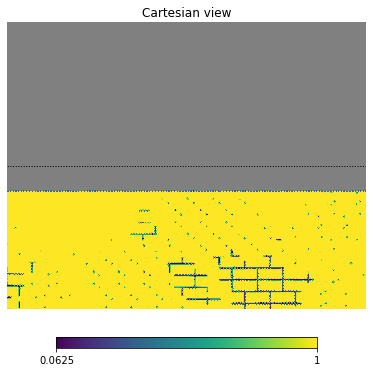

In [8]:
hp.cartview(hpxmap,lonra=[140,145],latra=[28,32])
hp.graticule()

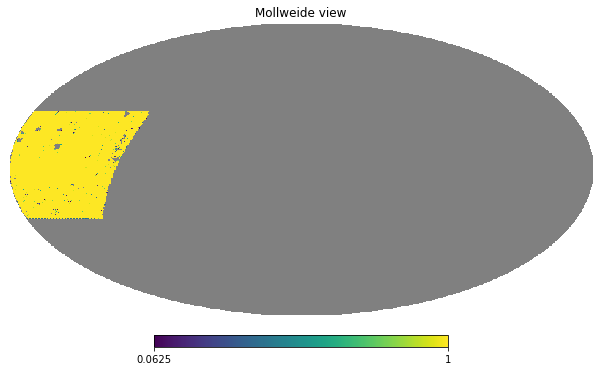

In [9]:
hp.mollview(hpxmap)

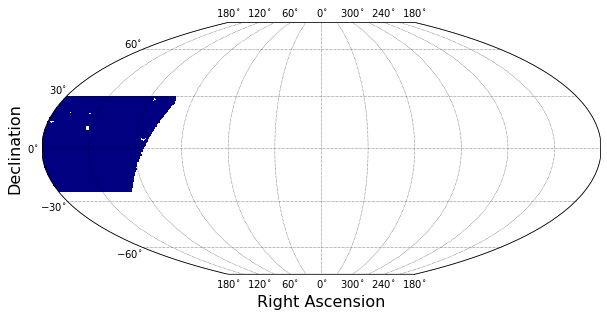

In [13]:
import skyproj
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(111)
sp = skyproj.McBrydeSkyproj(ax=ax)
sp.draw_hpxmap(hpxmap,zoom=False,cmap='jet')
plt.show()


/cvmfs/des.opensciencegrid.org/fnal/anaconda2/envs/des20a/lib/python3.7/site-packages/mpl_toolkits/basemap/__init__.py:4757: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if fix_wrap_around and itemindex:
/cvmfs/des.opensciencegrid.org/fnal/anaconda2/envs/des20a/lib/python3.7/site-packages/mpl_toolkits/basemap/__init__.py:4757: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if fix_wrap_around and itemindex:


ValueError: x and y arguments to pcolormesh cannot have non-finite values or be of type numpy.ma.core.MaskedArray with masked values

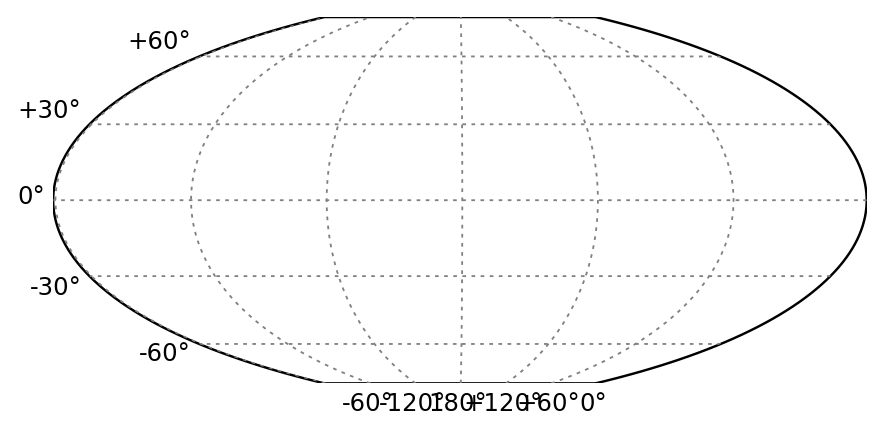

In [10]:
plt.figure(dpi=175)
vmin=0.5
vmax=1
smap=skymap.survey.SurveyMcBryde(lon_0=-179)
bit=smap.draw_hpxmap(hpxmap, vmin=vmin,vmax=vmax)
bit=smap.draw_inset_colorbar(loc=3,bbox_to_anchor=(0.,-0.22,1,1))

In [ ]:
dat.dtype

In [ ]:
outmap=dat.copy()

In [ ]:
vpix=dat.valid_pixels()
outmap.update_values_pix(vpix,dat2[vpix])

In [ ]:
hp.mollview(outmap.generate_healpix_map(256))

In [ ]:
dat.valid_pixels()

In [ ]:
dat.